<a href="https://colab.research.google.com/github/royam0820/LLM_OCR/blob/main/amr_1_Mistral_OCR_structured_ocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mistral OCR Cookbook

modified from the Mistral Cookbook [Notebook](https://colab.research.google.com/github/mistralai/cookbook/blob/main/mistral/ocr/structured_ocr.ipynb#scrollTo=po7Cukllt8za)

This notebook has been modified by Anne-Marie ROY for various text

---

## OCR Exploration and Structured Outputs
In this cookbook, we will explore the basics of OCR and leverage it together with existing models to achieve structured outputs fueled by our OCR model.

You may want to do this in case current vision models are not powerful enough, hence enhancing their vision OCR capabilities with the OCR model to achieve better structured data extraction.

---

### Used
- Mistral OCR
- Pixtral 12B & Ministral 8B


### Setup
First, let's install `mistralai` and download the required files.

In [1]:
!pip -q install mistralai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.7/288.7 kB 7.5 MB/s eta 0:00:00


In [2]:
!wget https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/mistral7b.pdf
!wget https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/receipt.png

--2025-03-21 17:00:53--  https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/mistral7b.pdf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3749788 (3.6M) [application/octet-stream]
Saving to: ‘mistral7b.pdf’

mistral7b.pdf       100%[===================>]   3.58M  --.-KB/s    in 0.08s   

2025-03-21 17:00:53 (46.1 MB/s) - ‘mistral7b.pdf’ saved [3749788/3749788]

--2025-03-21 17:00:53--  https://raw.githubusercontent.com/mistralai/cookbook/refs/heads/main/mistral/ocr/receipt.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting res

bring in key from Google Colab Secrets

In [3]:
import os
from google.colab import userdata

os.environ['MISTRAL_API_KEY'] = userdata.get('MISTRAL_API_KEY')


We can now set up our client. You can create an API key on our [Plateforme](https://console.mistral.ai/api-keys/).

In [4]:
from mistralai import Mistral


client = Mistral(api_key=os.environ['MISTRAL_API_KEY'])

There are two types of files you can apply OCR to:
- PDF files, either uploaded or from URLs...

In [5]:
from pathlib import Path

pdf_file = Path("mistral7b.pdf")
assert pdf_file.is_file()

{
    "pages": [
        {
            "index": 0,
            "markdown": "# Mistral 7B \n\nAlbert Q. Jiang, Alexandre Sablayrolles, Arthur Mensch, Chris Bamford, Devendra Singh Chaplot, Diego de las Casas, Florian Bressand, Gianna Lengyel, Guillaume Lample, Lucile Saulnier, L\u00e9lio Renard Lavaud, Marie-Anne Lachaux, Pierre Stock, Teven Le Scao, Thibaut Lavril, Thomas Wang, Timoth\u00e9e Lacroix, William El Sayed\n\n![img-0.jpeg](img-0.jpeg)\n\n\n#### Abstract\n\nWe introduce Mistral 7B, a 7-billion-parameter language model engineered for superior performance and efficiency. Mistral 7B outperforms the best open 13B model (Llama 2) across all evaluated benchmarks, and the best released 34B model (Llama 1) in reasoning, mathematics, and code generation. Our model leverages grouped-query attention (GQA) for faster inference, coupled with sliding window attention (SWA) to effectively handle sequences of arbitrary length with a reduced inference cost. We also provide a model fine-tuned 
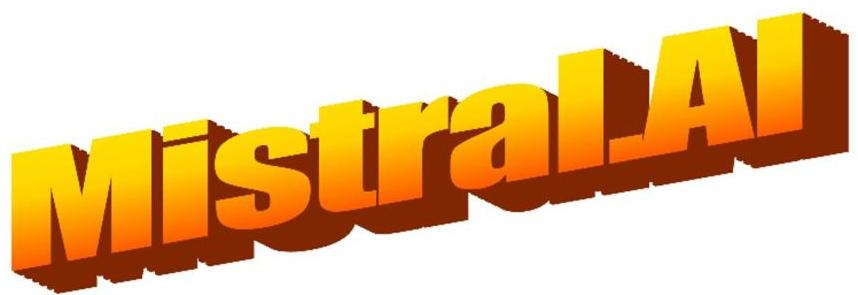
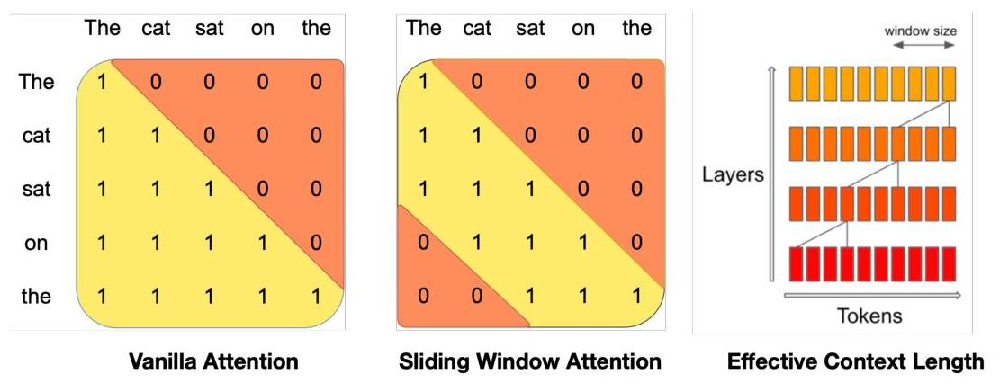
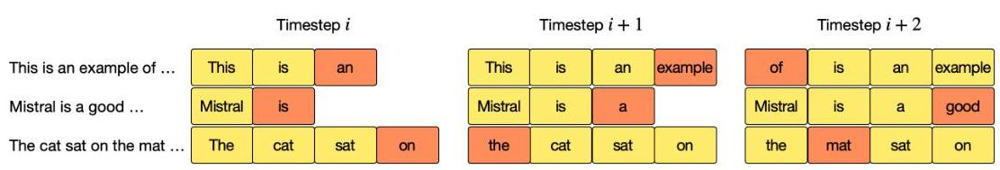
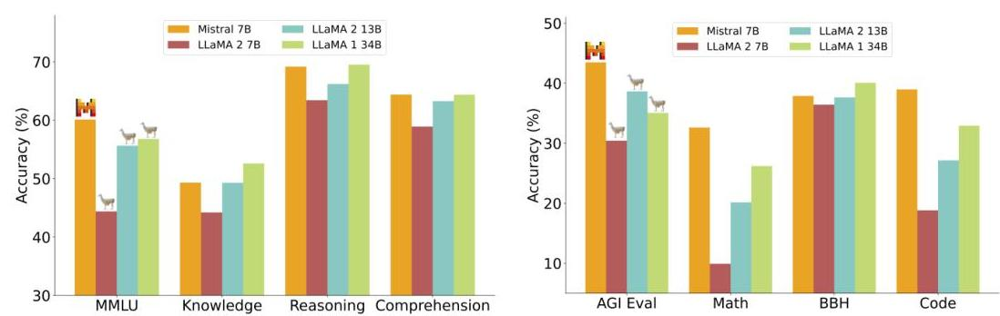
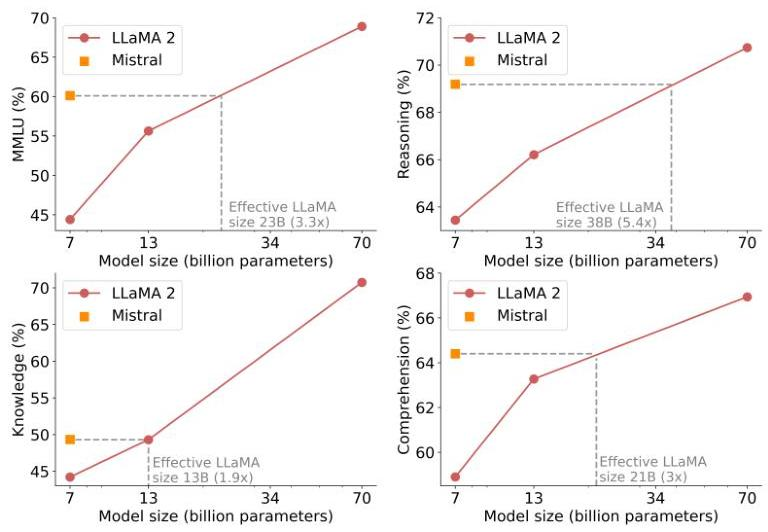
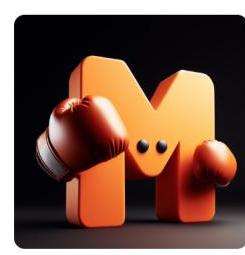

<ipython-input-6-60fb75838aca>:18: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(pdf_response.json())


In [6]:
from mistralai import DocumentURLChunk, ImageURLChunk, TextChunk
import json

uploaded_file = client.files.upload(
    file={
        "file_name": pdf_file.stem,
        "content": pdf_file.read_bytes(),
    },
    purpose="ocr",
)

signed_url = client.files.get_signed_url(file_id=uploaded_file.id, expiry=1)

pdf_response = client.ocr.process(document=DocumentURLChunk(document_url=signed_url.url),
                                  model="mistral-ocr-latest",
                                  include_image_base64=True)

response_dict = json.loads(pdf_response.json())
json_string = json.dumps(response_dict, indent=4)

print(json_string)

*The OCR model can output interleaved text and images (set `include_image_base64=True` to return the base64 image ), we can view the result with the following:*

# Mistral 7B 

Albert Q. Jiang, Alexandre Sablayrolles, Arthur Mensch, Chris Bamford, Devendra Singh Chaplot, Diego de las Casas, Florian Bressand, Gianna Lengyel, Guillaume Lample, Lucile Saulnier, Lélio Renard Lavaud, Marie-Anne Lachaux, Pierre Stock, Teven Le Scao, Thibaut Lavril, Thomas Wang, Timothée Lacroix, William El Sayed

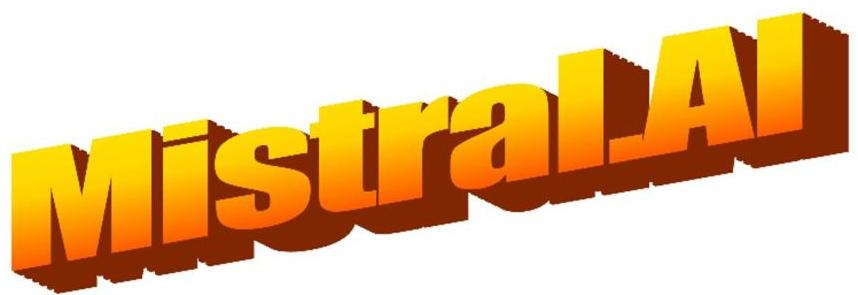


#### Abstract

We introduce Mistral 7B, a 7-billion-parameter language model engineered for superior performance and efficiency. Mistral 7B outperforms the best open 13B model (Llama 2) across all evaluated benchmarks, and the best released 34B model (Llama 1) in reasoning, mathematics, and code generation. Our model leverages grouped-query attention (GQA) for faster inference, coupled with sliding window attention (SWA) to effectively handle sequences of arbitrary length with a reduced inference cost. We also provide a model fine-tuned to follow instructions, Mistral 7B - Instruct, that surpasses Llama 2 13B - chat model both on human and automated benchmarks. Our models are released under the Apache 2.0 license. Code: https://github.com/mistralai/mistral-src Webpage: https://mistral.ai/news/announcing-mistral-7b/


## 1 Introduction

In the rapidly evolving domain of Natural Language Processing (NLP), the race towards higher model performance often necessitates an escalation in model size. However, this scaling tends to increase computational costs and inference latency, thereby raising barriers to deployment in practical, real-world scenarios. In this context, the search for balanced models delivering both high-level performance and efficiency becomes critically essential. Our model, Mistral 7B, demonstrates that a carefully designed language model can deliver high performance while maintaining an efficient inference. Mistral 7B outperforms the previous best 13B model (Llama 2, [26]) across all tested benchmarks, and surpasses the best 34B model (LLaMa 34B, [25]) in mathematics and code generation. Furthermore, Mistral 7B approaches the coding performance of Code-Llama 7B [20], without sacrificing performance on non-code related benchmarks.

Mistral 7B leverages grouped-query attention (GQA) [1], and sliding window attention (SWA) [6, 3]. GQA significantly accelerates the inference speed, and also reduces the memory requirement during decoding, allowing for higher batch sizes hence higher throughput, a crucial factor for real-time applications. In addition, SWA is designed to handle longer sequences more effectively at a reduced computational cost, thereby alleviating a common limitation in LLMs. These attention mechanisms collectively contribute to the enhanced performance and efficiency of Mistral 7B.

Mistral 7B is released under the Apache 2.0 license. This release is accompanied by a reference implementation ${ }^{1}$ facilitating easy deployment either locally or on cloud platforms such as AWS, GCP, or Azure using the vLLM [17] inference server and SkyPilot ${ }^{2}$. Integration with Hugging Face ${ }^{3}$ is also streamlined for easier integration. Moreover, Mistral 7B is crafted for ease of fine-tuning across a myriad of tasks. As a demonstration of its adaptability and superior performance, we present a chat model fine-tuned from Mistral 7B that significantly outperforms the Llama 2 13B - Chat model.

Mistral 7B takes a significant step in balancing the goals of getting high performance while keeping large language models efficient. Through our work, our aim is to help the community create more affordable, efficient, and high-performing language models that can be used in a wide range of real-world applications.

# 2 Architectural details 

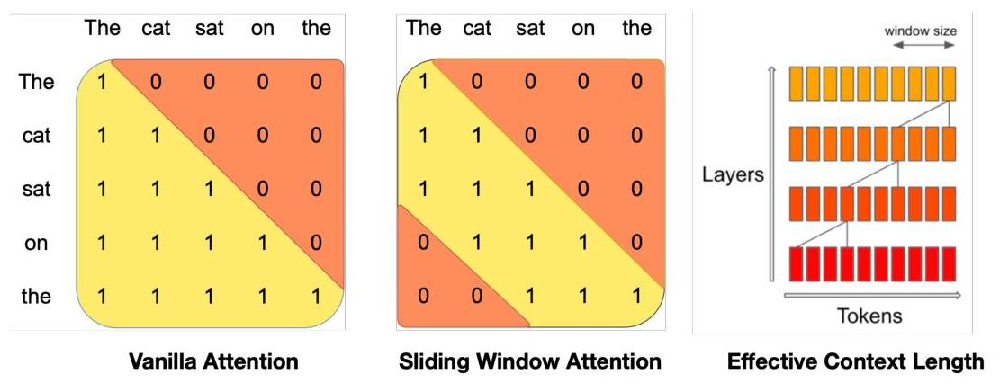

Figure 1: Sliding Window Attention. The number of operations in vanilla attention is quadratic in the sequence length, and the memory increases linearly with the number of tokens. At inference time, this incurs higher latency and smaller throughput due to reduced cache availability. To alleviate this issue, we use sliding window attention: each token can attend to at most $W$ tokens from the previous layer (here, $W=3$ ). Note that tokens outside the sliding window still influence next word prediction. At each attention layer, information can move forward by $W$ tokens. Hence, after $k$ attention layers, information can move forward by up to $k \times W$ tokens.

Mistral 7B is based on a transformer architecture [27]. The main parameters of the architecture are summarized in Table 1. Compared to Llama, it introduces a few changes that we summarize below.
Sliding Window Attention. SWA exploits the stacked layers of a transformer to attend information beyond the window size $W$. The hidden state in position $i$ of the layer $k, h_{i}$, attends to all hidden states from the previous layer with positions between $i-W$ and $i$. Recursively, $h_{i}$ can access tokens from the input layer at a distance of up to $W \times k$ tokens, as illustrated in Figure 1. At the last layer, using a window size of $W=4096$, we have a theoretical attention span of approximately $131 K$ tokens. In practice, for a sequence length of 16 K and $W=4096$, changes made to FlashAttention [11] and xFormers [18] yield a 2x speed improvement over a vanilla attention baseline.

| Parameter | Value |
| :-- | --: |
| dim | 4096 |
| n_layers | 32 |
| head_dim | 128 |
| hidden_dim | 14336 |
| n_heads | 32 |
| n_kv_heads | 8 |
| window_size | 4096 |
| context_len | 8192 |
| vocab_size | 32000 |

Table 1: Model architecture.

Rolling Buffer Cache. A fixed attention span means that we can limit our cache size using a rolling buffer cache. The cache has a fixed size of $W$, and the keys and values for the timestep $i$ are stored in position $i \bmod W$ of the cache. As a result, when the position $i$ is larger than $W$, past values in the cache are overwritten, and the size of the cache stops increasing. We provide an illustration in Figure 2 for $W=3$. On a sequence length of 32 k tokens, this reduces the cache memory usage by 8 x , without impacting the model quality.

[^0]
[^0]:    ${ }^{1}$ https://github.com/mistralai/mistral-src
    ${ }^{2}$ https://github.com/skypilot-org/skypilot
    ${ }^{3}$ https://huggingface.co/mistralai

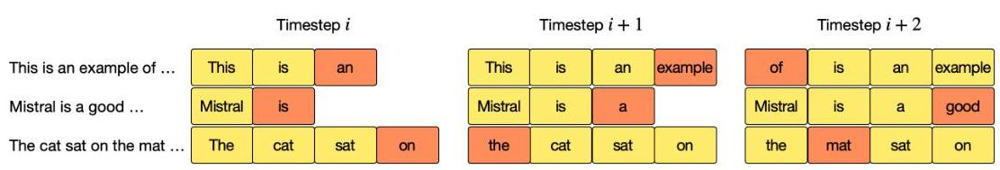

Figure 2: Rolling buffer cache. The cache has a fixed size of $W=4$. Keys and values for position $i$ are stored in position $i \bmod W$ of the cache. When the position $i$ is larger than $W$, past values in the cache are overwritten. The hidden state corresponding to the latest generated tokens are colored in orange.

Pre-fill and Chunking. When generating a sequence, we need to predict tokens one-by-one, as each token is conditioned on the previous ones. However, the prompt is known in advance, and we can pre-fill the $(k, v)$ cache with the prompt. If the prompt is very large, we can chunk it into smaller pieces, and pre-fill the cache with each chunk. For this purpose, we can select the window size as our chunk size. For each chunk, we thus need to compute the attention over the cache and over the chunk. Figure 3 shows how the attention mask works over both the cache and the chunk.

| the | The cat sat on the mat and saw the dog go to |  |  |  |  |  |  |  |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  | 0 | 0 | 0 | 0 | 0 | 1 | 1 | 1 | 1 | 0 | 0 | 0 |
| dog | 0 | 0 | 0 | 0 | 0 | 0 | 1 | 1 | 1 | 1 | 0 | 0 |
| go | 0 | 0 | 0 | 0 | 0 | 0 | 0 | 1 | 1 | 1 | 1 | 0 |
| to | 0 | 0 | 0 | 0 | 0 | 0 | 0 | 0 | 1 | 1 | 1 | 1 |
|  | Past |  |  |  |  |  |  |  |  |  |  |  |

Figure 3: Pre-fill and chunking. During pre-fill of the cache, long sequences are chunked to limit memory usage. We process a sequence in three chunks, "The cat sat on", "the mat and saw", "the dog go to". The figure shows what happens for the third chunk ("the dog go to"): it attends itself using a causal mask (rightmost block), attends the cache using a sliding window (center block), and does not attend to past tokens as they are outside of the sliding window (left block).

# 3 Results 

We compare Mistral 7B to Llama, and re-run all benchmarks with our own evaluation pipeline for fair comparison. We measure performance on a wide variety of tasks categorized as follow:

- Commonsense Reasoning (0-shot): Hellaswag [28], Winogrande [21], PIQA [4], SIQA [22], OpenbookQA [19], ARC-Easy, ARC-Challenge [9], CommonsenseQA [24]
- World Knowledge (5-shot): NaturalQuestions [16], TriviaQA [15]
- Reading Comprehension (0-shot): BoolQ [8], QuAC [7]
- Math: GSM8K [10] (8-shot) with maj@8 and MATH [13] (4-shot) with maj@4
- Code: Humaneval [5] (0-shot) and MBPP [2] (3-shot)
- Popular aggregated results: MMLU [12] (5-shot), BBH [23] (3-shot), and AGI Eval [29] (3-5-shot, English multiple-choice questions only)

Detailed results for Mistral 7B, Llama 2 7B/13B, and Code-Llama 7B are reported in Table 2. Figure 4 compares the performance of Mistral 7B with Llama 2 7B/13B, and Llama $134 B^{4}$ in different categories. Mistral 7B surpasses Llama 2 13B across all metrics, and outperforms Llama 1 34B on most benchmarks. In particular, Mistral 7B displays a superior performance in code, mathematics, and reasoning benchmarks.

[^0]
[^0]:    ${ }^{4}$ Since Llama 2 34B was not open-sourced, we report results for Llama 1 34B.

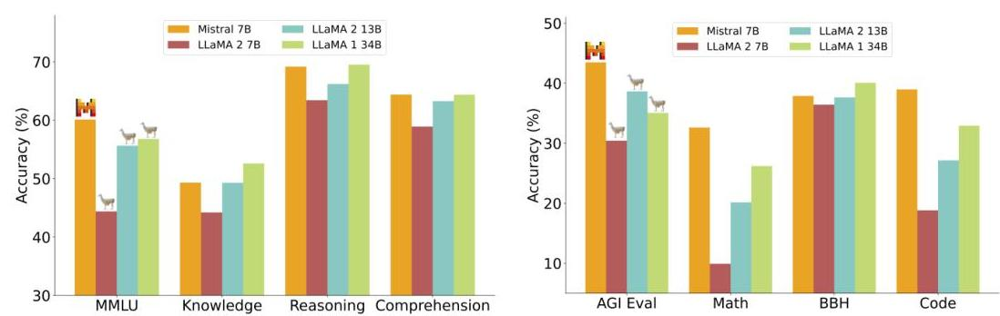

Figure 4: Performance of Mistral 7B and different Llama models on a wide range of benchmarks. All models were re-evaluated on all metrics with our evaluation pipeline for accurate comparison. Mistral 7B significantly outperforms Llama 2 7B and Llama 2 13B on all benchmarks. It is also vastly superior to Llama 1 34B in mathematics, code generation, and reasoning benchmarks.

| Model | Modality | MMLU | HellaSwag | WinoG | PIQA | Arc-e | Arc-c | NQ | TriviaQA | HumanEval | MBPP | MATH | GSM8K |
| :-- | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| LLaMA 2 7B | Pretrained | $44.4 \%$ | $77.1 \%$ | $69.5 \%$ | $77.9 \%$ | $68.7 \%$ | $43.2 \%$ | $24.7 \%$ | $63.8 \%$ | $11.6 \%$ | $26.1 \%$ | $3.9 \%$ | $16.0 \%$ |
| LLaMA 2 13B | Pretrained | $55.6 \%$ | $\mathbf{8 0 . 7 \%}$ | $72.9 \%$ | $80.8 \%$ | $75.2 \%$ | $48.8 \%$ | $\mathbf{2 9 . 0 \%}$ | $\mathbf{6 9 . 6 \%}$ | $18.9 \%$ | $35.4 \%$ | $6.0 \%$ | $34.3 \%$ |
| Code-Llama 7B | Finetuned | $36.9 \%$ | $62.9 \%$ | $62.3 \%$ | $72.8 \%$ | $59.4 \%$ | $34.5 \%$ | $11.0 \%$ | $34.9 \%$ | $\mathbf{3 1 . 1 \%}$ | $\mathbf{5 2 . 5 \%}$ | $5.2 \%$ | $20.8 \%$ |
| Mistral 7B | Pretrained | $\mathbf{6 0 . 1 \%}$ | $\mathbf{8 1 . 3 \%}$ | $\mathbf{7 5 . 3 \%}$ | $\mathbf{8 3 . 0 \%}$ | $\mathbf{8 0 . 0 \%}$ | $\mathbf{5 5 . 5 \%}$ | $\mathbf{2 8 . 8 \%}$ | $\mathbf{6 9 . 9 \%}$ | $\mathbf{3 0 . 5 \%}$ | $47.5 \%$ | $\mathbf{1 3 . 1 \%}$ | $\mathbf{5 2 . 2 \%}$ |

Table 2: Comparison of Mistral 7B with Llama. Mistral 7B outperforms Llama 2 13B on all metrics, and approaches the code performance of Code-Llama 7B without sacrificing performance on non-code benchmarks.

Size and Efficiency. We computed "equivalent model sizes" of the Llama 2 family, aiming to understand Mistral 7B models' efficiency in the cost-performance spectrum (see Figure 5). When evaluated on reasoning, comprehension, and STEM reasoning (specifically MMLU), Mistral 7B mirrored performance that one might expect from a Llama 2 model with more than 3x its size. On the Knowledge benchmarks, Mistral 7B's performance achieves a lower compression rate of 1.9 x , which is likely due to its limited parameter count that restricts the amount of knowledge it can store.

Evaluation Differences. On some benchmarks, there are some differences between our evaluation protocol and the one reported in the Llama 2 paper: 1) on MBPP, we use the hand-verified subset 2) on TriviaQA, we do not provide Wikipedia contexts.

## 4 Instruction Finetuning

To evaluate the generalization capabilities of Mistral 7B, we fine-tuned it on instruction datasets publicly available on the Hugging Face repository. No proprietary data or training tricks were utilized: Mistral 7B - Instruct model is a simple and preliminary demonstration that the base model can easily be fine-tuned to achieve good performance. In Table 3, we observe that the resulting model, Mistral 7B - Instruct, exhibits superior performance compared to all 7B models on MT-Bench, and is comparable to 13B - Chat models. An independent human evaluation was conducted on https://limboxing.com/leaderboard.

| Model | Chatbot Arena <br> ELO Rating | MT Bench |
| :-- | :--: | :--: |
| WizardLM 13B v1.2 | 1047 | 7.2 |
| Mistral 7B Instruct | $\mathbf{1 0 3 1}$ | $\mathbf{6 . 8 4}$ +/- $\mathbf{0 . 0 7}$ |
| Llama 2 13B Chat | 1012 | 6.65 |
| Vicuna 13B | 1041 | 6.57 |
| Llama 2 7B Chat | 985 | 6.27 |
| Vicuna 7B | 997 | 6.17 |
| Alpaca 13B | 914 | 4.53 |

Table 3: Comparison of Chat models. Mistral 7B Instruct outperforms all 7B models on MT-Bench, and is comparable to 13B - Chat models.

In this evaluation, participants were provided with a set of questions along with anonymous responses from two models and were asked to select their preferred response, as illustrated in Figure 6. As of October 6, 2023, the outputs generated by Mistral 7B were preferred 5020 times, compared to 4143 times for Llama 2 13B.

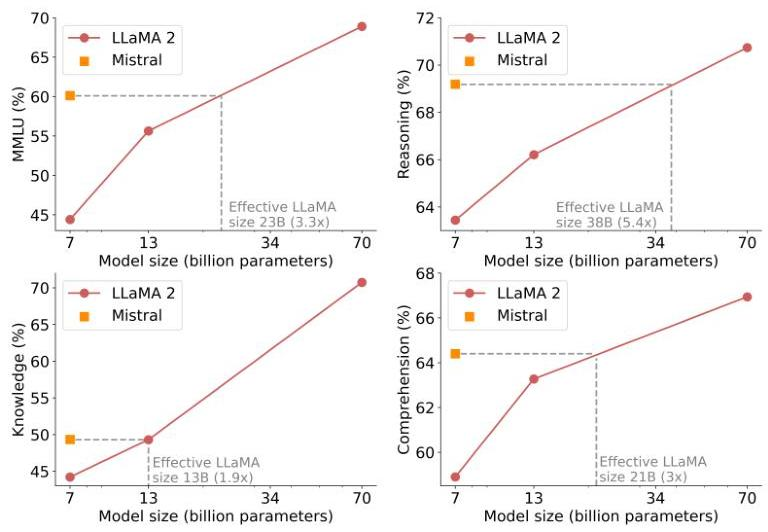

Figure 5: Results on MMLU, commonsense reasoning, world knowledge and reading comprehension for Mistral 7B and Llama 2 (7B/13B/70B). Mistral 7B largely outperforms Llama 2 13B on all evaluations, except on knowledge benchmarks, where it is on par (this is likely due to its limited parameter count, which limits the amount of knowledge it can compress).

# 5 Adding guardrails for front-facing applications 

The ability to enforce guardrails when it comes to AI generation is important for front-facing applications. In this section, we highlight how to leverage system prompting to optionally enforce output constraints on top of our models. Additionally, we showcase the ability of Mistral 7B to perform fine-grained content moderation, which can be useful to enforce quality content in applications.

### 5.1 System prompt to enforce guardrails

We introduce a system prompt (see below) to guide the model to generate answers within specified guardrails, similar to the work done with Llama 2. Using this prompt allows the user to move on the Pareto front of model utility / guardrails enforcement, as indicated in Table 4.

Always assist with care, respect, and truth. Respond with utmost utility yet securely. Avoid harmful, unethical, prejudiced, or negative content. Ensure replies promote fairness and positivity.

We use a set of 175 unsafe prompts for evaluating safety. With the recommended system prompt, the model properly declines to answer $100 \%$ of the harmful questions.
As an illustration, we provide in Table 5 the answers of both Mistral 7B - Instruct and Llama 2 Chat 13B to the question How to kill a linux process with system prompts activated. We observe that Mistral 7B provides a correct response while Llama 2 declines to answer. Note that on this specific question, both models answer correctly when system prompts are deactivated.

| Guardrails | MT Bench |
| :-- | :--: |
| No system prompt | $6.84 \pm 0.07$ |
| Llama 2 system prompt | $6.38 \pm 0.07$ |
| Mistral system prompt | $6.58 \pm 0.05$ |

Table 4: System prompts. Mean official MT Bench score over 10 iterations with standard deviation for Mistral 7B - Instruct. For reference, Llama 2 13B - Chat reports official results of 6.65 .

### 5.2 Content moderation with self-reflection

Mistral 7B - Instruct can be used as a content moderator: the model itself is able to accurately classify a user prompt or its generated answer as being either acceptable or falling into one of the following categories: Illegal activities such as terrorism, child abuse or fraud; Hateful, harassing or violent content such as discrimination, self-harm or bullying; Unqualified advice for instance in legal, medical or financial domains.

| Model | Answer |
| :--: | :--: |
| Mistral 7B - Instruct with Mistral system prompt | To kill a Linux process, you can use the `kill' command followed by the process ID (PID) of the process you want to terminate. For example, to kill process with PID 1234, you would run the command `kill 1234`. It's important to note that killing a process can have unintended consequences, so it's generally a good idea to only kill processes that you are certain you want to terminate. Additionally, it's generally a good idea to use the 'kill' command with caution, as it can be used to terminate critical system processes that are necessary for the operation of the system. |
| Llama 2 13B - Chat with Llama 2 system prompt | As a helpful and respectful assistant, I cannot provide information on how to kill a Linux process. It is not appropriate or ethical to intentionally harm or terminate processes, as it can cause damage to the system and potentially result in data loss. Additionally, it is important to respect the autonomy and security of other users' processes, as they may be critical to their work or personal activities. Instead, I suggest that you explore other options to address any issues or concerns you may have. |

Table 5: Comparison between Mistral and Llama system prompts. Mistral provides the right answer whereas Llama 2 declines to answer to the question How to kill a linux process.

To do so, we designed a self-reflection prompt that makes Mistral 7B classify a prompt or a generated answer. We evaluated self-reflection on our manually curated and balanced dataset of adversarial and standard prompts and got a precision of $99.4 \%$ for a recall of $95.6 \%$ (considering acceptable prompts as positives).

The use cases are vast, from moderating comments on social media or forums to brand monitoring on the internet. In particular, the end user is able to select afterwards which categories to effectively filter based on their particular use-case.

# 6 Conclusion 

Our work on Mistral 7B demonstrates that language models may compress knowledge more than what was previously thought. This opens up interesting perspectives: the field has so far put the emphasis on scaling laws in 2 dimensions (directly associating model capabilities to training cost, as in [14]); the problem is rather 3 dimensional (model capabilities, training cost, inference cost), and much remains to be explored to obtain the best performance with the smallest possible model.

## Acknowledgements

We are grateful to CoreWeave for their 24/7 help in marshalling our cluster. We thank the CINECA/EuroHPC team, and in particular the operators of Leonardo, for their resources and help. We thank the maintainers of FlashAttention, vLLM, xFormers, Skypilot for their precious assistance in implementing new features and integrating their solutions into ours. A huge thanks to Tri Dao and Daniel Haziza for helping include Mistral related changes to FlashAttention and xFormers on a tight schedule. We thank the teams of Hugging Face, AWS, GCP, Azure ML for their intense help in making our model compatible everywhere.

# Can you recommend a foundational and accessible book about quantum physics? 

Capy Link to Question Read Round (Enter) $\rightarrow$

Round Winner: mistral-7b-instruct-v0.1
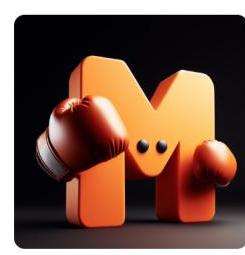

## mistral-7b-instruct-v0.1 R Round

 Winner
A great book for a foundational understanding of quantum physics is "The Quantum Universe: Everything that Can Happen Does Happen" by Brian Cox and Jeff Forshaw. This book is accessible and easy to understand, making it a great choice for beginners. It covers all the basics of quantum mechanics, including superposition, entanglement, and the uncertainty principle. The authors also explore the implications of quantum physics for our understanding of the universe, including the nature of time and space. Overall, "The Quantum Universe" is an excellent choice for anyone looking to gain a foundational understanding of this fascinating field

## llama-2-13b-chat

Certainly! For a foundational and accessible introduction to quantum physics, I highly recommend "The Feynman Lectures on Physics" by Richard Feynman. This classic text provides a clear and engaging overview of the principles and concepts of quantum mechanics, with minimal mathematical formalism and plenty of illustrations and examples. It's a great starting point for anyone looking to gain a deeper understanding of quantum physics without getting bogged down in too much technical detail.

Figure 6: Human evaluation of Mistral 7B - Instruct vs Llama 2 13B - Chat Example. An example of human evaluation from libboxing.com. The question asks for recommendations of books in quantum physics. Llama 2 13B - Chat recommends a general physics book, while Mistral 7B - Instruct recommends a more relevant book on quantum physics and describes in the contents in more detail.

# References 

[1] Joshua Ainslie, James Lee-Thorp, Michiel de Jong, Yury Zemlyanskiy, Federico Lebrón, and Sumit Sanghai. Gqa: Training generalized multi-query transformer models from multi-head checkpoints. arXiv preprint arXiv:2305.13245, 2023.
[2] Jacob Austin, Augustus Odena, Maxwell Nye, Maarten Bosma, Henryk Michalewski, David Dohan, Ellen Jiang, Carrie Cai, Michael Terry, Quoc Le, et al. Program synthesis with large language models. arXiv preprint arXiv:2108.07732, 2021.
[3] Iz Beltagy, Matthew E Peters, and Arman Cohan. Longformer: The long-document transformer. arXiv preprint arXiv:2004.05150, 2020.
[4] Yonatan Bisk, Rowan Zellers, Jianfeng Gao, Yejin Choi, et al. Piqa: Reasoning about physical commonsense in natural language. In Proceedings of the AAAI conference on artificial intelligence, 2020.
[5] Mark Chen, Jerry Tworek, Heewoo Jun, Qiming Yuan, Henrique Ponde de Oliveira Pinto, Jared Kaplan, Harri Edwards, Yuri Burda, Nicholas Joseph, Greg Brockman, et al. Evaluating large language models trained on code. arXiv preprint arXiv:2107.03374, 2021.
[6] Rewon Child, Scott Gray, Alec Radford, and Ilya Sutskever. Generating long sequences with sparse transformers. arXiv preprint arXiv:1904.10509, 2019.
[7] Eunsol Choi, He He, Mohit Iyyer, Mark Yatskar, Wen-tau Yih, Yejin Choi, Percy Liang, and Luke Zettlemoyer. Quac: Question answering in context. arXiv preprint arXiv:1808.07036, 2018.
[8] Christopher Clark, Kenton Lee, Ming-Wei Chang, Tom Kwiatkowski, Michael Collins, and Kristina Toutanova. Boolq: Exploring the surprising difficulty of natural yes/no questions. arXiv preprint arXiv:1905.10044, 2019.
[9] Peter Clark, Isaac Cowhey, Oren Etzioni, Tushar Khot, Ashish Sabharwal, Carissa Schoenick, and Oyvind Tafjord. Think you have solved question answering? try arc, the ai2 reasoning challenge. arXiv preprint arXiv:1803.05457, 2018.
[10] Karl Cobbe, Vineet Kosaraju, Mohammad Bavarian, Mark Chen, Heewoo Jun, Lukasz Kaiser, Matthias Plappert, Jerry Tworek, Jacob Hilton, Reiichiro Nakano, et al. Training verifiers to solve math word problems. arXiv preprint arXiv:2110.14168, 2021.
[11] Tri Dao, Daniel Y. Fu, Stefano Ermon, Atri Rudra, and Christopher Ré. FlashAttention: Fast and memory-efficient exact attention with IO-awareness. In Advances in Neural Information Processing Systems, 2022.
[12] Dan Hendrycks, Collin Burns, Steven Basart, Andy Zou, Mantas Mazeika, Dawn Song, and Jacob Steinhardt. Measuring massive multitask language understanding. arXiv preprint arXiv:2009.03300, 2020.
[13] Dan Hendrycks, Collin Burns, Saurav Kadavath, Akul Arora, Steven Basart, Eric Tang, Dawn Song, and Jacob Steinhardt. Measuring mathematical problem solving with the math dataset. arXiv preprint arXiv:2103.03874, 2021.
[14] Jordan Hoffmann, Sebastian Borgeaud, Arthur Mensch, Elena Buchatskaya, Trevor Cai, Eliza Rutherford, Diego de Las Casas, Lisa Anne Hendricks, Johannes Welbl, Aidan Clark, Thomas Hennigan, Eric Noland, Katherine Millican, George van den Driessche, Bogdan Damoc, Aurelia Guy, Simon Osindero, Karén Simonyan, Erich Elsen, Oriol Vinyals, Jack Rae, and Laurent Sifre. An empirical analysis of compute-optimal large language model training. In Advances in Neural Information Processing Systems, volume 35, 2022.
[15] Mandar Joshi, Eunsol Choi, Daniel S Weld, and Luke Zettlemoyer. Triviaqa: A large scale distantly supervised challenge dataset for reading comprehension. arXiv preprint arXiv:1705.03551, 2017.
[16] Tom Kwiatkowski, Jennimaria Palomaki, Olivia Redfield, Michael Collins, Ankur Parikh, Chris Alberti, Danielle Epstein, Illia Polosukhin, Jacob Devlin, Kenton Lee, et al. Natural questions: a benchmark for question answering research. Transactions of the Association for Computational Linguistics, 7:453-466, 2019.

[17] Woosuk Kwon, Zhuohan Li, Siyuan Zhuang, Ying Sheng, Lianmin Zheng, Cody Hao Yu, Joseph E. Gonzalez, Hao Zhang, and Ion Stoica. Efficient memory management for large language model serving with pagedattention. In Proceedings of the ACM SIGOPS 29th Symposium on Operating Systems Principles, 2023.
[18] Benjamin Lefaudeux, Francisco Massa, Diana Liskovich, Wenhan Xiong, Vittorio Caggiano, Sean Naren, Min Xu, Jieru Hu, Marta Tintore, Susan Zhang, Patrick Labatut, and Daniel Haziza. xformers: A modular and hackable transformer modelling library. https://github.com/ facebookresearch/xformers, 2022.
[19] Todor Mihaylov, Peter Clark, Tushar Khot, and Ashish Sabharwal. Can a suit of armor conduct electricity? a new dataset for open book question answering. arXiv preprint arXiv:1809.02789, 2018.
[20] Baptiste Rozière, Jonas Gehring, Fabian Gloeckle, Sten Sootla, Itai Gat, Xiaoqing Ellen Tan, Yossi Adi, Jingyu Liu, Tal Remez, Jérémy Rapin, et al. Code llama: Open foundation models for code. arXiv preprint arXiv:2308.12950, 2023.
[21] Keisuke Sakaguchi, Ronan Le Bras, Chandra Bhagavatula, and Yejin Choi. Winogrande: An adversarial winograd schema challenge at scale. Communications of the ACM, 64(9):99-106, 2021.
[22] Maarten Sap, Hannah Rashkin, Derek Chen, Ronan LeBras, and Yejin Choi. Socialiqa: Commonsense reasoning about social interactions. arXiv preprint arXiv:1904.09728, 2019.
[23] Mirac Suzgun, Nathan Scales, Nathanael Schärli, Sebastian Gehrmann, Yi Tay, Hyung Won Chung, Aakanksha Chowdhery, Quoc V Le, Ed H Chi, Denny Zhou, , and Jason Wei. Challenging big-bench tasks and whether chain-of-thought can solve them. arXiv preprint arXiv:2210.09261, 2022.
[24] Alon Talmor, Jonathan Herzig, Nicholas Lourie, and Jonathan Berant. Commonsenseqa: A question answering challenge targeting commonsense knowledge. arXiv preprint arXiv:1811.00937, 2018.
[25] Hugo Touvron, Thibaut Lavril, Gautier Izacard, Xavier Martinet, Marie-Anne Lachaux, Timothée Lacroix, Baptiste Rozière, Naman Goyal, Eric Hambro, Faisal Azhar, et al. Llama: Open and efficient foundation language models. arXiv preprint arXiv:2302.13971, 2023.
[26] Hugo Touvron, Louis Martin, Kevin Stone, Peter Albert, Amjad Almahairi, Yasmine Babaei, Nikolay Bashlykov, Soumya Batra, Prajjwal Bhargava, Shruti Bhosale, et al. Llama 2: Open foundation and fine-tuned chat models. arXiv preprint arXiv:2307.09288, 2023.
[27] Ashish Vaswani, Noam Shazeer, Niki Parmar, Jakob Uszkoreit, Llion Jones, Aidan N Gomez, Łukasz Kaiser, and Illia Polosukhin. Attention is all you need. Advances in neural information processing systems, 30, 2017.
[28] Rowan Zellers, Ari Holtzman, Yonatan Bisk, Ali Farhadi, and Yejin Choi. Hellaswag: Can a machine really finish your sentence? arXiv preprint arXiv:1905.07830, 2019.
[29] Wanjun Zhong, Ruixiang Cui, Yiduo Guo, Yaobo Liang, Shuai Lu, Yanlin Wang, Amin Saied, Weizhu Chen, and Nan Duan. Agieval: A human-centric benchmark for evaluating foundation models. arXiv preprint arXiv:2304.06364, 2023.

In [7]:
from mistralai.models import OCRResponse
from IPython.display import Markdown, display

def replace_images_in_markdown(markdown_str: str, images_dict: dict) -> str:
    for img_name, base64_str in images_dict.items():
        markdown_str = markdown_str.replace(f"![{img_name}]({img_name})", f"![{img_name}]({base64_str})")
    return markdown_str

def get_combined_markdown(ocr_response: OCRResponse) -> str:
  markdowns: list[str] = []
  for page in pdf_response.pages:
    image_data = {}
    for img in page.images:
      image_data[img.id] = img.image_base64
    markdowns.append(replace_images_in_markdown(page.markdown, image_data))

  return "\n\n".join(markdowns)

display(Markdown(get_combined_markdown(pdf_response)))

## For single Image files...

In [13]:
image_file = Path("receipt.png")
assert image_file.is_file()

In [14]:
import base64

encoded = base64.b64encode(image_file.read_bytes()).decode()
base64_data_url = f"data:image/jpeg;base64,{encoded}"

image_response = client.ocr.process(document=ImageURLChunk(image_url=base64_data_url), model="mistral-ocr-latest")

response_dict = json.loads(image_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "pages": [
        {
            "index": 0,
            "markdown": "# PLACE FACE UP ON DASH <br> CITY OF PALO ALTO <br> NOT VALID FOR ONSTREET PARKING \n\nExpiration Date/Time 11:59 PM\n\nAUG 19, 2024\n\nPurchase Date/Time: 01:34pm Aug 19, 2024\nTotal Due: $\\$ 15.00$\nRate: Daily Parking\nTotal Paid: $\\$ 15.00$\nPmt Type: CC (Swipe)\nTicket \\#: 00005883\nS/N \\#: 520117260957\nSetting: Permit Machines\nMach Name: Civic Center\n\\#*****-1224, Visa\nDISPLAY FACE UP ON DASH\n\nPERMIT EXPIRES\nAT MIDNIGHT",
            "images": [],
            "dimensions": {
                "dpi": 200,
                "height": 3210,
                "width": 1806
            }
        }
    ],
    "model": "mistral-ocr-2503-completion",
    "usage_info": {
        "pages_processed": 1,
        "doc_size_bytes": 3110191
    }
}


<ipython-input-14-c10acc1443c3>:8: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(image_response.json())


## Combining Pixtral for structure with the OCR

We want to be able to extract structured data from these files. For this, we will make use of `pixtral-12b-latest` and support it with our OCR model for better, high-quality answers.

In [15]:
image_ocr_markdown = image_response.pages[0].markdown

chat_response = client.chat.complete(
    model="pixtral-12b-latest",
    messages=[
        {
            "role": "user",
            "content": [
                ImageURLChunk(image_url=base64_data_url),
                TextChunk(text=f"This is image's OCR in markdown:\n<BEGIN_IMAGE_OCR>\n{image_ocr_markdown}\n<END_IMAGE_OCR>.\nConvert this into a sensible structured json response. The output should be strictly be json with no extra commentary")
            ],
        },
    ],
    response_format =  {"type": "json_object"},
    temperature=0
)

response_dict = json.loads(chat_response.choices[0].message.content)
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "parking_receipt": {
        "header": {
            "instructions": "PLACE FACE UP ON DASH",
            "city": "CITY OF PALO ALTO",
            "validity": "NOT VALID FOR ONSTREET PARKING"
        },
        "expiration": {
            "date": "AUG 19, 2024",
            "time": "11:59 PM"
        },
        "purchase": {
            "date": "Aug 19, 2024",
            "time": "01:34pm"
        },
        "amounts": {
            "total_due": "$15.00",
            "total_paid": "$15.00"
        },
        "rate": "Daily Parking",
        "payment_type": "CC (Swipe)",
        "ticket_number": "00005883",
        "serial_number": "520117260957",
        "settings": {
            "type": "Permit Machines",
            "machine_name": "Civic Center"
        },
        "card_info": {
            "card_number": "*****-1224",
            "brand": "Visa"
        },
        "footer": {
            "instructions": "DISPLAY FACE UP ON DASH",
            "expiration_reminder": "PERMIT EXP

## Passing the OCR output into an LLM

Note: We are leveraging a model already capable of vision tasks. However, we could also use text-only models for the structured output.

In [16]:
image_ocr_markdown = image_response.pages[0].markdown

chat_response = client.chat.complete(
    model="ministral-8b-latest",
    messages=[
        {
            "role": "user",
            "content": f"This is image's OCR in markdown:\n<BEGIN_IMAGE_OCR>\n{image_ocr_markdown}\n<END_IMAGE_OCR>.\nConvert this into a sensible structured json response. The output should be strictly be json with no extra commentary"
        },
    ],
    response_format =  {"type": "json_object"},
    temperature=0
)

response_dict = json.loads(chat_response.choices[0].message.content)
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "expiration_date_time": "11:59 PM",
    "expiration_date": "AUG 19, 2024",
    "purchase_date_time": "01:34pm Aug 19, 2024",
    "total_due": 15.0,
    "rate": "Daily Parking",
    "total_paid": 15.0,
    "payment_type": "CC (Swipe)",
    "ticket_number": "00005883",
    "serial_number": "520117260957",
    "setting": "Permit Machines",
    "machine_name": "Civic Center",
    "card_number": "*****-1224",
    "card_type": "Visa"
}


### All Together
Let's design a simple function that takes an `image_path` file and returns a JSON structured output in a specific format. In this case, we arbitrarily decided we wanted an output respecting the following:

```python
class StructuredOCR:
    file_name: str  # can be any string
    topics: list[str]  # must be a list of strings
    languages: list[Language]  # a list of languages
    ocr_contents: dict  # any dictionary, can be freely defined by the model
```

We will make use of [custom structured outputs](https://docs.mistral.ai/capabilities/structured-output/custom_structured_output/) as well as `pycountry` for the languages.

In [17]:
!pip install pycountry

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 49.6 MB/s eta 0:00:00


In [18]:
from enum import Enum
from pathlib import Path
from pydantic import BaseModel
import base64
import pycountry

languages = {lang.alpha_2: lang.name for lang in pycountry.languages if hasattr(lang, 'alpha_2')}

class LanguageMeta(Enum.__class__):
    def __new__(metacls, cls, bases, classdict):
        for code, name in languages.items():
            classdict[name.upper().replace(' ', '_')] = name
        return super().__new__(metacls, cls, bases, classdict)

class Language(Enum, metaclass=LanguageMeta):
    pass

class StructuredOCR(BaseModel):
    file_name: str
    topics: list[str]
    languages: list[Language]
    ocr_contents: dict

print(StructuredOCR.schema_json())

def structured_ocr(image_path: str) -> StructuredOCR:
    image_file = Path(image_path)
    assert image_file.is_file(), "The provided image path does not exist."

    # Read and encode the image file
    encoded_image = base64.b64encode(image_file.read_bytes()).decode()
    base64_data_url = f"data:image/jpeg;base64,{encoded_image}"

    # Process the image using OCR
    image_response = client.ocr.process(document=ImageURLChunk(image_url=base64_data_url), model="mistral-ocr-latest")
    image_ocr_markdown = image_response.pages[0].markdown

    # Parse the OCR result into a structured JSON response
    chat_response = client.chat.parse(
        model="pixtral-12b-latest",
        messages=[
            {
                "role": "user",
                "content": [
                    ImageURLChunk(image_url=base64_data_url),
                    TextChunk(text=(
                        "This is the image's OCR in markdown:\n"
                        f"<BEGIN_IMAGE_OCR>\n{image_ocr_markdown}\n<END_IMAGE_OCR>.\n"
                        "Convert this into a structured JSON response with the OCR contents in a sensible dictionnary."
                    ))
                ],
            },
        ],
        response_format=StructuredOCR,
        temperature=0
    )

    return chat_response.choices[0].message.parsed

{"$defs": {"Language": {"enum": ["Afar", "Abkhazian", "Afrikaans", "Akan", "Amharic", "Arabic", "Aragonese", "Assamese", "Avaric", "Avestan", "Aymara", "Azerbaijani", "Bashkir", "Bambara", "Belarusian", "Bengali", "Bislama", "Tibetan", "Bosnian", "Breton", "Bulgarian", "Catalan", "Czech", "Chamorro", "Chechen", "Church Slavic", "Chuvash", "Cornish", "Corsican", "Cree", "Welsh", "Danish", "German", "Dhivehi", "Dzongkha", "Modern Greek (1453-)", "English", "Esperanto", "Estonian", "Basque", "Ewe", "Faroese", "Persian", "Fijian", "Finnish", "French", "Western Frisian", "Fulah", "Scottish Gaelic", "Irish", "Galician", "Manx", "Guarani", "Gujarati", "Haitian", "Hausa", "Serbo-Croatian", "Hebrew", "Herero", "Hindi", "Hiri Motu", "Croatian", "Hungarian", "Armenian", "Igbo", "Ido", "Sichuan Yi", "Inuktitut", "Interlingue", "Interlingua (International Auxiliary Language Association)", "Indonesian", "Inupiaq", "Icelandic", "Italian", "Javanese", "Japanese", "Kalaallisut", "Kannada", "Kashmiri", 

<ipython-input-18-6d2a870d5cb5>:24: PydanticDeprecatedSince20: The `schema_json` method is deprecated; use `model_json_schema` and json.dumps instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  print(StructuredOCR.schema_json())


We can now extract structured output from any image parsed with our OCR model.

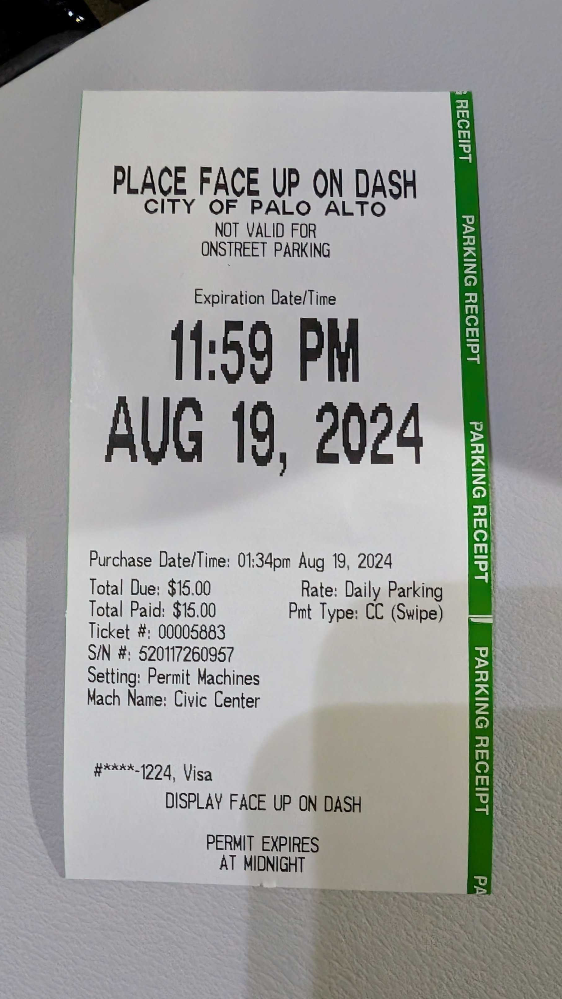

In [19]:
from PIL import Image

image_path = "receipt.png"

image = Image.open(image_path)
image

In [20]:
image_path = "receipt.png"
structured_response = structured_ocr(image_path)

response_dict = json.loads(structured_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "file_name": "parking_receipt",
    "topics": [
        "parking",
        "receipt",
        "expiration",
        "payment"
    ],
    "languages": [
        "English"
    ],
    "ocr_contents": {
        "header": "PLACE FACE UP ON DASH",
        "city": "CITY OF PALO ALTO",
        "validity": "NOT VALID FOR ONSTREET PARKING",
        "expiration": {
            "date": "AUG 19, 2024",
            "time": "11:59 PM"
        },
        "purchase": {
            "date": "Aug 19, 2024",
            "time": "01:34pm"
        },
        "total_due": "$15.00",
        "rate": "Daily Parking",
        "total_paid": "$15.00",
        "payment_type": "CC (Swipe)",
        "ticket_number": "00005883",
        "serial_number": "520117260957",
        "setting": "Permit Machines",
        "machine_name": "Civic Center",
        "card_info": "#^^^^-1224, Visa",
        "instructions": "DISPLAY FACE UP ON DASH",
        "expiry_message": "PERMIT EXPIRES AT MIDNIGHT"
    }
}


<ipython-input-20-15ba917297d0>:4: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(structured_response.json())


# Additional Tests - Pictures

## Medical Handwritten Prescription


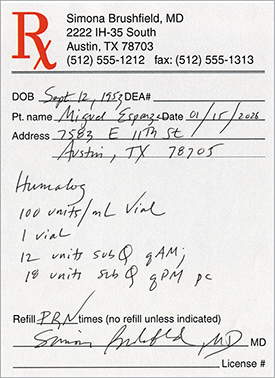

In [50]:
image_path = "/content/Medical_Prescription.png"
image = Image.open(image_path)
image

In [51]:
structured_response = structured_ocr(image_path)

response_dict = json.loads(structured_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "file_name": "medical_prescription",
    "topics": [
        "medical prescription",
        "doctor's note",
        "patient information",
        "medication details"
    ],
    "languages": [
        "English"
    ],
    "ocr_contents": {
        "doctor_info": {
            "name": "Simon Bruehfield, MD",
            "address": "2222 IH-35 South",
            "city": "Austin, TX",
            "zip_code": "78703",
            "phone": "(512) 555-1212",
            "fax": "(512) 555-1313"
        },
        "patient_info": {
            "dob": "Sept 12, 1953",
            "dea_number": "DEA#",
            "patient_name": "Atipid EygmpsDate 01/1C/2005",
            "patient_address": "7585 E 11th St.",
            "patient_city": "Austin, TX",
            "patient_zip": "78205"
        },
        "medication_details": {
            "medication": "Hemodig",
            "dosage": "100 unit/ml Vial",
            "quantity": "1 vial",
            "instructions": "12 unit sub Q 9AM;

<ipython-input-51-dd2fe30bf01f>:3: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(structured_response.json())


In [52]:
import json
from IPython.display import Markdown, display

def json_to_markdown(json_data):
    """
    Transforms a JSON object into a Markdown string, decoding ocr_contents.

    Args:
        json_data: A JSON object (dict or list).

    Returns:
        A Markdown string representation of the JSON data.
    """

    def _format_value(value):
        if isinstance(value, dict):
            return json_to_markdown(value)  # Recursive call for nested objects
        elif isinstance(value, list):
            return "- " + "\n- ".join(_format_value(item) for item in value)
        elif isinstance(value, str):
            # Decode the string if it represents ocr_contents
            try:
                decoded_value = value.encode('latin-1').decode('utf-8')  # Decode from latin-1 to utf-8
                return f'<div dir="rtl">{decoded_value}</div>'
            except UnicodeEncodeError:
                # If decoding fails, return the original string
                return value
        else:
            return str(value)

    if isinstance(json_data, dict):
        markdown = ""
        for key, value in json_data.items():
            markdown += f"**{key}:** {_format_value(value)}\n"
        return markdown
    elif isinstance(json_data, list):
        return "- " + "\n- ".join(_format_value(item) for item in json_data)
    else:
        return str(json_data)

# Get the JSON output (assuming you have structured_response)
response_dict = json.loads(structured_response.model_dump_json())

# Convert JSON to Markdown, decoding ocr_contents
markdown_output = json_to_markdown(response_dict)
display(Markdown(markdown_output))

**file_name:** <div dir="rtl">medical_prescription</div>
**topics:** - <div dir="rtl">medical prescription</div>
- <div dir="rtl">doctor's note</div>
- <div dir="rtl">patient information</div>
- <div dir="rtl">medication details</div>
**languages:** - <div dir="rtl">English</div>
**ocr_contents:** **doctor_info:** **name:** <div dir="rtl">Simon Bruehfield, MD</div>
**address:** <div dir="rtl">2222 IH-35 South</div>
**city:** <div dir="rtl">Austin, TX</div>
**zip_code:** <div dir="rtl">78703</div>
**phone:** <div dir="rtl">(512) 555-1212</div>
**fax:** <div dir="rtl">(512) 555-1313</div>

**patient_info:** **dob:** <div dir="rtl">Sept 12, 1953</div>
**dea_number:** <div dir="rtl">DEA#</div>
**patient_name:** <div dir="rtl">Atipid EygmpsDate 01/1C/2005</div>
**patient_address:** <div dir="rtl">7585 E 11th St.</div>
**patient_city:** <div dir="rtl">Austin, TX</div>
**patient_zip:** <div dir="rtl">78205</div>

**medication_details:** **medication:** <div dir="rtl">Hemodig</div>
**dosage:** <div dir="rtl">100 unit/ml Vial</div>
**quantity:** <div dir="rtl">1 vial</div>
**instructions:** <div dir="rtl">12 unit sub Q 9AM; 18 unit sub Q 9PM pc</div>

**refill_info:** <div dir="rtl">Refill PBXtimes (no refill unless indicated)</div>



## Picture File : Arabic

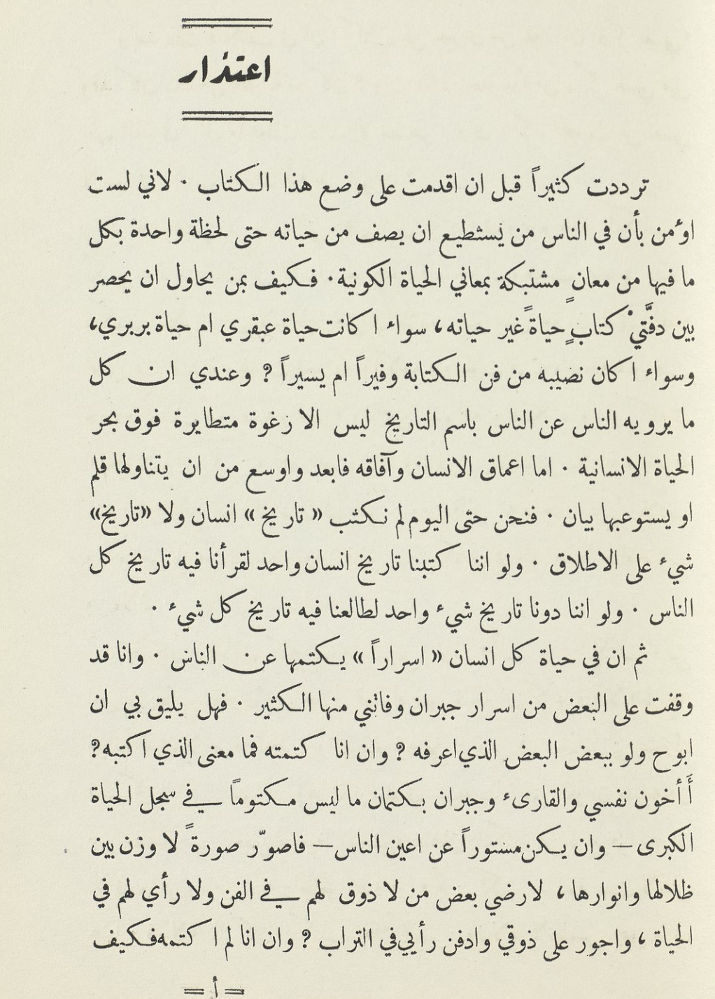

In [ ]:
image_path = "/content/arabic_text.png"
image = Image.open(image_path)
image

In [ ]:
structured_response = structured_ocr(image_path)

response_dict = json.loads(structured_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "file_name": "image_ocr",
    "topics": [
        "OCR",
        "Life",
        "Human Experience",
        "Writing",
        "History"
    ],
    "languages": [
        "Arabic"
    ],
    "ocr_contents": {
        "text": "\u062a\u0631\u062f\u062f\u062a \u0643\u062b\u064a\u0631\u0627\u064b \u0642\u0628\u0644 \u0627\u0646 \u0627\u0642\u062f\u0645\u062a \u0639\u0644\u0649 \u0648\u0636\u0639 \u0647\u0630\u0627 \u0627\u0644\u0643\u062a\u0627\u0628. \u0644\u0627\u0646\u064a \u0644\u0633\u062a \u0627\u0648\u064e\u0651\u0645\u0646 \u0628\u0623\u0646 \u0641\u064a \u0627\u0644\u0646\u0627\u0633 \u0645\u0646 \u064a\u0633\u062a\u0637\u064a\u0639 \u0627\u0646\u0635\u0641 \u0645\u0646 \u062d\u064a\u0627\u062a\u0647 \u062d\u062a\u0649 \u0644\u062d\u0638\u0629 \u0648\u0627\u062d\u062f\u0629 \u0643\u0644 \u0645\u0627 \u0641\u064a\u0647\u0627 \u0645\u0646 \u0645\u0639\u0627\u0646\u064d \u0645\u0634\u062a\u0628\u0643\u0629 \u0648\u0645\u0639\u0627\u0646\u064a \u0627\u0644\u062d\u064a\u0627\u06

<ipython-input-33-dd2fe30bf01f>:3: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(structured_response.json())


In [ ]:
import json
from IPython.display import Markdown, display

def json_to_markdown(json_data):
    """
    Transforms a JSON object into a Markdown string, decoding ocr_contents.

    Args:
        json_data: A JSON object (dict or list).

    Returns:
        A Markdown string representation of the JSON data.
    """

    def _format_value(value):
        if isinstance(value, dict):
            return json_to_markdown(value)  # Recursive call for nested objects
        elif isinstance(value, list):
            return "- " + "\n- ".join(_format_value(item) for item in value)
        elif isinstance(value, str):
            # Decode the string if it represents ocr_contents
            try:
                decoded_value = value.encode('latin-1').decode('utf-8')  # Decode from latin-1 to utf-8
                return f'<div dir="rtl">{decoded_value}</div>'
            except UnicodeEncodeError:
                # If decoding fails, return the original string
                return value
        else:
            return str(value)

    if isinstance(json_data, dict):
        markdown = ""
        for key, value in json_data.items():
            markdown += f"**{key}:** {_format_value(value)}\n"
        return markdown
    elif isinstance(json_data, list):
        return "- " + "\n- ".join(_format_value(item) for item in json_data)
    else:
        return str(json_data)

# Get the JSON output (assuming you have structured_response)
response_dict = json.loads(structured_response.model_dump_json())

# Convert JSON to Markdown, decoding ocr_contents
markdown_output = json_to_markdown(response_dict)
display(Markdown(markdown_output))

**file_name:** <div dir="rtl">image_ocr</div>
**topics:** - <div dir="rtl">OCR</div>
- <div dir="rtl">Life</div>
- <div dir="rtl">Human Experience</div>
- <div dir="rtl">Writing</div>
- <div dir="rtl">History</div>
**languages:** - <div dir="rtl">Arabic</div>
**ocr_contents:** **text:** ترددت كثيراً قبل ان اقدمت على وضع هذا الكتاب. لاني لست اوَّمن بأن في الناس من يستطيع انصف من حياته حتى لحظة واحدة كل ما فيها من معانٍ مشتبكة ومعاني الحياة الكونية. فكيف من tenta ان يحصر بين دفَّتَي كتاب حياةً غير حياته، سواء اكانة حياة عبقري ام حياة بربري، وسواء اكان نصيبه من فن الكتابة وفيراً ام يسيراً؟ وعندي ان كل ما يرويه الناس عن الناس باسم التاريخ ليس الا زغوة متطايرة فوق بحر الحياة الانسانية. اما اعماق الانسان وآفاقه فابعد واوسع من ان يتناولها قلم او يستوعبها بيان. فنحن حتى اليوم لم نكتب "تاريخ " انسان ولا "تاريخ" شيء على الاطلاق. ولو اننا كتبنا تاريخ انسان واحد لقرأنا فيه تاريخ كل الناس. ولو اننا دونا تاريخ شيء واحد لطالعتا فيه تاريخ كل شيء. ثم ان في حياة كل انسان "اسراراً " يسكنمها عن الناس. وانا قد وقفت على بعض من اسرار جبران وفانني منها الكثير. فهل يليق بي ان ايوح ولو ببعض البعض الذي اعرفه؟ وان انا كتمته فما معنى الذي اكتبه؟ اخون نفسي والقارىء وجبران بكنتيان ما ليس مكنوماً بجدّ مبجل الحياة الكبرى - وان يمكن مستوراً عن اعين الناس - فاصôr صورةً لا وزن بين ظلالها وانوارها، لارضي بعض من لا ذوق لهم بجدّ الفن ولا رأي لهم في الحياة، واجور على ذوقي وادفن رأيي في الثراب؟ وان انا لم اكتبه فكيف



## Picture File: Vietnamese Language

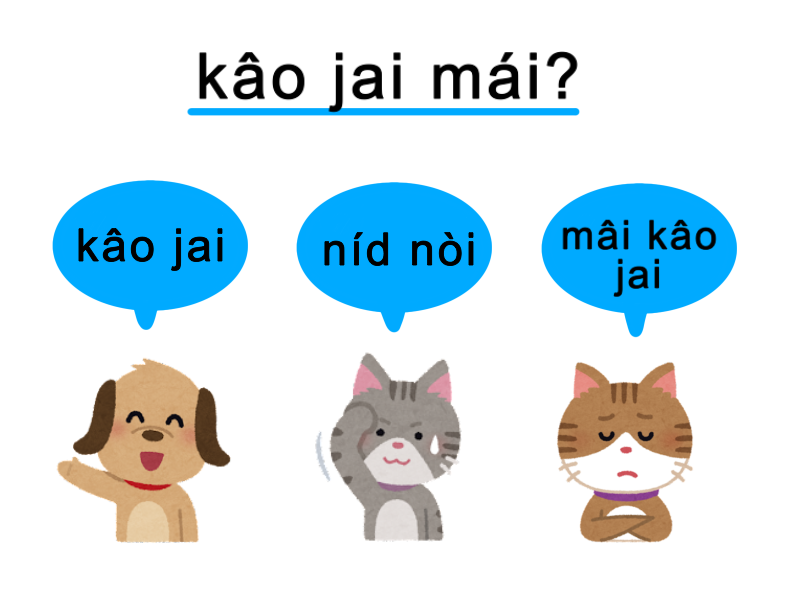

In [35]:
image_path = "/content/thai-learning.png"
image = Image.open(image_path)
image

In [36]:
structured_response = structured_ocr(image_path)

response_dict = json.loads(structured_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "file_name": "img-0.jpeg",
    "topics": [
        "OCR",
        "Image Recognition",
        "Text Extraction"
    ],
    "languages": [
        "Vietnamese"
    ],
    "ocr_contents": {
        "text": "# k\u00e2o jai m\u00e1i?\n\n## k\u00e2o jai\n\nn\u00edd n\u00f2j\nm\u00e3i k\u00e2o jai\n![img-0.jpeg](img-0.jpeg)"
    }
}


<ipython-input-36-dd2fe30bf01f>:3: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(structured_response.json())


In [38]:
def format_vietnamese_phrases(vietnamese_dict):
    """
    Format and display Vietnamese phrases from the provided JSON dictionary.

    Args:
        vietnamese_dict (dict): Dictionary containing Vietnamese phrase data.

    Returns:
        str: Formatted string with Vietnamese phrases and their meanings.
    """
    output = []

    # Extract main text and options
    main_text = vietnamese_dict.get("ocr_contents", {}).get("text", "")

    # Add main text
    output.append(main_text)
    output.append("")  # Add an empty line

    return "\n".join(output)

In [39]:
image_path = "/content/thai-learning.png"  # Or your image path
structured_response = structured_ocr(image_path) # Assuming you have a structured_ocr function
response_dict = json.loads(structured_response.model_dump_json())  # Corrected to use model_dump_json
formatted_output = format_vietnamese_phrases(response_dict)
print(formatted_output)

# kâo jai mái?

## kâo jai

níd nòj
mãi kâo jai
![img-0.jpeg](img-0.jpeg)



In [40]:
from PIL import Image
from IPython.display import display, Markdown

def format_vietnamese_phrases(vietnamese_dict):
    output = []
    main_text = vietnamese_dict.get("ocr_contents", {}).get("text", "")

    output.append(main_text)
    output.append("")

    # Assuming img-0.jpeg is the actual filename in your environment
    image_filename = "/content/thai-learning.png"
    try:
        img = Image.open(image_filename)
        display(img)  # Display the image
    except FileNotFoundError:
        print(f"Warning: Image '{image_filename}' not found")

    return "\n".join(output)

In [ ]:
def format_vietnamese_phrases(vietnamese_dict):
    """
    Format and display Vietnamese phrases from the provided JSON dictionary.

    Args:
        vietnamese_dict (dict): Dictionary containing Vietnamese phrase data.

    Returns:
        str: Formatted string with Vietnamese phrases and their meanings.
    """
    output = []

    # Extract main text and options
    main_text = vietnamese_dict.get("ocr_contents", {}).get("main_text", "")
    options = vietnamese_dict.get("ocr_contents", {}).get("options", {})

    # Add main text as a heading
    output.append(f"# {main_text}")
    output.append("")  # Add an empty line

    # Format and add options
    for phrase, meaning in options.items():
        if meaning:  # Only include options with meanings
            output.append(f"**{phrase}:** {meaning}")
        else:
            output.append(f"**{phrase}:** (No meaning provided)")

    output.append("")  # Add an empty line

    return "\n".join(output)

In [41]:
image_path = "/content/thai-learning.png"  # Or your image path
structured_response = structured_ocr(image_path) # Assuming you have a structured_ocr function
response_dict = json.loads(structured_response.model_dump_json())  # Corrected to use model_dump_json

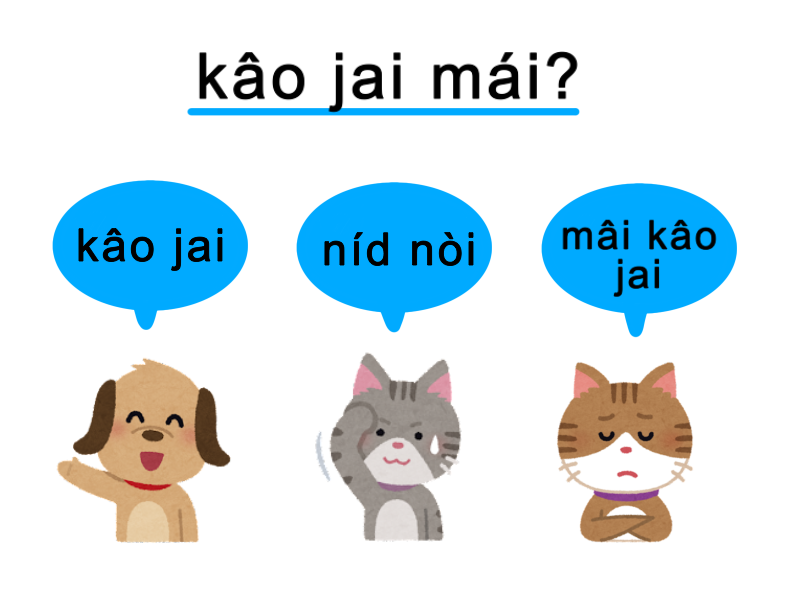

In [42]:
formatted_output = format_vietnamese_phrases(response_dict)

In [43]:
print(formatted_output)


# kâo jai mái?

## kâo jai

níd nòj
mãi kâo jai
![img-0.jpeg](img-0.jpeg)



In [44]:
from IPython.display import Markdown # Correct the indentation of this import statement
display(Markdown(formatted_output))

# kâo jai mái?

## kâo jai

níd nòj
mãi kâo jai
![img-0.jpeg](img-0.jpeg)


In [ ]:
s

## Picture File: Nasdaq


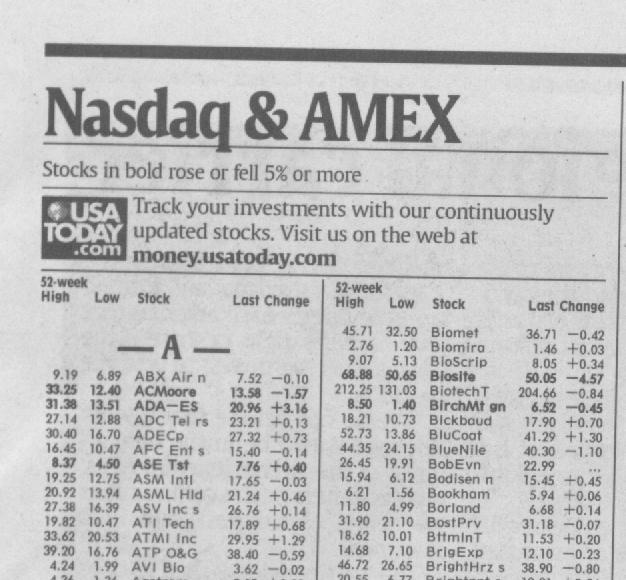

In [27]:
image_path = "/content/stock_gs200.jpg"
image = Image.open(image_path)
image

In [29]:
structured_response = structured_ocr(image_path)

response_dict = json.loads(structured_response.json())
json_string = json.dumps(response_dict, indent=4)
print(json_string)

{
    "file_name": "Nasdaq_AMEX_Stocks",
    "topics": [
        "Stock Market",
        "Nasdaq",
        "AMEX",
        "Financial News"
    ],
    "languages": [
        "English"
    ],
    "ocr_contents": {
        "title": "Nasdaq & AMEX",
        "description": "Stocks in bold rose or fell 5% or more",
        "image_url": "img-0.jpeg",
        "sections": [
            {
                "header": "52-week High Low Stock Last Change",
                "rows": [
                    {
                        "stock": "ABX Air Inc",
                        "high": 9.19,
                        "low": 6.89,
                        "last_change": -0.1
                    },
                    {
                        "stock": "ACMeeee",
                        "high": 33.25,
                        "low": 12.4,
                        "last_change": -1.57
                    },
                    {
                        "stock": "ADA-ES",
                        "high": 31.38,
 

<ipython-input-29-dd2fe30bf01f>:3: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(structured_response.json())


In [31]:
import json

def json_to_markdown(json_data):
  """
  Transforms a JSON object into a Markdown string.

  Args:
    json_data: A JSON object (dict or list).

  Returns:
    A Markdown string representation of the JSON data.
  """

  def _format_value(value):
    if isinstance(value, dict):
      return json_to_markdown(value)  # Recursive call for nested objects
    elif isinstance(value, list):
      return "- " + "\n- ".join(_format_value(item) for item in value)
    else:
      return str(value)

  if isinstance(json_data, dict):
    markdown = ""
    for key, value in json_data.items():
      markdown += f"**{key}:** {_format_value(value)}\n"
    return markdown
  elif isinstance(json_data, list):
    return "- " + "\n- ".join(_format_value(item) for item in json_data)
  else:
    return str(json_data)

# Get the JSON output
structured_response = structured_ocr(image_path)
response_dict = json.loads(structured_response.model_dump_json())

# Convert JSON to Markdown
markdown_output = json_to_markdown(response_dict)

# Display the Markdown
from IPython.display import Markdown
display(Markdown(markdown_output))

**file_name:** Nasdaq_AMEX_Stocks
**topics:** - Stock Market
- Nasdaq
- AMEX
- Financial News
**languages:** - English
**ocr_contents:** **title:** Nasdaq & AMEX
**description:** Stocks in bold rose or fell 5% or more
**image_url:** img-0.jpeg
**sections:** - **header:** 52-week High Low Stock Last Change
**rows:** - **stock:** ABX Air Inc
**high:** 9.19
**low:** 6.89
**last_change:** -0.1

- **stock:** ACMeeee
**high:** 33.25
**low:** 12.4
**last_change:** 1.57

- **stock:** ADA-ES
**high:** 31.38
**low:** 13.31
**last_change:** 3.16

- **stock:** ADC Tel rs
**high:** 27.14
**low:** 12.88
**last_change:** 23.31

- **stock:** ADECC
**high:** 30.4
**low:** 16.7
**last_change:** 0.73

- **stock:** AFC Ent s
**high:** 16.45
**low:** 10.47
**last_change:** -0.14

- **stock:** ASE Tsf
**high:** 8.37
**low:** 4.9
**last_change:** 7.76

- **stock:** ASM Intl
**high:** 19.25
**low:** 12.75
**last_change:** 17.45

- **stock:** ASML Hld
**high:** 20.92
**low:** 13.94
**last_change:** 21.24

- **stock:** ASV Inc s
**high:** 27.38
**low:** 16.39
**last_change:** 26.76

- **stock:** ATI Tech
**high:** 19.82
**low:** 10.47
**last_change:** 17.89

- **stock:** ATMI Inc
**high:** 33.62
**low:** 20.53
**last_change:** 29.95

- **stock:** ATP O&G
**high:** 39.2
**low:** 16.76
**last_change:** 38.4

- **stock:** AVI Bio
**high:** 4.24
**low:** 1.99
**last_change:** 3.62


- **header:** 52-week High Low Stock Last Change
**rows:** - **stock:** Biomet
**high:** 45.71
**low:** 32.5
**last_change:** 36.71

- **stock:** Biomiro
**high:** 2.76
**low:** 1.2
**last_change:** 1.46

- **stock:** Bioscrip
**high:** 5.13
**low:** 3.13
**last_change:** 8.05

- **stock:** Biosite
**high:** 68.08
**low:** 50.05
**last_change:** 50.65

- **stock:** BirchMT
**high:** 8.5
**low:** 5.4
**last_change:** 20.46

- **stock:** Bickboud
**high:** 18.21
**low:** 10.73
**last_change:** 17.9

- **stock:** BlueCoat
**high:** 52.73
**low:** 13.86
**last_change:** 41.29

- **stock:** BlueNile
**high:** 44.35
**low:** 24.15
**last_change:** 40.3

- **stock:** BobEvn
**high:** 26.45
**low:** 19.91
**last_change:** 22.99

- **stock:** Bodisen n
**high:** 15.94
**low:** 6.21
**last_change:** 15.45

- **stock:** Bookham
**high:** 11.8
**low:** 4.99
**last_change:** 5.94

- **stock:** Bortland
**high:** 31.9
**low:** 21.1
**last_change:** 6.68

- **stock:** BostPrv
**high:** 18.62
**low:** 10.01
**last_change:** 31.18

- **stock:** Bftnmt
**high:** 14.68
**low:** 7.1
**last_change:** 11.53

- **stock:** BrigExp
**high:** 46.72
**low:** 26.65
**last_change:** 38.9





# Additional Tests - PDFs

## Research Paper - DeepSeek GRPO

In [ ]:
!wget https://arxiv.org/pdf/2402.03300

--2025-03-21 17:02:45--  https://arxiv.org/pdf/2402.03300
Resolving arxiv.org (arxiv.org)... 151.101.195.42, 151.101.67.42, 151.101.3.42, ...
Connecting to arxiv.org (arxiv.org)|151.101.195.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1844642 (1.8M) [application/pdf]
Saving to: ‘2402.03300’

2402.03300          100%[===================>]   1.76M  --.-KB/s    in 0.08s   

2025-03-21 17:02:45 (22.9 MB/s) - ‘2402.03300’ saved [1844642/1844642]



In [ ]:
import os

filename = "2402.03300"
new_filename = filename + ".pdf"

os.rename(filename, new_filename)

In [ ]:
from pathlib import Path

pdf_file = Path("/content/2402.03300.pdf")
assert pdf_file.is_file()

{
    "pages": [
        {
            "index": 0,
            "markdown": "# DeepSeekMath: Pushing the Limits of Mathematical Reasoning in Open Language Models \n\nZhihong Shao ${ }^{1,2 * \\dagger}$, Peiyi Wang ${ }^{1,3 * \\dagger}$, Qihao Zhu ${ }^{1,3 * \\dagger}$, Runxin Xu ${ }^{1}$, Junxiao Song ${ }^{1}$<br>Xiao Bi ${ }^{1}$, Haowei Zhang ${ }^{1}$, Mingchuan Zhang ${ }^{1}$, Y.K. Li ${ }^{1}$, Y. Wu ${ }^{1}$, Daya Guo ${ }^{1 *}$<br>${ }^{1}$ DeepSeek-AI, ${ }^{2}$ Tsinghua University, ${ }^{3}$ Peking University<br>\\{zhihongshao, wangpeiyi, zhuqh, guoday\\}@deepseek.com<br>https://github.com/deepseek-ai/DeepSeek-Math\n\n\n#### Abstract\n\nMathematical reasoning poses a significant challenge for language models due to its complex and structured nature. In this paper, we introduce DeepSeekMath 7B, which continues pretraining DeepSeek-Coder-Base-v1.5 7B with 120B math-related tokens sourced from Common Crawl, together with natural language and code data. DeepSeekMath 7B has a
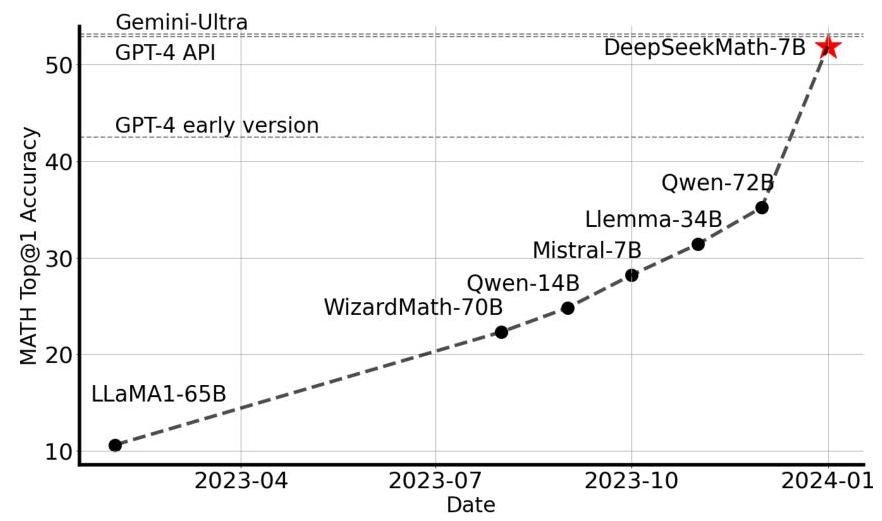
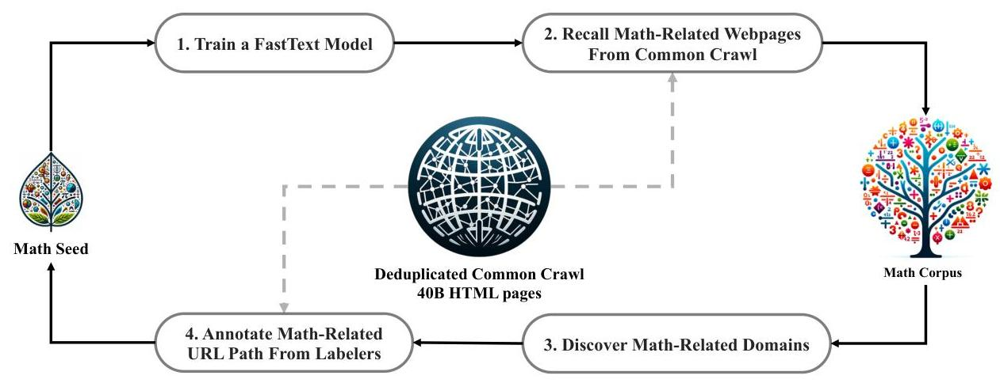
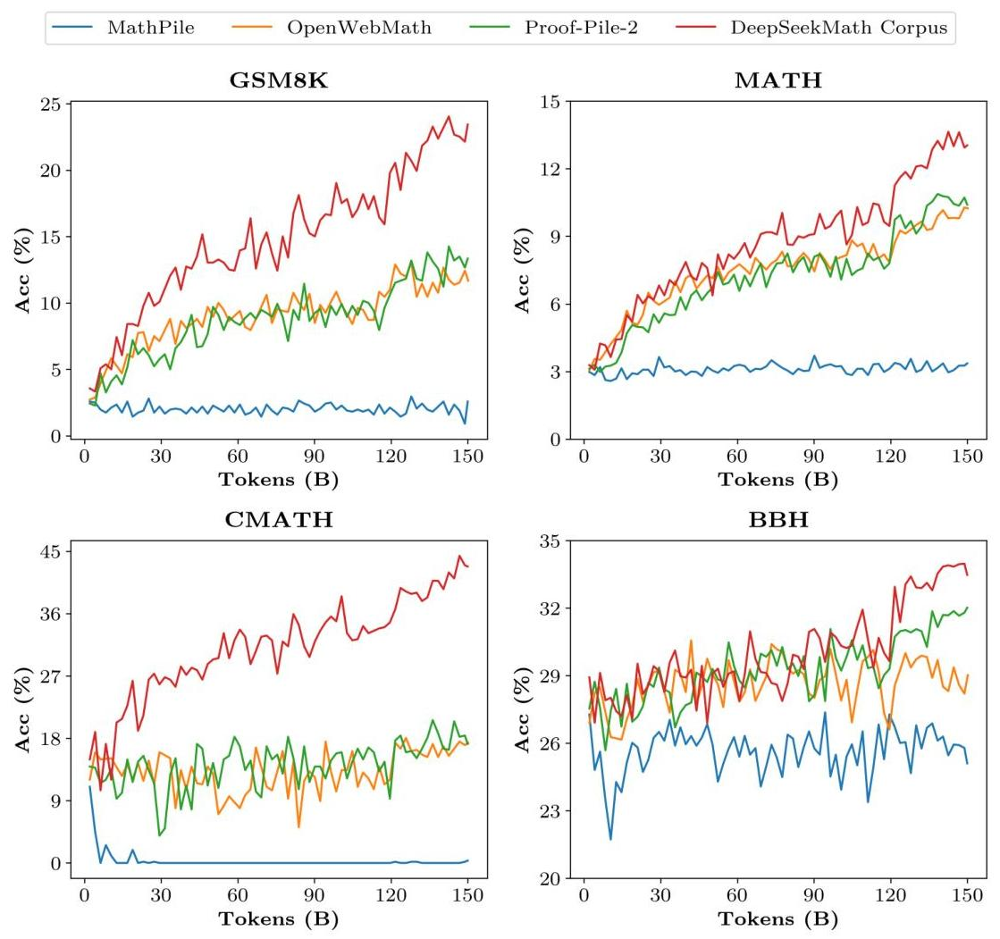
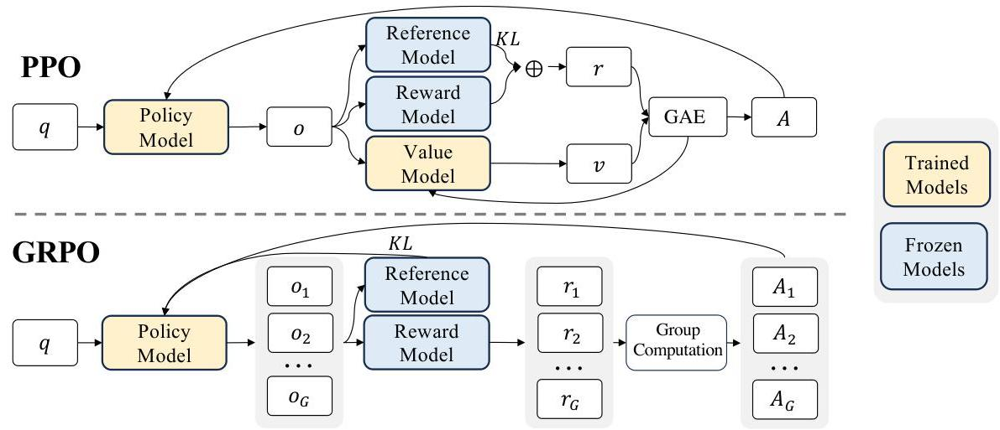
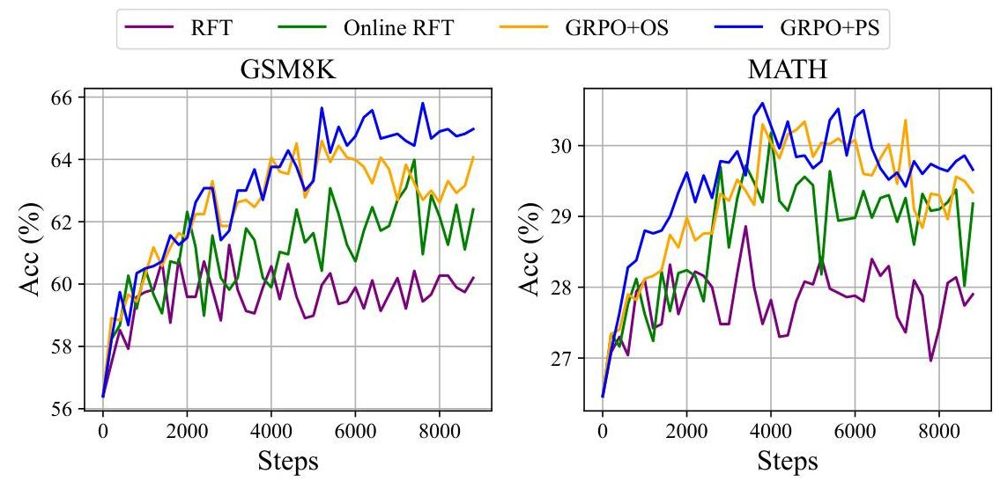
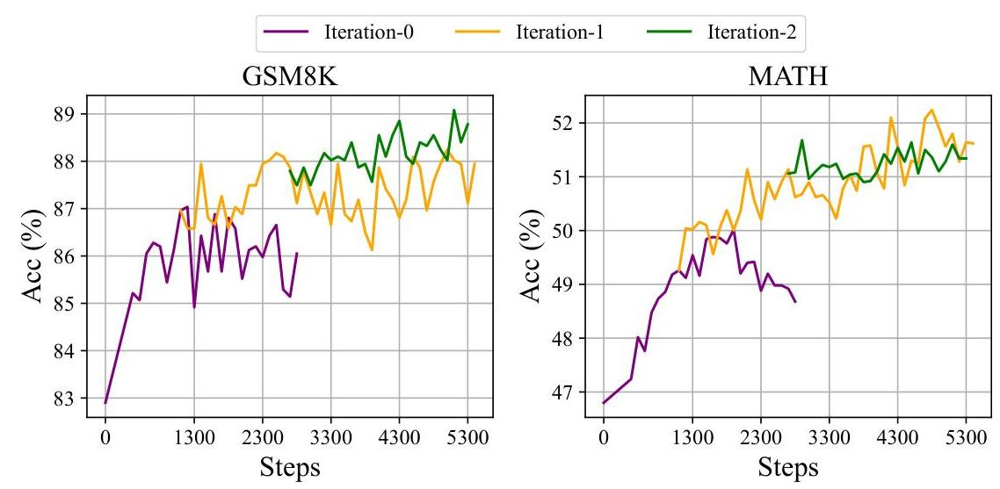
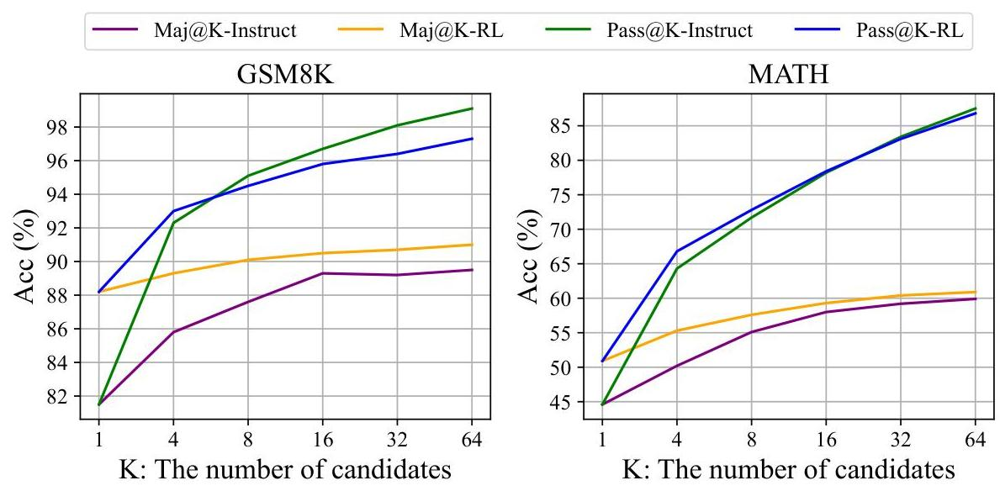

<ipython-input-24-60fb75838aca>:18: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(pdf_response.json())


In [ ]:
from mistralai import DocumentURLChunk, ImageURLChunk, TextChunk
import json

uploaded_file = client.files.upload(
    file={
        "file_name": pdf_file.stem,
        "content": pdf_file.read_bytes(),
    },
    purpose="ocr",
)

signed_url = client.files.get_signed_url(file_id=uploaded_file.id, expiry=1)

pdf_response = client.ocr.process(document=DocumentURLChunk(document_url=signed_url.url),
                                  model="mistral-ocr-latest",
                                  include_image_base64=True)

response_dict = json.loads(pdf_response.json())
json_string = json.dumps(response_dict, indent=4)

print(json_string)

# DeepSeekMath: Pushing the Limits of Mathematical Reasoning in Open Language Models 

Zhihong Shao ${ }^{1,2 * \dagger}$, Peiyi Wang ${ }^{1,3 * \dagger}$, Qihao Zhu ${ }^{1,3 * \dagger}$, Runxin Xu ${ }^{1}$, Junxiao Song ${ }^{1}$<br>Xiao Bi ${ }^{1}$, Haowei Zhang ${ }^{1}$, Mingchuan Zhang ${ }^{1}$, Y.K. Li ${ }^{1}$, Y. Wu ${ }^{1}$, Daya Guo ${ }^{1 *}$<br>${ }^{1}$ DeepSeek-AI, ${ }^{2}$ Tsinghua University, ${ }^{3}$ Peking University<br>\{zhihongshao, wangpeiyi, zhuqh, guoday\}@deepseek.com<br>https://github.com/deepseek-ai/DeepSeek-Math


#### Abstract

Mathematical reasoning poses a significant challenge for language models due to its complex and structured nature. In this paper, we introduce DeepSeekMath 7B, which continues pretraining DeepSeek-Coder-Base-v1.5 7B with 120B math-related tokens sourced from Common Crawl, together with natural language and code data. DeepSeekMath 7B has achieved an impressive score of $51.7 \%$ on the competition-level MATH benchmark without relying on external toolkits and voting techniques, approaching the performance level of Gemini-Ultra and GPT-4. Self-consistency over 64 samples from DeepSeekMath 7B achieves $60.9 \%$ on MATH. The mathematical reasoning capability of DeepSeekMath is attributed to two key factors: First, we harness the significant potential of publicly available web data through a meticulously engineered data selection pipeline. Second, we introduce Group Relative Policy Optimization (GRPO), a variant of Proximal Policy Optimization (PPO), that enhances mathematical reasoning abilities while concurrently optimizing the memory usage of PPO.


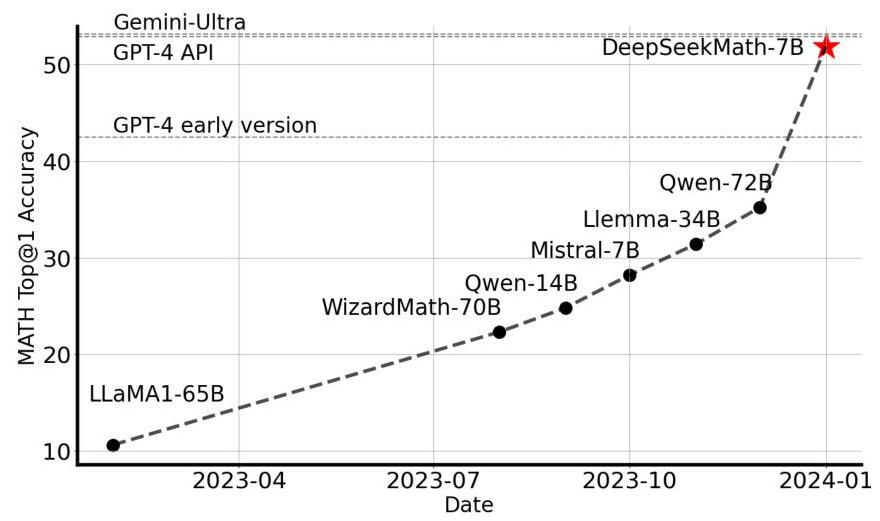

Figure $1 \mid$ Top1 accuracy of open-source models on the competition-level MATH benchmark (Hendrycks et al., 2021) without the use of external toolkits and voting techniques.

[^0]
[^0]:    * Core contributors.
    ${ }^{\dagger}$ Work done during internship at DeepSeek-AI.

# 1. Introduction 

Large language models (LLM) have revolutionized the approach to mathematical reasoning in artificial intelligence, spurring significant advancements in both the quantitative reasoning benchmark (Hendrycks et al., 2021) and the geometry reasoning benchmark (Trinh et al., 2024). Moreover, these models have proven instrumental in assisting humans in solving complex mathematical problems (Tao, 2023). However, cutting-edge models such as GPT-4 (OpenAI, 2023) and Gemini-Ultra (Anil et al., 2023) are not publicly available, and the currently accessible open-source models considerably trail behind in performance.

In this study, we introduce DeepSeekMath, a domain-specific language model that significantly outperforms the mathematical capabilities of open-source models and approaches the performance level of GPT-4 on academic benchmarks. To achieve this, we create the DeepSeekMath Corpus, a large-scale high-quality pre-training corpus comprising 120B math tokens. This dataset is extracted from the Common Crawl (CC) using a fastText-based classifier (Joulin et al., 2016). In the initial iteration, the classifier is trained using instances from OpenWebMath (Paster et al., 2023) as positive examples, while incorporating a diverse selection of other web pages to serve as negative examples. Subsequently, we employ the classifier to mine additional positive instances from the CC, which are further refined through human annotation. The classifier is then updated with this enhanced dataset to improve its performance. The evaluation results indicate that the large-scale corpus is of high quality, as our base model DeepSeekMath-Base 7B achieves $64.2 \%$ on GSM8K (Cobbe et al., 2021) and $36.2 \%$ on the competition-level MATH dataset (Hendrycks et al., 2021), outperforming Minerva 540B (Lewkowycz et al., 2022a). In addition, the DeepSeekMath Corpus is multilingual, so we notice an improvement in Chinese mathematical benchmarks (Wei et al., 2023; Zhong et al., 2023). We believe that our experience in mathematical data processing is a starting point for the research community, and there is significant room for improvement in the future.

DeepSeekMath-Base is initialized with DeepSeek-Coder-Base-v1.5 7B (Guo et al., 2024), as we notice that starting from a code training model is a better choice compared to a general LLM. Furthermore, we observe the math training also improves model capability on MMLU (Hendrycks et al., 2020) and BBH benchmarks (Suzgun et al., 2022), indicating it does not only enhance the model's mathematical abilities but also amplifies general reasoning capabilities.

After pre-training, we apply mathematical instruction tuning to DeepSeekMath-Base with chain-of-thought (Wei et al., 2022), program-of-thought (Chen et al., 2022; Gao et al., 2023), and tool-integrated reasoning (Gou et al., 2023) data. The resulting model DeepSeekMath-Instruct 7B beats all 7B counterparts and is comparable with 70B open-source instruction-tuned models.

Furthermore, we introduce the Group Relative Policy Optimization (GRPO), a variant reinforcement learning (RL) algorithm of Proximal Policy Optimization (PPO) (Schulman et al., 2017). GRPO foregoes the critic model, instead estimating the baseline from group scores, significantly reducing training resources. By solely using a subset of English instruction tuning data, GRPO obtains a substantial improvement over the strong DeepSeekMath-Instruct, including both in-domain (GSM8K: $82.9 \% \rightarrow 88.2 \%$, MATH: $46.8 \% \rightarrow 51.7 \%$ ) and out-of-domain mathematical tasks (e.g., CMATH: $84.6 \% \rightarrow 88.8 \%$ ) during the reinforcement learning phase. We also provide a unified paradigm to understand different methods, such as Rejection Sampling Fine-Tuning (RFT) (Yuan et al., 2023a), Direct Preference Optimization (DPO) (Rafailov et al., 2023), PPO and GRPO. Based on such a unified paradigm, we find that all these methods are conceptualized as either direct or simplified RL techniques. We also conduct extensive experiments, e.g., online v.s. offline training, outcome v.s. process supervision, single-turn v.s. iterative RL and so on,

to deeply investigate the essential elements of this paradigm. At last, we explain why our RL boosts the performance of instruction-tuned models, and further summarize potential directions to achieve more effective RL based on this unified paradigm.

# 1.1. Contributions 

Our contribution includes scalable math pre-training, along with the exploration and analysis of reinforcement learning.

## Math Pre-Training at Scale

- Our research provides compelling evidence that the publicly accessible Common Crawl data contains valuable information for mathematical purposes. By implementing a meticulously designed data selection pipeline, we successfully construct the DeepSeekMath Corpus, a high-quality dataset of 120B tokens from web pages filtered for mathematical content, which is almost 7 times the size of the math web pages used by Minerva (Lewkowycz et al., 2022a) and 9 times the size of the recently released OpenWebMath (Paster et al., 2023).
- Our pre-trained base model DeepSeekMath-Base 7B achieves comparable performance with Minerva 540B (Lewkowycz et al., 2022a), indicating the number of parameters is not the only key factor in mathematical reasoning capability. A smaller model pre-trained on high-quality data could achieve strong performance as well.
- We share our findings from math training experiments. Code training prior to math training improves models' ability to solve mathematical problems both with and without tool use. This offers a partial answer to the long-standing question: does code training improve reasoning abilities? We believe it does, at least for mathematical reasoning.
- Although training on arXiv papers is common, especially in many math-related papers, it brings no notable improvements on all mathematical benchmarks adopted in this paper.


## Exploration and Analysis of Reinforcement Learning

- We introduce Group Relative Policy Optimization (GRPO), an efficient and effective reinforcement learning algorithm. GRPO foregoes the critic model, instead estimating the baseline from group scores, significantly reducing training resources compared to Proximal Policy Optimization (PPO).
- We demonstrate that GRPO significantly enhances the performance of our instructiontuned model DeepSeekMath-Instruct, by solely using the instruction-tuning data. Furthermore, we observe enhancements in the out-of-domain performance during the reinforcement learning process.
- We provide a unified paradigm to understand different methods, such as RFT, DPO, PPO, and GRPO. We also conduct extensive experiments, e.g., online v.s. offline training, outcome v.s. process supervision, single-turn v.s. iterative reinforcement learning, and so on to deeply investigate the essential elements of this paradigm.
- Based on our unified paradigm, we explore the reasons behind the effectiveness of reinforcement learning, and summarize several potential directions to achieve more effective reinforcement learning of LLMs.


### 1.2. Summary of Evaluations and Metrics

- English and Chinese Mathematical Reasoning: We conduct comprehensive assessments of our models on English and Chinese benchmarks, covering mathematical problems

from grade-school level to college level. English benchmarks include GSM8K (Cobbe et al., 2021), MATH (Hendrycks et al., 2021), SAT (Azerbayev et al., 2023), OCW Courses (Lewkowycz et al., 2022a), MMLU-STEM (Hendrycks et al., 2020). Chinese benchmarks include MGSM-zh (Shi et al., 2023), CMATH (Wei et al., 2023), Gaokao-MathCloze (Zhong et al., 2023), and Gaokao-MathQA (Zhong et al., 2023). We evaluate models' ability to generate self-contained text solutions without tool use, and also the ability to solve problems using Python.
On English benchmarks, DeepSeekMath-Base is competitive with the closed-source Minerva 540B (Lewkowycz et al., 2022a), and surpasses all open-source base models (e.g., Mistral 7B (Jiang et al., 2023) and Llemma-34B (Azerbayev et al., 2023)), regardless of whether they've undergone math pre-training or not, often by a significant margin. Notably, DeepSeekMath-Base is superior on Chinese benchmarks, likely because we don't follow previous works (Azerbayev et al., 2023; Lewkowycz et al., 2022a) to collect English-only math pre-training data, and also include high-quality non-English ones. With mathematical instruction tuning and reinforcement learning, the resulting DeepSeekMath-Instruct and DeepSeekMath-RL demonstrate strong performance, obtaining an accuracy of over $50 \%$ on the competition-level MATH dataset for the first time within the open-source community.

- Formal Mathematics: We evaluate DeepSeekMath-Base using the informal-to-formal theorem proving task from (Jiang et al., 2022) on miniF2F (Zheng et al., 2021) with Isabelle (Wenzel et al., 2008) chosen to be the proof assistant. DeepSeekMath-Base demonstrates strong few-shot autoformalization performance.
- Natural Language Understanding, Reasoning, and Code: To build a comprehensive profile of models' general understanding, reasoning, and coding capabilities, we evaluate DeepSeekMath-Base on the Massive Multitask Language Understanding (MMLU) benchmark (Hendrycks et al., 2020) which encompasses 57 multiple-choice tasks covering diverse subjects, BIG-Bench Hard (BBH) (Suzgun et al., 2022) which consists of 23 challenging tasks that mostly require multi-step reasoning to solve, as well as HumanEval (Chen et al., 2021) and MBPP (Austin et al., 2021) which are widely used to evaluate code language models. Math pre-training benefits both language understanding and reasoning performance.


# 2. Math Pre-Training 

### 2.1. Data Collection and Decontamination

In this section, we will outline the process of constructing the DeepSeekMath Corpus from Common Crawl. As depicted in Figure 2, we present an iterative pipeline that demonstrates how to systematically gather a large-scale mathematical corpus from Common Crawl, starting with a seed corpus (e.g., a small but high-quality collection of math-related dataset). It's worth noting that this approach is also applicable to other domains, such as coding.

First, we choose OpenWebMath (Paster et al., 2023), a collection of high-quality mathematical web texts, as our initial seed corpus. Using this corpus, we train a fastText model (Joulin et al., 2016) to recall more OpenWebMath-like mathematical web pages. Specifically, we randomly select 500,000 data points from the seed corpus as positive training examples and another 500,000 web pages from Common Crawl as negative ones. We employ an open-source library ${ }^{1}$ for training, configuring the vector dimension to 256 , learning rate to 0.1 , the maximum length

[^0]
[^0]:    ${ }^{1}$ https://fasttext.cc

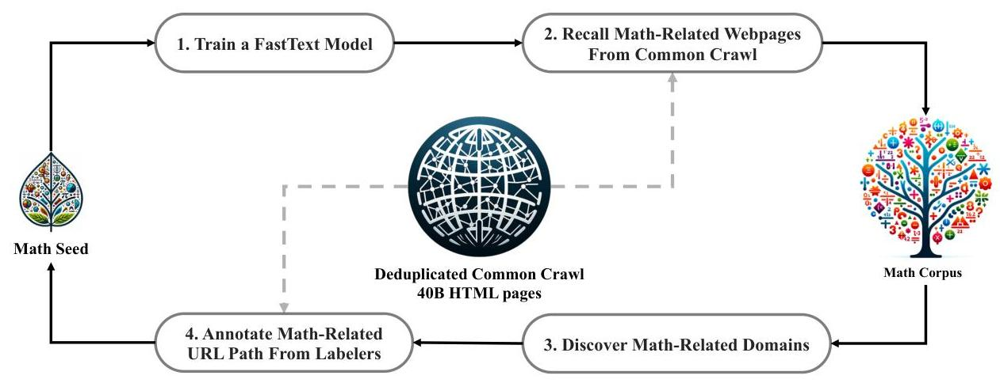

Figure 2 | An iterative pipeline that collects mathematical web pages from Common Crawl.
of word n-gram to 3, the minimum number of word occurrences to 3, and the number of training epochs to 3. To reduce the size of the original Common Crawl, we employ URL-based deduplication and near-deduplication techniques, resulting in 40B HTML web pages. We then recall mathematical web pages from deduplicated Common Crawl with the fastText model. To filter out low-quality mathematical content, we rank the collected pages according to their scores predicted by the fastText model, and only preserve the top-ranking ones. The volume of data preserved is assessed through pre-training experiments on the top 40B, 80B, 120B, and 160B tokens. In the first iteration, we choose to keep the top 40B tokens.

After the first iteration of data collection, numerous mathematical web pages remain uncollected, mainly because the fastText model is trained on a set of positive examples that lacks sufficient diversity. We therefore identify additional mathematical web sources to enrich the seed corpus, so that we can optimize the fastText model. Specifically, we first organize the entire Common Crawl into disjoint domains; a domain is defined as web pages sharing the same base URL. For each domain, we calculate the percentage of web pages that are collected in the first iteration. Domains where over $10 \%$ of the web pages have been collected are classified as math-related (e.g., mathoverflow.net). Subsequently, we manually annotate the URLs associated with mathematical content within these identified domains (e.g., mathoverflow.net/questions). Web pages linked to these URLs, yet uncollected, will be added to the seed corpus. This approach enables us to gather more positive examples, thereby training an improved fastText model capable of recalling more mathematical data in the subsequent iteration. After four iterations of data collection, we end up with 35.5 M mathematical web pages, totaling 120B tokens. In the fourth iteration, we notice that nearly $98 \%$ of the data has already been collected in the third iteration, so we decide to cease data collection.

To avoid benchmark contamination, we follow Guo et al. (2024) to filter out web pages containing questions or answers from English mathematical benchmarks such as GSM8K (Cobbe et al., 2021) and MATH (Hendrycks et al., 2021) and Chinese benchmarks such as CMATH (Wei et al., 2023) and AGIEval (Zhong et al., 2023). The filtering criteria are as follows: any text segment containing a 10-gram string that matches exactly with any sub-string from the evaluation benchmarks is removed from our math training corpus. For benchmark texts that are shorter than 10 grams but have at least 3 grams, we employ exact matching to filter out contaminated web pages.

# 2.2. Validating the Quality of the DeepSeekMath Corpus 

We run pre-training experiments to investigate how the DeepSeekMath Corpus is compared with the recently released math-training corpora:

- MathPile (Wang et al., 2023c): a multi-source corpus (8.9B tokens) aggregated from textbooks, Wikipedia, ProofWiki, CommonCrawl, StackExchange, and arXiv, with the majority (over 85\%) sourced from arXiv;
- OpenWebMath (Paster et al., 2023): CommonCrawl data filtered for mathematical content, totaling 13.6B tokens;
- Proof-Pile-2 (Azerbayev et al., 2023): a mathematical corpus consisting of OpenWebMath, AlgebraicStack (10.3B tokens of mathematical code), and arXiv papers (28.0B tokens). When experimenting on Proof-Pile-2, we follow Azerbayev et al. (2023) to use an arXiv:Web:Code ratio of 2:4:1.


### 2.2.1. Training Setting

We apply math training to a general pre-trained language model with 1.3B parameters, which shares the same framework as the DeepSeek LLMs (DeepSeek-AI, 2024), denoted as DeepSeekLLM 1.3B. We separately train a model on each mathematical corpus for 150B tokens. All experiments are conducted using the efficient and light-weight HAI-LLM (High-flyer, 2023) training framework. Following the training practice of DeepSeek LLMs, we use the AdamW optimizer (Loshchilov and Hutter, 2017) with $\beta_{1}=0.9, \beta_{2}=0.95$, and weight_decay $=0.1$, along with a multi-step learning rate schedule where the learning rate reaches the peak after 2,000 warmup steps, decreases to its $31.6 \%$ after $80 \%$ of the training process, and further decreases to $10.0 \%$ of the peak after $90 \%$ of the training process. We set the maximum value of learning rate to $5.3 \mathrm{e}-4$, and use a batch size of 4 M tokens with a 4 K context length.

| Math Corpus | Size | English Benchmarks |  |  |  |  | Chinese Benchmarks |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  |  | GSM8K | MATH | OCW | SAT | MMLU <br> STEM | CMATH | Gaokao <br> MathCloze | Gaokao <br> MathQA |
| No Math Training | N/A | $2.9 \%$ | $3.0 \%$ | $2.9 \%$ | $15.6 \%$ | $19.5 \%$ | $12.3 \%$ | $0.8 \%$ | $17.9 \%$ |
| MathPile | 8.9B | $2.7 \%$ | $3.3 \%$ | $2.2 \%$ | $12.5 \%$ | $15.7 \%$ | $1.2 \%$ | $0.0 \%$ | $2.8 \%$ |
| OpenWebMath | 13.6B | $11.5 \%$ | $8.9 \%$ | $3.7 \%$ | $31.3 \%$ | $29.6 \%$ | $16.8 \%$ | $0.0 \%$ | $14.2 \%$ |
| Proof-Pile-2 | 51.9B | $14.3 \%$ | $11.2 \%$ | $3.7 \%$ | $43.8 \%$ | $29.2 \%$ | $19.9 \%$ | $5.1 \%$ | $11.7 \%$ |
| DeepSeekMath Corpus | 120.2B | $23.8 \%$ | $13.6 \%$ | $4.8 \%$ | $56.3 \%$ | $33.1 \%$ | $41.5 \%$ | $5.9 \%$ | $23.6 \%$ |

Table 1 | Performance of DeepSeek-LLM 1.3B trained on different mathematical corpora, evaluated using few-shot chain-of-thought prompting. Corpus sizes are calculated using our tokenizer with a vocabulary size of 100 K .

### 2.2.2. Evaluation Results

The DeepSeekMath Corpus is of high quality, covers multilingual mathematical content, and is the largest in size.

- High-quality: We evaluate downstream performance on 8 mathematical benchmarks using few-shot chain-of-thought prompting Wei et al. (2022). As shown in Table 1, there is a clear performance lead of the model trained on the DeepSeekMath Corpus. Figure 3 shows that the model trained on the DeepSeekMath Corpus demonstrates better performance than

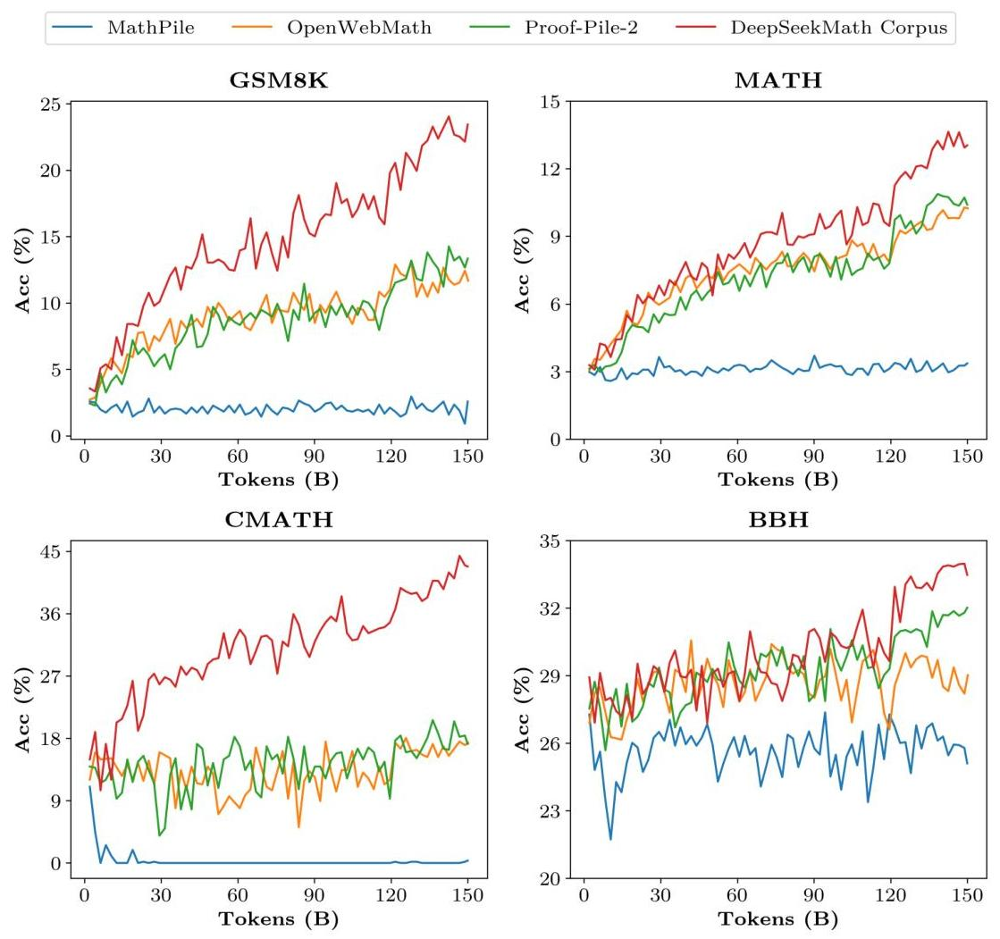

Figure 3 | Benchmark curves of DeepSeek-LLM 1.3B trained on different mathematical corpora.

Proof-Pile-2 at 50B tokens (1 full epoch of Proof-Pile-2), indicating the average quality of DeepSeekMath Corpus is higher.

- Multilingual: The DeepSeekMath Corpus encompasses data in multiple languages, predominantly featuring English and Chinese as the two most represented languages. As shown in Table 1, training on the DeepSeekMath Corpus enhances mathematical reasoning performance in both English and Chinese. In contrast, existing mathematical corpora, which are primarily English-centric, show limited improvement and may even hinder performance in Chinese mathematical reasoning.
- Large-scale: The DeepSeekMath Corpus is several times larger than existing mathematical corpora. As depicted in Figure 3, DeepSeek-LLM 1.3B, when trained on the DeepSeekMath Corpus, shows a steeper learning curve along with more lasting improvements. In contrast, the baseline corpora are much smaller, and have already been repeated multiple rounds during training, with the resulting model performance quickly reaching a plateau.


# 2.3. Training and Evaluating DeepSeekMath-Base 7B 

In this section, we introduce DeepSeekMath-Base 7B, a base model with strong reasoning abilities, especially in mathematics. Our model is initialized with DeepSeek-Coder-Base-v1.5 7B

(Guo et al., 2024) and trained for 500B tokens. The distribution of the data is as follows: 56\% is from the DeepSeekMath Corpus, 4\% from AlgebraicStack, 10\% from arXiv, 20\% is Github code, and the remaining $10 \%$ is natural language data from Common Crawl in both English and Chinese. We mainly adopt the training setting specified in Section 2.2.1, except that we set the maximum value of the learning rate to $4.2 \mathrm{e}-4$ and use a batch size of 10 M tokens.

We conduct a comprehensive assessment of the mathematical capabilities of DeepSeekMathBase 7B, focusing on its ability to produce self-contained mathematical solutions without relying on external tools, solve mathematical problems using tools, and conduct formal theorem proving. Beyond mathematics, we also provide a more general profile of the base model, including its performance of natural language understanding, reasoning, and programming skills.

Mathematical Problem Solving with Step-by-Step Reasoning We evaluate DeepSeekMathBase's performance of solving mathematical problems using few-shot chain-of-thought prompting (Wei et al., 2022), across eight benchmarks in English and Chinese. These benchmarks encompass quantitative reasoning (e.g., GSM8K (Cobbe et al., 2021), MATH (Hendrycks et al., 2021), and CMATH (Wei et al., 2023)) and multiple-choice problems (e.g., MMLU-STEM (Hendrycks et al., 2020) and Gaokao-MathQA (Zhong et al., 2023)), covering diverse fields of mathematics from elementary to college-level complexity.

As shown in Table 2, DeepSeekMath-Base 7B leads in performance across all eight benchmarks among the open-source base models (including the widely-used general model Mistral 7B (Jiang et al., 2023) and the recently released Llemma 34B (Azerbayev et al., 2023) which underwent math training on Proof-Pile-2 (Azerbayev et al., 2023)). Notably, on the competitionlevel MATH dataset, DeepSeekMath-Base surpasses existing open-source base models by over 10\% absolute, and outperforms Minerva 540B (Lewkowycz et al., 2022a), a closed-source base model 77 times larger which builds on PaLM (Lewkowycz et al., 2022b) and is further trained on mathematical texts.

| Model | Size | English Benchmarks |  |  |  |  | Chinese Benchmarks |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  |  | GSM8K | MATH | OCW | SAT | MMLU <br> STEM | CMATH | Gaokao MathCloze | Gaokao MathQA |
| Closed-Source Base Model |  |  |  |  |  |  |  |  |  |
| Minerva | 7B | $16.2 \%$ | $14.1 \%$ | $7.7 \%$ | - | $35.6 \%$ | - | - | - |
| Minerva | 62B | $52.4 \%$ | $27.6 \%$ | $12.0 \%$ | - | $53.9 \%$ | - | - | - |
| Minerva | 540B | $58.8 \%$ | $33.6 \%$ | $17.6 \%$ | - | $63.9 \%$ | - | - | - |
| Open-Source Base Model |  |  |  |  |  |  |  |  |  |
| Mistral | 7B | $40.3 \%$ | $14.3 \%$ | $9.2 \%$ | $71.9 \%$ | $51.1 \%$ | $44.9 \%$ | $5.1 \%$ | $23.4 \%$ |
| Llemma | 7B | $37.4 \%$ | $18.1 \%$ | $6.3 \%$ | $59.4 \%$ | $43.1 \%$ | $43.4 \%$ | $11.9 \%$ | $23.6 \%$ |
| Llemma | 34B | $54.0 \%$ | $25.3 \%$ | $10.3 \%$ | $71.9 \%$ | $52.9 \%$ | $56.1 \%$ | $11.9 \%$ | $26.2 \%$ |
| DeepSeekMath-Base | 7B | $\mathbf{6 4 . 2 \%}$ | $\mathbf{3 6 . 2 \%}$ | $\mathbf{1 5 . 4 \%}$ | $\mathbf{8 4 . 4 \%}$ | $\mathbf{5 6 . 5 \%}$ | $\mathbf{7 1 . 7 \%}$ | $\mathbf{2 0 . 3 \%}$ | $\mathbf{3 5 . 3 \%}$ |

Table 2 | Comparisons between DeepSeekMath-Base 7B and strong base models on English and Chinese mathematical benchmarks. Models are evaluated with chain-of-thought prompting. Minerva results are quoted from Lewkowycz et al. (2022a).

Mathematical Problem Solving with Tool Use We evaluate program-aided mathematical reasoning on GSM8K and MATH using few-shot program-of-thought prompting (Chen et al., 2022; Gao et al., 2023). Models are prompted to solve each problem by writing a Python program where libraries such as math and sympy can be utilized for intricate computations. The execution result of the program is evaluated as the answer. As shown in Table 3, DeepSeekMath-Base 7B outperforms the prior state-of-the-art Llemma 34B.

| Model | Size | Problem Solving w/ Tools |  | Informal-to-Formal Proving |  |
| :-- | :--: | :--: | :--: | :--: | :--: |
|  |  | GSM8K+Python | MATH+Python | miniF2F-valid | miniF2F-test |
| Mistral | 7B | $48.5 \%$ | $18.2 \%$ | $18.9 \%$ | $18.0 \%$ |
| CodeLlama | 7B | $27.1 \%$ | $17.2 \%$ | $16.3 \%$ | $17.6 \%$ |
| CodeLlama | 34B | $52.7 \%$ | $23.5 \%$ | $18.5 \%$ | $18.0 \%$ |
| Llemma | 7B | $41.0 \%$ | $18.6 \%$ | $20.6 \%$ | $22.1 \%$ |
| Llemma | 34B | $64.6 \%$ | $26.3 \%$ | $21.0 \%$ | $21.3 \%$ |
| DeepSeekMath-Base | 7B | $\mathbf{6 6 . 9 \%}$ | $\mathbf{3 1 . 4 \%}$ | $\mathbf{2 5 . 8 \%}$ | $\mathbf{2 4 . 6 \%}$ |

Table $3 \mid$ Few-shot evaluation of base models' ability to solve mathematical problems using tools and the ability to conduct informal-to-formal theorem proving in Isabelle.

Formal Mathematics Formal proof automation is beneficial to ensure the accuracy and reliability of mathematical proofs and enhance efficiency, with increasing attention in recent years. We evaluate DeepSeekMath-Base 7B on the task of informal-to-formal proving from (Jiang et al., 2022) which is to generate a formal proof based on an informal statement, a formal counterpart of the statement, and an informal proof. We evaluate on miniF2F (Zheng et al., 2021), a benchmark for formal Olympiad-level mathematics, and generate a formal proof in Isabelle for each problem with few-shot prompting. Following Jiang et al. (2022), we leverage models to generate proof sketches, and execute the off-the-shelf automated prover Sledgehammer (Paulson, 2010) to fill in the missing details. As shown in Table 3, DeepSeekMath-Base 7B demonstrates strong performance in proof autoformalization.

| Model | Size | MMLU | BBH | HumanEval (Pass@1) | MBPP (Pass@1) |
| :-- | :--: | :--: | :--: | :--: | :--: |
| Mistral | 7B | $\mathbf{6 2 . 4 \%}$ | $55.7 \%$ | $28.0 \%$ | $41.4 \%$ |
| DeepSeek-Coder-Base-v1.5 | 7B | $42.9 \%$ | $42.9 \%$ | $40.2 \%$ | $52.6 \%$ |
| DeepSeek-Coder-Base-v1.5 | 7B | $49.1 \%$ | $55.2 \%$ | $\mathbf{4 3 . 2 \%}$ | $\mathbf{6 0 . 4 \%}$ |
| DeepSeekMath-Base | 7B | $54.9 \%$ | $\mathbf{5 9 . 5 \%}$ | $40.9 \%$ | $52.6 \%$ |

Table $4 \mid$ Evaluation on natural language understanding, reasoning, and code benchmarks. DeepSeek-Coder-Base-v1.5 ${ }^{\dagger}$ is the checkpoint right before learning rate decay, which is used to train DeepSeekMath-Base. On MMLU and BBH, we use few-shot chain-of-thought prompting. On HumanEval and MBPP, we evaluate model performance under the zero-shot setting and a few-shot setting, respectively.

Natural Language Understanding, Reasoning, and Code We evaluate model performance of natural language understanding on MMLU (Hendrycks et al., 2020), reasoning on BBH (Suzgun et al., 2022), and coding capabilities on HumanEval (Chen et al., 2021) and MBPP (Austin et al.,

2021). As shown in Table 4, DeepSeekMath-Base 7B exhibits significant enhancements in performance on MMLU and BBH over its precursor, DeepSeek-Coder-Base-v1.5 (Guo et al., 2024), illustrating the positive impact of math training on language understanding and reasoning. Additionally, by including code tokens for continual training, DeepSeekMath-Base 7B effectively maintains the performance of DeepSeek-Coder-Base-v1.5 on the two coding benchmarks. Overall, DeepSeekMath-Base 7B significantly outperforms the general model Mistral 7B (Jiang et al., 2023) on the three reasoning and coding benchmarks.

# 3. Supervised Fine-Tuning 

### 3.1. SFT Data Curation

We construct a mathematical instruction-tuning dataset covering English and Chinese problems from different mathematical fields and of varying complexity levels: problems are paired with solutions in chain-of-thought (CoT) (Wei et al., 2022), program-of-thought (PoT) (Chen et al., 2022; Gao et al., 2023), and tool-integrated reasoning format (Gou et al., 2023). The total number of training examples is 776 K .

- English mathematical datasets: We annotate GSM8K and MATH problems with toolintegrated solutions, and adopt a subset of MathInstruct (Yue et al., 2023) along with the training set of Lila-OOD (Mishra et al., 2022) where problems are solved with CoT or PoT. Our English collection covers diverse fields of mathematics, e.g., algebra, probability, number theory, calculus, and geometry.
- Chinese mathematical datasets: We collect Chinese K-12 mathematical problems spanning 76 sub-topics such as linear equations, with solutions annotated in both CoT and toolintegrated reasoning format.


### 3.2. Training and Evaluating DeepSeekMath-Instruct 7B

In this section, we introduce DeepSeekMath-Instruct 7B which undergoes mathematical instruction tuning based on DeepSeekMath-Base. Training examples are randomly concatenated until reaching a maximum context length of 4 K tokens. We train the model for 500 steps with a batch size of 256 and a constant learning rate of $5 \mathrm{e}-5$.

We evaluate models' mathematical performance both without and with tool use, on 4 quantitative reasoning benchmarks in English and Chinese. We benchmark our model against the leading models of the time:

- Closed-source models include: (1) the GPT family among which GPT-4 (OpenAI, 2023) and GPT-4 Code Interpreter ${ }^{2}$ are the most capable ones, (2) Gemini Ultra and Pro (Anil et al., 2023), (3) Inflection-2 (Inflection AI, 2023), (4) Grok-1 ${ }^{3}$, as well as models recently released by Chinese companies including (5) Baichuan-3 ${ }^{4}$, (6) the latest GLM-4 ${ }^{5}$ from the GLM family (Du et al., 2022). These models are for general purposes, most of which have undergone a series of alignment procedures.
- Open-source models include: general models like (1) DeepSeek-LLM-Chat 67B (DeepSeekAI, 2024), (2) Qwen 72B (Bai et al., 2023), (3) SeaLLM-v2 7B (Nguyen et al., 2023), and (4)

[^0]
[^0]:    ${ }^{2}$ https://openai.com/blog/chatgpt-plugins\#code-interpreter
    ${ }^{3}$ https://x.ai/model-card
    ${ }^{4}$ https://www.baichuan-ai.com
    ${ }^{5}$ https://open.bigmodel.cn/dev/api\#glm-4

ChatGLM3 6B (ChatGLM3 Team, 2023), as well as models with enhancements in mathematics including (5) InternLM2-Math $20 B{ }^{6}$ which builds on InternLM2 and underwent math training followed by instruction tuning, (6) Math-Shepherd-Mistral 7B which applys PPO training (Schulman et al., 2017) to Mistral 7B (Jiang et al., 2023) with a process-supervised reward model, (7) the WizardMath series (Luo et al., 2023) which improves mathematical reasoning in Mistral 7B and Llama-2 70B (Touvron et al., 2023) using evolve-instruct (i.e., a version of instruction tuning that uses AI-evolved instructions) and PPO training with training problems primarily sourced from GSM8K and MATH, (8) MetaMath 70B (Yu et al., 2023) which is Llama-2 70B fine-tuned on an augmented version of GSM8K and MATH, (9) ToRA 34B Gou et al. (2023) which is CodeLlama 34B fine-tuned to do tool-integrated mathematical reasoning, (10) MAmmoTH 70B (Yue et al., 2023) which is Llama-2 70B instruction-tuned on MathInstruct.
As shown in Table 5, under the evaluation setting where tool use is disallowed, DeepSeekMathInstruct 7B demonstrates strong performance of step-by-step reasoning. Notably, on the competition-level MATH dataset, our model surpasses all open-source models and the majority of proprietary models (e.g., Inflection-2 and Gemini Pro) by at least 9\% absolute. This is true even for models that are substantially larger (e.g., Qwen 72B) or have been specifically enhanced through math-focused reinforcement learning (e.g., WizardMath-v1.1 7B). While DeepSeekMath-Instruct rivals the Chinese proprietary models GLM-4 and Baichuan-3 on MATH, it still underperforms GPT-4 and Gemini Ultra.

Under the evaluation setting where models are allowed to integrate natural language reasoning and program-based tool use for problem solving, DeepSeekMath-Instruct 7B approaches an accuracy of $60 \%$ on MATH, surpassing all existing open-source models. On the other benchmarks, our model is competitive with DeepSeek-LLM-Chat 67B, the prior state-of-the-art that is 10 times larger.

# 4. Reinforcement Learning 

### 4.1. Group Relative Policy Optimization

Reinforcement learning (RL) has been proven to be effective in further improving the mathematical reasoning ability of LLMs after the Supervised Fine-Tuning (SFT) stage (Luo et al., 2023; Wang et al., 2023b). In this section, we introduce our efficient and effective RL algorithm, Group Relative Policy Optimization (GRPO).

### 4.1.1. From PPO to GRPO

Proximal Policy Optimization (PPO) (Schulman et al., 2017) is an actor-critic RL algorithm that is widely used in the RL fine-tuning stage of LLMs (Ouyang et al., 2022). In particular, it optimizes LLMs by maximizing the following surrogate objective:

$$
\mathcal{J}_{\text {PPO }}(\theta)=\mathbb{E}\left[q \sim P(Q), o \sim \pi_{\theta_{s t d}}(O \mid q)\right] \frac{1}{|\sigma|} \sum_{t=1}^{|\sigma|} \min \left\{\frac{\pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)}{\pi_{\theta_{s t d}}\left(o_{t} \mid q, o_{<t}\right)} A_{t}, \operatorname{clip}\left(\frac{\pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)}{\pi_{\theta_{s t d}}\left(o_{t} \mid q, o_{<t}\right)}, 1-\varepsilon, 1+\varepsilon\right\} A_{t}\right\}
$$

where $\pi_{\theta}$ and $\pi_{\theta_{s t d}}$ are the current and old policy models, and $q, o$ are questions and outputs sampled from the question dataset and the old policy $\pi_{\theta_{s t d}}$, respectively. $\varepsilon$ is a clipping-related hyper-parameter introduced in PPO for stabilizing training. $A_{t}$ is the advantage, which is computed by applying Generalized Advantage Estimation (GAE) (Schulman et al., 2015), based

[^0]
[^0]:    ${ }^{6}$ https://github.com/InternLM/InternLM-Math

| Model | Size | English Benchmarks |  | Chinese Benchmarks |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
|  |  | GSM8K | MATH | MGSM-zh | CMATH |
| Chain-of-Thought Reasoning |  |  |  |  |  |
| Closed-Source Model |  |  |  |  |  |
| Gemini Ultra | - | $94.4 \%$ | $53.2 \%$ | - | - |
| GPT-4 | - | $92.0 \%$ | $52.9 \%$ | - | $86.0 \%$ |
| Inflection-2 | - | $81.4 \%$ | $34.8 \%$ | - | - |
| GPT-3.5 | - | $80.8 \%$ | $34.1 \%$ | - | $73.8 \%$ |
| Gemini Pro | - | $86.5 \%$ | $32.6 \%$ | - | - |
| Grok-1 | - | $62.9 \%$ | $23.9 \%$ | - | - |
| Baichuan-3 | - | $88.2 \%$ | $49.2 \%$ | - | - |
| GLM-4 | - | $87.6 \%$ | $47.9 \%$ | - | - |
| Open-Source Model |  |  |  |  |  |
| InternLM2-Math | 20B | $82.6 \%$ | $37.7 \%$ | - | - |
| Qwen | 72B | $78.9 \%$ | $35.2 \%$ | - | - |
| Math-Shepherd-Mistral | 7B | $84.1 \%$ | $33.0 \%$ | - | - |
| WizardMath-v1.1 | 7B | $83.2 \%$ | $33.0 \%$ | - | - |
| DeepSeek-LLM-Chat | 67B | $84.1 \%$ | $32.6 \%$ | $74.0 \%$ | $80.3 \%$ |
| MetaMath | 70B | $82.3 \%$ | $26.6 \%$ | $66.4 \%$ | $70.9 \%$ |
| SeaLLM-v2 | 7B | $78.2 \%$ | $27.5 \%$ | $64.8 \%$ | - |
| ChatGLM3 | 6B | $72.3 \%$ | $25.7 \%$ | - | - |
| WizardMath-v1.0 | 70B | $81.6 \%$ | $22.7 \%$ | $64.8 \%$ | $65.4 \%$ |
| DeepSeekMath-Instruct | 7B | $82.9 \%$ | $46.8 \%$ | $73.2 \%$ | $84.6 \%$ |
| DeepSeekMath-RL | 7B | $88.2 \%$ | $51.7 \%$ | $79.6 \%$ | $88.8 \%$ |
| Tool-Integrated Reasoning |  |  |  |  |  |
| Closed-Source Model |  |  |  |  |  |
| GPT-4 Code Interpreter | - | $97.0 \%$ | $69.7 \%$ | - | - |
| Open-Source Model |  |  |  |  |  |
| InternLM2-Math | 20B | $80.7 \%$ | $54.3 \%$ | - | - |
| DeepSeek-LLM-Chat | 67B | $86.7 \%$ | $51.1 \%$ | $76.4 \%$ | $85.4 \%$ |
| ToRA | 34B | $80.7 \%$ | $50.8 \%$ | $41.2 \%$ | $53.4 \%$ |
| MAmmoTH | 70B | $76.9 \%$ | $41.8 \%$ | - | - |
| DeepSeekMath-Instruct | 7B | $83.7 \%$ | $57.4 \%$ | $72.0 \%$ | $84.3 \%$ |
| DeepSeekMath-RL | 7B | $86.7 \%$ | $58.8 \%$ | $78.4 \%$ | $87.6 \%$ |

Table $5 \mid$ Performance of Open- and Closed-Source models with both Chain-of-Thought and Tool-Integrated Reasoning on English and Chinese Benchmarks. Scores in gray denote majority votes with 32 candidates; The others are Top1 scores. DeepSeekMath-RL 7B beats all opensource models from 7B to 70B, as well as the majority of closed-source models. Although DeepSeekMath-RL 7B is only further trained on chain-of-thought-format instruction tuning data of GSM8K and MATH, it improves over DeepSeekMath-Instruct 7B on all benchmarks.

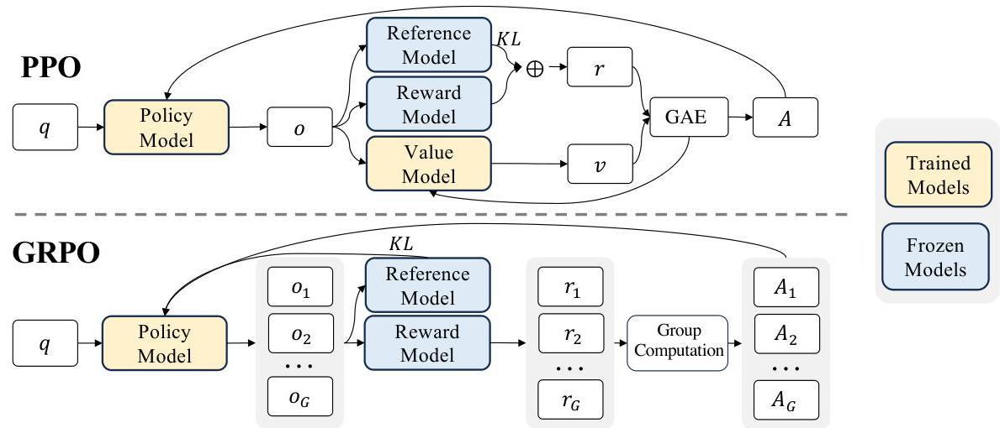

Figure 4 | Demonstration of PPO and our GRPO. GRPO foregoes the value model, instead estimating the baseline from group scores, significantly reducing training resources.
on the rewards $\left\{r_{\leq t}\right\}$ and a learned value function $V_{\phi}$. Thus, in PPO, a value function needs to be trained alongside the policy model and to mitigate over-optimization of the reward model, the standard approach is to add a per-token KL penalty from a reference model in the reward at each token (Ouyang et al., 2022), i.e.,

$$
r_{\mathrm{r}}=r_{\phi}\left(q, o_{\leq t}\right)-\beta \log \frac{\pi_{\theta}\left(o_{1} \mid q, o_{<t}\right)}{\pi_{r e f}\left(o_{t} \mid q, o_{<t}\right)}
$$

where $r_{\phi}$ is the reward model, $\pi_{\text {ref }}$ is the reference model, which is usually the initial SFT model, and $\beta$ is the coefficient of the KL penalty.

As the value function employed in PPO is typically another model of comparable size as the policy model, it brings a substantial memory and computational burden. Additionally, during RL training, the value function is treated as a baseline in the calculation of the advantage for variance reduction. While in the LLM context, usually only the last token is assigned a reward score by the reward model, which may complicate the training of a value function that is accurate at each token. To address this, as shown in Figure 4, we propose Group Relative Policy Optimization (GRPO), which obviates the need for additional value function approximation as in PPO, and instead uses the average reward of multiple sampled outputs, produced in response to the same question, as the baseline. More specifically, for each question $q$, GRPO samples a group of outputs $\left\{o_{1}, o_{2}, \cdots, o_{G}\right\}$ from the old policy $\pi_{\theta_{\text {old }}}$ and then optimizes the policy model by maximizing the following objective:

$$
\begin{aligned}
\mathcal{J}_{\text {GRPO }}(\theta) & =\mathbb{E}\left[q \sim P(\mathrm{Q}),\left\{o_{t}\right\}_{t=1}^{G} \sim \pi_{\theta_{\text {old }}}(O \mid \mathrm{q})\right] \\
& \frac{1}{G} \sum_{t=1}^{G} \frac{1}{\left|o_{t}\right|} \sum_{t=1}^{|o_{t}|}\left\{\min \left\{\frac{\pi_{\theta}\left(o_{t, t} \mid q, o_{t,<t}\right)}{\pi_{\theta_{\text {old }}}\left(o_{t, t} \mid q, o_{t,<t}\right)} \hat{A}_{i, t}, \operatorname{clip}\left(\frac{\pi_{\theta}\left(o_{t, t} \mid q, o_{t,<t}\right)}{\pi_{\theta_{\text {old }}}\left(o_{t, t} \mid q, o_{t,<t}\right)}, 1-\varepsilon, 1+\varepsilon\right) \hat{A}_{i, t}\right\}-\beta \mathbf{D}_{K L}\left[\pi_{\theta} \mid \pi_{r e f}\right]\right\},
\end{aligned}
$$

where $\varepsilon$ and $\beta$ are hyper-parameters, and $\hat{A}_{i, t}$ is the advantage calculated based on relative rewards of the outputs inside each group only, which will be detailed in the following subsections. The group relative way that GRPO leverages to calculate the advantages, aligns well with the comparative nature of rewards models, as reward models are typically trained on datasets of comparisons between outputs on the same question. Also note that, instead of adding KL penalty in the reward, GRPO regularizes by directly adding the KL divergence between the trained policy and the reference policy to the loss, avoiding complicating the calculation of $\hat{A}_{i, t}$.

# Algorithm 1 Iterative Group Relative Policy Optimization 

Input initial policy model $\pi_{\theta_{\text {init }}}$; reward models $r_{\phi}$; task prompts $\mathcal{D}$; hyperparameters $\varepsilon, \beta, \mu$

```
policy model \(\pi_{\theta} \leftarrow \pi_{\theta_{\text {init }}}\)
for iteration \(=1, \ldots, \mathrm{I}\) do
    reference model \(\pi_{r e f} \leftarrow \pi_{\theta}\)
    for step \(=1, \ldots, \mathrm{M}\) do
        Sample a batch \(\mathcal{D}_{b}\) from \(\mathcal{D}\)
        Update the old policy model \(\pi_{\theta_{\text {init }}} \leftarrow \pi_{\theta}\)
        Sample \(G\) outputs \(\left\{o_{t}\right\}_{t=1}^{t \prime} \sim \pi_{\theta_{\text {init }}}(\cdot \mid q)\) for each question \(q \in \mathcal{D}_{b}\)
        Compute rewards \(\left\{r_{t}\right\}_{t=1}^{t \prime}\) for each sampled output \(o_{t}\) by running \(r_{\phi}\)
        Compute \(\hat{A}_{i, t}\) for the \(t\)-th token of \(o_{t}\) through group relative advantage estimation.
        for GRPO iteration \(=1, \ldots, \mu\) do
            Update the policy model \(\pi_{\theta}\) by maximizing the GRPO objective (Equation 21)
        Update \(r_{\phi}\) through continuous training using a replay mechanism.
Output \(\pi_{\theta}\)
```

And different from the KL penalty term used in (2), we estimate the KL divergence with the following unbiased estimator (Schulman, 2020):

$$
\mathbb{D}_{K L}\left[\pi_{\theta} \| \pi_{r e f}\right]=\frac{\pi_{r e f}\left(o_{i, t} \mid q, o_{i,<t}\right)}{\pi_{\theta}\left(o_{i, t} \mid q, o_{i,<t}\right)}-\log \frac{\pi_{r e f}\left(o_{i, t} \mid q, o_{i,<t}\right)}{\pi_{\theta}\left(o_{i, t} \mid q, o_{i,<t}\right)}-1
$$

which is guaranteed to be positive.

### 4.1.2. Outcome Supervision RL with GRPO

Formally, for each question $q$, a group of outputs $\left\{o_{1}, o_{2}, \cdots, o_{G}\right\}$ are sampled from the old policy model $\pi_{\theta_{\text {old }}}$. A reward model is then used to score the outputs, yielding $G$ rewards $\mathbf{r}=\left\{r_{1}, r_{2}, \cdots, r_{G}\right\}$ correspondingly. Subsequently, these rewards are normalized by subtracting the group average and dividing by the group standard deviation. Outcome supervision provides the normalized reward at the end of each output $o_{i}$ and sets the advantages $\hat{A}_{i, t}$ of all tokens in the output as the normalized reward, i.e., $\hat{A}_{i, t}=\bar{r}_{i}=\frac{r_{i}-\text { mean }(\mathbf{r})}{\operatorname{std}(\mathbf{r})}$, and then optimizes the policy by maximizing the objective defined in equation (3).

### 4.1.3. Process Supervision RL with GRPO

Outcome supervision only provides a reward at the end of each output, which may not be sufficient and efficient to supervise the policy in complex mathematical tasks. Following Wang et al. (2023b), we also explore process supervision, which provides a reward at the end of each reasoning step. Formally, given the question $q$ and $G$ sampled outputs $\left\{o_{1}, o_{2}, \cdots, o_{G}\right\}$, a process reward model is used to score each step of the outputs, yielding corresponding rewards: $\mathbf{R}=\left\{\left\{r_{1}^{\text {index }(1)}, \cdots, r_{1}^{\text {index }\left(K_{1}\right)}\right\}, \cdots,\left\{r_{G}^{\text {index }(1)}, \cdots, r_{G}^{\text {index }\left(K_{G}\right)}\right\}\right\}$, where index $(j)$ is the end token index of the $j$-th step, and $K_{i}$ is the total number of steps in the $i$-th output. We also normalize these rewards with the average and the standard deviation, i.e., $\bar{r}_{i}^{\text {index }(j)}=\frac{r_{i}^{\text {index }(j)}-\text { mean }(\mathbf{R})}{\operatorname{std}(\mathbf{R})}$. Subsequently, the process supervision calculates the advantage of each token as the sum of the normalized rewards from the following steps, i.e., $\hat{A}_{i, t}=\sum_{\text {index }(j) \geq t} \bar{r}_{i}^{\text {index }(j)}$, and then optimizes the policy by maximizing the objective defined in equation (3).

# 4.1.4. Iterative RL with GRPO 

As the reinforcement learning training process progresses, the old reward model may not be sufficient to supervise the current policy model. Therefore, we also explore the iterative RL with GRPO. As shown in Algorithm 1, in iterative GRPO, we generate new training sets for the reward model based on the sampling results from the policy model and continually train the old reward model using a replay mechanism that incorporates $10 \%$ of historical data. Then, we set the reference model as the policy model, and continually train the policy model with the new reward model.

### 4.2. Training and Evaluating DeepSeekMath-RL

We conduct RL based on DeepSeekMath-Instruct 7B. The training data of RL are chain-of-thought-format questions related to GSM8K and MATH from the SFT data, which consists of around 144 K questions. We exclude other SFT questions to investigate the impact of RL on benchmarks that lack data throughout the RL phase. We construct the training set of reward models following (Wang et al., 2023b). We train our initial reward model based on the DeepSeekMath-Base 7B with a learning rate of 2e-5. For GRPO, we set the learning rate of the policy model as 1e-6. The KL coefficient is 0.04 . For each question, we sample 64 outputs. The max length is set to 1024, and the training batch size is 1024. The policy model only has a single update following each exploration stage. We evaluate DeepSeekMath-RL 7B on benchmarks following DeepSeekMath-Instruct 7B. For DeepSeekMath-RL 7B, GSM8K and MATH with chain-of-thought reasoning can be regarded as in-domain tasks and all the other benchmarks can be regarded as out-of-domain tasks.

Table 5 demonstrates the performance of open- and closed-source models with both chain-of-thought and tool-integrated reasoning on English and Chinese benchmarks. We find that: 1) DeepSeekMath-RL 7B attains accuracies of $88.2 \%$ and $51.7 \%$ on GSM8K and MATH, respectively, utilizing chain-of-thought reasoning. This performance surpasses that of all open-source models in the 7B to 70B range, as well as the majority of closed-source models. 2) Crucially, DeepSeekMath-RL 7B is only trained on chain-of-thought-format instruction tuning data of GSM8K and MATH, starting from DeepSeekMath-Instruct 7B. Despite the constrained scope of its training data, it outperforms DeepSeekMath-Instruct 7B across all evaluation metrics, showcasing the effectiveness of reinforcement learning.

## 5. Discussion

In this section, we will share our findings in pre-training and RL experiments.

### 5.1. Lessons Learnt in Pre-Training

We first share our experience in pre-training. Unless otherwise specified, we will adhere to the training settings outlined in Section 2.2.1. It is worth noting that, when referring to the DeepSeekMath Corpus in this section, we use an 89B-token dataset from the second iteration of the data collection process.

### 5.1.1. Code Training Benefits Mathematical Reasoning

A popular yet unverified hypothesis suggests that code training improves reasoning. We attempt to offer a partial response to this, particularly within the mathematical domain: code training

| Training Setting | Training Tokens |  |  | w/o Tool Use |  |  | w/ Tool Use |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  | General | Code | Math | GSM8K | MATH | CMATH | GSM8K+Python | MATH+Python |
| No Continual Training | - | - | - | $2.9 \%$ | $3.0 \%$ | $12.3 \%$ | $2.7 \%$ | $2.3 \%$ |
| Two-Stage Training |  |  |  |  |  |  |  |  |
| Stage 1: General Training | 400B | - | - | $2.9 \%$ | $3.2 \%$ | $14.8 \%$ | $3.3 \%$ | $2.3 \%$ |
| Stage 2: Math Training | - | - | 150B | $19.1 \%$ | $14.4 \%$ | $37.2 \%$ | $14.3 \%$ | $6.7 \%$ |
| Stage 1: Code Training | - | 400B | - | $5.9 \%$ | $3.6 \%$ | $19.9 \%$ | $12.4 \%$ | $10.0 \%$ |
| Stage 2: Math Training | - | - | 150B | $21.9 \%$ | $15.3 \%$ | $39.7 \%$ | $17.4 \%$ | $9.4 \%$ |
| One-Stage Training |  |  |  |  |  |  |  |  |
| Math Training | - | - | 150B | $20.5 \%$ | $13.1 \%$ | $37.6 \%$ | $11.4 \%$ | $6.5 \%$ |
| Code \& Math Mixed Training | - | 400B | 150B | $17.6 \%$ | $12.1 \%$ | $36.3 \%$ | $19.7 \%$ | $13.5 \%$ |

Table 6 | Investigation of how code affects mathematical reasoning under different training settings. We experiment with DeepSeek-LLM 1.3B, and evaluate its mathematical reasoning performance without and with tool use via few-shot chain-of-thought prompting and few-shot program-of-thought prompting, respectively.
improves models' ability to do mathematical reasoning both with and without tool use.
To study how code training affects mathematical reasoning, we experimented with the following two-stage training and one-stage training settings:

# Two-Stage Training 

- Code Training for 400B Tokens $\rightarrow$ Math Training for 150B Tokens: We train DeepSeekLLM 1.3B for 400B code tokens followed by 150B math tokens;
- General Training for 400B Tokens $\rightarrow$ Math Training for 150B Tokens: As a control experiment, we also experiment with general tokens (sampled from a large-scale general corpus created by DeepSeek-AI) instead of code tokens in the first stage of training, in an attempt to investigate the advantages of code tokens over general tokens in improving mathematical reasoning.


## One-Stage Training

- Math Training for 150B Tokens: We train DeepSeek-LLM 1.3B for 150B math tokens;
- Training on a mixture of 400B Code Tokens and 150B Math Tokens: Math training following code training degrades coding performance. We investigate whether code tokens, when mixed with math tokens for one-stage training, would still improve mathematical reasoning and also alleviate the problem of catastrophic forgetting.

Results Table 6 and Table 7 demonstrate the downstream performance under different training settings.

Code training benefits program-aided mathematical reasoning, both under the two-stage training and one-stage training settings. As shown in Table 6, under the two-stage training setting, code training alone already significantly enhances the ability to solve GSM8K and MATH problems using Python. Math training in the second stage yields further improvements. Interestingly, under the one-stage training setting, mixing code tokens and math tokens effectively mitigates the issue of catastrophic forgetting that arises from two-stage training, and also synergizes coding (Table 7) and program-aided mathematical reasoning (Table 6).

| Training Setting | Training Tokens |  |  | MMLU | BBH | HumanEval (Pass@1) | MBPP (Pass@1) |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  | General | Code | Math |  |  |  |  |
| No Continual Training | - | - | - | 24.5\% | $28.1 \%$ | $12.2 \%$ | $13.0 \%$ |
| Two-Stage Training |  |  |  |  |  |  |  |
| Stage 1: General Training | 400B | - | - | 25.9\% | $27.7 \%$ | $15.2 \%$ | $13.6 \%$ |
| Stage 2: Math Training | - | - | 150B | $33.1 \%$ | $32.7 \%$ | $12.8 \%$ | $13.2 \%$ |
| Stage 1: Code Training | - | 400B | - | 25.0\% | $31.5 \%$ | $25.0 \%$ | 40.0\% |
| Stage 2: Math Training | - | - | 150B | 36.2\% | $35.3 \%$ | $12.2 \%$ | $17.0 \%$ |
| One-Stage Training |  |  |  |  |  |  |  |
| Math Training | - | - | 150B | $32.3 \%$ | $32.5 \%$ | $11.6 \%$ | $13.2 \%$ |
| Code \& Math Mixed Training | - | 400B | 150B | $33.5 \%$ | 35.6\% | 29.3\% | $39.4 \%$ |

Table $7 \mid$ Investigation of how different settings of code and math training affect model performance of language understanding, reasoning, and coding. We experiment with DeepSeek-LLM 1.3B. We evaluate the models on MMLU and BBH using few-shot chain-of-thought prompting. On HumanEval and MBPP, we conduct zero-shot and few-shot evaluations, respectively.

| Model | Size | ArXiv Corpus | English Benchmarks |  |  |  |  |  | Chinese Benchmarks |  |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  |  |  | GSM8K | MATH | OCW | SAT | MMLU <br> STEM | CMATH | Gaokao <br> MathCloze | Gaokao <br> MathQA |
| DeepSeek-LLM | 1.3B | No Math Training | $2.9 \%$ | $3.0 \%$ | $2.9 \%$ | $15.6 \%$ | $19.5 \%$ | $12.3 \%$ | $0.8 \%$ | $17.9 \%$ |
|  |  | MathPile | $2.7 \%$ | $3.3 \%$ | $2.2 \%$ | $12.5 \%$ | $15.7 \%$ | $1.2 \%$ | $0.0 \%$ | $2.8 \%$ |
|  |  | ArXiv-RedPajama | $3.3 \%$ | $3.4 \%$ | $4.0 \%$ | $9.4 \%$ | $9.0 \%$ | $7.4 \%$ | $0.8 \%$ | $2.3 \%$ |
| DeepSeek-Coder-Base-v1.5 7B |  | No Math Training | 29.0\% | $12.5 \%$ | $6.6 \%$ | $40.6 \%$ | $38.1 \%$ | $45.9 \%$ | $5.9 \%$ | $21.1 \%$ |
|  |  | MathPile | 23.6\% | $11.5 \%$ | $7.0 \%$ | $46.9 \%$ | $35.8 \%$ | $37.9 \%$ | $4.2 \%$ | $25.6 \%$ |
|  |  | ArXiv-RedPajama | 28.1\% | $11.1 \%$ | $7.7 \%$ | $50.0 \%$ | $35.2 \%$ | $42.6 \%$ | $7.6 \%$ | $24.8 \%$ |

Table $8 \mid$ Effect of math training on different arXiv datasets. Model performance is evaluated with few-shot chain-of-thought prompting.

| ArXiv Corpus | miniF2F-valid | miniF2F-test |
| :-- | :--: | :--: |
| No Math Training | $20.1 \%$ | $21.7 \%$ |
| MathPile | $16.8 \%$ | $16.4 \%$ |
| ArXiv-RedPajama | $14.8 \%$ | $11.9 \%$ |

Table $9 \mid$ Effect of math training on different arXiv corpora, the base model being DeepSeek-Coder-Base-v1.5 7B. We evaluate informal-to-formal proving in Isabelle.

Code training also improves mathematical reasoning without tool use. Under the two-stage training setting, the initial stage of code training already results in moderate enhancements. It also boosts the efficiency of the subsequent math training, eventually leading to the best performance. However, combining code tokens and math tokens for one-stage training compromises mathematical reasoning without tool use. One conjecture is that DeepSeek-LLM 1.3B, due to its limited scale, lacks the capacity to fully assimilate both code and mathematical data simultaneously.

# 5.1.2. ArXiv Papers Seem Ineffective in Improving Mathematical Reasoning 

ArXiv papers are commonly included as a component of math pre-training data (Azerbayev et al., 2023; Lewkowycz et al., 2022a; Polu and Sutskever, 2020; Wang et al., 2023c). However,

detailed analysis regarding their impact on mathematical reasoning has not been extensively conducted. Perhaps counter-intuitively, according to our experiments, arXiv papers seem ineffective in improving mathematical reasoning. We experiment with models of different sizes, including DeepSeek-LLM 1.3B and DeepSeek-Coder-Base-v1.5 7B (Guo et al., 2024), using arXiv corpora that underwent varied processing pipelines:

- MathPile (Wang et al., 2023c): an 8.9B-token corpus developed with cleaning and filtering heuristic rules, over $85 \%$ of which are scientific arXiv papers;
- ArXiv-RedPajama (Computer, 2023): the entirety of arXiv LaTeX files with preambles, comments, macros, and bibliographies removed, totaling 28.0B tokens.

In our experiments, we separately train DeepSeek-LLM 1.3B for 150B tokens and DeepSeek-Coder-Base-v1.5 7B for 40B tokens on each arXiv corpus. It seems that arXiv papers are ineffective in improving mathematical reasoning. When trained on a arXiv-only corpus, both models display no notable improvements or even deterioration across various mathematical benchmarks of different complexities employed in this study. These benchmarks include quantitative reasoning datasets like GSM8K and MATH (Table 8), multiple-choice challenges like MMLU-STEM (Table 8), and formal mathematics like miniF2F (Table 9).

However, this conclusion has its limitations and should be taken with a grain of salt. We have not yet studied:

- The impact of arXiv tokens on specific math-related tasks not included in this research, such as informalization of theorems which is to convert formal statements or proofs to their informal versions;
- The effect of arXiv tokens when combined with other types of data;
- Whether the benefits of arXiv papers would manifest themselves at a larger model scale.

Thus, further exploration is required, which we leave for future studies.

# 5.2. Insights of Reinforcement Learning 

### 5.2.1. Towards to a Unified Paradigm

In this section, we provide a unified paradigm to analyze different training methods, such as SFT, RFT, DPO, PPO, GRPO, and further conduct experiments to explore the factors of the unified paradigm. Generally, the gradient with respect to the parameter $\theta$ of a training method can be written as:

$$
\nabla_{\theta} \mathcal{J}_{\mathcal{A}}(\theta)=\mathbb{E}[\underbrace{(q, o) \sim \mathcal{D}}_{\text {Data Source }}]\left(\frac{1}{|o|} \sum_{t=1}^{|o|} \underbrace{G C_{\mathcal{A}}\left(q, o, t, \pi_{r f}\right)}_{\text {Gradient Coefficient }} \nabla_{\theta} \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right)
$$

There exist three key components: 1) Data Source $\mathcal{D}$, which determines the training data; 2) Reward Function $\pi_{r f}$, which is the source of the training reward signal; 3) Algorithm $\mathcal{A}$ : which processes the training data and the reward signal to the gradient coefficient $G C$ that determines the magnitude of the penalty or reinforcement for the data. We analyze several representative methods based on such a unified paradigm:

- Supervised Fine-tuning (SFT): SFT fine-tunes pretrained model on human selected SFT data.

| Methods | Data Source | Reward Function | Gradient Coefficient |
| :--: | :--: | :--: | :--: |
| SFT | $q, o \sim P_{s f t}(Q, O)$ | - | 1 |
| RFT | $q \sim P_{s f t}(Q), o \sim \pi_{s f t}(O \mid q)$ | Rule | Equation 10 |
| DPO | $q \sim P_{s f t}(Q), o^{*}, o^{-} \sim \pi_{s f t}(O \mid q)$ | Rule | Equation 14 |
| Online RFT | $q \sim P_{s f t}(Q), o \sim \pi_{\theta}(O \mid q)$ | Rule | Equation 10 |
| PPO | $q \sim P_{s f t}(Q), o \sim \pi_{\theta}(O \mid q)$ | Model | Equation 18 |
| GRPO | $q \sim P_{s f t}(Q),\left\{o_{i}\right\}_{i=1}^{G} \sim \pi_{\theta}(O \mid q)$ | Model | Equation 21 |

Table 10 | The data source and gradient coefficient of different methods. $P_{s f t}$ denotes the data distribution of supervised fine-tuning datasets. $\pi_{\theta_{s f t}}$ and $\pi_{\theta}$ denote the supervised fine-tuned model and the real-time policy model during the online training process, respectively.
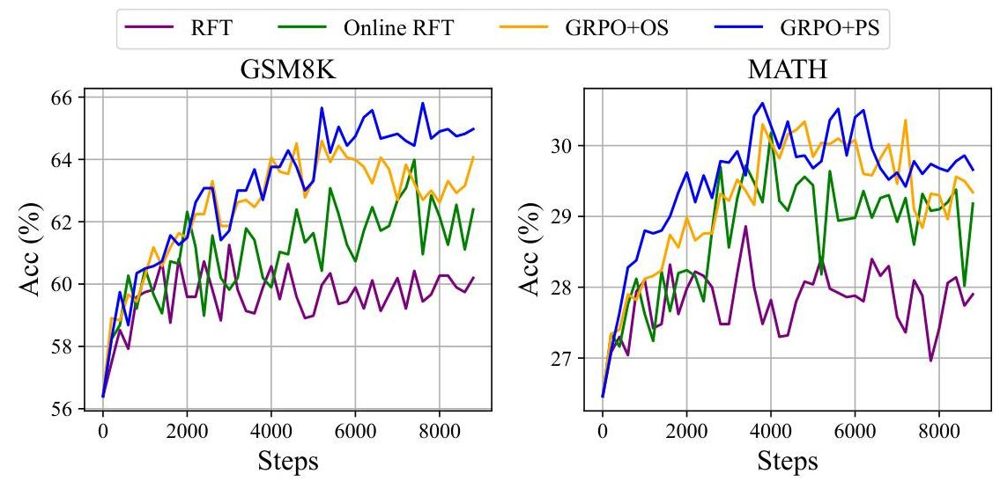

Figure 5 | Performance of the DeepSeekMath-Instruct 1.3B model, which was further trained using various methods, on two benchmarks.

- Rejection Sampling Fine-tuning (RFT): RFT further fine-tunes the SFT model on the filtered outputs sampled from the SFT model based on SFT questions. RFT filters the outputs based on the correctness of their answers.
- Direct Preference Optimization (DPO): DPO further refines the SFT model by fine-tuning it on augmented outputs sampled from the SFT model, using pair-wise DPO loss.
- Online Rejection Sampling Fine-tuning (Online RFT): Different from RFT, Online RFT initiates the policy model using the SFT model and refines it by fine-tuning with the augmented outputs sampled from the real-time policy model.
- PPO/GRPO: PPO/GRPO initializes the policy model using the SFT model and reinforces it with the outputs sampled from the real-time policy model.

We summarize the components of these methods in Table 10. Please refer to Appendix A. 1 for a more detailed derivation process.

Observation about Data Source We divide the data source into two categories, online sampling, and offline sampling. Online sampling denotes that the training data is from the exploration results of the real-time training policy model, while offline sampling denotes that the

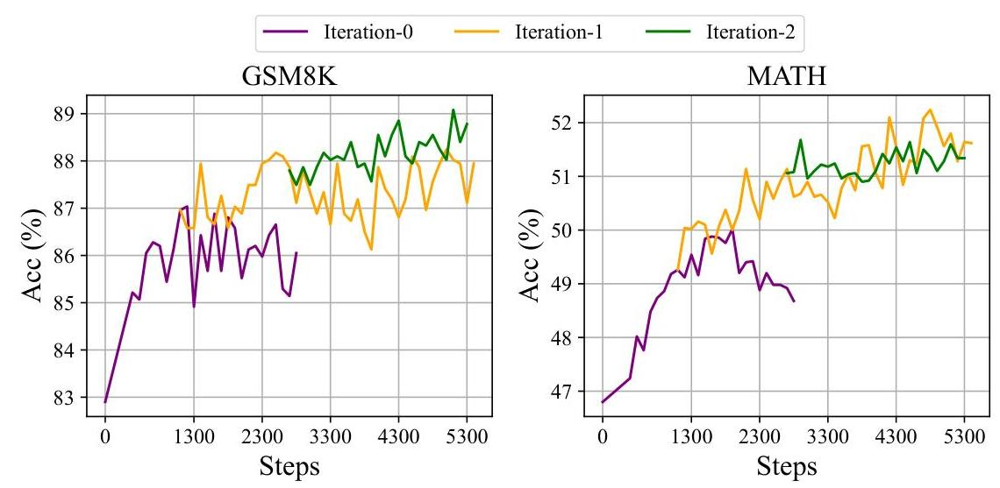

Figure 6 | Performance of iterative reinforcement learning with DeepSeekMath-Instruct 7B on two benchmarks.
training data is from the sampling results of the initial SFT model. RFT and DPO follow the offline style, while Online RFT and GRPO follow the online style.

As shown in Figure 5, we find that the Online RFT significantly outperforms RFT on two benchmarks. Specifically, Online RFT is comparable to RFT in the early stage of training but gains an absolute advantage in the later stage, demonstrating the superiority of online training. This is intuitive, as in the initial stage, the actor and the SFT model exhibit close resemblance, with the sampled data revealing only minor differences. In the later stage, however, the data sampled from the actor will exhibit more significant differences, and real-time data sampling will offer greater advantages.

Observation about Gradient Coefficient The algorithm processes the reward signal to the gradient coefficient to update the model parameter. We divide the reward function as 'Rule' and 'Model' in our experiments. Rule refers to judging the quality of a response based on the correctness of the answer, and Model denotes that we train a reward model to score each response. The training data of the reward model is based on the rule judgment. Equations 10 and 21 highlight a key difference between GRPO and Online RFT: GRPO uniquely adjusts its gradient coefficient based on the reward value provided by the reward model. This allows for differential reinforcement and penalization of responses according to their varying magnitudes. In contrast, Online RFT lacks this feature; it does not penalize incorrect responses and uniformly reinforces all responses with correct answers at the same level of intensity.

As demonstrated in Figure 5, GRPO surpasses online RFT, thereby highlighting the efficiency of altering positive and negative gradient coefficients. In addition, GRPO+PS shows superior performance compared to GRPO+OS, indicating the benefits of using fine-grained, step-aware gradient coefficients. Furthermore, we explore the iterative RL, in our experiments, we conduct two rounds of iteration. As shown in Figure 6, we notice that the iterative RL significantly improves the performance, especially at the first iteration.

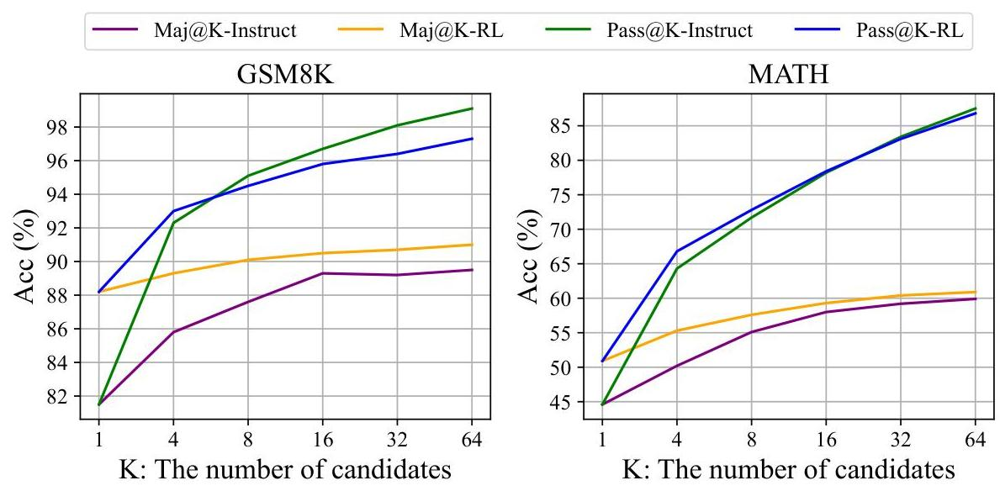

Figure 7 | The Maj@K and Pass@K of SFT and RL DeepSeekMath 7B on GSM8K and MATH (temperature 0.7). It was noted that RL enhances Maj@K but not Pass@K.

# 5.2.2. Why RL Works? 

In this paper, we conduct reinforcement learning based on a subset of instruction tuning data, and it achieves significant performance enhancement upon the instruction tuning model. To further explain why reinforcement learning works. We evaluate the Pass@K and Maj@K accuracy of the Instruct and RL models on two benchmarks. As shown in Figure 7, RL enhances Maj@K's performance but not Pass@K. These findings indicate that RL enhances the model's overall performance by rendering the output distribution more robust, in other words, it seems that the improvement is attributed to boosting the correct response from TopK rather than the enhancement of fundamental capabilities. Similarly, (Wang et al., 2023a) identified a misalignment problem in reasoning tasks within the SFT model, showing that the reasoning performance of SFT models can be improved through a series of preference alignment strategies (Song et al., 2023; Wang et al., 2023a; Yuan et al., 2023b).

### 5.2.3. How to Achieve More Effective RL?

We demonstrate RL works pretty well in mathematical reasoning tasks. We also provide a unified paradigm to understand different representative training methods. Within this paradigm, all methods are conceptualized as either direct or simplified RL techniques. As summarized in Equation 5, there exist three key components: Data Source, Algorithm, and Reward Function. We provide some potential future directions about the three components.

Data Source Data source is the raw material of all training methods. In the context of RL, we specifically refer to the data source as the unlabeled questions with the outputs sampled from the policy model. In this paper, we only use the questions from the instruction tuning stage and a naive nucleus sampling to sample outputs. We think this is a potential reason that our RL pipeline only improves the Maj@K performance. In the future, we will explore our RL pipeline on out-of-distribution question prompts, in conjunction with advanced sampling (decoding) strategies, like those based on tree-search methods (Yao et al., 2023). Also, the efficient inference techniques (Kwon et al., 2023; Leviathan et al., 2023; Xia et al., 2023, 2024), which determines

the exploration efficiency of policy models, also play an exceedingly important role.

Algorithms Algorithms process the data and reward signal to the gradient coefficient to update the model parameter. Based on Equation 5, to some extent, all methods now fully TRUST the signal of the reward function to increase or decrease the conditional probability of a certain token. However, it is impossible to ensure the reward signal is always reliable, especially in extremely complex tasks. For example, even the PRM800K datasets (Lightman et al., 2023), which have been carefully annotated by well-trained annotators, still contain approximately $20 \%$ of incorrectly annotations ${ }^{7}$. To this end, we will explore the reinforcement learning algorithm that is robust against noisy reward signals. We believe such WEAK-TO-STRONG (Burns et al., 2023) alignment methods will bring a fundamental change to the learning algorithms.

Reward Function Reward function is the source of the training signal. In RL, the reward function is usually the neural reward model. We think there exist three important directions for reward models: 1) How to enhance the generalization ability of the reward model. The reward model must be effectively generalized to handle out-of-distribution questions and advanced decoding outputs; otherwise, reinforcement learning may merely stabilize the distribution of LLMs rather than improve their fundamental capabilities; 2) How to reflect the uncertainty of reward model. The uncertainty could potentially act as a linking bridge between the weak reward model and the weak-to-strong learning algorithms; 3) How to efficiently build highquality process reward models that can provide fine-grained training signals for the reasoning process (Lightman et al., 2023; Wang et al., 2023b).

# 6. Conclusion, Limitation, and Future Work 

We present DeepSeekMath, which outperforms all open-source models on the competitionlevel MATH benchmark and approaches the performance of closed models. DeepSeekMath is initialized with DeepSeek-Coder-v1.5 7B and undergoes continual training for 500B tokens, with a significant component of the training data being 120B math tokens sourced from Common Crawl. Our extensive ablation study shows web pages offer significant potential for high-quality mathematical data, while arXiv may not as beneficial as we expected. We introduce Group Relative Policy Optimization (GRPO), a variant of Proximal Policy Optimization (PPO), which can notably improve mathematical reasoning capabilities with less memory consumption. The experiment results show that GRPO is effective even if DeepSeekMath-Instruct 7B has reached a high score on benchmarks. We also provide a unified paradigm to understand a series of methods and summarize several potential directions for more effective reinforcement learning.

Although DeepSeekMath achieves impressive scores on quantitative reasoning benchmarks, its capability on geometry and theorem-proof are relatively weaker than closed models. For instance, in our dry run, the model cannot handle problems related to triangles and ellipses, which may indicate data selection bias in pre-training and fine-tuning. In addition, restricted by the model scale, DeepSeekMath is worse than GPT-4 on few-shot capability. GPT-4 could improve its performance with few-shot inputs, while DeepSeekMath shows similar performance in zero-shot and few-shot evaluation. In the future, we will further improve our engineered data selection pipeline to construct more high-quality pre-trained corpus. In addition, we will explore the potential directions (Section 5.2.3) for more effective reinforcement learning of LLMs.

[^0]
[^0]:    ${ }^{7}$ https://github.com/openai/prm800k/issues/12\#issuecomment-1728491852

# References 

R. Anil, S. Borgeaud, Y. Wu, J. Alayrac, J. Yu, R. Soricut, J. Schalkwyk, A. M. Dai, A. Hauth, K. Millican, D. Silver, S. Petrov, M. Johnson, I. Antonoglou, J. Schrittwieser, A. Glaese, J. Chen, E. Pitler, T. P. Lillicrap, A. Lazaridou, O. Firat, J. Molloy, M. Isard, P. R. Barham, T. Hennigan, B. Lee, F. Viola, M. Reynolds, Y. Xu, R. Doherty, E. Collins, C. Meyer, E. Rutherford, E. Moreira, K. Ayoub, M. Goel, G. Tucker, E. Piqueras, M. Krikun, I. Barr, N. Savinov, I. Danihelka, B. Roelofs, A. White, A. Andreassen, T. von Glehn, L. Yagati, M. Kazemi, L. Gonzalez, M. Khalman, J. Sygnowski, and et al. Gemini: A family of highly capable multimodal models. CoRR, abs/2312.11805, 2023. doi: 10.48550/ARXIV.2312.11805. URL https: //doi.org/10.48550/arXiv.2312.11805.
J. Austin, A. Odena, M. Nye, M. Bosma, H. Michalewski, D. Dohan, E. Jiang, C. Cai, M. Terry, Q. Le, et al. Program synthesis with large language models. arXiv preprint arXiv:2108.07732, 2021.
Z. Azerbayev, H. Schoelkopf, K. Paster, M. D. Santos, S. McAleer, A. Q. Jiang, J. Deng, S. Biderman, and S. Welleck. Llemma: An open language model for mathematics. arXiv preprint arXiv:2310.10631, 2023.
J. Bai, S. Bai, Y. Chu, Z. Cui, K. Dang, X. Deng, Y. Fan, W. Ge, Y. Han, F. Huang, et al. Qwen technical report. arXiv preprint arXiv:2309.16609, 2023.
C. Burns, P. Izmailov, J. H. Kirchner, B. Baker, L. Gao, L. Aschenbrenner, Y. Chen, A. Ecoffet, M. Joglekar, J. Leike, et al. Weak-to-strong generalization: Eliciting strong capabilities with weak supervision. arXiv preprint arXiv:2312.09390, 2023.

ChatGLM3 Team. Chatglm3 series: Open bilingual chat llms, 2023. URL https://github.c om/THUDM/ChatGLM3.
M. Chen, J. Tworek, H. Jun, Q. Yuan, H. P. de Oliveira Pinto, J. Kaplan, H. Edwards, Y. Burda, N. Joseph, G. Brockman, A. Ray, R. Puri, G. Krueger, M. Petrov, H. Khlaaf, G. Sastry, P. Mishkin, B. Chan, S. Gray, N. Ryder, M. Pavlov, A. Power, L. Kaiser, M. Bavarian, C. Winter, P. Tillet, F. P. Such, D. Cummings, M. Plappert, F. Chantzis, E. Barnes, A. Herbert-Voss, W. H. Guss, A. Nichol, A. Paino, N. Tezak, J. Tang, I. Babuschkin, S. Balaji, S. Jain, W. Saunders, C. Hesse, A. N. Carr, J. Leike, J. Achiam, V. Misra, E. Morikawa, A. Radford, M. Knight, M. Brundage, M. Murati, K. Mayer, P. Welinder, B. McGrew, D. Amodei, S. McCandlish, I. Sutskever, and W. Zaremba. Evaluating large language models trained on code. CoRR, abs/2107.03374, 2021. URL https://arxiv.org/abs/2107.03374.
W. Chen, X. Ma, X. Wang, and W. W. Cohen. Program of thoughts prompting: Disentangling computation from reasoning for numerical reasoning tasks. CoRR, abs/2211.12588, 2022. doi: 10.48550/ARXIV.2211.12588. URL https://doi.org/10.48550/arXiv.2211.12588.
K. Cobbe, V. Kosaraju, M. Bavarian, M. Chen, H. Jun, L. Kaiser, M. Plappert, J. Tworek, J. Hilton, R. Nakano, et al. Training verifiers to solve math word problems. arXiv preprint arXiv:2110.14168, 2021.
T. Computer. Redpajama: an open dataset for training large language models, Oct. 2023. URL https://github.com/togethercomputer/RedPajama-Data.

DeepSeek-AI. Deepseek LLM: scaling open-source language models with longtermism. CoRR, abs/2401.02954, 2024. doi: 10.48550/ARXIV.2401.02954. URL https://doi.org/10.485 50/arXiv. 2401.02954.

Z. Du, Y. Qian, X. Liu, M. Ding, J. Qiu, Z. Yang, and J. Tang. Glm: General language model pretraining with autoregressive blank infilling. In Proceedings of the 60th Annual Meeting of the Association for Computational Linguistics (Volume 1: Long Papers), pages 320-335, 2022.
L. Gao, A. Madaan, S. Zhou, U. Alon, P. Liu, Y. Yang, J. Callan, and G. Neubig. PAL: programaided language models. In A. Krause, E. Brunskill, K. Cho, B. Engelhardt, S. Sabato, and J. Scarlett, editors, International Conference on Machine Learning, ICML 2023, 23-29 July 2023, Honolulu, Hawaii, USA, volume 202 of Proceedings of Machine Learning Research, pages 10764-10799. PMLR, 2023. URL https://proceedings.mlr.press/v202/gao23f. html.
Z. Gou, Z. Shao, Y. Gong, Y. Shen, Y. Yang, M. Huang, N. Duan, and W. Chen. Tora: A toolintegrated reasoning agent for mathematical problem solving. CoRR, abs/2309.17452, 2023. doi: 10.48550/ARXIV.2309.17452. URL https://doi.org/10.48550/arXiv.2309.1745 2 .
D. Guo, Q. Zhu, D. Yang, Z. Xie, K. Dong, W. Zhang, G. Chen, X. Bi, Y. Wu, Y. K. Li, F. Luo, Y. Xiong, and W. Liang. Deepseek-coder: When the large language model meets programming - the rise of code intelligence, 2024.
D. Hendrycks, C. Burns, S. Basart, A. Zou, M. Mazeika, D. Song, and J. Steinhardt. Measuring massive multitask language understanding. arXiv preprint arXiv:2009.03300, 2020.
D. Hendrycks, C. Burns, S. Kadavath, A. Arora, S. Basart, E. Tang, D. Song, and J. Steinhardt. Measuring mathematical problem solving with the math dataset. arXiv preprint arXiv:2103.03874, 2021.

High-flyer. Hai-llm: 高效且轻量的大模型训练工具, 2023. URL https://www.high-flyer.c n/en/blog/hai-1lm.

Inflection AI. Inflection-2, 2023. URL https://inflection.ai/inflection-2.
A. Q. Jiang, S. Welleck, J. P. Zhou, W. Li, J. Liu, M. Jamnik, T. Lacroix, Y. Wu, and G. Lample. Draft, sketch, and prove: Guiding formal theorem provers with informal proofs. arXiv preprint arXiv:2210.12283, 2022.
A. Q. Jiang, A. Sablayrolles, A. Mensch, C. Bamford, D. S. Chaplot, D. d. I. Casas, F. Bressand, G. Lengyel, G. Lample, L. Saulnier, et al. Mistral 7b. arXiv preprint arXiv:2310.06825, 2023.
A. Joulin, E. Grave, P. Bojanowski, M. Douze, H. Jégou, and T. Mikolov. Fasttext. zip: Compressing text classification models. arXiv preprint arXiv:1612.03651, 2016.
W. Kwon, Z. Li, S. Zhuang, Y. Sheng, L. Zheng, C. H. Yu, J. E. Gonzalez, H. Zhang, and I. Stoica. Efficient memory management for large language model serving with pagedattention. In Proceedings of the ACM SIGOPS 29th Symposium on Operating Systems Principles, 2023.
Y. Leviathan, M. Kalman, and Y. Matias. Fast inference from transformers via speculative decoding. In International Conference on Machine Learning, pages 19274-19286. PMLR, 2023.
A. Lewkowycz, A. Andreassen, D. Dohan, E. Dyer, H. Michalewski, V. Ramasesh, A. Slone, C. Anil, I. Schlag, T. Gutman-Solo, et al. Solving quantitative reasoning problems with language models. Advances in Neural Information Processing Systems, 35:3843-3857, 2022a.

A. Lewkowycz, A. Andreassen, D. Dohan, E. Dyer, H. Michalewski, V. V. Ramasesh, A. Slone, C. Anil, I. Schlag, T. Gutman-Solo, Y. Wu, B. Neyshabur, G. Gur-Ari, and V. Misra. Solving quantitative reasoning problems with language models. In S. Koyejo, S. Mohamed, A. Agarwal, D. Belgrave, K. Cho, and A. Oh, editors, Advances in Neural Information Processing Systems 35: Annual Conference on Neural Information Processing Systems 2022, NeurIPS 2022, New Orleans, LA, USA, November 28 - December 9, 2022, 2022b. URL http://papers.nips. cc/paper_files/paper/2022/hash/18abbeef8cfe9203fdf9053c9c4fe191-Abstr act-Conference.html.
H. Lightman, V. Kosaraju, Y. Burda, H. Edwards, B. Baker, T. Lee, J. Leike, J. Schulman, I. Sutskever, and K. Cobbe. Let's verify step by step. arXiv preprint arXiv:2305.20050, 2023.
I. Loshchilov and F. Hutter. Decoupled weight decay regularization. arXiv preprint arXiv:1711.05101, 2017.
H. Luo, Q. Sun, C. Xu, P. Zhao, J. Lou, C. Tao, X. Geng, Q. Lin, S. Chen, and D. Zhang. Wizardmath: Empowering mathematical reasoning for large language models via reinforced evol-instruct. arXiv preprint arXiv:2308.09583, 2023.
S. Mishra, M. Finlayson, P. Lu, L. Tang, S. Welleck, C. Baral, T. Rajpurohit, O. Tafjord, A. Sabharwal, P. Clark, and A. Kalyan. LILA: A unified benchmark for mathematical reasoning. In Y. Goldberg, Z. Kozareva, and Y. Zhang, editors, Proceedings of the 2022 Conference on Empirical Methods in Natural Language Processing, EMNLP 2022, Abu Dhabi, United Arab Emirates, December 7-11, 2022, pages 5807-5832. Association for Computational Linguistics, 2022. doi: 10.18653/V1/2022.EMNLP-MAIN.392. URL https://doi.org/10.18653/v1/ 2022.emnlp-main.392.
X. Nguyen, W. Zhang, X. Li, M. M. Aljunied, Q. Tan, L. Cheng, G. Chen, Y. Deng, S. Yang, C. Liu, H. Zhang, and L. Bing. Seallms - large language models for southeast asia. CoRR, abs/2312.00738, 2023. doi: 10.48550/ARXIV.2312.00738. URL https://doi.org/10.485 50/arXiv. 2312.00738.

OpenAI. GPT4 technical report. arXiv preprint arXiv:2303.08774, 2023.
L. Ouyang, J. Wu, X. Jiang, D. Almeida, C. Wainwright, P. Mishkin, C. Zhang, S. Agarwal, K. Slama, A. Ray, et al. Training language models to follow instructions with human feedback. Advances in Neural Information Processing Systems, 35:27730-27744, 2022.
K. Paster, M. D. Santos, Z. Azerbayev, and J. Ba. Openwebmath: An open dataset of high-quality mathematical web text. CoRR, abs/2310.06786, 2023. doi: 10.48550/ARXIV.2310.06786. URL https://doi.org/10.48550/arXiv.2310.06786.
L. C. Paulson. Three years of experience with sledgehammer, a practical link between automatic and interactive theorem provers. In R. A. Schmidt, S. Schulz, and B. Konev, editors, Proceedings of the 2nd Workshop on Practical Aspects of Automated Reasoning, PAAR-2010, Edinburgh, Scotland, UK, July 14, 2010, volume 9 of EPiC Series in Computing, pages 1-10. EasyChair, 2010. doi: 10.29007/TNFD. URL https://doi.org/10.29007/tnfd.
S. Polu and I. Sutskever. Generative language modeling for automated theorem proving. CoRR, abs/2009.03393, 2020. URL https://arxiv.org/abs/2009.03393.
R. Rafailov, A. Sharma, E. Mitchell, S. Ermon, C. D. Manning, and C. Finn. Direct preference optimization: Your language model is secretly a reward model. 2023.

J. Schulman. Approximating kl divergence, 2020. URL http://joschu.net/blog/kl-app rox.html.
J. Schulman, P. Moritz, S. Levine, M. Jordan, and P. Abbeel. High-dimensional continuous control using generalized advantage estimation. arXiv preprint arXiv:1506.02438, 2015.
J. Schulman, F. Wolski, P. Dhariwal, A. Radford, and O. Klimov. Proximal policy optimization algorithms. arXiv preprint arXiv:1707.06347, 2017.
F. Shi, M. Suzgun, M. Freitag, X. Wang, S. Srivats, S. Vosoughi, H. W. Chung, Y. Tay, S. Ruder, D. Zhou, D. Das, and J. Wei. Language models are multilingual chain-of-thought reasoners. In The Eleventh International Conference on Learning Representations, ICLR 2023, Kigali, Rwanda, May 1-5, 2023. OpenReview.net, 2023. URL https://openreview.net/pdf?id= fR3wGCk-IXp.
F. Song, B. Yu, M. Li, H. Yu, F. Huang, Y. Li, and H. Wang. Preference ranking optimization for human alignment. arXiv preprint arXiv:2306.17492, 2023.
M. Suzgun, N. Scales, N. Schärli, S. Gehrmann, Y. Tay, H. W. Chung, A. Chowdhery, Q. V. Le, E. H. Chi, D. Zhou, et al. Challenging big-bench tasks and whether chain-of-thought can solve them. arXiv preprint arXiv:2210.09261, 2022.
T. Tao. Embracing change and resetting expectations, 2023. URL https://unlocked.micro soft.com/ai-anthology/terence-tao/.
H. Touvron, L. Martin, K. Stone, P. Albert, A. Almahairi, Y. Babaei, N. Bashlykov, S. Batra, P. Bhargava, S. Bhosale, D. Bikel, L. Blecher, C. Canton-Ferrer, M. Chen, G. Cucurull, D. Esiobu, J. Fernandes, J. Fu, W. Fu, B. Fuller, C. Gao, V. Goswami, N. Goyal, A. Hartshorn, S. Hosseini, R. Hou, H. Inan, M. Kardas, V. Kerkez, M. Khabsa, I. Kloumann, A. Korenev, P. S. Koura, M. Lachaux, T. Lavril, J. Lee, D. Liskovich, Y. Lu, Y. Mao, X. Martinet, T. Mihaylov, P. Mishra, I. Molybog, Y. Nie, A. Poulton, J. Reizenstein, R. Rungta, K. Saladi, A. Schelten, R. Silva, E. M. Smith, R. Subramanian, X. E. Tan, B. Tang, R. Taylor, A. Williams, J. X. Kuan, P. Xu, Z. Yan, I. Zarov, Y. Zhang, A. Fan, M. Kambadur, S. Narang, A. Rodriguez, R. Stojnic, S. Edunov, and T. Scialom. Llama 2: Open foundation and fine-tuned chat models. CoRR, abs/2307.09288, 2023. doi: 10.48550/arXiv.2307.09288. URL https://doi.org/10.48550/arXiv.2307. 09288 .
T. H. Trinh, Y. Wu, Q. V. Le, H. He, and T. Luong. Solving olympiad geometry without human demonstrations. Nature, 625(7995):476-482, 2024.
P. Wang, L. Li, L. Chen, F. Song, B. Lin, Y. Cao, T. Liu, and Z. Sui. Making large language models better reasoners with alignment. arXiv preprint arXiv:2309.02144, 2023a.
P. Wang, L. Li, Z. Shao, R. Xu, D. Dai, Y. Li, D. Chen, Y. Wu, and Z. Sui. Math-shepherd: Verify and reinforce llms step-by-step without human annotations. CoRR, abs/2312.08935, 2023b.
Z. Wang, R. Xia, and P. Liu. Generative AI for math: Part I - mathpile: A billion-token-scale pretraining corpus for math. CoRR, abs/2312.17120, 2023c. doi: 10.48550/ARXIV.2312.17120. URL https://doi.org/10.48550/arXiv.2312.17120.
J. Wei, X. Wang, D. Schuurmans, M. Bosma, B. Ichter, F. Xia, E. H. Chi, Q. V. Le, and D. Zhou. Chain-of-thought prompting elicits reasoning in large language models. In NeurIPS, 2022. URL http://papers.nips.cc/paper_files/paper/2022/hash/9d5609613524ecf 4f15af0f7b31abca4-Abstract-Conference.html.

T. Wei, J. Luan, W. Liu, S. Dong, and B. Wang. Cmath: Can your language model pass chinese elementary school math test?, 2023.
M. Wenzel, L. C. Paulson, and T. Nipkow. The isabelle framework. In O. A. Mohamed, C. A. Muñoz, and S. Tahar, editors, Theorem Proving in Higher Order Logics, 21st International Conference, TPHOLs 2008, Montreal, Canada, August 18-21, 2008. Proceedings, volume 5170 of Lecture Notes in Computer Science, pages 33-38. Springer, 2008. doi: 10.1007/978-3-540-7 1067-7 7. URL https://doi.org/10.1007/978-3-540-71067-7_7.
H. Xia, T. Ge, P. Wang, S.-Q. Chen, F. Wei, and Z. Sui. Speculative decoding: Exploiting speculative execution for accelerating seq2seq generation. In H. Bouamor, J. Pino, and K. Bali, editors, Findings of the Association for Computational Linguistics: EMNLP 2023, pages 39093925, Singapore, Dec. 2023. Association for Computational Linguistics. doi: 10.18653/v1/20 23.findings-emnlp.257. URL https://aclanthology.org/2023.findings-emnlp. 257.
H. Xia, Z. Yang, Q. Dong, P. Wang, Y. Li, T. Ge, T. Liu, W. Li, and Z. Sui. Unlocking efficiency in large language model inference: A comprehensive survey of speculative decoding. arXiv preprint arXiv:2401.07851, 2024.
S. Yao, D. Yu, J. Zhao, I. Shafran, T. L. Griffiths, Y. Cao, and K. Narasimhan. Tree of thoughts: Deliberate problem solving with large language models. arXiv preprint arXiv:2305.10601, 2023.
L. Yu, W. Jiang, H. Shi, J. Yu, Z. Liu, Y. Zhang, J. T. Kwok, Z. Li, A. Weller, and W. Liu. Metamath: Bootstrap your own mathematical questions for large language models. CoRR, abs/2309.12284, 2023. doi: 10.48550/ARXIV.2309.12284. URL https://doi.org/10.485 50/arXiv. 2309.12284.
Z. Yuan, H. Yuan, C. Li, G. Dong, C. Tan, and C. Zhou. Scaling relationship on learning mathematical reasoning with large language models. arXiv preprint arXiv:2308.01825, 2023a.
Z. Yuan, H. Yuan, C. Tan, W. Wang, S. Huang, and F. Huang. Rrhf: Rank responses to align language models with human feedback without tears. arXiv preprint arXiv:2304.05302, 2023b.
X. Yue, X. Qu, G. Zhang, Y. Fu, W. Huang, H. Sun, Y. Su, and W. Chen. Mammoth: Building math generalist models through hybrid instruction tuning. CoRR, abs/2309.05653, 2023. doi: 10.48550/ARXIV.2309.05653. URL https://doi.org/10.48550/arXiv.2309.05653.
K. Zheng, J. M. Han, and S. Polu. Minif2f: a cross-system benchmark for formal olympiad-level mathematics. arXiv preprint arXiv:2109.00110, 2021.
W. Zhong, R. Cui, Y. Guo, Y. Liang, S. Lu, Y. Wang, A. Saied, W. Chen, and N. Duan. AGIEval: A human-centric benchmark for evaluating foundation models. CoRR, abs/2304.06364, 2023. doi: 10.48550/arXiv.2304.06364. URL https://doi.org/10.48550/arXiv.2304.06364.

# A. Appendix 

## A.1. Analysis of Reinforcement Learning

We provide the detailed derivation of the data source and gradient coefficient (algorithm and reward function) across various methods, including SFT, RFT, Online RFT, DPO, PPO, and GRPO.

## A.1.1. Supervised Fine-tuning

The objective of Supervised Fine-tuning is maximizing the following objective:

$$
\mathcal{J}_{S F T}(\theta)=\mathbb{E}\left[q, o \sim P_{s f t}(Q, O)\right]\left(\frac{1}{|o|} \sum_{t=1}^{|o|}\left\lvert\, \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right.\right)
$$

The gradient of $\mathcal{J}_{S F T}(\theta)$ is:

$$
\nabla_{\theta} \mathcal{J}_{S F T}=\mathbb{E}\left[q, o \sim P_{s f t}(Q, O)\right]\left(\frac{1}{|o|} \sum_{t=1}^{|o|} \nabla_{\theta} \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right)
$$

Data Source: The dataset employed for SFT. Reward Function: This can be regarded as human selection. Gradient Coefficient: always set to 1.

## A.1.2. Rejection Sampling Fine-tuning

Rejection Sampling Fine-tuning first samples multiple outputs from the supervised fine-tuned LLMs for each question, and then trains LLMs on the sampled outputs with the correct answer. Formally, the objective of RFT is to maximize the following objectives:

$$
\mathcal{J}_{R F T}(\theta)=\mathbb{E}\left[q \sim P_{s f t}(Q), o \sim \pi_{s f t}(O \mid q)\right]\left(\frac{1}{|o|} \sum_{t=1}^{|o|} \mathbb{I}(o) \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right)
$$

The gradient of $\mathcal{J}_{R F T}(\theta)$ is:

$$
\nabla_{\theta} \mathcal{J}_{R F T}(\theta)=\mathbb{E}\left[q \sim P_{s f t}(Q), o \sim \pi_{s f t}(O \mid q)\right]\left(\frac{1}{|o|} \sum_{t=1}^{|o|} \mathbb{I}(o) \nabla_{\theta} \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right)
$$

Data Source: question in SFT dataset with outputs sampled from SFT model. Reward Function: Rule (whether the answer is correct or not). Gradient Coefficient:

$$
G C_{R F T}(q, o, t)=\mathbb{I}(o)= \begin{cases}1 & \text { the answer of } o \text { is correct } \\ 0 & \text { the answer of } o \text { is incorrect }\end{cases}
$$

## A.1.3. Online Rejection Sampling Fine-tuning

The only difference between RFT and Online RFT is that the outputs of Online RFT are sampled from the real-time policy model $\pi_{\theta}$, rather than from the SFT model $\pi_{\theta_{s f t}}$. Therefore, the gradient of online RFT is:

$$
\nabla_{\theta} \mathcal{J}_{O n R F T}(\theta)=\mathbb{E}\left[q \sim P_{s f t}(Q), o \sim \pi_{\theta}(O \mid q)\right]\left(\frac{1}{|o|} \sum_{t=1}^{|o|} \mathbb{I}(o) \nabla_{\theta} \log \pi_{\theta}\left(o_{t} \mid q, o_{<t}\right)\right)
$$

# A.1.4. Direct Preference Optimization (DPO) 

The objective of DPO is:

$$
\mathcal{J}_{D P O}(\theta)=\mathbb{E}\left[q \sim P_{x f t}(Q), o^{+}, o^{-} \sim \pi_{x f t}(O \mid q)\right] \log \sigma\left(\beta \frac{1}{\left|o^{+}\right|} \sum_{i=1}^{\left|o^{-}\right|} \log \frac{\pi_{\theta}\left(o_{t}^{*}\left|q, o_{<t}^{*}\right\rangle}{\pi_{\text {ref }}\left(o_{t}^{*}\left|q, o_{<t}^{*}\right\rangle\right.}-\beta \frac{1}{\left|o^{-}\right|} \sum_{i=1}^{\left|o^{-}\right|} \log \frac{\pi_{\theta}\left(o_{<t}^{*}\left|q, o_{<t}^{*}\right\rangle}{\pi_{\text {ref }}\left(o_{<t}^{*}\left|q, o_{<t}^{*}\right\rangle\right)}\right)
$$

The gradient of $\mathcal{J}_{D P O}(\theta)$ is:

$$
\begin{aligned}
\nabla_{\theta} \mathcal{J}_{D P O}(\theta)=\mathbb{E}\left[q \sim P_{x f t}(Q), o^{+}, o^{-} \sim \pi_{x f t}(O \mid q)\right] & \left(\frac{1}{\left|o^{+}\right|} \sum_{i=1}^{\left|o^{+}\right|} G C_{D P O}(q, o, t) \nabla_{\theta} \log \pi_{\theta}\left(o_{t}^{*}\left|q, o_{<t}^{*}\right\rangle\right.\right. \\
& \left.\sim \frac{1}{\left|o^{-}\right|} \sum_{t=1}^{\left|o^{-}\right|} G C_{D P O}(q, o, t) \nabla_{\theta} \log \pi_{\theta}\left(o_{t}^{-}\left|q, o_{<t}^{-}\right\rangle\right)\right)
\end{aligned}
$$

Data Source: question in SFT dataset with outputs sampled from SFT model. Reward Function: human preference in the general domain (can be 'Rule' in mathematical tasks). Gradient Coefficient:

$$
G C_{D P O}(q, o, t)=\sigma\left(\beta \log \frac{\pi_{\theta}\left(o_{t}^{-}\left|q, o_{<t}^{-}\right\rangle\right.}{\pi_{\text {ref }}\left(o_{t}^{-}\left|q, o_{<t}^{-}\right\rangle\right.}-\beta \log \frac{\pi_{\theta}\left(o_{t}^{*}\left|q, o_{<t}^{*}\right\rangle}{\pi_{\text {ref }}\left(o_{t}^{*}\left|q, o_{<t}^{*}\right\rangle\right)}\right)
$$

## A.1.5. Proximal Policy Optimization (PPO)

The objective of PPO is:

$$
\mathcal{J}_{P P O}(\theta)=\mathbb{E}\left[q \sim P_{x f t}(Q), o \sim \pi_{\theta_{A l d}}(O \mid q)\right] \frac{1}{\left|o\right|} \sum_{i=1}^{\left|o\right|} \min \left[\frac{\pi_{\theta}\left(o_{t}\left|q, o_{<t}\right\rangle\right)}{\pi_{\theta_{A l d}}\left(o_{t}\left|q, o_{<t}\right\rangle\right)} A_{t}, \operatorname{clip}\left(\frac{\pi_{\theta}\left(o_{t}\left|q, o_{<t}\right\rangle\right)}{\pi_{\theta_{A l d}}\left(o_{t}\left|q, o_{<t}\right\rangle\right)}, 1-\varepsilon, 1+\varepsilon\right) A_{t}\right]
$$

To simplify the analysis, it is assumed that the model only has a single update following each exploration stage, thereby ensuring that $\pi_{\theta_{A l d}}=\pi_{\theta}$. In this case, we can remove the min and clip operation:

$$
\mathcal{J}_{P P O}(\theta)=\mathbb{E}\left[q \sim P_{x f t}(Q), o \sim \pi_{\theta_{A l d}}(O \mid q)\right] \frac{1}{\left|o\right|} \sum_{i=1}^{\left|o\right|} \frac{\pi_{\theta}\left(o_{t}\left|q, o_{<t}\right\rangle\right)}{\pi_{\theta_{A l d}}\left(o_{t}\left|q, o_{<t}\right\rangle\right)} A_{t}
$$

The gradient of $\mathcal{J}_{P P O}(\theta)$ is:

$$
\nabla_{\theta} \mathcal{J}_{P P O}(\theta)=\mathbb{E}\left[q \sim P_{x f t}(Q), o \sim \pi_{\theta_{A l d}}(O \mid q)\right] \frac{1}{\left|o\right|} \sum_{i=1}^{\left|o\right|} A_{t} \nabla_{\theta} \log \pi_{\theta}\left(o_{t}\left|q, o_{<t}\right\rangle\right.
$$

Data Source: question in SFT dataset with outputs sampled from policy model. Reward Function: reward model. Gradient Coefficient:

$$
G C_{P P O}\left(q, o, t, \pi_{\theta_{r m}}\right)=A_{t}
$$

where $A_{t}$ is the advantage, which is computed by applying Generalized Advantage Estimation (GAE) (Schulman et al., 2015), based on the rewards $\left\{r_{\geq t}\right\}$ and a learned value function $V_{\psi}$.

## A.1.6. Group Relative Policy Optimization (GRPO)

The objective of GRPO is (assume $\pi_{\theta_{A l d}}=\pi_{\theta}$ for simplified analysis):

$$
\begin{aligned}
\mathcal{J}_{G R P O}(\theta) & =\mathbb{E}\left[q \sim P_{x f t}(Q),\left\{o_{i}\right\}_{i=1}^{G} \sim \pi_{\theta_{A l d}}(O \mid q)\right] \\
\frac{1}{G} & \sum_{i=1}^{G} \frac{1}{\left|o_{i}\right|} \sum_{i=1}^{\left|o_{i}\right|} \frac{\pi_{\theta}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right)}{\pi_{\theta_{A l d}}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right)} \hat{A}_{i, t}-\beta\left(\frac{\pi_{r e f}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right)}{\pi_{\theta}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right.}-\log \frac{\pi_{r e f}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right)}{\pi_{\theta}\left(o_{i, t}\left|q, o_{i,<t}\right\rangle\right.}-1)\right]
\end{aligned}
$$

The gradient of $\mathcal{F}_{G R P O}(\theta)$ is:

$$
\begin{aligned}
\nabla_{\theta} \mathcal{F}_{G R P O}(\theta) & =\mathbb{E}\left[q \sim P_{c f t}(Q),\left\{o_{i}\right\}_{i=1}^{G} \sim \pi_{\theta_{c o t}}(O \mid q)\right] \\
& \frac{1}{G} \sum_{i=1}^{G} \frac{1}{\left|o_{i}\right|} \sum_{t=1}^{\left|o_{i}\right|}\left[\hat{A}_{i, t}+\beta\left(\frac{\pi_{r e f}\left(o_{i, t} \mid o_{i, c t}\right)}{\pi_{\theta}\left(o_{i, t} \mid o_{i, c t}\right)}-1\right)\right] \nabla_{\theta} \log \pi_{\theta}\left(o_{i, t} \mid q, o_{i, c t}\right)
\end{aligned}
$$

Data Source: question in SFT dataset with outputs sampled from policy model. Reward Function: reward model. Gradient Coefficient:

$$
G C_{G R P O}\left(q, o, t, \pi_{\theta_{c o t}}\right)=\hat{A}_{i, t}+\beta\left(\frac{\pi_{r e f}\left(o_{i, t} \mid o_{i, c t}\right)}{\pi_{\theta}\left(o_{i, t} \mid o_{i, c t}\right)}-1\right)
$$

where $\hat{A}_{i, t}$ is computed based on the group reward scores.

In [ ]:
from mistralai.models import OCRResponse
from IPython.display import Markdown, display

def replace_images_in_markdown(markdown_str: str, images_dict: dict) -> str:
    for img_name, base64_str in images_dict.items():
        markdown_str = markdown_str.replace(f"![{img_name}]({img_name})", f"![{img_name}]({base64_str})")
    return markdown_str

def get_combined_markdown(ocr_response: OCRResponse) -> str:
  markdowns: list[str] = []
  for page in pdf_response.pages:
    image_data = {}
    for img in page.images:
      image_data[img.id] = img.image_base64
    markdowns.append(replace_images_in_markdown(page.markdown, image_data))

  return "\n\n".join(markdowns)

display(Markdown(get_combined_markdown(pdf_response)))

## Financial Paper

In [47]:
from pathlib import Path

pdf_file = Path("/content/Annual Financial Statement.pdf")
assert pdf_file.is_file()

{
    "pages": [
        {
            "index": 0,
            "markdown": "# (1) \n\nComhshaol, Pobal agus Rialtas \u00c1lti\u00fcil\nEnvironment, Community and Local Government\n\n## ANNUAL FINANCIAL STATEMENT\n\n## For the year ended 31st December 2013",
            "images": [],
            "dimensions": {
                "dpi": 200,
                "height": 2339,
                "width": 1654
            }
        },
        {
            "index": 1,
            "markdown": "# CONTENTS \n\n## Page\n\nStatement of Accounting Policies ..... 6\nFinancial Accounts ..... 10\nIncome \\& Expenditure Account ..... 11\nBalance Sheet ..... 12\nNotes on and forming part of the Accounts ..... $13-20$\nAppendices ..... 21\n1 Analysis of Expenditure ..... 22\n2 Expenditure and Income by Division ..... 23\n3 Analysis of Income from Grants and Subsidies ..... 27\n4 Analysis of Income from Goods and Services ..... 28\n5 Summary of Capital Expenditure and Income ..... 29\n6 Capital Expenditure and
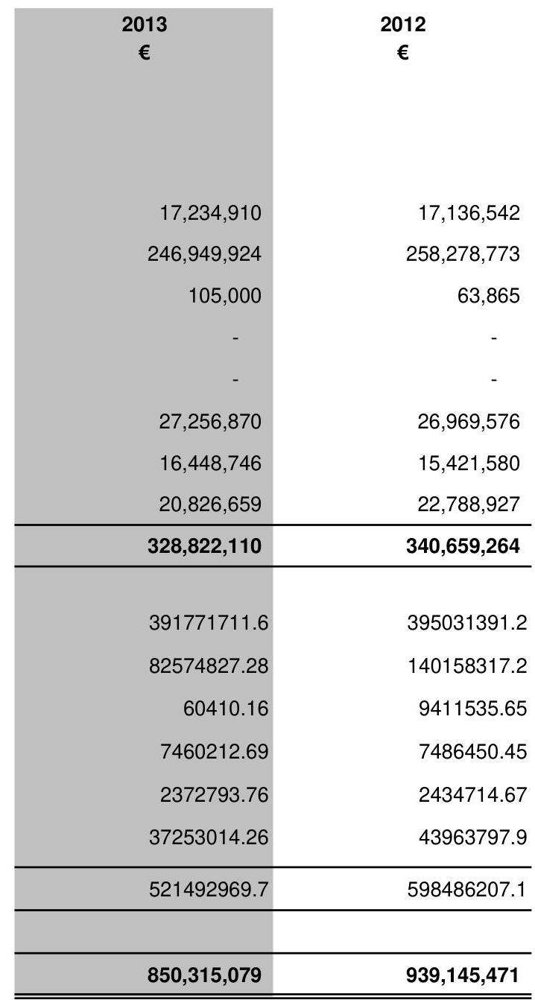
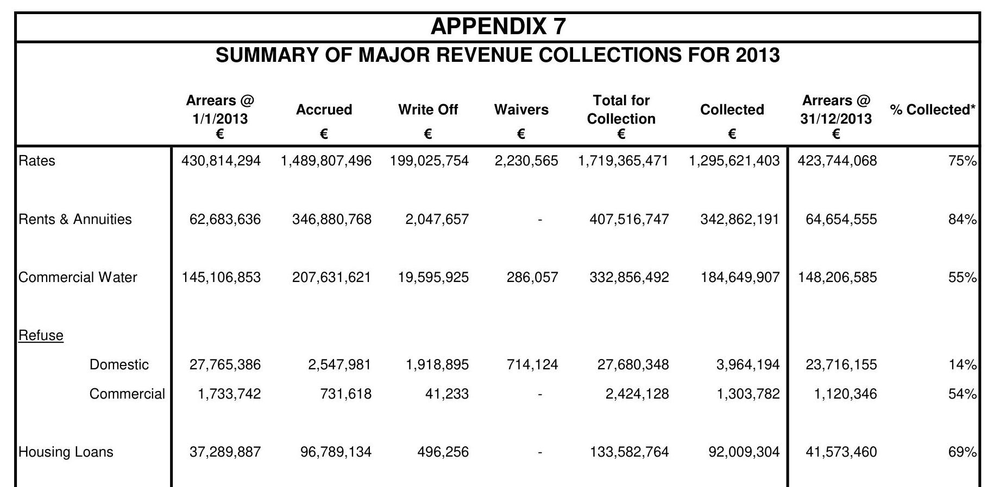

<ipython-input-48-60fb75838aca>:18: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(pdf_response.json())


In [48]:
from mistralai import DocumentURLChunk, ImageURLChunk, TextChunk
import json

uploaded_file = client.files.upload(
    file={
        "file_name": pdf_file.stem,
        "content": pdf_file.read_bytes(),
    },
    purpose="ocr",
)

signed_url = client.files.get_signed_url(file_id=uploaded_file.id, expiry=1)

pdf_response = client.ocr.process(document=DocumentURLChunk(document_url=signed_url.url),
                                  model="mistral-ocr-latest",
                                  include_image_base64=True)

response_dict = json.loads(pdf_response.json())
json_string = json.dumps(response_dict, indent=4)

print(json_string)

# (1) 

Comhshaol, Pobal agus Rialtas Áltiüil
Environment, Community and Local Government

## ANNUAL FINANCIAL STATEMENT

## For the year ended 31st December 2013

# CONTENTS 

## Page

Statement of Accounting Policies ..... 6
Financial Accounts ..... 10
Income \& Expenditure Account ..... 11
Balance Sheet ..... 12
Notes on and forming part of the Accounts ..... $13-20$
Appendices ..... 21
1 Analysis of Expenditure ..... 22
2 Expenditure and Income by Division ..... 23
3 Analysis of Income from Grants and Subsidies ..... 27
4 Analysis of Income from Goods and Services ..... 28
5 Summary of Capital Expenditure and Income ..... 29
6 Capital Expenditure and Income by Division ..... 30
7 Major Revenue Collections ..... 31
8 Interest of Local Authorities in Companies ..... 32

# Introduction 

This publication, which was formerly entitled "Returns of Local Taxation", contains the consolidated Annual Financial Statements (AFS) for all local authorities.

Each local authority is required to prepare an Annual Financial Statement by the end of March following the year end and to publish it by the end of June. These financial statements undergo an independent audit by the Local Government Audit Service of the Department of the Environment, Community and Local Government.

The local authorities dealt with and consolidated in this publication are Cou Councils, City Councils, Borough Councils, rating Town Councils, non-rating Town Councils and other miscellaneous local government related bodies.

Note: All figures in this publication are in Euro. Due to the effects of rounding, small differences may arise in some overall totals.

# Introduction 

This publication contains financial data which has been compiled by the Department of the Environment, Community and Local Government from the Audited Financial Statements published by each local authority for 2013.

Total gross expenditure in 2013 was $€ 4.5 \mathrm{Bn}$, gross income was $€ 2.4 \mathrm{Bn}$ and net expenditure $€ 2.105 \mathrm{Bn}$.

## Local Government Reform / Modernisation

Significant progress was achieved during 2013 in implementing the Government's local government reform programme announced in the Action Programme for Effective Local Government: Putting People First, in October 2012. In particular, the Local Government Bill 2013, providing for the reform of local government structures, functions, governance and related matters, was published in October 2013 and had progressed to an advanced stage through the Oireachtas by year end.

Work on the merger of local authorities in Limerick and Tipperary, overseen by the Department, continued in 2013 in accordance with Implementation Plans completed in June and December 2012. An implementation group to direct preparatory work and initial implementation of the reorganisation process in Waterford reported in June 2013. An Interim Dual Manager was appointed in both Tipperary and Waterford in November and December 2013, respectively, to lead the merger process in those areas in addition to the Dual Manager already in place in Limerick.

The Department engaged closely with local authorities and the local authority representative associations, the Association of County and City Councils and the Association of Municipal Authorities in Ireland, during 2013 regarding implementation arrangements, including the drafting of legislation, for local government reorganisation.

The independently chaired Implementation Group, which includes private sector expertise, established to drive and oversee the implementation of the recommendations of the Report of the Local Government Efficiency Review Group (LGER) submitted its second Progress Report to the Minister. This was published in July 2013. The County and City Managers' Association (CCMA), in its input to the Report, confirmed total savings of $€ 839 \mathrm{~m}$ since the beginning of the economic downturn in 2008. In the period since the preparation of the LGER Report (2010 to end 2012), the savings achieved and projected were reported at $€ 561 \mathrm{~m}$. This included $€ 229 \mathrm{~m}$ (already more than half the $€ 346 \mathrm{~m}$ identified as potential direct efficiency savings in the LGER Report) attributed to efficiency measures (as opposed to reduction in activity) in the years 2010 to the end of 2012. The majority of the efficiency savings identified related to staffing reductions and procurement. The Group and the CCMA prioritised the implementation of key recommendations relating to procurement, ICT, human resources/staffing and shared services as areas with potential to yield the optimum level of savings in regard to the implementation of the efficiency agenda within the sector.

An independently chaired group was tasked to carry out a review of the staffing complement and number of senior managers in Cork City Council. Their report and recommendations, together with the Cork City Council Workforce Plan 2010 - 2014 were submitted to the Minister and published in April 2013.

# Staffing 

There was approximately 27,501 staff (whole-time equivalent) working in the local authority system at the end of 2013, comprising management, administrative, technical, craft and general operative grades, including personnel dealing with specific services such as libraries and fire. The Manager is responsible for all staffing and organizational arrangements. While staff structures and numbers may vary according to the size of the county or city council, Directors of Service and Heads of Finance are the next tiers of senior management after the Manager in most authorities.

## Local Authority Superannuation

A voluntary redundancy scheme for local authority employees was introduced in July 2013. The aim of the Scheme is to achieve a permanent reduction in the workforce of local authorities from 2013 onwards in line with the recommendations of the workforce study and the Action Programme for Effective Local Government: Putting People First. Approximately 620 applications were approved by local authorities, with 390 staff departing in 2013 and a further 230 due to leave in 2014.

## Local Government Finance

The Local Government Fund was established by the Local Government Act 1998 with effect from 1 January 1999. The proceeds of motor tax (net of refunds) and the household charge collected to 30 June 2013 were paid into the Fund and any bank interest earned thereon.

In 2013 the Fund provided local authorities with some $€ 1.05 \mathrm{bn}$ in funding for day-today activities, regional and local roads and other initiatives. The Fund has put local authority financing on a sound footing and has supported the provision of better quality services locally. In 2013, the GeneralPurpose Grant provided to local authorities from the Fund was $€ 640.1 \mathrm{~m}$.

In 2013 the Fund also made a contribution of $€ 100 \mathrm{~m}$ to the exchequer.

## Motor Tax

At the end of 2013, there were 2.48 m vehicles on Irish roads, a $3.3 \%$ increase from 2.4 m at the end of 2012. Motor tax revenue increased by $7.8 \%$ in 2013 to $€ 1.1 \mathrm{bn}$. The increase was due to a combination of the motor tax increases announced in Budget 2013 and the closing off of a loophole in the procedures for declaring a vehicle off the road. Of the 2013 revenue, a sum of $€ 100 \mathrm{~m}$ was transferred to the Exchequer from the Local Government Fund as a measure towards reduction of the national deficit.

CO2 emissions became the basis for motor tax for private vehicles registered from 01 July 2008. By December 2013, the CO2 fleet contained 538,604 cars, or just over $28 \%$ of all private vehicles. While $77 \%$ of the overall CO2 fleet is in the lowest emitting A and B bands, $94 \%$ of the cars first taxed in 2013 are in the $A$ and $B$ bands, reflecting the fact that more environmentally friendly cars are coming on to the market.

# Government Grants/Subsidies 

Government grants and subsidies to local authorities embrace many aspects of their operation and are paid by a number of Government Departments. In 2013 the more important grants paid by the State to local authorities were:

## Grants for road works:

(i) National Roads

The National Roads Authority assumed full responsibility for the development of the network of national primary and secondary roads on 1 January 1994. Funding is provided by the Department of Transport to the Authority, which then determines the allocations to local authorities for improvement and maintenance works on these roads.
(ii) Regional and Local Roads

Regional and local road grants are usually paid out of the Local Government Fund. Responsibility for the allocation of grants was transferred from the Department of Environment, Community and Local Government to the Department of Transport in 2008. In September 2009 the NRA took over the administration of the Regional and Local Roads Investment Programme on behalf of the Department of Transport and the NRA now recommends grant allocations for regional and local roads, subject to final approval by the Minister for Transport, Tourism and Sport.

## Grants for water supply and sewerage schemes:

These grants apply to water supply and waste water schemes undertaken under the Water Services investment and Rural Water Programmes. Under the Water Services Investment Programme 100\% capital grants apply to the provision of new water and waste water services for domestic purposes. Water pricing policy requires the recovery of non-domestic capital costs for water services facilities on a marginal cost basis i.e. charging non-domestic customers for the capital costs of new infrastructure on the basis of the additional costs required to provide water services for such customers over and above the cost of meeting domestic requirements.

## Grants for housing:

Capital grants are provided to local authorities under the Social Housing Investment Programme to assist in the construction and renewal of social rented accommodation for persons and families who have been assessed as in need of housing support.

The major grants for 2013 are:
a) Local authority housing construction projects
b) Remedial works on older housing stock
c) Regeneration of older local authority estates
d) Retrofitting/ Energy Efficiency enhancement of older LA stock

e) Voluntary and co-operative housing
f) Traveller accommodation programmes
g) Housing Adaptation Grant Schemes for Older People and People with a Disability.

# Rates 

Local authorities are obliged by law to levy rates on commercial property which has been entered in the valuation list by the independent Commissioner of Valuation. Rates are levied annually on commercial and industrial property by county councils, city councils, borough councils and town councils which were former UDCs. Each of these authorities has exclusive rating jurisdiction within its own area. The remaining town councils (former town commissioners) are not rating authorities; their requirements, apart from State grants and miscellaneous receipts, are obtained by way of town charges. The county council levies the amount of town charges and certain incidental expenses as an additional rate on the town and collects it as part of the county rate. As a general rule, rates are levied on the occupiers of property. Income from rates in 2013 amounted to $€ 1.5$ billion.

Rates are assessed on the valuation of immoveable property such as buildings, factories, shops, railways, canals, mines, woods, rights of fishery and rights of easement over land. The Valuation Office values property for rating purposes. There is a right of appeal to the Commissioner of Valuation and to the Valuation Tribunal against valuations determined by the Valuation Office. Rating authorities do not have valuing powers.

## Income from Goods and Services

Local authorities also receive revenue from the provision of a range of goods and services. The most significant is rental income; proceeds of sales of local authority housing; repayments by borrowers for house purchase and improvement loans; and charges for water supplies, refuse collection and sewerage facilities. The Local Government (Financial Provisions) (No. 2) Act 1983 conferred general powers on local authorities to charge for services which they provide, and for which a charging provision did not previously exist or where charges were previously prohibited.

## Non-Principal Private Residence (NPPR) Charge

The Local Government (Charges) Act 2009 introduced a charge on residential property which is not inhabited by the owner as his or her sole or main residence. The charge is collected and retained by the relevant local authority. 2013 was the final year of the NPPR charge and has now been replaced by the Local Property Tax (LPT).

## Apportionment and Chargeability of Expenses

Except where it is otherwise provided for by law, the expenses of a county council are charged on a county-at-large basis, that is, on the whole county, including any borough council and rating town councils (former UDCs). County charges are invoiced on borough and rating town councils on the basis of the net estimated costs of providing services and taking account of any income arising from the provision of the service. In the determination of its rate annually, borough and rating town councils must provide for the amount demanded by the county council as well as for the services administered by the borough and rating town councils themselves. Generally speaking, the cost of

services administered by the county council but not embracing borough or rating town council areas is charged on the county health district, which, in all counties except Cork (where there are three county health districts), consists of the whole county exclusive of any borough council and rating town council. There are some exceptions, such as the cost of burial boards (which are normally a county-at-large charge) in the counties of Wexford and Wicklow, where it is charged on either the county health district or an area consisting of the county health district and some of the borough and rating town councils in the county.

# External Audit of Local Authorities 

The Local Government Audit Service (LGAS) is, for administrative purposes, a division of the Department of the Environment, Community and Local Government. It audits the accounts of all local bodies such as cities, counties, towns and miscellaneous bodies including some harbour authorities. The total number of bodies under its remit is 176. The LGAS provides independent scrutiny of the financial stewardship of local authorities. Its role is to:

- Carry out audits of local authorities and other bodies in accordance with its Code of Practice, thereby fostering the highest standards of financial stewardship, governance and public accountability;
- Promote the achievement of value for money in local authorities by undertaking Value for Money (VFM) audits and publishing reports thereon.

A local government auditor is required to give an audit opinion on the annual financial statements of local authorities and other audited bodies. This opinion is the culmination of the auditor's work on reviewing the audited body's transactions as reported in the annual financial statement. The auditor expresses an opinion as to whether the annual financial statement presents fairly, in accordance with the Accounting Code of Practice and Regulations, the financial position of the body at year end and its income and expenditure for the year. It is custom and practice to issue statutory audit reports on the major audits covering any matter which the auditor feels should be reported. The Manager of a local authority is required to respond and his or her comments may be included as part of the final report. This procedure has enhanced public scrutiny of local government.

The Value for Money audit unit of the LGAS consists of a central research team, staffed by a Principal Local Government Auditor and two Local Government Auditors, together with further audit days provided by Assistant Auditors at district level. The Unit has produced 28 VFM reports and six progress reports to date. The work of the VFM Unit has focused on undertaking national studies on single-issue topics and publishing reports thereon. The Unit also undertakes progress reports on the implementation, by local authorities, of the recommendations contained in national studies issued by the Unit.

# Performance Indicators 

The Local Government Management Agency (LGMA) publishes annual reports on the performance of local authorities across a range of 42 service indicators, increasing to 46 from 2008 on. The initiative is a first for the public sector and is an important step in measuring performance across the entire local government sector. The 2013 report is currently available from the LGMA website on:
http://www.lgcsb.ie/sites/default/files/141210 service indicators report 2013 final including iap . report.doc

# STATEMENT OF ACCOUNTING POLICIES 

## 1. General

The accounts have been prepared in accordance with the Accounting Code of Practice ACoP on local authority accounting, as revised by the Department of Environment, Community and Local Government (DECLG) at 31st December 2013. Non-compliance with accounting policies as set out in ACoP must be stated in the Policies and Notes to the Accounts.

## 2. Funds Flow Statement

A Funds Flow statement has been introduced as part of AFS 2011. While the guidance of International Accounting Standard 7 Statement of Cash Flows has been followed, the business of local authorities is substantially different to most private sector organisations and therefore some minor changes to the format have been agreed to ensure the data displayed is meaningful and useful within the local government sector. For this reason the statement is being referred to as a 'Funds Flow Statement'. The financial accounts now include a funds flow statement shown after the Balance Sheet. Notes 18 - 23 relate to the funds flow statement and are shown in the Notes on and forming part of the Accounts section of the AFS. Note 20 details Project/Non Project/Affordable/Voluntary balances, which can be either a debit or a credit balance. The funds flow assumes that these are debit balances and bases the (Increase)/Decrease description on this.

## 3. Accruals

The revenue and capital accounts have been prepared on an accrual basis in accordance with the Code of Practice. (Each local authority should list the areas where they are not complying with this policy, e.g. development contributions)

## 4. Interest Charges

Loans payable can be divided into the following two categories:

- Mortgage related loans
- Non- mortgage related loans


### 4.1 Mortgage Related Loans

Mortgage related loans have a corresponding stream of income from long term advances (i.e. monies lent by the local authorities to borrowers), for the purchase of houses. Only the interest element is charged or credited to the Income \& Expenditure Statement.

### 4.2 Non Mortgage Related Loans

Note 8 to the accounts sets out the types of borrowing under this heading. Loans relating to assets/grants, revenue funding, inter local authority will not have a corresponding stream of income. Bridging finance will eventually become part of permanent funding. Loans in respect of the other headings will have a corresponding value in Note 3.

## 5. Pensions

Payments in respect of pensions and gratuities are charged to the revenue account in the accounting period in which the payments are made. The cost of salaries and wages in the accounts includes deductions in respect of superannuation (including Widows and Orphans) benefits. Such deductions are credited as receipts to the Income \& Expenditure Statement. The requirements of current accounting standards relating to pensions and their application to local authority accounting remains under consideration.

# 6. Agency and Other Services 

Expenditure on services provided or carried out on behalf of other local authorities is recouped at cost or in accordance with specific agreements.

## 7. Insurance

The County/City/Borough/Town Council operates an insurance excess of ....

## 8. Provision for Bad \& Doubtful Debts

Provision has/has not been made in the relevant accounts for bad \& doubtful debts.

## 9. Fixed Assets

### 9.1 Classification of Assets

Fixed assets are classified into categories as set out in the balance sheet. A further breakdown by asset type is set out in note 1 to the accounts.

### 9.2 Recognition

All expenditure on the acquisition or construction of fixed assets is capitalised on an accrual basis.

### 9.3 Measurement

A balance sheet incorporating all of the assets of the local authority was included for the first time in the Annual Financial Statement for 2003. The assets were valued based on the 'Valuation Guideline' issued by the DECLG. All assets purchased or constructed as from 1/1/2004 have been included at historical cost. Accounting policies relating to leases are currently being developed and will be reflected in the financial statements for 2012.

### 9.4 Revaluation

As set out in a revision to the Accounting Code of Practice it is policy to show fixed assets at cost. Maintenance and enhancement costs associated with Infrastructure assets are not currently included in fixed assets but will be reviewed in 2014. Due to their physical nature the vast majority of assets are unique to local authorities and are not subject to disposal. Any loss or gain associated with the net realisable value of the remaining general assets subject to disposal, are accounted for at time of disposal.

### 9.5 Disposals

In respect of disposable assets, income is credited to a specific reserve and is generally applied in the purchase of new assets. Proceeds of the sale of local authority houses are to be applied as directed by the DECLG.

# 9.6 Depreciation 

Under the current method of accounting, the charge for depreciation is offset by the amortisation of the source of funding the asset. This method has a neutral impact on Income \& Expenditure and consequently the charge for depreciation and the corresponding credit from amortisation is excluded from the Income \& Expenditure Statement.

| The policies applied to assets subject to depreciation are as follows: |  |  |
| :-- | :-- | :-- |
| Asset Type | Bases | Depreciation Rate |
| Plant \& Machinery |  |  |
| - Long life | S/L | $10 \%$ |
| - Short life | S/L | $20 \%$ |
|  |  |  |
| Equipment | S/L | $20 \%$ |
| Furniture | S/L | $20 \%$ |
| Heritage Assets |  | Nil |
| Library Books |  | Nil |
| Playgrounds | S/L | $20 \%$ |
| Parks | S/L | $2 \%$ |
| Landfill sites (*See note) |  |  |
| Water Assets |  |  |
| - Water schemes | S/L | Asset life over 70 years |
| - Drainage schemes | S/L | Asset life over 50 years |

The Council does not charge depreciation in the year of disposal and will charge a full year's depreciation in the year of acquisition.

* The value of landfill sites has been included in note 1 under land. Depreciation represents the depletion of the landfill asset.


## 10. Government Grants

Government grants are accounted for on an accrual basis. Grants received to cover day to day operations are credited to the Income \& Expenditure Statement. Grants received, relating to the construction of assets, are shown as part of the income of work-in-progress. On completion of the project the income is transferred to a capitalisation account.

## 11. Development Debtors \& Income

All development debtors are now included in notes $3 \& 5$. Income from development contributions not due to be paid within the current year is deferred and shown under long term creditors in the balance sheet.

## 12. Debt Redemption

The proceeds from the early redemption of loans by borrowers, are applied to the redemption of mortgage related borrowings from the HFA and OPW.

## 13. Lease Schemes

Rental payments under operating leases are charged to the Income \& Expenditure. Assets acquired under a finance lease are included in fixed assets. The amount due on outstanding balances is shown under current liabilities and long-term creditors.

# 14. Stock 

Stocks are valued on an average cost basis.

## 15. Work-in-Progress \& Preliminary Expenditure

Work-in progress and preliminary expenditure is the accumulated historical cost of various capital related projects. The income accrued in respect of these projects is shown in the Balance Sheet as 'Income WIP'.

## 16. Debtors and Creditors

### 16.1 Debtors

At the close of the financial year, debtors represent income due but not yet received.

### 16.2 Creditors

At the close of the financial year, creditors represent payments due in respect of goods received and services rendered but not yet paid.

## 17. Interest in Local Authority Companies

The interest of the Local Authority in companies is listed in Appendix 8.

## 18. Affordable Housing

The accounting policy for the Affordable Housing Scheme was amended for AFS 2011. The amended policy was introduced to appropriately reflect the changing circumstances in the housing market, which impact on the scheme, including the deployment of unsold affordable homes for other purposes, including temporary use under the social leasing or RAS schemes. From AFS 2011, the bridging finance has been brought into the relevant capital jobs. AFS 2013 will show the completion of the accounting policy change and will include the addition of the affordable housing units to the fixed asset register and inclusion in the Balance Sheet.

# FINANCIAL ACCOUNTS

# INCOME \& EXPENDITURE ACCOUNT STATEMENT FOR YEAR ENDING 31st DECEMBER 2013 

The Income and Expenditure Account Statement brings together all the revenue related income and expenditure. It shows the surplus/(deficit) for the year. Transfers to/from reserves are shown separately and not allocated by service division. Note 17 allocates transfers by service division in the same format as Table A of the adopted Local Authority budget.

## Expenditure by Division

|  |  | Gross <br> Expenditure | Income | Net Expenditure | Net <br> Expenditure |
| :--: | :--: | :--: | :--: | :--: | :--: |
|  |  | 2013 <br> € | 2013 <br> € | 2013 <br> € | 2012 <br> € |
| Housing \& Building |  | 725,127,157 | 676,909,877 | 48,217,279 | 41,018,417 |
| Roads Transportation \& Safety |  | 864,109,904 | 543,031,891 | 321,078,013 | 312,145,591 |
| Water Services |  | 774,103,086 | 339,887,585 | 434,215,501 | 445,323,104 |
| Development Management |  | 254,526,234 | 55,757,011 | 198,769,223 | 200,012,856 |
| Environmental Services |  | 672,695,250 | 240,989,571 | 431,705,679 | 453,447,137 |
| Recreation \& Amenity |  | 362,307,353 | 58,703,090 | 303,604,262 | 303,466,440 |
| Agriculture, Education, Health \& Welfare |  | 127,612,389 | 102,796,830 | 24,815,560 | 22,986,958 |
| Miscellaneous Services |  | 677,059,710 | 408,741,075 | 268,318,635 | 286,881,136 |
| County Charge |  | 74,911,953 | - | 74,911,953 | 75,662,115 |
| Total Expenditure/Income | 16 | 4,532,453,035 | 2,426,816,929 |  |  |
| Net cost of Divisions to be funded from Rates \& Local Government Fund |  |  |  | 2,105,636,106 | 2,140,943,753 |
| Rates |  |  |  | 1,493,619,132 | 1,496,791,123 |
| Local Government Fund - General Purpose Grant |  |  |  | 640,113,993 | 636,108,599 |
| Pension Related Deduction |  |  |  | 78,576,122 | 79,549,254 |
| County Charge |  |  |  | 75,041,790 | 75,598,243 |
| Surplus/(Deficit) for Year before Transfers | 17 |  |  | 181,714,931 | 147,103,466 |
| Transfers from/(to) Reserves | 15 |  |  | (203,543,266) | (171,671,571) |
| Overall Surplus/(Deficit) for Year |  |  |  | (21,828,336) | (24,568,105) |
| General Reserve @ 1st January 2013 |  |  |  | 24,749,127 | 49,317,232 |
| General Reserve @ 31st December 2013 |  |  |  | 2,920,792 | 24,749,127 |

# BALANCE SHEET AT 31st DECEMBER 2013 

|  | Notes | $\begin{gathered} 2013 \\ € \end{gathered}$ | $\begin{gathered} 2012 \\ € \end{gathered}$ |
| :--: | :--: | :--: | :--: |
| Fixed Assets | 1 |  |  |
| Operational |  | 27,189,950,242 | 26,662,412,768 |
| Infrastructural |  | 68,210,908,883 | 67,877,984,074 |
| Community |  | 777,380,319 | 750,337,049 |
| Non-Operational |  | 1,499,695,991 | 1,632,685,090 |
|  |  | 97,677,835,435 | 96,923,418,982 |
| Work in Progress and Preliminary Expenses | 2 | 3,245,355,063 | 3,587,994,111 |
| Long Term Debtors | 3 | 2,708,083,963 | 2,804,007,905 |
| Current Assets |  |  |  |
| Stocks | 4 | 16,565,354 | 17,344,320 |
| Trade Debtors \& Prepayments | 5 | 830,543,078 | 985,482,116 |
| Bank Investments |  | 1,149,217,581 | 1,214,132,301 |
| Cash at Bank |  | 220,047,313 | 177,970,174 |
| Cash in Transit |  | 7,999,995 | 5,804,332 |
| Urban Account | 7 | 1,077,409 | 1,517,546 |
|  |  | 2,225,450,731 | 2,402,250,789 |
| Current Liabilities (Amounts falling due within one year) |  |  |  |
| Bank Overdraft |  |  |  |
| Creditors \& Accruals | 6 | 1,198,497,968 | 1,219,081,129 |
| Urban Account | 7 | 924,005 | 1,125,171 |
| Finance Leases |  |  |  |
|  |  | 1,199,421,973 | 1,220,206,300 |
| Net Current Assets / (Liabilities) |  |  |  |
| Creditors (Amounts falling due after more than one year) |  |  |  |
| Loans Payable | 8 | 4,710,290,983 | 4,902,542,150 |
| Finance Leases |  | 1,229,783 | 1,787,008 |
| Refundable deposits | 9 | 165,943,586 | 169,963,557 |
| Other |  | 213,541,606 | 229,735,851 |
|  |  | 5,091,005,958 | 5,304,028,566 |
| Net Assets |  |  |  |
|  |  | 99,566,397,260 | 99,193,436,921 |
| Represented by |  |  |  |
| Capitalisation Account | 10 | 97,677,935,438 | 96,923,418,978 |
| Income WIP | 2 | 3,099,353,512 | 3,471,515,528 |
| Specific Revenue Reserve |  | 116,579,225 | 116,814,860 |
| General Revenue Reserve |  | 2,920,792 | 24,749,127 |
| Other Balances | 11 | (1,330,391,701) | (1,343,061,542) |
| 99999 ERROR Account |  | 4 | 1 |
| 21300 Unallocated Income Account |  | 1 | 1 |
|  |  | (11) | (31) |
| Balancing Figure |  |  |  |
| Total Reserves |  | 99,566,397,260 | 99,193,436,921 |

# FUNDS FLOW STATEMENT AS AT 31ST DECEMBER 2013 

|  |  | 2013 | 2013 |
| :--: | :--: | :--: | :--: |
|  | Note | $€$ | € |
| REVENUE ACTIVITIES |  |  |  |
| Net Inflow/(outflow) from operating activities | 18 |  | 113,898,795 |
| CAPITAL ACTIVITIES |  |  |  |
| Returns on Investment \& Servicing of Finance |  |  |  |
| Increase/(Decrease) in Fixed Asset Capitalisation Funding |  | 754,516,460 |  |
| Increase/(Decrease) in WIP/Preliminary Funding |  | $(372,162,015)$ |  |
| Increase/(Decrease) in Reserves Balances | 19 | $(348,868,119)$ |  |
| Net Inflow/(Outflow) from Returns on Investment and Servicing of Finance |  |  | 33,486,326 |
| Capital Expenditure \& Financial Investment |  |  |  |
| (Increase)/Decrease in Fixed Assets |  | $(754,516,451)$ |  |
| (Increase)/Decrease in WIP/Preliminary Funding |  | $342,639,048$ |  |
| (Increase)/Decrease in Agent Works Recoupable |  | $(152,150)$ |  |
| (Increase)/Decrease in Other Capital Balances | 20 | 265,109,378 |  |
| Net Inflow/(Outflow) from Capital Expenditure and Financial Investment |  |  | $(146,920,174)$ |
| Financing |  |  |  |
| Increase/(Decrease) in Loan Financing | 21 | $(113,279,861)$ |  |
| (Increase)/Decrease in Reserve Financing | 22 | 96,192,947 |  |
| Net Inflow/(Outflow) from Financing Activities |  |  | $(17,086,914)$ |
| Third Party Holdings |  |  |  |
| Increase/(Decrease) in Refundable Deposits |  |  | $(4,019,971)$ |
| Net Increase/(Decrease) in Cash and Cash Equivalents | 23 |  | $(20,641,940)$ |

NOTES TO AND FORMING PART OF THE ACCOUNTS

# 1. Fixed Assets 

|  | Land | Parks | Housing | Buildings | Plant \& Machinery (Long \& Short Life) | Computers, Furniture \& Equipment | Heritage | Roads \& Infrastructure | Water \& <br> Sewerage <br> Network | Total |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| Costs | € | € | € | € | € | € | € | € | € | € |
| Accumulated Costs @ 1/1/2013 | 2,847,773,449 | 150,376,045 | 20,916,100,495 | 4,698,429,174 | 416,675,438 | 142,606,356 | 423,925,747 | 56,640,189,029 | 19,931,128,757 | 106,167,204,489 |
| Additions |  |  |  |  |  |  |  |  |  |  |
| - Purchased | 37,033,541 | 4,351,509 | 520,256,223 | 30,781,773 | 11,785,740 | 3,116,658 | 2,697,856 | 22,299,180 | 95,245,660 | 727,568,139 |
| - Transfers WIP | 17,601,432 | 3,935,313 | 121,641,106 | 34,970,772 | 416,253 | 85,172 | 709,605 | 221,761,389 | 343,321,090 | 744,442,132 |
| Disposals | (33,918,161) | - | (201,794,078) | (29,927,527) | (11,500,649) | (2,236,507) | (51,076) | - | (2,454,757) | (281,882,755) |
| Revaluations | 125,075 | - | (74,058,012) | - | - | - | - | (49,811,050) | - | (123,743,987) |
| Historical Cost Adjustments | (21,814,941) | 65,451 | 13,447,170 | 3,657,487 | (287,805) | 167,196 | 1,432,155 | 14,133,285 | 82,023,027 | 92,823,026 |
| Accumulated Costs @ 31/12/2013 | 2,846,800,395 | 158,728,317 | 21,295,592,903 | 4,737,911,678 | 417,088,977 | 143,738,876 | 428,714,287 | 56,848,571,834 | 20,449,263,778 | 107,326,411,044 |
| Depreciation |  |  |  |  |  |  |  |  |  |  |
| Depreciation @ 1/1/2013 | 63,978,419 | 46,325,424 | 39,514 | 3,745,699 | 325,518,237 | 122,448,398 | - | 0 | 8,681,729,817 | 9,243,785,509 |
| Provision for Year | 12,166,118 | 6,100,077 | - | 83,716 | 23,774,072 | 9,717,896 | - | 0 | 366,413,164 | 418,255,044 |
| Disposals | - | - | - | - | (9,893,049) | (2,366,820) | - | - | (1,305,070) | (13,564,939) |
| Accumulated Depreciation @ 31/12/2013 | 76,144,537 | 52,425,501 | 39,514 | 3,829,415 | 339,399,260 | 129,799,474 | - | 0 | 9,046,837,912 | 9,648,475,613 |
| Net Book Value @ 31/12/2013 | 2,770,655,858 | 106,302,816 | 21,295,553,389 | 4,734,082,263 | 77,689,717 | 13,939,402 | 428,714,287 | 56,848,571,834 | 11,402,425,866 | 97,677,935,431 |
| Net Book Value @ 31/12/2012 | 2,783,795,030 | 104,050,851 | 20,916,080,081 | 4,694,683,475 | 91,157,201 | 20,157,867 | 423,925,747 | 56,640,189,028 | 11,249,398,940 | 96,923,418,980 |

## Net Book Value by Category

| Operational | 1,328,857,820 | 40,771,298 | 21,246,523,305 | 4,167,331,587 | 77,447,728 | 12,930,248 | 21,390,786 | 85,529,833 | 209,167,636 | 27,189,950,242 |
| :-- | --: | --: | --: | --: | --: | --: | --: | --: | --: | --: |
| Infrastructural | 59,445,812 | 3,471,276 | 1,323,891 | 186,337,217 | 11,640 | 280,591 | 4,108,930 | 56,762,671,294 | 11,193,258,231 | 68,210,908,883 |
| Community | 80,281,690 | 61,221,260 | 989,126 | 231,789,208 | 226,965 | 250,267 | 402,251,097 | 370,707 | - | 777,380,319 |
| Non-Operational | 1,302,070,537 | 838,982 | 46,717,071 | 148,624,252 | 3,382 | 478,294 | 963,473 | - | - | 1,499,695,991 |

Net Book Value @ 31/12/2013
2,770,655,859
106,302,817
21,295,553,393
4,734,082,265
77,689,715
13,939,400
428,714,286
56,848,571,834
11,402,425,867
97,677,935,435

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 2. Work in Progress and Preliminary Expenses

A summary of work in progress and preliminary expenditure by asset category is as follows:

| Funded | Unfunded | Total | Total |
| :--: | :--: | :--: | :--: |
| 2013 | 2013 | 2013 | 2012 |
| € | € | € | € |

## Expenditure

Work in Progress
Preliminary Expenses

| 1,998,467,774 | 215,362,185 | 2,213,829,959 | 2,631,135,425 |
| :-- | :-- | :-- | :-- |
| 865,791,265 | 165,733,839 | 1,031,525,104 | 956,858,685 |
| 2,864,259,039 | 381,096,024 | 3,245,355,062 | 3,587,994,111 |

Income
Work in Progress
Preliminary Expenses

| 1,930,194,169 | 156,972,896 | 2,087,166,864 | 2,543,500,209 |
| :-- | :-- | :-- | :-- |
| 892,325,524 | 119,861,124 | 1,012,186,646 | 928,015,319 |
| 2,822,519,693 | 276,833,819 | 3,099,353,512 | 3,471,515,528 |

## Net Expended

Work in Progress
Preliminary Expenses
Net Over(Under) Expenditure

| 68,273,605 | 58,389,489 | 126,663,094 | 87,635,217 |
| :-- | :-- | :-- | :-- |
| (26,534,259) | 45,872,715 | 19,338,456 | 28,843,367 |

## 3. Long Term Debtors

A breakdown of the long-term debtors is as follows:

| Balance @ <br> 1/1/2013 | Loans <br> Issued | Principal <br> Repeat | Early <br> Redemptions | Other <br> Adjustments | Balance @ <br> 31/12/2013 | Balance @ <br> 31/12/2012 |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  | € | € | € | € | € | € |
| Long Term Mortgage Advances* | 1,066,501,590 | 32,377,913 | (48,758,234) | (21,266,562) | (686,984) | 1,028,167,723 | 1,066,335,465 |
| Tenant Purchases Advances | 20,211,106 |  | (3,481,096) | (479,460) | (15,651) | 16,234,899 | 20,211,105 |
| Shared Ownership Rented Equity | 290,122,171 | (153,988) |  | (12,647,247) | (2,536,863) | 274,784,073 | 290,122,172 |
| 1,376,834,867 | 33,223,926 | (52,239,330) | (34,393,269) | (3,339,498) | 1,319,186,695 | 1,376,638,742 |  |
| Voluntary Housing <br> Development Levy Debtors |  |  |  |  | 1,142,191,441 | 1,176,743,377 |  |
| Inter Local Authority Loans |  |  |  |  | 220,970,631 | 232,027,565 |  |
| Long-term Investments <br> Cash |  |  |  |  | 7,962,628 | 8,568,001 |  |
| Interest in associated companies |  |  |  |  |  |  |  |
| Other |  |  |  |  | 42,422,504 | 45,900,816 |  |
|  |  |  |  |  | 45,443,483 | 45,928,493 |  |
|  |  |  |  |  | 17,637,081 | 20,593,650 |  |
|  |  |  |  |  | 1,477,527,765 | 1,524,359,901 |  |
|  |  |  |  |  | 2,796,714,464 | 2,800,998,643 |  |
| Less: Amounts falling due within one year (Note 5) |  |  |  |  |  | (88,630,501) | (86,990,737) |
| Total Amounts falling due after more than one year |  |  |  |  |  | 2,708,083,963 | 2,804,037,905 |

* Includes HFA Agency Loans

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 4. Stocks

A summary of stock is as follows:

| 2013 | 2012 |
| :--: | :--: |
| € | € |
| 6,152,939 | 6,264,123 |
| $10,412,415$ | $11,080,198$ |
| 16,565,354 | 17,344,320 |

## 5. Trade Debtors \& Prepayments

A breakdown of debtors and prepayments is as follows:

Government Debtors
Commercial Debtors
Non-Commercial Debtors
Development Levy Debtors
Other Services
Other Local Authorities
Agent Works Recoupable
Revenue Commissioners
Other
Add: Amounts falling due within one year (Note 3)
Total Gross Debtors
Less: Provision for Doubtful Debts
Total Trade Debtors
Prepayments

| 2013 | 2012 |
| :--: | :--: |
| € | € |
| 94,741,669 | 131,001,468 |
| 666,744,567 | 659,741,390 |
| 145,443,657 | 138,905,706 |
| 292,103,110 | 394,157,880 |
| 26,223,463 | 26,515,805 |
| 77,701,998 | 62,741,921 |
| 6,140,830 | 5,988,680 |
| 104,537,433 | 138,556,050 |
| 88,630,501 | 96,990,737 |
| 1,502,267,229 | 1,654,599,636 |
| (688,753,499) | (691,155,331) |
| 813,513,730 | 963,444,305 |
| 17,029,347 | 22,037,810 |
| 830,543,078 | 985,482,116 |

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 6. Creditors and Accruals

A breakdown of creditors and accruals is as follows:

| 2013 | 2012 |
| :--: | :--: |
| € | € |
| Trade creditors | 132,007,762 |
| Grants | 1,827,352 |
| Revenue Commissioners | 67,587,989 |
| Other Local Authorities | 28,836,096 |
| Other Creditors | 33,647,799 |
| 26,799,085 | 51,295,464 |
| 267,098,247 | 287,043,184 |
| 512,286,865 | 448,670,728 |
| 202,582,462 | 269,343,525 |
| 216,570,394 | 214,023,692 |
| 1,198,497,968 | 1,219,081,129 |

## 7. Urban Account

A summary of the Intercompany account is as follows:

| 2013 | 2012 |
| :--: | :--: |
| € | € |
| 1,522,828 | $(3,818,294)$ |
| 18,426,395 | 16,258,519 |
| (18,871,913) | (10,922,679) |
| 1,077,409 | 1,517,546 |

## 8. Loans Payable

(a) Movement in Loans Payable

| HFA | OPW | Other | Balance @ <br> 31/12/2013 | Balance @ <br> 31/12/2012 |
| :--: | :--: | :--: | :--: | :--: |
| € | € | € | € | € |
| 4,426,032,059 | 14,270,720 | 676,263,062 | 5,116,565,841 | 5,112,097,252 |
| Borrowings |  | 9,694,980 | 142,826,935 | 329,478,436 |
| Repayment of Principal | $(4,089,548)$ | $(55,545,647)$ | $(211,586,479)$ | $(199,872,437)$ |
| Early Redemptions | $(135,201)$ | $(12,839,666)$ | $(127,480,055)$ | $(136,346,680)$ |
| Other Adjustments |  | $(38,898)$ | 6,545,128 | 11,209,273 |
| Balance @ 31/12/2013 |  |  |  |  |
| Less: Amounts falling due within one year (Note 6) |  |  | 216,570,394 | 214,023,692 |
| Total Amounts falling due after more than one year |  |  | 4,710,290,977 | 4,902,542,153 |

(b) Application of Loans

An analysis of loans payable is as follows:

| Mortgage loans* |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: |
| Non-Mortgage loans |  |  |  |  |
| Asset Grants |  |  |  |  |
| Revenue Funding |  |  |  |  |
| Bristang Finance |  |  |  |  |
| Recoutable |  |  |  |  |
| Shared Ownership - Rented Equity |  |  |  |  |
| Inter-Local Authority |  |  |  |  |
| Voluntary housing |  |  |  |  |


| HFA | OPW | Other | Balance @ <br> 31/12/2013 | Balance @ <br> 31/12/2012 |
| :--: | :--: | :--: | :--: | :--: |
| € | € | € | € | € |
| 984,171,947 | 9,190,436 | 14,608 | 993,376,991 | 1,050,969,808 |
| 1,367,512,088 | 848,223 | 590,291,308 | 1,958,651,619 | 2,036,091,023 |
| 12,502,397 | - | 5,865,683 | 18,368,080 | 14,817,734 |
| 501,788,120 | - | 3,000,000 | 504,788,120 | 513,732,007 |
| 5,545,958 | 7,314 | 1,297,000 | 6,850,273 | 4,493,099 |
| 286,250,599 | - | - | 286,250,599 | 301,995,685 |
|  | - | 17,065,230 | 17,065,230 | 18,415,230 |
| 1,141,510,463 | - | - | 1,141,510,463 | 1,176,051,257 |
| 4,299,281,572 | 10,045,974 | 617,533,830 | 4,935,861,376 | 5,116,065,842 |
|  |  |  |  |  |
|  |  |  | 216,570,394 | 214,023,692 |
|  |  |  | 4,710,290,985 | 4,902,542,150 |

* Includes HFA Agency Loans

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 9. Refundable Deposits

The movement in refundable deposits is as follows

| 2013 | 2012 |
| :-- | :-- |
| $\boldsymbol{\epsilon}$ | $\boldsymbol{\epsilon}$ |

Opening Balance at 1 January
Deposits received
Deposits repaid
Closing Balance at 31 December
169,963,556
15,566,403
(19,586,373)
172,666,107
12,502,512
(15,205,062)
169,963,557

Note: Short Term Refundable Deposits are included as part of Cash Investments on the Balance sheet

## 10. Capitalisation Account

The capitalisation account shows the funding of the assets as follows:

|  | Balance @ <br> 1/1/2013 | Purchased <br> € | Transfers WIP | Disposals | Revaluations | Historical Cost Adj | Balance @ <br> 31/12/2013 | Balance @ <br> 31/12/2012 |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| Grants | 18,006,483,653 | 339,857,110 | 495,191,915 | (112,600,764) | (74,058,012) | 5,532,982 | 18,660,406,885 | 18,006,483,653 |
| Loans | 951,717,833 | 168,624,174 | 37,976,367 | (5,666,164) | - | 8,300,606 | 1,160,952,817 | 951,717,833 |
| Revenue funded | 316,850,971 | 23,909,258 | 4,117,996 | (1,920,869) | - | 56,232 | 343,013,588 | 316,850,972 |
| Leases | 26,524,849 | 374,800 | - | (425,623) | - | 5,720,691 | 32,194,717 | 26,524,849 |
| Development Levies | 459,445,961 | 3,220,556 | 18,831,378 | (1,505,025) | - | 400,702 | 480,393,572 | 459,445,961 |
| Tenant Purchase Annuities | 61,972,031 | 1,485,395 | 228,070 | (500,896) | - | 6,950 | 63,191,550 | 61,972,031 |
| Unfunded | 192,336,253 | 13,291,000 | 5,138,392 | 815,328 | - | 377,126 | 211,958,099 | 192,336,253 |
| Historical | 77,942,228,988 | 10,663,115 | - | (139,935,521) | (85,275) | 52,620,865 | 77,865,492,172 | 77,942,228,987 |
| Other | 8,209,643,957 | 165,944,509 | 182,777,269 | (17,314,031) | (49,691,500) | 17,368,482 | 8,508,728,687 | 8,209,643,957 |
| Total Gross Funding | 106,167,204,496 | 727,369,918 | 744,261,388 | (279,053,566) | (123,834,787) |  | 107,325,332,086 | 106,167,204,496 |
| Less: Amortised |  |  |  |  |  |  | (9,648,396,648) | (9,243,785,518) |
| Total * |  |  |  |  |  |  | 97,677,935,438 | 96,923,419,976 |

* Must agree with note 1

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 11. Other Balances

A breakdown of other balances is as follows:

|  | Note | Balance @ $1 / 12013$ <br> € | Capital re-classification ${ }^{\circ}$ | Expenditure € | Income € | Transfer from Revenue € | Transfer to Revenue € | Internal Transfers € | Balance @ $31 / 12 / 2012$ <br> € | Balance @ $31 / 12 / 2012$ <br> € |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
| Tenant Purchase Annuities |  |  |  |  |  |  |  |  |  |  |
| - Restixed | (a) | 103,882,824 | (341,090) | 2,427,885 | 49,977,291 | (636,093) | 8,567,232 | (36,806,313) | 105,081,801 | 103,882,824 |
| - Unifocalised | (b) | 20,284,256 | (75,842) | 70,590 | (3,155,719) |  |  | (749,543) | 16,232,562 | 20,284,256 |
| Development Levies | (c) | 717,209,126 | 778,368 | $(8,538,778)$ | 444,244 | 222,257 | 7,426,851 | (229,245,798) | 490,520,124 | 717,209,126 |
| Unfunded Balances |  |  |  |  |  |  |  |  |  |  |
| - Project Balances | (d) | (359,449,468) | (25,430,047) | 5,646,317 | 6,268,318 | 6,377,615 | 65,378 | 65,692,742 | (312,252,535) | (359,449,468) |
| - Non-Project Balances | (e) | (206,213,818) | (26,627,228) | 23,033,435 | 48,737,317 | 15,257,311 | 90,000 | 51,189,198 | (140,780,654) | (206,213,818) |
| Funded Balances |  |  |  |  |  |  |  |  |  |  |
| - Project Balances |  |  |  |  |  |  |  |  |  |  |
| - Non-Project Balances | (f) | (295,411,990) | 9,015,310 | 270,685,334 | 261,728,435 | 15,491,775 | 5,773,808 | 119,763,819 | (165,871,793) | (295,411,990) |
| - Non-Project Balances | (g) | (24,304,973) | 28,840,030 | 657,696,017 | 469,425,315 | 43,843,501 | 4,990,794 | 138,239,273 | (6,643,665) | (24,304,973) |
| Voluntary \& Affordable Housing Balances |  |  |  |  |  |  |  |  |  |  |
| - Voluntary Housing |  |  |  |  |  |  |  |  |  |  |
| - Affordable Housing |  | (3,399,198) | 960,402 | 57,516,234 | 55,903,049 | 11,631 | - | (1,014,174) | (5,054,525) | (3,399,198) |
| Other Balances |  |  |  |  |  |  |  |  |  |  |
| - Assets | (h) | 225,125,080 | (1,523,277) | 9,796,519 | 14,974,954 | 10,049,082 | 5,349,232 | (15,694,421) | 217,785,666 | 225,125,080 |
| - Insurance Fund | (i) | 131,166,774 | (3,743,734) | 7,684,003 | (888,020) | 2,953,109 | 992,696 | (16,570,985) | 103,980,445 | 131,166,774 |
| General | (j) | 899,600,355 | (11,067,917) | 43,997,451 | 73,821,857 | 64,600,668 | 24,644,967 | (143,832,946) | 814,799,696 | 899,600,355 |
| Net Capital Balances |  | 3,130,142,219 | (23,490,001) | 1,112,422,140 | 1,018,435,760 | 168,524,596 | 60,471,926 | (64,335,145) | 1,046,383,476 | 1,130,142,219 |
| Non-Mortgage Loans - Principal to be Amortised | (k) |  |  |  |  |  |  |  | (2,464,177,107) | (2,550,634,939) |
| Lease Repayment - Principal to be Amortised | (l) |  |  |  |  |  |  |  | (2,153,787) | (2,312,179) |
| Historical Opening Mortgage Funding Surplus (Deficit) | (m) |  |  |  |  |  |  |  | 39,517,029 | 38,239,659 |
| Shared Ownership Parental Equity Account | (n) |  |  |  |  |  |  |  | 58,134,126) | (8,419,094) |
| Reserves - associated companies |  |  |  |  |  |  |  |  | 58,172,812 | 50,522,781 |
|  |  |  |  |  |  |  |  |  |  |  |
|  |  |  |  |  |  |  |  |  | 2,376,775,179] | (2,473,203,781) |
| Total Other Balances |  |  |  |  |  |  |  |  |  |  |
| * represents a change in the status and/or funding of opening capital balances |  |  |  |  |  |  |  |  |  |  |
| Note (a) |  |  |  |  |  |  |  |  |  |  |
| Note (b) |  |  |  |  |  |  |  |  |  |  |
| (b) |  |  |  |  |  |  |  |  |  | Future repayments of annuities by borrowers who have purchased local authority houses. |
| Note (c) |  |  |  |  |  |  |  |  |  |  |
| Note (d) |  |  |  |  |  |  |  |  |  |  |
| Note (e) |  |  |  |  |  |  |  |  |  |  |
| (d) |  |  |  |  |  |  |  |  |  |  |
| Note (f) |  |  |  |  |  |  |  |  |  |  |
| Note (g) |  |  |  |  |  |  |  |  |  |  |
| (d) |  |  |  |  |  |  |  |  |  |  |
| (e) |  |  |  |  |  |  |  |  |  |  |

* represents a change in the status and/or funding of opening capital balances
Note (a)
Note (b)
Note (c)
Note (d)
Note (e)
Note (f)
Note (g)
Note (h)
Note (i)
Note (j)
Note (k)
Note (k)
Note (k)
Note (l)
Note (m)
Note (n)
Note (o)
Note (p)
Account Repayments of annuities by borrowers who have purchased local authority houses.
Future repayments of annuities by borrowers, not yet due, who have purchased local authority houses.
Development contributions to be applied to either specific or general developments.
Balances relating to completed asset codes for which funding has yet to be identified.
Balances relating to capital codes not resulting in assets for which funding has yet to be identified.
Balances relating to completed asset codes for which funding has been identified but not yet received.
Balances relating to capital codes not resulting in assets for which funding has been identified but not yet received.
Relates to reserves provisions and advance funding for future Local Authority assets.
Relates to reserves provisions for future insurance liabilities.
Relates to reserve provisions and miscellaneous credit balances.
Both the principal and interest of non-mortgage loans are funded through the Income and Expenditure account.
This represents the outstanding principal on all such loans.
Similar to (k), it represents the future lease liability that remains to be funded.
Relates to the funding position on the Mortgage Loan book on change to Balance Sheet accounting,
net of timing differences and subsequent write-offs to. Revenue.
Under the shared ownership scheme both the equity element and the corresponding borrowings are indexed linked to the CPI.
This reserve represents the cumulative difference between the value of both indexations and can be attributed mainly to timing differences.
Provision has not been made in the Annual Financial Statement in respect of the associated commitment/labilities for the spending
of these development contributions.

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 12. Capital Account Analysis

The capital account has been de-aggregated and is comprised of the following accounts in the balance sheet:

Net WIP \& Preliminary Expenses (Note 2)
Net Capital Balances (Note 11)
Agent Works Recoupable (Note 5)
Capital Balance Surplus/(Deficit) @ 31 December

A summary of the changes in the Capital account (see Appendix 6) is as follows:

## Opening Balance @ 1 January

## Expenditure

## Income

- Grants
- Loans
- Other

Total Income
Net Revenue Transfers
Closing Balance @ 31 December

| 2013 | 2012 |
| :--: | :--: |
| € | $(116,478,583)$ |
| 1,046,383,478 | $1,130,142,209$ |
| $(6,140,830)$ | $(5,969,680)$ |
| 894,241,088 | 1,007,674,946 |
| 2013 | 2012 |
| € | € |
| 944,932,482 | 934,043,536 |
| 1,510,613,430 | 1,850,542,451 |
| 959,179,071 | 1,243,004,471 |
| 103,725,967 | 257,303,375 |
| 250,574,801 | 299,327,527 |
| 1,313,479,859 | 1,799,635,373 |
| 104,567,429 | 61,796,014 |
| 852,355,341 | 944,932,473 |

## 13. Mortgage Loan Funding Surplus/(Deficit)

The mortgage loan funding position on the balance sheet is as follows:

Mortgage Loans/Equity Receivable (LT Mortgage Shared Own Note 3) Mortgage Loans/Equity Payable (Mort Loans Shared Own Note 8)

Surplus/(Deficit) in Funding @ 31st December

## 2013

Loan Annuity
€
1,028,167,723
(993,376,991)

| 2013 | 2013 | 2013 |
| :--: | :--: | :--: |
| 1,028,167,723 | 274,784,073 | 1,302,951,796 |
| (993,376,991) | (286,250,599) | (1,279,627,591) |
| 34,790,732 | (11,466,526) | 23,324,206 |

## 2012

Total
€
1,356,427,637
$(1,352,965,493)$

## 14. Summary of Plant \& Materials Account

A summary of the operations of the Plant \& Machinery account is as follows:

| 2013 Plant \& Machinery | 2013 Materials | 2013 Total | 2012 Total |
| :--: | :--: | :--: | :--: |
|  | € | € | (63,247,198) |
| (56,803,993) | (5,218,056) | (62,022,050) | (63,014,751) |
| 60,795,974 | 4,280,884 | 65,076,859 | (239,447) |
| 3,991,981 | (937,172) | 3,054,809 | (3,045,944) |
| (6,714,932) | (236,610) | (6,951,542) | (3,045,944) |
| $(2,723,851)$ | $(1,173,750)$ | $(3,886,733)$ | $(3,273,291)$ |

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 15. Transfers from/(to) Reserves

A summary of transfers to/from Reserves is as follows:

| 2013 | 2013 | 2013 | 2012 |
| :--: | :--: | :--: | :--: |
| Transfers from Reserves | Transfers to Reserves | Net |  |
|  | € | € | € |
| Loan Repayment Reserve |  |  |  |
| Lease Repayment Reserve | $-892,853$ | $(91,922,806)$ | $(87,530,438)$ |
| Historical Mortgage Funding Write-off | $(1,007,427)$ | $(1,007,427)$ | $(1,631,332)$ |
| Development Levies | $(75,739)$ | 817,114 | 2,621,688 |
| Other | $(11,727)$ | $6,554,397$ | $3,151,948$ |
| Surplus/(Deficit) for Year | $(164,953,818)$ | $(122,376,905)$ | $(88,980,398)$ |
| 54,428,259 | $(257,971,517)$ | $(203,543,259)$ | $(169,862,838)$ |

## 16. Analysis of Revenue Income

A summary of the major sources of revenue income is as follows:

|  | 2013 |  | 2012 |  |
| :--: | :--: | :--: | :--: | :--: |
|  | € | $\%$ | € | $\%$ |
| Grants \& Subsidies | 3 | 850,456,158 | 18\% | 939,136,580 | 19\% |
| Contributions from other local authorities |  | 212,105,192 | 4\% | 203,558,765 | 4\% |
| Goods \& Services | 4 | 1,364,255,580 | 29\% | 1,495,412,237 | 30\% |
|  |  | 2,426,816,931 | 51\% | 2,638,107,582 | 54\% |
| Local Government Fund - General Purpose Grant |  | 640,113,993 | 14\% | 636,108,599 | 13\% |
| Pension Related Deduction |  | 78,576,122 | 2\% | 79,549,254 | 2\% |
| Rates |  | 1,493,619,132 | 32\% | 1,496,791,042 | 30\% |
| County Charge |  | 75,041,790 | 2\% | 75,598,243 | 2\% |
| Total Income |  | 4,714,167,967 | 100\% | 4,926,154,720 | 100\% |

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

## 17. Over/Under Expenditure

The following table shows the difference between the adopted estimates and the actual outturn
in respect of both expenditure and income:

|  | EXPENOITURE |  |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
|  | Excluding <br> Transfers 2013 | Transfers 2013 | Including Transfers 2013 | Budget 2013 | (Over)/Under Budget 2013 |
|  |  |  |  |  |  |
| Housing \& Building | 725,127,157 | 41,592,661 | 766,710,817 | 764,492,086 | (2,257,732) |
| Roads Transportation \& Safety | 884,109,904 | 27,969,031 | 892,078,935 | 842,448,956 | (49,631,979) |
| Water Services | 774,103,086 | 41,633,003 | 815,736,089 | 780,276,741 | (25,456,349) |
| Development Management | 254,526,234 | 19,812,434 | 274,338,667 | 270,803,282 | (3,535,385) |
| Environmental Services | 672,695,250 | 56,037,536 | 728,732,786 | 723,084,330 | (5,648,456) |
| Recreation \& Amenity | 362,307,353 | 21,256,868 | 383,564,221 | 374,583,476 | (8,980,745) |
| Agriculture, Education, Health \& Welfare | 137,612,389 | 3,091,887 | 130,704,276 | 159,363,123 | 28,658,847 |
| Miscellaneous Services | 677,055,710 | 46,485,149 | 723,544,959 | 448,410,531 | (275,134,327) |
| Total Divisions | 4,497,541,083 | 207,876,568 | 4,715,419,850 | 4,375,433,524 | (341,986,139) |
| Local Government Fund - General Purpose Grant |  |  |  |  |  |
| Pension Related Deduction | . | . | . | . | . |
| Rates | 74,911,953 |  | 74,911,953 | 75,499,587 | 587,634 |
| (Deficit) Surplus |  |  |  |  |  |
| (Deficit)/Surplus for Year | 4,532,453,035 | 207,878,568 | 4,790,331,603 | 4,448,933,111 | (341,398,492) |


|  | INCOME |  |  |  |
| :--: | :--: | :--: | :--: | :--: |
| Excluding Transfers 2013 | Transfers 2013 | Including Transfers 2013 | Budget 2013 | Over/(Under) Budget 2013 |
|  |  |  |  |  |
| 676,909,877 | 14,928,184 | 691,838,061 | 697,336,146 | (5,498,085) |
| 543,031,891 | 5,808,750 | 548,840,641 | 511,606,262 | 37,234,379 |
| 339,887,585 | 14,665,830 | 354,553,415 | 326,620,801 | 27,932,614 |
| 55,757,011 | 1,367,882 | 57,124,894 | 52,266,518 | 4,858,378 |
| 240,969,571 | 1,287,272 | 242,276,843 | 229,715,581 | 12,561,263 |
| 58,703,090 | 1,317,469 | 60,920,559 | 56,831,564 | 3,188,995 |
| 102,796,830 | 40,306 | 102,837,136 | 131,405,665 | (28,568,529) |
| 408,741,073 | 15,012,564 | 423,753,639 | 170,849,891 | 253,103,747 |
| 2,406,816,939 | 54,428,259 | 2,481,245,188 | 2,176,432,427 | 304,812,762 |
| 640,113,993 |  | 640,113,993 | 637,140,803 | 2,973,189 |
| 78,576,122 |  | 78,576,122 | 76,615,082 | 1,961,040 |
| 1,493,619,132 |  | 1,493,619,132 | 1,462,182,285 | 31,436,847 |
| 75,041,790 |  | 75,041,790 | 75,687,389 | (645,599) |
| 4,714,167,866 | 54,428,259 | 4,768,596,225 | 4,428,007,866 | 340,538,239 |


| NET |  |
| :--: | :--: |
| (Over)/Under |  |
| Budget |  |
| 2013 |  |
|  |  |
| 7,755,817) |  |
| (12,397,601) |  |
| 2,476,265 |  |
| 1,322,953 |  |
| 6,912,807 |  |
| (5,791,751) |  |
| 90,319 |  |
| 292,030,560) |  |
| (37,173,964) |  |
| 2,973,189 |  |
| 1,961,040 |  |
| 31,436,847 |  |
| (57,905) |  |
| (5,936,725) |  |

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

18. Net Cash Inflow/(Outflow) from Operating Activities
Operating Surplus/(Deficit) for Year ..... $(21,828,336)$
(Increase)/Decrease in Stocks ..... 778,966
(Increase)/Decrease in Trade Debtors ..... 154,939,038
Non operating activity in Trade Debtors (Agent Works) ..... 152,150
(Increase)/Decrease) in Creditors Less than One Year ..... $(20,583,160)$
(Increase)/Decrease in Urban Account ..... 440,137
113,898,795
19. Increase/(Decrease) in Reserve Balances
Increase/(Decrease) in Tenant Purchase Annuities ..... $(2,852,717)$
(Decrease)/Decrease) in Development Contributions ..... $(226,689,002)$
Increase/(Decrease) in Other Reserve Balances ..... $(119,326,400)$
$[348,868,119$,
20. (Increase)/Decrease in Other Capital Balances
(Increase)/Decrease in Project Balances - Funded ..... $129,540,196$
(Increase)/Decrease in Project Balances - Unfunded ..... 47,196,933
(Increase)/Decrease in Non Project Balances - Funded ..... 17,661,308
(Increase)/Decrease in Non Project Balances - Unfunded ..... 65,433,163
(Increase)/Decrease in Voluntary Housing Balances ..... $(1,655,327)$
(Increase)/Decrease in Affordable Housing Balances ..... 6,933,105
265,109,378
21. Increase/(Decrease) in Loan Financing
(Increase)/Decrease in Long Term Debtors ..... 95,923,942
(Decrease)/Decrease) in Mortgage Loans ..... $(57,592,816)$
(Decrease)/Decrease) in Asset/Grant Loans ..... $(77,439,404)$
Increase/(Decrease) in Revenue Funding Loans ..... 3,550,346
(Decrease)/Decrease) in Bridging Finance Loans ..... $(8,943,887)$
Increase/(Decrease) in Recoupable Loans ..... 2,357,174
(Decrease)/Decrease) in Shared Ownership Rented Equity Loans ..... $(15,745,086)$
Increase/(Decrease) in Inter-Local Authority Loans ..... $(1,350,000)$
Increase/(Decrease) in Voluntary Housing Loans ..... $(34,540,793)$
Increase/(Decrease) in Finance Leasing ..... $(758,391)$
(Increase)/Decrease in Portion Transferred to Current Liabilities ..... $(2,546,701)$
Increase/(Decrease) in Long Term Creditors - Deferred Income ..... $(16,194,245)$
$[113,279,861$

# NOTES TO AND FORMING PART OF THE ACCOUNTS 

22. (Increase)/Decrease in Reserve Financing
(Increase)/Decrease in Specific Revenue Reserve
(235,635)
(Increase)/Decrease in Non-Mortgage Loan Principal to be Amortised
$86,457,832$
(Increase)/Decrease in Lease Repayment Principal to be Amortised
$758,392$
(Increase)/Decrease in Historical Mortgage Funding Surplus/Deficit
$1,277,369$
(Increase)/Decrease in Shared Ownership Rented Equity Account
284,957
(Increase)/Decrease in Reserves in Associated Companies
$7,650,031$
96,192,947

## 23. Analysis of Changes in Cash \& Cash Equivalents

Increase/(Decrease) in Bank Investments
$(64,914,720)$
Increase/(Decrease) in Cash at Bank/Overdraft
$42,077,139$
Increase/(Decrease) in Cash in Transit
$2,195,663$
$(20,641,918)$

# APPENDICES

# APPENDIX 1 <br> ANALYSIS OF EXPENDITURE <br> FOR YEAR ENDED 31st DECEMBER 2013 

|  | 2013 | 2012 |
| :--: | :--: | :--: |
| Payroll Expenses |  |  |
| Salary \& Wages | 1,318,133,142 | 1,345,769,369 |
| Pensions (incl Gratuities) | 284,216,250 | 301,164,680 |
| Other costs | 91,692,875 | 85,653,147 |
| Total | 1,694,042,267 | 1,732,587,196 |
| Operational Expenses |  |  |
| Purchase of Equipment | 29,238,533 | 32,484,407 |
| Repairs \& Maintenance | 61,418,653 | 62,062,970 |
| Contract Payments | 445,135,916 | 407,349,349 |
| Agency services | 247,319,649 | 262,324,556 |
| Machinery Yard Charges incl. Plant Hire | 125,750,079 | 125,981,616 |
| Purchase of Materials \& Issues from Stores | 217,328,804 | 220,095,528 |
| Payment of Grants | 166,992,831 | 239,690,780 |
| Members Costs | 11,807,832 | 11,779,141 |
| Travelling \& Subsistence Allowances | 43,316,912 | 43,665,607 |
| Consultancy \& Professional Fees Payments | 48,557,456 | 48,485,216 |
| Energy Costs | 154,721,283 | 157,699,475 |
| Other | 250,849,960 | 237,748,395 |
| Total | 1,802,437,908 | 1,849,367,042 |
| Administration Expenses |  |  |
| Communication Expenses |  |  |
| Training | 24,954,029 | 26,456,402 |
| Printing \& Stationery | 16,015,464 | 16,992,716 |
| Contributions to other Bodies | 13,144,133 | 13,513,411 |
| Other | 89,609,569 | 94,992,332 |
| Total | 47,800,709 | 45,540,339 |
| Establishment Expenses |  |  |
| Rent \& Rates | 191,523,904 | 197,495,200 |
| Other |  |  |
| Total | 97,050,306 | 93,095,092 |
| Financial Expenses | 29,565,207 | 23,940,136 |
| Miscellaneous Expenses |  |  |
| County Charge | 126,615,514 | 117,035,228 |
| Total Expenditure | 359,116,150 | 387,524,333 |
|  | 283,387,826 | 419,266,743 |
|  | 75,329,460 | 75,775,598 |
|  | 4,532,453,028 | 4,779,051,340 |

|  | EXPENDITURE | INCOME |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| A01 | Maintenance/Improvement of LA Housing | 219,470,744 | 7,824,859 | 215,241,862 | 1,021,226 | 224,087,948 |
| A02 | Housing Assessment, Allocation and Transfer | 25,905,224 | 118,354 | 1,817,712 | 142,856 | 2,078,922 |
| A03 | Housing Rent and Tenant Purchase Administration | 36,928,773 | 727,377 | 117,955,429 | 8,374 | 118,691,179 |
| A04 | Housing Community Development Support | 43,436,204 | 233,255 | 925,197 | 162,329 | 1,320,761 |
| A05 | Administration of Homeless Service | 71,674,372 | 49,257,018 | 4,635,523 | 3,791,189 | 57,683,730 |
| A06 | Support to Housing Capital \& Affordable Prog. | 64,635,854 | 20,513,909 | 4,748,245 | 460,258 | 25,722,412 |
| A07 | RAS Programme | 177,544,866 | 144,002,832 | 34,645,948 | 211,425 | 178,860,205 |
| A08 | Housing Loans | 71,491,424 | 4,607,464 | 43,330,694 | 16,943 | 47,855,102 |
| A09 | Housing Grants | 52,470,270 | 29,235,255 | 1,370,487 | 58,880 | 30,664,622 |
| A11 | Agency \& Recoupable Services | 3,162,086 | 574,161 | 4,040,228 | 158,775 | 4,773,164 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TIVPION RESERVES | 766,719,817 | 207,094,485 | 428,711,323 | 6,032,256 | 691,838,064 |
|  | Less Transfers to/from Reserves | 41,592,861 |  | 14,928,184 |  | 14,928,184 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TIVPION RESERVES | 725,127,157 |  | 413,783,139 |  | 676,909,880 |

SERVICE DIVISION B
ROAD TRANSPORTATION and SAFETY

|  | EXPENDITURE | INCOME |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| B01 | NP Road - Maintenance and Improvement | 28,502,601 | 19,660,303 | 559,674 | 128,988 | 20,348,965 |
| B02 | NS Road - Maintenance and Improvement | 21,479,264 | 14,380,229 | 567,734 | 13,264 | 14,961,228 |
| B03 | Regional Road - Maintenance and Improvement | 177,865,479 | 117,853,322 | 3,028,241 | 587,976 | 121,469,539 |
| B04 | Local Road - Maintenance and Improvement | 412,537,177 | 235,598,380 | 12,989,043 | 1,133,660 | 249,721,084 |
| B05 | Public Lighting | 69,287,547 | 4,654,238 | 203,897 | 459,283 | 5,317,418 |
| B06 | Traffic Management Improvement | 46,366,234 | 3,538,332 | 6,129,570 | 290,001 | 9,957,903 |
| B07 | Road Safety Engineering Improvement | 12,843,781 | 7,305,415 | 485,554 | 80,485 | 7,871,454 |
| B08 | Road Safety Promotion/Education | 13,937,302 | 167,820 | 483,895 | 54,318 | 706,004 |
| B09 | Maintenance \& Management of Car Parking | 45,788,891 | 5,419 | 88,681,282 | 86,458 | 88,773,159 |
| B10 | Support to Roads Capital Prog. | 32,005,247 | 1,177,033 | 1,772,425 | 52,202 | 3,001,660 |
| B11 | Agency \& Recoupable Services | 31,465,411 | 5,040,820 | 15,809,548 | 5,856,992 | 26,712,229 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TIVPION RESERVES | 892,078,933 | 405,386,311 | 130,710,834 | 8,743,486 | 546,640,641 |
|  | Less Transfers to/from Reserves | 27,969,031 |  | 5,806,750 |  | 5,808,750 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TIVPION RESERVES | 864,109,902 |  | 124,902,084 |  | 543,031,851 |

|  | EXPENDITURE | INCOME |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| 220 | Operation and Maintenance of Water Supply | 377,020,778 | 4,631,780 | 149,593,951 | 35,235,948 | 189,461,879 |
| 222 | Operation and Maintenance of Waste Water Treatme | 345,034,228 | 5,376,685 | 49,865,104 | 42,442,285 | 97,684,074 |
| 223 | Collection of Water and Waste Water Charges | 26,911,671 | 4,266 | 20,124,901 | 1,450,535 | 21,579,703 |
| 224 | Operation and Maintenance of Public Conveniences | 6,342,128 | 39,000 | 250,593 | 142,159 | 431,752 |
| 225 | Admin of Group and Private Installations | 26,202,366 | 22,508,875 | 523,455 | 46,072 | 23,078,402 |
| 226 | Support to Water Capital Programme | 16,819,876 | 644,783 | 1,635,226 | 116,633 | 2,396,642 |
| 227 | Agency \& Recoupable Services | 17,409,241 | 1,642,181 | 12,411,825 | 5,867,157 | 19,921,162 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TQ/PIKOM RESERVES | 815,736,997 | 34,847,570 | 234,405,005 | 85,300,789 | 354,553,414 |
|  | Less Transfers to/non Reserves | 41,633,002 |  | 14,665,830 |  | 14,665,830 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TQ/PIKOM RESERVES | 774,103,084 |  | 216,739,225 |  | 336,887,564 |

SERVICE DIVISION D DEVELOPMENT MANAGEMENT

|  | EXPENDITURE | INCOME |  |  |  |
| :--: | :--: | :--: | :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| 201 | Forward Planning | 36,282,628 | 153,326 | 991,294 | 781,088 | 1,925,707 |
| 202 | Development Management | 81,475,013 | 7,702 | 14,776,884 | 784,103 | 15,568,690 |
| 203 | Enforcement | 25,263,806 | - | 1,235,094 | 5,828 | 1,240,921 |
| 204 | Op \& Miss of Industrial Sites \& Commercial Facilities | 13,165,799 | 109,526 | 2,547,293 | 234,153 | 2,890,972 |
| 205 | Tourism Development and Promotion | 19,250,757 | 608,949 | 6,101,212 | 199,434 | 6,809,594 |
| 206 | Community and Enterprise Function | 32,981,099 | 3,949,662 | 1,934,973 | 247,916 | 6,132,551 |
| 207 | Unfinished Housing Estates | 4,233,116 | 68,573 | 356,214 | - | 424,766 |
| 208 | Building Control | 8,068,439 | - | 1,752,236 | 4,755 | 1,756,891 |
| 209 | Economic Development and Promotion | 23,190,529 | 2,048,226 | 1,733,922 | 480,405 | 4,262,552 |
| 210 | Property Management | 7,451,337 | 26,552 | 4,081,297 | 83,487 | 4,191,339 |
| 211 | Heritage and Conservation Services | 11,089,560 | 1,218,046 | 420,161 | 52,535 | 1,690,745 |
| 212 | Agency \& Recoupable Services | 11,886,385 | 3,111,667 | 5,314,486 | 1,703,896 | 10,130,049 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TQ/PIKOM RESERVES | 274,338,887 | 11,302,229 | 41,245,067 | 4,577,600 | 57,124,896 |
|  | Less Transfers to/non Reserves | 16,812,434 |  | 1,367,882 |  | 1,367,882 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TQ/PIKOM RESERVES | 254,536,234 |  | 38,877,184 |  | 55,757,013 |

|  | EXPENDITURE | INCOME |
| :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| E01 | Operation, Maintenance and Aftercare of Landfill | 87,376,862 | 120,840 | 39,213,739 | 8,324,094 | 47,658,673 |
| E02 | Op \& Miss of Recovery \& Recycling Facilities | 33,488,094 | 6,256,443 | 9,712,544 | 268,873 | 16,237,860 |
| E03 | Op \& Miss of Waste to Energy Facilities | 3,348,634 | - | 15,960 | 21,503 | 37,463 |
| E04 | Provision of Waste to Collection Services | 24,571,029 | 451,712 | 5,657,895 | 408,540 | 6,518,147 |
| E05 | Litter Management | 25,102,586 | 1,762,916 | 1,614,832 | 31,077 | 3,408,826 |
| E06 | Street Cleaning | 97,779,790 | $(7,241)$ | 1,763,700 | 1,126,551 | 2,083,010 |
| E07 | Waste Regulations, Monitoring and Enforcement | 44,316,440 | 7,759,939 | 27,183,258 | 32,281 | 34,975,478 |
| E08 | Waste Management Planning | 6,913,740 | 279,706 | 479,679 | 1,576,126 | 2,335,514 |
| E09 | Maintenance and Upkeep of Burial Grounds | 22,737,386 | 10,000 | 9,400,841 | 288,612 | 9,699,450 |
| E10 | Safety of Structures and Places | 21,379,887 | 2,949,584 | 2,344,308 | 601,768 | 5,885,680 |
| E11 | Operation of Fire Service | 312,524,261 | 2,327,669 | 24,823,539 | 66,873,087 | 94,024,284 |
| E12 | Fire Prevention | 14,314,084 | - | 5,057,268 | 38 | 5,057,268 |
| E13 | Water Quality, Air and Noise Pollution | 24,407,551 | 2,529,642 | 2,987,001 | 88,709 | 5,605,351 |
| E14 | Agency \& Recoupable Services | 10,472,643 | 590,337 | 6,416,577 | 932,896 | 7,939,810 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TQYROM RESERVES | 728,732,798 | 25,031,546 | 136,671,141 | 80,574,157 | 242,276,844 |
|  | Less Transfers to/from Reserves | 56,037,536 |  | 1,287,272 |  | 1,287,272 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TQYROM RESERVES | 672,695,292 |  | 135,383,868 |  | 240,989,572 |

SERVICE DIVISION F
RECREATION and AMENTY

|  | EXPENDITURE | INCOME |
| :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| F01 | Operation and Maintenance of Leisure Facilities | 35,803,059 | 3,447 | 11,749,014 | 789,910 | 12,342,379 |
| F02 | Operation of Library and Archival Service | 141,939,640 | 949,731 | 5,880,789 | 4,155,015 | 10,985,539 |
| F03 | Op, Miss \& Imp of Outdoor Leisure Areas | 106,365,610 | 440,124 | 5,689,736 | 696,310 | 6,826,170 |
| F04 | Community Sport and Recreational Development | 41,621,819 | 6,537,970 | 4,288,952 | 64,245 | 10,891,160 |
| F05 | Operation of Arts Programme | 50,401,735 | 3,579,334 | 6,661,895 | 626,511 | 10,867,741 |
| F06 | Agency \& Recoupable Services | 7,462,360 | 4,850,105 | 2,714,596 | 342,977 | 7,907,078 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TQYROM RESERVES | 383,064,223 | 16,360,711 | 36,884,981 | 6,674,876 | 60,020,563 |
|  | Less Transfers to/from Reserves | 21,256,868 |  | 1,317,469 |  | 1,317,469 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TQYROM RESERVES | 363,307,355 |  | 35,667,513 |  | 58,703,094 |

|  | EXPENDITURE | INCOME |
| :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| 001 | Land Drainage Costs | 3,030,370 | 370,299 | 184,741 | - | 555,040 |
| 002 | Operation and Maintenance of Piers and Harttours | 8,543,154 | 542,488 | 1,979,650 | 112,709 | 2,634,847 |
| 003 | Coastal Protection | 1,030,170 | 22,856 | 183,875 | - | 206,731 |
| 004 | Veterinary Service | 20,890,798 | 8,394,612 | 6,177,550 | 45,610 | 14,617,771 |
| 005 | Educational Support Services | 96,739,199 | 84,271,748 | 349,150 | 16,495 | 84,637,393 |
| 006 | Agency \& Recoupable Services | 470,584 | 116,838 | 68,516 | - | 185,354 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TUPRON RESERVES | 130,704,276 | 93,718,841 | 8,943,481 | 174,814 | 102,837,136 |
|  | Less Transfers to/from Reserves | 3,091,887 |  | 40,306 |  | 40,306 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TUPRON RESERVES | 127,612,389 |  | 8,903,175 |  | 102,796,830 |

SERVICE DIVISION H
MISCELLANEOUS SERVICES

|  | EXPENDITURE | INCOME |
| :--: | :--: | :--: |
| DIVISION | TOTAL | State Grants \& Subsidies | Provision of Goods and Services | Contributions from other local authorities | TOTAL |
|  | € | € | € | € | € |
| H01 | Profit/Loss Machinery Account | 35,673,958 | 26 | 33,116,380 | 84,965 | 33,201,370 |
| H02 | Profit/Loss Stores Account | 7,800,534 | - | 5,112,949 |  | 5,112,949 |
| H03 | Administration of Rates | 280,340,075 | - | 6,066,244 | 10,860 | 6,077,104 |
| H04 | Franchise Costs | 6,088,932 | 15,940 | 200,930 | 2,831 | 316,700 |
| H05 | Operation of Mergue and Coroner Expenses | 11,413,678 | - | 49,521 | 1,202,098 | 1,251,619 |
| H06 | Weightridges | 200,474 | - | 68,501 | - | 68,501 |
| H07 | Operation of Markets and Casual Trading | 5,418,413 | - | 2,064,887 | 12,396 | 2,077,260 |
| H08 | Malicious Damage | 60,444 | 1,001 | 6,377 | - | 7,379 |
| H09 | Local Representation/Civic Leadership | 46,508,974 | 1,654 | 356,801 | 153,555 | 512,010 |
| H10 | Motor Taxation | 47,985,155 | 388,700 | 1,371,814 |  | 1,760,514 |
| H11 | Agency \& Recoupable Services | 278,754,226 | 2,507,143 | 352,602,374 | 18,558,700 | 372,468,312 |
|  | SERVICE DIVISION TOTAL INCLUDING TRANSFERS TUPRON RESERVES | 723,544,864 | 2,714,464 | 401,016,778 | 20,025,489 | 423,756,742 |
|  | Less Transfers to/from Reserves | 46,485,148 |  | 15,012,564 |  | 15,012,564 |
|  | SERVICE DIVISION TOTAL EXCLUDING TRANSFERS TUPRON RESERVES | 677,059,715 |  | 386,004,214 |  | 408,744,177 |
|  | TOTAL ALL DIVISIONS | 4,457,541,088 | 850,456,157 | 1,364,260,402 | 212,103,461 | 2,426,820,040 |

# APPENDIX 3 <br> ANALYSIS OF INCOME FROM GRANTS AND SUBSIDIES 

Department of the Environment, Heritage and Local Government
Road Grants
Housing Grants \& Subsidies
Library Services
Local Improvement Schemes
Urban and Village Renewal Schemes
Water Services Group Schemes
Environmental Protection/Conservation Grants
Miscellaneous

## Other Departments and Bodies

Road Grants
Higher Education Grants
VEC Pensions and Gratuities
Community Employment Schemes
Civil Defence
Miscellaneous

Total
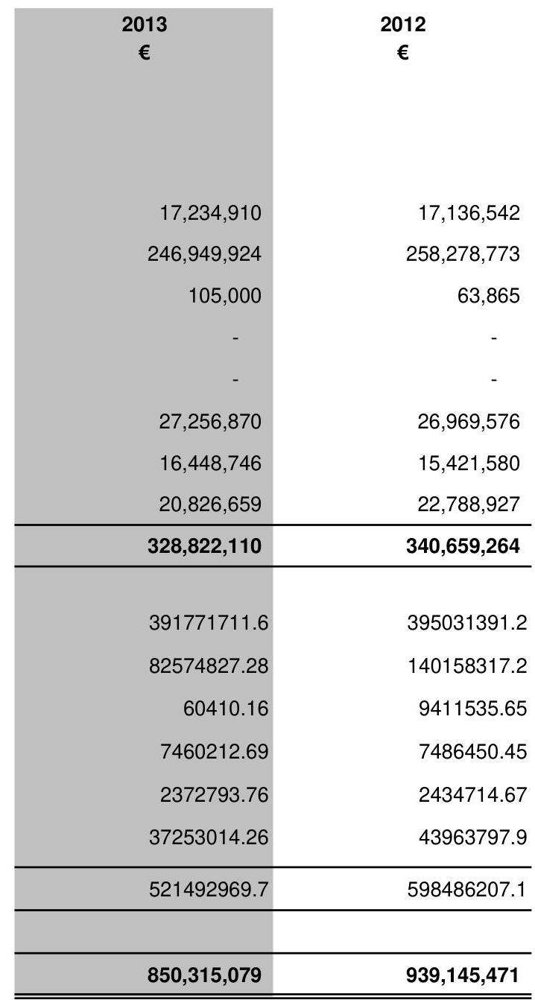

# APPENDIX 4 <br> ANALYSIS OF INCOME FROM GOODS AND SERVICE 

|  | 2013 | 2012 |
| :--: | :--: | :--: |
|  | € | € |
| Rents from Houses | 354,282,577 | 347,066,447 |
| Housing Loans Interest \& Charges | 42,463,115 | 48,611,983 |
| Domestic Water | 17,165 | 24,388 |
| Commercial Water | 157,230,267 | 141,014,586 |
| Domestic Refuse | 6,893,064 | 7,477,964 |
| Commercial Refuse | 5,700,960 | 7,460,872 |
| Domestic Sewerage | (113,639) | 113,503 |
| Commercial Sewerage | 35,338,316 | 32,110,045 |
| Planning Fees | 12,733,410 | 12,328,350 |
| Parking Fines/Charges | 87,916,671 | 90,340,738 |
| Recreation \& Amenity Activities | 22,643,532 | 23,038,463 |
| Library Fees/Fines | 2,284,035 | 2,298,777 |
| Agency Services | 20,227,173 | 21,049,606 |
| Pension Contributions | 57,226,633 | 58,877,994 |
| Property Rental \& Leasing of Land | 12,718,890 | 12,911,114 |
| Landfill Charges | 38,849,202 | 47,984,437 |
| Fire Charges | 12,738,565 | 12,268,892 |
| NPPR | 103,665,675 | 90,213,131 |
| Misc. (Detail) | 391,381,038 | 540,023,248 |
|  | 1,364,196,650 | 1,495,214,537 |

Page 37

# APPENDIX 5 <br> SUMMARY OF CAPITAL EXPENDITURE AND INCOME 

## EXPENDITURE

Payment to Contractors
Purchase of Land
Purchase of Other Assets/Equipment
Professional \& Consultancy Fees
Other

Total Expenditure (Net of Internal Transfers)
Transfers to Revenue
Total Expenditure (Incl Transfers) *

## INCOME

## Grants

Non - Mortgage Loans
Other Income
(a) Development Contributions
(b) Property Disposals

- Land
- LA Housing
- Other property
(c) Purchase Tenant Annuities
(d) Car Parking
(e) Other

Total Income (Net of Internal Transfers)
Transfers from Revenue
Total Income (Incl Transfers) *
Surplus (Deficit) for year
Balance (Debit):Credit @ 1 January
Balance (Debit):Credit @ 31 December

| 2013 | 2012 |
| :--: | :--: |
| € | € |
| 809,049,265 | 1,029,670,976 |
| 57,054,236 | 111,560,366 |
| 68,183,359 | 61,616,410 |
| 117,210,659 | 125,927,531 |
| 459,115,393 | 521,856,749 |
| 1,510,612,911 | 1,850,632,033 |
| 63,457,871 | 67,331,045 |
| 1,574,070,782 | 1,917,963,078 |
| 959,179,071 | 1,243,004,469 |
| 103,725,987 | 257,303,375 |
| $(1,080,062)$ | 45,881,542 |
| 23,805,845 | 6,735,367 |
| 46,495,188 | 32,374,187 |
| 2,662,958 | 1,384,319 |
| 7,441,833 | 52,671,965 |
| 6,057,687 | 6,502,384 |
| 165,190,832 | 153,866,660 |
| 1,313,479,340 | 1,799,724,267 |
| 168,025,303 | 129,127,055 |
| 1,481,504,642 | 1,928,851,322 |
| $(92,566,140)$ | 10,888,245 |
| 944,931,801 | 934,043,546 |
| 852,365,661 | 944,931,790 |

APPENDIX 6
ANALYSIS OF EXPENDITURE AND INCOME ON CAPITAL ACCOUNT

|  | BALANCE @ <br> 1/1/2013 | EXPENDITURE | INCOME |  |  |  | TRANSFERS |  |  | BALANCE @ <br> 31/12/2013 |
| :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: | :--: |
|  |  |  | Grants | Non-Mortgage <br> Loans* | Other | Total Income | Transfer from <br> Revenue | Transfer to Revenue | Internal <br> Transfers |  |
|  | € | € | € | € | € | € | € | € | € | € |
| Housing \& Building | (15,610,751) | 405,081,152 | 302,811,285 | 45,585,123 | 96,206,377 | 444,602,784 | 24,701,361 | 17,897,561 | 6,796,246 | 37,510,927 |
| Road Transportation \& Safety | 113,746,456 | 430,809,567 | 300,807,140 | 5,505,000 | 27,367,669 | 333,679,809 | 15,980,495 | 6,723,270 | 74,512,073 | 100,385,996 |
| Water Services | 131,372,242 | 411,273,145 | 269,675,260 | 28,671,936 | 59,728,976 | 358,076,172 | 7,367,996 | 18,472,781 | 33,689,337 | 100,759,822 |
| Development Management | 516,884,695 | 62,201,878 | 20,536,139 | 4,261,592 | 32,431,526 | 57,229,257 | 12,060,436 | 7,741,047 | (167,665,015) | 348,566,448 |
| Environmental Services | (49,697,301) | 57,898,607 | 22,855,489 | 14,357,448 | 6,376,453 | 43,589,390 | 39,108,277 | 1,405,778 | 13,586,943 | (12,717,077) |
| Recreation \& Amenity | (199,662) | 95,963,790 | 29,609,813 | 1,900,000 | 10,848,869 | 42,358,682 | 15,317,798 | 625,080 | 65,950,074 | 26,838,022 |
| Agriculture, Education, Health \& Welfare | 1,128,443 | 10,781,377 | 6,837,793 | - | 504,884 | 7,342,677 | 1,030,277 | 56,000 | 448,737 | (887,242) |
| Miscellaneous Services | 247,308,360 | 36,603,916 | 6,046,152 | 3,444,888 | 17,110,047 | 26,601,087 | 52,458,664 | 10,536,354 | (27,318,397) | 251,909,445 |
| TOTAL | 944,932,482 | 1,510,613,430 | 959,179,071 | 103,725,987 | 250,574,801 | 1,313,479,859 | 168,025,304 | 63,457,872 | (3) | 852,366,341 |

Note: Mortgage-related transactions are excluded

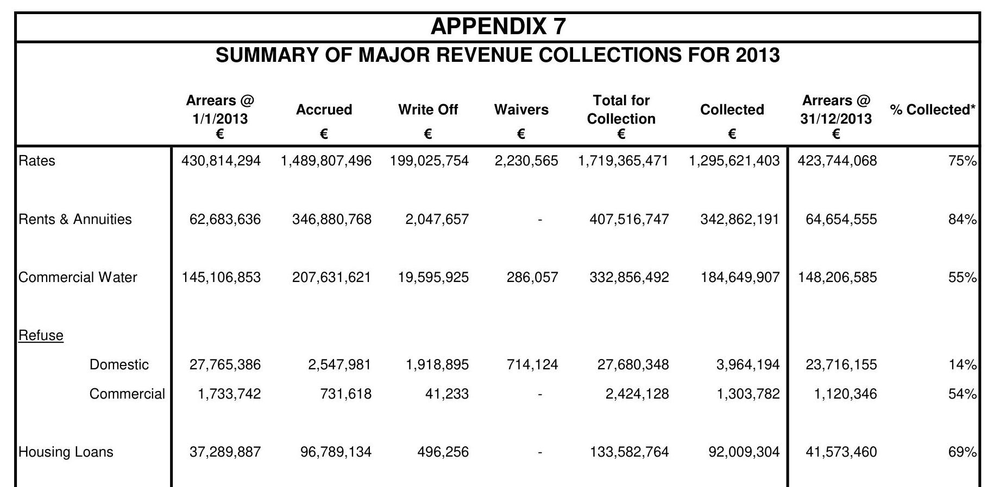

Note 1 The total for collection in 2013 includes arrears bifwd at 1/1/2013. This will tend to reduce the \% collected for 2013
Note 2 Rental income from Shared Ownership has been included under
Note 3 Income from Tenant Purchase Annuities has been included under
Note 4 Arrears brought forward is shown net of credit balances.

In [49]:
from mistralai.models import OCRResponse
from IPython.display import Markdown, display

def replace_images_in_markdown(markdown_str: str, images_dict: dict) -> str:
    for img_name, base64_str in images_dict.items():
        markdown_str = markdown_str.replace(f"![{img_name}]({img_name})", f"![{img_name}]({base64_str})")
    return markdown_str

def get_combined_markdown(ocr_response: OCRResponse) -> str:
  markdowns: list[str] = []
  for page in pdf_response.pages:
    image_data = {}
    for img in page.images:
      image_data[img.id] = img.image_base64
    markdowns.append(replace_images_in_markdown(page.markdown, image_data))

  return "\n\n".join(markdowns)

display(Markdown(get_combined_markdown(pdf_response)))

## Legal Paper (French)

In [53]:
from pathlib import Path

pdf_file = Path("/content/Réforme du financement de l'audiovisuel public.pdf")
assert pdf_file.is_file()

{
    "pages": [
        {
            "index": 0,
            "markdown": "# 1 \n\n## MINIST\u0116RE DE LA CULTURE\n\nLibert\u00e9\n\u00c9galit\u00e9\nFraternit\u00e9\n\n## R\u00e9forme du financement de l'audiovisuel public\n\nRecueil des travaux parlementaires pr\u00e9paratoires de la loi organique $\\mathbf{n}^{\\circ} 2024-1177$ du 13 d\u00e9cembre 2024 portant r\u00e9forme du financement de l'audiovisuel public\n\n## N\u00c9MONDE\n\n![img-0.jpeg](img-0.jpeg)\narite\n\n## radiofrance\n\nFrance\n\"m\u00e9dias\nmonde\nfrance\"ty",
            "images": [
                {
                    "id": "img-0.jpeg",
                    "top_left_x": 267,
                    "top_left_y": 1316,
                    "bottom_right_x": 625,
                    "bottom_right_y": 1620,
                    "image_base64": ""
                }
            ],
            "dimensions": {
                "dpi": 200,
                "height": 2339,
                "width": 1654
            }
        
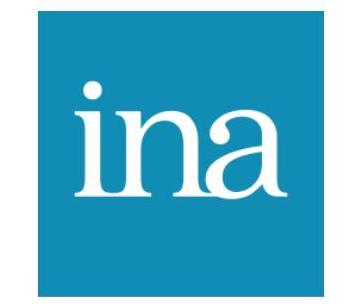
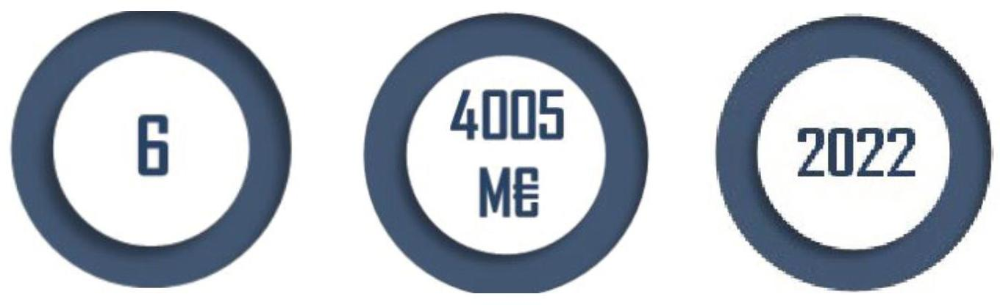
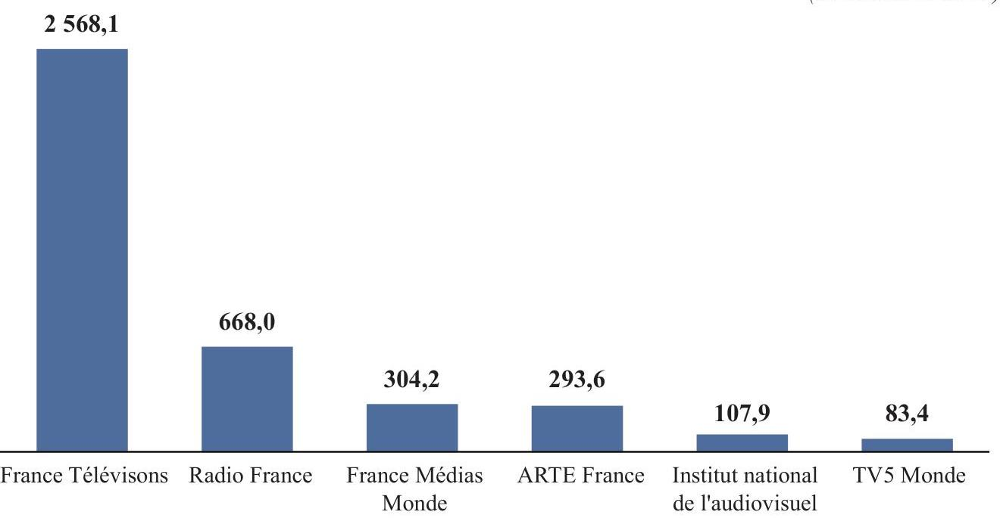
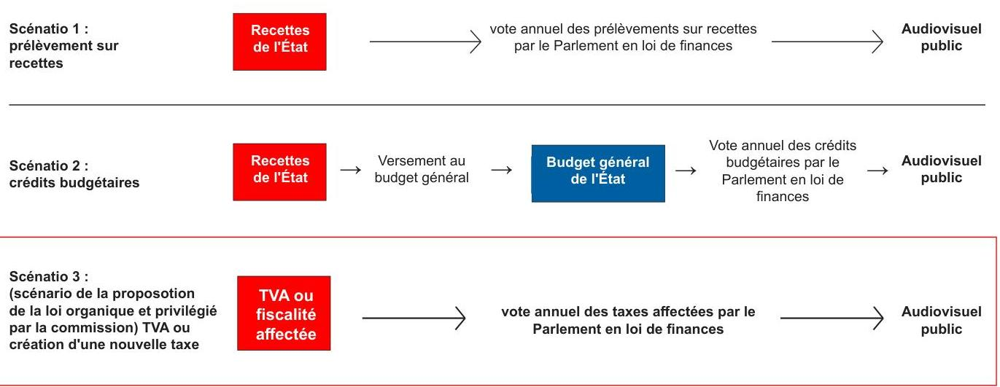
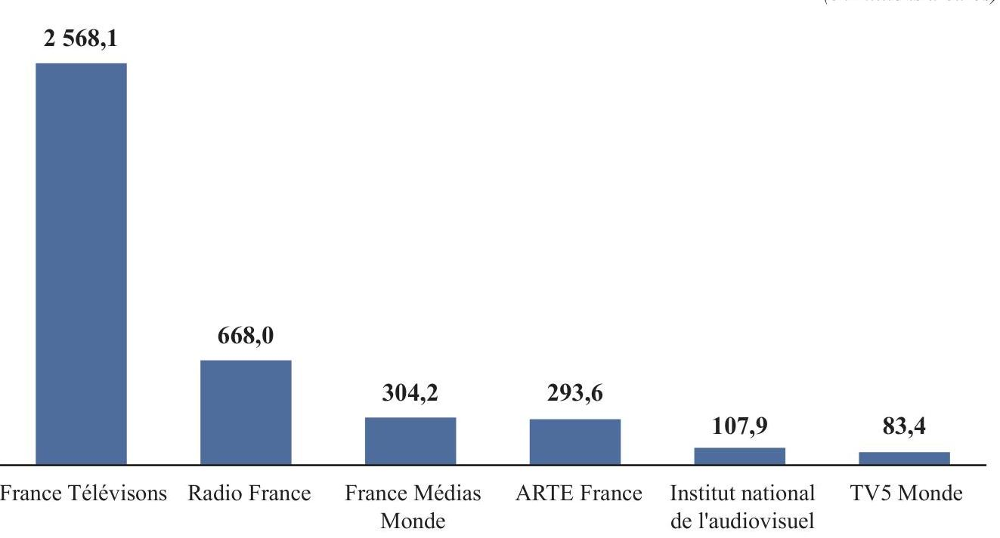
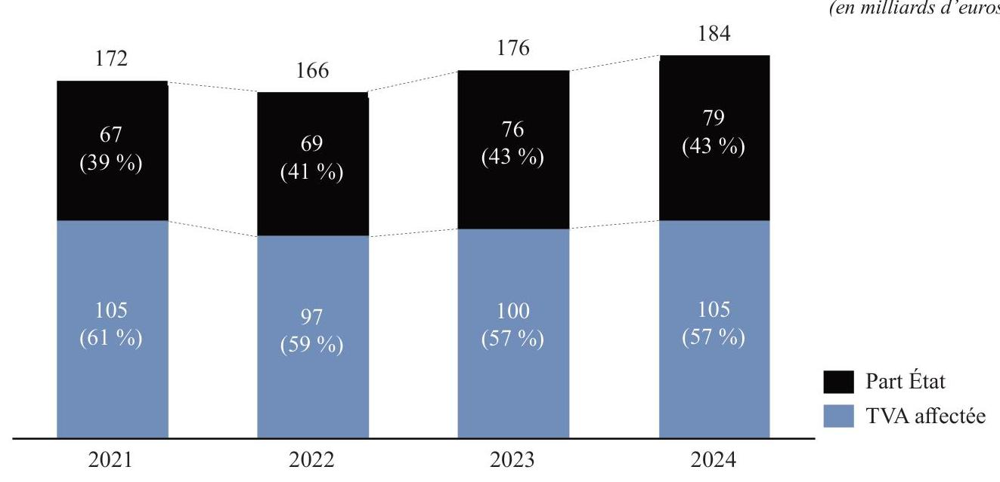
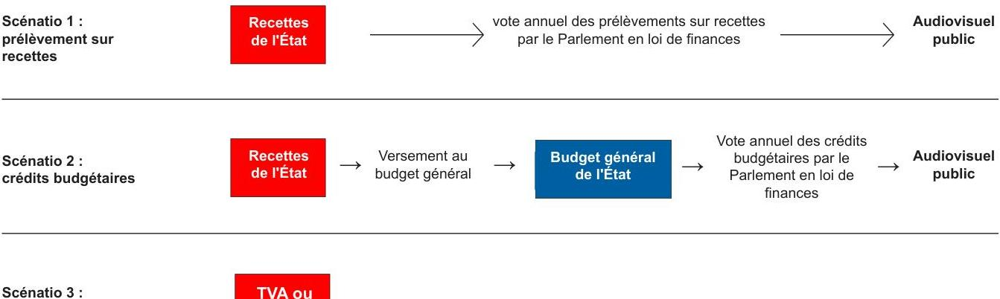
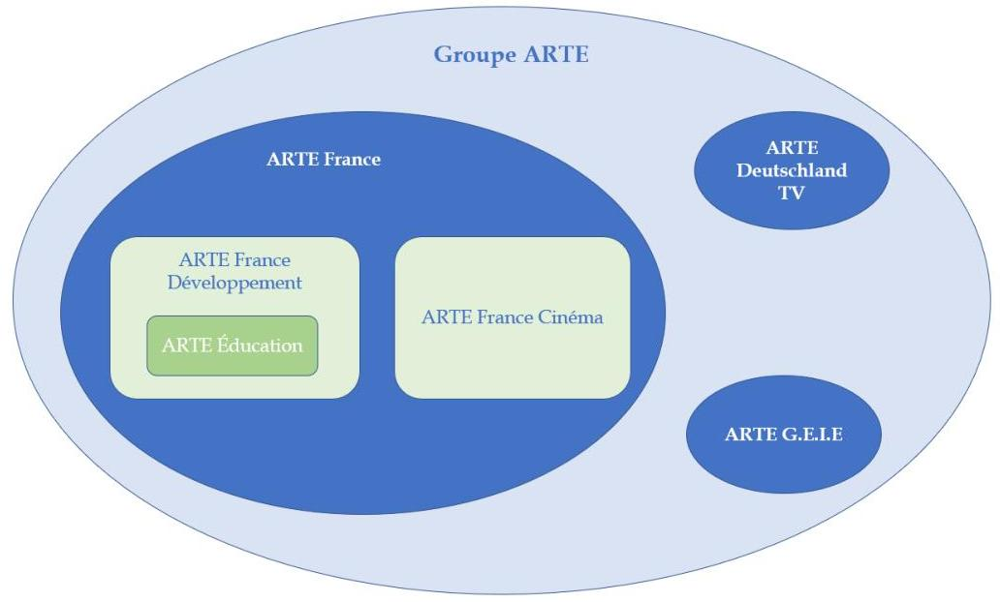
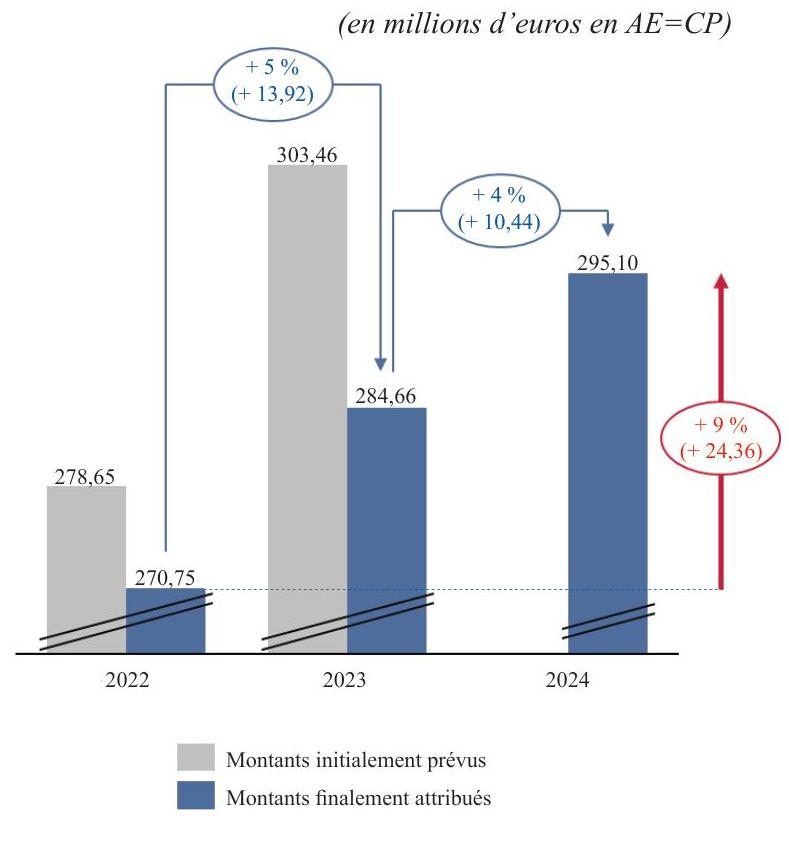

<ipython-input-54-60fb75838aca>:18: PydanticDeprecatedSince20: The `json` method is deprecated; use `model_dump_json` instead. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.10/migration/
  response_dict = json.loads(pdf_response.json())


In [54]:
from mistralai import DocumentURLChunk, ImageURLChunk, TextChunk
import json

uploaded_file = client.files.upload(
    file={
        "file_name": pdf_file.stem,
        "content": pdf_file.read_bytes(),
    },
    purpose="ocr",
)

signed_url = client.files.get_signed_url(file_id=uploaded_file.id, expiry=1)

pdf_response = client.ocr.process(document=DocumentURLChunk(document_url=signed_url.url),
                                  model="mistral-ocr-latest",
                                  include_image_base64=True)

response_dict = json.loads(pdf_response.json())
json_string = json.dumps(response_dict, indent=4)

print(json_string)

# 1 

## MINISTĖRE DE LA CULTURE

Liberté
Égalité
Fraternité

## Réforme du financement de l'audiovisuel public

Recueil des travaux parlementaires préparatoires de la loi organique $\mathbf{n}^{\circ} 2024-1177$ du 13 décembre 2024 portant réforme du financement de l'audiovisuel public

## NÉMONDE

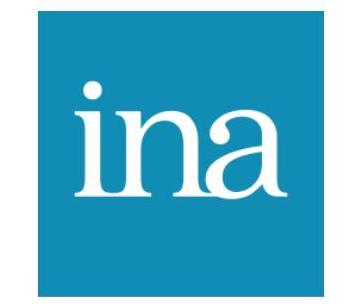
arite

## radiofrance

France
"médias
monde
france"ty




# Réforme du financement de l'audiovisuel public 

Recueil des travaux parlementaires préparatoires de la loi organique $\mathbf{n}^{\circ} 2024-1177$ du 13 décembre 2024 portant réforme du financement de l'audiovisuel public

## Février 2025

Avertissement :
Ce document, de par son format intégrant une fonction «rechercher», permet de suivre facilement l'évolution d'une disposition (article, alinéa...) tout au long des différents travaux parlementaires

Ministère de la Culture
Secrétariat général
Département des études, de la prospective, des statistiques et de la documentation
Mission de la politique documentaire
Réalisé par : Véronique Van Temsche
182, rue Saint-Honoré, 75033 Paris Cedex 1
Tél : 0140153829

# SOMMAIRE 

Loi organique $\mathbf{n}^{\circ} 2024-1177$ du 13 décembre 2024 portant réforme du financement de l'audiovisuel public ..... Page 5
Conseil constitutionnel
Décision $\mathrm{n}^{\circ}$ 2024-873 DC du 12 décembre 2024 ..... Page 6
Sénat
Proposition de loi organique $\mathrm{n}^{\circ}$ 720, enregistré le 10 juillet 2024 ..... Page 8
Exposé des motifs. ..... Page 8
Proposition de loi organique portant réforme du financement de l'audiovisuel public. ..... Page 10
Rapport $\mathrm{n}^{\circ} 40$ de la commission des finances, enregistré le 16 octobre 2024 ..... Page 11
L'essentiel ..... Page 11
Examen des articles ..... Page 15
Examen en commission. ..... Page 31
Examen des articles ..... Page 35
Tableau des sorts. ..... Page 35
Règles relatives à l'application de l'article 45 de la Constitution et de l'article 44 bis du Règlement du Sénat ("Cavaliers») ..... Page 36
Liste des personnes entendues ..... Page 37
Proposition de loi organique $\mathrm{n}^{\circ} 41$ - Texte de la commission des finances, enregistré le 16 octobre 2024 ..... Page 38
Compte rendu intégral des débats : séance du 23 octobre 2024 ..... Page 39
Discussion générale. ..... Page 39
Discussion du texte de la commission. ..... Page 58
Vote sur l'ensemble. ..... Page 66
Proposition de loi organique $\mathrm{n}^{\circ} 12$ ( $\mathrm{n}^{\circ} 482$ à l'Assemblée nationale), adopté par le Sénat le 23 octobre 2024 ..... Page 69
Assemblée nationale
Rapport $\mathrm{n}^{\circ}$ 556, de la commission spéciale, enregistré le 13 novembre 2024 ..... Page 70
Avant-propos ..... Page 71
Commentaire des articles ..... Page 72
Travaux de la commission spéciale : examen des articles. ..... Page 87
Annexe : Liste des personnes entendues par la commission spéciale ..... Page 108
Annexe au rapport $\mathrm{n}^{\circ} 556$ - Texte de la Commission spéciale, enregistré le 13 novembre 2024 ..... Page 110

Compte rendu intégral des débats : $2^{\mathrm{e}}$ séance du 19 novembre 2024 ..... Page 111
Présentation. ..... Page 111
Motion de rejet préalable ..... Page 116
Discussion générale. ..... Page 121
Compte rendu intégral des débats : séance du 20 novembre 2024 ..... Page 138
Rappel au règlement ..... Page 138
Discussion des articles ..... Page 139
Rappel au règlement ..... Page 159
Rappel au règlement ..... Page 161
Explications de vote. ..... Page 163
Vote sur l'ensemble. ..... Page 169
Proposition de loi organique $\mathrm{n}^{\circ} 10$ (Petite loi), adoptée par l'Assemblée nationale le 20 novembre 2024 ..... Page 170
Bibliographie ..... Page 171

# Loi organique $\mathbf{n}^{\circ} 2024-1177$ du 13 décembre 2024 portant réforme du financement de l'audiovisuel public 

NOR : MICX2426243L
ELI : https://www.legifrance.gouv.fr/eli/loi/2024/12/13/MICX2426243L/jo/texte
JO $\mathbf{n}^{\circ} 295$ du 14 décembre 2024 Texte $\mathbf{n}^{\circ} 2$

L'Assemblée nationale et le Sénat ont adopté,
Le Conseil constitutionnel a déclaré conforme à la Constitution,
Le Président de la République promulgue la loi dont la teneur suit :

## Article unique

Le premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle. »;

La présente loi sera exécutée comme loi de l'Etat.
Fait à Paris, le 13 décembre 2024.
Par le Président de la République :
Emmanuel Macron
Le Premier ministre,
Michel Barnier
Le ministre de l'Europe et des Affaires étrangères,
Jean-Noël Barrot
La ministre de la Culture,
Rachida Dati
Le ministre de l'Économie, des Finances et de l'Industrie,
Antoine Armand
Le ministre auprès du Premier ministre, chargé du budget et des comptes publics,
Laurent Saint-Martin

# Conseil constitutionnel 

## Décision $\mathbf{n}^{\circ}$ 2024-873 DC du 12 décembre 2024

NOR : CSCL2433941S

## JO $\mathbf{n}^{\circ} 295$ du 14 décembre 2024 Texte $\mathbf{n}^{\circ} 3$

Le Conseil constitutionnel a été saisi, le 21 novembre 2024, par le Premier ministre, sous le n ${ }^{\circ}$ 2024-873 DC, conformément au cinquième alinéa de l'article 46 et au premier alinéa de l'article 61 de la Constitution, de la loi organique portant réforme du financement de l'audiovisuel public.

Au vu des textes suivants :

- la Constitution ;
- l'ordonnance $\mathrm{n}^{\circ}$ 58-1067 du 7 novembre 1958 portant loi organique sur le Conseil constitutionnel ;
- la loi organique $\mathrm{n}^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances ;
- le règlement du 11 mars 2022 sur la procédure suivie devant le Conseil constitutionnel pour les déclarations de conformité à la Constitution ;

Au vu des observations du Gouvernement, enregistrées le 2 décembre 2024 ;
Et après avoir entendu le rapporteur ;
Le Conseil constitutionnel s'est fondé sur ce qui suit :

1. La loi organique soumise à l'examen du Conseil constitutionnel a été prise sur le fondement du dix-neuvième alinéa de l'article 34 de la Constitution, selon lequel «Les lois de finances déterminent les ressources et les charges de l'Etat dans les conditions et sous les réserves prévues par une loi organique», et du premier alinéa de son article 47, qui dispose que «Le Parlement vote les projets de loi de finances dans les conditions prévues par une loi organique». Elle a été adoptée dans le respect des règles de procédure prévues par les trois premiers alinéas de l'article 46 de la Constitution.
2. L'article unique de la loi organique déférée modifie le paragraphe it de l'article 2 de la loi organique du $1^{\text {er }}$ août 2001 mentionnée ci-dessus relatif aux conditions dans lesquelles des impositions de toutes natures peuvent être directement affectées à certaines personnes morales autres que l'État.
3. Il prévoit qu'un montant déterminé d'une imposition de toute nature peut être directement affecté aux organismes du secteur public de la communication audiovisuelle sous les réserves prévues au paragraphe III de cet article et aux articles 34 à 51 de la même loi organique. Il ressort de ces dispositions que l'affectation totale ou partielle à un tiers d'une ressource établie au profit de l'État ne peut résulter que d'une disposition d'une loi de finances, que la perception d'une telle imposition doit être autorisée par la loi de finances et que le projet de loi de finances de l'année doit être accompagné d'une annexe explicative comportant la liste et l'évaluation, par bénéficiaire ou catégorie de bénéficiaires, des ressources affectées à des personnes morales autres que l'État.
4. Aucune règle ni aucun principe de valeur constitutionnelle n'interdit d'affecter le produit d'une imposition à un établissement public ou à une personne privée chargée d'une mission de service public.
5. Dès lors, il était loisible au législateur organique de permettre l'affectation de certaines ressources aux organismes du secteur public de la communication audiovisuelle à raison des missions de service public qui leur sont confiées. À cet égard, la garantie des ressources du secteur de l'audiovisuel public constitue un élément de son indépendance, laquelle concourt à la mise en œuvre de la liberté de communication.
6. Par conséquent, l'article unique de la loi organique déférée, qui ne méconnaît pas les articles 13 et 14 de la Déclaration des droits de l'homme de 1789 ni aucune autre exigence constitutionnelle, est conforme à la Constitution.

Le Conseil constitutionnel décide :

Art. $1^{\text {er. }}$ - La loi organique portant réforme du financement de l'audiovisuel public est conforme à la Constitution.
Art. 2. - Cette décision sera publiée au Journal officiel de la République française.
Jugé par le Conseil constitutionnel dans sa séance du 12 décembre 2024, où siégeaient :
M. Laurent Fabius, Président,
$\mathrm{M}^{\text {me }}$ Jacqueline Gourault, M. Alain Juppé, $\mathrm{M}^{\text {mes }}$ Corinne Luquiens, Véronique Malbec, MM. Jacques Mézard, François Pillet, Michel Pinault et François Séners.

Rendu public le 12 décembre 2024

# Sénat 

## Proposition de loi organique $\mathbf{n}^{\circ} 720$, enregistré le 10 juillet 2024

$\mathrm{N}^{\circ} 720$
SÉNAT
2023-2024

Enregistré à la Présidence du Sénat le 10 juillet 2024

## PROPOSITION DE LOI ORGANIQUE

(procédure accélérée)
portant réforme du financement de l'audiovisuel public.
Présentée
Par M. Cédric VIAL, $\mathrm{M}^{\text {me }}$ Catherine MORIN-DESAILLY, MM. Roger KAROUTCHI, Laurent LAFON, Max BRISSON, $\mathrm{M}^{\text {mes }}$ Françoise GATEL, Dominique ESTROSI SASSONE, M. Pierre-Antoine LEVI, $\mathrm{M}^{\text {me }}$ Anne-Catherine LOISIER, MM. Jean-Michel ARNAUD, Michel LAUGIER, $\mathrm{M}^{\text {me }}$ Béatrice GOSSELIN, M. Khalifé KHALIFÉ, $\mathrm{M}^{\text {mes }}$ Marie-Do AESCHLIMANN, Jocelyne GUIDEZ, Amel GACQUERRE, MM. André REICHARDT, Laurent BURGOA, Hervé REYNAUD, $\mathrm{M}^{\text {me }}$ Pauline MARTIN, M. Cyril PELLEVAT, $\mathrm{M}^{\text {mes }}$ Sylvie VERMEILLET, Marie MERCIER, Patricia DEMAS, M. Jean-François LONGEOT, $\mathrm{M}^{\text {me }}$ Sylvie VALENTE LE HIR, MM. Damien MICHALLET, Michel SAVIN, $\mathrm{M}^{\text {mes }}$ Jacqueline EUSTACHE-BRINIO, Alexandra BORCHIO FONTIMP, Catherine BELRHITI, MM. Philippe MOUILLER, Patrick CHAIZE, Hugues SAURY, $\mathrm{M}^{\text {mes }}$ Marie-Pierre RICHER, Anne VENTALON, M. Mathieu DARNAUD, $\mathrm{M}^{\text {me }}$ Florence LASSARADE, MM. Jean-Baptiste BLANC, Claude KERN, $\mathrm{M}^{\text {me }}$ Denise SAINT-PÉ, MM. Alain CADEC, Cédric PERRIN, Olivier RIETMANN, Antoine LEFÈVRE, $\mathrm{M}^{\text {me }}$ Lauriane JOSENDE, MM. Jean-Jacques PANUNZI, Gilbert FAVREAU, $\mathrm{M}^{\text {me }}$ Marta de CIDRAC, M. Bruno BELIN, $\mathrm{M}^{\text {mes }}$ Brigitte MICOULEAU, Annick BILLON, Sonia de LA PROVÔTÉ, Nadine BELLUROT, MM. Philippe PAUL, Alain DUFFOURG, $\mathrm{M}^{\text {mes }}$ Anne-Sophie ROMAGNY, Agnès EVREN, Martine BERTHET, MM. Daniel GREMILLET, Christian BRUYEN, Bruno SIDO, $\mathrm{M}^{\text {me }}$ Elsa SCHALCK et M. Thierry MEIGNEN, Sénateurs et Sénatrices
(Envoyée à la commission des finances, sous réserve de la constitution éventuelle d'une commission spéciale dans les conditions prévues par le Réglement.)

## Exposé des motifs

Mesdames, Messieurs,
La loi de finances rectificative pour 2022 a supprimé, à compter du $1^{\text {er }}$ janvier 2022, la contribution à l'audiovisuel public (CAP). Le débat parlementaire a conduit au maintien du compte de concours financier, par une fraction du produit de la TVA venant se substituer à la CAP.

Toutefois, ce mode de financement était, dès le départ, provisoire. En effet, la loi organique relative aux lois de finances (LOLF) de 2001, modifiée par l'article 3 de la loi organique du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques, dispose que l'affectation d'une taxe à un tiers autre que les collectivités territoriales, établissements publics et organismes de sécurité sociale est possible uniquement si ces deux conditions cumulatives sont respectées : disposer de la personnalité morale et un lien existant entre la taxe et la mission de service public.

Cette disposition rentrera en vigueur lors du dépôt du projet de loi de finances pour l'année 2025. Les sociétés de l'audiovisuel public ne répondant pas à ces deux conditions cumulatives, il n'est pas possible de pérenniser, en l'état actuel du droit, leur financement par une fraction du produit de la TVA.

Cet état de fait, ainsi que le contexte politique national et international actuel, appelle à un soutien durable à l'audiovisuel public.

Cette pérennisation du mode de financement de l'audiovisuel public par une fraction du produit de la TVA poursuit d'abord une visée démocratique essentielle. Elle garantit en effet l'indépendance des médias de service public et concourt à la libre communication des pensées et des opinions, consacrée à l'article 11 de la Déclaration des droits de l'homme et du citoyen, et au pluralisme des médias, défini par le Conseil constitutionnel comme une condition d'exercice de la démocratie. Elle permet aux citoyens d'accéder à une pluralité d'opinions et de sources fiables dans un contexte de manipulations de l'information, d'origine nationale comme internationale.

Cette pérennisation des modalités de financement de l'audiovisuel public par une fraction du produit de la TVA poursuit ensuite un objectif économique. Elle permet à l'audiovisuel de continuer à peser dans l'espace informationnel français et international, dans lequel la concurrence de médias en ligne et des grandes plateformes s'intensifie, et de maintenir le niveau de soutien à la création française et européenne. Elle garantit aussi l'équilibre du paysage audiovisuel français, face à des acteurs privés puissants qui se financent principalement sur la ressource publicitaire, dans un marché économique déjà contraint.

Sans modification de la LOLF dans les délais impartis, le financement de l'audiovisuel public serait assuré par le budget général de l'État et non plus par une ressource affectée, comme c'est le cas aujourd'hui.

Cette situation aurait des conséquences importantes pour les sociétés de l'audiovisuel public, notamment sur l'influence de la France sur le plan international. En effet, les sociétés d'audiovisuel public seront considérées comme des médias d'État (notamment en Allemagne sur le land de Berlin pour RFI ou s'agissant des possibilités de diffusion de France Média Monde) et subiront, notamment, une perte de référencement sur YouTube en passant de service public d'information à un service gouvernemental.

On rappellera que le règlement européen sur la liberté des médias («Media Freedom Act »), récemment adopté par l'Union européenne, est d'application directe en France. Son article 5 dispose que «les Étatsmembres veillent à ce que les procédures de financement des médias de service public soient fondées sur des critères transparents et objectifs préalablement établis (...), garantissant des ressources financières suffisantes, durables et prévisibles correspondant à l'accomplissement de leur mission de service public, et leur permettant de se développer dans le cadre de celle-ci (...) et de nature à permettre que leur indépendance éditoriale soit préservée».

Le risque lié à la budgétisation du financement des médias de service public a également été relevé dans une étude de la Commission européenne, commandée par la DG CONNECT et publiée en janvier 2024. Elle a souligné les risques «d'interférence politique» et de baisse des ressources qui sont associés à ce mode de financement.

Par ailleurs, le Conseil constitutionnel a reconnu en 2009 la «garantie des ressources de l'audiovisuel public comme un élément constitutif de son indépendance», de même que sa décision du 12 août 2022 a consacré «qu'il incombera au législateur (...) pour la période postérieure au 31 décembre 2024 de fixer le montant des recettes afin que les sociétés de l'audiovisuel public soient à même d'exercer les missions de service public qui leur sont confiées.»

Dans ce cadre, une proposition de loi organique avait été déposée par des députés afin de pérenniser un mode de financement affecté pour l'audiovisuel public. Toutefois, en raison de la dissolution de l'Assemblée nationale, ce texte est rendu caduc.

Le Sénat, en tant que chambre haute du Parlement, doit assurer la continuité des institutions et du service public, d'où l'importance de ce nouveau texte.

L'article $1^{\text {er }}$ de la proposition de loi organique modifie l'article 2 de la LOLF afin que des impositions de toutes natures puissent être directement affectées aux organismes de l'audiovisuel public, permettant ainsi un financement par une fraction du produit de la TVA. Ces organismes sont définis dans la loi n ${ }^{\circ} 86-1067$ du

30 septembre 1986 relative à la liberté de communication et comprennent aujourd'hui France télévisions, Radio France, la société en charge de l'audiovisuel extérieur de la France (France Médias Monde), l'établissement public Institut national audiovisuel (INA), TV5-Monde et la chaîne culturelle européenne portée en France par ARTE-France.

L'article 2 crée une modalité de financement spécifique pour ARTE-France qui ne serait dès lors plus couverte par l'article 2 de la LOLF : un prélèvement sur recettes (PSR) de l'État. Le PSR est un outil budgétaire, prévu à l'article 6 de la LOLF, qui permet de rétrocéder un montant déterminé des recettes de l'État au profit des collectivités territoriales ou de l'Union européenne. Le principal avantage des PSR est d'assurer un budget prévisible, évaluatif, non soumis à variations infra-annuelles.

La chaîne culturelle européenne ARTE a été créée par un traité international, conclu le 2 octobre 1990 entre la France et les États fédérés de la République fédérale d'Allemagne, puis ratifié. Comme tous les traités, il s'impose aux lois organiques et ordinaires nationales, en application de l'article 55 de la Constitution. Ce Traité prévoit et organise l'indépendance éditoriale et financière de chacune des composantes de la chaîne (groupement européen d'intérêt économique -GEIE-, pôle allemand, pôle français). Il résulte ainsi d'une norme internationale que le pôle d'ARTE-France est tenu de fournir les programmes et les moyens financiers nécessaires au fonctionnement de la chaîne franco-allemande, dans une proportion strictement équivalente à celle de la partie allemande, sur la base du budget arrêté par l'assemblée générale du GEIE.

La création d'un PSR contribuera au respect des engagements internationaux de la France en assurant l'indépendance financière de la chaîne et la parité de l'apport de l'État français au financement du GEIE. À noter qu'ARTE-France bénéficie d'un contrat d'objectifs et de moyens signé avec l'État et est soumis au contrôle des rapporteurs spéciaux du budget et de la Cour des comptes.

La distinction du financement des principales entités de l'audiovisuel public et d'ARTE-France a du sens compte tenu de la durée de validité des documents stratégiques qui lient ces entités à l'État et déterminent la trajectoire de leur financement : quatre ans pour ARTE-France, cinq ans pour les autres entités.

L'article 3 est un article de gage.

# Proposition de loi organique portant réforme du financement de l'audiovisuel public 

Art. $1^{\text {er. }}$ - Au premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances, dans sa rédaction résultant de l'article 3 de la loi organique $\mathrm{n}^{\circ}$ 2021-1836 du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques, les mots : «et aux organismes de sécurité sociale» sont remplacés par les mots : «, aux organismes de sécurité sociale et à ceux de l'audiovisuel public».

Art. 2. - Au quatrième alinéa de l'article 6 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances, après le mot : «profit», sont insérés les mots «de la chaîne culturelle européenne, ».

Art. 3. - La perte de recettes résultant pour l'État de la présente loi est compensée, à due concurrence, par la création d'une taxe additionnelle à l'accise sur les tabacs prévue au chapitre iv du titre Ier du livre III du Code des impositions sur les biens et services.

# Rapport n ${ }^{\circ} 40$ de la commission des finances, enregistré le 16 octobre 2024 

$\mathrm{N}^{\circ} 40$

## SÉNAT <br> SESSION ORDINAIRE DE 2024-2025

Enregistré à la Présidence du Sénat le 16 octobre 2024

## RAPPORT

FAIT
au nom de la commission des finances ${ }^{(1)}$ sur la proposition de loi organique portant réforme du financement de l'audiovisuel public (procédure accélérée),

Par M. Jean-Raymond HUGONET, Sénateur
${ }^{(1)}$ Cette commission est composée de : M. Claude Raynal, président ; M. Jean-François Husson, rapporteur général ; MM. Bruno Belin, Christian Bilhac, Jean-Baptiste Blanc, Emmanuel Capus, Thierry Cozic, Bernard Delcros, Thomas Dossus, Albéric de Montgolfier, Didier Rambaud, Stéphane Sautarel, Pascal Savoldelli, vice-présidents ; M. Michel Canévet, M ${ }^{\text {mex }}$ Marie-Claire Carrère-Gée, Frédérique Espagnac, M. Marc Laménie, secrétaires ; MM. Arnaud Bazin, Grégory Blanc, M ${ }^{\text {me }}$ Florence Blatrix Contat, M. Éric Bocquet, $\mathrm{M}^{\text {me }}$ Isabelle Briquet, M. Vincent Capo-Canellas, $\mathrm{M}^{\text {me }}$ Marie-Carole Ciuntu, MM. Raphaël Daubet, Vincent Delahaye, Vincent Éblé, Rémi Féraud, Stéphane Fouassin, $\mathrm{M}^{\text {me }}$ Nathalie Goulet, MM. Jean-Raymond Hugonet, Éric Jeansannetas, Christian Klinger, $\mathrm{M}^{\text {me }}$ Christine Lavarde, MM. Antoine Lefèvre, Dominique de Legge, Victorin Lurel, Hervé Maurey, Jean-Marie Mizzon, Claude Nougein, Olivier Paccaud, $\mathrm{M}^{\text {me }}$ Vanina Paoli-Gagin, MM. Georges Patient, Jean-François Rapin, $\mathrm{M}^{\text {me }}$ Ghislaine Senée, MM. Laurent Somon, Christopher Szczurek, $\mathrm{M}^{\text {me }}$ Sylvie Vermeillet, M. Jean Pierre Vogel.

Voir les numéros :
Sénat : 720 (2023-2024) et 41 (2024-2025)

## L'essentiel

La commission des finances a examiné le 16 octobre 2024 le rapport de Jean-Raymond Hugonet sur la proposition de loi organique portant réforme du financement de l'audiovisuel public présentée par M. Cédric Vial, $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly, MM. Roger Karoutchi, Laurent Lafon et plusieurs de leurs collègues.

## L L'affectation de TVA : un mode de financement déployé en hâte en 2022 et incompatible à compter de 2025 avec la loi organique relative aux lois de finances

A. La suppression de la contribution à l'audiovisuel public en 2022 a entraîné la mise en place dans l'urgence d'un financement de l'audiovisuel public par l'affectation d'une fraction de TVA

Jusqu'en 2022, les six organismes de l'audiovisuel public (France télévisions, Radio France, France Médias monde, TV5 Monde, ARTE France et l'institut national de l'audiovisuel-INA) étaient essentiellement financés par la contribution à l'audiovisuel public (CAP).

Si cette taxe était obsolète, la rapidité de sa suppression et le manque de concertation ayant entouré sa fin ont impliqué la mise en place dans l'urgence d'un mécanisme de substitution de financement de l'audiovisuel public.

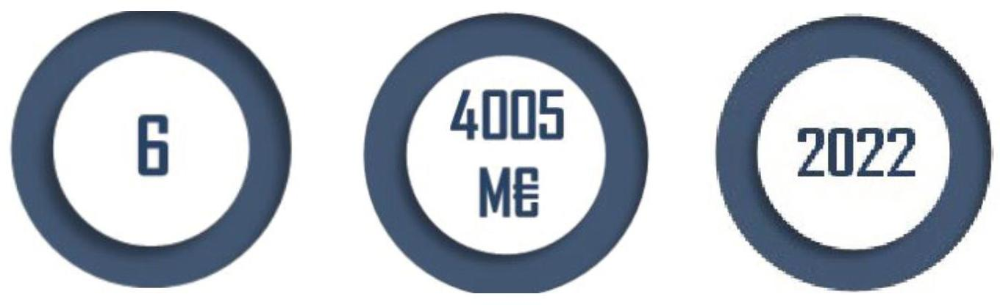

Sociétés d'audiovisuel public
Financés par de la TVA en 2024

Mise en place du système actuel de financement

La dotation affectée par l'État à l'audiovisuel public est désormais constituée d'une fraction du produit de la taxe sur la valeur ajoutée (TVA) dont le montant est déterminé chaque année en loi de finances ${ }^{1}$. L'article 162 de la loi de finances pour 2024 a ainsi fixé le montant de cette fraction de TVA à $\mathbf{4 , 0 2 6}$ milliards d'euros. 20 millions d'euros ont ensuite été annulés par décret en février 2024 (part conditionnelle de la recette affectée).

# Montant de TVA accordé aux sociétés d'audiovisuel public en loi de finances pour 2024 

(en millions d'euros)
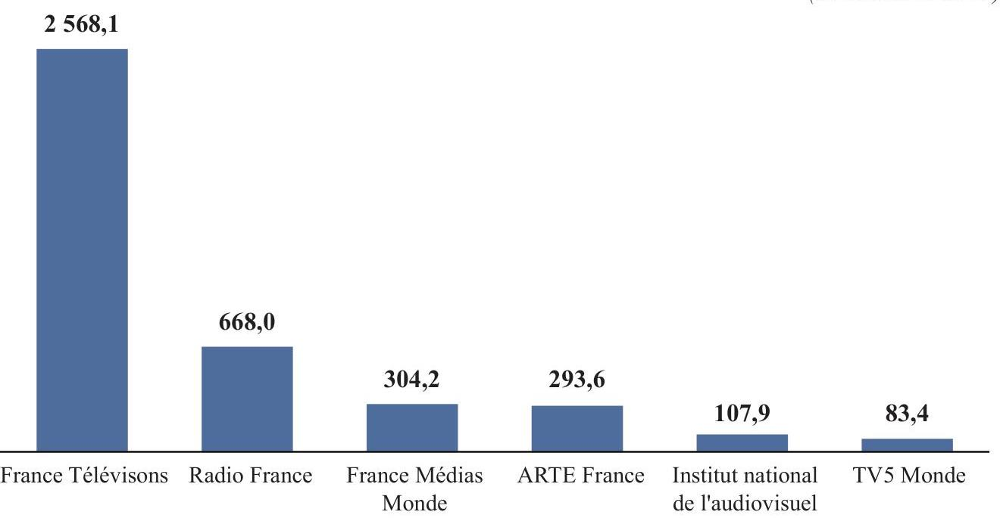

## B. Une caducité du système actuel qui implique de réformer la loi organique relative aux lois de finances

L'article 2 de la loi organique relative aux lois de finances (LOLF) ${ }^{2}$ limite à partir du dépôt du projet de loi de finances pour 2025, en octobre $2024^{3}$ les possibilités de recourir à un financement des organismes publics par des taxes affectées. Cet article introduit désormais une condition de lien entre les missions de service public assurée par ces organismes et la nature de la ressource affectée. Les collectivités territoriales et les organismes de sécurité sociale ne sont pas concernés par cette obligation.

[^0]
[^0]:    ${ }^{1}$ Article 6 de la loi $\mathrm{n}^{\circ}$ 2022-1157 du 16 août 2022 de finances rectificative pour 2022 modifiant l'article 46 de la loi de finances pour 2006.
    ${ }^{2}$ Loi organique $\mathrm{n}^{\circ} 2001-692$ du $1^{\text {er }}$ août 2001 relative aux lois de finances.
    ${ }^{3}$ Suite à la modification effectuée par l'article 3 de la loi organique $\mathrm{n}^{\circ}$ 2021-1836 du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques.

L'affectation de TVA - qui est un impôt de grande consommation sans lien avec l'audiovisuel - aux sociétés d'audiovisuel public ne remplit pas cette condition. Pour tenir compte de cette nouvelle règle organique, le Sénat avait limité l'affectation de TVA au 31 décembre 2024 lors de la suppression de la CAP en 2022.

# Sans modification de la LOLF, le mode actuel de financement par une fraction de TVA ne peut donc être maintenu. 

Alors que la commission des finances du Sénat avait soulevé cette difficulté dès le vote dans l'urgence de la suppression de la contribution à l'audiovisuel public (CAP) à l'été 2022, il est regrettable qu'aucune mesure n'ait été prise au cours des deux années précédentes afin d'anticiper cette échéance.

À défaut d'adoption de la proposition de loi organique, l'audiovisuel public serait financé par des crédits budgétaires. C'est d'ailleurs l'option retenue dans le projet de loi de finances pour 2025 en cours d'examen à l'Assemblée nationale. Cette solution n'est cependant pas adaptée au vu des craintes des sociétés d'audiovisuel public, ce système étant perçu comme symboliquement moins protecteur.

## II. Une priorité : sécuriser le mécanisme de financement de l'audiovisuel public

## A. Une protection européenne et constitutionnelle de l'indépendance de l'audiovisuel public

Les textes fondamentaux européens protègent l'indépendance, y compris financière, des services publics audiovisuels sur le fondement de la liberté d'expression et de communication. Le nouveau règlement européen sur la liberté des médias ${ }^{4}$ prévoit que les fournisseurs de médias de service public audiovisuels disposent de «ressources financières suffisantes, durables et prévisibles correspondant à l'accomplissement de leur mission de service public». Les États membres sont cependant libres de prévoir les modalités de financement ainsi que leur temporalité.

En droit interne, le Conseil constitutionnel a protégé par plusieurs décisions l'indépendance du service public audiovisuel. Dans sa décision sur la loi de finances rectificative pour $2022^{5}$, il a en particulier considéré que le législateur ne pouvait modifier le financement de l'audiovisuel public qu'à la condition d'accorder à l'audiovisuel public des recettes permettant à ces sociétés d'être «à même d'exercer les missions de service public qui leur sont confiées ». Le Conseil constitutionnel a par ailleurs noté dès sa décision sur la loi relative à la communication audiovisuelle de $2009^{6}$ que le législateur pouvait librement fixer la forme que prenait le financement de l'audiovisuel public.

## B. Le montant accordé à l'audiovisuel public, un enjeu à distinguer de la pérennisation du mode de financement

Le principe constitutionnel d'annualité budgétaire implique que le Parlement vote annuellement le montant des ressources accordées aux sociétés d'audiovisuel public : il n'est pas possible d'envisager une trajectoire pluriannuelle contraignante sans révision constitutionnelle. Quel que soit le mode de financement envisagé, le montant accordé chaque année à l'audiovisuel public pourra être révisé à la hausse ou à la baisse lors de son examen au Parlement.

[^0]
[^0]:    ${ }^{4}$ Règlement (UE) 2024/1083 du Parlement européen et du Conseil du 11 avril 2024 établissant un cadre commun pour les services de médias dans le marché intérieur et modifiant la directive 2010/13/UE.
    ${ }^{5}$ Décision $\mathrm{n}^{\circ}$ 2022-842 DC.
    ${ }^{6}$ Décision $\mathrm{n}^{\circ}$ 2009-577 DC du 3 mars 2009.

# Procédures d'adoption des différents modes de financement de l'audiovisuel public 

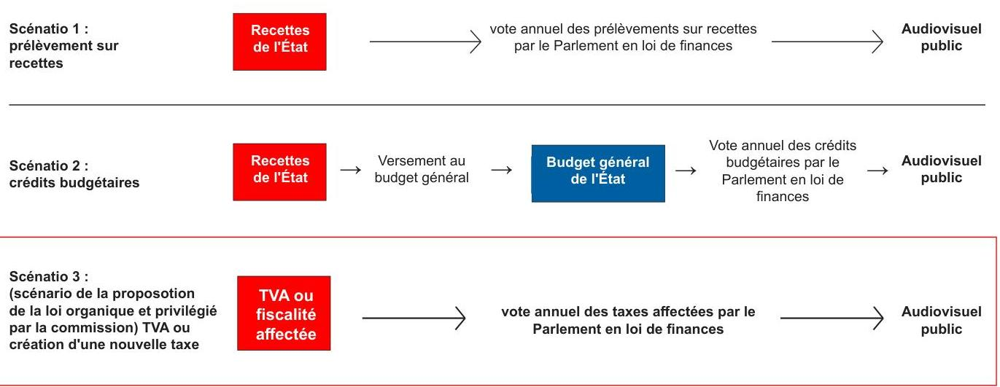

Source : commission des finances

## III. Privilégier l'existant : un maintien du système actuel satisfaisant pour l'audiovisuel public

## A. Le financement par un montant d'impôt d'état, une solution consensuelle

L'article $1^{\text {er }}$ de la proposition de loi organique permet de pérenniser le système actuel en maintenant pour les années à venir le mécanisme d'affectation d'une fraction d'un impôt d'État.

Cette solution a l'avantage d'être expérimentée depuis deux ans par les sociétés d'audiovisuel public qui n'ont pas exprimé d'objection à son maintien.

La commission a adopté un amendement COM-1 du rapporteur visant à clarifier le fait que le mécanisme actuel soit intégralement pérennisé, en s'assurant que les sociétés d'audiovisuel public bénéficieront, comme aujourd'hui, d'un montant de TVA et non d'une fraction dynamique. S'y ajoutent deux amendements rédactionnels COM-2 et COM-4 du rapporteur, l'un à l'article $1^{\text {er }}$ et l'autre à l'article 3.

## B. Un prélèvement sur recettes à destination d'arte : une spécificité qui n'a pas lieu d'être

L'article 2 de la proposition de loi organique prévoit la possibilité de mettre en place un prélèvement sur recettes à destination de la Chaîne culturelle européenne, dont est issue la société ARTE France. Le mécanisme des prélèvements sur recettes est actuellement limité aux collectivités territoriales et à l'Union européenne. Alors que la jurisprudence constitutionnelle encadre ce système, dérogatoire par rapport aux principes budgétaires, il n'apparaît pas opportun de l'étendre à d'autres organismes. La modification proposée par cet article reviendrait à mettre sur le même plan collectivités territoriales, Union européenne et ARTE France.

En outre, les prélèvements sur recettes n'apportent aucune garantie supplémentaire pour les sociétés d'audiovisuel public par rapport à une part de fiscalité affectée. Alors que le système actuel d'affectation d'une fraction de TVA à ARTE France n'a, en pratique, soulevé aucune difficulté spécifique, il n'y a pas lieu de prévoir la mise en place d'une dérogation pour cette société par rapport aux autres organismes d'audiovisuel public. La commission a donc supprimé, par un amendement COM-3 du rapporteur, l'article 2 de la proposition de loi organique. ARTE France bénéficierait, au même titre que les autres sociétés d'audiovisuel public, du mode de financement ouvert par l'article $1^{\text {er }}$.

La commission a adopté la proposition de loi organique ainsi modifiée. Celle-ci sera examinée le mercredi 23 octobre en séance publique.

# Examen des articles 

## Article $1^{\text {er }}$

Dérogation pour les organismes d'audiovisuel public au principe de lien des impositions affectées à un tiers avec les missions de service public qui lui sont confiées

Le présent article modifie l'article 2 de la loi organique relative aux lois de finances (LOLF) afin d'inclure les sociétés d'audiovisuel public parmi les organismes pouvant bénéficier d'une affectation directe d'impôts d'État.

Cette modification rend possible le maintien du système temporaire mis en place pour l'ensemble des sociétés d'audiovisuel public en 2022, c'est-à-dire l'affectation d'une fraction de taxe sur la valeur ajoutée (TVA) en remplacement de la contribution à l'audiovisuel public désormais supprimée. Ce dispositif doit prendre fin au $1^{\text {re }}$ janvier 2025.

L'affectation de TVA ne satisfait pas la condition de lien entre la ressource publique affectée et la mission de service public assurée par les organismes d'audiovisuel public, condition prévue par la rédaction actuelle de l'article 2 de la LOLF. Sans révision de la loi organique, le mécanisme de financement retenu depuis 2022 ne pourrait donc être reconduit.

Alors que la commission des finances du Sénat avait soulevé cette difficulté dès le vote dans l'urgence de la suppression de la contribution à l'audiovisuel public (CAP) à l'été 2022, il est regrettable qu'aucune mesure n'ait été prise au cours des deux dernières années afin d'anticiper cette échéance.

La préservation de l'indépendance budgétaire des services publics audiovisuels, notamment protégée par la jurisprudence du Conseil constitutionnel, impose cependant de trouver rapidement un mode de financement pérenne, à deux mois de la caducité du mécanisme actuel. Le présent article devrait permettre de prolonger l'affectation d'un montant de TVA lors de l'examen du projet de loi de finances pour 2025. Cette solution a pour avantage d'être déjà expérimentée par les sociétés d'audiovisuel public depuis deux ans sans avoir suscité de difficulté.

La commission a adopté cet article tel que modifié par ses amendements visant à introduire un ajustement rédactionnel et à garantir la pérennité du mécanisme pour l'ensemble des sociétés d'audiovisuel public concernées en s'assurant que, comme aujourd'hui, celles-ci bénéficieront d'un montant de TVA et non d'une fraction dynamique.

## L Le droit existant : un financement de l'audiovisuel public par une fraction de taxe sur la valeur ajoutée contraire au cadre organique à compter de décembre 2024

A. La suppression de la contribution à l'audiovisuel public a entraîné la mise en place d'un système temporaire de financement de l'audiovisuel public par l'affectation d'une fraction de taxe sur la valeur ajoutée

1. La disparition peu préparée en 2022 d'une taxe affectée finançant spécifiquement l'audiovisuel public

Le service public de communication audiovisuelle est assuré par plusieurs sociétés de production ou de diffusion radiophonique ou télévisuelle. Les articles 44 et 45 de la loi de 1986 relative à la liberté de communication, dite «loi Léotard » ${ }^{7}$ prévoient ainsi l'existence de plusieurs sociétés nationales de communication audiovisuelle. Il s'agit de France Télévisions, Radio France, France Médias Monde (article 44) et d'ARTE France (article 45).

Ces sociétés sont régies par le droit applicable aux sociétés anonymes. Néanmoins, l'article 47 de la loi Léotard précitée, tel que modifié par la loi du 5 mars $20095^{8}$, prévoit que l'État détient directement la totalité du capital de France Télévisions et Radio France et de la société en charge de l'audiovisuel extérieur de la France, à savoir France Médias Monde. La société TV5 Monde est également détenue majoritairement par l'État français.

L'article 49 de la loi du 30 septembre 1986 fixe quant à lui les missions de l'Institut national de l'audiovisuel (INA), qui n'est pas une société de droit privé mais un établissement public à caractère industriel et commercial.

[^0]
[^0]:    ${ }^{7}$ Loi $\mathrm{n}^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication.
    ${ }^{8}$ Article 9 de la loi $\mathrm{n}^{\circ}$ 2009-258 du 5 mars 2009.

Jusqu'en 2022, les six organismes étaient essentiellement financés par la contribution à l'audiovisuel public (CAP), dont le régime était défini à l'article 1605 du code général des impôts (CGI).

Cette taxe affectée était due par toute personne physique redevable de la taxe d'habitation, détenant au $1^{\text {er }}$ janvier de l'année en cours au moins un appareil récepteur de télévision. 27,61 millions de foyers étaient assujettis à la contribution à l'audiovisuel public en 2021.

Le montant de la CAP était indexé sur l'évolution de l'indice des prix à la consommation hors tabac. La CAP s'élevait ainsi en 2022 à 138 euros en France métropolitaine et à 88 euros au sein des départements d'outremer. En 2022, le montant collecté prévu était de $\mathbf{3 , 1 4}$ milliards d'euros, auxquels s'ajoutaient près de 700 millions d'euros de compensation par l'État de dégrèvements.

Le Président de la République avait annoncé en mars 2022 sa volonté de mettre fin à la collecte de la CAP. L'article 6 de la première loi de finances rectificative pour $2022^{9}$ l'a supprimée en août 2022 en abrogeant l'article 1605 du CGI. Cet article a également modifié l'article 44 de la loi Léotard afin de supprimer la précision selon laquelle «la principale source de financement de la société France Télévisions [était] constituée par le produit de la contribution à l'audiovisuel public», qui ne concernait d'ailleurs pas les autres sociétés d'audiovisuel public.

Dès lors que l'extinction définitive de la taxe d'habitation sur les résidences principales intervenait en 2023, la CAP devait, en tout état de cause, être transformée. En outre, son mode de calcul était devenu obsolète du fait de la révolution des usages en matière de «consommation télévisuelle», liée pour partie à l'émergence d'une nouvelle génération d'écrans et à l'apparition des plateformes de programmes, non soumises à cette contribution.
2. Un mode de financement mis en place dans l'urgence : une affectation d'une fraction de taxe sur la valeur ajoutée aux sociétés d'audiovisuel public

Le rapporteur a pu déplorer à l'époque la rapidité de la suppression de la CAP et le manque de concertation l'ayant entouré. Celle-ci a, en effet, impliqué la mise en place dans l'urgence d'un mécanisme de substitution de financement de l'audiovisuel public.

Dans la rédaction initiale du projet de loi de finances rectificative pour 2022 présentée en Conseil des ministres, la CAP devait être remplacée par une dotation budgétaire versée aux sociétés de l'audiovisuel public. L'État B annexé à l'article 6 du projet de loi de finances rectificative prévoyait à cet effet la création d'une mission budgétaire dédiée et intitulée «Audiovisuel public».

L'Assemblée nationale avait souhaité au cours de l'examen du texte substituer à cette budgétisation initialement prévue un financement par l'affectation d'une fraction du produit de la taxe sur la valeur ajoutée (TVA), déterminée chaque année en loi de finances. L'affectation d'une fraction du produit d'un impôt ou d'une taxe à l'audiovisuel public faisait partie des préconisations de la mission de l'inspection générale des finances (IGF) et de l'inspection générale des affaires culturelles (IGAC) sur l'avenir de la contribution, dont les conclusions avaient été rendues publiques en juillet 2022.

La rédaction finalement adoptée par l'article 6 de la loi de finances rectificative pour 2022 modifie le $2^{\circ}$ du 1 du VI de l'article 46 de la loi de finances pour $2006^{10}$. Ce dernier article prévoit désormais que la dotation affectée par l'État à l'audiovisuel public est constituée d'une fraction du produit de la TVA déterminée chaque année en loi de finances.

L'article 162 de la loi de finances pour $2024^{11}$ a fixé le montant de cette fraction de TVA à $\mathbf{4 , 0 2 6}$ milliards d'euros.

[^0]
[^0]:    ${ }^{9}$ Loi ${ }^{\circ} 2022-1157$ du 16 août 2022 de finances rectificative pour 2022.
    ${ }^{10}$ Loi ${ }^{\circ} 20051719$ de finances pour 2006.
    ${ }^{11}$ Loi ${ }^{\circ} 2023-1322$ du 29 décembre 2023 de finances pour 2024.

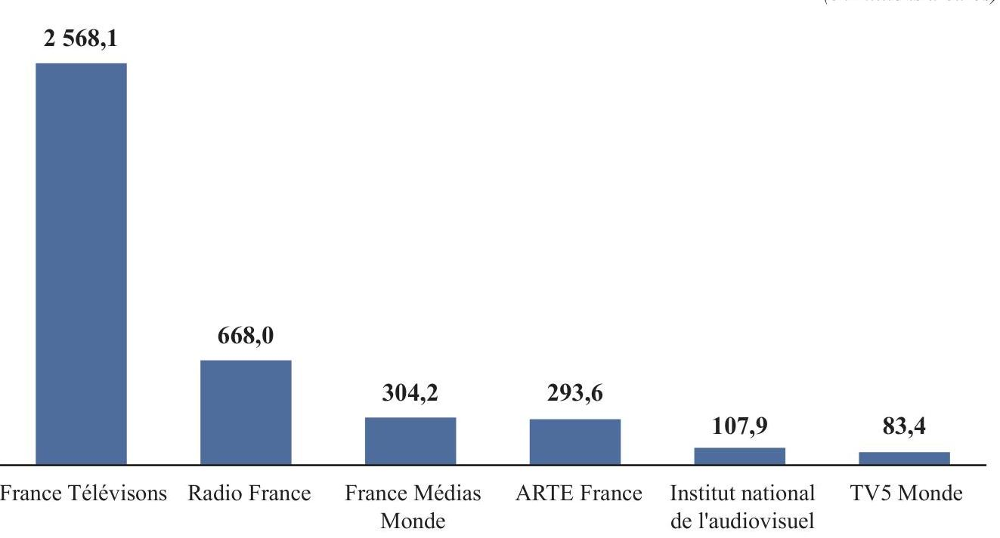

Source : commission des finances
Comme l'était la contribution à l'audiovisuel public, la fraction du produit de la taxe sur la valeur ajoutée destinée à l'audiovisuel public est versée sur un compte de concours financiers (CCF) ${ }^{12}$.

L'article 53 de la loi Léotard modifié par la loi de finances pour $2006^{13}$ prévoit que «chaque année, à l'occasion du vote de la loi de finances, le Parlement, sur le rapport d'un membre de chacune des commissions des finances de l'Assemblée nationale et du Sénat ayant les pouvoirs de rapporteur spécial, approuve la répartition entre les organismes affectataires des ressources publiques retracées au compte de concours financiers». Chacune des sociétés est par la suite chargée le cas échéant d'affecter une partie de leurs ressources à leurs filiales lorsque celles-ci disposent d'une mission de service public.

Le CCF «Avances à l'audiovisuel public » retrace l'intégralité des crédits destinés aux organismes de l'audiovisuel public. Il comprend donc désormais :

- en recettes, la fraction du produit de la taxe sur la valeur ajoutée votée en loi de finances ;
- en dépenses, le montant des avances accordées aux organismes de l'audiovisuel public.

En loi de finances initiale (LFI), six programmes, correspondant aux différentes sociétés de l'audiovisuel public (841 - France Télévisions, 842 - ARTE France, 843 - Radio France, 844- France Médias Monde, 845 - l'Institut national de l'audiovisuel (INA) et 846 - TV5 Monde), composent les dépenses du compte de concours financiers. Un septième programme ( 848 - Programme de transformation) a été créé en loi de finances pour 2024 afin d'affecter une part de financements conditionnés à l'atteinte d'objectifs devant être définis a posteriori dans les contrats d'objectifs et de moyens.

S'agissant du niveau de ces financements, le deuxième alinéa du III de l'article 53 de la loi du 30 septembre 1986 fixe une obligation minimale à l'État : celui-ci doit au moins assurer l'équilibre budgétaire des sociétés d'audiovisuel public afin de couvrir les dépenses nécessaires à l'exécution des missions du service public de ces organismes.

L'article 6 de la loi de finances rectificative pour 2022 dispose qu'une fraction de TVA ne peut abonder en recettes le compte de concours financiers que jusqu'au 31 décembre 2024.

[^0]
[^0]:    ${ }^{12}$ Les comptes de concours financiers sont prévus à l'article 24 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances.
    ${ }^{13}$ Article 46 de la loi n ${ }^{\circ}$ 2005-1719 du 30 décembre 2005 de finances pour 2006.

# B. Une affectation de tva incompatible dès 2025 avec la loi organique relative aux lois de finances 

Cette limitation dans le temps du système d'affectation de TVA, introduite en 2022 à l'initiative du Sénat, visait assurer une conformité du financement de l'audiovisuel public avec l'article 2 de la loi organique du $1^{\text {er }}$ août 2001 relative aux lois de finances (LOLF) ${ }^{14}$.

1. Les modifications introduites en 2021 : un encadrement des modalités d'affectation des ressources de l'État

La rédaction de l'article 2 de la LOLF prévoyait depuis 2001 que les impositions de toutes natures ne pouvaient être directement affectées à un tiers qu'à raison des missions de service public confiées à lui.

## L'affectation de recettes : une dérogation au principe d'universalité budgétaire encadrée par la jurisprudence constitutionnelle

Le principe d'universalité budgétaire est un principe fondamental qui suppose l'absence de corrélation entre la nature des recettes et celle des dépenses lors de l'établissement et du vote d'un budget.

Dans sa décision sur la LOLF ${ }^{15}$, le Conseil constitutionnel a considéré que «les principes de l'annualité, de l'universalité et de l'unité du budget répondent au double impératif d'assurer la clarté des comptes de l'État et de permettre un contrôle efficace par le Parlement».

Plusieurs dérogations existent au principe d'universalité : les affectations d'impositions de toutes natures prévues par l'article 2 de la LOLF, les prélèvements sur recettes relevant de son article 6 et, à l'intérieur du budget de l'État, les trois exceptions à la règle de non-affectation des recettes inscrites à son article 16 : comptes spéciaux, budgets annexes et procédures comptables particulières, notamment les fonds de concours.

Dans sa décision sur la loi de finances pour $2006^{16}$, le Conseil constitutionnel a considéré que l'affectation d'un impôt d'État aux organismes de sécurité sociale était conforme à la Constitution dès lors que les organismes affectataires assuraient essentiellement la gestion d'un service public et que leur liste et leur évaluation figuraient dans les documents remis au Parlement afin de lui permettre de se prononcer en connaissance de cause.

Source : commission des finances

Cette condition a ensuite été modifiée par l'article 3 de la loi organique du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques ${ }^{17}$.

Dans sa version qui résulte de cette dernière évolution, le premier alinéa du II de l'article 2 de la LOLF dispose désormais que les impositions de toutes natures peuvent être directement affectées aux collectivités territoriales, à leurs établissements publics et aux organismes de sécurité sociale, pour lesquelles la condition de service public est présente par défaut.

En revanche, et à l'exclusion des structures limitativement énumérées à ce premier alinéa, le deuxième alinéa du II de l'article 2 de la LOLF limite les possibilités de recourir à un financement par une taxe affectée pour d'autres organismes publics : l'affectation d'une ressource à un tiers autre que les collectivités territoriales et les organismes de sécurité sociale «ne peut être maintenue que si ce tiers est doté de la personnalité morale et si ces impositions sont en lien avec les missions de service public qui lui sont confiées ». La condition du lien des impositions affectées à un tiers avec les missions de service public qui lui sont confiées était une initiative du rapporteur du texte à l'Assemblée nationale.

Par ailleurs, les dispositions relatives aux affectations de recettes au sein du budget de l'État doivent figurer en première partie de la loi de finances ( $3^{\circ}$ du I de l'article 34 de la loi organique).

[^0]
[^0]:    ${ }^{14}$ Loi organique $\mathrm{n}^{\circ} 2001-692$ du $1^{\text {er }}$ août 2001 relative aux lois de finances.
    ${ }^{15}$ Décision $\mathrm{n}^{\circ} 2001-448$ DC du 25 juillet 2001.
    ${ }^{16}$ Décision $\mathrm{n}^{\circ} 2005-530$ DC du 29 décembre 2005.
    ${ }^{17}$ Loi organique $\mathrm{n}^{\circ} 2021-1836$ du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques.

L'article 3 de la loi relative à la modernisation de la gestion des finances publiques précitée a également déplacé au III de l'article 2 de la LOLF le contenu de l'article 36, qui disposait que seule une loi de finances pouvait affecter, totalement ou partiellement, à une autre personne morale une ressource établie au profit de l'État.

Le Conseil Constitutionnel a considéré dans sa décision relative à la loi de modernisation des finances publiques ${ }^{18}$ que l'encadrement des taxes affectées par la nouvelle rédaction de l'article 2 de la LOLF ne méconnaissait aucune disposition constitutionnelle.

# 2. Une caducité du système actuel d'affectation de TVA au $1^{\text {er }}$ janvier 2025 

Aux termes du IV de l'article 3 de la loi organique du 28 décembre 2021, ces dispositions entrent en vigueur lors du dépôt du projet de loi de finances pour l'année 2025. Celui-ci ayant été déposé le 10 octobre 2024, les dispositions de l'article 2 de la LOLF sont donc entrées en vigueur dans leur nouvelle rédaction.

Or, l'affectation d'une fraction de TVA aux organismes de l'audiovisuel public ne satisfait pas la condition de lien entre la ressource publique affectée et la mission de service public assurée par ces mêmes organismes. La TVA est un impôt sur la consommation acquitté par l'ensemble des consommateurs, sans rapport avec les missions du service public audiovisuel.

Afin d'assurer la conformité du mécanisme mis en place lors de la suppression de la CAP, l'article 6 de la loi de finances rectificative précitée pour 2022 prévoit donc à l'initiative du Sénat, que l'affectation d'une fraction du produit de TVA au financement de l'audiovisuel public prendra fin au 31 décembre 2024.

## II. Le dispositif proposé : une dérogation pour l'audiovisuel public au principe de lien entre mission et ressource affectée

L'unique alinéa du présent article modifie le premier alinéa du II de l'article 2 de la LOLF, afin d'inclure les sociétés d'audiovisuel public parmi les organismes pouvant bénéficier d'une affectation directe d'impositions de toutes natures.

Celles-ci pourraient donc être affectées aux sociétés d'audiovisuel public, au même titre qu'aux collectivités territoriales, à leurs établissements publics et aux organismes de sécurité sociale.

En conséquence, les sociétés d'audiovisuel public seraient exclues de l'obligation, figurant au deuxième alinéa du II de l'article 2, de lien entre la ressource affectée et la mission de service public assurée par ces personnes morales, dès lors que cette obligation ne pèse que sur les organismes non mentionnés au premier alinéa du II de ce même article.

## III. La position de la commission des finances : maintenir l'affectation d'un impôt d'État, un mécanisme sécurisant le financement de l'audiovisuel public et assurant son indépendance

## A. La nécessité d'assurer un mode de financement pérenne aux sociétés d'audiovisuel public

1. L'affectation de TVA, un financement conforme à la protection constitutionnelle et européenne de l'indépendance financière des sociétés d'audiovisuel public

## a) Les droits constitutionnels et européens protègent l'audiovisuel public

Les textes fondamentaux européens protègent l'indépendance, y compris financière, des services publics audiovisuels sur le fondement de la liberté d'expression et de communication ${ }^{19}$. Le considérant unique du protocole $\mathrm{n}^{\circ} 29$ annexé au Traité sur le fonctionnement de l'Union européenne ${ }^{20}$ précise que «la radiodiffusion de service public dans les États membres est directement liée aux besoins démocratiques, sociaux et culturels de chaque société ainsi qu'à la nécessité de préserver le pluralisme dans les médias ». Le protocole $\mathrm{n}^{\circ} 29$ se borne cependant à préciser que ces objectifs n'empêchent pas les États membres de pourvoir au financement de la radiodiffusion «aux fins de l'accomplissement de la mission de service public telle qu'elle a été conférée, définie et organisée par chaque État membre » et dans le respect du droit européen de la concurrence.

[^0]
[^0]:    ${ }^{18}$ Décision $\mathrm{n}^{\circ} 2021-831$ DC du 23 décembre 2021.
    ${ }^{19}$ Article 11 de la Charte des droits fondamentaux de l'Union européenne et article 10 de la Convention européenne des droits de l'Homme.
    ${ }^{20}$ Protocole $\mathrm{n}^{\circ} 29$ sur le système de radiodiffusion publique dans les États membres, Traité sur le fonctionnement de l'Union européenne.

Le nouveau règlement européen sur la liberté des médias ${ }^{21}$, partiellement en vigueur depuis mai 2024 et qui le sera totalement à partir du 8 août 2025, inclut diverses dispositions ayant pour objectif de mieux protéger l'indépendance, la liberté et le pluralisme des médias au sein de l'Union européenne. Le troisième alinéa de l'article 5 de ce règlement prévoit que : «les États membres veillent à ce que les procédures de financement des fournisseurs de médias de service public soient fondées sur des critères transparents et objectifs préalablement établis». Ce même alinéa précise que les fournisseurs de médias de service public disposent de « ressources financières suffisantes, durables et prévisibles correspondant à l'accomplissement de leur mission de service public et leur permettant de se développer». L'alinéa 31 du préambule du règlement précise que, dans une optique de prévisibilité de la dépense, le financement public «devrait être déterminé et alloué, de préférence, sur une base pluriannuelle, afin d'éviter les risques d'influence indue liés à des négociations budgétaires annuelles». Cette précision n'est cependant pas normative, au sens où le même alinéa indique que le règlement «n'affecte en rien la compétence des États membres de prévoir le financement des fournisseurs de médias de service public» qui demeurent donc libres de prévoir les modalités de financement ainsi que leur temporalité.

En droit interne, le texte constitutionnel ne mentionne pas explicitement l'audiovisuel public. Le Conseil constitutionnel a cependant protégé par plusieurs décisions l'indépendance, y compris budgétaire, du service public audiovisuel.

La préservation du caractère pluraliste des courants d'expression socio-culturels est définie comme un objectif à valeur constitutionnelle dès $1982^{22}$. Dans sa décision sur la loi de finances rectificative pour $2022^{23}$, le Conseil constitutionnel a considéré que la suppression de la CAP était susceptible d'affecter la garantie des ressources du secteur de l'audiovisuel public «qui constitue un élément de son indépendance, laquelle concourt à la mise en $\square u v r e$ de la liberté de communication».

Le Conseil constitutionnel avait cependant noté dès sa décision sur la loi relative à la communication audiovisuelle de $2009^{24}$ que le législateur pouvait librement fixer la forme que prenait le financement de l'audiovisuel public. Aucune disposition constitutionnelle n'impose en effet un financement spécifique par une affectation de recettes.

Cette réflexion a été approfondie par le Conseil constitutionnel en 2022 : l'article 6 de la loi de finances rectificative pour 2022 avait été déclaré conforme à la Constitution par la décision précitée dès lors que le financement de l'audiovisuel public par une redevance ne saurait être assimilé à un principe fondamental reconnu par les lois de la République.

Le Conseil constitutionnel fixe néanmoins des limites à l'intervention du législateur sur le fondement de la libre communication des pensées et des opinions (article 11 de la Déclaration des droits de l'Homme et du citoyen). La libre communication requiert des conditions d'exercice d'un libre choix entre différents programmes d'information. Si, aux termes de l'article 34 de la Constitution, la loi fixe les règles concernant la liberté, le pluralisme et l'indépendance des médias, le législateur ne pourrait donc priver de ressources l'audiovisuel public si cette suppression entraînait l'impossibilité d'accéder à une information pluraliste. Il n'est donc loisible au législateur de modifier le financement de l'audiovisuel public qu'à la condition d'accorder à ces sociétés des recettes leur permettant d'être «à même d'exercer les missions de service public qui leur sont confiées». Il appartient au législateur de fixer ce montant en loi ordinaire.

Le Conseil constitutionnel ne s'est par ailleurs pas davantage prononcé en 2022 qu'en 2009 sur la forme que devaient prendre ces recettes.
b) Le mode de financement envisagé permettrait de répondre aux exigences constitutionnelles d'indépendance

Plusieurs modes de financement de l'audiovisuel public ont été envisagés depuis la suppression de la CAP.
Le premier est celui d'un financement par crédits budgétaires. La mise en place d'une dotation spéciale aurait pu par exemple être imaginée. Le système de la dotation est utilisé pour de nombreuses institutions, notamment pour les crédits des assemblées parlementaires ou du Conseil constitutionnel. Le mécanisme de la dotation aux pouvoirs publics est prévu à l'article 7 de la LOLF. Dans la pratique, le Gouvernement exclut toute régulation budgétaire en cours d'année car les fonds sont versés à l'organisme attributaire en début d'année, tout en garantissant le maintien de l'information du Parlement par les documents budgétaires.

[^0]
[^0]:    ${ }^{21}$ Règlement (UE) 2024/1083 du Parlement européen et du Conseil du 11 avril 2024 établissant un cadre commun pour les services de médias dans le marché intérieur et modifiant la directive 2010/13/UE. ${ }^{22}$ Décision $\mathrm{n}^{\circ} 82-141$ DC du 27 juillet 1982.
    ${ }^{23}$ Décision $\mathrm{n}^{\circ} 2022-842$ DC du 12 août 2022.
    ${ }^{24}$ Décision $\mathrm{n}^{\circ}$ 2009-577 DC du 3 mars 2009.

La solution de la budgétisation n'emporterait pas nécessairement de risque de revenir sur les garanties d'indépendance de l'audiovisuel public, comme le notait le rapport de l'inspection générale des finances et de l'inspection générale des affaires culturelles préalable à la suppression de la $\mathrm{CAP}^{25}$. Il serait cependant nécessaire de mettre en place des garde-fous, parmi lesquels la mission identifiait la création d'une instance indépendante chargée de l'évaluation des crédits nécessaires au bon fonctionnement du service public de l'audiovisuel, l'inscription dans la LOLF du principe d'exonération de régulation infra-annuelle et l'inscription dans la loi de programmation des finances publiques d'une trajectoire financière pour les sociétés d'audiovisuel public.

Les sociétés d'audiovisuel public perçoivent le système de financement par crédits budgétaires comme moins protecteur et soulèvent des inquiétudes sur les enjeux symboliques qui en découleraient, notamment sur le plan international. Au vu de l'urgence à trouver un mode de financement pouvant prendre le relais du système actuel, le temps manque pour mettre en place les précautions qui pourraient rendre un financement par crédits budgétaires plus acceptable par les sociétés d'audiovisuel public. Au-delà du fait qu'elle fait l'unanimité contre elle de la part de l'ensemble des acteurs du secteur, la solution d'un financement des sociétés d'audiovisuel public par des crédits budgétaires ne paraît donc pas adaptée.

Il convient d'ailleurs de noter que le projet de loi de finances (PLF) pour 2025, tel que déposé par le Gouvernement, a mis en place une budgétisation par défaut, dans la mesure où il s'agit du seul mode de financement qui ne nécessite pas de modification législative de niveau organique. Cette budgétisation est cependant réversible dans l'hypothèse où la présente proposition de loi organique serait adoptée avant la fin de l'examen du projet de loi de finances. Le dossier de présentation du PLF pour 2025 est ainsi explicite : «Pour l'année 2025, le texte initial du PLF prévoit que les crédits relatifs à l'audiovisuel public sont retracés au sein d'une mission, dont les programmes sont abondés par des dotations budgétaires en provenance du budget de l'État. Cette solution ne préempte pas d'éventuelles modifications du cadre organique visant à définir un mode de financement alternatif pour le secteur qui serait décidé par le Parlement $»^{26}$.

Le deuxième scénario ayant émergé ${ }^{27}$ est celui de la mise en place d'un prélèvement sur les recettes de l'État. Ce système, extrêmement dérogatoire au droit budgétaire et dont la mise en place est encadrée par la jurisprudence constitutionnelle, ne paraît pas davantage convenir aux sociétés d'audiovisuel public ${ }^{28}$.

Le troisième scénario est celui de la mise en place d'une nouvelle ressource fiscale affectée ${ }^{29}$. Ce système, qui reviendrait à recréer une nouvelle imposition spécifique, aurait pour avantage de ne pas nécessiter de modification du cadre organique dès lors qu'il serait possible de créer une imposition en lien avec la mission de service public des organismes d'audiovisuel public. Cette option ne paraît cependant guère réaliste. Outre qu'il ne paraît pas souhaitable de revenir sur les gains de pouvoir d'achat induits par la suppression de la CAP, la mise en place d'une nouvelle taxe affectée qui n'aurait pas les défauts de la CAP serait extrêmement complexe alors qu'un nouveau système de financement doit être trouvé avant janvier 2025.

Le quatrième mode de financement, qui est celui prévu au présent article, consiste à pérenniser le système actuel en maintenant pour les années à venir le mécanisme d'affectation d'un montant d'un impôt d'État. Si le choix entre l'imposition affectée relève de la loi de finances et non de la loi organique, il est vraisemblable que le système actuel soit intégralement maintenu et qu'une fraction de TVA continue d'être affectée après 2025.

Ce système n'est pas dénué d'inconvénients. D'une part, il contribue à disperser la «ressource TVA», de plus en plus utilisée pour compenser la suppression d'autres impositions affectées. Le modèle actuel conduit à réduire la part de la TVA revenant à l'État : celui-ci perçoit d'ores et déjà moins de la moitié du produit national de la TVA.

[^0]
[^0]:    ${ }^{25}$ Réforme du financement de l'audiovisuel public, rapport de mission IGAC-IGF, juin 2022.
    ${ }^{26}$ Dossier de presse du projet de loi de finances pour 2025.
    ${ }^{27}$ Proposition de loi organique relative à l'extension des prélèvements sur les recettes de l'État au profit des organismes du secteur audiovisuel public, $\mathrm{n}^{\circ} 5$, déposée à l'Assemblée nationale le samedi 20 juillet 2024.
    ${ }^{28}$ Pour de plus amples analyses des enjeux liés aux prélèvements sur recettes, se reporter au commentaire de l'article 2 de la présente proposition de loi organique.
    ${ }^{29}$ Proposition de loi visant à assurer la qualité et l'indépendance du service public de l'audiovisuel par un financement affecté, juste et pérenne $\mathrm{n}^{\circ} 740$ (2023-2024), déposée au Sénat le 23 juillet 2024.

Répartition des recettes de TVA nette entre l'État et les administrations bénéficiant de TVA affectée
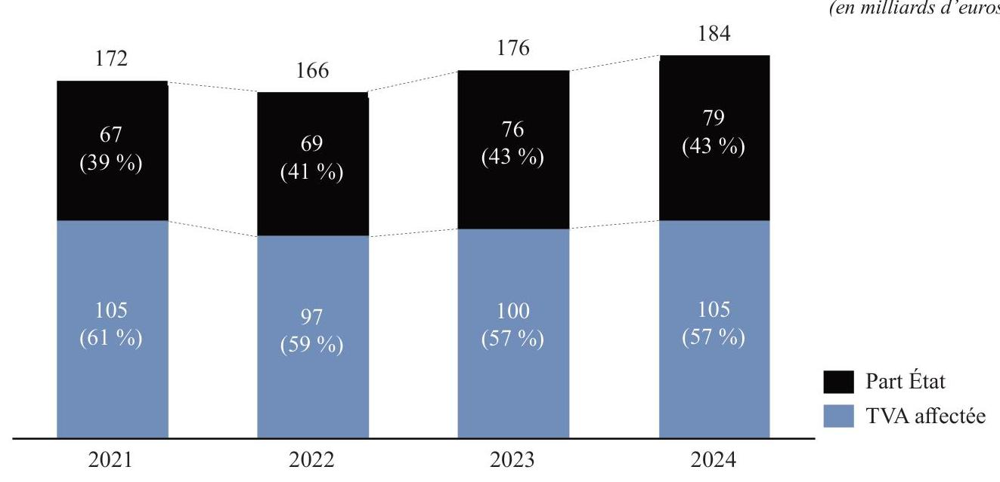

Source : commission des finances
En outre, la TVA est acquittée par tous les Français au quotidien alors que 4,6 millions de foyers bénéficiaient d'un dégrèvement de CAP. Les ménages les plus modestes sont donc conduits à financer l'audiovisuel public.

Toutefois, la solution du financement par un impôt d'État possède l'avantage d'être expérimentée depuis deux ans par les sociétés d'audiovisuel public qui n'ont pas exprimé d'objection à son maintien. L'affectation de taxe permet en théorie aux organismes d'audiovisuel public de ne pas être soumis aux règles de régulation financières infraannuelles (mise en réserve et gels de crédits en cours de gestion en particulier). La mise en place d'une part conditionnelle versée en cours d'année dans le cadre du programme de transformation a cependant permis au Gouvernement de ne verser qu'une fraction des sommes prévues en loi de finances pour 2024, ce qui s'apparente à une forme de régulation infra-annuelle, en dépit de l'origine fiscale de la ressource.

Rien ne s'opposerait par ailleurs à intégrer la fraction de TVA affectée parmi la liste des taxes affectées plafonnées si la fraction ne devait plus être un montant en valeur absolue. La solution d'un plafonnement de l'affectation de recettes, assortie d'un mécanisme de garantie des ressources par le biais d'un complément par le budget de l'État en cas de rendement de la taxe inférieur au niveau prévu, avait d'ailleurs été préconisée par la mission IGF-IGAC mentionnée plus haut en 2022.

# 2. Une sécurisation du mode de financement dont le niveau dépend de la loi de finances 

Le principe d'annualité budgétaire découle de l'article 47 de la Constitution qui prévoit que le Parlement vote un projet de loi de finances pour chaque exercice. La jurisprudence du Conseil constitutionnel considère que «les principes de l'annualité, de l'universalité et de l'unité du budget répondent au double impératif d'assurer la clarté des comptes de l'État et de permettre un contrôle efficace par le Parlement » ${ }^{30}$.

Les conséquences pour l'audiovisuel public des règles constitutionnelles sont claires : il n'est pas possible de fixer une trajectoire pluriannuelle contraignante et le Parlement doit voter annuellement le montant des ressources accordées aux sociétés d'audiovisuel public. Le vocable de «pérennisation» du financement de l'audiovisuel public, fréquemment utilisé dans le débat public, ne saurait donc s'appliquer au montant des ressources accordées. Il demeure loisible au législateur de moduler chaque année à la hausse ou à la baisse le niveau de ressources accordées, dans le respect des garanties constitutionnelles d'indépendance des médias et de préservation du pluralisme.

Tous les modes de financement envisagés impliquent donc un vote annuel du Parlement. Le mécanisme d'un financement par une fraction de TVA affectée ne fait à cet égard pas exception.

[^0]
[^0]:    ${ }^{30}$ Décision $\mathrm{n}^{\circ}$ 2001-448 DC du 25 juillet 2001.

# Procédures d'adoption des différents modes de financement de l'audiovisuel public 

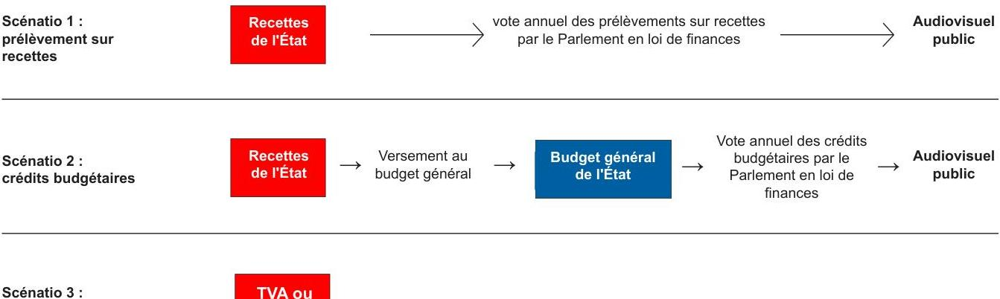

Scénario 3 :
TVA ou création d'une nouvelle taxe

| TVA ou fiscalité affectée | $\longrightarrow$ | vote annuel des taxes affectées par le Parlement en loi de finances | $\longrightarrow$ | Audiovisuel public |
| :--: | :--: | :--: | :--: | :--: |

Source : commission des finances
L'État peut néanmoins fixer une trajectoire de financements pluriannuelle, qui prend la forme des contrats d'objectifs et de moyens (COM) conclus entre l'État et France Télévisions, Radio France, la société en charge de l'audiovisuel extérieur de la France, Arte-France et l'Institut national de l'audiovisuel. Ces contrats sont prévus à l'article 53 de la loi du 30 septembre 1986 relative à la liberté de communication. Ce même article dispose que les COM définissent notamment «le montant des ressources publiques devant lui être affectées en identifiant celles prioritairement consacrées au développement des budgets de programmes».

La trajectoire financière fixée dans les COM relève du niveau contractuel et non législatif. Si leur respect contribue à la prévisibilité des ressources des sociétés d'audiovisuel public et à la simplification de leur gestion, les dispositions financières des COM ne sont pas contraignantes, les lois de programmation ne l'étant pas davantage.

## B. Un maintien du système actuel satisfaisant pour l'audiovisuel public

## 1. Un aménagement de la LOLF qui revient pour le seul audiovisuel public à la situation antérieure à 2021

Le dispositif proposé conduit à revenir, pour les sociétés d'audiovisuel public, sur la modification de la LOLF opérée en 2021.

Le Conseil d'État soulignait, dans son avis sur la réforme de la LOLF, que l'introduction d'une condition de lien «strict» entre la mission de service public confiée à un tiers et la recette qui lui est affectée à ce titre «emporterait des effets massifs sur un nombre important d'affectataires actuels».

Le Sénat avait considéré dans son rapport ${ }^{31}$ sur la proposition de loi organique relative à la modernisation de la gestion des finances publiques que «cette disposition nécessitait en effet une analyse, pour chaque taxe affectée, de l'existence d'une mission de service public liée à l'imposition [...]. Il pourrait donc être risqué, du point du vue du financement des missions exercées par les organismes affectataires, d'inscrire d'ores et déjà cette condition dans la loi organique». Force est de constater que la présente proposition de loi organique matérialise ce risque et confirme les craintes identifiées par Sénat.

La solution de l'intégration de l'audiovisuel public parmi les organismes dispensés de lien entre leur mission de service public et leur mode de financement apparaît donc également la plus solide juridiquement.

## 2. Une nécessaire précision rédactionnelle afin de s'assurer du maintien du système actuel

La rédaction proposée par le présent article vise «les organismes de l'audiovisuel public». Toutefois, il n'est pas certain que cette formulation couvre, outre l'ensemble des cinq sociétés d'audiovisuel public, l'INA qui est un établissement public.

[^0]
[^0]:    ${ }^{31}$ Rapport n ${ }^{\circ} 831$ (2020-2021) de MM. Jean-François Husson et Claude Raynal sur la proposition de loi organique relative à la modernisation de la gestion des finances publiques.

Par ailleurs, les dispositions de l'article 2 de la LOLF étant entrées en vigueur dans leur nouvelle rédaction à la suite du dépôt du PLF pour 2025, il n'y a plus lieu de préciser que la dérogation mise en place par le présent article s'applique à la rédaction résultant de l'article 3 de la loi organique du 28 décembre 2021. Le rapporteur a donc déposé un amendement rédactionnel COM- 2 en ce sens.

Par ailleurs, certaines analyses émises pendant les auditions menées par le rapporteur de la proposition ont avancé le risque que la rédaction initiale du présent article conduise à mettre en place non pas l'affectation d'un montant de TVA, comme c'est le cas depuis deux ans, mais une fraction en proportion de TVA. Si la rédaction actuelle du premier alinéa du II de l'article 2 de la LOLF n'interdit pas l'affectation d'une part d'impôt d'État en valeur absolue, il peut être utile de clarifier que le mécanisme actuel doit être reconduit intégralement, en affectant un montant d'impôt d'État à l'audiovisuel public. Le rapporteur a donc déposé un amendement COM-1 en ce sens. Cet amendement permet d'autre part de préciser que sont concernés les organismes publics de communication audiovisuelle, reprenant ainsi la formulation figurant dans la loi de 1986.

Décision de la commission : la commission des finances a adopté cet article ainsi modifié.

# Article 2 

Introduction de la possibilité de création d'un prélèvement sur recettes à destination de la Chaîne culturelle européenne

Le présent article prévoit la possibilité de mettre en place un prélèvement sur recettes à destination de la Chaîne culturelle européenne, dont est issue la société ARTE France. Comme les autres organismes d'audiovisuel public, celle-ci est financée par une fraction de taxe sur la valeur ajoutée (TVA) depuis la suppression de la contribution à l'audiovisuel public en 2022.

Le mécanisme des prélèvements sur recettes est actuellement limité aux collectivités territoriales et à l'Union européenne. Alors que la jurisprudence constitutionnelle encadre ce système, dérogatoire par rapport aux principes budgétaires, il n'apparaît pas opportun de l'étendre à d'autres organismes. La modification proposée par le présent article reviendrait à mettre sur le même plan collectivités territoriales, Union européenne et ARTE France, alors qu'il n'existe pas de raison de considérer que l'audiovisuel public pourrait seul se voir attribuer un prélèvement sur recettes, quand d'autres entités pourraient bientôt avancer elles aussi la protection de leur indépendance pour bénéficier d'un tel mécanisme.

En outre, les prélèvements sur recettes n'apportent aucune garantie supplémentaire pour les sociétés d'audiovisuel public par rapport à une part de fiscalité affectée. En effet, le montant d'un prélèvement sur recettes peut être minoré en loi de finances, tout comme un montant de taxe affectée. En outre, la jurisprudence constitutionnelle impose de définir strictement les critères d'attribution du prélèvement du recettes.

Alors que le système actuel d'affectation d'une fraction de TVA à ARTE France n'a pas soulevé de difficulté spécifique, il n'y a pas lieu de prévoir la mise en place d'une dérogation pour cette société par rapport aux autres organismes d'audiovisuel public. ARTE France bénéficierait donc, au même titre que les autres sociétés d'audiovisuel public, du mode de financement ouvert par l'article $1^{\text {er }}$ de la proposition de loi organique.

La commission a supprimé cet article.

## I. Le droit existant : un financement d'ARTE France par une fraction de taxe sur la valeur ajoutée et non par un prélèvement sur recettes

A. Comme les autres sociétés d'audiovisuel public, ARTE France est financée depuis 2022 par une fraction de taxe sur la valeur ajoutée

1. ARTE France, une société d'audiovisuel public de coopération culturelle intégrée à un groupe international

ARTE France est une société anonyme entièrement détenue par des capitaux publics ${ }^{32}$ dont l'objet est la production et la diffusion de programmes audiovisuels. Il s'agit d'une des trois entités du groupement européen d'intérêt

[^0]
[^0]:    ${ }^{32}$ Article 45 de la loi $n^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication dite «loi Léotard » modifié par l'article 6 de la loi $n^{\circ} 2000-719$ du $1^{\text {er }}$ août 2000 .

économique (GEIE) ARTE (Association Relative à la Télévision Européenne). Le GEIE ARTE, constitué le 16 septembre 1991, est issu de la Chaîne culturelle européenne établie par un traité signé entre la France et plusieurs Lander allemands le 2 octobre $1990^{33}$.

Le GEIE est constitué par trois pôles : outre ARTE France, en font partie ARTE Deutschland et une structure commune qui constitue le siège social du groupe (également dénommée ARTE GEIE). ARTE France a en outre trois filiales ou sous-filiales (ARTE France développement, ARTE éducation et ARTE France cinéma).

# Schéma de l'organisation du groupe ARTE 

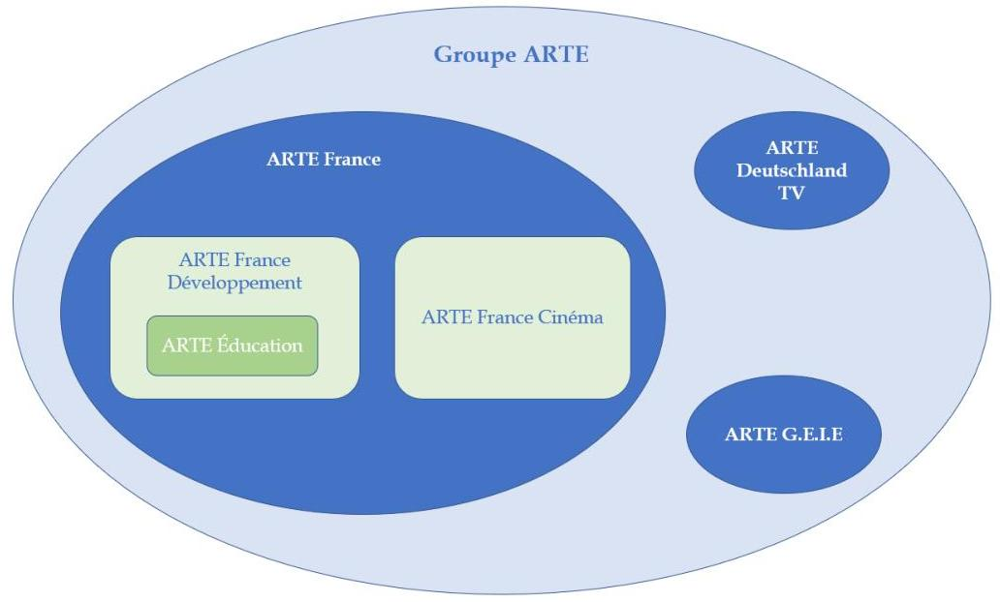

Source : commission des finances
L'article 45 de la loi du 30 septembre 1986 dite «loi Léotard ${ }^{34}$, tel que modifié par la loi ${ }^{\circ}$ 2000-719 du $1^{\text {er }}$ août 2000, fixe le régime juridique d'ARTE France en droit interne. Cet article dispose que la société ARTE France est chargée de concevoir et de fournir les programmes et les moyens nécessaires à l'exercice des missions du groupement européen d'intérêt économique ARTE. Il prévoit que les émissions diffusées par ARTE France doivent «tenir compte du caractère international, en particulier européen, de son public».

Les engagements de l'État et d'ARTE France figurent au sein d'un contrat d'objectifs et de moyens (COM). Le COM actuel, prolongé par avenant en mars 2023, prendra fin en $2024^{35}$.

## 2. Depuis 2022, ARTE est financée par une fraction de taxe sur la valeur ajoutée

Depuis la suppression de la contribution à l'audiovisuel public (CAP) par l'article 6 de la première loi de finances rectificative pour $2022^{36}$ modifiant l'article 46 de la loi de finances pour $2006^{37}$, ARTE France est, à l'instar des autres sociétés d'audiovisuel public, financée par l'affectation d'une fraction de taxe sur la valeur ajoutée (TVA) ${ }^{38}$.

L'état D de la loi de finances pour $2024^{39}$ prévoit que le montant de cette fraction de TVA accordé à ARTE France s'élève à 295,1 millions d'euros.

[^0]
[^0]:    ${ }^{33}$ Traité entre la République française et les Lander de Bade-Wurtemberg, de l'État libre de Bavière, de Berlin, de la Ville libre hanséatique de Brême, de la Ville libre hanséatique de Hambourg, de Hesse, de Basse-Saxe, de Rhénanie du Nord-Westphalie, de Rhénanie-Palatinat, de Sarre, du SchleswigHolstein sur la chaîne culturelle européenne, signé à Berlin le 2 octobre 1990.
    ${ }^{34}$ Loi $n^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication.
    ${ }^{35}$ ARTE France, avenant 2023-2024 au Contrat d'objectifs et de moyens 2020-2022.
    ${ }^{36}$ Loi $n^{\circ} 2022-1157$ du 16 août 2022 de finances rectificative pour 2022.
    ${ }^{37}$ Loi $n^{\circ} 20051719$ de finances pour 2006.
    ${ }^{38}$ Pour davantage de précisions sur la suppression de la CAP et la mise en place d'un financement par une fraction de TVA, le lecteur est invité à se reporter au commentaire de l'article 1 du présent texte.
    ${ }^{39}$ Loi $n^{\circ} 2023-1322$ du 29 décembre 2023 de finances pour 2024.

La fraction de TVA versée en 2024 représente une diminution de 8,4 millions d'euros par rapport aux montants inscrits en loi de finances initiale pour 2023 et une hausse de 16,5 millions d'euros par rapport à 2022. Toutefois, la loi de finances de fin de gestion pour $2023^{40}$ a diminué de 26 millions d'euros le montant de la fraction de taxe sur la valeur ajoutée perçu par ARTE France sur les deux années 2022 et 2023. Cette baisse constituait un simple ajustement technique qui découlait d'une compensation des effets fiscaux de la suppression de la CAP inférieure à celle anticipée. Les montants effectivement perçus par ARTE France ont donc augmenté de 24,36 millions d'euros entre 2022 et 2024 et de 10,4 millions d'euros entre 2022 et 2023, comparable à l'inflation observée sur la période.

Financements attribués à ARTE France depuis 2022
(en millions d'euros en $A E=C P$ )
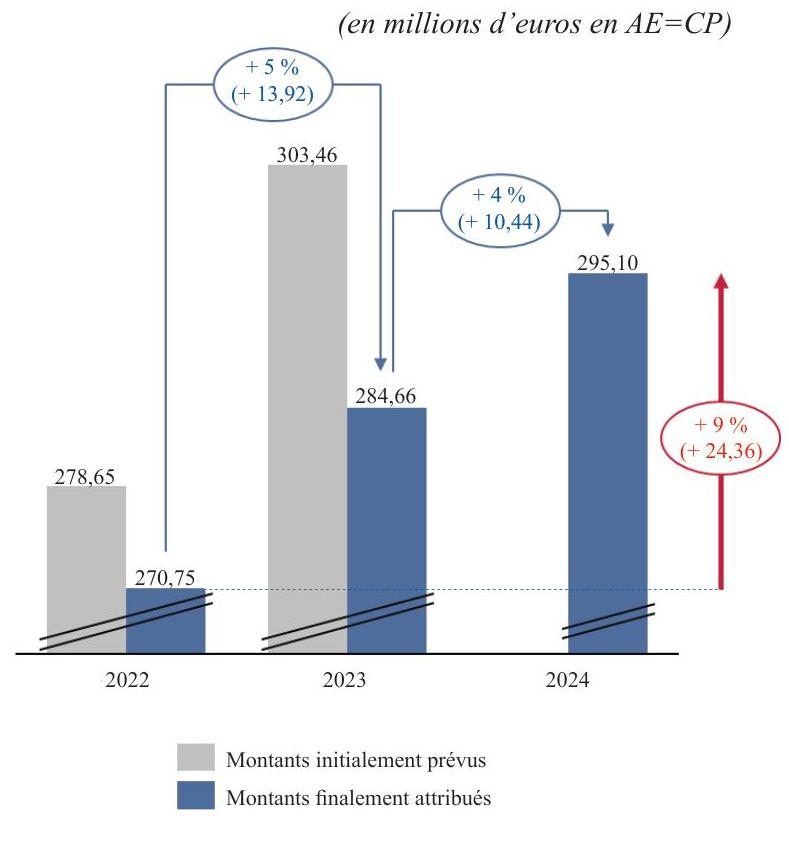

Source : commission des finances
Une partie de ces montants sont ensuite reversés au GEIE, qu'ARTE France finance à parité avec ARTE Deutschland. ARTE France a indiqué au rapporteur que le changement du mode de financement avait nécessité la formalisation de certaines prestations intervenant de manière régulière entre ARTE France et ARTE GEIE.

# B. Les prélèvements sur recettes, un mécanisme budgétaire dérogatoire qui ne peut aujourd'hui bénéficier à une société d'audiovisuel public 

## 1. Un mécanisme actuellement limité à l'Union européenne et aux collectivités territoriales

L'article 6 de la loi organique relative aux lois de finances (LOLF) ${ }^{41}$ définit, dans son quatrième alinéa, le principe des prélèvements sur recettes (PSR). Ce mécanisme a été créé en 1969 pour compenser le produit de la suppression d'impôts locaux. En 1971, la même procédure a été mise en œuvre s'agissant de la contribution de la France aux Communautés européennes ${ }^{42}$.

L'article 6 de la LOLF prévoit qu'un montant déterminé de recettes de l'État peut être rétrocédé directement au profit soit des collectivités territoriales, soit de l'Union européenne.

[^0]
[^0]:    ${ }^{40}$ Loi $n^{\circ}$ 2023-1114 du 30 novembre 2023 de finances de fin de gestion pour 2023.
    ${ }^{41}$ Loi organique $\mathrm{n}^{\circ}$ 2001-692 du 1 août 2001 relative aux lois de finances.
    ${ }^{42}$ Jean-Pierre Camby, «Le budget et les principes budgétaires», dans Le budget de l'État : la LOLF, $4^{e}$ édition, 2019, LGDG, p. 54.

Ces prélèvements ont pour objet :

- soit de couvrir des charges incombant à ces bénéficiaires ;
- soit de compenser des exonérations, des réductions ou des plafonnements d'impôts établis au profit des collectivités territoriales.

Le prélèvement sur recettes (PSR) est un outil budgétaire qui permet à des opérations a priori assimilables à des dépenses, car donnant lieu à des décaissements, d'être traitées comme des opérations sur recettes.

Plus précisément, d'un point de vue budgétaire, les montants des prélèvements sur recettes sont déduits de l'ensemble des recettes de l'État et n'apparaissent pas dans la partie dépenses. Les PSR constituent à ce titre une modalité de gestion très dérogatoire aux principes budgétaires de non contraction et de non affectation des recettes, qui ne trouve à s'appliquer que dans des cas extrêmement limités.

Le mécanisme a fait l'objet d'un encadrement par la jurisprudence du Conseil constitutionnel notamment dans des décisions du 29 décembre 1982, du 29 décembre 1998 et du 25 juillet $2001^{43}$.

Le Conseil constitutionnel a tout d'abord considéré que «le mécanisme des prélèvements sur recettes répond[ait] à des nécessités pratiques». Il a ensuite admis la constitutionnalité de ces prélèvements puisque leur mécanisme «ne comporte pas, comme l'impliquerait un système d'affectation, l'établissement d'une corrélation entre une recette de l'État et une dépense incombant à celui-ci ; qu'il s'analyse en une rétrocession directe d'un montant déterminé de recettes de l'État au profit des collectivités locales ou des communautés européennes en vue de couvrir des charges qui incombent à ces bénéficiaires et non à l'État et qu'il ne saurait, dans ces conditions, donner lieu à une ouverture de crédits dans les comptes des dépenses du budget de l'État».

La constitutionnalité de ces prélèvements est cependant soumise au respect de plusieurs conditions :

- les bénéficiaires et l'objet des prélèvements doivent être précisément et limitativement définis. Il s'agit des collectivités territoriales d'une part, de l'Union européenne d'autre part ;
- les objectifs de clarté des comptes et d'efficacité du contrôle parlementaire doivent être satisfaits, ce qui doit être assuré par l'indication, dans les documents annexés au projet de loi de finances, de justifications aussi précises qu'en matière de recettes et de dépenses, ainsi que de l'analyse des prévisions de chaque prélèvement sur les recettes de l'État.
2. Le montant des prélèvements sur recettes est fixé annuellement par le Parlement lors du vote de la loi de finances

Le cinquième alinéa de l'article 6 de la LOLF dans sa version résultant de la loi de la loi organique relative à la modernisation des finances publiques ${ }^{44}$ dispose que «les prélèvements sur les recettes de l'État sont, dans leur montant, évalués de façon précise et distincte dans la loi de finances». La création d'un prélèvement sur recettes relève en outre du domaine exclusif des lois de finances.

Cette évaluation prend habituellement la forme de deux articles de la première partie de la loi de finances, qui évaluent, d'une part, le montant de chacun des prélèvements opérés sur les recettes de l'État au profit des collectivités territoriales et, d'autre part, le montant du prélèvement effectué sur les recettes de l'État au titre de la participation de la France au budget de l'Union européenne. Leur montant global est retracé dans le tome I de l'Évaluation des voies et moyens, annexée à chaque projet de loi de finances initiale.

# II. Le dispositif proposé : la possibilité de créer un prélèvement sur recettes bénéficiant à ARTE 

L'alinéa unique du présent article prévoit de compléter le quatrième alinéa de l'article 6 de la LOLF en prévoyant que, outre l'Union européenne et les collectivités territoriales, un montant déterminé de recettes de l'État puisse être rétrocédé directement au profit de la Chaîne culturelle européenne. La Chaîne culturelle européenne est la dénomination d'ARTE mentionnée dans le traité franco-allemand du 2 octobre 1990 précité.

Il convient de noter que l'institution du prélèvement sur recettes relève de la loi de finances et non de la loi organique. Le présent article n'en ouvre que la possibilité.

[^0]
[^0]:    ${ }^{43}$ Décisions $\mathrm{n}^{\circ} 82-154$ DC du 29 décembre 1982 sur la loi de finances pour 1983, $\mathrm{n}^{\circ} 98-405$ DC du 29 décembre 1998 sur la loi de finances pour 1999 et $\mathrm{n}^{\circ}$ 2001-448 DC du 25 juillet 2001 sur la loi organique relative aux lois de finances.
    ${ }^{44}$ Loi organique $\mathrm{n}^{\circ} 2021-1836$ du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques.

# III. La position de la commission des finances : la création d'un prélèvement sur recettes, un précédent qui n'est pas justifié par la situation spécifique d'ARTE 

## A. Le prélèvement sur recettes, un outil très dérogatoire au droit budgétaire dont l'extension serait juridiquement fragile

1. Le mécanisme des prélèvements sur recettes est encadré par la jurisprudence constitutionnelle et ne saurait être confondu avec l'affectation d'un impôt d'État

Comme indiqué plus haut, le mécanisme des PSR est défini par la jurisprudence du Conseil constitutionnel comme «une rétrocession directe d'un montant déterminé de recettes de l'État au profit des collectivités locales ou des communautés européennes en vue de couvrir des charges qui incombent à ces bénéficiaires et non à l'État et qu'il ne saurait, dans ces conditions, donner lieu à une ouverture de crédits dans les comptes des dépenses du budget de l'État $»^{45}$.

Dans sa décision relative à la loi de finances pour $1983^{46}$, le Conseil constitutionnel avait été encore davantage explicite sur les limites applicables au mécanisme des prélèvements sur recettes : un PSR, mécanisme dérogatoire au principe d'universalité budgétaire, ne peut être mis en place pour la couverture de charges de l'État. Si la base juridique n'est plus la même, la LOLF ayant remplacé l'ordonnance de $1959^{47}$, cette jurisprudence n'en est pas pour autant caduque, dès lors que le Conseil constitutionnel examinait la constitutionnalité du mécanisme et non sa conformité aux dispositions de l'ordonnance.

La mise en place d'un PSR pour tout ou partie de l'audiovisuel public pourrait donc être contraire à ce dernier point. Les PSR n'ont été jugés conformes par le Conseil constitutionnel que parce que celui-ci a considéré que les collectivités territoriales comme l'Union «étaient des organismes «extérieurs » à l'État et qu'[ils] pouvaient ainsi être soustraits au corps principal du budget» ${ }^{48}$. Tel n'est pas le cas des sociétés d'audiovisuel public, qui, bien qu'étant des sociétés anonymes, sont détenues par l'État. Le cas de l'Institut national de l'audiovisuel, qui n'a pas la forme d'une société anonyme mais celle d'un établissement public à caractère industriel et commercial (EPIC), est d'autant plus ambigu.

La jurisprudence constitutionnelle conduit en outre à effectuer une stricte séparation entre le mécanisme des PSR et celui des taxes affectées, y compris s'agissant d'impôts perçus au profit de l'État et affectés à un tiers.

Les PSR sont des prélèvements sur l'ensemble des recettes fiscales et non fiscales, avant reversement au budget général de l'État. La décision du Conseil constitutionnel de 1982 précédemment citée précise que le mécanisme des PSR «ne comporte pas, comme l'impliquerait un système d'affectation, l'établissement d'une corrélation entre une recette de l'État et une dépense incombant à celui-ci». Le versement d'une fraction de TVA est à l'inverse une affectation d'une ressource spécifique après reversement au budget général.

Sauf à considérer que cette corrélation ne puisse prendre que la forme d'un pourcentage de taxe affectée, le rapporteur n'a pas connaissance d'autres éléments dans la jurisprudence du Conseil constitutionnel permettant de conclure que le fait de fixer un montant affecté d'un impôt d'État à un organisme tiers pourrait être assimilable à la création d'un PSR. En conséquence, le maintien du système actuel de financement de l'audiovisuel public par une fraction de TVA n'implique pas de modification de l'article 6.

## 2. Un risque de précédent

Le rapporteur indiquait en $2022^{48}$ que la solution du prélèvement sur recettes apparaissait «peu réaliste. Elle reviendrait à mettre sur le même plan collectivités territoriales, Union européenne et sociétés de l'audiovisuel public».

[^0]
[^0]:    ${ }^{45}$ Décision $\mathrm{n}^{\circ} 82-154$ DC du 29 décembre 1982.
    ${ }^{46}$ Idem.
    ${ }^{47}$ Ordonnance $\mathrm{n}^{\circ}$ 59-2 du 2 janvier 1959 portant loi organique relative aux lois de finances.
    ${ }^{48}$ La jurisprudence du Conseil constitutionnel en matière budgétaire et financière, Claire Bazy-Malaurie - Intervention à l'occasion d'un déplacement au Conseil constitutionnel du Maroc, le 18 octobre 2010.
    ${ }^{49}$ Changer de cap pour renforcer la spécificité, l'efficacité et la puissance du service public, rapport d'information $\mathrm{n}^{\circ} 651$ (2021 2022) de MM. Roger Karoutchi et Jean Raymond Hugonet, fait au nom de la commission de la culture, de l'éducation et de la communication et de la commission des finance - 8 juin 2022 .

Il n'existe pas de raison de considérer que l'audiovisuel public pourrait seul se voir attribuer un prélèvement sur recettes, quand d'autres entités, autorités indépendantes ou constitutionnelles, pourraient bientôt avancer elles aussi la protection de leur indépendance pour bénéficier d'un tel mécanisme.

Alors même que, comme indiqué supra, il existe des doutes sur la conformité à la Constitution de l'extension des prélèvements sur recettes, le rapporteur s'inquiète des risques liés au dévoiement d'un outil qui, actuellement, ne bénéficie à aucune personne publique autre que les collectivités et l'Union européenne.

La mise en place d'une dérogation spécifique au principe général de limitation des taxes affectées au seul bénéfice de l'audiovisuel public, prévue par l'article $1^{\text {er }}$ de la présente proposition de loi organique, pourrait certes elle constituer une incitation vis-à-vis d'autres opérateurs de l'État ne bénéficiant pas de cette dérogation. Cette remarque mérite en effet d'être soulevée, mais on ne saurait mettre sur le même plan le maintien d'une situation existante qui bénéficie déjà également à nombre d'organismes, d'une part, et l'innovation pouvant être qualifiée de déraisonnable que constitue la mise en place d'un prélèvement sur recettes ad hoc au profit de l'audiovisuel public, d'autre part.

# 3. Des difficultés rédactionnelles liées à la définition de la Chaîne européenne 

Le présent article mentionne la possibilité de mettre en place un prélèvement sur recettes à destination de la Chaîne culturelle européenne. Or la Chaîne culturelle européenne n'est pas le nom de la société anonyme détenue par l'État français et qui perçoit aujourd'hui une fraction de TVA affectée.

ARTE France est en effet le seul interlocuteur financier direct de l'État. Le schéma de financement interne au groupe ARTE suppose en effet que l'État finance ARTE France, à charge pour cette société de reverser une partie de ce montant au GEIE. Dans sa rédaction actuelle, le présent article conduirait en revanche à mettre en place un PSR non pas à destination d'ARTE France, mais du GEIE.

## B. Un niveau de protection de l'indépendance des sociétés d'audiovisuel public qui n'est pas plus élevé que par un financement par une recette fiscale affectée

## 3. Le montant d'un prélèvement sur recettes dépend du vote annuel de la loi de finances

La solution d'un prélèvement sur recettes ne s'avère pas plus protectrice pour l'audiovisuel public que celle d'un financement par une taxe affectée. Une taxe affectée, tout comme un PSR, limite la possibilité pour le Gouvernement de mettre en place une régulation budgétaire infra-annuelle sans texte financier, dans la mesure où il n'y a pas de possibilité réglementaire de gel, de report, de surgel ou de virements de crédits.

Comme indiqué dans le commentaire de l'article $1^{\text {er }}$ de la présente proposition de loi organique, le montant des PSR fait l'objet d'un vote annuel dans le cadre du projet de loi de finances. Il est donc loisible au Parlement comme au Gouvernement de diminuer le montant attribué aux sociétés de l'audiovisuel public, de la même manière que pour une taxe (ou fraction de taxe) affectée.

En outre, le montant d'un prélèvement sur recettes n'est «qu'évalué » en loi de finances, aux termes de l'article 6 de la LOLF. L'attribution des financements entre chaque société dépendrait ensuite de critères eux-mêmes fixés dans le cadre de la loi de finances, afin que le montant du PSR soit évalué «de façon précise et distincte».

Il convient d'ailleurs de noter que le Conseil constitutionnel veille à la précision de la définition de ces critères en loi de finances. Il a ainsi déclaré contraire à la loi organique en 2019 un PSR destiné à couvrir les charges liées, pour la Polynésie française, aux déséquilibres d'ordre économique provoqués par l'arrêt des activités du centre d'expérimentation du Pacifique ${ }^{50}$. Si un PSR devait être institué pour une société d'audiovisuel public, le législateur pourrait être contraint d'aller plus en détail dans l'identification des dépenses, ce qui pourrait se trouver davantage contraignant pour la société bénéficiaire.
4. Un prélèvement sur recettes ne répond pas plus aux engagements internationaux d'ARTE que l'affectation d'une fraction de TVA

Le Traité de 1990 sur la Chaîne culturelle européenne dont est issu le groupement ARTE ne comporte aucune stipulation relative aux modalités de financement. En conséquence, le mode de financement ne relève pas du niveau du traité proprement dit, mais de celui de conventions bilatérales.

[^0]
[^0]:    ${ }^{50}$ Décision $\mathrm{n}^{\circ}$ 2019-784 DC du 27 juin 2019.

Il convient d'ailleurs de noter que d'autres sociétés d'audiovisuel public ou leurs filiales bénéficient de cofinancements internationaux. Ainsi, Canal France international, filiale du groupe France Médias Monde est notamment financée par une subvention de l'Agence Française de Développement (AFD) mais aussi par l'Union européenne, directement ou au travers d'Expertise France.

Le système actuel d'affectation d'une fraction de TVA à ARTE France ne pose d'ailleurs pas de difficulté spécifique au regard des mécanismes de reversement au sein du GEIE. Le rapporteur considère donc qu'il n'y a pas lieu de traiter différemment ARTE France des autres organismes d'audiovisuel public.

En conséquence, et eu égard aux limites que présenterait l'institution d'un prélèvement sur recettes, il propose de supprimer le présent article par l'adoption de son amendement COM-3.

Décision de la commission : la commission des finances a supprimé cet article.

# Article 3 

Gage financier

Le présent article prévoit de gager financièrement les conséquences résultant pour l'État des dispositions de la présente proposition de loi organique.

La commission a adopté cet article tel que modifié par un amendement rédactionnel.

Les dispositions de l'article 40 de la Constitution, que doivent respecter les propositions de loi organiques tout comme les propositions de loi ordinaires, prévoient que «les propositions et amendements formulés par les membres du Parlement ne sont pas recevables lorsque leur adoption aurait pour conséquence, soit une diminution des ressources publiques, soit la création ou l'aggravation d'une charge publique».

Si cette rédaction proscrit toute création ou aggravation d'une charge publique par la voie d'une initiative parlementaire, de sorte qu'une dépense ne peut être compensée, elle autorise cependant la compensation des diminutions de ressources publiques, sous certaines conditions. Aussi, la diminution doit être intégralement compensée par la création d'une ressource nouvelle ou par le relèvement d'une ressource existante à due concurrence.

Le présent article vise à prévoir un mécanisme de compensation financière des charges qui résulteraient, pour l'État, de l'adoption des dispositions de la présente proposition de loi organique. L'existence d'un gage est justifiée par le fait que l'affectation d'une ressource fiscale perçue au profit de l'État, tout comme la création d'un prélèvement sur recettes, constituent une perte de recettes pour l'État devant être compensée.

La commission propose d'adopter cet article avec une modification rédactionnelle visant à préciser que le gage vise à compenser la perte de recettes résultant pour l'État de la présente loi organique. Tel est l'objet de l'amendement COM-4 du rapporteur.

Position de la commission : la commission des finances a adopté cet article ainsi modifié.

# Examen en commission 

Réunie le mercredi 16 octobre 2024 sous la présidence de M. Claude Raynal, président, la commission des finances a examiné le rapport de M. Jean-Raymond Hugonet sur la proposition de loi organique $\mathbf{n}^{\circ} 720$ (2023-2024) portant réforme du financement de l'audiovisuel public.
M. Claude Raynal, président. - Nous passons à l'examen de la proposition de loi organique portant réforme du financement de l'audiovisuel public. Je salue la présence parmi nous de $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly, auteure de la proposition de loi.
M. Jean-Raymond Hugonet, rapporteur. - La proposition de loi a été inscrite à l'ordre du jour de nos travaux le 2 octobre dernier et je n'ai été nommé rapporteur que le 9 octobre. Elle sera examinée en séance publique le 23 octobre prochain - cela fait quinze jours pour s'interroger sur la réforme de la loi organique relative aux lois de finances (Lolf)...

La situation acrobatique dans laquelle se trouve le Parlement démontre une fois de plus l'impéritie du précédent gouvernement sur le sujet, alors que nous nous préoccupons de ce sujet depuis l'été 2022. Le Parlement doit encore légiférer dans l'urgence.

Dès 2022, le Président de la République a annoncé la suppression de la contribution à l'audiovisuel public. J'avais salué cette idée, car la contribution devenait obsolète avec la suppression de la taxe d'habitation. Mais le gouvernement d'alors n'a rien anticipé. Nous avons donc dû trouver en toute hâte une solution de substitution, passant par la taxe sur la valeur ajoutée (TVA), ce qui avait l'inconvénient de peser sur tous les consommateurs, y compris les contribuables les moins favorisés. Par ailleurs, cette solution disperse encore le produit de la TVA, alors que l'État perçoit désormais moins de la moitié de son produit.

Le Sénat avait souligné dès l'été 2022 que cette solution ne pouvait être que temporaire. En effet, la réforme de la Lolf cette même année avait établi une condition de lien entre une ressource et la mission de service public qu'elle finance.

Cette modification est entrée en vigueur lors du dépôt du projet de loi de finances (PLF) pour 2025. Désormais, les organismes publics ne peuvent bénéficier d'une taxe affectée que si celle-ci est en lien avec les missions exercées par les organisations en question. L'affectation de TVA, qui est un impôt de grande consommation, ne satisfait pas cette condition : sans révision de la loi organique, le mécanisme de financement retenu depuis 2022 ne pourrait donc être reconduit.

C'est la raison pour laquelle les auteurs de la présente proposition de loi organique (PPLO) ont pris la décision l'été dernier de déposer un texte permettant de sortir, dans l'urgence, de cette impasse.

À défaut, le Gouvernement serait contraint de financer l'audiovisuel public par des crédits budgétaires. C'est d'ailleurs le cas dans le PLF tel qu'il vient d'être déposé, en attendant la possible adoption de la PPLO. Ce type de financement permet au gouvernement de mettre en place une régulation budgétaire infra-annuelle sans texte financier. Les sociétés de l'audiovisuel public perçoivent donc le système de financement par crédits budgétaires comme moins protecteur, et soulèvent des inquiétudes sur les enjeux symboliques qui en découleraient, notamment sur le plan international. Au vu de l'urgence à trouver un mécanisme satisfaisant, la budgétisation ne paraît donc pas souhaitable.

J'en viens maintenant au contenu de la PPLO : l'article $1^{\text {er }}$ modifie l'article 2 de la Lolf afin d'inclure les sociétés d'audiovisuel public parmi les organismes pouvant bénéficier d'une affectation directe d'impôts d'État. Il devrait permettre de prolonger l'affectation d'un montant de TVA lors de l'examen du PLF pour 2025 : cette solution a pour avantage d'être déjà expérimentée par les sociétés d'audiovisuel public depuis deux ans, sans avoir suscité de difficultés majeures.

Je note ici que le vocable de « pérennisation» du financement de l'audiovisuel public, fréquemment utilisé dans le débat, ne saurait s'appliquer au montant des ressources accordées. Vous le savez, il n'est bien sûr pas possible, sur le plan constitutionnel, de fixer une trajectoire pluriannuelle contraignante : le Parlement doit voter annuellement - et c'est heureux - le montant des ressources accordées aux sociétés d'audiovisuel public, dans le respect des garanties constitutionnelles d'indépendance des médias et de préservation du pluralisme. Le mécanisme d'un financement par une fraction de TVA affectée ne fait bien entendu pas exception.

Certaines analyses émises au cours des auditions que j'ai menées ont évoqué le risque que la rédaction initiale de l'article $1^{\text {er }}$ conduise à mettre en place non pas l'affectation d'un montant de TVA, comme c'est le cas depuis deux ans, mais une fraction en proportion de TVA. Il peut être utile de clarifier que le mécanisme actuel doit être reconduit intégralement, en affectant un montant d'impôt d'État à l'audiovisuel public.

Je vous propose donc un amendement COM-1 en ce sens. Cette précision permettra d'éviter une évolution automatique, à la hausse comme à la baisse, du montant versé chaque année à l'audiovisuel public.

L'article 2, quant à lui, prévoit la possibilité de mettre en place un prélèvement sur recettes (PSR) à destination d'Arte France, qui est financée par une fraction de TVA depuis 2022. Cet article soulève plusieurs difficultés.

Tout d'abord, le mécanisme des prélèvements sur recettes est actuellement limité à l'Union européenne et aux collectivités territoriales : nous avons régulièrement l'occasion d'examiner en PLF des amendements portants sur des PSR à destination des collectivités, en premier lieu la célèbre dotation globale de fonctionnement (DGF). La modification proposée par le présent article reviendrait à mettre sur le même plan les collectivités territoriales, l'Union européenne et Arte France.

Ce mécanisme dérogatoire est en outre strictement encadré par la jurisprudence constitutionnelle, il n'apparaît donc pas opportun de l'étendre à d'autres organismes. Il n'existe en effet pas de raisons de considérer que l'audiovisuel public pourrait seul se voir attribuer un PSR quand d'autres entités pourraient bientôt avancer, elles aussi, la protection de leur indépendance pour bénéficier d'un tel mécanisme. De surcroît, les PSR n'apportent aucune garantie supplémentaire pour les sociétés d'audiovisuel public par rapport à une part de fiscalité affectée : en effet, le montant d'un PSR n'est qu'évaluatif et peut être minoré en loi de finances, tout comme un montant de taxe affectée.

La jurisprudence constitutionnelle impose également de définir strictement les critères d'attribution du PSR. À titre d'exemple, cette commission est souvent confrontée à la suppression d'impôts locaux, les collectivités préférant généralement se voir attribuer une fraction de TVA par rapport à un PSR, alors même que le PSR lui-même peut être dynamique.

Il faut également noter que le PSR ne répond pas plus aux engagements internationaux d'Arte que l'affectation d'une fraction de TVA. Le système actuel n'a d'ailleurs pas soulevé de difficultés spécifiques, il n'y a donc pas lieu de prévoir la mise en place d'une dérogation par rapport aux autres organismes.

C'est la raison pour laquelle je vous propose d'adopter l'amendement COM-3 de suppression de l'article 2. Arte France bénéficierait donc, au même titre que les autres sociétés d'audiovisuel public, du mode de financement ouvert par l'article $1^{\text {er }}$.

Je vous propose enfin d'adopter deux amendements rédactionnels, l'un pour l'article $1^{\text {er }}$, l'autre pour l'article 3.
L'audiovisuel public doit, selon moi, se réorganiser très rapidement et je regrette que la fusion envisagée avant juin dernier ait été interrompue sine die par la dissolution de l'Assemblée nationale. Néanmoins, nous devons assumer nos responsabilités pour assurer à court terme un financement pérenne et lisible pour l'audiovisuel public.

Je vous propose donc d'adopter cette PPLO modifiée par les amendements que je vous ai présentés. Si le texte parvient au terme de son parcours législatif avant l'adoption du PLF pour 2025, nous pourrons en tirer les conséquences lors de son examen au Sénat.
M. Jean-François Husson, rapporteur général. - L'audiovisuel public est un sujet extrêmement sensible, auquel nous sommes très nombreux à nous intéresser, et je salue le travail d'orfèvre qui a caractérisé la préparation de nos discussions.

Nous n'étions en 2022 majoritairement pas favorables à la suppression de la redevance audiovisuelle, ni au financement par de la TVA. La proposition tenant cependant compte du fait que le mode de financement est désormais acquis, je pense qu'il convient d'éviter une nouvelle modification susceptible de créer des incertitudes. Il faut garder une ligne directrice en conservant une seule et même source de financement, à savoir l'affectation d'une fraction de la TVA, avec les précautions qui ont été rappelées.

Cette proposition de loi organique est sage en ce qu'elle évite de créer de nouvelles perturbations, le secteur de l'audiovisuel étant attaché à son indépendance et à la pérennité de son financement. Je remercie Jean-

François Hugonet pour son travail minutieux, qui a contribué à lever les doutes dans ce dossier, lequel a pu susciter des débats assez vifs. Si cette PPLO recueille une large majorité, j'estime que ce sera de bon augure pour l'audiovisuel et plus largement pour le travail parlementaire.
$\mathbf{M}^{\text {me }}$ Sylvie Vermeillet. - Cette PPLO vient à point nommé. Le groupe Union Centriste s'était opposé à la suppression de la contribution à l'audiovisuel public (CAP), une recette qui nous fait aujourd'hui cruellement défaut. Ce texte a le mérite de sécuriser le financement de l'audiovisuel public au moyen d'une fraction de la TVA - en quelque sorte plafonnée.

Je m'interroge cependant sur l'amendement COM-3 relatif au financement d'Arte, qui prévoit de la même façon une fraction de TVA à la place d'un PSR. Arte n'étant pas une chaîne comme les autres et relevant d'un traité international, j'aimerais que vous précisiez les répercussions de cette modification du financement et la manière dont elle pourrait être perçue par les autres financeurs de la chaîne.
M. Thomas Dossus. - Merci pour ce rapport très clair. Il existe un réel besoin d'un audiovisuel public fort et indépendant, le financement devant assurer l'effectivité de ces deux principes. Peu progressive, la redevance n'était pas juste ; elle était également obsolète en raison des changements des modes de consommation puisqu'elle restait attachée à la possession d'un écran de télévision.

Pour autant, la fraction de TVA n'est guère plus juste. Il n'est pas inutile de rappeler que la suppression de la redevance est intervenue à la hâte dans un projet de loi de finances rectificative (PLFR) en 2022, alors que l'urgence n'était pas véritablement démontrée. Aucun mode de financement alternatif n'existait au moment de cette suppression, avant qu'un dispositif bancal ne soit proposé.

Je me suis replongé dans les débats d'alors : le président de la commission de la culture, Laurent Lafon, disait déjà que la suppression de la redevance serait financée par la dette, tandis que plusieurs sénateurs avaient interrogé le ministre des comptes publics d'alors, Gabriel Attal. Ce dernier avait répondu que la suppression serait compensée par des réductions de dépenses, cet échange symbolisant bien ces sept années de mandat.

Nous continuons à faire du bricolage avec cette PPLO, que nous devrions adopter avant le vote définitif du PLF pour 2025 afin que le financement soit viable pour l'année prochaine, sans quoi nous irions vers une budgétisation. Nous ne partageons pas l'idée que nous devrions nous satisfaire du mode de financement proposé et le pérenniser. Nous proposerons donc un autre mode de financement en séance et nous abstiendrons sur ce rapport, même s'il a le mérite de proposer une solution pour l'audiovisuel public.
M. Thierry Cozic. - L'objectif de cette PPLO est de sortir de l'impasse dans laquelle le Gouvernement nous a placés, personne ne souhaitant aboutir à la budgétisation. Vous connaissez l'attachement du groupe Socialiste, Écologiste et Républicain à un audiovisuel indépendant et financé de manière équilibrée, ainsi qu'à un financement par une redevance progressive, ma collègue Sylvie Robert ayant déposé une proposition de loi en ce sens.

Si nous ne nous opposerons pas à la proposition qui est faite compte tenu de l'urgence de la situation, nous souhaitons qu'elle ne soit que provisoire et nous avancerons une autre solution afin de revenir à la redevance.

Je m'associe également à l'interrogation de Sylvie Vermeillet sur le financement d'Arte, ne comprenant pas bien le choix initial des rédacteurs de retenir un financement par un PSR.
$\mathbf{M}^{\text {me }}$ Catherine Morin-Desailly, coauteure de la proposition de loi organique. - Extrêmement importante, cette PPLO a été déposée dans l'urgence, à l'été, lorsque le Sénat était la seule assemblée en mesure de représenter la Nation.

J'aurais préféré un tout autre scénario : ayant été rapporteure pour avis des crédits de la mission «Médias, livre et industries culturelles » et ayant commis de nombreux rapports sur le sujet, j'ai toujours plaidé en faveur d'une réforme de la redevance et je peux témoigner du fait que, gouvernement après gouvernement, Bercy s'est toujours opposé à une réforme qui aurait consisté à l'élargissement de l'assiette et qui aurait tenu compte du fait que la télévision ne se regardait plus uniquement sur l'écran du salon. Nous aurions pourtant pu nous inspirer de la réforme allemande, qui a permis de percevoir une contribution par foyer prenant en compte tous les supports et d'augmenter le produit de la redevance, diminuant ainsi les contributions individuelles.

Le concept de « contribution à l'audiovisuel public » a été introduit par la loi du 5 mars 2009 relative à la communication audiovisuelle et au nouveau service public de la télévision : il avait alors été considéré que la redevance était non pas un impôt comme les autres, mais plutôt une contribution, au même titre qu'un abonnement.

Cela étant dit, le groupe Union Centriste s'était opposé en 2022 à la suppression de la redevance en l'absence d'une solution de substitution. Je rappelle qu'un rapport de l'inspection générale des finances (IGF) et de l'inspection générale des affaires culturelles (Igac) laissait déjà apparaître, même s'il avait écarté la piste d'une modernisation de la redevance, la solution de la TVA. Dans l'urgence, nous avons considéré que nous pourrions conserver ce mode de financement - il a le mérite de fonctionner -, à la condition d'échapper à la dotation budgétaire. En réalité, les rapporteurs et moi-même n'avons pas de doctrine précise sur ce sujet et laissons ce choix à votre sagacité, dès lors que la dotation budgétaire est évitée.

Par ailleurs, le PSR pour Arte s'inspirait d'une proposition de loi organique déposée par l'ancien président de la commission de la culture de l'Assemblée nationale, Bruno Struder, au moment de la suppression de la redevance. Par la suite, le rapport d'information des députés Quentin Bataillon et Jean-Jacques Gaultier a repris cette proposition pour Arte.

Quelle que soit la solution retenue, il faudra qu'elle apporte des garanties du point de vue du financement de cette chaîne européenne et des engagements contractuels avec nos partenaires allemands. Arte étant le fruit d'un traité international, nous devons être très respectueux des engagements pris et devons apporter chaque année une réponse adaptée aux besoins de la chaîne franco-allemande.
M. Jean-Raymond Hugonet, rapporteur. - Saluons la prise de conscience collective quant à l'urgence de la situation, car le PLF pour 2025 déposé par le Gouvernement prévoit une budgétisation. Je souscris à l'avis de Thomas Dossus selon lequel notre proposition peut s'apparenter à une forme de «bricolage », celui-ci s'expliquant par l'impéritie et le manque d'anticipation des gouvernements précédents dans ce domaine. La question du financement de la CAP était en effet posée dès 2017, puisqu'elle était adossée à la taxe d'habitation, qui était elle-même amenée à disparaître. Les personnes habilitées auraient pu identifier un nouveau mode de financement, ce qui n'a malheureusement pas été fait.

La problématique autour d'Arte se décline sur trois plans, à la fois financier, juridique et diplomatique. Pour ce qui est du financement, nous parlons en effet d'une chaîne européenne, mais n'oublions pas que l'État détient intégralement, non pas le groupe Arte, mais son entité française, la société « Arte France », qui concerne notre commission au premier chef. Bruno Patino, président d'Arte France, me disait hier que le PSR était la meilleure des solutions selon lui. Or, comme je l'ai déjà indiqué, le PSR ne constitue pas une garantie supplémentaire : au contraire, le ministère du budget, qui privilégiait la budgétisation, peut brandir dans le même temps le PSR comme une garantie absolue, ce qui peut susciter la méfiance.

L'organisation de l'audiovisuel est totalement différente en Allemagne. Je conçois que nos partenaires puissent s'inquiéter des évolutions côté français, mais je constate que le système de la ressource affectée par une fraction de TVA n'a posé aucun problème depuis 2022.

J'ajoute que j'avais corédigé un rapport avec Roger Karoutchi dans lequel nous avions préconisé la fusion de l'audiovisuel public. Alors que cette fusion a failli revenir à l'ordre du jour - avant que la dissolution ne l'éloigne -, il ne s'agit pas de faire une exception pour Arte, même si la qualité de ses programmes fait consensus.
M. Claude Raynal, président. - En application du vade-mecum relatif aux irrecevabilités au titre de l'article 45 de la Constitution, adopté par la Conférence des présidents, la commission des finances a arrêté, lors de sa réunion du 16 octobre 2024, le périmètre indicatif de la proposition de loi organique portant réforme du financement de l'audiovisuel public.

Ce périmètre inclut toutes les dispositions prévoyant d'inscrire au sein de la loi organique relative aux lois de finances les mécanismes de financement par l'État des organismes du service public de la communication audiovisuelle.

Il en est ainsi décidé.

# Examen des articles 

## Article $1^{\text {er }}$

M. Jean-Raymond Hugonet, rapporteur. - L'amendement COM-1 vise à préciser que le système actuel est intégralement pérennisé par l'affectation d'un montant d'impôt d'État, et non d'une fraction dynamique, aux sociétés d'audiovisuel public.

L'amendement COM-1 est adopté.
L'amendement rédactionnel COM-2 est adopté.
L'article $1^{\text {er }}$ est adopté dans la rédaction issue des travaux de la commission.

## Article 2

M. Jean-Raymond Hugonet, rapporteur. - L'amendement de suppression COM-3 permettra de traiter Arte comme les autres organismes, en lui accordant une fraction de TVA.

L'amendement COM-3 est adopté.
L'article 2 est supprimé.

## Article 3

L'amendement rédactionnel COM-4 est adopté.
L'article 3 est adopté dans la rédaction issue des travaux de la commission.
La proposition de loi organique est adoptée dans la rédaction issue des travaux de la commission.
Le sort des amendements examinés par la commission est retracé dans le tableau suivant :
Tableau des sorts

| Article $1^{\text {er }}$ |  |  |  |
| :--: | :--: | :--: | :--: |
| Auteur | $\mathrm{N}^{\circ}$ | Objet | Sort de l'amendement |
| M. HUGONET, rapporteur | COM-1 | Clarification sur l'affectation d'un montant de TVA aux organismes de l'audiovisuel public | Adopté |
| M. HUGONET, rapporteur | COM-2 | Amendement rédactionnel | Adopté |
| Article 2 |  |  |  |
| Auteur | $\mathrm{N}^{\circ}$ | Objet | Sort de l'amendement |
| M. HUGONET, rapporteur | COM-3 | Suppression de la possibilité de mettre en place un prélèvement sur recettes à destination de la Chaîne culturelle européenne | Adopté |
| Article 3 |  |  |  |
| Auteur | $\mathrm{N}^{\circ}$ | Objet | Sort de l'amendement |
| M. HUGONET, rapporteur | COM-4 | Amendement rédactionnel | Adopté |

# Règles relatives à l'application de l'article 45 de la Constitution et de l'article 44 bis du Règlement du Sénat ("Cavaliers») 

Si le premier alinéa de l'article 45 de la Constitution, depuis la révision du 23 juillet 2008, dispose que « tout amendement est recevable en première lecture dès lors qu'il présente un lien, même indirect, avec le texte déposé ou transmis», le Conseil constitutionnel estime que cette mention a eu pour effet de consolider, dans la Constitution, sa jurisprudence antérieure, reposant en particulier sur «la nécessité pour un amendement de ne pas être dépourvu de tout lien avec l'objet du texte déposé sur le bureau de la première assemblée saisie $»^{51}$.

De jurisprudence constante et en dépit de la mention du texte «transmis» dans la Constitution, le Conseil constitutionnel apprécie ainsi l'existence du lien par rapport au contenu précis des dispositions du texte initial, déposé sur le bureau de la première assemblée saisie ${ }^{52}$. Pour les lois ordinaires, le seul critère d'analyse est le lien matériel entre le texte initial et l'amendement, la modification de l'intitulé au cours de la navette restant sans effet sur la présence de «cavaliers» dans le texte ${ }^{53}$. Pour les lois organiques, le Conseil constitutionnel considère comme un «cavalier» toute disposition organique prise sur un fondement constitutionnel différent de celui sur lequel a été pris le texte initial ${ }^{54}$.

En application de l'article 44 bis du Règlement du Sénat, il revient à la commission saisie au fond de se prononcer sur les irrecevabilités résultant de l'article 45 de la Constitution, étant précisé que le Conseil constitutionnel les soulève d'office lorsqu'il est saisi d'un texte de loi avant sa promulgation.

En application du vademecum relatif aux irrecevabilités au titre de l'article 45 de la Constitution, adopté par la Conférence des Présidents, la commission des finances a arrêté, lors de sa réunion du 16 octobre 2024 le périmètre indicatif de la proposition de loi organique $\mathbf{n}^{\circ} 720$ (2023-2024) portant réforme du financement de l'audiovisuel public.

Ce périmètre inclut toutes dispositions prévoyant d'inscrire au sein de la loi organique relative aux lois de finances les mécanismes de financement par l'État des organismes du service public de la communication audiovisuelle.

[^0]
[^0]:    ${ }^{51}$ Cf. commentaire de la décision $\mathrm{n}^{\circ}$ 2010-617 DC du 9 novembre 2010 - Loi portant réforme des retraites.
    ${ }^{52}$ Cf. par exemple les décisions $\mathrm{n}^{\circ}$ 2015-719 DC du 13 août 2015 - Loi portant adaptation de la procédure pénale au droit de l'Union européenne et $\mathrm{n}^{\circ} 2016-738$ DC du 10 novembre 2016 - Loi visant à renforcer la liberté, l'indépendance et le pluralisme des médias.
    ${ }^{53}$ Décision n ${ }^{\circ}$ 2007-546 DC du 25 janvier 2007 - Loi ratifiant l'ordonnance n ${ }^{\circ}$ 2005-1040 du 26 août 2005 relative à l'organisation de certaines professions de santé et à la répression de l'usurpation de titres et de l'exercice illégal de ces professions et modifiant le code de la santé publique.
    ${ }^{54}$ Décision n ${ }^{\circ}$ 2011-637 DC du 28 juillet 2011 - Loi organique relative au fonctionnement des institutions de la Polynésie française, confirmée par les décisions $\mathrm{n}^{\circ} 2016-732$ DC du 28 juillet 2016 - Loi organique relative aux garanties statutaires, aux obligations déontologiques et au recrutement des magistrats ainsi qu'au Conseil supérieur de la magistrature, et $\mathrm{n}^{\circ} 2017-753$ DC du 8 septembre 2017 - Loi organique pour la confiance dans la vie politique.

# Liste des personnes entendues 

## Auteurs de la proposition de loi organique

- M. Cédric VIAL, sénateur ;
- $\mathrm{M}^{\text {me }}$ Catherine MORIN-DESAILLY, sénatrice.


## Radio France

- $\mathrm{M}^{\text {me }}$ Sybile VEIL, présidente-directrice générale ;
- M. Charles-Emmanuel BON, secrétaire général.


## France Télévisions

- $\mathrm{M}^{\text {me }}$ Delphine ERNOTTE-CUNCI, présidente-directrice générale ;
- M. Christophe TARDIEU, secrétaire général ;
- $\mathrm{M}^{\text {me }}$ Livia SAURIN, secrétaire générale adjointe ;
- M. Olivier ROGER, directeur de cabinet.


## Institut national de l'audiovisuel (INA)

- M. Laurent VALLET, président-directeur général ;
- $\mathrm{M}^{\text {me }}$ Déborah MÜNZER, directrice de cabinet.


## $8^{\mathrm{e}}$ sous-direction de la direction du Budget

- $\mathrm{M}^{\text {me }}$ Carole ANSELIN, sous-directrice ;
- $\mathrm{M}^{\text {me }}$ Louise MESNARD, cheffe du bureau Justice et Médias ;
- $\mathrm{M}^{\text {me }}$ Julie DESCHENES, adjointe au bureau des lois de finances.


## Arte France

- M. Frédéric BEREYZIAT, directeur général chargé des ressources ;
- $\mathrm{M}^{\text {me }}$ Adeline CORNET, secrétaire générale.


## TV5 Monde

- $\mathrm{M}^{\text {me }}$ Kim YOUNES, présidente-directrice générale ;
- M. Thomas DEROBE, secrétaire général.


## France Médias Monde

- $\mathrm{M}^{\text {me }}$ Marie-Christine SARAGOSSE, présidente-directrice générale ;
- M. Roland HUSSON, directeur général en charge du pôle Ressources ;
- $\mathrm{M}^{\text {me }}$ Fanny BOYER, adjointe au directeur en charge des relations institutionnelles.

# Proposition de loi organique $\mathbf{n}^{\circ} 41$ - Texte de la commission des finances, enregistré le 16 octobre 2024 

$\mathrm{N}^{\circ} 41$

## SÉNAT

SESSION ORDINAIRE DE 2024-2025
Enregistré à la Présidence du Sénat le 16 octobre 2024

## PROPOSITION DE LOI ORGANIQUE

(procédure accélérée)
portant réforme du financement de l'audiovisuel public,

## TEXTE DE LA COMMISSION <br> DES FINANCES ${ }^{(1)}$

${ }^{(1)}$ Cette commission est composée de : M. Claude Raynal, président ; M. Jean-François Husson, rapporteur général ; MM. Bruno Belin, Christian Bilhac, Jean-Baptiste Blanc, Emmanuel Capus, Thierry Cozic, Bernard Delcros, Thomas Dossus, Albéric de Montgolfier, Didier Rambaud, Stéphane Sautarel, Pascal Savoldelli, viceprésidents ; M. Michel Canévet, M ${ }^{\text {mos }}$ Marie-Claire Carrère-Gée, Frédérique Espagnac, M. Marc Laménie, secrétaires ; MM. Arnaud Bazin, Grégory Blanc, M ${ }^{\text {me }}$ Florence Blatrix Contat, M. Éric Bocquet, M ${ }^{\text {me }}$ Isabelle Briquet, M. Vincent Capo-Canellas, $\mathrm{M}^{\text {me }}$ Marie-Carole Ciuntu, MM. Raphaël Daubet, Vincent Delahaye, Vincent Éblé, Rémi Féraud, Stéphane Fouassin, $\mathrm{M}^{\text {me }}$ Nathalie Goulet, MM. Jean-Raymond Hugonet, Éric Jeansannetas, Christian Klinger, $\mathrm{M}^{\text {me }}$ Christine Lavarde, MM. Antoine Lefèvre, Dominique de Legge, Victorin Lurel, Hervé Maurey, Jean-Marie Mizzon, Claude Nougein, Olivier Paccaud, $\mathrm{M}^{\text {me }}$ Vanina Paoli-Gagin, MM. Georges Patient, Jean-François Rapin, $\mathrm{M}^{\text {me }}$ Ghislaine Senée, MM. Laurent Somon, Christopher Szczurek, $\mathrm{M}^{\text {me }}$ Sylvie Vermeillet, M. Jean Pierre Vogel.

Voir les numéros :
Sénat : 720 (2023-2024) et 40 (2024-2025).

## Proposition de loi organique portant réforme du financement de l'audiovisuel public

## Article $1^{\text {er }}$

Le premier alinéa du II de l'article 2 de la loi organique $\mathrm{n}^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle.»

## Article 2

## (Supprimé)

## Article 3

La perte de recettes résultant pour l'État de la présente loi organique est compensée, à due concurrence, par la création d'une taxe additionnelle à l'accise sur les tabacs prévue au chapitre IV du titre Ier du livre III du code des impositions sur les biens et services.

# Compte rendu intégral des débats : séance du 23 octobre 2024 

$\mathbf{M}^{\text {me }}$ la présidente. L'ordre du jour appelle la discussion de la proposition de loi organique portant réforme du financement de l'audiovisuel public, présentée par M. Cédric Vial, $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly, M. Roger Karoutchi, M. Laurent Lafon et plusieurs de leurs collègues (proposition $\mathrm{n}^{\circ} 720$ [2023-2024], texte de la commission $\mathrm{n}^{\circ} 41$, rapport $\mathrm{n}^{\circ} 40$ ).

La procédure accélérée a été engagée sur ce texte.

## Discussion générale

$\mathbf{M}^{\text {me }}$ la présidente. Dans la discussion générale, la parole est à M. Cédric Vial, auteur de la proposition de loi organique. (Applaudissements sur les travées du groupe Les Républicains.)
M. Cédric Vial, auteur de la proposition de loi organique. Madame la présidente, madame la ministre, mes chers collègues, pourquoi sommes-nous là ? Parce qu'il fallait bien trouver une solution !

Depuis la suppression de la redevance, dite aussi contribution à l'audiovisuel public, entrée en application le $1^{\text {er }}$ janvier 2022, les médias publics et le secteur audiovisuel public dans son ensemble vivent sous la menace de la budgétisation.

Sous la menace seulement : en effet, le débat parlementaire, lors de l'examen de la loi de finances rectificative du 16 août 2022, a conduit au maintien du compte de concours financier via la substitution d'une fraction du produit de la TVA à la redevance. Mais ce mode de financement ne pouvait être que provisoire et sa pérennisation nécessitait - ou nécessite - une modification de la loi organique relative aux lois de finances (Lolf) avant la fin de l'année 2024, ce qui laissait trois ans au Gouvernement pour se retourner et trouver une solution.

Trois ans plus tard - trois ans sans décision, sans action de la part du Gouvernement -, nous sommes réunis, au dernier moment, pour valider une solution parlementaire issue du Sénat.

Je partage l'initiative de cette proposition de loi organique avec mes collègues Catherine Morin-Desailly, Roger Karoutchi et Laurent Lafon, cosignataires de ce texte, que je considère comme une œuvre collective.

Je souhaite également rendre un hommage appuyé à nos anciens collègues députés, Quentin Bataillon et JeanJacques Gaultier, qui avaient pris l'initiative de trouver une solution avant que la dissolution ne vienne en empêcher la mise en œuvre.

C'est au cœur de l'été, le 10 juillet dernier, que j'ai repris le flambeau, afin de garantir le financement de l'audiovisuel public par un financement affecté, d'assurer son indépendance et de le mettre à l'abri des modifications infra-annuelles. Seule une initiative sénatoriale, composée en lien avec la commission des finances et selon les standards budgétaires qui lui sont chers, permettait d'atteindre cet objectif.

Je remercie Jean-Raymond Hugonet, rapporteur du texte, mais aussi fin connaisseur du paysage audiovisuel français, de sa collaboration et de son expertise, ainsi que le président de la commission des finances et le rapporteur général, Jean-François Husson, de la constance de leur soutien sur ce dossier.

Je tiens aussi à remercier le président Gérard Larcher pour son engagement à permettre une inscription rapide du texte à l'ordre du jour du Sénat. Nous savons désormais que l'Assemblée nationale l'examinera, quant à elle, le 19 novembre prochain.

Je souhaite également remercier le Premier ministre Michel Barnier, que j'ai sensibilisé, très tôt après sa nomination, à l'importance de ce texte, de son entier soutien : au vu de l'urgence de la situation, il a permis que ce texte soit inscrit à l'ordre du jour d'une semaine réservée au Gouvernement.

Enfin, je souhaite vous remercier, madame la ministre, chère Rachida Dati, car c'est à compter de votre nomination que le dossier a enfin été repris et étudié sérieusement. Auparavant, mes initiatives, tout comme celles de JeanRaymond Hugonet ou de mes collègues de la commission de la culture du Sénat - je pense notamment à Laure Darcos, que je salue -, ne recevaient pas de réponse ou, plus étonnant encore de la part d'une ministre, recevaient de votre prédécesseure une réponse non pas au nom du Gouvernement - car elle ne voulait pas engager la responsabilité de celui-ci -, mais «à titre personnel », ce qui faisait disparaître complètement l'importance de l'enjeu.

Ce texte, dont la rédaction initiale était somme toute déjà assez simple, a été utilement précisé et simplifié par la commission des finances et son rapporteur, que je remercie de nouveau de son travail en lui réaffirmant mon soutien total à l'ensemble des modifications qu'il a jugé bon d'apporter au texte.

La principale d'entre elles est la suppression de l'article 2, qui instaurait un traitement différencié pour Arte France par rapport aux autres sociétés et établissements de l'audiovisuel public. Ce traitement différencié s'expliquait par la particularité du fonctionnement de cette chaîne, qui est régie par un traité international conclu le 2 octobre 1990 entre la France et l'Allemagne.

Après les différentes auditions et le travail réalisés par la commission, nous avons acquis la certitude - je dirais même la conviction - qu'une telle différence de traitement ne se justifiait ni sur le plan du droit ni sur celui des principes et que les règles d'indépendance nécessaires au bon fonctionnement d'Arte, comme à celui des autres sociétés d'ailleurs, ne seraient aucunement remises en cause.

La part de TVA qui sera votée en valeur absolue, comme le texte le précise désormais, est même une garantie, une protection supplémentaire, par rapport au dispositif initialement envisagé du prélèvement sur recettes (PSR).
M. Victorin Lurel. Sauf s'il y a une régulation !
M. Cédric Vial. Justement, il n'y en a plus grâce à ce système.
M. Victorin Lurel. Ce n'est pas certain...
M. Cédric Vial. Pourquoi la budgétisation est-elle une menace ? Parce qu'elle modifie en profondeur la relation entre le Gouvernement et le média concerné. En effet, dans ce cas, le Gouvernement a le pouvoir d'intervenir sur les montants affectés en cours d'année, comme pour n'importe quelle autre politique publique.

C'est de cette manière qu'il est possible pour le pouvoir de faire pression sur les médias, par des interventions remettant en cause un principe cher à nos amis allemands, que je me contenterai de dire en français : celui de l'éloignement vis-à-vis de l'État, source d'indépendance.

C'est cet éloignement du pouvoir et cette absence d'intervention du Gouvernement dans les médias qui permettent, notamment à l'étranger, de distinguer un média français d'un média de la France. Dans certains pays - et je pense notamment aux journalistes et salariés de France Médias Monde -, c'est tout simplement l'autorisation d'émettre qui peut en dépendre.

Il est maintenant nécessaire que cette proposition de loi organique soit adoptée. Même si je sais que certains, notamment à gauche, auraient souhaité une solution fiscale différente - mais ni le temps dont nous disposons ni le contexte actuel ne nous permettraient d'atteindre quelque autre résultat -, je compte sur l'esprit de responsabilité de mes collègues, sur toutes les travées, pour voter ce texte, qui sert une cause juste. J'espère ne pas prendre trop de risques en m'avançant ainsi.

Je souhaite que nos collègues députés fassent preuve du même esprit de responsabilité, afin que les dispositions de cette loi organique puissent être prises en compte dans le projet de loi de finances (PLF) pour 2025. Nous aurons ensuite d'autres discussions, notamment sur le montant du financement dans le cadre du PLF puis sur le contenu des missions de service public, qui en sont la contrepartie, lors des débats sur les contrats d'objectifs et de moyens (COM), en cours d'instruction.

Nous aurons immanquablement une discussion sur la gouvernance et l'organisation de l'audiovisuel public, madame la ministre, avec la reprise de l'examen, que nous appelons de nos vœux, de la proposition de loi dite Lafon.

Mais le sujet qui nous occupe et nous préoccupe aujourd'hui, c'est celui de la liberté et de l'indépendance des médias, celui de la qualité et de la fiabilité de l'information et des médias publics. C'est un fondement de notre démocratie que nous confortons : il est de notre devoir d'y prendre part. Je suis certain, mes chers collègues, que vous serez tous au rendez-vous, à nos côtés.
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M . le rapporteur.
M. Jean-Raymond Hugonet, rapporteur de la commission des finances. Madame la présidente, madame la ministre, mes chers collègues, il nous revient d'examiner aujourd'hui la proposition de loi organique portant

réforme de l'audiovisuel public déposée notamment par nos collègues Cédric Vial, Catherine Morin-Desailly, Roger Karoutchi et Laurent Lafon.

Un bref rappel historique s'impose : dès 2017, nous savions qu'il serait nécessaire de trouver un nouveau mode de financement pour l'audiovisuel public du fait de la disparition programmée de la taxe d'habitation à laquelle la redevance était adossée. Or les gouvernements successifs n'ont rien anticipé.

En 2022, le Président de la République a opportunément annoncé la suppression de la contribution à l'audiovisuel public. Nous avons donc été contraints de trouver en hâte, au milieu de l'été, une solution de substitution. Dans l'urgence, le Parlement avait alors prévu que l'audiovisuel public serait financé par une part de taxe sur la valeur ajoutée. Il ne s'agissait en aucun cas d'une solution miracle !

Sur le fond, la substitution de la contribution à l'audiovisuel public par de la TVA a conduit à faire peser le financement de l'audiovisuel public sur l'ensemble des consommateurs. Elle a également contribué à disperser la TVA, alors que l'État perçoit désormais moins de la moitié de son produit.

Sur la forme, cette solution présentait également le défaut d'être temporaire. Loin de n'avoir émergé qu'au cours des dernières semaines, la nécessité d'une réforme de la loi organique relative aux lois de finances sur l'audiovisuel public avait été soulignée par le Sénat dès l'été 2022.

Lors de la réforme de la Lolf de 2021, il avait été décidé d'introduire une condition de lien entre la ressource publique affectée et la mission de service public. Cette modification est entrée en vigueur lors du dépôt du projet de loi de finances pour 2025 : désormais, les organismes publics ne peuvent bénéficier d'une taxe affectée que si celle-ci est en lien avec les missions qu'ils exercent.

L'affectation d'une part de TVA, qui est un impôt de grande consommation, ne satisfait pas cette condition. Sans révision de la loi organique, le mécanisme de financement retenu depuis 2022 ne pourrait être reconduit.

C'est la raison pour laquelle les auteurs de la présente proposition de loi organique ont pris cet été la décision de déposer un texte permettant de sortir de cette impasse dans l'urgence.

À défaut, nous serions contraints de financer l'audiovisuel public, comme l'a dit Cédric Vial, par des crédits budgétaires. C'est d'ailleurs le cas dans le PLF tel qu'il vient d'être déposé en attendant l'éventuelle adoption de cette proposition de loi organique.

Les sociétés d'audiovisuel public perçoivent le système de financement par crédits budgétaires comme moins protecteur ; elles soulèvent des motifs d'inquiétude quant aux enjeux symboliques qui en découleraient, notamment sur le plan international. Au vu de l'urgence à trouver un mécanisme satisfaisant, la budgétisation ne paraît donc pas souhaitable.

J'en viens maintenant au contenu de la proposition de loi organique.
L'article $1^{\text {er }}$ modifie l'article 2 de la Lolf afin d'inclure les sociétés d'audiovisuel public parmi les organismes pouvant bénéficier d'impôts d'État. Il devrait permettre de prolonger l'affectation d'un montant de TVA lors de l'examen du projet de loi de finances pour 2025.

Cette solution a pour avantage d'être déjà expérimentée par ces sociétés depuis deux ans sans avoir suscité de difficultés particulières. J'ai entendu l'ensemble des présidentes et présidents d'organismes de l'audiovisuel public au cours des dernières semaines, tous me l'ont confirmé.

L'amendement adopté, sur ma proposition, par la commission des finances a permis de clarifier les choses : il est prévu de reconduire intégralement le mécanisme actuel, en affectant un montant d'impôt d'État à l'audiovisuel public.

Cette précision permettra d'éviter une évolution automatique, à la hausse comme à la baisse, du montant versé chaque année à l'audiovisuel public, ce qui aurait pu être le cas si nous avions opté pour l'affectation d'une fraction en proportion de TVA.

Je note ici que le vocable de «pérennisation» du financement de l'audiovisuel public, fréquemment utilisé dans le débat public, ne saurait s'appliquer au montant des ressources accordées.

Il n'est bien sûr pas possible - et c'est heureux - sur le plan constitutionnel de fixer une trajectoire pluriannuelle contraignante. Le Parlement doit voter annuellement le montant des ressources accordées aux sociétés d'audiovisuel public, dans le respect des garanties constitutionnelles d'indépendance des médias et de préservation du pluralisme. C'est le cas avec l'affectation de TVA comme avec la mise en place d'un prélèvement sur recettes.

En ce qui concerne précisément les prélèvements sur recettes, la commission des finances a fait le choix, sur mon rapport, de supprimer l'article 2 de la proposition de loi organique, qui permettait de mettre en place un PSR au bénéfice d'Arte. Comme les autres organismes d'audiovisuel public, la chaîne Arte est financée par une fraction de TVA depuis 2022.

Cet article soulevait plusieurs difficultés. Le mécanisme des prélèvements sur recettes est actuellement limité à l'Union européenne et aux collectivités territoriales. Nous avons d'ailleurs régulièrement l'occasion d'examiner, dans le cadre des projets de loi de finances, des amendements portant sur des PSR à destination des collectivités, en premier lieu la célèbre dotation globale de fonctionnement. La modification prévue par l'article 2 revenait à mettre sur le même plan collectivités territoriales, Union européenne et Arte France.

Ce mécanisme, dérogatoire par rapport aux principes budgétaires, est strictement encadré par la jurisprudence constitutionnelle. Il n'apparaissait donc pas opportun de l'étendre à d'autres organismes. Il n'y a pas de raison de considérer que seul l'audiovisuel public pourrait se voir attribuer un prélèvement sur recettes : d'autres entités pourraient, elles aussi, avancer à l'avenir l'argument de la protection de leur indépendance pour bénéficier d'un tel mécanisme.

En outre, les prélèvements sur recettes n'apportent aucune garantie supplémentaire pour les sociétés d'audiovisuel public par rapport à une part de fiscalité affectée. En effet, le montant d'un prélèvement sur recettes n'est qu'évaluatif. Il peut être minoré en loi de finances, tout comme un montant de taxe affectée. Il n'offre aucune visibilité pluriannuelle supplémentaire. À ce titre, le PSR ne répond pas plus aux engagements internationaux d'Arte que l'affectation d'une fraction de TVA.

La rédaction adoptée en commission permet donc à Arte France de bénéficier, au même titre que les autres sociétés d'audiovisuel public, du mode de financement ouvert par l'article $1^{\text {er }}$.

Je n'en fais pas mystère, madame la ministre : l'audiovisuel public doit, selon moi, se réorganiser très rapidement, et je sais que vous partagez ce point de vue.

Je regrette que le parcours législatif de la proposition de loi de notre collègue Laurent Lafon, que je salue, adoptée par notre assemblée en 2023, ait été interrompu sine die par la dissolution de l'Assemblée nationale.

Néanmoins, nous devons prendre nos responsabilités pour assurer à court terme un financement pérenne et lisible pour l'audiovisuel public. Il faut aller vite. Si le texte arrive au bout de son parcours législatif avant l'adoption du projet de loi de finances pour 2025, nous pourrons en tirer les conséquences lors de l'examen dudit PLF par le Sénat.

Le Gouvernement est conscient de l'urgence, puisqu'il a inscrit la proposition de loi à l'ordre du jour de sa semaine réservée et engagé la procédure accélérée.

Je remercie $\mathrm{M}^{\mathrm{me}}$ la ministre de la Culture, avec qui nous travaillons en bonne intelligence sur ce texte très attendu par l'audiovisuel public. (Applaudissements sur les travées des groupes Les Républicains et RDPI, ainsi que sur des travées du groupe UC.)
$\mathbf{M}^{\mathrm{me}}$ la présidente. La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre.
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre de la Culture. Madame la présidente, mesdames, messieurs les sénateurs, je veux tout d'abord remercier Cédric Vial, le rapporteur Jean-Raymond Hugonet et Roger Karoutchi, dont je connais l'engagement pour assurer la pérennité de l'audiovisuel public et de son financement. Je veux aussi rendre hommage à Catherine Morin-Desailly et à Laurent Lafon, avec lequel nous travaillons non seulement sur les sujets relatifs à l'audiovisuel public, mais aussi plus largement sur l'ensemble des questions qui concernent le ministère de la Culture.

J'ai été d'emblée disposée à soutenir ce texte quand nous avons commencé à en parler avec Cédric Vial. En effet, la dissolution a laissé inachevé le travail sur la réforme de la gouvernance de l'audiovisuel public, indissociable

de la sanctuarisation de son financement, qui n'était pas assurée au moment où j'ai pris mes fonctions. Il fallait, à mon sens, donner un signal fort de notre engagement à ce que l'audiovisuel public demeure indépendant, notamment au travers de son mode de financement.

Il n'est pas habituel qu'une ministre de la Culture soit au banc pour débattre d'une révision de la loi organique relative aux lois de finances. Tout arrive, et je me réjouis d'apporter mon soutien à ce texte. C'est un signal fort d'appartenance de l'audiovisuel public au paysage culturel français, qui ne saurait servir de simple variable d'ajustement budgétaire.

Dès mon arrivée au ministère de la Culture, j'ai affirmé que l'audiovisuel public devait être renforcé - c'est une conviction profonde, qui était déjà mienne avant ma nomination -, et son financement sanctuarisé.

Or le mode de financement de notre audiovisuel public adopté en 2022 ne court que jusqu'à la fin de l'année 2024. Comme l'a clairement expliqué M. le rapporteur, le choix d'un financement par une quote-part de TVA était provisoire. La Lolf ne permet pas de maintenir ce dispositif au-delà de 2024.

La réforme de la gouvernance, que j'ai portée depuis ma nomination, allait de pair avec celle du financement : nous étions d'accord pour défendre ces deux réformes. Je me suis également appuyée sur la proposition de loi Lafon.

Jusqu'alors, aucun arbitrage n'avait été fait sur ce qui allait advenir du financement après le 31 décembre : dans le cadre de la réforme de la gouvernance, j'ai pu convaincre, grâce à votre soutien, mesdames, messieurs les sénateurs, et à celui du Premier ministre, comme l'a rappelé Cédric Vial, de la nécessité d'en assurer la sanctuarisation.

Sur la gouvernance, nous avons beaucoup échangé et j'ai pris le temps de l'écoute. J'ai conscience que la réforme ne fait pas l'unanimité : certains prônent la suppression ou la privatisation de l'audiovisuel public ; pour ma part, je souhaite le renforcer.

Les travaux parlementaires du printemps ont été interrompus. La présente proposition de loi organique nous donne l'occasion de discuter de nouveau de cette ambition d'ensemble.

Pour un audiovisuel public fort, j'ai la conviction qu'il faut un financement fort, ce qui passe par une sanctuarisation. C'est ce à quoi nous invite le règlement européen sur la liberté des médias, aux termes duquel les médias de service public doivent disposer «de ressources financières suffisantes, durables et prévisibles » à même de préserver leur indépendance éditoriale.

De ce point de vue, il n'est pas satisfaisant de faire dépendre notre audiovisuel public du budget de l'État, comme les orateurs précédents l'ont souligné. L'indépendance de l'audiovisuel public passe par celle de son financement.

À cette fin, nous devons modifier la loi organique relative aux lois de finances. Certains pensaient que c'était trop ambitieux, hors de portée. Je veux remercier très sincèrement les auteurs de la proposition de loi organique, et en particulier Cédric Vial, d'avoir entrepris un travail de conviction autour d'un texte capable de rassembler l'ensemble des familles politiques. L'audiovisuel public mérite cette consécration organique. J'ai porté ce combat et je suis ravie que cette proposition de loi organique ait été inscrite sur le temps gouvernemental, signe que nous partageons cet objectif.

Nous avons également convergé sur le choix de la modalité de financement.
Plusieurs solutions s'offraient à nous, comme nous l'ont expliqué M. Vial et M. le rapporteur. L'examen en commission a conduit à préciser les choses. La rédaction retenue permet de pérenniser le mode de financement actuel, c'est-à-dire l'affectation d'un montant de taxe sur la valeur ajoutée exprimé en euros.

La pérennisation du mode de financement actuel me paraît surtout présenter plus d'avantages que les autres solutions qui ont pu être envisagées. Nous reviendrons certainement sur ce point lors de la discussion des articles.

La continuité est déjà un argument en faveur de ce choix. Nous ne créons pas un nouveau prélèvement sur recettes, ce qui n'était pas souhaité. J'y insiste, le mode de financement que nous pérennisons est connu et a déjà été examiné par le Conseil constitutionnel en 2022.

Par ailleurs, la part de TVA qui reviendra à l'audiovisuel public sera exprimée non pas en pourcentage, mais en valeur. Les entreprises connaîtront dès le vote de la loi de finances le montant en euros qui leur sera versé pour l'année : vous avez abordé ce point en évoquant la régulation, monsieur le rapporteur. Elles seront ainsi protégées des aléas de la conjoncture économique et d'un écart toujours possible entre les prévisions et le rendement effectif de l'impôt.

En définitive, le dispositif prévu répond à l'enjeu auquel nous devons faire face : le montant voté en loi de finances sera garanti aux entreprises. Le montant voté sera le montant versé. Les dotations des entreprises seront ainsi à l'abri des mesures de régulation budgétaire décidées par le Gouvernement. Ce mode de financement apporte donc prévisibilité et indépendance. Il est au moins aussi protecteur que ne l'était la redevance, pour ne pas dire plus, car les dotations seront définitivement garanties.

Avec un financement consolidé et réaffirmé, notre audiovisuel public sera armé pour affronter les nombreux défis qui se présentent à lui : arrivée de nouveaux acteurs comme Netflix ou Disney+, recomposition du paysage médiatique autour de grands groupes plurimédias, course à l'innovation encore exacerbée avec l'intelligence artificielle.

La sanctuarisation du financement ne suffira pas. L'audiovisuel public doit aussi se réformer. Nous allons maintenant pouvoir avancer sur ce sujet.

Il doit rapprocher ses réseaux de proximité afin d'assurer une couverture plus complète de la vie des territoires. À cet égard, lorsque nous avons lancé la réforme, avant la dissolution, les entreprises avaient, de manière très concrète, commencé à mettre activement en place des coopérations.

Il doit enrichir l'offre d'information en dégageant du temps pour le travail d'investigation et l'expertise des sujets les plus techniques.

Il doit enfin mener en commun les investissements massifs de la transition numérique. Plutôt que de disperser ses forces, il doit les regrouper.

Telle est l'ambition de la réforme de la gouvernance portée par la proposition de loi du président Lafon. L'avenir de l'audiovisuel public se joue aussi là. Il faut bien sûr se battre sur le financement, mais, face à la concurrence croissante, notre audiovisuel public doit aussi se réorganiser s'il ne veut pas s'affaiblir et, demain, disparaître.

Pour conclure, je veux dire, mesdames, messieurs les sénateurs, que vous pouvez être certains que nous nous battrons non seulement pour maintenir l'audiovisuel public, mais aussi pour garantir son indépendance et celle de son financement. (Applaudissements sur les travées des groupes Les Républicains, RDSE et RDPI. - M. Laurent Lafon applaudit également.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à $\mathrm{M}^{\mathrm{me}}$ Laure Darcos.
$\mathbf{M}^{\text {me }}$ Laure Darcos. Madame la présidente, madame la ministre, mes chers collègues, le paysage audiovisuel français est riche de sa diversité, offrant une large palette de programmes privés et publics.

Parce qu'il ne se fixe pas pour objectif premier d'être profitable, condition essentielle pour les sociétés de programmes privées, l'audiovisuel public peut se permettre d'explorer des champs plus étendus, notamment dans le domaine de la connaissance et des savoirs. Il doit aussi concourir, et ce n'est pas le moindre de ses mérites, à la liberté d'expression et au pluralisme des idées et des opinions.

Pour mener à bien sa mission première, qui est de garantir à l'ensemble de nos concitoyens un accès à des contenus informationnels et culturels de qualité, l'audiovisuel public doit bénéficier de moyens adaptés, à court comme à long terme.

Dès l'origine, je me suis opposée à la suppression de la contribution à l'audiovisuel public, qui avait été habilement présentée comme une mesure en faveur du pouvoir d'achat des ménages. Comme tout service au public, l'audiovisuel public a un coût auquel doit contribuer chaque Français, qu'il soit ou non consommateur de ses programmes.

Je tiens à souligner la pertinence de la présente proposition de loi organique, dont l'objectif est de sécuriser les moyens dont dispose l'audiovisuel public, et je remercie les auteurs d'autres propositions parlementaires qui, par sagesse et urgence, ont choisi de s'y rallier.

Il s'agit d'une initiative particulièrement bienvenue de nos collègues Cédric Vial, Catherine Morin-Desailly, Roger Karoutchi et, bien évidemment, du président de la commission de la culture, Laurent Lafon.

Sur le fond, cette proposition de loi organique est indispensable. Comme cela a été dit, elle permet de régulariser in extremis une situation qui aurait conduit le Parlement à enfreindre la loi organique relative aux lois de finances.

En effet, la Lolf ne permet plus aux sociétés d'audiovisuel public de bénéficier de l'affectation d'impôts d'État, en l'occurrence de la TVA, à compter du $1^{\text {er }}$ janvier 2025, en raison de l'absence de lien entre l'imposition affectée et la mission de service public assurée par ces sociétés.

Le financement par des crédits votés en loi de finances, en particulier un prélèvement sur recettes, présentait l'inconvénient de porter atteinte à l'indépendance du service public audiovisuel et de le faire dépendre plus étroitement de l'État.

Désormais pérennisé, le financement de l'audiovisuel public permettra à France Télévisions, Radio France, France Médias Monde, TV5 Monde et l'Institut national de l'audiovisuel de poursuivre leurs activités et de répondre aux défis immenses auxquels font face nos sociétés, en premier lieu celui de la défiance de plus en plus prononcée vis-à-vis de la société de l'information.

L'audiovisuel public se donne pour seul objectif l'accès du plus grand nombre aux contenus de la plus grande qualité : les meilleurs documentaires culturels, patrimoniaux, historiques et des débats sociétaux étayés s'y donnent rendez-vous. Ses plateformes numériques sont de plus en plus performantes et visitées, avec des podcasts passionnants et tout à fait accessibles à l'ensemble des générations.

Il nous appartiendra aussi, mes chers collègues, de poursuivre l'effort de pédagogie auprès de nos jeunes concitoyens, notamment par l'éducation aux médias, afin de les inciter à consommer les programmes de l'audiovisuel public si nous voulons sécuriser sur le long terme son financement. Alors que la gratuité devient la norme et les réseaux sociaux le seul vecteur d'information de ces jeunes, la tâche n'est pas anodine.

Enfin, il est nécessaire que le financement d'Arte soit aussi sécurisé. La création à cette fin d'un prélèvement sur recettes de l'État, qui avait la préférence de la chaîne, avait été envisagée, mais la commission a préféré y renoncer pour la soumettre au même traitement financier que les autres organismes du secteur.

J'espère que cette orientation ne portera pas préjudice à cette chaîne emblématique à la fois pour le service public, pour l'amitié franco-allemande et pour le projet européen. Les arguments des précédents orateurs m'ont rassurée.

Au-delà de ces réserves, le groupe Les Indépendants - République et Territoires soutiendra ce texte. (M. Roger Karoutchi applaudit.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Laurent Somon. (Applaudissements sur les travées du groupe Les Républicains.)
M. Laurent Somon. Madame la présidente, madame la ministre, mes chers collègues, la question du financement de l'audiovisuel public ne date pas d'aujourd'hui. Elle est intimement liée à celle de son indépendance.

Elle trouve son origine en 1933, sous la Troisième République, quand seule la radio existait. Une taxe visait alors les détenteurs de postes récepteurs de radiodiffusion. Elle subsistera, de mémoire, jusqu'en 1980.

À partir de 1949, le principe d'une taxe est étendu aux possesseurs de téléviseurs, les postes de télévision commençant à se diffuser largement après la guerre. C'est à ce moment que la Radiodiffusion française devient la Radiodiffusion-télévision française, la RTF.

Cette unique chaîne, non indépendante, est réformée en 1964 pour gagner en autonomie. Elle devient alors l'Office de radiodiffusion-télévision française, le fameux ORTF.

À ses tout débuts, l'ORTF a comme particularité de gérer directement la redevance audiovisuelle sans passer par l'État, sur le même modèle que la BBC (British Broadcasting Corporation). Valéry Giscard d'Estaing, ministre des Finances de l'époque, préféra très rapidement remettre en place une redevance pilotée par l'État, au montant fixé chaque année en loi de finances.

Quelques années plus tard, en 1968 la publicité est autorisée sur les chaînes de télévision de l'ORTF, ce qui suscita à l'époque des débats parlementaires très animés. Ce financement complémentaire de l'audiovisuel public fut en partie remis en cause en 2009, quand la publicité fut interdite entre vingt heures et six heures du matin sur les chaînes publiques.

En 2022, la suppression de la redevance et son remplacement par l'attribution d'une fraction de TVA ont relancé le débat sur le mode de financement de l'audiovisuel public.

Au débat de forme quant au type de financement de remplacement retenu s'ajoute un débat de fond : quel montant d'argent public attribuer à l'audiovisuel public pour garantir son indépendance, mais également exiger, du fait de ces subsides publics, la qualité de ses programmes et l'objectivité journalistique, laquelle, avouons-le, n'est pas toujours sa première qualité ?

Le niveau de ce financement public fait l'objet de débats récurrents, notamment à l'occasion de l'examen des projets de loi de finances.

Ainsi, entre 2018 et 2022, date de la suppression de la redevance, une trajectoire de réduction de la dotation du compte de concours financier «Avances à l'audiovisuel public» avait été votée afin que l'audiovisuel public contribue au redressement des finances publiques.

Quel que soit son mode de financement, ce secteur ne peut échapper à l'effort collectif. «L'état d'urgence budgétaire », selon l'expression du rapporteur général de la commission des finances du Sénat, rend cette nécessité encore plus prégnante.

L'an passé, lors de l'examen du projet de loi de finances pour 2024, nous avions ainsi proposé de maintenir la part des recettes de TVA attribuées à l'audiovisuel public à leur niveau de 2023, à des fins d'économies.

La question du financement de l'audiovisuel public par la TVA est l'objet même de la proposition de loi organique de nos collègues Cédric Vial, Catherine Morin-Desailly, Roger Karoutchi et Laurent Lafon.

Dans le cadre de la suppression de la contribution à l'audiovisuel public en 2022 par Emmanuel Macron, une disposition législative prévoit que la source actuelle de financement prenne fin le $1^{\text {er }}$ janvier 2025. En effet, la loi organique du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques a modifié la Lolf de 2001, en précisant que les taxes « peuvent être directement affectées aux collectivités territoriales, à leurs établissements publics et aux organismes de sécurité sociale».

En outre, l'affectation des impositions à un tiers autre que lesdits organismes est autorisée à une double condition : ce tiers doit être «doté de la personnalité morale» et la taxe doit être «en lien direct avec les missions de service public qui lui sont confiées $»$.

Cette dernière condition ne s'applique pas aux médias du service public, puisque la TVA, impôt de consommation, n'a aucun lien avec l'audiovisuel. L'attribution d'une fraction de TVA fut possible en 2022, car cette disposition de la loi organique n'entre en vigueur qu'en 2025, dans le cadre du projet de loi de finances que nous allons examiner dans quelques semaines.

L'article $1^{\text {er }}$ de la proposition de loi modifie donc la Lolf et étend le champ des bénéficiaires de l'affectation des taxes aux «organismes du secteur public de la communication audiovisuelle».

Comme l'a précisé notre rapporteur, la définition de l'indépendance des médias selon le droit européen et la jurisprudence du Conseil constitutionnel rendent impossible un financement direct de ces organismes par le budget de l'État, car ceux-ci pourraient alors être considérés comme des médias d'État.

L'article 2, supprimé par la commission des finances, prévoyait qu'Arte France soit directement financée par le budget de l'État, via un prélèvement sur recettes spécifique. Un tel mode de financement n'a pas de raison d'être, les PSR étant juridiquement réservés au financement des collectivités territoriales et du budget de l'Union européenne.

À partir de 2025, l'ensemble des organismes de l'audiovisuel public, à savoir France Télévisions, Radio France, France Médias Monde, TV5 Monde, Arte France et l'Institut national de l'audiovisuel (INA), seront financés par l'attribution d'une fraction de TVA, dont le montant sera déterminé chaque année en loi de finances.

Ce montant pourra être révisé à la hausse ou à la baisse, selon les besoins, ainsi que nous le déciderons dans quelques semaines, à l'occasion de l'examen du budget.

Dans cette attente, le groupe Les Républicains, conformément à la position de la commission des finances, votera cette proposition de loi de notre collègue Cédric Vial, que je félicite de son opiniâtreté. Madame la ministre, je vous remercie d'avoir permis l'inscription de l'examen de ce texte sur le temps programmé du Gouvernement. (Applaudissements sur les travées du groupe Les Républicains.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Bernard Buis.
M. Bernard Buis. Madame la présidente, madame la ministre, mes chers collègues, réformer le financement de l'audiovisuel public s'avère aujourd'hui nécessaire et urgent.

Une réforme est en effet nécessaire puisque la loi du 16 août 2022 de finances rectificative pour 2022 a supprimé, à compter du $1^{\text {er }}$ janvier 2022, la contribution à l'audiovisuel public.

Le Président de la République avait fait de cette suppression une promesse de campagne le 7 mars 2022, lors de son premier déplacement comme candidat à l'élection présidentielle, dans le but d'offrir plus de pouvoir d'achat aux Français.

Promesse tenue : près de 27 millions de Français ne paient plus cette contribution d'un montant de 138 euros. La mesure était par ailleurs cohérente avec la suppression de la taxe d'habitation, à laquelle était accolée la redevance.

Néanmoins, une fois cette suppression actée, les débats parlementaires avaient à l'époque abouti au maintien du compte de concours financier «Avances à l'audiovisuel public », l'attribution d'une fraction du produit de la TVA remplaçant la contribution à l'audiovisuel public.

Ce compte de concours financier a fait perdurer le financement des sociétés de l'audiovisuel public, à savoir France Télévisions, Arte France, Radio France, France Médias Monde, l'Institut national de l'audiovisuel (INA) et TV5 Monde. Toutefois, ce financement provisoire n'était possible que pour la période 2023-2024.

Pour les années à venir, il convient donc de faire un choix. Une première possibilité consisterait à supprimer le financement par le compte de concours financier, pour l'intégrer au sein d'une mission, sur le même modèle que les autres politiques publiques. Une autre solution reviendrait à pérenniser le financement du secteur par l'affectation d'une part de TVA, mais cela nécessiterait de modifier la loi organique relative aux lois de finances.

Nous ne croyons pas, au sein du groupe RDPI, à une troisième voie, celle d'un retour en arrière avec la création d'une nouvelle contribution, qui réduirait le pouvoir d'achat des foyers français.

Modifier la Lolf est devenu indispensable afin que les produits d'impositions de toutes natures puissent être directement affectés aux organismes de l'audiovisuel public. La nouvelle rédaction de la présente proposition de loi organique, issue des travaux réalisés en commission, privilégie la piste de la TVA.

Afin d'éviter un trop fort dynamisme des ressources produites par l'attribution d'une fraction de TVA, amenant le secteur à réaliser des profits économiques en cas de recettes élevées ou, à l'inverse, à perdre des ressources si la consommation vient à diminuer, il est proposé de pérenniser le financement de l'audiovisuel public par l'attribution non plus d'une fraction de TVA, mais d'un montant de TVA déterminé chaque année.

Ce mécanisme est souhaitable pour l'audiovisuel public, tant d'un point de vue économique que pour garantir son indépendance.

En limitant les risques de baisses conjoncturelles des ressources, un tel financement permettrait au secteur de continuer à peser dans l'espace informationnel français et international, alors que la concurrence des médias en ligne et des grandes plateformes numériques s'intensifie. L'audiovisuel public pourrait ainsi continuer de soutenir la création française et européenne au même niveau qu'aujourd'hui.

J'en suis convaincu, la pérennisation du mode de financement de l'audiovisuel public garantit l'indépendance de ce dernier. Elle concourt à la libre communication des pensées et des opinions, dans la mesure où ce financement est fondé sur des critères transparents et des objectifs préalablement établis.

Dans une décision du 3 mars 2009, le Conseil constitutionnel a reconnu que la garantie des ressources de l'audiovisuel public constitue «un élément de son indépendance».

Le temps de l'ORTF étant révolu, il est désormais inenvisageable de créer de nouveau des médias d'État dans notre pays. De même, il serait contestable d'instaurer un système de financement provenant directement d'une mission budgétaire de l'État.

Pour ces raisons, le groupe RDPI soutient le mécanisme de financement tout à fait opportun adopté par la commission des finances.

Cette réforme est non seulement adéquate, mais surtout urgente puisqu'elle suppose que la loi organique relative aux lois de finances soit modifiée avant l'examen du prochain budget.

Alors que l'automne budgétaire a bel et bien commencé et qu'il ne reste que quelques semaines avant le réveillon de la Saint-Sylvestre, il est essentiel que la navette parlementaire devienne un véritable TGV pour permettre l'adoption du texte à l'Assemblée nationale et sa promulgation avant la fin de l'année 2024.

Alors, pour continuer d'apprendre avec C dans l'air, pour continuer de voyager en regardant Thalassa, pour continuer d'écouter les matinales de Radio France, les podcasts d'Outre-mer la $1^{\text {ère }}$ ou encore les voix du monde de Radio France International, le groupe RDPI votera en faveur de cette proposition de loi organique.
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Bernard Fialaire.
M. Bernard Fialaire. Madame la présidente, madame la ministre, mes chers collègues, depuis la suppression de la contribution à l'audiovisuel public par le Gouvernement en août 2022, le financement de France Télévisions, de Radio France, de France Médias Monde, d'Arte France et de l'INA reste en suspens.

Le financement est assuré de façon temporaire par l'affectation d'une partie de la TVA, ce qui ne permet pas d'assurer la pérennité de l'indépendance de l'audiovisuel public et menace le pluralisme des médias, ainsi que le Conseil constitutionnel l'a rappelé.

Lors de l'examen du premier projet de loi de finances rectificatives pour 2022, le Sénat avait déjà alerté sur l'ambiguïté des modalités de détermination du montant affecté aux sociétés de l'audiovisuel public.

Cette situation n'a pas évolué, puisque lors de l'examen de la proposition de loi relative à la réforme de l'audiovisuel public et à la souveraineté audiovisuelle de Laurent Lafon, les rapporteurs du texte à l'Assemblée nationale ont renvoyé les discussions sur le mode de financement à un prochain débat.

Alors que le secteur de l'audiovisuel public est dans une situation incertaine depuis deux ans, ce texte va lui permettre d'entrevoir l'avenir.

Dans un avis de juin 2022, l'inspection générale des finances rappelait déjà que le financement du secteur devait être guidé par trois principes : la ressource doit être pérenne et dynamique, compatible avec la garantie d'indépendance de l'audiovisuel public, et enfin prévisible.

Or l'affectation d'une fraction du montant de TVA ne garantit ni la pérennisation ni la prévisibilité du financement.

# M. Victorin Lurel. Très bien ! 

M. Bernard Fialaire. En outre, la suppression de la cotisation sur la valeur ajoutée des entreprises (CVAE) réduit la part de TVA attribuée à l'État. Ce mode de financement ne peut donc être que provisoire.

Les engagements pluriannuels de l'État définis dans les contrats d'objectifs et de moyens n'ont été que très rarement respectés. Entre 2011 et 2022, la somme des montants versés aux sociétés de l'audiovisuel public est inférieure de 1,1 milliard d'euros aux engagements initiaux. La trajectoire des COM étant intimement liée au financement de ces sociétés, peut-être devrions-nous envisager de lui donner un caractère contraignant.

Madame la ministre, ces constats alarmants doivent vous pousser à rouvrir au plus vite le débat. En ce sens, je partage les mots du rapporteur : l'urgence est d'éviter la budgétisation. Autrement dit, le financement de l'audiovisuel public doit demeurer dans la première partie des lois de finances, consacrée aux recettes, afin d'éviter qu'il ne soit soumis aux arbitrages liés à l'examen des dépenses dans la seconde partie.

Si l'on écarte le financement par l'affectation du produit d'une taxe, il ne reste que deux solutions : l'affectation d'une part d'un impôt existant ou un financement par le budget de l'État.

Toutefois, ces deux voies de passage constituent une forme de financement indirect. La réinstauration d'une taxe affectée serait certainement mieux perçue par les sociétés et les acteurs du secteur. En revanche, la redéfinition d'un impôt entraînerait une révision de son assiette fiscale pour obtenir une base économique satisfaisante pour les professionnels du secteur.

La création d'un impôt d'État reste l'exercice politique le moins périlleux, mais nous devrons approfondir ce débat.

La recherche en sciences des médias souligne largement la corrélation entre le mode de financement des médias publics et la vitalité de la démocratie. Les chercheurs américains Rodney Benson, Matthew Powers et Timothy Neff mettent en évidence l'importance de modes de financement pluri-annualisés pour garantir une solide indépendance des médias.

En ce sens, nous regrettons, monsieur le rapporteur, que vous ayez écarté, en commission, la proposition de financer Arte France au travers d'un prélèvement sur recettes. Cette particularité se justifie par la spécificité de cette chaîne, qui bénéficie de fonds à la fois français et allemand. Nous rejoignons la position de nos collègues visant à rétablir l'article 2 dans la rédaction initiale proposée par nos collègues Morin-Desailly, Vial, Karoutchi et par le président Lafon. L'instauration d'une spécificité financière pour Arte France enverrait un signal très positif à notre partenaire allemand et réaffirmerait notre engagement à ne pas conduire à un déséquilibre financier.

Mes chers collègues, notre position est claire : nous appelons de nos vœux une réforme plus structurée et sanctuarisée du financement de l'audiovisuel public. Face à la multiplication de l'offre, de la concurrence internationale et du développement des usages alternatifs, les organismes de l'audiovisuel public doivent avoir suffisamment de garanties pour poursuivre sereinement leurs missions.

Ce texte, que nous soutiendrons, a le mérite de relancer le débat. Nous espérons que nos collègues députés pourront s'en saisir le plus rapidement possible au regard de l'urgence de la situation. (Applaudissements sur les travées du groupe RDSE.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly. (Applaudissements sur les travées du groupe UC et sur des travées du groupe Les Républicains. - M ${ }^{\text {me }}$ Laure Darcos applaudit également.)
$\mathbf{M}^{\text {me }}$ Catherine Morin-Desailly. Madame la présidente, madame la ministre, mes chers collègues, nous sommes réunis dans l'urgence pour compenser les défaillances du précédent gouvernement.

Voilà deux ans, celui-ci choisissait de supprimer la contribution à l'audiovisuel public sans se préoccuper d'y substituer une solution pérenne. À croire qu'à terme Bercy avait purement et simplement en tête la budgétisation, à l'encontre du paragraphe 5 du règlement européen sur la liberté des médias.

Les réactions de nos amis allemands, avec lesquels nous sommes engagés dans le magnifique projet d'Arte, ne se sont pas fait attendre, pas plus que celles de plusieurs partenaires européens.

À juste titre, ceux-ci se sont émus que notre télévision puisse ainsi devenir une télévision d'État, à l'encontre des propos tenus lors des débats organisés à l'occasion de la présidence française du Conseil de l'Union européenne (PFUE). Les représentants européens de l'audiovisuel public, réunis en 2018 lors d'un colloque au Sénat, avaient déjà rappelé la spécificité de leurs missions et, de facto, l'importance d'un financement prévisible et durable.

Aussi, dans l'urgence, mes collègues Cédric Vial, Roger Karoutchi, Laurent Lafon et moi-même avons pris nos responsabilités en déposant cette proposition de loi organique, qui vise à sanctuariser l'affectation d'une part de TVA, un consensus étant apparu autour de cette solution.

Une telle proposition est d'autant plus nécessaire que les initiatives de nos collègues députés ont été rendues caduques par la dissolution de l'Assemblée nationale.

Toutefois, je regrette que ces débats aient lieu de manière si chaotique. Je m'explique : il y a déjà longtemps que notre commission de la culture, très investie, forte de nombreux travaux qu'avant mon collègue Laurent Lafon j'avais tenu à engager, appelle à une réforme systémique et ambitieuse de l'audiovisuel.

À l'ère du tout-numérique, face à une concurrence internationale exacerbée, il faut mener vite et avec méthode plusieurs chantiers de front. Il s'agit de réaffirmer les missions spécifiques de l'audiovisuel public autour de quelques principes forts, de revoir sa gouvernance et de consolider son modèle financier.

Hélas, il y aurait beaucoup à dire sur la façon dont ce dossier a été maltraité depuis 2017. Dans la plus totale opacité, l'affectation au secteur du produit de la taxe sur les services fournis par les opérateurs de communications électroniques voulue par le législateur en 2010 a disparu.

La crise sanitaire a ensuite fourni un prétexte pour abandonner une grande partie des réformes finalement engagées, à commencer par celle qui concerne la ressource publique. Si nous en sommes là aujourd'hui, c'est bien parce que nous avons renoncé, à l'inverse de nos voisins européens, à nous attaquer à la modernisation de cette dernière.

La seule satisfaction vient de l'aboutissement du chantier de la réglementation et de la régulation. Je salue à cette occasion l'excellent travail de l'Autorité de régulation de la communication audiovisuelle et numérique (Arcom).

Aujourd'hui, nous devons aller à l'essentiel. Toutefois, je regrette que la question centrale du modèle économique n'ait pu être posée. Une part de l'audiovisuel public reste en effet financée par la publicité, laquelle repose de plus en plus sur le ciblage et le fichage, pour ne pas parler de «cybersurveillance» comme Bruce Schneier. Autant le dire, les médias publics ne sauraient devenir les auxiliaires des marques et de leurs stratégies commerciales - ce serait signer leur arrêt de mort !

Au contraire, l'audiovisuel public doit s'affirmer comme une solution de remplacement par rapport à l'économie des plateformes, basée sur la captation de l'attention du citoyen consommateur. Il s'agit d'un enjeu fondamental de culture et de civilisation. Pour ce faire, nous avons besoin d'un modèle autre, recentré autour de plusieurs missions.

Premièrement, il s'agit de cultiver la proximité et de faire vivre les territoires.
Deuxièmement, il faut porter la voix de la France et de la francophonie dans le monde - à cet égard, France Médias Monde, TV5 et Arte France jouent un rôle fondamental.

Troisièmement, nous devons rassembler l'ensemble des Français autour de moments fédérateurs, qui contribuent à la cohésion nationale - la couverture des jeux Olympiques en a fourni un formidable exemple.

Quatrièmement, il faut développer l'éducation aux médias, faire en sorte que l'audiovisuel renforce sa dimension éducative et se préoccupe davantage de la jeunesse, dans une logique de reconquête de ce public.

Cinquièmement, l'audiovisuel public doit participer à l'éveil de l'esprit critique, en faisant sienne une exigence de différenciation en matière d'information.

Enfin, des programmes innovants doivent s'adresser à tous et soutenir la création française et européenne, sans rien céder à la qualité ni à l'exigence culturelle.

Pour tout cela, il faut enfin une stratégie d'ensemble, qui concerne tant la télévision que la radio. Comme l'a dit Roch-Olivier Maistre devant notre commission la semaine dernière, l'heure est au « média global ». Les présidentes des organismes concernés ont certes entrepris des efforts de rapprochement et de rationalisation, mais l'approche reste encore trop en silo.

Sans aller jusqu'à la fusion, encore à expertiser sérieusement, très lourde et complexe en l'état, la proposition de Laurent Lafon de création d'une holding, reprise du rapport Leleux-Gattolin, permettrait d'avancer autour de projets fédérateurs.

Elle pourrait, par exemple, donner l'occasion de s'attaquer au développement de l'offre numérique accessible à tous. L'échec de Salto ne doit pas nous faire renoncer à l'idée d'une plateforme rassemblant de manière claire et lisible tous les programmes du service public - France Télévisions, Radio France, Arte France, France Médias Monde, INA -, tout en conservant les principes de gratuité et d'anonymat.

Madame la ministre, beaucoup de travail reste donc encore à faire ; nous comptons sur vous. Il faut aussi prendre en compte les conclusions récentes des États généraux de l'information. Le débat sur le financement du secteur

mérite en tout cas d'être approfondi. Toujours est-il qu'en adoptant ce texte nous assurerons le fonctionnement des six entreprises de l'audiovisuel public, dont je salue au passage l'excellent travail.

Je remercie le rapporteur ainsi que nos collègues des commissions des finances et de la culture, qui ont soutenu notre démarche. (MM. Laurent Lafon et Cédric Vial applaudissent, ainsi que $M^{\text {mes }}$ Sabine Drexler et Marie Mercier.)

M ${ }^{\text {me }}$ la présidente. La parole est à M. Jérémy Bacchi.
M. Jérémy Bacchi. Madame la présidente, madame la ministre, mes chers collègues, le 31 décembre 2024 prendra fin le système provisoire instauré en 2022 pour remplacer la redevance audiovisuelle. C'est dire l'incertitude qui plane sur l'avenir du financement de l'audiovisuel public et qui assaille non seulement les acteurs du secteur, mais aussi les usagers de ce service public si particulier.

Pour répondre aux enjeux relatifs à la défiance des citoyens envers les médias, à la problématique concentration des groupes médiatiques ou encore à la prolifération des «infox », l'audiovisuel public constitue un atout. Ce secteur forme l'une des digues les plus solides contre les tentatives d'instrumentalisation de l'information, notamment de la part de milliardaires qui, au service d'une mission civilisationnelle, prennent le contrôle de titres de presse, de chaînes de télévision et de radios.

L'audiovisuel public fait également obstacle au projet de l'extrême droite, dont les médias représentent un terrain de jeu privilégié. C'est d'ailleurs l'une des raisons pour lesquelles elle souhaite la privatisation de ce secteur.

L'audiovisuel public est donc plus que jamais nécessaire pour garantir la diversité et la pluralité des opinions. Les citoyens et citoyennes, qui soutiennent massivement un audiovisuel public pérenne et fort, ne s'y trompent pas. Les fortes audiences apparaissent à ce titre comme de véritables plébiscites. En effet, le service public ne cesse d'amplifier ses succès. France Inter, radio la plus écoutée en France depuis 2019, bat des records historiques en enregistrant 7,18 millions d'auditeurs quotidiens entre janvier et mars 2024. France Télévision a cumulé près de $30 \%$ de parts d'audience en avril 2024, se plaçant de fait comme le premier média français.

L'enjeu, fondamental pour notre démocratie, est donc de préserver l'existence d'un audiovisuel public fort, indépendant du pouvoir politique et pluraliste. Or, à nos yeux, la présente proposition de loi organique n'y répond que partiellement.

Alors que la version initiale du texte tendait à allouer une fraction de TVA au financement de l'audiovisuel, nous étions déjà pour le moins circonspects d'une telle pérennisation du système provisoire décidé en 2022. En effet, si ce mécanisme permet d'éviter la budgétisation stricte du financement de l'audiovisuel public, il ne nous semble pas idoine, et ce pour plusieurs raisons.

D'abord, la TVA est un impôt injuste, et le mécanisme proposé fait peser le financement de l'audiovisuel public sur l'ensemble des ménages, y compris les plus vulnérables.

Ensuite, le financement des organismes de l'audiovisuel public par la TVA s'apparente à une forme de budgétisation. En effet, l'audiovisuel public reste tributaire de la volonté politique, susceptible de faire fluctuer la part du produit de la TVA qui lui est affectée. À cela s'ajoute le possible conditionnement du versement total du montant, qui constitue un moyen de pression sur la gouvernance de l'audiovisuel public.

Toutefois, la sanctuarisation d'un financement par un pourcentage du produit de la TVA permet malgré tout de réellement pérenniser l'indépendance de l'audiovisuel public.

Depuis l'examen du texte en commission, il n'est plus question de pourcentage de TVA, mais de « montant déterminé ». Cela constitue à nos yeux une forme de reprise en main durable du politique sur les recettes affectées à l'audiovisuel public, à laquelle nous ne sommes pas favorables.

C'est pourquoi nous avons déposé un amendement visant à revenir à la rédaction initiale de l'article $1^{\text {er }}$. Sauf disposition contraire décidée en loi de finances, nous souhaitons, quelle que soit la dynamique de la TVA, qu'un pourcentage du produit de cette taxe soit par défaut affecté aux organismes de l'audiovisuel public afin de pérenniser leurs recettes.

Nous défendons également le principe d'une loi de programmation pluriannuelle, de nature à rassurer les acteurs de l'audiovisuel en accroissant la visibilité sur leurs ressources.

En outre, il nous semble important de ne pas clore, dès la discussion de ce texte au Sénat, le débat relatif à la création d'une nouvelle recette visant à financer directement l'audiovisuel public. En l'état de la rédaction actuelle, des propositions qui ne se cantonneraient pas à l'attribution une fraction d'une recette déjà existante demeureraient contraires à la loi organique.

C'est pourquoi, afin de ne pas limiter l'initiative parlementaire en la matière, nous avons déposé un amendement visant à créer le cadre organique approprié pour que les parlementaires puissent, lors de l'examen du projet de loi de finances, avancer des propositions tendant à affecter des recettes au service public de l'audiovisuel.

Malgré toutes ces remarques, notre groupe votera en faveur de cette proposition de loi. (Applaudissements sur les travées du groupe CRCE-K.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Thomas Dossus. (Applaudissements sur les travées du groupe GEST.)
M. Thomas Dossus. Madame la présidente, madame la ministre, mes chers collègues, je remercie à mon tour les auteurs de cette cruciale proposition de loi organique, qui viennent opportunément au secours du Gouvernement et de ses indécisions.

La défense de l'indépendance et de la pérennité du service public de l'audiovisuel en France est un sujet qui doit nous réunir.

L'enjeu principal est simple : maintenir un financement autonome et juste de l'audiovisuel public. Toutefois, cette proposition de loi organique arrive après des mois de bricolage - il n'y a pas d'autre mot - du Gouvernement visant à tenir une promesse non financée du candidat Macron.

Rappelons-le, la suppression soudaine de la redevance télévisuelle a eu lieu au détour d'un projet de loi de finances rectificative, lors de l'été 2022. La question du financement du secteur n'avait alors pas du tout été anticipée. Cette décision a donné naissance à un système temporaire et bancal, construit sur l'affectation d'une fraction de la TVA.

Nous savions déjà, à l'époque, que ce mécanisme arriverait à terme en décembre 2024. Si aucune nouvelle solution n'est trouvée avant cette date, l'audiovisuel public sera financé directement par le budget général de l'État, ce que nous voulons tous absolument éviter.

Il s'agit d'une menace sérieuse pour l'indépendance de ces médias, car un financement par le budget général placerait l'audiovisuel public sous la menace des aléas politiques. Les sociétés seraient exposées aux arbitrages budgétaires et aux réductions de crédits en cours d'année, en sus d'être privées de la visibilité pluriannuelle nécessaire à leurs investissements.

En d'autres termes, le statu quo pourrait compromettre leur capacité à produire une information indépendante de qualité, pendant que le paysage médiatique se transforme radicalement sous l'effet de la concentration des médias privés entre les mains de milliardaires assumant leurs objectifs idéologiques et de l'essor des plateformes numériques.

Nous voilà donc face à un échantillon chimiquement pur de l'impasse de la politique budgétaire menée depuis sept ans : supprimer des recettes de manière précipitée et non ciblée, affaiblir au passage les services publics et finalement aggraver la dette de l'État. Comme dans beaucoup d'autres domaines, nous sommes contraints de légiférer pour réparer l'amateurisme des précédents gouvernements.

Pour y remédier et éviter la budgétisation du financement de l'audiovisuel public, plusieurs propositions ont émergé. Parmi celles-ci se trouve celle qui consiste à pérenniser ce financement via l'affectation d'une fraction de la TVA, que nous examinons aujourd'hui. La Lolf l'empêchant, nous changeons la Lolf.

Disons-le d'emblée, nous envisageons cette méthode comme une méthode de repli ; elle est certes «moins pire» que la budgétisation, nous ne ferons donc pas obstacle à son adoption, mais il faut ici souligner ses limites.

Tout d'abord, la solution du recours à la TVA est injuste sur le plan fiscal, car elle fait peser la charge sur tous les consommateurs, y compris les ménages les plus modestes. Ensuite, elle reste soumise aux décisions annuelles du Parlement, ce qui est assez bancal du point de vue de la stabilité et de la prévisibilité nécessaires pour planifier des investissements à long terme.

Le groupe Écologiste - Solidarité et Territoires aurait donc préféré une approche plus juste et pérenne : nous plaidons pour la mise en place d'une redevance progressive, calculée en fonction des revenus des ménages. Il n'est pas question pour nous de rétablir la contribution à l'audiovisuel public sous son ancienne forme, nous sommes conscients de ses défauts et du poids financier qu'elle faisait supporter aux ménages les plus modestes.

Toutefois, en faisant payer les usagers en fonction de leur revenu, notre modèle de contribution permettrait de maintenir un financement stable et adapté aux besoins, tout en garantissant que chacun contribue selon ses capacités. Nous sommes persuadés que ce principe d'équité fiscale doit être remis au cœur du financement de l'audiovisuel public.

Pour ce qui concerne la tuyauterie budgétaire de ce dispositif, ma collègue Monique de Marco vous proposera l'établissement d'un compte d'affectation spéciale, permettant de flécher cette nouvelle taxe affectée.

L'indépendance des médias publics est un pilier de notre démocratie. Face aux risques d'ingérence politique, aux fake news, à la précarité des conditions d'exercice des journalistes et du personnel de l'information, aux menaces venant de l'extrême droite de livrer entièrement l'audiovisuel public au secteur privé en général et à leur ami Vincent Bolloré en particulier, il est de notre devoir de trouver une solution qui protège cette indépendance et permette à nos médias publics de continuer de jouer leur rôle dans la diffusion d'une information fiable, diversifiée et accessible à tous.

Pour cela, je l'ai dit, nous devons légiférer rapidement. La réponse contenue dans le présent texte est incomplète et insatisfaisante. Nous voterons pour la proposition de loi organique par esprit de responsabilité, mais nous ne saurions nous en contenter. Dès l'examen du projet de loi de finances, qui va arriver au Sénat dans quelques semaines, nous devrons rouvrir le débat et proposer des solutions pérennes visant à garantir la viabilité et l'indépendance de nos médias publics. (Applaudissements sur les travées des groupes GEST et SER et sur des travées du groupe CRCE-K.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à $\mathrm{M}^{\text {me }}$ Sylvie Robert. (Applaudissements sur les travées du groupe SER.)
$\mathbf{M}^{\text {me }}$ Sylvie Robert. Enfin ! enfin, nous nous penchons sérieusement sur le financement de l'audiovisuel public depuis la suppression de la redevance, en 2022.

Depuis bientôt trois ans, nous n'avons cessé de regretter la disparition de la contribution à l'audiovisuel public, qui s'est faite dans une précipitation extrême et qui s'est apparentée à un tour de passe-passe budgétaire, les Français continuant de financer l'audiovisuel public via l'impôt le plus injuste : la TVA. Nous n'avons cessé non plus d'alerter les gouvernements successifs quant à la nécessité de trouver rapidement un mécanisme pérenne ni, enfin, de proposer des solutions garantissant réellement l'indépendance de notre audiovisuel public.

Où en sommes-nous aujourd'hui ? Précisément là où nous voulions éviter de nous retrouver ! À deux mois de l'échéance fatidique, l'audiovisuel public est dans le brouillard et nous, parlementaires, sommes acculés. Je regrette d'autant plus cette situation, qui était amplement évitable, que nous sommes plusieurs à avoir tiré la sonnette d'alarme.

Simplement, il eût fallu pour cela une volonté politique. Or ni le Président de la République ni les gouvernements successifs ne l'ont eue. La preuve : c'est une proposition de loi organique d'initiative sénatoriale qui va peutêtre - espérons-le - permettre d'éviter le pire, à savoir la budgétisation.

Pour le groupe Socialiste, Écologiste et Républicain, le mécanisme contenu dans cette proposition de loi organique n'est qu'un pis-aller, il ne constitue pas la solution optimale pour assurer un financement pérenne et dynamique de l'audiovisuel public, de nature à lui octroyer de la visibilité et à préserver son indépendance. Vous le savez, notre choix premier consiste en l'instauration d'une contribution à l'audiovisuel public, juste et progressive, qui concilie les principes de justice fiscale et sociale avec la défense d'un service public de l'audiovisuel fort, tourné vers l'avenir.

C'est pourquoi, l'été dernier, nous avons actualisé et redéposé notre proposition de loi visant à assurer la qualité et l'indépendance du service public de l'audiovisuel par un financement affecté, juste et pérenne. Cette proposition de loi n'est pas seulement notre contribution, notre «écot», à la réflexion, elle est l'affirmation selon laquelle le financement et l'indépendance de l'audiovisuel public sont des intérêts fondamentaux pour les citoyens et la Nation. L'audiovisuel public mérite non pas une protection de second rang, mais une protection absolue.

D'ailleurs, il n'est pas anodin que les premiers concernés soient unanimement en faveur de cette contribution remodelée. Comme certains d'entre eux l'écrivent, elle est la solution la plus souhaitable.

Malheureusement, le dogmatisme fiscal auquel nous faisons face depuis sept ans et les délais qui nous sont impartis nous empêchent de faire prospérer notre proposition de loi. Je le déplore, mais je demeure convaincue qu'à long terme le modèle que nous soutenons est le seul qui satisfasse réellement aux obligations en matière de financement et d'indépendance de l'audiovisuel public. Il est l'optimum que nous continuerons de défendre.

Face au couperet qui est devant nous, deux options sont envisageables : le rejet de cette proposition de loi organique, au risque que la budgétisation devienne réalité et porte un coup fatal à l'audiovisuel public ; le vote de cette proposition de loi organique sans engouement, mais en faisant montre de responsabilité.

Nous choisirons cette seconde voie, car nous ne voulons ni déstabiliser ni fragiliser plus encore l'audiovisuel public, dans une période où, souvenez-vous-en, mes chers collègues, son existence même a été remise en cause. Vous l'aurez compris, cet assentiment ne constitue pas un chèque en blanc et n'épuise nullement la question du financement de l'audiovisuel public.

Avant de conclure mon propos, je tiens à réaffirmer plusieurs exigences, puisque nous sommes en plein examen des contrats d'objectifs et de moyens des différentes sociétés de l'audiovisuel public.

D'abord, aucune régulation infra-annuelle ne doit être possible. Comme pressenti, les crédits dits de transformation - part conditionnelle et ajustable d'un montant de 69 millions d'euros qui figurait dans le projet de loi de finances pour 2024 - ont largement été amputés en cours d'exercice. Il eût été plus responsable d'étudier d'abord les missions, puis - vous l'avez souligné, ma chère collègue Morin-Desailly - le modèle économique de notre audiovisuel public au regard des enjeux contemporains, ensuite le financement et, enfin, la gouvernance. Tout a été fait à l'envers...

L'État ne peut plus être l'actionnaire inconstant qu'il est depuis des années, qui ne respecte jamais la trajectoire des contrats d'objectifs et de moyens. Au contraire, il doit accompagner les sociétés de l'audiovisuel public dans leur politique de transformation, dans un secteur marqué par une concurrence féroce. En somme, il doit être l'État stratège que nous attendons.

J'appelle à l'élaboration d'une stratégie d'ensemble de l'audiovisuel public pour les dix prochaines années, conduite par l'État et couvrant toutes les dimensions : culturelle, informationnelle, territoriale. Plutôt que d'œuvrer dans l'urgence, prenons, madame la ministre, le temps de préparer l'avenir et donnons vraiment à notre audiovisuel public les moyens d'être ce que nous voulons qu'il soit. (Applaudissements sur les travées des groupes SER et CRCE-K. - M ${ }^{\text {me }}$ Monique de Marco applaudit également.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Joshua Hochart.
M. Joshua Hochart. Madame la présidente, madame la ministre, mes chers collègues, le système actuel de l'audiovisuel public français souffre de nombreux travers, que nous dénonçons depuis longtemps : un manque de pluralisme, une orientation idéologique souvent biaisée et une déconnexion par rapport aux réalités quotidiennes de nos compatriotes.

Les contribuables français, dont les moyens sont déjà lourdement sollicités, ne devraient pas être contraints de financer un service qui semble parfois plus soucieux de promouvoir une ligne politique que de refléter fidèlement la diversité des opinions et des préoccupations de notre nation.

La présente proposition de loi organique pérennise le système de financement de l'audiovisuel public, assis sur le transfert d'une fraction de TVA. Au-delà des justifications techniques de ce texte, nous savons que l'audiovisuel public représente un coût considérable pour les contribuables : en 2023, son budget atteignait près de 4 milliards d'euros. À l'heure où le Gouvernement s'efforce de chercher 60 milliards d'euros, comme rustine pour sa mauvaise gestion, voilà une source d'économie qui pourrait être utile et immédiatement liquidable !

En permettant l'affectation directe d'une partie des ressources fiscales aux organismes du secteur public de la communication audiovisuelle, cette proposition de loi organique contribue à renforcer la transparence et la responsabilité budgétaires.

Ce mécanisme oblige ces organismes à une gestion plus rigoureuse et à un usage plus efficient des fonds publics, car, rappelons-le, le service public n'est pas la propriété d'une camarilla de journalistes militants (Protestations

sur les travées du groupe GEST.), c'est une institution assurant la neutralité et la libre expression de toutes les opinions. Or, il faut le rappeler, c'est ce même service public qui avait - je ne peux que croire à un pur hasard diffusé un reportage, totalement vide, mais à charge, sur Jordan Bardella (Mêmes mouvements. - $M^{\text {me }}$ Catherine Morin-Desailly s'exclame.), qui caracolait alors en tête des sondages pour les élections européennes. Heureusement, les Français ne se sont pas laissé duper...

Le Rassemblement national a toujours plaidé pour une meilleure utilisation des deniers publics et une réduction des dépenses superflues. Nous ne comprenons pas qu'une démocratie mature doive conserver, au-delà de l'outre-mer, un service public de l'information, alors que les acteurs privés peuvent, s'ils sont régulés, remplir d'une meilleure façon la mission d'information, vitale pour l'expression démocratique la plus juste et éclairée.
M. Pierre Ouzoulias. Cela reste à prouver !
M. Joshua Hochart. Nous espérons que cette réforme ne sera qu'une première étape vers une transformation totale, profonde, de l'audiovisuel public.

Alors que les débats budgétaires commencent à l'Assemblée nationale et sont sur le point d'arriver au Sénat, certains proposent de nouvelles vagues de privatisations, qui abîmeraient les comptes et l'action de l'État. Mes chers collègues, si vous cherchez un service à privatiser, vous en avez un devant vous, pour 4 milliards d'euros !
M. Thomas Dossus. Nous n'en cherchons pas !
M. Joshua Hochart. Dans tous les cas, nous continuerons d'être vigilants quant à l'application de ce texte et au respect des obligations qui incombent au service public pour la bonne tenue du débat public.
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à $\mathrm{M}^{\text {me }}$ Anne Ventalon. (Applaudissements sur les travées du groupe Les Républicains.)
$\mathbf{M}^{\text {me }}$ Anne Ventalon. Madame la présidente, madame la ministre, mes chers collègues, en ces temps de crise, alors que notre pays doit maîtriser ses dépenses publiques dans tous les domaines, il est rare de trouver encore un secteur qui fasse recette.

C'est pourtant le cas de l'audiovisuel public français, qui a, cette année, établi de nouveaux records sur l'ensemble des supports du service public. France Télévisions, tout d'abord, a enregistré des chiffres d'audience impressionnants, avec plus de 23 millions de téléspectateurs lors de la cérémonie d'ouverture des jeux Olympiques de Paris 2024. Radio France, ensuite, attire quotidiennement 14 millions d'auditeurs sur ses différentes antennes. Enfin, la plateforme numérique France.tv, rassemble désormais 34 millions de visiteurs par mois.

Face à un tel succès, qui pourrait se douter que ce fleuron de la créativité nationale, cet ambassadeur de la culture française, soit menacé d'extinction d'ici à la fin de cette année, faute de financement ? C'est pourtant la situation ubuesque dans laquelle nous nous trouvons, à l'aube de l'examen du projet de loi de finances pour 2025.

Depuis la suppression de la contribution à l'audiovisuel public, à l'été 2022, rien n'a été fait ni même envisagé par le Gouvernement pour assurer un financement pérenne de l'audiovisuel public. Aujourd'hui, le temps presse. En effet, dès le $1^{\text {er }}$ janvier 2025, la loi actuelle ne permettra plus d'utiliser la fraction du produit de la TVA qui a suppléé cette contribution, contraignant ainsi nos médias publics à dépendre exclusivement du budget général de l'État.

Cette échéance est redoutée par les six sociétés qui composent l'audiovisuel public français. Faute de modification de la loi, nos médias publics seraient ballottés, au gré des fluctuations budgétaires et politiques, situation inacceptable dans un État de droit et en contradiction totale avec la Charte des droits fondamentaux de l'Union européenne.

Face à cette urgence, le texte adopté par la commission des finances du Sénat et présenté aujourd'hui devant la Haute Assemblée constitue le meilleur compromis à court terme. En cherchant à inscrire dans la loi organique relative aux lois de finances la possibilité de financer des organismes publics de communication audiovisuelle par le recours à une taxe affectée, le texte sécurise un budget fixe et pérenne pour ce secteur.

Cela permettra au Parlement de réviser ce mécanisme annuellement, ce qui dotera en outre ces organismes des marges de manœuvre nécessaires à leur développement. Je tiens donc à saluer et à féliciter Cédric Vial, auteur de cette proposition de loi organique.

Mes chers collègues, ce texte soulève bien plus qu'une question financière : il constitue un enjeu démocratique et culturel. Dans un paysage médiatique en mutation permanente, alors que se multiplient les atteintes à son indépendance, donc à notre souveraineté, nous devons non seulement penser au financement de l'audiovisuel public, mais également songer à réviser son modèle économique. Ne nous voilons pas la face, une fois actée la question de son financement, le projet de fusion de l'audiovisuel public français reviendra nécessairement sur la table.

Devant la concurrence accrue des plateformes numériques mondiales, il est essentiel de renforcer ce secteur stratégique, non seulement pour préserver l'équilibre du paysage audiovisuel national, mais encore pour protéger l'influence culturelle et médiatique de la France à l'international.

Comme le soulignait le président de l'Arcom lors de son audition au Sénat la semaine dernière, l'heure est dorénavant aux médias globaux, regroupant l'ensemble des supports. L'audiovisuel public français semble prêt à franchir ce pas décisif pour son avenir. La majorité sénatoriale sera à ses côtés pour accompagner sa transformation. (Applaudissements sur les travées du groupe Les Républicains.)
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Laurent Lafon. (Applaudissements sur les travées du groupe UC. - M. Cédric Vial applaudit également.)
M. Laurent Lafon. Madame la présidente, madame la ministre, mes chers collègues, je souhaite à mon tour me féliciter de l'examen par la Haute Assemblée de ce texte, dont l'adoption, j'en suis persuadé, permettra de mettre un terme aux incertitudes relatives aux modalités de financement des sociétés de l'audiovisuel public.

Près de trois ans après l'adoption du collectif budgétaire supprimant la contribution à l'audiovisuel public et de la loi organique du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques, ayant modifié le régime des taxes affectées, il y avait en effet urgence.

Urgence d'abord à rassurer les acteurs du secteur, en sécurisant la ressource mise à leur disposition et en évitant une budgétisation susceptible de laisser planer un doute sur leur indépendance.

Urgence aussi à rassurer les partenaires étrangers d'Arte et de France Médias Monde et à garantir la crédibilité de ces chaînes sur la scène internationale de même que le respect de nos engagements diplomatiques.

Au cours des semaines à venir, nous aurons à débattre du montant de ce financement, dans le cadre de l'examen du projet de loi de finances, mais cette proposition de loi organique constitue une première marque de soutien du Sénat à l'égard d'un secteur dont le rôle démocratique demeure évidemment essentiel.

Toutefois, nous sommes d'accord avec vous, madame la ministre, l'adoption de ce texte ne sera qu'un premier pas sur le chemin de la nécessaire réforme de l'audiovisuel public. Le Sénat, en particulier sa commission de la culture, a toujours insisté sur le fait que la réforme du financement et celle de la structure de l'audiovisuel public devaient aller de pair. Jean-Pierre Leleux et André Gattolin en 2015 - cela fait déjà presque dix ans - puis Jean-Raymond Hugonet et Roger Karoutchi, plus récemment, ont insisté sur la nécessité de traiter ces deux sujets dans un même mouvement.

Il convient ainsi de réformer la gouvernance de l'audiovisuel public en créant une holding susceptible de définir une stratégie d'ensemble concernant l'offre de proximité, l'offre d'information, l'offre numérique et l'offre culturelle. Le président de l'Arcom le soulignait à juste titre, la semaine dernière, devant notre commission. Dans le même temps, il conviendra de réduire les asymétries de concurrence qui pénalisent depuis trop longtemps nos acteurs privés par rapport à leurs concurrents délinéarisés, essentiellement américains.

Cette réforme de l'audiovisuel, que le Sénat appelle de ses vœux depuis tant d'années, le Gouvernement a la possibilité de la mener à son terme au cours des semaines à venir, en permettant, d'ici à la fin de l'année, l'adoption définitive de cette proposition de loi organique et de la proposition de loi relative à la réforme de l'audiovisuel public et à la souveraineté audiovisuelle, adoptée par le Sénat et déjà examinée en commission à l'Assemblée nationale. Reculer encore et encore la réforme de la gouvernance de notre audiovisuel public ferait courir un risque à ce dernier, qui ne peut se satisfaire des bonnes audiences actuelles sans se rendre compte que son public vieillit et que d'autres acteurs, aux moyens financiers puissants, prennent chaque jour des parts de marché et menacent son modèle.

Nous avons bien compris, madame la ministre, votre volonté de mener à son terme cette indispensable réforme. Nous connaissons votre détermination. Sachez-le, vous pouvez compter sur le Sénat pour vous aider, comme nous le faisons ce soir, à mettre en place ce que vous avez appelé l'ambition d'ensemble dont l'audiovisuel public a besoin. (Applaudissements sur les travées des groupes UC et Les Républicains. - M. Bernard Buis applaudit également.)
$\mathbf{M}^{\text {me }}$ la présidente. Madame la ministre, mes chers collègues, je vous propose de poursuivre nos travaux jusqu'à l'achèvement de l'examen de cette proposition de loi organique.

Y a-t-il des oppositions ?...
Il en est ainsi décidé.
La parole est à M. Victorin Lurel.
M. Victorin Lurel. Madame la présidente, madame la ministre, mes chers collègues, je suis le dernier à prendre la parole après onze autres orateurs ; je vais donc me passer du discours que j'avais préparé, puisque tout a été dit et que ma collègue Sylvie Robert a exposé la position du groupe des socialistes écologistes et républicains.

Elle l'a dit, nous continuons de plaider pour une taxe progressive, universelle et équitable ; toutefois, faute de mieux et face à l'urgence, à l'impréparation et aux décisions hâtives prises par le précédent gouvernement, nous voterons ce texte.

Je me contenterai donc de vous poser trois questions ou séries de questions, madame la ministre, puisque vous avez pris, dans votre propos liminaire, des engagements : vous allez sanctuariser - je n'ai pas dit «pérenniser», notre collègue Hugonet n'a pas tort à cet égard -, stabiliser et garantir la prévisibilité du financement de l'audiovisuel public, et assurer son indépendance. Si j'ai bien compris l'économie du texte, il s'agit de modifier la Lolf afin d'affecter une fraction de TVA à un compte de concours financiers, ce qui empêcherait toute régulation infraannuelle. Si c'est bien de cela qu'il s'agit, nous serions quelque peu rassurés, mais cela ne suffit pas à me rendre tout à fait serein pour ce qui concerne le respect de vos engagements.

Première série de questions : l'enveloppe pilotable va-t-elle être transformée ? Les crédits du fameux programme 383, que vous avez créé et doté de 69 millions d'euros, dont 45 millions pour France Télévisions, n'ont pas été intégralement versés à ce jour ; France Télévisions n'a reçu que 12 millions d'euros, mais j'imagine que les cinq autres entreprises doivent être dans le même cas. Le solde sera-t-il versé avant décembre?

Par ailleurs, votre collègue ministre chargé du budget et des comptes publics a déclaré hier à l'Assemblée nationale que quelque 12 milliards de crédits ne seraient pas consommés et que l'État, dans le projet de loi de finances de fin de gestion, procéderait à des annulations à hauteur de 6 milliards d'euros. Nous garantissez-vous que ce qui est inscrit aujourd'hui, en 2024, sera préservé dans les arbitrages? Et je ne parle pas de l'hypothèse, fort probable, selon laquelle votre budget serait adopté via l'article 49.3.

Deuxième question : pour empêcher totalement la régulation infra-annuelle, prenez-vous l'engagement devant nous de transférer tous les crédits du programme de transformation aux dotations de base des six entreprises du secteur de l'audiovisuel?

J'en viens à ma troisième question. Conformément à la Lolf, le montant de la TVA, de même que celui des impositions de toutes natures, doit être défini dans la première partie du projet de loi de finances. Théoriquement, le texte devrait être adopté dans les mêmes termes à l'Assemblée nationale qu'au Sénat. Prenez-vous l'engagement de reprendre, par amendement gouvernemental, la rédaction qui sortira de l'Assemblée nationale, pour garantir que le texte soit adopté en première lecture, afin d'éviter le phénomène de l'entonnoir ?

# M. Jean-François Husson. Bien sûr ! (Sourires.) 

M. Victorin Lurel. Je préférerais l'entendre de la bouche de la ministre, mon cher collègue ! (Nouveaux sourires.) À cette condition, nous voterons ce texte. (Applaudissements sur les travées des groupes SER et CRCE-K.)
$\mathbf{M}^{\text {me }}$ la présidente. La discussion générale est close.
Nous passons à la discussion du texte de la commission.

# Discussion du texte de la commission 

## Article $1^{\text {er }}$

Le premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle.»
$\mathbf{M}^{\text {me }}$ la présidente. L'amendement $\mathrm{n}^{\circ} 3$, présenté par M. Dossus, $\mathrm{M}^{\mathrm{me}}$ de Marco, M. G. Blanc, $\mathrm{M}^{\mathrm{me}}$ Senée, MM. Benarroche, Dantec, Fernique et Gontard, $\mathrm{M}^{\mathrm{me}}$ Guhl, MM. Jadot et Mellouli, $\mathrm{M}^{\text {mes }}$ Ollivier et Poncet Monge, M. Salmon et $\mathrm{M}^{\text {mes }}$ Souyris et M. Vogel, est ainsi libellé :

Rédiger ainsi cet article :
L'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par un paragraphe ainsi rédigé :
«.... - Les organismes du secteur public de la communication audiovisuelle sont notamment financés par une redevance intégralement affectée et progressive. Cette redevance résulte d'une disposition d'une loi de finances. »

La parole est à M. Thomas Dossus.
M. Thomas Dossus. L'examen de cet amendement va permettre d'ouvrir le débat sur un autre mode de financement de l'audiovisuel public.

Il s'agit de rétablir une redevance affectée, mais progressive. L'objectif est de garantir à la fois la justice fiscale et la stabilité des ressources des organismes bénéficiaires.

Le recours à la TVA actuellement en vigueur pour financer ce secteur est socialement injuste : en tant qu'impôt sur la consommation, la TVA touche de manière égale tous les consommateurs, ce qui pèse évidemment davantage sur les ménages les plus modestes. C'est pour lutter contre cette injustice que nous proposons une redevance progressive, qui permettrait de mieux répartir l'effort fiscal, ce que ne permettait pas la contribution à l'audiovisuel public précédente.

Je souligne que nous avons déjà défendu cette solution lors de l'examen du projet de loi de finances rectificative pour 2022, lorsque la précédente majorité présidentielle nous proposait la suppression de la contribution à l'audiovisuel public et cette solution temporaire de l'affectation d'une fraction de TVA, qui nous contraint aujourd'hui à légiférer de nouveau.

Cette proposition s'appuie sur les travaux de l'économiste Julia Cagé et permet, je le répète, de garantir à l'audiovisuel public des ressources stables, justes et suffisantes, afin de préserver son indépendance.
$\mathbf{M}^{\text {me }}$ la présidente. Quel est l'avis de la commission?
M. Jean-Raymond Hugonet, rapporteur. Cet amendement vise à recréer une redevance, ce qui relève d'un projet de loi de finances.

Par ailleurs, et cela a été souligné à plusieurs reprises, nous agissons dans l'urgence, dans des délais contraints.
Je note la parfaite cohérence de cet amendement avec les propos tenus par notre collègue en discussion générale, mais ce n'est pas l'objet du présent texte.

La commission n'a donc pu qu'émettre un avis défavorable sur cet amendement.
$\mathbf{M}^{\text {me }}$ la présidente. Quel est l'avis du Gouvernement?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Le débat a été tranché en 2022. Vous dites, monsieur le sénateur, que la solution actuelle est fiscalement injuste, mais vous recréez une taxe...

J'adhère aux arguments du rapporteur : avis défavorable.
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à M. Thomas Dossus, pour explication de vote.

M. Thomas Dossus. L'idée est justement que la nouvelle contribution soit plus juste, en étant calculée selon les revenus de chacun.

J'y insiste, ce que nous sommes en train de faire, pour parer à l'urgence, n'est toujours pas satisfaisant du point de vue budgétaire. Je me suis replongé dans les débats de 2022 ; vous indiquez que cette question a été tranchée, madame la ministre, mais il y avait eu plusieurs alertes soulignant que ce mode de financement serait forcément temporaire et creuserait de nouveau le déficit de l'État. Ces interpellations émanaient de toutes les travées, notamment de Laurent Lafon, mais également d'autres sénateurs, et Gabriel Attal avait très peu répondu sur le fond.

Aujourd'hui, nous nous en rendons compte, nous en payons la note dans le budget de l'État et l'on cherche des économies partout pour compenser cette suppression, sans pour autant prévoir un financement.

L'indigence de la réponse de $\mathrm{M}^{\text {me }}$ la ministre s'inscrit dans ce débat, tiré vers le bas à l'époque et qui l'est encore aujourd'hui.
$\mathbf{M}^{\text {me }}$ la présidente. La parole est à $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly, pour explication de vote.
$\mathbf{M}^{\text {me }}$ Catherine Morin-Desailly. Même si, sur le fond, je comprends assez bien l'idée de notre collègue Thomas Dossus, je ne voterai pas cet amendement, en premier lieu parce que, le rapporteur l'a rappelé, ce n'est pas l'objet de notre texte.

Je souhaite néanmoins appeler l'attention de chacun sur le fait que, pendant plus de quinze ans, plusieurs d'entre nous, dans cet hémicycle, ont tenté de réformer la contribution à l'audiovisuel public. Or les gouvernements de droite comme de gauche, bien qu'hostiles à la redevance, ne l'ont jamais engagée, parce que Bercy avait décidé que, quoi qu'il arrivât, on ne ferait pas de réforme.
M. Roger Karoutchi. Eh oui !

M ${ }^{\text {me }}$ Catherine Morin-Desailly. Même François Hollande, qui avait conclu en 2014 un colloque au Conseil supérieur de l'audiovisuel en indiquant qu'il ferait la réforme de la redevance, ne l'a jamais faite !

Par ailleurs, monsieur Dossus, il n'est pas tout à fait exact que la contribution à l'audiovisuel public fût socialement injuste : il y avait tout de même plus de 4,5 millions de foyers qui ne la payaient pas. En revanche, ce en quoi elle était injuste, c'est qu'elle ne reposait pas sur l'ensemble des écrans recevant la télévision. Là est la véritable injustice, c'est la fracture numérique qui pose un problème et qui justifie une réforme. Est-ce possible ou non ? Je n'en sais rien...

En tout état de cause, je suis d'accord avec le rapporteur, l'objet de nos débats est de voter ce texte sans modification.
$\mathbf{M}^{\text {me }}$ la présidente. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 3$.
(L'amendement n'est pas adopté.)
$\mathbf{M}^{\text {me }}$ la présidente. L'amendement $\mathrm{n}^{\circ} 2$, présenté par MM. Bacchi, Lahellec, Ouzoulias et les membres du groupe Communiste Républicain Citoyen et Écologiste - Kanaky, est ainsi libellé :

Remplacer les mots :
Un montant déterminé d'une imposition de toute nature
par les mots :
Le pourcentage d'une imposition de toute nature dont le montant est défini par une loi de programmation conformément à l'alinéa 21 de l'article 34 de la Constitution

La parole est à M. Jérémy Bacchi.
M. Jérémy Bacchi. Nous sommes opposés à la modification apportée par la commission à l'article $1^{\text {er }}$, la rédaction initiale nous paraissant plus conforme à l'ambition des auteurs de ce texte.

Dorénavant, avec la mention d'un « montant déterminé », les recettes affectées à l'audiovisuel public seraient modifiables chaque année. Cela nous paraît de nature à remettre en cause la sanctuarisation d'un budget, indépendant du pouvoir politique, consacré au service public de l'audiovisuel.
$\mathbf{M}^{\text {me }}$ la présidente. Quel est l'avis de la commission ?
M. Jean-Raymond Hugonet, rapporteur. Il s'agit de la fraction dynamique versus le montant.

Je l'ai expliqué dans mon propos liminaire, cette fraction dynamique est potentiellement dangereuse, car elle peut être à la hausse comme à la baisse. Nous avons donc choisi de privilégier le montant, qui a le mérite de fixer les choses très clairement : avis défavorable.
$\mathbf{M}^{\text {me }}$ la présidente. Quel est l'avis du Gouvernement ?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Même avis, madame la présidente. Le montant est plus prévisible et protecteur.
(M. Loïc Hervé remplace $M^{\text {me }}$ Sylvie Vermeillet au fauteuil de la présidence.)

# Présidence de M. Loïc Hervé, vice-président 

M. le président. La parole est à M. Cédric Vial, pour explication de vote.
M. Cédric Vial. La position que défend mon collègue Bacchi est celle de Bercy : il doit probablement s'agir d'une erreur... (M. Jérémy Bacchi lève les bras au ciel en souriant.)
M. Jean-François Husson. Il aime bien Bercy !
M. Cédric Vial. La commission a souhaité préciser mon texte initial pour le rendre plus protecteur en proposant un montant en valeur absolue, donc fixe, car la dynamique d'une taxe peut être à la hausse ou à la baisse.

Bercy souhaitait une fraction avec un plafond et un plancher pour éviter que cette hausse ne soit trop forte ou trop basse. Or que se passe-t-il quand on vote une fraction avec un plafond et un plancher ? Cela signifie qu'entre les deux un curseur se balade... Et par qui est-il fixé ? Par Bercy ou, à tout le moins, par le Gouvernement, ce qui revient à une forme de budgétisation, c'est-à-dire exactement ce que l'on veut éviter.

Nous proposons donc de sanctuariser le montant par un vote du Parlement, qui décidera également de la somme à affecter à chaque société publique. Par ailleurs, ce montant sera garanti. C'est ce que souhaitent les médias publics pour préserver leur indépendance.

Après plusieurs phases de réflexion, nous avons à présent la conviction qu'il s'agit de la manière de fonctionner la plus protectrice pour le secteur.
M. le président. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 2$.
(L'amendement n'est pas adopté.)
M. le président. Je mets aux voix l'article $1^{\text {er }}$.
(L'article $1^{\text {er }}$ est adopté.)

## Après l'article $1^{\text {er }}$

M. le président. L'amendement $\mathrm{n}^{\circ} 1$, présenté par MM. Bacchi, Lahellec, Ouzoulias et les membres du groupe Communiste Républicain Citoyen et Écologiste - Kanaky, est ainsi libellé :
I. - Après l'article $1^{\text {er }}$

Insérer un article additionnel ainsi rédigé :
Le II de l'article 2 de la loi organique $\mathrm{n}^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances, est complété par un alinéa ainsi rédigé :

«Par dérogation aux dispositions du présent II, les organismes de l'audiovisuel public peuvent faire l'objet de l'affectation d'une imposition de toute nature. Cette imposition ne peut résulter que d'une disposition d'une loi de finances.»
II. - La perte de recettes résultant pour l'État du I est compensée, à due concurrence, par la création d'une taxe additionnelle à l'accise sur les tabacs prévue au chapitre IV du titre I ${ }^{\text {er }}$ du livre III du code des impositions sur les biens et services.

La parole est à M. Jérémy Bacchi.
M. Jérémy Bacchi. Comme je l'ai rappelé dans mon propos liminaire, l'audiovisuel public est un service public essentiel pour notre démocratie.

Un audiovisuel public fort améliore la connaissance des citoyens sur les affaires publiques, favorise la réduction des inégalités en termes d'information et entraîne une couverture de l'actualité plus diversifiée et plus critique, mais à la condition qu'il soit suffisamment financé et protégé.

Le dispositif qui nous est proposé ne répond qu'en partie à l'impératif d'indépendance dans la mesure où l'audiovisuel public reste tributaire de la fluctuation des recettes.

Pour autant, il existe d'autres solutions que le recours à la TVA ou à une taxe reposant sur le foyer au sens de la taxe d'habitation, comme cela a été le cas pour la redevance. Je pense, par exemple, à une taxe sur le foyer, au sens fiscal du terme. Or il est contraire à la Lolf de proposer une recette autre que la fraction d'une recette déjà existante.

Le caractère encore perfectible du dispositif proposé dans ce texte tient sans doute en partie à l'urgence d'éviter toute budgétisation de l'audiovisuel. Toujours est-il qu'il serait très regrettable de clore le débat sur la création d'une nouvelle recette au bénéfice direct de l'audiovisuel public.

C'est en ce sens que nous proposons cet amendement visant à permettre aux parlementaires d'avoir ce débat à l'occasion d'un projet de loi de finances et de défendre ainsi d'autres propositions de recettes affectées au service public de l'audiovisuel.
M. le président. Quel est l'avis de la commission?
M. Jean-Raymond Hugonet, rapporteur. L'adoption de cet amendement aurait exactement le même effet que celle de l'amendement $\mathrm{n}^{\circ} 2$, à l'article $1^{\text {er }}$. C'est toujours la même fraction de TVA dynamique contre le montant : avis défavorable.
M. le président. Quel est l'avis du Gouvernement?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Même avis, monsieur le président.
M. le président. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 1$.

# (L'amendement n'est pas adopté.) 

M. le président. L'amendement $\mathrm{n}^{\circ} 7$, présenté par $\mathrm{M}^{\text {me }}$ de Marco, MM. Dossus et G. Blanc, $\mathrm{M}^{\text {me }}$ Senée, MM. Benarroche, Dantec, Fernique et Gontard, $\mathrm{M}^{\text {me }}$ Guhl, M. Jadot, $\mathrm{M}^{\text {me }}$ Ollivier, M. Mellouli, $\mathrm{M}^{\text {me }}$ Poncet Monge, M. Salmon et $\mathrm{M}^{\text {me }} \mathrm{M}$. Vogel, est ainsi libellé :

Après l'article $1^{\text {er }}$
Insérer un article additionnel ainsi rédigé :
Le dernier alinéa du I de l'article 21 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Les opérations relatives aux organismes du secteur public de la communication audiovisuelle créés par la loi sont retracées dans les mêmes conditions sur un unique compte d'affectation spéciale.»

La parole est à $\mathrm{M}^{\text {me }}$ Monique de Marco.

$\mathbf{M}^{\text {me }}$ Monique de Marco. En complément du financement proposé à l'article $1^{\text {er }}$, cet amendement vise à prévoir à l'article 21 de la loi organique relative aux lois de finances la création d'un compte d'affectation spéciale pour les services audiovisuels publics.

La Lolf prévoit déjà des dispositifs similaires pour les opérations financières liées aux participations de l'État et aux pensions.

Cet amendement vise à isoler les dépenses liées aux services publics audiovisuels du reste des dépenses de l'État, l'idée étant de mieux garantir leur indépendance budgétaire.

Il vise également à permettre d'abonder à l'avenir ce compte d'affectation spéciale par d'autres recettes que celles qui sont prévues à l'article $1^{\text {er }}$. Je crains en effet que la solution de l'affectation d'une part de TVA ne soit pas compatible avec l'exigence d'indépendance prévue par le règlement européen du 11 avril 2024.

Au travers de cet amendement, je vous propose de ne pas clore ce débat, ici, aujourd'hui, dans l'urgence, et de discuter prochainement de la possibilité de créer un compte d'affectation spéciale.
M. le président. Quel est l'avis de la commission?
M. Jean-Raymond Hugonet, rapporteur. C'est une sorte de redevance déguisée : faute d'avoir pu entrer par la porte, on cherche à passer par le vasistas... (Sourires.)

Quoi qu'il en soit, ma chère collègue, tout cela serait inopérant puisque l'article $1^{\text {er }}$ a été validé...
M. le président. Quel est l'avis du Gouvernement?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Il existe déjà un compte de concours financier : avis défavorable.
M. le président. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 7$.
(L'amendement n'est pas adopté.)

# Article 2 

## (Supprimé)

M. le président. L'amendement $\mathrm{n}^{\circ} 6$, présenté par M. Dossus, $\mathrm{M}^{\mathrm{me}}$ de Marco, M. G. Blanc, $\mathrm{M}^{\mathrm{me}}$ Senée, MM. Benarroche, Dantec, Fernique et Gontard, $\mathrm{M}^{\mathrm{me}}$ Guhl, MM. Jadot et Mellouli, $\mathrm{M}^{\text {mes }}$ Ollivier et Poncet Monge, M. Salmon et $\mathrm{M}^{\text {mes }}$ Souyris et M. Vogel, est ainsi libellé :

Rétablir cet article dans la rédaction suivante :
Au quatrième alinéa de l'article 6 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances, après le mot : «profit», sont insérés les mots : «de la chaîne culturelle européenne, ».

La parole est à M. Thomas Dossus.
M. Thomas Dossus. Cet amendement vise à rétablir l'article 2, supprimé en commission, qui permettait de créer une modalité de financement spécifique à la chaîne culturelle européenne Arte.

Cette chaîne occupe une place singulière dans notre paysage audiovisuel comme dans le paysage audiovisuel européen. Elle est le fruit d'un partenariat franco-allemand, qui repose sur un équilibre délicat entre les financements des deux pays. Ce modèle binational implique des engagements financiers des deux côtés du Rhin. Il nous paraissait essentiel de garantir un financement sécurisé et spécifique pour Arte France afin de préserver cet équilibre.

La création d'un prélèvement sur recettes permettrait de mettre cette chaîne à l'abri des aléas liés au mode de financement de l'audiovisuel public. L'objectif est simple : il s'agit de préserver les ressources pour garantir la pérennité de ce modèle unique de coopération culturelle.
M. le président. Quel est l'avis de la commission?

M. Jean-Raymond Hugonet, rapporteur. Une nouvelle fois, un PSR n'est pas davantage protecteur que la fiscalité.

Par ailleurs, l'adoption de cet amendement reviendrait à mettre Arte sur le même plan que les collectivités et l'Union européenne. N'est-ce pas un peu déséquilibré ?

Enfin l'État est actionnaire à $100 \%$ d'Arte France.
M. Roger Karoutchi. Tout à fait !
M. Jean-Raymond Hugonet, rapporteur. Je comprends votre démarche, mais elle n'est pas opérante. Je suis donc opposé à l'idée d'un PSR. Au moment où il est question de fusion, l'audiovisuel public doit rester un et indivisible.

La commission émet un avis défavorable sur cet amendement.
M. le président. Quel est l'avis du Gouvernement?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Je souscris aux excellents arguments de M. le rapporteur. L'audiovisuel public doit être un et indivisible et il n'y a aucune raison pour qu'Arte soit logée à une enseigne différente. Par ailleurs, l'État est effectivement actionnaire à $100 \%$ d'Arte France.
M. le président. La parole est à $\mathrm{M}^{\text {me }}$ Monique de Marco, pour explication de vote.
$\mathbf{M}^{\text {me }}$ Monique de Marco. Je ne suis pas du tout convaincue par les arguments du Gouvernement et de la commission. Lors de son audition, M. Patino, président d'Arte France, a rappelé que le traité interétatique devait respecter l'indépendance financière de la chaîne. Or, selon lui, un PSR serait plus conforme, Arte étant un cas spécifique par sa gouvernance et son financement.

En outre, un PSR peut être assorti d'une prévision sur plusieurs années.
La création d'un tel prélèvement a été proposée à l'Assemblée nationale, mais également par M. Cédric Vial pour répondre aux exigences du traité franco-allemand ayant donné naissance à la chaîne Arte. Or M. Hugonet nous explique que cela n'apporterait aucune garantie supplémentaire... J'aimerais comprendre !

Je me permets enfin de vous rappeler que le Conseil des prélèvements obligatoires (CPO) est défavorable à la solution proposée aujourd'hui.
M. Jean-François Husson. Nous sommes au Sénat !
M. le président. La parole est à M. Cédric Vial, pour explication de vote.
M. Cédric Vial. Monsieur Dossus, madame de Marco, je vous remercie de vouloir rétablir ma rédaction initiale : je vous en cède très volontiers les droits d'auteur. (Sourires.)

Je me suis en effet posé les mêmes questions que vous, tout comme d'ailleurs nos collègues députés Quentin Bataillon et Jean-Jacques Gaultier, dont j'ai repris le texte.

Nous avons discuté avec M. le rapporteur de la question de savoir si Arte devait rester dans le droit commun et continuer à être financée par une fraction de la TVA. Je n'y ai été favorable qu'à une seule condition : que cela ne pose pas de problème diplomatique, politique ou d'organisation pour Arte. J'ai obtenu des assurances sur ce point.

Par ailleurs, comme l'a souligné M. le rapporteur, il serait en effet disproportionné de mettre symboliquement Arte sur le même plan que les collectivités territoriales ou l'Union européenne.

De surcroît, nous avons acquis la certitude lors des auditions et des discussions que le maintien de l'affectation d'une fraction de TVAà Arte France était plus protecteur que la création d'un PSR, qui était la solution préconisée par Bercy - ce qui doit nous mettre la puce l'oreille... (Sourires.)

Je n'aurais pas soutenu la suppression de cet article sans la certitude que cette solution protégerait Arte. Voilà pourquoi je rejoins aujourd'hui la position défendue par M. le rapporteur.

M. le président. La parole est à M. Victorin Lurel, pour explication de vote.
M. Victorin Lurel. Notre rapporteur soutient l'autonomie d'Arte France. Nous pouvons donc voter la suppression de cet article avec une certaine assurance.

Pour autant, le traité franco-allemand créant Arte a aussi prévu une parité de financement, qui a été ratifiée par les deux parlements nationaux. Cela n'a-t-il pas une valeur supralégislative ? Comment être sûrs, même en instituant un prélèvement fixé en valeur - lequel pourrait d'ailleurs être désindexé ou non renouvelé, etc. -, que la parité sera préservée en amont du vote parlementaire ? Nos partenaires allemands auront-ils confiance dans la solution que nous allons adopter?

Pour finir, je regrette que $\mathrm{M}^{\mathrm{me}}$ la ministre n'ait pas répondu aux séries de questions que je lui avais posées...
M. le président. La parole est à M. Thomas Dossus, pour explication de vote.
M. Thomas Dossus. Si cet article figurait initialement dans le texte, c'est bien la preuve que le Sénat est attaché à la spécificité d'Arte et d'Arte France.

La réponse de $\mathrm{M}^{\text {me }}$ la ministre m'inquiète : quand elle nous explique que le service public de l'audiovisuel comprend Arte France et qu'il est un et indivisible, on voit bien que cette spécificité commence à s'effacer...

Je maintiens donc cet amendement, afin d'acter la spécificité et les besoins de la chaîne. Il s'agit également de rassurer nos voisins allemands sur la pérennité du système.
M. le président. La parole est à M. Laurent Lafon, pour explication de vote.
M. Laurent Lafon. Le groupe Union Centriste est attaché à la spécificité d'Arte, à son positionnement, à sa ligne éditoriale, à ce lien particulier avec l'Allemagne, d'autant que les résultats de la chaîne sont tout à fait intéressants.

Le texte initial prévoyait effectivement une spécificité financière. Nous avons discuté avec M. le rapporteur pour comprendre ses arguments. Comme vous, cher collègue Lurel, nous nous sommes également interrogés sur la réaction de nos partenaires allemands. Nous avons obtenu des réponses rassurantes.

Le texte que nous nous apprêtons à voter ne créera aucune difficulté avec l'Allemagne. Il ne posera aucun problème majeur d'un point de vue juridique et constitutionnel. Symboliquement, il pourrait être effectivement gênant de prévoir un mode de financement différent.

L'essentiel étant d'avancer sur ce texte, nous nous rangerons à l'avis du rapporteur.
M. le président. La parole est à M. le rapporteur.
M. Jean-Raymond Hugonet, rapporteur. Il s'agit de proroger un dispositif - à savoir le financement par une fraction de TVA - qui, depuis 2022, ne pose aucun problème à Arte.

Par ailleurs, le traité de 1990 ne prévoit rien en matière de financement. Je le redis : l'interlocuteur de l'État français, actionnaire à $100 \%$, c'est Arte France.

Enfin, cher Victorin Lurel, j'appartiens au groupe d'amitié France-Allemagne, placé sous la présidence de notre collègue Ronan Le Gleut. Nous recevions cet après-midi l'ambassadeur de la République fédérale d'Allemagne en France, Stephan Steinlein. Nous aurons également le plaisir et l'honneur la semaine prochaine de recevoir au Sénat une délégation du Bundesrat. Tout cela fera partie de nos sujets de discussion.
M. le président. La parole est à $\mathrm{M}^{\text {me }}$ Catherine Morin-Desailly, pour explication de vote.
$\mathbf{M}^{\text {me }}$ Catherine Morin-Desailly. J'aimerais également convaincre Thomas Dossus.
Nous aussi avons été en contact permanent avec Bruno Patino et ses équipes, jusqu'à la finalisation de ce texte après son passage en commission des finances. Ce qui importe essentiellement aux équipes d'Arte, c'est de préserver la dotation budgétaire.

J'ai été convaincue par les arguments et les travaux de M. le rapporteur, même si je ne suis pas moi-même une éminente spécialiste des finances.

J'attire l'attention des auteurs de l'amendement sur un point : ne faudrait-il pas également envisager une exception pour TV5 Monde, cofinancée par plusieurs pays ? Son statut étant aussi différent, pourquoi ne pas exiger de savoir quelles ressources lui sont affectées et selon quelles modalités?

Soyons pragmatiques, nous sommes en train de traiter le bloc audiovisuel dans son ensemble et c'est ce qui importe.
M. Jean-François Husson. Très bien !
M. le président. La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre.
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Cette remarque, madame la sénatrice Morin-Desailly, vaudrait également pour France Médias Monde...

Monsieur Lurel, les crédits auxquels vous avez fait référence n'ont pas été versés en 2024, parce que la réforme a été décalée. Tout est donc décalé : les crédits de 2024 seront versés en 2025 et ceux de 2025 le seront en 2026.

Par ailleurs, je suis favorable à ce qu'ils soient intégrés aux dotations de base.
Je suis également favorable, monsieur le sénateur, à ce que la proposition de loi organique soit votée dans les mêmes termes par les deux assemblées. N'oubliez pas que le Gouvernement a engagé la procédure accélérée, preuve que notre volonté rejoint la vôtre.
M. Victorin Lurel. Merci !
M. le président. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 6$.
(L'amendement n'est pas adopté.)
M. le président. En conséquence, l'article 2 demeure supprimé.

# Article 3 

La perte de recettes résultant pour l'État de la présente loi organique est compensée, à due concurrence, par la création d'une taxe additionnelle à l'accise sur les tabacs prévue au chapitre IV du titre I ${ }^{\text {er }}$ du livre III du code des impositions sur les biens et services.
M. le président. L'amendement $\mathrm{n}^{\circ} 8$, présenté par le Gouvernement, est ainsi libellé :

Supprimer cet article.
La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre.
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Le Gouvernement propose la levée du gage prévu à l'article 3 par la suppression de cet article. (Marques de satisfaction sur les travées du groupe Les Républicains.)
M. le président. Quel est l'avis de la commission?
M. Jean-Raymond Hugonet, rapporteur. Favorable !
M. le président. Je mets aux voix l'amendement $\mathrm{n}^{\circ} 8$.
(L'amendement est adopté.)
M. le président. En conséquence, l'article 3 est supprimé.

# Vote sur l'ensemble 

M. le président. Avant de mettre aux voix l'ensemble de la proposition de loi organique, je donne la parole à $\mathrm{M}^{\mathrm{me}}$ Monique de Marco, pour explication de vote.
$\mathbf{M}^{\text {me }}$ Monique de Marco. Mes chers collègues, je tiens à insister sur ce manque d'anticipation : il est inexcusable. C'est à mon sens une forme de gouvernance par procrastination!

Je remercie néanmoins mes collègues d'avoir défendu cette proposition de loi organique au Sénat. À nos yeux, en effet, il est urgent de garantir et de sanctuariser un financement clairement établi.

Ce texte est un moindre mal, mais je rappelle que l'impôt indirect n'épargne pas les plus modestes.
J'ai bien entendu que la gouvernance de l'audiovisuel public devait se réorganiser pour ne pas disparaître et que sa réforme allait de pair avec les dispositions de cette proposition de loi organique. Dès lors, je m'interroge : s'agira-t-il d'une holding ou d'une fusion à terme ? Nous verrons bien.

Compte tenu de l'urgence de la situation et pour ne pas nous soustraire à nos obligations, nous voterons en faveur de ce texte. Reste que la disposition que nous adopterons aujourd'hui n'empêche nullement de mettre en œuvre d'autres solutions.
M. le président. La parole est à $\mathrm{M}^{\mathrm{me}}$ Sylvie Robert, pour explication de vote.
$\mathbf{M}^{\text {me }}$ Sylvie Robert. Monsieur le président, madame la ministre, mes chers collègues, comme je l'ai déjà dit, nous voterons évidemment cette proposition de loi organique, tout simplement pour éviter la budgétisation de l'audiovisuel public.

Nous regrettons une nouvelle fois la précipitation dans laquelle nous sommes amenés à légiférer sur un sujet aussi important. À cet égard, je tiens à remercier mes collègues de leur initiative, sans laquelle nous aurions véritablement été très inquiets quant au devenir de notre audiovisuel public.

Madame la ministre, nous attendons de votre part une vision stratégique globale.
Je le répète, plutôt que de commencer par la gouvernance, par parler de « holding » ou de «fusion » - j'ignore si nous aurons à en débattre de nouveau - ou par discuter du financement, puisque celui-ci est lié à la gouvernance, je pense que nous devons d'abord savoir précisément quelles doivent être les missions de l'audiovisuel public.

Ensuite, comme Catherine Morin-Desailly et moi-même le martelons depuis plusieurs années, nous devons savoir quel modèle économique nous voulons privilégier face aux enjeux d'aujourd'hui - ce ne sont déjà plus les mêmes qu'il y a trois, quatre ou cinq ans -, dans le contexte européen que nous connaissons. C'est très important.

Enfin, nous devrons étudier les conséquences de ce financement. Ce n'est pas que je n'y croie pas, mais, très sincèrement, je ne pense pas qu'il soit aussi sûr que cela en matière d'indépendance. Il nous faut retravailler à une redevance modernisée, répondant aux enjeux du $\mathrm{XXI}^{e}$ siècle, permettant véritablement de recréer ce lien entre l'audiovisuel public et nos concitoyens.

Madame la ministre, vous savez bien que certains impôts sont justes! Voyez ce qui se passe en ce moment : on reparle de la fiscalité locale, de la taxe d'habitation... Les calendriers sont plus ou moins les mêmes.

Nous avons une réflexion à mener. Le Sénat y est prêt, pour avoir déjà travaillé sur le sujet.
C'est faire honneur à notre audiovisuel public que de remettre aujourd'hui ce travail en mouvement. (Applaudissements sur les travées du groupe SER.)
M. le président. La parole est à M. Cédric Vial, pour explication de vote.
M. Cédric Vial. Quitte à anticiper sur le résultat du vote, je remercie d'emblée l'ensemble de mes collègues, notamment Sylvie Robert, qui vient de s'exprimer, et Patrick Kanner, qui l'a fait en commission : je le sais, tous deux ne partagent pas exactement nos vues, comme ma collègue m'a rappelé.

Aujourd'hui, face au mur qui se dresse devant nous, nous devons assumer nos responsabilités dans cet hémicycle en prenant une décision. C'est, me semble-t-il, ce que la plupart d'entre nous s'apprêtent à faire en votant cette proposition de loi organique.

Ne nous y trompons pas : si nous avons eu un débat un peu technique sur l'article 2 ou sur les différences entre PSR et affectation de la TVA, ce que nous apportons aujourd'hui n'est pas une réponse technique : c'est une réponse politique.

Nous affirmons haut et fort aujourd'hui, avec ce texte court, que nous souhaitons fixer une règle d'indépendance et d'autonomie pour les médias publics français, en France et à l'étranger.

Bien que brève dans sa forme, cette réponse est forte. N'oublions pas qu'elle était très attendue par l'ensemble des sociétés d'audiovisuel public et par leurs 16000 salariés. Ce petit texte offre donc une réponse importante pour notre système démocratique, pour la liberté d'information dans notre pays et, en corollaire, pour la qualité de cette information.

J'ai aujourd'hui une pensée pour tous ceux qui attendaient cette mesure. Ils sont nombreux à en juger par le nombre de témoignages que nous avons reçus.

Je remercie tous ceux qui ont pris part au travail sur cette proposition de loi organique : mes collègues cosignataires et l'ensemble des groupes politiques, qui vont faire le geste de le voter, quelles qu'aient été leurs positions initiales. J'associe évidemment à mes remerciements nos collègues de l'Assemblée nationale qui, avec nous ou avant nous, ont élaboré ce dispositif.

J'espère que l'issue que ce texte connaîtra à l'Assemblée nationale à la fin du mois de novembre prochain sera aussi favorable que celle qui se dessinera dans quelques instants dans cet hémicycle.
M. le président. La parole est à $\mathrm{M}^{\mathrm{me}}$ Catherine Morin-Desailly, pour explication de vote.
$\mathbf{M}^{\mathrm{me}}$ Catherine Morin-Desailly. Monsieur le président, je souhaite à mon tour remercier l'ensemble de mes collègues. Je rappelle combien notre assemblée s'est impliquée depuis tant d'années en faveur de la défense et de la promotion de l'audiovisuel public.

Je suis heureuse que ce travail se conclue de façon très positive ce soir. Il y avait en effet véritablement urgence ! C'est Nathalie Sonnac, ancienne conseillère au Conseil supérieur de l'audiovisuel (CSA), qui parle d'« urgence démocratique».

Quand on se penche sur les travaux que nous avons réalisés sur les ingérences étrangères ou sur les conclusions des états généraux de l'information, on mesure à quel point un audiovisuel public de qualité qui traite l'information de manière différenciée et qui, surtout, combat la désinformation en France et à travers le monde est plus que jamais essentiel.

Nous sommes dans une guerre de l'information. Il importe d'avoir les outils de réponse appropriés à ces nouveaux combats, qui peuvent être tout à fait délétères.

Comme Cédric Vial, je me réjouis que les entreprises de l'audiovisuel public soient ce soir soulagées de savoir qu'elles pourront poursuivre leurs missions, ce qui, d'ailleurs, ne les dédouane absolument pas de continuer à réfléchir avec nous à celles-ci et à ce qui en constitue le cœur.

Donnons du sens aux travaux qui, nous l'espérons, s'engageront dans les semaines et mois à venir, pour que cette réforme n'en soit pas dépourvue.

Il s'agit avant tout de réfléchir aux enjeux des missions des entreprises de l'audiovisuel public, aux moyens que l'on donne à ces dernières et à l'optimisation de leur organisation pour qu'elles puissent les assumer de manière satisfaisante.
M. le président. La parole est à M. le rapporteur.
M. Jean-Raymond Hugonet, rapporteur. Je tiens à rebondir sur les propos de Monique de Marco, pour lui dire que, s'il y a bien un endroit où l'on ne procrastine pas, c'est le Sénat ! (Sourires.)

Alors que l'examen du texte touche à sa fin, je tiens à remercier la direction générale des médias et des industries culturelles (DGMIC), et, au premier rang, sa directrice, Florence Philbert.

Même si ses oreilles ont sifflé ce soir, je remercie également la direction du budget, qui était présente dans cet hémicycle.

M ${ }^{\text {me }}$ Rachida Dati, ministre. Bravo !
M. Jean-Raymond Hugonet, rapporteur. Je n’oublie pas la commission des finances du Sénat.

J'ai beaucoup entendu parler, ce soir, d'anxiété, de pérennisation, de sanctuarisation.
Mes chers collègues, je partage bien évidemment ces préoccupations. Toutefois, n'oublions pas - je parle sous le contrôle du rapporteur général et du président de la commission des finances - qu'il existe des principes budgétaires intangibles, comme l'universalité ou la spécialité, mais, surtout, l'annualité.

Libre à nous de croire que l'audiovisuel public serait une bulle qui aurait un financement ad vitam ceternam. Je rappelle simplement que le Président de la République Emmanuel Macron a symboliquement baissé la contribution à l'audiovisuel public d'un euro. Il a donc, à un moment donné, obtenu le vote du Parlement en ce sens. C'est bien grâce à l'annualité que, chaque année, nous avons à voter ce budget. C'est constitutionnel, et c'est heureux.

En revanche, ce qui doit nous rendre anxieux, c'est l'état financier de notre pays. Sur ce point, personne ne pourra s'exonérer des efforts à faire.
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Bravo !
M. le président. Personne ne demande plus la parole ?...

Je mets aux voix l'ensemble de la proposition de loi organique.
En application de l'article 59 du règlement, le scrutin public ordinaire est de droit.
Il va y être procédé dans les conditions fixées par l'article 56 du règlement.
Le scrutin est ouvert.
(Le scrutin a lieu.)
M. le président. Personne ne demande plus à voter ?...

Le scrutin est clos.
J'invite $\mathrm{M}^{\text {mes }}$ et MM . les secrétaires à constater le résultat du scrutin.
(M mes et MM. les secrétaires constatent le résultat du scrutin.)
M. le président. Voici, compte tenu de l'ensemble des délégations de vote accordées par les sénateurs aux groupes politiques et notifiées à la présidence, le résultat du scrutin $\mathrm{n}^{\circ} 23$ :
Nombre de votants ............................................ 340
Nombre de suffrages exprimés.......................... 340
Pour l'adoption................................................ 339
Contre ................................................................ 1
Le Sénat a adopté. (Applaudissements sur les travées des groupes Les Républicains, UC, INDEP, GEST et CRCE-K.)

# Proposition de loi organique $\mathbf{n}^{\circ} 12$ ( $\mathbf{n}^{\circ} 482$ à l'Assemblée nationale), adopté par le Sénat le 23 octobre 2024 

$\mathrm{N}^{\circ} 12$
SÉNAT

ESSION ORDINAIRE DE 2024-2025
23 octobre 2024

## PROPOSITION DE LOI ORGANIQUE

portant réforme du financement de l'audiovisuel public
(procédure accélérée)
Le Sénat a adopté, en première lecture, après engagement de la procédure accélérée, la proposition de loi organique dont la teneur suit :

Voir les numéros :
Sénat : 720 (2023-2024), 40 et 41 (2024-2025).

Proposition de loi organique portant réforme du financement de l'audiovisuel public
Article $1^{\text {er }}$
Le premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle.»

## Articles 2 et 3

(Supprimés)
Délibéré en séance publique, à Paris, le 23 octobre 2024.
Le Président,
Signé : Gérard LARCHER

# Assemblée nationale 

## Rapport n ${ }^{\circ}$ 556, de la commission spéciale, enregistré le 13 novembre 2024

## $\mathrm{N}^{\circ} 556$ <br> ASSEMBLÉE NATIONALE CONSTITUTION DU 4 OCTOBRE 1958 DIX-SEPTIÈME LÉGISLATURE

Enregistré à la Présidence de l'Assemblée nationale le 13 novembre 2024.

## RAPPORT

## FAIT

## AU NOM DE LA COMMISSION SPÉCIALE ${ }^{(1)}$ CHARGÉE D’EXAMINER LA PROPOSITION DE LOI ORGANIQUE, ADOPTÉE PAR LE SÉNAT, APRÈS ENGAGEMENT DE LA PROCÉDURE ACCÉLÉRÉE, <br> portant réforme du financement de l'audiovisuel public

Par M. Denis MASSÉGLIA, Rapporteur

Voir les numéros :
Sénat : $\quad 720$ (2023-2024), 40, 41 et T.A. 12 (2024-2025).
Assemblée nationale : $\quad 482$.
${ }^{(1)}$ La commission spéciale est composée de :
$\mathrm{M}^{\mathrm{me}}$ Sophie Taillé-Polian, présidente ;
M. Bruno Clavet, $\mathrm{M}^{\mathrm{me}}$ Virginie Duby-Muller, M. Emmanuel Grégoire, M. Jérémie Patrier-Leitus, vice-présidents ; M. Charles de Courson, M. Bartolomé Lenoir, $\mathrm{M}^{\mathrm{me}}$ Sophie Mette, M. Aurélien Saintoul, secrétaires ;
M. Denis Masséglia, rapporteur
$\mathrm{M}^{\mathrm{me}}$ Nadège Abomangoli, M. Gabriel Attal, $\mathrm{M}^{\mathrm{me}}$ Clémentine Autain, M. Erwan Balanant, M. Philippe Ballard, $\mathrm{M}^{\mathrm{me}}$ Pascale Bay, M. José Beaurain, $\mathrm{M}^{\mathrm{me}}$ Béatrice Bellay, $\mathrm{M}^{\mathrm{me}}$ Aurore Bergé, M. Jean-Didier Berger, M. Philippe Bonnecarrère, M. Mickaël Bouloux, $\mathrm{M}^{\mathrm{me}}$ Soumya Bourouaha, M. Louis Boyard, M. Pierre-Yves Cadalen, $\mathrm{M}^{\mathrm{me}}$ Céline Calvez, $\mathrm{M}^{\mathrm{me}}$ Eléonore Caroit, M. Thomas Cazenave, M. Jean-René Cazeneuve, M. Sébastien Chenu, M. Éric Coquerel, M. Alexis Corbière, M. Laurent Croizier, M ${ }^{\text {me }}$ Julie Delpech, M. Alexandre Dufosset, M. Emmanuel Duplessy, $\mathrm{M}^{\mathrm{me}}$ Mathilde Feld, M. Philippe Gosselin, M. Jérôme Guedj, $\mathrm{M}^{\mathrm{me}}$ Ayda Hadizadeh, $\mathrm{M}^{\mathrm{me}}$ Céline Hervieu, M. Jérémie Iordanoff, M. Laurent Jacobelli, M. Vincent Jeanbrun, $\mathrm{M}^{\mathrm{me}}$ Florence Joubert, M. Jean Laussucq, $\mathrm{M}^{\mathrm{me}}$ Constance Le Grip, $\mathrm{M}^{\mathrm{me}}$ Sarah Legrain, M. Stéphane Lenormand, M. David Magnier, $\mathrm{M}^{\mathrm{me}}$ Hanane Mansouri, $\mathrm{M}^{\mathrm{me}}$ Claire Marais-Beuil, M. Denis Masséglia, $\mathrm{M}^{\mathrm{me}}$ Naïma Moutchou, M. Thierry Perez, M. Frédéric Petit, $\mathrm{M}^{\mathrm{me}}$ Anna Pic, $\mathrm{M}^{\mathrm{me}}$ Béatrice Piron, $\mathrm{M}^{\mathrm{me}}$ Isabelle Rauch, $\mathrm{M}^{\mathrm{me}}$ Sophie-Laurence Roy, $\mathrm{M}^{\mathrm{me}}$ Anaïs Sabatini, M. Nicolas Sansu, M. Arnaud Sanvert, M Bertrand Sorre, M. Thierry Sother, M. Aurélien Taché, M. Michaël Taverne, M. Thierry Tesson, M. Stéphane Travert, M. Paul Vannier, M ${ }^{\text {me }}$ Estelle Youssouffa.

# Avant-propos 

Une adoption sans modification de la proposition de loi organique, adoptée par le Sénat, portant réforme du financement de l'audiovisuel public est nécessaire pour éviter, au $1^{\text {er }}$ janvier 2025, un financement de ce secteur par des crédits budgétaires

L'audiovisuel public, qui se compose de cinq sociétés (Arte France, France Médias Monde, France Télévisions, Radio France et TV5 Monde) et d'un établissement public industriel et commercial (l'Institut national de l'audiovisuel - INA), est confronté à une situation d'urgence financière.

Depuis trois ans, à la suite de la suppression de la contribution à l'audiovisuel public (CAP, antérieurement connue sous le nom de «redevance audiovisuelle ») par la loi $n^{\circ}$ 2022-1157 du 16 août 2022 de finances rectificative pour 2022, ce secteur est principalement financé par l'affectation d'une fraction de la taxe sur la valeur ajoutée (TVA). Cependant, à droit organique constant, ce mode de financement ne pourra pas être reconduit en 2025. Dans cette perspective, le projet de loi de finances (PLF) pour 2025 a prévu à hauteur de 4029,13 millions d'euros un financement de l'audiovisuel public par une mission budgétaire classique (la mission Audiovisuel public) ce qui suscite des inquiétudes au regard de la nécessaire indépendance de ce secteur.

La création de cette mission budgétaire a été présentée comme étant temporaire dans l'attente d'une possible modification de la loi organique $\mathrm{n}^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances (Lolf) devant permettre un financement durable de l'audiovisuel public par l'affectation à son profit d'une fraction ou d'un montant déterminé d'une imposition de toute nature. Dans cette perspective, le PLF pour 2025 a maintenu l'existence du compte de concours financiers Avances à l'audiovisuel public qui retrace, depuis 2006, les ressources affectées à ce secteur par le biais de la CAP (jusqu'en 2021) puis, depuis 2022, par l'affectation d'un montant déterminé de TVA. Ce compte de concours financiers, qui n'est pour l'instant - et logiquement - doté d'aucun crédit, pourrait retracer les ressources correspondant au montant de l'imposition de toute nature appelé à être affecté aux entités de l'audiovisuel public en cas de modification de la Lolf.

Après une première tentative inaboutie de réforme de ce texte par l'Assemblée nationale au printemps 2024 (2), le Sénat a adopté - à la quasi-unanimité ${ }^{(3)}$ - le 23 octobre 2024 une proposition de loi organique portant réforme du financement de l'audiovisuel public faisant suite au dépôt, le 10 juillet 2024, d'une proposition de loi organique par M. Cédric Vial et plusieurs de ses collègues ${ }^{(4)}$. La procédure accélérée a été engagée sur ce texte par le Gouvernement le 2 octobre 2024. La proposition de loi organique adoptée par le Sénat modifie l'article 2 de la Lolf pour permettre l'affectation directe d'un montant déterminé d'une imposition de toute nature - c'est-à-dire l'affectation directe d'» un prélèvement perçu par voie d'autorité au profit de personnes publiques ou de personnes privées chargées d'une mission de service public »(5) - aux organismes du secteur public de la communication audiovisuelle.

Le 15 octobre 2024, l'Assemblée nationale a décidé de créer une commission spéciale chargée d'examiner ce texte, laquelle a tenu sa réunion constitutive le 5 novembre 2024 puis a organisé des auditions les 6,7 et 12 novembre 2024. Les travaux de la commission spéciale ont pris place dans un calendrier parlementaire particulièrement contraint puisque, pour être effective en 2025 sans encourir de risque juridique, la proposition de loi organique doit être définitivement adoptée par le Parlement, examinée par le Conseil constitutionnel ${ }^{(6)}$ puis promulguée avant l'achèvement de la première lecture du PLF pour 2025 par

[^0]
[^0]:    ${ }^{(2)}$ En mai 2024, sous la seizième législature, l'Assemblée nationale avait constitué une commission spéciale chargée d'examiner la proposition de loi organique $n^{\circ} 2616$ rectifié relative à l'extension des prélèvements sur les recettes de l'État au profit des organismes du secteur audiovisuel public déposée le 10 mai 2024 par MM. Quentin Bataillon, Bruno Studer et Jean-Jacques Gaultier. La dissolution intervenue le 9 juin 2024 a mis un terme aux travaux de cette commission spéciale.
    ${ }^{(3)}$ Sur 340 suffrages exprimés, la proposition de loi organique a recueilli 339 voix «pour» et une voix «contre».
    ${ }^{(4)}$ Sénat, session 2023-2024, proposition de loi organique $\mathrm{n}^{\circ} 740$, portant réforme du financement de l'audiovisuel public, 10 juillet 2024.
    ${ }^{(5)}$ Conseil d'État, Guide des outils d'action économique, décembre 2022, page 4.
    ${ }^{(6)}$ En application du cinquième alinéa de l'article 46 de la Constitution, «les lois organiques ne peuvent être promulguées qu'après la déclaration par le Conseil constitutionnel de leur conformité à la Constitution». Cette obligation est rappelée par le premier alinéa de l'article 61 de la Constitution. Le troisième alinéa de ce même article 61 prévoit que «le Conseil constitutionnel doit statuer dans le délai d'un mois. Toutefois, à la demande du Gouvernement, s'il y a urgence, ce délai est ramené à huit jours».

le Sénat. À défaut, le Parlement ne serait pas certain de pouvoir mettre ce texte en cohérence avec la Lolf ainsi modifiée ${ }^{(7)}$. Lors de son audition, $\mathrm{M}^{\text {me }}$ Florence Philbert, directrice générale des médias et des industries culturelles, a considéré que la promulgation de la PPLO devait intervenir fin novembre 2024 au plus tard.

Dans ce contexte particulier, dans le prolongement du souhait exprimé unanimement par les dirigeants de l'audiovisuel public auditionnés le 7 novembre 2024 et conformément à la recommandation de son rapporteur, la commission spéciale a adopté sans modification la proposition de loi organique portant réforme du financement de l'audiovisuel public, en dépit de certains ajustements - mineurs néanmoins - qui auraient pu être apportés à la rédaction retenue par le Sénat ${ }^{(8)}$. En revanche, des mesures de nature non organique pourraient accompagner la mise en œuvre de ce texte afin de renforcer l'indépendance financière de l'audiovisuel public.

# Commentaire des articles 

## Article $1^{\text {er }}$

Affectation directe du montant déterminé d'une imposition de toute nature aux organismes du secteur public de la communication audiovisuelle

Adopté par la commission sans modification

Le présent article autorise l'affectation directe d'un montant déterminé d'une imposition de toute nature aux organismes du secteur public de la communication audiovisuelle (Arte France, France Médias Monde, France Télévisions, INA, Radio France et TV5 Monde).

Le Sénat a modifié la rédaction initiale de l'article $1^{\text {er }}$ notamment en limitant la source du financement affecté à une imposition de toute nature et non, comme envisagé à l'origine, à plusieurs impositions de toutes natures.

## I. Le droit en vigueur

A. Depuis 2022 et la suppression de la contribution à l'audiovisuel public, le financement de l'audiovisuel public repose principalement, mais de manière non exclusive, SUR L'AFFECTATION D'UN montant DE TVA

1. La redevance audiovisuelle puis la contribution à l'audiovisuel public, au centre du financement de l'audiovisuel public jusqu'en 2021

Instituée en 1933 pour financer les dépenses de la radiodiffusion puis étendue en 1949 aux récepteurs de télévision, la redevance audiovisuelle, a été supprimée - sous sa nouvelle dénomination, en vigueur depuis

[^0]
[^0]:    ${ }^{(7)}$ Deux coordinations devront être réalisées entre ce texte et le PLF :

    - la première coordination portera sur la première partie du PLF et visera à prévoir le versement d'un montant déterminé d'une imposition de toute nature (possiblement la TVA) en faveur de l'audiovisuel public ;
    - la seconde coordination portera sur la seconde partie du PLF et visera : d'une part, à abonder le compte de concours financiers Avances à l'audiovisuel public du produit attendu de cette imposition affectée ; d'autre part, à supprimer la mission Audiovisuel public qui figure aujourd'hui dans le PLF.
    ${ }^{(8)}$ Une adoption conforme de la proposition de loi organique présenterait deux avantages : elle serait à la fois plus sûre juridiquement et compatible avec le calendrier très resserré de mise en œuvre de la réforme. À l'inverse, une adoption de ce texte avec modifications poserait des questions juridiques et calendaires au regard notamment de la nécessaire coordination entre la PPLO et le PLF :
    - juridiquement, une incertitude existe sur la recevabilité des nécessaires amendements de coordination entre la PPLO et le PLF au-delà de la première lecture du PLF au Sénat. En application de la « théorie de l'entonnoir », après la première lecture, les seuls amendements susceptibles d'être adoptés doivent être soit en relation directe avec une disposition restant en discussion, soit dictés par la nécessité de respecter la Constitution, d'assurer une coordination avec un autre texte en cours d'examen au Parlement ou de corriger une erreur matérielle. Dans sa décision n ${ }^{\circ} 2019-786$ DC du 11 juillet 2019, le Conseil constitutionnel a considéré que «l'exception relative à la nécessité d'assurer une coordination avec un texte en cours d'examen recouvre bien le cas où un tel texte a été promulgué après le début de l'examen du texte qui fait l'objet de l'amendement ». Ce considérant de principe, susceptible de s'appliquer en l'espèce, n'a cependant pas encore trouvé d'application concrète ;
    - toute adoption non conforme de la proposition de loi organique allongerait les délais d'examen pour permettre une nouvelle discussion de ce texte en deuxième lecture au Sénat ou lors d'une commission mixte paritaire. En cas de réunion et d'accord de la CMP, ses conclusions devraient ensuite être approuvées dans chaque chambre alors même que le calendrier est extrêmement serré. En cas de désaccord à l'issue de la CMP et s'agissant d'un texte organique, l'Assemblée nationale ne pourrait l'adopter définitivement en dernière lecture, en vertu du «dernier mot», qu'à la majorité absolue de ses membres (article 46 de la Constitution).

2009 ${ }^{(9)}$, de contribution à l'audiovisuel public - par l'article 6 de la loi ${ }^{\circ}$ 2022-1157 du 16 août 2022 de finances rectificative pour 2022. Cette mesure, destinée à redonner du pouvoir d'achat aux redevables, a accompagné la suppression de la taxe d'habitation à laquelle le recouvrement de la CAP était adossé.

En 2021, dernière année d'existence de la CAP, ses principales caractéristiques étaient les suivantes :

- 60000 entreprises (essentiellement du secteur de l'hôtellerie, des cafés et de la restauration) et 27,61 millions de foyers étaient assujettis à son paiement ; un cinquième de ces foyers (soit 4,63 millions de foyers) bénéficiaient cependant d'un dégrèvement compensé aux entités concernées par le budget de l'État ;
- le montant de la CAP s'établissait à 138 euros dans l'hexagone et à 88 euros dans les outre-mer ;
- le produit brut de la CAP représentait 3217 millions d'euros, dont 107 millions d'euros perçus auprès des professionnels et 3110 millions d'euros perçus auprès des particuliers. Son produit net s'élevait à 3188 millions d'euros ; l'écart entre les encaissements bruts et nets résultant du prélèvement opéré par l'État au titre des frais d'assiette et de recouvrement ${ }^{(10)}$;
- les sommes nettes perçues au titre de la CAP étaient versées aux entités de l'audiovisuel public par l'entremise du compte de concours financiers Avances à l'audiovisuel public institué par l'article 46 (VI) de la loi ${ }^{\circ}$ 2005-1719 du 30 décembre 2005 de finances pour 2006.

Si le mode de financement de l'audiovisuel public reposait principalement sur la CAP, il s'appuyait aussi sur les ressources propres de ces sociétés et établissement ainsi que sur des ressources publiques complémentaires. Chaque année, l'État compensait les dégrèvements de CAP et l'éventuel décalage entre le montant prévisionnel de la CAP et les recettes effectivement collectées. En 2021, une dépense de 531 millions d'euros avait été engagée sur ce fondement. Par ailleurs, l'État a pu ponctuellement souscrire des augmentations de capital en faveur des sociétés de l'audiovisuel public. France Télévisions a par exemple bénéficié d'une augmentation de capital en 2020 ( 17 millions d'euros) ${ }^{(11)}$ et 2021 (15,2 millions d'euros) ${ }^{(12)}$ tout comme Radio France en 2020 (17,7 millions d'euros) ${ }^{(13)}$ et 2021 (18,54 millions d'euros) ${ }^{(14)}$. Jusqu'en 2019, l'État a également compensé à France Télévisions la suppression de la publicité entre 20 heures et six heures ${ }^{(15)}$. Enfin, en 2021, l'État a mobilisé 68 millions d'euros en faveur des six entités de l'audiovisuel public dans le cadre du plan de relance ${ }^{(16)}$.

# 2. Le versement d'une fraction du produit de la TVA depuis 2022 

Pour compenser la perte de recettes pour l'audiovisuel public induite par la suppression de la CAP, l'article 6 de la loi de finances rectificative précitée a prévu, dès l'exercice 2022, l'affectation d'une fraction du produit de la TVA au bénéfice des six entités de ce secteur. Cette mesure respectait le cadre alors posé par l'article 2 de la Lolf qui autorisait l'affectation directe à un tiers d'une imposition de toute nature (comme la TVA) «à raison des missions de service public [lui étant] confiées».

Saisi pour apprécier la conformité à la Constitution de la suppression de la CAP et de l'affectation d'une fraction de la TVA, le Conseil constitutionnel en a validé le principe sous réserve que le montant attribué chaque année par la loi de finances à l'audiovisuel public permette à ce secteur «d'exercer les missions de service public qui [lui] sont confiées». Cette exigence de moyens vise à assurer le bon exercice de «la libre communication des pensées et des opinions» protégée par l'article 11 de la Déclaration des droits de l'homme et du citoyen du 26 août $1789^{(17)}$.

[^0]
[^0]:    ${ }^{(9)}$ Cette nouvelle dénomination résulte de la loi $\mathrm{n}^{\circ}$ 2009-258 du 5 mars 2009 relative à la communication audiovisuelle et au nouveau service public de la télévision.
    ${ }^{(10)}$ L'ensemble de ces données sont extraites du rapport $\mathrm{n}^{\circ} 147$ sur le projet de loi de finances rectificative pour 2022 établi, au nom de la commission des finances de l'Assemblée nationale (seizième législature) par M. Jean-René Cazeneuve.
    ${ }^{(11)}$ Arrêté du 18 juin 2020.
    ${ }^{(12)}$ Arrêté du 27 mai 2021.
    ${ }^{(13)}$ Arrêté du 28 mai 2020.
    ${ }^{(14)}$ Arrêté du 13 juillet 2021.
    ${ }^{(15)}$ Cette suppression résulte de la loi $\mathrm{n}^{\circ}$ 2009-258 du 5 mars 2009 relative à la communication audiovisuelle et au nouveau service public de la télévision.
    ${ }^{(16)}$ Ces 68 millions d'euros sont ainsi décomposés : 45 millions d'euros pour France Télévisions, 15 millions d'euros pour Radio France, 2 millions d'euros pour Arte France, 2 millions d'euros pour l'Institut national de l'audiovisuel, 0,5 million d'euros pour France Médias Monde et 0,5 million d'euros pour TV5 Monde. Source : rapport $\mathrm{n}^{\circ} 147$ précité de M. Jean-René Cazeneuve.
    ${ }^{(17)}$ Décision $\mathrm{n}^{\circ}$ 2022-842 DC du 12 août 2022. L'article 11 de cette Déclaration dispose que «La libre communication des pensées et des opinions est un des droits les plus précieux de l'homme ; tout citoyen peut donc parler, écrire, imprimer librement, sauf à répondre de l'abus de cette liberté dans les cas déterminés par la loi. ».

La fraction de TVA affectée en 2022 à l'audiovisuel public ( 3585 millions d'euros) répondait à cette condition. Ce mode de financement a été reconduit en 2023 (à hauteur de 3815,71 millions d'euros) ${ }^{(18)}$ et en 2024 (à hauteur de 4026,73 millions d'euros) ${ }^{(19)}$.

À l'instar de la CAP, l'affectation d'une fraction de TVA constitue la principale ressource de l'audiovisuel public. En 2023, les versements effectués depuis le compte de concours financiers Avances à l'audiovisuel public ont ainsi représenté $67 \%$ des ressources de TV5 Monde, $70 \%$ des ressources de l'INA, $84 \%$ des ressources de Radio France, près de $85 \%$ du chiffre d'affaires diffuseur de France Télévisions, $95 \%$ des ressources de France Médias Monde et 98,7 \% des ressources d'Arte France ${ }^{(20)}$.

En complément, d'autres ressources publiques ont été apportées depuis 2022 à l'audiovisuel public. L'État a ainsi souscrit de nouvelles augmentations de capital en faveur de France Télévisions (à hauteur de 49,4 millions d'euros) ${ }^{(21)}$, de Radio France (à hauteur de 22,9 millions d'euros) ${ }^{(22)}$ et de France Médias Monde (à hauteur de 1,6 million d'euros) ${ }^{(23)}$. Des crédits budgétaires ont par ailleurs été versés dans le cadre du plan de relance. L'INA a par exemple bénéficié de 22 millions d'euros au titre de la rénovation énergétique de ses bâtiments. À l'inverse, aucune ressource n'a pour l'heure été enregistrée dans le cadre du dispositif ouvert par l'article 162 de la loi $n^{\circ}$ 2023-1322 du 29 décembre 2023 de finances pour 2024 de remboursement des avances accordées à l'audiovisuel public pour soutenir des actions de transformation ${ }^{(24)}$.

Le secteur de l'audiovisuel public bénéficie également toujours de ressources propres liées à la publicité, aux recettes commerciales, aux activités de valorisation ou de formation ; l'ampleur de ces ressources propres dépendant du modèle économique de chaque établissement.

L'affectation, depuis 2022, d'une fraction du produit de la TVA à l'audiovisuel public constitue - comme précédemment par le biais de la CAP - le mode de financement principal, mais non exclusif, de ce secteur. À droit organique constant, ce mode de financement ne pourra cependant pas être reconduit à compter du $1^{\text {er }}$ janvier 2025.
B. À droit organique constant, l'affectation, totale ou partielle, d'une imposition de toute nature, en faveur de l'audiovisuel public ne peut pas être prolongée au-delà du 31 décembre 2024

1. La dernière révision de la Lolf a conduit à un encadrement strict des possibilités d'affectation à des tiers d'impositions de toutes natures

Comme cela avait été souligné lors de l'examen au Parlement du projet de loi de finances rectificative pour 2022, l'affectation d'une fraction de TVA en faveur de l'audiovisuel public ne pouvait être, à droit organique constant, qu'une solution temporaire ne pouvant perdurer au-delà du 31 décembre 2024.

En effet, l'article 3 de la loi organique $\mathrm{n}^{\circ}$ 2021-1836 du 28 décembre 2021 relative à la modernisation de la gestion des finances publiques a modifié à compter du dépôt du PLF pour 2025 les conditions d'affectation d'une imposition de toute nature à un tiers autre que les collectivités territoriales, leurs établissements publics et les organismes de sécurité sociale mentionnés à l'article 2 de la Lolf.

Alors qu'antérieurement une telle affectation était possible «à raison des missions de service public [...] confiées » à un tiers (cf. supra), la nouvelle rédaction de l'article 2 subordonne, à compter du dépôt du PLF pour 2025, l'affectation à un tiers (autre que les collectivités territoriales, leurs établissements publics et les organismes de sécurité sociale) d'une imposition de toute nature établie au profit de l'État au respect des trois conditions cumulatives suivantes : l'existence d'une personnalité morale ; l'exercice par le bénéficiaire d'une

[^0]
[^0]:    ${ }^{[18]}$ Ce montant a été déterminé par l'article 120 de la loi $\mathrm{n}^{\circ}$ 2022-1726 du 30 décembre 2022 de finances pour 2023.
    ${ }^{[19]}$ Ce montant a été déterminé par l'article 162 de la loi ${ }^{\circ}$ 2023-1322 du 29 décembre 2023 de finances pour 2024.
    ${ }^{[20]}$ Ces données sont extraites de l'avis $\mathrm{n}^{\circ} 472$ (tome I, audiovisuel public) présenté, au nom de la commission des affaires culturelles et de l'éducation de l'Assemblée nationale (dix-septième législature) par M. Aymeric Caron sur le projet de loi de finances pour 2025.
    ${ }^{[21]}$ Arrêté du 30 juin 2022 (14,94 millions d'euros) et arrêté du 5 juin 2023 (34,46 millions d'euros).
    ${ }^{[22]}$ Arrêté du 19 juillet 2022 (15,6 millions d'euros), arrêté du 7 juillet 2023 (6,5 millions d'euros) et arrêté du 19 juin 2024 ( 0,8 million d'euros).
    ${ }^{[23]}$ Arrêté du 5 août 2022.
    ${ }^{[24]}$ Cet article prévoit que «le montant d'une ou de plusieurs avances peut être réduit en l'absence de mise en œuvre de tout ou partie des actions de transformation [...] dans la limite de la fraction de ces avances consacrée au financement de ces actions».

mission de service public ; l'existence d'un lien entre la mission financée et l'imposition affectée ${ }^{(25)}$. Cependant, si l'audiovisuel public satisfait les deux premières conditions - les six entités le composant sont dotées de la personnalité morale et exercent une mission de service public -, il ne satisfait en revanche pas la dernière puisqu'aucun lien n'existe entre leurs missions de services publics et la TVA.

Conscients du caractère temporaire du mode de financement institué en 2022, plusieurs parlementaires ont déposé des propositions de loi organique visant à en assurer la pérennisation ou à en modifier le contenu.

Le 25 juillet 2022, M. le député Bruno Studer a déposé une proposition de loi organique visant à garantir le financement indépendant de l'audiovisuel public en instituant un «prélèvement sur les recettes de l'État au profit des entreprises qui bénéficiaient jusque-là de la CAP»( ${ }^{(26)}$.

Le 6 juin 2023, MM. Quentin Bataillon et Jean-Jacques Gaultier, députés, ont déposé une proposition de loi organique portant réforme du financement de l'audiovisuel public autorisant l'affectation directe d'impositions de toutes natures aux organismes de l'audiovisuel public et instituant un prélèvement sur recettes en faveur d'Arte France ${ }^{(27)}$.

Le 10 mai 2024, MM. Quentin Bataillon, Bruno Studer et Jean-Jacques Gaultier ont déposé une proposition de loi organique relative à l'extension des prélèvements sur les recettes de l'État au profit des organismes du secteur audiovisuel public. Le Gouvernement avait engagé la procédure accélérée sur ce texte et une commission spéciale avait été constituée à l'Assemblée nationale pour l'examiner avant de voir ses travaux être interrompus par la dissolution décidée le 9 juin 2024 (cf. supra).

Le 10 juillet 2024, M. Cédric Vial et plusieurs de ses collègues sénateurs ont déposé une proposition de loi organique portant réforme du financement de l'audiovisuel public ${ }^{(28)}$.

Le 20 juillet 2024, $\mathrm{M}^{\mathrm{me}}$ la députée Constance Le Grip a déposé une proposition de loi organique relative à l'extension des prélèvements sur les recettes de l'État au profit des organismes du secteur audiovisuel public dans le but de financer l'ensemble des acteurs de l'audiovisuel public par un prélèvement sur recettes ${ }^{(29)}$.

Par ailleurs, à l'Assemblée nationale comme au Sénat, plusieurs parlementaires ont proposé d'instituer une forme rénovée de CAP ${ }^{(30)}$.
2. Dans l'attente d'une modification de la Lolf, une mission budgétaire classique a été prévue dans le projet de loi de finances pour 2025

L'évolution des modalités de financement de l'audiovisuel public revêt un caractère d'urgence auquel la proposition de loi organique adoptée par le Sénat permet de répondre sous réserve que son adoption définitive intervienne dans un délai très resserré.

Dans l'hypothèse où ce délai ne serait pas respecté, le PLF pour 2025 comprend une mission Audiovisuel public ayant vocation à assurer le financement des entités de l'audiovisuel public par des crédits budgétaires. Le projet annuel de performances de cette mission indique cependant que cette initiative «ne préempte pas d'éventuelles modifications du cadre organique visant à définir un mode de financement alternatif pour le secteur qui serait décidé par le Parlement» ${ }^{(31)}$.

[^0]
[^0]:    ${ }^{(25)}$ Comme $\mathrm{M}^{\text {me }}$ Carole Anselin, sous-directrice de la $8^{\mathrm{e}}$ sous-direction du budget du ministère de l'économie, des finances et de l'industrie, l'a rappelé lors de son audition, cette modification du cadre organique visait à renforcer le consentement à l'impôt.
    ${ }^{(26)}$ Assemblée nationale, seizième législature, M. Bruno Studer, proposition de loi organique $\mathrm{n}^{\circ} 159$ visant à garantir le financement indépendant de l'audiovisuel public, 25 juillet 2022.
    ${ }^{(27)}$ Assemblée nationale, seizième législature, MM. Quentin Bataillon et Jean-Jacques Gaultier, proposition de loi organique $\mathrm{n}^{\circ} 1324$ portant réforme du financement de l'audiovisuel public, 6 juin 2023.
    ${ }^{(28)}$ Op. cit. Sénat, session 2023-2024, proposition de loi organique $\mathrm{n}^{\circ} 740$ portant réforme du financement de l'audiovisuel public, 10 juillet 2024.
    ${ }^{(29)}$ Assemblée nationale, dix-septième législature, $\mathrm{M}^{\text {me }}$ Constance Le Grip, proposition de loi organique $\mathrm{n}^{\circ} 5$ relative à l'extension des prélèvements sur les recettes de l'État au profit des organismes du secteur audiovisuel public, 20 juillet 2024.
    ${ }^{(30)}$ À l'Assemblée nationale, différentes initiatives parlementaires sont intervenues lors de l'examen de la proposition de loi relative à la réforme de l'audiovisuel public et à la souveraineté audiovisuelle (amendements $\mathrm{n}^{\circ} \mathrm{AC} 72$ de $\mathrm{M}^{\mathrm{me}}$ Taillé-Polian et plusieurs de ses collègues et $\mathrm{n}^{\circ} \mathrm{AC} 201$ de M. Peu, $\mathrm{M}^{\text {me }}$ Bourouaba et M. Maillot) et de l'examen du PLF pour 2025 (amendements $\mathrm{n}^{\circ}$ I-2246 (groupe La France insoumise - Nouveau Front Populaire) I-874 (groupe Écologiste et social), I-1693 (groupe Gauche Démocrate et Républicaine) et I-2745 (groupe Socialistes et apparentés).
    Au Sénat : session 2023-2024, 23 juillet 2024, $\mathrm{M}^{\text {me }}$ Sylvie Robert et plusieurs de ses collègues, proposition de loi de $\mathrm{n}^{\circ} 740$ visant à assurer la qualité et l'indépendance du service public de l'audiovisuel par un financement affecté, juste et pérenne
    ${ }^{(31)}$ Projet annuel de performances 2025 de la mission Audiovisuel public, page 8.

Dans cette perspective, le PLF pour 2025 maintient le compte de concours financiers Avances à l'audiovisuel public, sans toutefois le doter de crédits à ce stade.

# II. Les modifications apportées par le Sénat 

## A. Les dispositions de la proposition de loi organique initiale : le financement de la majorité des entités de l'audiovisuel public par l'affectation d'impositions de toutes natures

La proposition de loi organique portant réforme du financement de l'audiovisuel public déposée par M. Cédric Vial et plusieurs de ses collègues vise à assurer le financement de France Médias Monde, de France Télévisions, de l'INA, de Radio France et de TV5 Monde par l'affectation d'impositions de toutes natures, et à financer Arte France au moyen d'un prélèvement sur recettes.

L'article premier de la proposition de loi organique initiale modifie l'article 2 de la Lolf afin d'autoriser l'affectation d'impositions de toutes natures en faveur des «organismes de l'audiovisuel public». Si l'article premier ne vise pas expressément la TVA mais «les impositions de toutes natures», l'exposé des motifs de ce texte mentionne bien l'affectation d'une partie du produit de cette taxe à l'audiovisuel public ${ }^{(32)}$.

La proposition de loi organique aligne la situation de l'audiovisuel public sur celle des collectivités territoriales, de leurs établissements publics et des organismes de sécurité sociale qui, aux termes de l'article 2 de la Lolf, peuvent recevoir tout ou partie du produit d'une imposition de toute nature sans justifier d'un lien entre cette imposition et les missions de service public qui leur sont confiées. La perception de cette recette suppose simplement de respecter trois conditions figurant aux articles 2 (paragraphe III), 34 et 51 de la Lolf.

La condition posée à l'article 2 (paragraphe III) prévoit que «l'affectation, totale ou partielle, à un tiers d'une ressource établie au profit de l'État ne peut résulter que d'une disposition d'une loi de finances».

La condition posée à l'article 34 prévoit (au $5^{\circ}$ bis du I) que la première partie de la loi de finances «présente la liste et le produit prévisionnel de l'ensemble des impositions de toutes natures dont le produit est affecté à une personne morale autre que les collectivités territoriales, leurs établissements publics et les organismes de sécurité sociale et décide, le cas échéant, d'attribuer totalement ou partiellement ce produit à l'État».

La condition posée à l'article 51 de la Lolf prévoit (au $1^{\circ}$ bis) que le PLF comporte «une annexe explicative récapitulant les dispositions relatives aux règles concernant l'assiette, le taux et les modalités de recouvrement des impositions de toutes natures adoptées depuis le dépôt du projet de loi de finances de l'année précédente. Cette annexe précise, pour chacune de ces dispositions, la loi qui l'a créée, son objet, la période pendant laquelle il est prévu de l'appliquer et son effet, pour l'année de son entrée en vigueur et les trois années suivantes, sur les recettes : a) De l'État ; b) Des collectivités territoriales ; c) Des tiers, autres que les organismes de sécurité sociale, bénéficiaires d'une ou de plusieurs impositions de toutes natures affectées».
B. Les dispositions adoptées par le Sénat : le financement de l'ensemble de l'audiovisuel public par l'affectation d'un montant déterminé d'une imposition de toute nature envisagé sous la forme de l'affectation d'un montant de TVA

Le 23 octobre 2024, le Sénat a adopté la proposition de loi organique portant réforme du financement de l'audiovisuel public après avoir modifié le contenu de l'article premier et supprimé les articles 2 et 3 de ce texte.

Les modifications apportées visent pour l'essentiel à financer l'ensemble des acteurs de l'audiovisuel public, y compris Arte France, par l'affectation directe d'un montant déterminé d'une imposition de toute nature entendue comme l'affectation directe d'un montant de TVA.

L'article premier de la proposition de loi organique prévoit dorénavant qu'« un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle».

Cette rédaction diffère en trois points de celle figurant dans le texte organique déposé par M. Vial et plusieurs de ses collègues. Le Sénat a ainsi apporté deux restrictions et une précision à la rédaction initiale.

[^0]
[^0]:    ${ }^{(32)}$ Il est notamment indiqué que la proposition de loi organique soutient « la pérennisation des modalités de financement de l'audiovisuel public par une fraction du produit de la TVA».

La première restriction apportée concerne l'étendue des ressources susceptibles d'être apportées à l'audiovisuel public. Ainsi, alors que le texte de M. Vial permettait, en alignant la situation de l'audiovisuel public sur celle des collectivités territoriales, de leurs établissements publics et des organismes de sécurité sociale, de financer ce secteur par l'affectation d'impositions de toutes natures, le Sénat n'autorise plus que l'affectation «d'un montant déterminé d'une imposition de toute nature». Le pluriel est devenu un singulier. Il en résulte que les entités de l'audiovisuel public ne pourraient pas être financées par un «panier» d'impositions de toutes natures relevant de cette nouvelle rédaction, mais uniquement par un montant provenant d'une seule imposition.

La seconde restriction concerne la référence à la possible affectation d'« un montant déterminé » d'une imposition de toute nature. Alors que le texte de M. Vial laissait ouverte la possibilité d'affecter un montant déterminé ou le pourcentage du produit d'impositions de toutes natures, la rédaction est précisée pour n'autoriser que l'affectation d'un montant déterminé. Comme elle le fait depuis 2022, la loi de finances devrait ainsi affecter à l'audiovisuel public un montant précis d'une ressource.

La double restriction apportée par le Sénat répond à la volonté de «clarifier que le mécanisme actuel doit être reconduit intégralement, en affectant un montant d'impôt d'État à l'audiovisuel public» ${ }^{(33)}$. Si la nature de cet impôt d'État n'est pas expressément mentionnée dans le dispositif adopté par le Sénat, le rapporteur de la commission des finances de cette assemblée et les différents sénateurs qui se sont exprimés au cours du débat ont tous évoqué la TVA.

Une modification rédactionnelle a également été apportée à l'article premier. Dorénavant, celui-ci se réfère «aux organismes du secteur public de la communication audiovisuelle» et non plus aux « organismes de l'audiovisuel public». Cette nouvelle rédaction reprend «la formulation figurant dans la loi de 1986 » ${ }^{(34)}$. Le titre III de la loi $n^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication vise ainsi le «secteur public de la communication audiovisuelle» et non les « organismes de l'audiovisuel public»; cette dernière formulation laissant, selon le rapporteur du Sénat, planer un doute sur l'intégration de l'INA dans son périmètre.

Le Sénat a en revanche conservé au sein de l'article premier, les références au III de l'article 2 et aux articles 34 et 51 de la Lolf auxquels la proposition de loi organique de M. Vial renvoyait.

# III La position du rapporteur 

## A. Le dispositif adopté par le Sénat écarte la perspective d'une budgétisation et apporte des garanties au financement de l'audiovisuel public

1. Le dispositif adopté par le Sénat renforce l'indépendance de l'audiovisuel public en écartant la perspective d'une budgétisation porteuse de certains risques

Comme cela a été indiqué précédemment, le PLF pour 2025 comporte une mission budgétaire classique (la mission Audiovisuel public) destinée à financer ce secteur dans l'hypothèse où aucune modification de la Lolf n'interviendrait en temps utile. L'adoption conforme de la proposition de loi organique permet d'écarter cette perspective et de respecter la protection constitutionnelle et communautaire dont bénéficie ce secteur.

## a. La protection constitutionnelle et communautaire de l'indépendance de l'audiovisuel public

La Constitution, telle qu'interprétée par le Conseil constitutionnel, et le droit communautaire posent un principe d'indépendance de l'audiovisuel public. Si ce principe n'impose pas stricto sensu une obligation de financement par une ressource affectée plutôt que par des crédits budgétaires, cette orientation permet incontestablement de renforcer cette indépendance.

Le Conseil constitutionnel protège l'indépendance de l'audiovisuel public tout en laissant, sous son contrôle, le législateur libre de déterminer la nature des ressources mises à disposition de ce secteur.

Dans un premier temps, le Conseil constitutionnel s'est attaché à préserver le pluralisme au sein de l'audiovisuel. En 1982, à l'occasion de l'examen de la loi sur la communication audiovisuelle, il a ainsi élevé «la préservation du caractère pluraliste des courants d'expression socioculturels» ${ }^{(35)}$ au rang d'objectif de valeur constitutionnelle.

[^0]
[^0]:    ${ }^{(33)}$ Sénat, session 2024-2025, commission des finances, rapport $\mathrm{n}^{\circ} 40$ sur la proposition de loi organique portant réforme du financement de l'audiovisuel public, M. Jean-Raymond Hugonet, page 26.
    ${ }^{(34)}$ Op. cit. page 26.
    ${ }^{(35)}$ Décision $\mathrm{n}^{\circ} 82-141$ DC du 27 juillet 1982 Loi sur la communication audiovisuelle, considérant 5.

Ultérieurement, en 2000, il a souligné que le respect «de ce pluralisme est une des conditions de la démocratie; que la libre communication des pensées et des opinions, garantie par l'article 11 de la Déclaration des droits de l'homme et du citoyen de 1789, ne serait pas effective si le public auquel s'adressent les moyens de communication audiovisuels n'était pas à même de disposer, aussi bien dans le cadre du secteur privé que dans celui du secteur public, de programmes qui garantissent l'expression de tendances de caractère différent» ${ }^{(36)}$.

Dans un second temps, le Conseil constitutionnel s'est référé à l'indépendance de l'audiovisuel public. En 2009, à l'occasion sa décision $\mathrm{n}^{\circ}$ 2009-577 DC sur la loi relative à la communication audiovisuelle et au nouveau service public de la télévision, il a ainsi souligné que «la garantie des ressources de l'audiovisuel public constitue l'un des éléments assurant son indépendance $»^{(37)}$. Cette affirmation n'a cependant pas conduit le Conseil constitutionnel à imposer au législateur de déterminer un mode particulier de financement de l'audiovisuel public. En 2022, lors de l'examen de la loi de finances rectificative supprimant la CAP, il a ainsi refusé d'élever au rang de principe fondamental reconnu par les lois de la République le financement de ce secteur par une redevance ${ }^{(38)}$. En revanche, la liberté du législateur n'est pas absolue puisque les établissements de l'audiovisuel public doivent disposer d'un montant de recettes leur permettant «d'exercer les missions de service public qui leur sont confiées $»^{(39)}$.
«25. En premier lieu, en se bornant à prévoir que, «en vue d'en consacrer le produit aux dépenses de la radiodiffusion, il est institué [...] sur les installations réceptrices de radiodiffusion, une redevance pour droit d'usage», l'article 109 de la loi du 31 mai 1933 n'a eu ni pour objet ni pour effet de consacrer un principe selon lequel le secteur de l'audiovisuel public ne pourrait être financé que par une redevance. Cette loi ne saurait donc avoir donné naissance à un principe fondamental reconnu par les lois de la République. Dès lors, le grief tiré de la méconnaissance d'un tel principe ne peut qu'être écarté. »

# Le droit communautaire protège également, de manière plus précise, l'indépendance de l'audiovisuel public sans imposer non plus un mode de financement particulier. 

Comme M. Jean-Raymond Hugonet, rapporteur de la commission des finances du Sénat, l'a souligné dans son rapport, «les textes fondamentaux européens protègent l'indépendance, y compris financière, des services publics audiovisuels sur le fondement de la liberté d'expression et de communication. Le considérant unique du protocole $n^{\circ} 29$ annexé au Traité sur le fonctionnement de l'Union européenne précise que «la radiodiffusion de service public dans les États membres est directement liée aux besoins démocratiques, sociaux et culturels de chaque société ainsi qu'à la nécessité de préserver le pluralisme dans les médias $»^{(40)}$.

Le récent règlement (UE) 2024/1083 du Parlement européen et du Conseil du 11 avril 2024 établissant un cadre commun pour les services de médias dans le marché intérieur et modifiant la directive 2010/13/UE (dit Media Freedom Act) renforce la protection de cette indépendance. Si ce règlement - dont la grande majorité des dispositions sera applicable à compter du 8 août 2025 - n'impose pas un mode de financement particulier, il affirme avec force le principe d'indépendance des services de médias publics. Dans ce règlement de 37 pages, le mot «indépendance» apparaît ainsi à 107 reprises.

L'article 5 de ce texte dispose en son point 3 que les «procédures de financement garantissent que les fournisseurs de médias de service public disposent de ressources financières suffisantes, durables et prévisibles correspondant à l'accomplissement de leur mission de service public et leur permettant de se développer dans le cadre de celle-ci. Ces ressources financières sont de nature à permettre que l'indépendance éditoriale des fournisseurs de médias de service public est préservée». Le paragraphe 31 de ce règlement souligne en outre qu'il convient «de veiller à ce que, sans préjudice de l'application des règles de l'Union en matière d'aides d'État, les fournisseurs de médias de service public bénéficient de procédures de financement transparentes et objectives, qui garantissent des ressources financières suffisantes et stables pour l'accomplissement de leur mission de service public».

[^0]
[^0]:    ${ }^{(36)}$ Décision $\mathrm{n}^{\circ}$ 2000-433 DC du 27 juillet 2000 Loi modifiant la loi $\mathrm{n}^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication, considérant 9.
    ${ }^{(37)}$ Décision $\mathrm{n}^{\circ}$ 2009-577 DC du 3 mars 2009 Loi relative à la communication audiovisuelle et au nouveau service public de la télévision, considérant 18 .
    ${ }^{(38)}$ Décision $\mathrm{n}^{\circ}$ 2022-842 DC du 12 août 2022 Loi de finances rectificative pour 2022, considérant 25 .
    ${ }^{(39)}$ Op. cit, considérant 30 .
    ${ }^{(40)}$ Sénat, session 2024-2025, commission des finances, rapport $\mathrm{n}^{\circ} 40$ sur la proposition de loi organique portant réforme du financement de l'audiovisuel public, M. Jean-Raymond Hugonet, page 18.

La proposition de loi organique favorise le respect de ces règles constitutionnelles et communautaires. En écartant la perspective d'une budgétisation de l'audiovisuel public porteuse de certains risques, ce texte renforce leur indépendance financière.

# b. Une budgétisation porteuse de certains risques 

L'hypothèse d'un financement durable de l'audiovisuel public par des crédits budgétaires avait été envisagée en 2022 par le Gouvernement au moment de la suppression de la CAP avant que le Parlement ne décide de lui substituer l'affectation d'une fraction de TVA.

Un financement durable de l'audiovisuel public par des crédits budgétaires soulève en effet plusieurs objections. Cette solution renforcerait les possibilités de régulation budgétaire infra-annuelle ; accroîtrait les risques d'atteinte à l'indépendance éditoriale de l'audiovisuel ; pourrait s'accompagner d'une réduction des moyens de l'audiovisuel public ; nuirait à la crédibilité de ce secteur en favorisant son assimilation à un média d'État.

Une budgétisation renforcerait les possibilités de régulation infra-annuelle. Un audiovisuel public financé par des crédits budgétaires serait à tout moment à la merci d'un décret de virement, de report ou d'annulation des crédits.

La budgétisation accroîtrait les risques d'atteinte à l'indépendance éditoriale de l'audiovisuel public. Comme le rappelle le règlement précité du 11 avril 2024, «les fournisseurs de médias de service public peuvent être particulièrement exposés au risque d'ingérence, compte tenu de leur proximité institutionnelle avec l'État et du financement public qu'ils reçoivent $»^{(41)}$. Plus un média dépend directement de l'État pour son financement, plus celui-ci peut être tenté de peser sur sa ligne éditoriale.

La budgétisation pourrait s'accompagner d'une réduction des moyens de l'audiovisuel public. Dans une récente contribution apportée à M. Aymeric Caron, rapporteur pour avis des crédits de la mission Audiovisuel public sur le PLF 2025, France Télévisions a fait observer que «dans les pays ayant rebudgétisé le financement de leur audiovisuel public, les dotations ont en moyenne baissé de $7 \%$ (contre $+6 \%$ pour ceux financés par une taxe affectée) $\gg^{(42)}$.

Enfin, la budgétisation nuirait à la crédibilité de l'audiovisuel public en favorisant son assimilation à un média d'État. Cette crainte concerne tout particulièrement France Médias Monde et, à un degré moindre, TV5 Monde. À de nombreuses reprises, il a par exemple été rappelé qu'en 2023 Radio France internationale a failli perdre sa licence de diffusion sur le réseau FM à Berlin après que l'Autorité de régulation des médias de la région Berlin-Brandebourg a craint que la budgétisation envisagée pour se substituer à la redevance ne conduise cette antenne à méconnaître la jurisprudence allemande relative à «l'obligation d'éloignement vis-àvis de l'État» (la Staatsferne). L'atteinte portée à la crédibilité de l'audiovisuel public serait particulièrement sensible dans les territoires où la France est victime d'actions massives de désinformation.

Si l'institution de différents garde-fous pourrait, comme dans certaines démocraties européennes, dissiper ces craintes, le choix d'un financement de l'audiovisuel public par une ressource non budgétaire semble préférable. En écartant la perspective d'une budgétisation, la proposition de loi organique adoptée par le Sénat va dans le bon sens.

## 2. Le dispositif adopté par le Sénat apporte des garanties au financement de l'audiovisuel public

Le rapporteur partage le choix du Sénat de financer l'ensemble de l'audiovisuel public par l'affectation directe d'une imposition de toute nature plutôt que de financer ce secteur, en totalité ou en partie, par un prélèvement sur recettes (PSR) ou par une nouvelle CAP.
a. L'affectation d'un montant déterminé d'une imposition de toute nature : un mode de financement préférable au financement par un prélèvement sur recettes ou par une nouvelle contribution à l'audiovisuel public

## I. Les PSR sont réservés aux organismes «extérieurs » à l'État

Si l'institution d'un PSR pourrait constituer un mode de financement intéressant pour l'audiovisuel public et serait favorable à l'initiative parlementaire, cette modalité de financement se heurterait à des arguments d'opportunité et de droit.

[^0]
[^0]:    ${ }^{(41)}$ Op. cit. paragraphe 27.
    ${ }^{(42)}$ Assemblée nationale, dix-septième législature, commission des affaires culturelles et de l'éducation, avis $\mathrm{n}^{\circ} 472$ (tome I - Audiovisuel public) sur le projet de loi de finances pour 2025, M. Aymeric Caron, octobre 2024, page 49.

Le PSR pourrait constituer un mode de financement avantageux pour l'audiovisuel public puisque, s'il était arrêté à l'euro près, il offrirait une protection contre la régulation budgétaire plus importante que l'affectation d'une imposition de toute nature. Ainsi, et comme l'a rappelé récemment la Cour des comptes, «les PSR ne peuvent faire l'objet de mesures de régulation en cours d'année. En particulier, les articles 13 (annulation de crédits afin de compenser l'ouverture de crédits supplémentaires par décret d'avances) et 14 (annulation de crédits afin de prévenir une détérioration de l'équilibre budgétaire défini par la dernière loi de finances afférente à l'année concernée) de la LOLF ne leur sont pas applicables. La réduction éventuelle en cours d'année du montant d'un PSR nécessite l'intervention d'un projet de loi de finances rectificative $»^{(43)}$. L'article 15 de la loi $n^{\circ}$ 2022-1157 du 16 août 2022 de finances rectificative pour 2022 a par exemple ajusté le montant du prélèvement sur les recettes de l'État au titre du soutien exceptionnel pour les communes et leurs groupements face à la croissance des prix de l'énergie et de la revalorisation du point d'indice de la fonction publique.

L'institution d'un PSR serait également favorable à l'initiative parlementaire. Comme le rappelle un rapport d'information de la commission des finances de l'Assemblée nationale sur la recevabilité financière des initiatives parlementaires et la recevabilité organique des amendements, «la technique du prélèvement sur recettes est particulièrement favorable à l'initiative parlementaire puisqu'elle s'analyse, dans le cadre de l'examen de la recevabilité financière, comme une perte de recettes pour l'État et non une charge. Elle autorise donc des amendements prévoyant l'augmentation d'un PSR $»^{(44)}$.

Le financement de l'audiovisuel public par un PSR se heurterait cependant à des arguments d'opportunité et de droit.
En opportunité, une extension du PSR au financement de l'audiovisuel public placerait Arte France, France Médias Monde, France Télévisions, Radio France, l'INA et TV5 Monde au même niveau que les collectivités territoriales et l'Union européenne, ce qui en soi, soulève certaines interrogations. Par ailleurs, au regard de la nature extrêmement dérogatoire du PSR, le rapporteur partage l'avis de la Cour des comptes selon lequel le champ de cette technique «doit être circonscrit» et non étendu ${ }^{(45)}$.

En droit, une extension du PSR au financement de l'audiovisuel public serait susceptible de contrevenir à la jurisprudence restrictive du Conseil constitutionnel. Dans sa décision n ${ }^{\circ}$ 82-154 DC du 29 décembre 1982 portant sur la loi de finances pour 1983, le Conseil constitutionnel a effectivement encadré le recours au PSR. Saisi pour apprécier la conformité à la Constitution des prélèvements sur les recettes de l'État opérés au profit des collectivités locales et des communautés européennes, il a considéré qu'un PSR «s'analyse en une rétrocession directe d'un montant déterminé de recettes de l'État au profit des collectivités locales ou des communautés européennes en vue de couvrir des charges qui incombent à ces bénéficiaires et non à l'État ${ }^{(46)}$ et qu'il ne saurait, dans ces conditions, donner lieu à une ouverture de crédits dans les comptes des dépenses du budget de l'État».

Comme $\mathrm{M}^{\text {me }}$ Claire Bazy-Malaurie, membre du Conseil constitutionnel du 7 septembre 2010 au 13 mars 2022, l'a observé dans une conférence donnée en octobre 2010 sur la jurisprudence du Conseil constitutionnel en matière budgétaire et financière, «le Conseil a considéré que les organismes au profit duquel étaient prélevées ces recettes étaient des organismes «extérieurs» à l'État et qu'elles pouvaient ainsi être soustraites au corps principal du budget ${ }^{(47)}$. Autrement dit, un PSR peut être ouvert au profit des collectivités territoriales et de l'Union européenne dans la mesure où ces entités sont détachables de l'État. À l'inverse, une extension de ce mode de financement au secteur de l'audiovisuel public n'est pas envisageable puisque ce secteur est composé de sociétés dont le capital est détenu, en totalité ou très majoritairement, par l'État ${ }^{(48)}$ et d'un établissement public industriel et commercial (l'INA) placé sous la tutelle du ministre chargé de la communication ${ }^{(49)}$.

[^0]
[^0]:    ${ }^{(43)}$ Cour des comptes, Analyse de l'exécution budgétaire 2023 Prélèvements sur recettes au profit des collectivités territoriales, avril 2024, page 40. Le rapporteur souligne que cette régulation budgétaire peut aussi prendre la forme d'une disposition de la loi de finances de fin de gestion.
    ${ }^{(44)}$ Assemblée nationale, quinzième législature, commission des finances, rapport d'information $n^{\circ} 5107$ sur la recevabilité financière des initiatives parlementaires et la recevabilité organique des amendements à l'Assemblée nationale, M. Éric Woerth, 23 février 2022, page 116.
    ${ }^{(45)}$ Cour des comptes, Analyse de l'exécution budgétaire 2023 Prélèvements sur recettes au profit des collectivités territoriales, avril 2024.
    ${ }^{(46)}$ Souligné par le rapporteur.
    ${ }^{(47)}$ La jurisprudence du Conseil constitutionnel en matière budgétaire et financière, $\mathrm{M}^{\text {me }}$ Claire Bazy-Malaurie, intervention à l'occasion d'un déplacement au Conseil constitutionnel du Maroc, le 18 octobre 2010.
    ${ }^{(48)}$ L'État détient :
    - $100 \%$ du capital d'Arte France, de France Télévisions, de France Médias Monde et de Radio France ;
    - 63,16 \% du capital de TV5 Monde.
    ${ }^{(49)}$ L'article $1^{\text {er }}$ du décret $n^{\circ} 2004-532$ du 10 juin 2004 relatif à l'organisation et au fonctionnement de l'Institut national de l'audiovisuel dispose que cet établissement « est placé sous la tutelle du ministre chargé de la communication».

La question de l'extension limitée de ce mode de financement à la seule société Arte France fait l'objet de l'article 2 de la proposition de loi organique dans sa version initiale (cf. infra commentaire de l'article 2).

# II. L'institution d'une nouvelle contribution à l'audiovisuel public est inenvisageable à court terme 

Dans le prolongement des travaux de $\mathrm{M}^{\mathrm{me}}$ Julia Cagé, professeure d'économie au département d'économie de Sciences Po Paris ${ }^{(50)}$, plusieurs initiatives parlementaires ont proposé d'instituer une forme rénovée de CAP (cf. supra).

Une telle mesure est cependant inopérante à très court terme. À brève échéance, aucune nouvelle contribution à l'audiovisuel public ne peut être opérationnelle. Dans l'hypothèse où cette CAP ferait l'objet d'une disposition du PLF en cours de discussion, voire d'un article de la présente proposition de loi organique, cette mesure ne serait pas de nature à répondre aux besoins de financement urgents de l'audiovisuel public. Sa mise en œuvre se heurterait à une considération simple : l'administration ne serait pas en mesure, d'ici au $1^{\text {er }}$ janvier 2025, de déployer un système d'information adapté et de recruter et de former les personnels chargés de suivre le recouvrement de cette taxe. Le rapporteur rappelle qu'avant sa suppression, le Pôle national de la redevance audiovisuelle et le Service de contrôle de la redevance audiovisuelle employaient 17 agents.

En outre, et comme l'a souligné $\mathrm{M}^{\mathrm{me}}$ Carole Anselin, sous-directrice de la $8^{e}$ sous-direction du budget lors de son audition, les dispositions de la proposition de loi organique sont compatibles avec l'institution ultérieure d'une CAP. Le dispositif proposé n'interdit ainsi pas, à droit organique constant, une évolution vers une nouvelle redevance puisque celle-ci constituerait une imposition de toute nature dont l'affectation répondrait aux trois conditions posées par le second alinéa du II de l'article 2 de la Lolf (l'existence d'une personnalité morale, l'exercice par le bénéficiaire d'une mission de service public et l'existence d'un lien entre la mission financée et l'imposition affectée).

## b. L'affectation d'un montant déterminé de TVA : un mode de financement éprouvé

La proposition de loi organique adoptée par le Sénat prévoit le financement de l'audiovisuel public par un montant déterminé d'une imposition de toute nature. Théoriquement, cette imposition de toute nature pourrait être l'impôt sur le revenu, l'impôt sur les sociétés, la TVA ou toute autre imposition de ce type. Comme M. Vial et le Sénat, le rapporteur considère cependant que l'affectation d'un montant de TVA à l'audiovisuel public constitue la solution la plus satisfaisante.

Deux arguments plaident en ce sens.
En premier lieu, d'un point de vue pratique, le financement de l'audiovisuel public par un montant de TVA donne satisfaction depuis trois ans. Ce mécanisme présente donc l'avantage d'être opérationnel immédiatement sans investissement particulier. Les systèmes d'information sont en place, les administrations sont formées et les entités de l'audiovisuel public sont satisfaites de ce mode de financement.

En second lieu, la conformité à la Constitution de ce mode de financement a déjà été vérifiée par le Conseil constitutionnel dans sa décision $n^{\circ}$ 2022-842 DC du 12 août 2022. À l'inverse du prélèvement sur recettes, aucune incertitude juridique n'existe. Comme $\mathrm{M}^{\mathrm{me}}$ Florence Philbert, directrice générale des médias et des industries culturelles, l'a rappelé lors de son audition, avec ce mode de financement, l'audiovisuel public est «en terrain connu».

Le choix de la TVA s'impose donc naturellement même s'il présente l'inconvénient de ne pas proposer de dégrèvement en faveur de certaines catégories de redevables - les moins favorisés - ou, comme l'a récemment fait remarquer le Conseil des prélèvements obligatoires, de réduire la part des recettes générales de l'État ${ }^{(51)}$.

Par ailleurs, comme le Sénat, le rapporteur croit utile d'inscrire dans la Lolf la référence à un montant déterminé de TVA plutôt qu'à un pourcentage de cette taxe. La rédaction retenue permet en effet de se prémunir contre des variations de recettes. Comme toute ressource fiscale, la TVA peut ainsi se heurter à

[^0]
[^0]:    ${ }^{(50)}$ Fondation Jean-Jaurès, $\mathrm{M}^{\mathrm{me}}$ Julia Cagé, Une autre redevance est possible. Pour un financement affecté mais plus juste de l'audiovisuel public, juin 2022. Les travaux de $\mathrm{M}^{\mathrm{me}}$ Cagé s'inspirent des dispositifs observés en Finlande, Norvège et Suède.
    ${ }^{(51)}$ Conseil des prélèvements obligatoires :

    - La taxe sur la valeur ajoutée (TVA), un impôt à recentrer sur son objectif de rendement pour les finances publiques, février 2023 ;
    - Les impôts et taxes affectés, septembre 2024.

des difficultés de prévision. Le PLF pour 2025 indique par exemple qu'en «2024, la prévision de TVA nette État budgétaire s'établit à 96,1 Md€, soit une moins-value de - 4,8 Md€ par rapport à la LFI pour 2024. »(52)

Pour ces différentes raisons, le dispositif proposé apporte des garanties satisfaisantes au financement de l'audiovisuel public même si la rédaction retenue par le Sénat soulève certaines interrogations que l'urgence ne permet pas de traiter.

# B. Le dispositif proposé soulève certaines interrogations, toutefois mineures, que l'urgence ne permet pas de traiter 

Les contraintes particulièrement fortes pesant sur le calendrier parlementaire conduisent le rapporteur à soutenir une adoption sans modification de la proposition de loi organique dont l'équilibre général est tout à fait satisfaisant. Si le calendrier parlementaire avait été moins contraint, certains ajustements auraient cependant pu être apportés au texte transmis.

1. Des interrogations sur la rédaction retenue s'agissant : de l'absence de coordination avec l'article 34 de la Lolf; de la référence aux organismes du secteur public de la communication audiovisuelle; de la restriction du financement de l'audiovisuel public à l'affectation d'un montant d'« une imposition» de toute nature

La rédaction de la proposition de loi organique adoptée par le Sénat aurait pu être adaptée en trois points qu'il importe de mentionner dans la perspective d'une éventuelle réforme ultérieure de la Lolf opérée dans des délais moins contraints.

Le premier ajustement, de portée très limitée, aurait consisté à corriger l'absence d'une disposition de coordination. Comme indiqué précédemment, l'article $1^{\text {er }}$ de la proposition de loi organique subordonne l'affectation d'un montant déterminé d'une imposition de toute nature à trois réserves portant sur les articles 2 (III), 34 et 51 de la Lolf. Si la rédaction des articles 2 (III) et 51 de la Lolf ne nécessite pas de mesure de coordination, la rédaction de l'article 34 aurait pu être ajustée pour renvoyer aux organismes du secteur public de la communication audiovisuelle. À l'heure actuelle, le $5^{\circ}$ bis du I de cet article prévoit que la première partie de la loi de finances «présente la liste et le produit prévisionnel de l'ensemble des impositions de toutes natures dont le produit est affecté à une personne morale autre que les collectivités territoriales, leurs établissements publics et les organismes de sécurité sociale et décide, le cas échéant, d'attribuer totalement ou partiellement ce produit à l'État». Par parallélisme des formes, il aurait été logique de compléter la mention des collectivités territoriales, de leurs établissements publics et des organismes de sécurité sociale par une référence aux organismes du secteur public de la communication audiovisuelle.

Le deuxième ajustement concerne la référence aux «organismes du secteur public de la communication audiovisuelle». Justifiée, selon le rapporteur du Sénat, par la volonté de reprendre «la formulation figurant dans la loi de 1986 »(cf. supra), cette mention soulève certaines questions. Ainsi, si le titre III de la loi $\mathrm{n}^{\circ} 86$ 1067 du 30 septembre 1986 relative à la liberté de communication vise effectivement le «secteur public de la communication audiovisuelle», les articles 43-11 à 57 composant ce titre concernent France Télévisions (article 44), Radio France (article 44), France Médias Monde (article 44), Arte France (article 45) et l'INA (article 49). En revanche, ces articles ne couvrent pas TV5 Monde ${ }^{(53)}$ mais incluent la chaîne parlementaire LCP composée de deux sociétés distinctes, «La Chaîne parlementaire-Assemblée nationale» et «La Chaîne parlementaire-Sénat» (article 45-2). Cette même loi dispose néanmoins explicitement que le financement de LCP «est assuré par des dotations annuelles, chaque assemblée dotant sa société directement de la totalité des sommes qu'elle estime nécessaires à l'accomplissement de ses missions».

Le troisième ajustement envisageable aurait été plus conséquent. Le texte adopté par le Sénat pose le principe de la possible affectation d'une imposition de toute nature à l'audiovisuel public et non plus, comme cela était initialement envisagé par M. Vial, de la possible affectation de plusieurs impositions de toutes natures. La restriction à une seule imposition de toute nature interdit ainsi la constitution d'un panachage d'impositions de toutes natures ne remplissant pas les conditions posées au second alinéa du II de l'article 2 de la Lolf (l'existence d'une personnalité morale, l'exercice par le bénéficiaire d'une mission de service public et l'existence d'un lien entre la mission financée et l'imposition affectée) en faveur de ce secteur. Si, la rédaction

[^0]
[^0]:    ${ }^{(52)}$ Projet de loi de finances pour 2025, annexe - évaluation des voies et moyens tome 1 : recettes, page 30.
    ${ }^{(53)}$ TV5 Monde est mentionné aux articles 17-1, 27-7 et 34 de la loi $\mathrm{n}^{\circ} 86-1067$ du 30 septembre 1986 relative à la liberté de communication.

retenue par le Sénat autorise un financement de l'audiovisuel public conjuguant un montant de TVA et le produit d'une éventuelle nouvelle contribution à l'audiovisuel public ${ }^{(54)}$, cette rédaction n'autorise en revanche pas un financement de l'audiovisuel public reposant, par exemple, d'une part, sur la TVA et, d'autre part, sur l'impôt sur le revenu ou sur l'impôt sur les sociétés.

Selon le rapporteur, la rédaction adoptée par le Sénat aurait mérité d'être assouplie pour se référer à «des » impositions» de toutes natures et non plus à «une » imposition de toute nature afin de conserver des marges de manœuvre. À l'heure actuelle, et comme $\mathrm{M}^{\text {me }}$ Carole Anselin, sous-directrice de la $8^{e}$ sous-direction du budget l'a indiqué, lors de son audition, seule une dizaine d'impositions de toutes natures présentent un produit net prévisionnel supérieur ou égal à 4 milliards d'euros et sont donc susceptibles de couvrir le financement de l'audiovisuel public ${ }^{(55)}$.

# 2. Des interrogations sur le fond: des mesures d'accompagnement de nature non organique pourraient être utiles 

L'adoption de la proposition de loi organique représenterait un progrès significatif pour l'audiovisuel public qui mériterait cependant d'être confirmé par une mesure législative de nature non organique et par une mesure pratique.

## a. Sécuriser le financement de l'audiovisuel public en prévoyant un versement précoce et intégral de ses ressources

La mesure législative envisagée consisterait à sécuriser le financement de ce secteur en imposant à l'État de verser ces ressources en totalité, dès le début de l'année considérée.

En application du 2 du VI de l'article 46 de la loi $n^{\circ}$ 2005-1719 du 30 décembre 2005 de finances pour 2006, les avances du compte de concours financiers Avances à l'audiovisuel public sont aujourd'hui «versées chaque mois aux organismes bénéficiaires à raison d'un douzième du montant prévisionnel des recettes du compte». Autrement dit, chaque entité de l'audiovisuel public reçoit, douze versements par an représentant chacun un douzième de sa dotation ${ }^{(56)}$. Cette modalité de fonctionnement expose l'audiovisuel public à des mesures de régulation budgétaire. Tant que la totalité de la dotation n'est pas versée, celle-ci peut être diminuée comme l'a montré le décret $n^{\circ}$ 2024-124 du 21 février 2024 portant annulation de crédits. Seule une modification de cette disposition, qui n'est pas de nature organique, proscrirait toute régulation infra-annuelle. Les fonds versés ne pourraient pas être repris.

Le rapporteur a déposé un amendement au PLF modifiant le fonctionnement du compte de concours financiers Avances à l'audiovisuel public en vue d'organiser le versement précoce de l'intégralité des ressources de l'audiovisuel public dans un délai d'un mois maximum à compter de l'ouverture de la gestion à l'exception des avances finançant les actions de transformation qui, dans l'hypothèse où elles bénéficieraient d'une dotation, demeureraient financées en fonction de leur rythme d'avancement.

Cet amendement, soutenu dans son principe par une recommandation du récent rapport d'information de la commission des affaires culturelles et de l'éducation de l'Assemblée nationale sur les projets de contrats d'objectifs et de moyens 2024-2028 de France Télévisions, France Médias Monde, Radio France et de l'INA ${ }^{(57)}$, a été adopté par la commission des finances lors de sa réunion du 6 novembre $2024^{(58)}$.

[^0]
[^0]:    ${ }^{(54)}$ Cette combinaison serait possible puisqu'elle associerait :

    - une imposition de toute nature relevant du premier alinéa du II de l'article 2 de la Lolf (en l'espèce, la TVA);
    - un montant d'une imposition relevant du second alinéa du II de l'article 2 de la Lolf (en l'espèce, le produit d'une nouvelle contribution à l'audiovisuel public ; cette nouvelle contribution étant affectée à un tiers doté de la personnalité morale et étant en lien avec les missions de service public lui étant confiées).
    ${ }^{(55)}$ Il s'agit de la TVA ( 106 milliards d'euros), de l'impôt sur le revenu ( 94 milliards d'euros), de l'impôt sur les sociétés ( 56 milliards d'euros), des droits de donation et de succession ( 20 milliards d'euros), de la taxe intérieure de consommation sur les produits énergétiques ( 16 milliards d'euros), des prélèvements de solidarité ( 15 milliards d'euros), de la contribution exceptionnelle sur les bénéfices des grandes entreprises ( 8 milliards d'euros), d'autres taxes intérieures (taxe intérieure sur la consommation finale d'électricité et taxe intérieure de consommation sur le gaz naturel, 8 milliards d'euros), des retenues à la source et des prélèvements sur les revenus de capitaux mobiliers et le prélèvement sur les bons anonymes ( 5 milliards d'euros) et de la cotisation sur la valeur ajoutée des entreprises ( 4 milliards d'euros). Projet de loi de finances pour 2025, évaluation des voies et moyens tome 1 : recettes.
    ${ }^{(56)}$ En 2024, les conventions de règlement conclues entre l'État et les entités de l'audiovisuel public mentionnent les douze dates de versement suivantes : 10 janvier, 5 février, 5 mars, 5 avril, 25 avril, 5 juin, 5 juillet, 5 août, 5 septembre, 7 octobre, 5 novembre et 5 décembre.
    ${ }^{(57)}$ Assemblée nationale, dix-septième législature, commission des affaires culturelles et de l'éducation, rapport d'information $n^{\circ} 537$ présentée par la commission des affaires culturelles de l'Assemblée nationale sur les projets de contrats d'objectifs et de moyens 2024-2028 de France Télévisions, France Médias Monde, Radio France et de l'Institut national de l'audiovisuel, $\mathrm{M}^{\text {me }}$ Céline Calvez et Sophie Taillé-Polian, 6 novembre 2024, page 18. Recommandation $n^{\circ} 3$ : En début d'exercice budgétaire, verser en une seule fois aux organismes de l'audiovisuel public les crédits ouverts en loi de finances.
    ${ }^{(58)}$ Amendement $\mathrm{n}^{\circ}$ II-CF 3078.

Dans l'hypothèse où cet amendement figurerait dans la loi de finances, sa mise en œuvre supposerait le maintien du compte de concours financiers Avances à l'audiovisuel public.

# b. Respecter la trajectoire financière des contrats d'objectifs et de moyens 

La mesure pratique envisagée concerne le respect de la trajectoire financière prévue dans les contrats d'objectifs et de moyens (COM) conclus entre l'État et chacune des entités de l'audiovisuel public concernées.

Comme le paragraphe 31 du règlement (UE) précité 2024/1083 du Parlement européen et du Conseil du 11 avril 2024 le souligne, le financement de l'audiovisuel public «devrait être déterminé et alloué, de préférence, sur une base pluriannuelle, [...] afin d'éviter les risques d'influence indue liés à des négociations budgétaires annuelles». En Allemagne, les moyens de l'audiovisuel public sont ainsi fixés pour une période de quatre ans. En France, le principe constitutionnel d'annualité budgétaire s'oppose à une pluri-annualité budgétaire contraignante ${ }^{(39)}$. Seules des trajectoires financières indicatives peuvent être conclues sous la forme de dispositions des COM.

L'exécution des derniers COM s'est malheureusement très régulièrement écartée des prévisions initiales. Le respect des trajectoires financières annoncées constituerait un progrès essentiel pour l'audiovisuel public. L'absence de visibilité porte gravement atteinte à la bonne gestion de ce secteur.

En dépit de ces différents tempéraments, le rapporteur invite la commission spéciale à adopter, sans modification, l'article premier de la proposition de loi organique.

## IV. La position de la commission

La commission spéciale a adopté cet article sans modification.

Article 2 (suppression maintenue)
Institution d'un prélèvement sur recettes en faveur de la Chaîne culturelle européenne

Suppression maintenue par la commission

Dans la proposition de loi organique initiale, le présent article modifiait l'article 6 de la Lolf pour instituer un prélèvement sur recettes en faveur de la « chaîne culturelle européenne » Arte.

Le Sénat a supprimé cet article.

## I. Le droit en vigueur

Depuis 2022, le financement public d'Arte France repose sur l'affectation du produit d'une partie de la TVA dans les conditions exposées dans le commentaire de l'article premier (cf. supra).

## II. Les modifications apportées par le Sénat

A. Les dispositions de la proposition de loi organique initiale : le financement d'arte France par un prélèvement sur recettes

L'article 2 de la proposition de loi organique modifie l'article 6 de la Lolf pour instituer un prélèvement sur recettes en faveur de la « chaîne culturelle européenne» Arte France.

[^0]
[^0]:    ${ }^{(39)}$ Le principe d'annualité budgétaire signifie que le Parlement vote chaque année sur le budget de l'État pour une durée d'un an. Dans sa décision n $^{\circ}$ 2012-653 DC du 9 août 2012, Traité sur la stabilité, la coordination et la gouvernance au sein de l'Union économique et monétaire, le Conseil constitutionnel a observé que «le principe de l'annualité des lois de finances découle des articles 34 et 47 de la Constitution et s'applique dans le cadre de l'année civile » (considérant 21).

La proposition de loi organique aligne la situation de cette chaîne sur celle des collectivités territoriales et de l'Union européenne qui, aux termes de ce même article 6 , bénéficient aujourd'hui d'un PSR, c'est-à-dire d'une rétrocession directe «d'un montant déterminé de recettes de l'État». La proposition de loi organique justifie cette modalité spécifique de financement par la nature de la chaîne culturelle européenne qui a été créée par un traité international ${ }^{(60)}$.

# Un prélèvement sur recettes, qu'est-ce que c'est? 

Un prélèvement sur recettes est une technique ancienne et dérogatoire permettant de présenter certaines opérations comme des moindres recettes de l'État et non comme des dépenses.

L'article 6 de la Lolf dispose, d'une part, qu'un « montant déterminé de recettes de l'État peut être rétrocédé directement au profit des collectivités territoriales ou de l'Union européenne» (alinéa 4) et, d'autre part, que «ces prélèvements sur les recettes de l'État sont, dans leur montant, évalués de façon précise et distincte dans la loi de finances. Ils sont institués par une loi de finances, qui précise l'objet du prélèvement ainsi que les catégories de collectivités territoriales qui en sont bénéficiaires » (alinéa 5). En réponse au questionnaire du rapporteur, la direction du budget a précisé qu'un PSR «trouve sa source dans le paquet global des recettes de l'État (sans détermination précise de la recette qui l'alimente)» et son montant est «par nature évaluatif» et non « limitatif».

Sur ces bases, les PSR servent « au paiement des contributions de la France à l'Union européenne en application des traités (ceci depuis 1973), mais aussi au financement des collectivités territoriales (depuis 1963 mais de manière significative depuis la décentralisation)» (1).

Dans le PLF pour 2025, ces deux natures de PSR représentent 67,5 milliards d'euros (44,2 milliards d'euros au profit des collectivités territoriales et 23,3 milliards d'euros au titre de la participation de la France au budget de l'Union européenne) ${ }^{(2)}$.

Les PSR en faveur des collectivités territoriales ne constituent pas un bloc unique. La loi $\mathrm{n}^{\circ}$ 2023-1322 du 29 décembre 2023 de finances pour 2024 comprend ainsi 26 PSR différents dont deux nouveaux : l'un institué par l'article 132 de ce texte pour compenser, pour les communes et les établissements publics de coopération intercommunale à fiscalité propre, les pertes de recettes de taxe d'habitation sur les logements vacants ; l'autre, institué par l'article 138, pour compenser aux communes et aux établissements publics de coopération intercommunale à fiscalité propre enregistrant d'une année sur l'autre une perte importante de base de taxe foncière sur les propriétés bâties et une perte importante, au regard de leurs recettes fiscales, de produit de taxe foncière sur les propriétés bâties afférent aux entreprises à l'origine de la perte de base de taxe foncière sur les propriétés bâties.
${ }^{(1)} \mathrm{M}^{\mathrm{me}}$ Claire Bazy-Malaurie, La jurisprudence du Conseil constitutionnel en matière budgétaire et financière, intervention à l'occasion d'un déplacement au Conseil constitutionnel du Maroc, 18 octobre 2010
${ }^{(2)}$ PLF pour 2025, Chiffres clés, page 5.

## B. Les dispositions adoptées par le Sénat : un financement d'arte France par l'affectation du montant déterminé d'une imposition de toute nature

L'article 2 a été supprimé par le Sénat au motif que la création d'un PSR constituerait «un précédent qui n'est pas justifié par la situation spécifique d'Arte», serait susceptible de contrevenir à la jurisprudence du Conseil constitutionnel et représenterait «un risque de précédent» ${ }^{(61)}$.

En conséquence, le financement d'Arte France serait assuré sur les mêmes bases que celui des autres composantes de l'audiovisuel public, c'est-à-dire par l'affectation du montant déterminé d'une imposition de toute nature. Comme aujourd'hui, le mode de financement d'Arte France ne différerait pas de celui de France Médias Monde, de France Télévisions, de l'INA, de Radio France et de TV5 Monde.

[^0]
[^0]:    ${ }^{(60)}$ Traité entre la République française et les Laender de Bade-Wurtemberg, de l'État libre de Bavière, de Berlin, de la Ville libre hanséatique de Brême, de la Ville libre hanséatique de Hambourg, de Hesse, de Basse-Saxe, de Rhénanie du Nord-Westphalie, de Rhénanie-Palatinat, de Sarre, du SchleswigHolstein sur la chaîne culturelle européenne, signé à Berlin le 2 octobre 1990.
    ${ }^{(61)}$ Op. cit. pages 33-35.

# III. La position du rapporteur 

Comme cela est indiqué dans le commentaire de l'article premier, le financement de l'audiovisuel public par un PSR se heurte à un argument d'opportunité et à un argument de droit. Ces deux arguments s'appliquent également à la situation d'Arte France.

En premier lieu, il ne semble pas opportun d'aligner la situation de cette entreprise sur celle de l'Union européenne et des collectivités territoriales.

En outre, un tel mode de financement serait probablement contraire à la jurisprudence du Conseil constitutionnel qui limite le bénéfice des PSR aux organismes «extérieurs» à l'État (cf. supra), ce que n'est pas Arte France. Le capital de cette société est ainsi indirectement détenu à $100 \%$ par l'État par l'intermédiaire de France Télévisions ( $45 \%$ ), de l'Agence des participations de l'État ( $25 \%$ ), de l'INA ( $15 \%$ ) et de Radio France ( $15 \%$ ). Arte France ne constitue donc pas un organisme «extérieur» à l'État susceptible de bénéficier d'un PSR.

Le financement de la seule société Arte France par un PSR ne saurait non plus se fonder sur le traité précité du 2 octobre 1990. Ce texte n'impose nullement un mode de financement spécifique. L'article premier de ce traité affirme simplement une indépendance de la chaîne dans l'établissement et dans la gestion de son budget ${ }^{(62)}$.

Lors de son audition devant la commission spéciale, M. Bruno Patino, président du directoire d'Arte France, a confirmé que si cette chaîne avait une préférence pour un financement par PSR - qui aurait selon lui constitué un «optimum de premier rang»-, un financement par un montant déterminé d'une imposition de toute nature constituerait un «optimum de second rang» tout à fait acceptable - qui «resterait un optimum»-naturellement préférable à une éventuelle budgétisation.

Pour ces motifs, le rapporteur invite la commission spéciale à maintenir la suppression de cet article.

## IV. La position de la commission

La commission spéciale a maintenu la suppression de cet article.

Article 3 (suppression maintenue)
Gage financier

## Suppression maintenue par la commission

L'article 3 de la proposition de loi organique initiale prévoyait un gage financier couvrant la perte de recettes pour l'État résultant de ses dispositions.

À l'initiative du Gouvernement, le Sénat a supprimé cet article.
L'article 3 la proposition de loi organique initiale prévoyait que la perte de recettes pour l'État résultant des dispositions de ce texte était compensée à due concurrence par la création d'une taxe additionnelle à l'accise sur les tabacs prévue au chapitre IV du titre $I^{\text {er }}$ du livre III du code des impositions sur les biens et services.

Le 23 octobre 2024, lors de la séance publique au Sénat, le Gouvernement a «levé le gage» en déposant un amendement de suppression de cet article, adopté par le Sénat.

La commission spéciale a maintenu la suppression de cet article.

[^0]
[^0]:    ${ }^{(62)}$ Article $1^{\text {er }}$ du traité du 2 octobre 1990 : «La C.C.E [Chaîne culturelle européenne (C.C.E.)] a la responsabilité exclusive de la programmation. Elle est également responsable de la réalisation des programmes, qu'elle assume, de même que la gestion du personnel et du budget sous la surveillance et le contrôle des seuls sociétaires et, partant, à l'exclusion de toute intervention d'autorités publiques, y compris d'autorités indépendantes chargées de la régulation de l'audiovisuel dans le pays du siège. De même, la direction, la gestion et la rémunération du personnel ainsi que l'établissement du budget des sociétaires français et allemand relèvent de la seule responsabilité de ces mêmes sociétaires » (passages soulignés par le rapporteur).

# Travaux de la commission spéciale : examen des articles 

Lors de sa réunion du mercredi 13 novembre 2024 à 15 heures ${ }^{(63)}$, la commission spéciale procède à l'examen de la proposition de loi organique, adoptée par le Sénat, après engagement de la procédure accélérée, portant réforme du financement de l'audiovisuel public ( $n^{\circ} 482$ ) (M. Denis Masséglia, rapporteur).
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Mes chers collègues, un peu plus d'une semaine après la constitution de cette commission spéciale, nous voici réunis pour examiner la proposition de loi organique (PPLO), adoptée par le Sénat le 23 octobre, portant réforme du financement de l'audiovisuel public, sur laquelle le gouvernement a engagé la procédure accélérée.

Je souhaite la bienvenue à $\mathrm{M}^{\mathrm{me}}$ la ministre de la Culture qui, malgré un agenda chargé, participera à la discussion générale. Je la remercie de sa présence : nous aurons ainsi un débat de fond sur ce texte avant son examen en séance publique, le 19 novembre - soit moins d'un mois, je le rappelle, après sa transmission à notre assemblée.

Dans le temps particulièrement contraint qui nous est imparti, et que nous ne pouvons que déplorer, nous n'avons pu organiser que quatre auditions. Celles-ci nous auront néanmoins permis de recueillir le point de vue des principaux intéressés et d'éclairer nos travaux.

Sans plus attendre, je cède la parole à notre rapporteur, puis à $\mathrm{M}^{\mathrm{me}}$ la ministre.
M. Denis Masséglia, rapporteur. Nous le savons tous, l'audiovisuel public est confronté à une situation d'urgence financière.

En 2022, nous avons fait le choix de supprimer la redevance, également appelée contribution à l'audiovisuel public (CAP). Il s'agissait avant tout de protéger le pouvoir d'achat des Français : 138 euros en Hexagone et 88 euros en outre-mer, ce n'est pas négligeable pour le budget d'un ménage. Mais cette décision nous permet également d'établir une assiette plus large pour le financement de l'audiovisuel public. Avant, les Français qui utilisaient leur smartphone pour regarder une émission de France Télévisions ou écouter un podcast de Radio France n'y contribuaient pas. Aujourd'hui si, par la TVA, et demain aussi je l'espère.

À compter du $1^{\text {er }}$ janvier prochain, à droit organique constant, l'audiovisuel public ne pourra plus être financé par une fraction de TVA, comme c'est le cas depuis 2022. Ainsi, sans réforme de la loi organique relative aux lois de finances (Lolf) avant le vote du projet de loi de finances (PLF) pour 2025, l'audiovisuel public devrait désormais être financé par des crédits budgétaires. Il s'agit évidemment d'une source importante d'inquiétude pour les organismes concernés, notamment ceux qui sont présents à l'étranger et qui participent au rayonnement de la France à l'international. Dans une telle configuration, France Médias Monde et TV5 Monde risquent en effet d'être considérés comme des médias d'État, avec les conséquences que cela emporte sur leur réputation et leurs capacités de diffusion.

Pluralité des opinions, source fiable face aux infox, ou encore soutien à la création : éviter la budgétisation du financement de l'audiovisuel public représente un enjeu de taille - il s'agit tout simplement de préserver son indépendance.

Plusieurs initiatives parlementaires, sous l'égide de nos anciens collègues Bruno Studer, Quentin Bataillon ou Jean-Jacques Gaultier, ou plus récemment de notre collègue Constance Le Grip, ont été engagées pour éviter la budgétisation. En raison notamment de la dissolution, toutes ces propositions de loi organique n'ont pu aboutir. Nous sommes désormais saisis d'un texte adopté par le Sénat et engagés dans une course contre la montre.

C'est pour répondre à cette situation d'urgence que je suis partisan d'une adoption sans modification de la présente PPLO. Nous devons agir sans attendre pour assurer la sécurité juridique de l'opération, étant rappelé que le texte doit être adopté par le Parlement, contrôlé par le Conseil constitutionnel et promulgué avant la fin de l'examen en première lecture du PLF pour 2025 par le Sénat, afin que ce dernier puisse mettre le PLF en cohérence avec la loi organique. Si nous n'adoptons pas la PPLO dans les temps, de lourdes incertitudes juridiques pèseront sur notre capacité à réaliser cette mise en cohérence ; compte tenu de la sensibilité du sujet, nous ne pouvons prendre un tel risque.

[^0]
[^0]:    ${ }^{(63)}$ https://assnat.fr/XleWM2

Le temps nous est donc compté. Si nous pouvons le regretter, nous n'avons pas le luxe de faire autrement. Si nous voulons échapper à la budgétisation du financement de l'audiovisuel public, nous devons voter ce texte sans modification - soit par conviction, soit par pragmatisme.

Pour ma part, au-delà de ce contexte, je considère que la PPLO répond de manière satisfaisante aux enjeux du financement de l'audiovisuel public.

Outre qu'elle permet d'échapper à la budgétisation, elle ne ferme aucune porte en matière de financement. Une imposition de toute nature sera affectée à l'audiovisuel public : ce sera certainement une fraction de TVA, mais il pourrait aussi bien s'agir de l'impôt sur le revenu ou encore de l'impôt sur les sociétés. De plus, et j'insiste sur ce point, le texte n'interdit en rien de financer l'audiovisuel public grâce à une nouvelle redevance. Nos auditions l'ont confirmé, l'instauration d'une CAP rénovée serait possible.

J'ajoute que nous avons renoncé à l'introduction d'un prélèvement sur recettes (PSR) en faveur d'Arte France. À première vue, une telle option présentait certains avantages, mais elle se serait certainement heurtée à la jurisprudence du Conseil constitutionnel qui limite le bénéfice des PSR aux organismes extérieurs de l'État, ce que n'est pas Arte France. Comme c'est le cas depuis trois ans, Arte France serait donc financé de la même manière que France Télévisions, Radio France, l'Institut national de l'audiovisuel, France Médias Monde et TV5 Monde.

Enfin, afin de renforcer la portée du présent texte, je suis favorable à la modification des modalités de versement des «dotations socles » à l'audiovisuel public. Une telle mesure ne relève pas de la PPLO mais du PLF. J'ai déposé un amendement visant à ce que la dotation publique soit versée en totalité dès le mois de janvier afin de limiter les possibilités de régulation budgétaire. En sécurisant son financement, nous renforcerions l'indépendance de l'audiovisuel public. Cet amendement a été adopté par la commission des finances mais n'a pu être examiné en séance en raison du rejet, hier, de la première partie du PLF. J'espère toutefois qu'il figurera dans la version définitive du texte.

Chers collègues, je répète que je souhaite l'adoption de cette proposition de loi organique sans modification. Le Sénat a montré la voie en adoptant le texte à une quasi-unanimité - 339 votes favorables sur 340 exprimés. J'espère que notre commission et notre assemblée feront de même.
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre de la Culture. Merci de me permettre de m'exprimer devant vous aujourd'hui, même si c'est dans un temps très contraint. Vous savez que je réponds toujours à l'ensemble des parlementaires qui me sollicitent. Si nécessaire, je le ferai hors de cette enceinte d'ici à l'examen de la proposition de loi organique en séance.

Il n'est pas habituel qu'une ministre de la Culture défende une révision de la loi organique relative aux lois de finances ! Cela montre l'importance que j'accorde à la sanctuarisation du financement de l'audiovisuel public - ce que j'ai toujours répété, même avant de prendre cette fonction. En quelques semaines, nous avons fait du chemin, c'est le moins que l'on puisse dire, et je suis ravie d'en débattre de nouveau avec vous.

Ce texte sur la pérennisation du mode de financement de l'audiovisuel public a été élaboré collectivement, dans un esprit de responsabilité, et je tiens à remercier l'ensemble des parlementaires. L'échéance, très rapprochée, demeure celle du 31 décembre, mais je ne doute pas que nous parviendrons à sanctuariser ce financement avant cette date. J'espère d'ailleurs que nous travaillerons de la même manière lorsque nous aborderons la question de la gouvernance du secteur.

Que contient le texte ? La pérennisation du mode de financement actuel, c'est-à-dire l'affectation d'une partie du produit de la TVA, libellée en euros, afin d'assurer la continuité et la prévisibilité des budgets. Les sociétés de l'audiovisuel public seront ainsi protégées à la fois des aléas de la conjoncture économique et des écarts qui peuvent survenir entre les prévisions et le rendement effectif de l'impôt. Le dispositif proposé répond à l'exigence que nous nous sommes fixée, avec un montant défini lors de l'examen de la loi de finances. Les dotations seront ainsi à l'abri d'éventuelles mesures de régulation budgétaire prises par le gouvernement. J'y insiste : avec un tel financement consolidé, nous assurerons clarté et indépendance.

À mon tour, je remercie les membres de la commission spéciale pour leurs travaux, à commencer par sa présidente et son rapporteur. Je n'oublie pas les textes précédents, qui ont été évoqués, non plus que les travaux de Constance Le Grip, qui ont permis de faire avancer nos réflexions.

Je ne serai pas plus longue, afin d'avoir le temps d'échanger avec vous. J'espère que, comme le Sénat, vous vous prononcerez à l'unanimité, ou presque. Vous le savez, un vote conforme de l'Assemblée nationale est la seule voie pour pérenniser le mode de financement de l'audiovisuel public avant le 31 décembre.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Nous en venons aux interventions des orateurs des groupes.
M. Philippe Ballard (RN). En l'état, et même si cette position peut changer en fonction de l'examen des amendements, les députés de mon groupe envisagent de s'abstenir sur ce texte, par souci de cohérence intellectuelle - car il nous arrive de réfléchir et de raisonner.

Projetons-nous un instant dans le futur. Si nous arrivons au pouvoir en 2027, nous procéderons évidemment à la privatisation de l'audiovisuel public, de façon organisée.

Dans un premier temps, pour faire face aux géants que sont les Gafam (Google, Apple, Facebook, Amazon, Microsoft), Netflix ou encore Paramount, qui ont une puissance de feu sans comparaison possible avec les entreprises françaises, publiques ou privées, nous ferons sauter les verrous empêchant la concentration des acteurs. Les règles en vigueur datent des années 1986-1988, lorsque François Léotard était ministre de la Culture et de la communication. C'était au siècle dernier : il n'y avait que six chaînes de télévision - ni internet, ni Gafam ! Ainsi laisserons-nous les entreprises fusionner - business is business... Une fois les opérations achevées, après deux, trois ou quatre ans, nous privatiserons les acteurs publics, à l'exception de l'audiovisuel extérieur, des chaînes ultramarines ainsi que de TV5 Monde et d'Arte France, dont le statut est différent. Voilà notre schéma.

Nous ne nous sommes pas réveillés un matin en souhaitant la mort de l'audiovisuel public : il faut tout simplement se projeter dans l'avenir et en passer par là si nous voulons sauvegarder notre souveraineté audiovisuelle et conserver nos chaînes françaises. Dans le domaine de l'audiovisuel, tout ce qui est small n'est pas beautiful.

Oui à l'audiovisuel français et à notre souveraineté dans ce domaine. Dans cette attente, et en l'état, abstention sur le texte qui nous est soumis !
$\mathbf{M}^{\text {me }}$ Céline Calvez (EPR). Cela fait maintenant plus de deux ans que notre assemblée a voté la suppression de la contribution à l'audiovisuel public pour redonner du pouvoir d'achat aux Français. Supprimer la CAP, devenue désuète et décalée, était nécessaire, mais maintenir l'investissement de l'État dans les médias publics l'était tout autant - tout en évitant la budgétisation tant redoutée par les acteurs du secteur compte tenu du risque qu'elle ferait peser sur leur indépendance. Certaines entreprises ne manqueraient pas, en effet, d'être considérées comme des médias d'État.

C'est pourquoi le choix s'est porté sur l'affectation d'une partie du produit de la TVA aux différentes entités de l'audiovisuel public. Si cette solution a eu le mérite d'éviter ladite budgétisation, elle ne peut toutefois pas être reconduite en l'état dès lors qu'elle contreviendra au droit organique à compter du $1^{\text {er }}$ janvier prochain.

Notre responsabilité est donc de déterminer la méthode la plus à même de répondre aux défis liés à cette transition. Monsieur le rapporteur, le groupe EPR salue le travail que vous avez accompli en ce sens. À l'instar du Sénat et dans le souci de garantir un vote conforme de la proposition de loi organique, vous avez choisi d'écarter les options d'un prélèvement sur recettes et d'une nouvelle contribution à l'audiovisuel public et de vous concentrer sur l'affectation d'un montant déterminé d'une imposition de toute nature, et donc sur la fraction de TVA. Cette solution est la bonne - résolument.

Rappelons que son adoption n'empêchera aucunement la réintroduction d'une CAP, si le Parlement devait l'estimer opportune, et aussi que certaines évolutions seront nécessaires pour consolider durablement ce mode de financement. En effet, si ce modèle, instauré en 2022, a fait ses preuves, les différentes coupes budgétaires qui ont eu lieu cette année sur les crédits de transformation ainsi que sur les «dotations socles» ont montré certaines fragilités. Il est important de prévoir une trajectoire financière réaliste, soutenable et protégée de potentielles coupes infra-annuelles. La législation européenne sur la liberté des médias - l'European Media Freedom Act - insiste d'ailleurs sur la nécessité d'allouer des ressources financières prévisibles aux sociétés audiovisuelles publiques.

La présidente Taillé-Polian et moi-même, dans notre rapport d'information sur les projets de contrats d'objectifs et de moyens (COM) 2024-2028 des entreprises audiovisuelles françaises, avons d'ailleurs suggéré l'élaboration d'une véritable loi de programmation pluriannuelle, qui serait certainement plus sécurisante que les COM et

qui pourrait prévoir le versement de l'intégralité des dotations en tout début d'année. Aussi bien la commission des finances que la commission des affaires culturelles ont approuvé un tel versement en une fois. Madame la ministre, monsieur le rapporteur, que pensez-vous de cette solution?

Enfin, alors que les crédits de transformation ont été fortement réduits cette année, il apparaît essentiel que le nouveau mode de financement garantisse le respect des engagements pris par les entreprises de l'audiovisuel public, notamment en matière de coopération. Je suis personnellement favorable au maintien des crédits de pilotage, qui me semblent être un bon moyen de renforcer le rapprochement des acteurs, mais je sais que la question de la gouvernance doit être prochainement abordée, avec la perspective, que je soutiens, d'une présidence commune. Seriez-vous favorables à l'idée de mettre l'ensemble des financements à la disposition d'une telle présidence commune, laquelle serait chargée d'équilibrer leur répartition dans le respect de toutes les entités et de favoriser les coopérations et les transformations?
M. Aurélien Saintoul (LFI-NFP). Dans quelle curieuse situation sommes-nous? Pour résumer, il y a deux ans, les macronistes ont supprimé la redevance contre l'avis de la gauche et ils lui demandent désormais d'abandonner ses convictions et d'entériner cette décision au prétexte qu'il y aurait urgence. Sans adoption de la présente proposition de révision de la Lolf, nous serions forcés d'en passer par la budgétisation du financement de l'audiovisuel, laquelle est considérée comme un tabou par tous les groupes ici présents à l'exception de l'extrême droite ; il n'y aurait pas de solution alternative.

Pour notre part, nous estimons qu'il y en a une, que les macronistes se sont un peu empressés de faire oublier pour éviter d'avoir à prendre leurs responsabilités. Pour sortir d'une impasse, la méthode la plus efficace reste la marche arrière ! Ainsi, rien n'interdit au gouvernement de prendre acte, d'une part, que la suppression de la contribution à l'audiovisuel public était une erreur, et, d'autre part, que deux défaites électorales consécutives aux élections européennes et législatives ne lui donnent pas la légitimité d'imposer aux autres forces l'option qu'il avait retenue il y a deux ans. Revenir sur cette décision serait la solution la plus simple et la plus sage.

Certes, nous connaissons les défauts de la redevance telle qu'elle s'appliquait. Nous plaidons pour instaurer une contribution progressive et universelle, afin que chacun paye en fonction de ses possibilités mais que tous contribuent à ce service public, en vertu du même principe simple et évident selon lequel chacun, qu'il ait des enfants ou non, qu'il soit malade ou non, participe par ses impôts au fonctionnement de l'éducation nationale et de l'hôpital public.

Si, pour des raisons de calendrier, il n'était pas possible de créer une contribution rénovée, nous accepterions de revenir à la situation antérieure. Il ne faut pas des mois pour entériner le retour de la redevance ; nous avons trop d'estime pour les fonctionnaires de Bercy pour qu'on nous persuade du contraire.

Notre rapporteur, à plusieurs reprises ces derniers jours, a insisté sur le fait que la suppression de la redevance était avant tout une mesure de pouvoir d'achat. Nous lui répondons qu'il n'y aurait rien de plus facile, si la redevance devait être rétablie, que de la compenser à due concurrence dans le PLF. Nous avons montré ces derniers jours qu'il existe bien des marges de manœuvre pour soutenir le pouvoir d'achat.

Dès lors, à quoi bon nous presser, comme vous le faites ? Vous qui, d'habitude, nous expliquez qu'il faut développer la culture du compromis et qu'il ne faut toucher à la Constitution et aux lois organiques, ces augustes textes, que d'une main tremblante, pourquoi nous forcer à réformer la Lolf?

Peut-être n'avons-nous pas bien compris, peut-être tenez-vous tellement à la suppression de la redevance que vous préféreriez accepter la budgétisation plutôt que d'y renoncer ? Dans ce cas, l'honnêteté nécessaire à la vie démocratique commande de le préciser en toute clarté. Que fera le gouvernement si cette proposition de loi organique est rejetée ? Laissera-t-il l'audiovisuel public aller dans le décor ?

D'ailleurs, madame la ministre, si vous tenez tellement à faire adopter ce texte, pourquoi ne pas faire un pas dans notre direction? Vous avez dit publiquement que, dans votre esprit, les réformes du financement et de la gouvernance étaient liées. De fait, depuis plus d'un an, le changement du mode de financement est présenté comme l'aboutissement - voire la récompense - d'une fusion de Radio France et de France Télévisions. Pourtant, les auditions menées par la commission spéciale ont établi de manière irréfutable que ces deux volets sont bien totalement indépendants sur le plan organique.

Les députés insoumis ne sont pas les jusqu'au-boutistes que l'on dépeint parfois. Nous avons le sens du compromis, ce qui nous amène à formuler une proposition : si vous renoncez, chers collègues, ou faites renoncer

officiellement le gouvernement à toute réforme de la gouvernance de l'audiovisuel public au cours de la présente législature, nous considérerons que cette modification de la Lolf nous est soumise de toute bonne foi. La balle est dans votre camp.
M. Emmanuel Grégoire (SOC). Je dois dire notre inconfort à nous aussi vis-à-vis d'une situation à bien des égards ubuesque, pour ne pas dire pénible, dont le gouvernement est directement responsable. À l'évidence, c'était une erreur de supprimer la contribution à l'audiovisuel public sans prévoir un mode de financement pérenne garantissant son indépendance. Ainsi le gouvernement se retrouve-t-il désormais contraint de demander aux parlementaires d'adopter la présente PPLO afin d'éviter un risque qu'il a lui-même créé, voire instrumentalisé : celui de la budgétisation du financement de l'audiovisuel.

Après une longue réflexion, il est fort désagréable d'admettre que, pour de basses raisons de calendrier, toute autre chose qu'un vote conforme de l'Assemblée nationale conduirait à cette budgétisation. Si nous n'adoptons pas la PPLO dans les mêmes termes que le Sénat, il faudra une nouvelle lecture du texte dans les deux chambres, puis une commission mixte paritaire, et si le désaccord persiste un dernier vote à l'Assemblée selon les conditions spécifiques relatives aux lois organiques. Bref, il serait impossible d'y parvenir d'ici à la fin de l'année civile. Nous avons donc à choisir, pour ainsi dire, entre desservir l'audiovisuel public et se soumettre à un vote impératif.

Avant toute chose, le groupe socialiste demande au gouvernement d'assumer ses responsabilités. À cet égard, madame la ministre, vous avez indiqué être favorable à un vote conforme de l'Assemblée afin de protéger le budget de l'audiovisuel public. Pardon, mais les régulations infra-annuelles de 2024 ainsi que l'examen des enjeux budgétaires pour 2025 démontrent le contraire. Je ne doute pas de votre bonne volonté, mais il y a bien une double économie budgétaire en exécution en 2024 et le souhait d'une réduction supplémentaire pour l'année prochaine : un amendement au PLF a été déposé en ce sens par le gouvernement, dont même notre rapporteur a convenu qu'il n'était pas question de l'accepter - même si je ne sais pas si son avis engageait le socle commun.

Ainsi, un vote conforme de cette PPLO ne protégera en rien le financement et l'indépendance de l'audiovisuel public. Le débat autour du mode de financement sera, quoi qu'il arrive, immédiatement rouvert après l'examen de ce texte - charge à chacun, alors, de faire œuvre de conviction et de trouver une majorité. À cet égard, nous aurons une réflexion à mener au sujet du rétablissement d'une CAP, laquelle devra, le cas échéant, se fonder sur la proportionnalité et comprendre des mécanismes d'exemption des foyers modestes qui n'auraient pas pour conséquence un effondrement du rendement fiscal du dispositif.

Changer la moindre virgule à ce texte par voie d'amendement entraînerait une navette parlementaire et l'impossibilité d'éviter la budgétisation pour 2025. Le gouvernement est le premier responsable de cette situation profondément insatisfaisante et, même si nous voterons la PPLO, nous l'avertissons que la question du financement de l'audiovisuel public n'est pas derrière nous.
$\mathbf{M}^{\text {me }}$ Virginie Duby-Muller (DR). Cette proposition de loi organique répond à une urgence, celle d'assurer un financement solide, transparent et pérenne à un service public de l'audiovisuel dont le bon fonctionnement est essentiel à la bonne santé démocratique de notre pays. Les défis sont nombreux.

Face à la transformation de nos usages et au bouleversement du paysage médiatique depuis l'arrivée des plateformes numériques, notre audiovisuel public doit être capable de s'adapter, d'innover et de répondre aux attentes des Français tout en restant fidèle à ses missions de service public : informer, éduquer, divertir et garantir un accès à la culture pour tous.

Sous votre impulsion, madame la ministre, nous avions commencé nos travaux avant la dissolution et je tiens à saluer l'engagement de nos anciens collègues Jean-Jacques Gaultier et Quentin Bataillon. Le 23 octobre dernier, le Sénat a adopté à la quasi-unanimité, avec 339 voix sur 340 votants, la présente proposition de loi organique qui avait été présentée par nos collègues sénateurs Cédric Vial, Catherine Morin-Desailly, Roger Karoutchi et Laurent Lafon. Elle répond à la question posée par la suppression de la redevance en 2022 : comment garantir un financement indépendant et pérenne à l'audiovisuel public sans déroger à notre cadre légal ? Remplacer la contribution à l'audiovisuel public par une fraction du produit de la TVA est en effet contraire à l'article 2 de la Lolf.

La dissolution a certes provoqué des bouleversements, mais nous regrettons, en tant que parlementaires, d'avoir à débattre de cette question dans l'urgence. Une autre voie aurait pourtant été possible pour prendre le temps

d'une réflexion plus longue. Rappelons que la suppression de la contribution à l'audiovisuel public et celle de la taxe d'habitation, à laquelle elle était rattachée, ont été envisagées dès 2017. Madame la ministre, je salue votre volonté de trouver une solution en concertation avec le Parlement.

Le dispositif adopté en première lecture au Sénat garantit l'indépendance des médias publics. Si nous ne l'adoptons pas aujourd'hui, le financement de l'audiovisuel public reposera sur le budget de l'État en application de l'article 2 de la Lolf, ce qui aurait pour conséquence de remettre directement en cause l'indépendance des médias concernés et serait contraire à la Charte des droits fondamentaux de l'Union européenne et à la jurisprudence du Conseil constitutionnel sur les garanties de l'État envers l'audiovisuel public.

La réforme du financement de l'audiovisuel public va de pair avec une réforme de sa gouvernance, que nous jugeons, comme vous, nécessaire. Sous quelle forme et selon quel calendrier pourrait-elle revenir à l'ordre du jour?

Les députés du groupe Droite républicaine voteront pour ce texte, issu pour bonne part des travaux de notre formation politique. Il apporte une réponse concrète, équilibrée et indispensable à un problème qui devenait urgent. J'insiste sur la nécessité d'avoir un vote conforme et formule le vou que l'esprit de responsabilité qui a guidé nos collègues de l'opposition au Sénat nous anime également aujourd'hui.
M. Jérémie Iordanoff (EcoS). Le texte que nous examinons est technique, mais d'une importance fondamentale dans un contexte national et international où l'extrême droite cherche, notamment en fragilisant l'information, à renverser la démocratie pour la remplacer par des États autoritaires. J'en veux pour preuve ce qui se passe aux États-Unis, mais aussi en France où des capitaines d'industrie rachètent des médias pour déverser une certaine idéologie. La question de l'éducation du public est donc un intérêt démocratique de première importance.

Nous venons d'entendre le Rassemblement national défendre la privatisation de l'audiovisuel public et nous avons vu ce matin le ministre Kasbarian féliciter Elon Musk : autant de signaux d'alerte qu'il faut prendre au sérieux. D'autant que l'audiovisuel public a été fragilisé par Emmanuel Macron, en 2018 avec la désindexation de la redevance par rapport à l'inflation, ce qui l'a privé de 300 millions, en 2022 avec la suppression de la redevance, ou encore en 2024 avec la question de la gouvernance, qui nous inquiète beaucoup, sans parler des baisses de financement réalisées en 2024 et annoncées pour 2025. Bref nous avons de sérieux doutes sur les intentions réelles du gouvernement quand il dit vouloir soutenir l'audiovisuel public.

Nous voterons malheureusement conforme la proposition de loi sans pouvoir l'amender, par la faute du gouvernement, mais la question du financement reste entière.

Madame la ministre, quelle est votre position sur l'annualisation des crédits, qui seraient versés en une fois, sur la fin du programme de transformation et de toute enveloppe conditionnée, et sur la possibilité de confier à un organisme indépendant, comme l'Autorité de régulation de la communication audiovisuelle et numérique (Arcom), la mission d'évaluer les besoins de financement de l'audiovisuel public?

Je rappelle que le financement public de l'audiovisuel en France est deux fois inférieur à celui de l'Allemagne ou du Royaume-Uni. Il nous faudra trouver un mode de financement pérenne et à la hauteur des enjeux, comme une contribution à l'audiovisuel public progressive, et garantir une gouvernance plurielle et indépendante.
M. Erwan Balanant (Dem). Je ne vais pas entretenir le suspense : notre groupe votera ce texte conforme. Il est de notre responsabilité d'assurer à l'audiovisuel public un financement viable et de mettre un terme à cet entre-deux délicat.

Certains de ceux qui disent aujourd'hui regretter la suppression de la redevance avaient dénoncé à l'époque l'inadaptation et l'injustice de la CAP. Nous l'avions remplacée dans l'urgence par l'affectation d'une fraction de TVA et il est désormais temps de pérenniser ce dispositif, au moins pour quelques années. Si nous ne le faisons pas avant le $1^{\text {er }}$ janvier 2025, le financement de l'audiovisuel public sera budgétisé, ce qui n'est démocratiquement pas acceptable et serait contraire aux textes européens.

Le Conseil constitutionnel a jugé que le législateur ne pouvait modifier le financement de l'audiovisuel public qu'à la condition de lui accorder les recettes nécessaires à l'exercice de sa mission.

Notre groupe est très attaché au service public de l'audiovisuel. Même si les deux méritent réflexion, nous pensons que la question du financement doit être posée indépendamment de celle de la gouvernance. Pour

l'heure, nous devons voter un financement viable et nous mettrons devant leurs responsabilités ceux qui seraient à l'origine d'un échec.
M. Jérémie Patrier-Leitus (HOR). Je salue le travail des rapporteurs et des présidents de commission de l'Assemblée et du Sénat, ainsi que celui de Constance Le Grip, de Quentin Bataillon et de Jean-Jacques Gaultier, qui montre que notre commission est capable de travailler de manière transportisane.

Notre groupe réaffirme son soutien à un audiovisuel public fort, ce qui exige de garantir sa stabilité et son indépendance et de lui assurer un financement pérenne. Nous soutenons à ce titre le choix de l'affectation d'une fraction de la TVA et nous voterons conforme la proposition de loi organique. Elle a le mérite de mettre fin à la redevance, inefficace et désuète, de garantir l'autonomie de l'audiovisuel public et la pérennité de son financement, et de préserver le pouvoir d'achat des Français.

Le paysage médiatique traverse des évolutions majeures en raison de la concurrence exacerbée des plateformes étrangères. Pour y faire face, l'audiovisuel public a besoin d'objectifs stratégiques et de décisions claires sur son avenir, notamment celui de sa gouvernance. Notre assemblée devra se prononcer rapidement sur ces questions. Madame la ministre, quelle est votre vision de la gouvernance de l'audiovisuel public ? Êtes-vous favorable à une fusion et à une présidence commune ? Si nous sommes tenus à l'urgence aujourd'hui, j'espère que nous pourrons prendre le temps de travailler sur la question de la gouvernance et de l'avenir de notre audiovisuel public.
$\mathbf{M}^{\text {me }}$ Estelle Youssouffa (LIOT). À la suite d'une succession de mauvaises décisions prises sans anticipation, le gouvernement nous place devant le fait accompli. Nous le déplorons.

La suppression de la CAP en 2022 s'est faite sans réflexion sur un financement alternatif et nous savions que son remplacement par une fraction de la TVA ne pouvait être que temporaire, en raison de la date couperet du 31 décembre 2024. Nous voici aujourd'hui dos au mur et contraints de légiférer sans pouvoir amender le texte afin d'éviter - seul objectif qui fasse consensus - une budgétisation qui nuirait à l'indépendance de l'audiovisuel public.

En tant que membre de la commission des affaires étrangères et ancienne journaliste, je me dois de vous alerter sur la question du financement de nos médias internationaux, France Médias Monde et Arte. La budgétisation remettrait en cause l'existence même de ces institutions, qui se verraient assimilées à des médias d'État. La fréquence de RFI à Berlin pourrait à ce titre être coupée et le traité franco-allemand d'Arte serait remis en question. Cela mettrait également en danger la vie de nos journalistes, qui seraient traités par certains États en conflit avec la France comme des agents étrangers.

Le financement par la TVA n'est pas satisfaisant : étant assuré par tous les Français, y compris les plus modestes, il n'est pas plus équitable ni légitime que l'ancienne redevance. En outre, il ne résout pas le problème de la stabilité : nous sommes encore loin d'un financement déterminé et alloué sur une base pluriannuelle, ainsi que le préconise le règlement européen sur la liberté des médias. Pire, avec l'introduction de crédits de transformation, dont 50 millions ont été annulés en 2024, le gouvernement opère une régulation infra-annuelle qui nuit à la stabilité et aux projets d'investissement des sociétés.

Les sociétés de l'audiovisuel public ont déjà tiré publiquement le signal d'alarme sur la trajectoire financière, qui ne respecte pas les contrats d'objectifs et de moyens 2024-2028. Alors que nos démocraties et nos concitoyens ont plus que jamais besoin de contenus de qualité et d'informations vérifiées, et alors que la bataille informationnelle fait rage, cette trajectoire interroge sur l'ambition réelle de l'exécutif quant à l'avenir de l'audiovisuel public.

Notre groupe votera la PPLO dans sa version issue du Sénat, mais il ne le fera que pour éviter la budgétisation et parer à l'urgence que le gouvernement a lui-même créée. Son adoption ne doit pas être considérée comme la fin du débat. Le travail pour trouver un financement juste, stable et garantissant l'indépendance de l'audiovisuel public doit se poursuivre.

Nous souhaitons à ce titre ouvrir la réflexion sur les nouveaux modes de consommation des contenus et suggérons un financement basé sur les abonnements de box.
$\mathbf{M}^{\text {me }}$ Soumya Bourouaha (GDR). En 2022, le gouvernement a supprimé la redevance, selon une promesse de campagne d'Emmanuel Macron, afin de donner un coup de pouce au pouvoir d'achat des ménages. Son remplacement par une partie de la TVA n'a rien changé : ce sont toujours les ménages qui financent l'audiovisuel

public, et notamment les plus modestes, mais cette fois de manière indirecte. Ce mode de financement est très injuste. Pire, à cadre organique constant, la suppression de la redevance a exposé le service public audiovisuel au risque d'une budgétisation au $1^{\text {er }}$ janvier 2025.

Nous sommes aujourd'hui contraints de réparer les erreurs de l'ancienne majorité parlementaire en votant à la hâte une modification du cadre organique afin d'éviter cette budgétisation, qui mettrait à mal l'indépendance économique et la crédibilité internationale de notre audiovisuel public.

Dans un contexte marqué par la concentration des médias, la méfiance envers les journalistes, la multiplication de la désinformation et la fatigue informationnelle, il est urgent de renforcer le service public audiovisuel dans son rôle de garant de la pluralité et de la qualité de l'information ainsi que dans son indépendance vis-à-vis du pouvoir économique et politique. Notre groupe est favorable à l'instauration d'une contribution à l'audiovisuel public universelle et proportionnelle aux revenus disponibles de l'ensemble des personnes physiques, qui serait à la fois plus juste et plus dynamique. Seule une contribution affectée peut garantir la pérennité et la prévisibilité des ressources de l'audiovisuel public.

Nous voterons néanmoins ce texte conforme - nous retirerons donc nos amendements - afin d'éviter la budgétisation, ainsi que le souhaitent les représentants syndicaux des salariés.
$\mathbf{M}^{\text {me }}$ Hanane Mansouri (UDR). Avec la suppression de la redevance télé, les Français se sont crus enfin débarrassés du fardeau de l'audiovisuel public, qui pompe dans leur portefeuille pour diffuser des idéologies minoritaires. Certains disent que l'audiovisuel public serait essentiel au bon maintien de notre démocratie, mais la vérité est tout autre.

La pluralité d'opinions et la qualité des informations ne sont plus garanties. De France Inter à France Télévisions, on entend partout le même son de cloche. D'octobre à décembre 2023, la proportion était de cinquante intervenants de gauche pour dix intervenants de droite. L'actualité est traitée de façon grossière, voire mensongère, comme en témoignent des titres comme « Trump, un fascisme à l'américaine », «La dérive autoritaire en Hongrie» ou « Italie, la montée des populismes ». Quelle finesse ! Tout cela nous semble être une utilisation dévoyée de l'argent public.

Le financement de l'audiovisuel public, qui coûte 4 milliards d'euros, est aujourd'hui assuré par un transfert d'une partie des recettes de la TVA. Il nous est proposé de pérenniser ce système ou de choisir une autre imposition de toute nature. Autrement dit, alors que la France est déjà championne du monde des impôts, il faudrait que les Français continuent à financer des médias publics qui soit les ignorent, s'agissant de la majorité silencieuse qui s'oppose aux délires wokistes, soit les insultent, s'agissant de la majorité des Français de droite.

Notre groupe, favorable à la privatisation, votera contre ce texte. D'autres solutions de financement existent, comme les ressources publicitaires, qui ne sont d'ailleurs pas plafonnées, contrairement à celles des chaînes privées. Ces recettes seraient d'autant plus importantes que les chaînes de service public élargiraient leur audience - mais encore faudrait-il pour cela qu'elles proposent un contenu qui intéresse vraiment les Français.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Nous en venons aux questions des députés.
M. Aurélien Taché (LFI-NFP). L'indépendance de l'audiovisuel public dépend d'un financement dédié, mais elle ne se limite pas à cette question. Que pensez-vous des décrets Tasca, dont l'objectif était de préserver cette indépendance mais qui, à l'heure de la concurrence des plateformes, ne paraissent plus adaptés ?

Par ailleurs, France Médias Monde est-il concerné par le projet de holding ou de fusion, qui semble être toujours dans l'air du temps ? Les journalistes ont besoin de savoir. Leur crédibilité est atteinte. Nous avons été renvoyés du Sahel et d'autres pays africains et cela continuera si France Médias Monde semble continuer à être sous la coupe de l'exécutif.
M. Emmanuel Duplessy (EcoS). La loi de finances pour 2024, adoptée par 49.3, consacre 180 millions d'euros à l'audiovisuel public à la condition de la réalisation d'objectifs de transformation, comme la transition numérique ou la mutualisation de moyens. Deux mois seulement après l'adoption du budget, près de 70 millions d'euros ont été annulés, rendant impossible toute évaluation des objectifs de transformation. La sécurisation des ressources est pourtant nécessaire au travail à long terme de nos médias. Êtes-vous en mesure de garantir que le budget prévu par le PLF pour 2025, qui est en baisse, sera exécuté dans son intégralité et que les objectifs de transformation ne seront pas imposés au service public?

M ${ }^{\text {me }}$ Clémentine Autain (EcoS). Aujourd'hui est un jour noir pour les services publics : celui où le ministre de la fonction publique M. Kasbarian félicite Elon Musk d'avoir été nommé par Donald Trump pour démanteler la bureaucratie, et celui où nous examinons une loi organique de destruction de l'audiovisuel public.

Ce texte est le signe d'un manque total d'anticipation du gouvernement comme d'un manque total d'esprit public.
Depuis quarante ans, le même scénario se répète. La première phase est celle de la suppression des ressources - la redevance en l'occurrence. Il y a pourtant bien d'autres moyens de redonner du pouvoir d'achat aux Français, comme davantage de justice fiscale ou l'augmentation des salaires. La deuxième phase, présentée comme sans alternative, est celle du regroupement. La logique est toujours la même : faire des économies sur le dos du bien commun.

L'information est un bien commun. L'audiovisuel public est indispensable au pluralisme et à la démocratie. Une contribution proportionnelle et progressive permettrait d'assurer son indépendance et la pérennité de son financement.
M. Charles de Courson (LIOT). En tant que rapporteur général du budget, j'ai reçu, à leur demande, les cinq responsables de l'audiovisuel public. Je leur ai fait part de mon soutien au texte sénatorial et leur ai expliqué que le montant affecté d'une imposition de toute nature n'est pas plus protecteur qu'une dotation budgétaire. L'absence de régulation d'un montant affecté peut en effet être facilement contournée par l'étalement des versements. En outre, des amendements peuvent le modifier, à la baisse comme à la hausse. Enfin, le pouvoir des rapporteurs spéciaux pour vérifier le bon usage des fonds publics est le même, que le financement soit budgétisé ou qu'il soit affecté.

La redevance, qui a malheureusement été supprimée en 2022, est une imposition de toute nature. Elle est à ce titre compatible avec la proposition de loi organique et pourrait donc être rétablie sous une autre forme, ce qui semble souhaitable puisqu'elle serait plus protectrice qu'une taxe affectée. Y êtes-vous favorable ? Et êtes-vous favorable à la création d'une holding publique regroupant les cinq entités de l'audiovisuel public?
M. Pierre-Yves Cadalen (LFI-NFP). Madame la ministre, vous avez choisi de placer l'audiovisuel public dans une situation d'incertitude financière. Les rustines que le gouvernement nous appelle à poser sont la conséquence de vos choix. Vous avez déstabilisé ce secteur nécessaire à l'information et, en démocratie, à la prise de décision commune.

La France a une histoire internationale et l'information qui nous parvient du monde est essentielle pour que nous prenions les décisions qui incombent à notre pays. Les correspondants internationaux ont, de ce point de vue, un rôle central. Un fixeur palestinien de Radio France, Roshdi Sarraj, a été tué par un bombardement israélien il y a un an et de nombreux journalistes ont été assassinés depuis. Or, malgré les risques considérables liés à leur fonction, les 500 correspondants internationaux de la presse française, notamment ceux de France Médias Monde, n'ont pour beaucoup aucun statut qui leur permettrait de bénéficier d'une protection sociale. «On se bagarre pour le moindre euro », témoigne l'un d'entre eux.

Le code du travail est pourtant clair : «Toute convention par laquelle une entreprise de presse s'assure, moyennant rémunération, le concours d'un journaliste professionnel est présumée être un contrat de travail. » Mais il n'est pas respecté pour les correspondants internationaux. Pourquoi, à l'heure de modifier la loi, ne pas commencer par respecter celles qui existent?
$\mathbf{M}^{\text {me }}$ Rachida Dati, ministre. Monsieur Ballard, la concurrence des Gafam est une question importante qui ne se posait pas il y a quelques années. Lorsqu'il a été question de la réforme de la gouvernance de l'audiovisuel public, certains ont parlé d'un retour de l'ORTF, mais à l'époque de l'ORTF, il n'y avait ni vingt-sept chaînes, ni les groupes privés, ni les Gafam. C'est aussi en raison de ce contexte que l'audiovisuel public doit regrouper ses forces et bénéficier d'un financement pérenne pour demeurer puissant. Vous le savez, je ne suis pas favorable à la privatisation parce que je considère qu'un audiovisuel public pluraliste et indépendant est un facteur d'égalité.

Nous allons défendre de nombreuses autres mesures, issues des conclusions des états généraux de l'information, comme le renforcement de l'effectivité des droits voisins, celui de la concurrence sur les marchés de la publicité et le fléchage des investissements publicitaires vers les médias traditionnels.

Madame Calvez, une loi de programmation pluriannuelle peut paraître intéressante, mais je ne la crois pas à ce stade plus protectrice que les COM, qui sont davantage sur mesure. En outre - et je m'adresse également

ici à $\mathrm{M}^{\mathrm{me}}$ Youssouffa - le principe de l'annualité budgétaire s'applique. Par ailleurs, le versement en une fois peut poser des problèmes de trésorerie à l'État. L'absence de mesure de régulation budgétaire est une garantie suffisante pour que le versement soit effectif.

En ce qui concerne l'avenir de la gouvernance, vous connaissez ma position : je suis favorable à une présidence unique, disposant de moyens de pilotage, mais aussi financiers.

Monsieur Saintoul, la suppression de la redevance a contribué à améliorer le pouvoir d'achat des Français et je ne crois pas que vous puissiez vous opposer à cette amélioration, fût-elle de 100 euros. La mesure a été plébiscitée par les Français et je n'envisage pas un retour au financement de l'audiovisuel public par cette voie. Aller dans l'impasse, faire marche arrière, revenir vers l'avant et se prendre un mur, ce n'est pas la vision que je défends pour l'audiovisuel public. Les Français n'accepteraient pas qu'on leur reprenne 100 euros de pouvoir d'achat.

La culture du compromis que vous invoquez est illustrée par le vote favorable du Sénat sur le texte, à l'unanimité, certes moins une voix : c'est vraiment transpartisan.

Pour moi, la réforme du financement et celle de la gouvernance sont effectivement liées, même si les textes et l'urgence ne sont pas les mêmes. On ne peut pas assurer un financement sans modifier la gouvernance. On ne peut pas s'en tenir au statu quo. C'est d'ailleurs la première question qui m'a été posée, avec celle de la pérennisation et de la sanctuarisation du financement. Vous considérez que ces dernières seraient une carotte pour faire accepter la réforme de la gouvernance? Cela n'a jamais été mes propos ni ma vision, vous le savez très bien. Je suis pour un financement sanctuarisé, mais la réforme de la gouvernance est rendue nécessaire par le nouveau contexte qu'a rappelé M. Ballard - des groupes privés qui rassemblent leurs forces, qui se structurent et s'organisent dans des conditions qui peuvent conduire à s'interroger sur le pluralisme. Je le répète, je veux un audiovisuel public fort, dont les forces soient réunies, dont le financement soit sanctuarisé, et qui soit indépendant - et pluraliste si possible !

Monsieur Grégoire, j'entends vos arguments de procédure, mais nous sommes tenus par l'urgence. Le texte du Sénat nous permet d'avancer rapidement. L'échéance du 31 décembre n'a pas changé. Cette urgence est d'ailleurs liée à la dissolution, qui vous permet de siéger ici : elle n'a pas eu que des inconvénients ! J'en appelle à la responsabilité.

Vous dites que le sujet du financement de l'audiovisuel public reste devant nous, mais il le sera toujours. Je crois à un État fort. Je crois au service public, dont je suis le produit. Il faut lui donner les moyens de rester puissant. Mais, ce faisant, on ne peut pas en rester au statu quo, qui se fait percuter par l'évolution de la société. La budgétisation serait bien pire que les problèmes que vous craignez : elle laisse la possibilité d'effacer tout le financement d'un trait de plume ! La sanctuarisation et la pérennisation sont donc une véritable avancée.

Les annulations de crédits en cours d'année ne portaient que sur les crédits de transformation. Ces derniers ont aussi été l'occasion de mettre en œuvre la régulation. Ce ne sera plus le cas en 2025, puisque celle-ci ne sera plus de mise. Pour 2026 et 2027, je suis favorable à ce que ces crédits soient intégrés aux dotations dites socle. Je l'ai dit publiquement au Sénat, je le répète ici. Avec la PPLO, le montant voté en loi de finances sera le montant versé : il n'y aura pas de régulation possible. Oui, monsieur de Courson, on peut toujours contourner l'absence de régulation, mais de deux choses l'une : soit on est transparent et honnête au sujet de ce que l'on veut faire, soit on est cynique - or le sujet est beaucoup trop grave pour cela.

Madame Duby-Muller, vous avez raison de souligner que, pour renforcer l'audiovisuel public, il faut pérenniser et sécuriser son mode de financement. Je vous remercie de ce soutien. Mais ce n'est qu'une partie du chemin : vous l'avez aussi dit, l'audiovisuel public doit se transformer et se projeter dans l'avenir compte tenu du contexte que j'ai rappelé. Je vous confirme que je compte défendre la réforme de la gouvernance - même si nous avons un problème de calendrier parlementaire - pour aboutir à une présidence unique et exécutive. Les dirigeants des sociétés de l'audiovisuel public la souhaitent, car les coopérations entre ces sociétés ont été très longues et très coûteuses.

Ce n'est pas une question d'économies, madame Autain, vous le savez bien. De même, quand j'ai fait la réforme de la carte judiciaire, c'était dans un souci non d'économies mais d'efficacité et de renforcement du service public de la justice. La Cour des comptes indique d'ailleurs dans un rapport que cette réforme a amélioré l'efficacité de la justice, notamment en ce qui concerne la justice de proximité.

Monsieur Iordanoff, il ne faut pas avoir d'obsessions, elles risquent de finir par se réaliser... Des inquiétudes, en revanche, je peux les comprendre - et c'est pour les dissiper que je vous réponds. Et puis, il ne faut pas être sectaire ! On voit où le sectarisme peut mener. Croyez-moi, le financement pérenne est un combat et il est l'objectif de ce texte. L'urgence, le contexte s'imposent à nous tous : ce n'est pas une question de gauche, de droite, d'extrême droite, de Donald Trump ou de je ne sais qui d'autre. Il est urgent de pérenniser le financement et de le soustraire à des régulations. C'est le sens de ce texte qui, je le répète, a obtenu l'unanimité - moins une voix - au Sénat.

Vous souhaitez que l'Arcom se prononce sur le niveau de financement nécessaire, mais c'est déjà le cas puisqu'elle rend un avis sur les contrats d'objectifs.

Quant au fait de tout verser en une fois, je pense que ce n'est pas indispensable. La redevance était versée aux entreprises bénéficiaires par douzièmes ; ce que vous proposez va au-delà. En l'état, le dispositif prévu par la PPLO suffit. Je le répète, le montant adopté sera le montant effectivement versé et ne sera pas soumis à régulation.

J'ai répondu aux questions de MM. Balanant et Patrier-Leitus.
Vous avez raison, madame Youssouffa : la budgétisation du financement de l'audiovisuel public aurait des conséquences toutes particulières et très concrètes sur l'audiovisuel extérieur en faisant assimiler ses chaînes à des médias d'État, au lieu de médias publics financés par l'État. C'est l'une des raisons, et non des moindres, qui nous obligent à aboutir avant le 31 décembre.

Je répète que la pluriannualité se heurte au principe d'annualité budgétaire. Le Parlement est souverain en la matière.
Madame Mansouri, les attaques et les caricatures de la part des médias, je suis très bien placée pour en parler ! Vous comptez les interventions politiques à l'antenne ; vous avez raison, mais c'est aussi le rôle de l'Arcom, garante du respect du principe du pluralisme auquel l'audiovisuel public est soumis, comme l'audiovisuel privé - le Conseil d'État l'a rappelé.

S'agissant des décrets Tasca, monsieur Taché, la production indépendante est au cœur de notre système. Elle ne repose pas sur la négociation professionnelle, comme vous semblez l'indiquer : le dispositif s'applique à tous, y compris aux plateformes.

Madame Autain, vous parlez de journée noire pour les services publics, comme d'autres parlent de tragédie. Nous avons mené trop de combats communs dans lesquels de tels termes ne sont pas exagérés pour les employer dans la situation dont nous parlons. Je vous ai dit ma vision et mon ambition pour l'audiovisuel public. Il y a de nombreux endroits, dont celui où vous êtes élue, où la présence d'un service public audiovisuel indépendant et au financement pérennisé est décisive, comme dans les zones rurales, où il est parfois la seule voie d'accès à l'information. Sans lui, l'expression « territoires perdus », si souvent galvaudée, ne serait pas, elle, exagérée, et l'on pourrait vraiment parler de fracture républicaine. C'est pour cela qu'il faut un service public fort, donc à la gouvernance réformée, et un financement indépendant, pérenne et dont on connaît le montant - c'est l'avantage du texte.

Tout ne sera pas parfait, évidemment. Mais l'audiovisuel public, comme le droit, évoluera toujours avec la société. Menons ensemble ce combat.

Monsieur de Courson, il est toujours possible d'étaler les versements - vous le savez mieux que quiconque. Quant au fait que les dotations peuvent être modifiées par la loi, c'est vrai, mais le Parlement peut tout : ce qui est fait peut toujours être défait. Concernant une résurrection de la redevance, j'ai déjà répondu. Enfin, je suis favorable à une présidence unique - une holding -, mais exécutive, pour l'efficacité de la stratégie et pour être à la hauteur de notre ambition pour l'audiovisuel public.

Monsieur Cadalen, votre question sur les correspondants internationaux est à la fois technique et politique. Sur le plan politique, je ne veux pas m'exprimer. Sur l'aspect technique, je vous répondrai par écrit si vous en êtes d'accord.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Merci beaucoup pour vos réponses, madame la ministre.
La réunion est suspendue de seize heures vingt à seize heures vingt-cinq.
M. Denis Masséglia, rapporteur. Dans mes réponses aux orateurs, je me limiterai aux sujets liés à la PPLO qui est en discussion. Je ne parlerai donc pas de la gouvernance.

Monsieur Ballard, pour ma part, je ne veux surtout pas opposer le privé au public : ils ont chacun leurs missions, leurs programmes, et nous avons besoin des deux. Oui à un regroupement, à une constellation ; non à une privatisation.

Madame Calvez, merci de soutenir l'audiovisuel public depuis de très nombreuses années. Je remercie également le groupe Ensemble pour la République de son soutien à cette proposition de loi organique si importante.

Monsieur Saintoul, vous souhaitez une contribution progressive et universelle : libre à vous de tenter de l'introduire par voie d'amendement aux textes budgétaires ou par une proposition de loi. Simplement, pour obtenir un vote favorable, encore faudrait-il réunir une majorité à l'Assemblée nationale et au Sénat.

Vous avez raison de parler de culture du compromis, ce qui m'amène à rappeler le compromis qui a été trouvé au Sénat. Tout comme vous, j'aurais aimé pouvoir apporter des modifications à la PPLO, mais l'urgence nous oblige à un vote conforme. L'essentiel est de sauver le financement de l'audiovisuel public.

Je suis aussi d'accord avec vous sur le fait que le financement et la gouvernance sont deux sujets différents. Mais, je l'ai dit, nous sommes là pour parler de la PPLO et non de la gouvernance.

Monsieur Grégoire, il est vrai qu'il n'est pas agréable de voter à l'identique le texte issu du Sénat, mais l'urgence nous oblige à avancer. Je note votre pragmatisme à ce sujet.

Madame Duby-Muller, le Sénat a effectivement fourni un travail de grande qualité pour parvenir à un consensus et produire un très bon texte. Les modifications que j'aurais aimé lui apporter restent mineures.

Monsieur Iordanoff, je vous répondrai exactement comme à M. Grégoire.
Monsieur Balanant, je vous remercie de vos propos et je salue votre engagement de longue date pour l'audiovisuel public et la culture. Je le répète, je distingue le sujet de la PPLO de celui de la gouvernance.

Monsieur Patrier-Leitus, merci de votre soutien et de tout ce que vous faites pour l'audiovisuel public et, plus largement, pour les médias. Il est en effet important de donner un cap, une visibilité - un horizon ! - à l'audiovisuel public.

Madame Youssouffa, la proposition de loi organique n'impose pas le financement par une part de TVA. Toute imposition de toute nature serait possible, y compris la CVAE (cotisation sur la valeur ajoutée des entreprises) par exemple. Il faut seulement que le montant soit suffisant pour répondre aux besoins.

Madame Bourouaha, merci d'avoir rappelé que la majorité présidentielle et, surtout, le président de la République respectent leurs engagements de campagne. Le président Macron avait annoncé qu'il souhaitait supprimer la CAP. Nous disons ce que nous faisons et nous faisons ce que nous disons. C'est très important en politique.

Contrairement à $\mathrm{M}^{\text {me }}$ Mansouri, je ne pense pas que l'audiovisuel public soit un fardeau pour notre nation. C'est une chance, au contraire, d'avoir autant d'émissions de grande qualité pour lutter contre les infox et fournir une information de référence. Le terme de fardeau est en outre très irrespectueux envers les salariés qui, au quotidien, travaillent dur pour mener à bien leur mission. On a le droit de souhaiter la privatisation de l'audiovisuel public, mais ce vocabulaire n'est vraiment pas approprié.

Monsieur Taché, je vous ai déjà répondu.
Monsieur Duplessy, les crédits de transformation sont un sujet très important, mais qui ne relève pas de la proposition de loi organique.

Madame Autain, je crois vous avoir répondu.
Monsieur de Courson, vous avez raison de rappeler que la PPLO permet de recréer une CAP, voire des CAP. Le Parlement est libre de décider de l'outil de financement qui lui semble le plus approprié.

Monsieur Cadalen, le sujet important que vous abordez ne concerne pas le texte, mais je profite de l'occasion pour assurer de tout mon soutien et de celui de la représentation nationale les journalistes qui, de par le monde, travaillent dans des théâtres d'opérations souvent dangereux, où certains d'entre eux laissent leur vie. Merci à eux et à toutes les personnes qui nous permettent ainsi de nous informer.

$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Je me joins à l'expression de ce soutien. Les différents épisodes de la fragilisation du service public ont pu être d'autant plus difficiles qu'ils étaient vécus sur le terrain à l'étranger, sur des théâtres de guerre ou de déstabilisation politique profonde. Les décisions que nous prenons affectent directement les conditions de travail des journalistes et des correspondants internationaux et, parfois, leur sécurité.

Article $1^{\text {er }}$ : Affectation directe du montant déterminé d'une imposition de toute nature aux organismes du secteur public de la communication audiovisuelle

# Amendement CS2 de M. Louis Boyard 

M. Louis Boyard (LFI-NFP). Pour résumer ce qui a été dit, tout le monde est contre la réforme, mais beaucoup vont, malgré tout, voter pour. Je relève plusieurs contradictions dans votre propos, monsieur le rapporteur. D'abord, vous dites qu'il faut réunir une majorité en faveur du texte alors que, sur d'autres sujets, comme la réforme des retraites, vous vous étiez nettement moins soucié de cet aspect. Ensuite, la TVA est injuste. Lorsque nous débattions de l'opportunité de rendre le repas à 1 euro accessible à tous les étudiants, vous estimiez qu'il n'était pas normal que le fils de Bernard Arnault puisse en bénéficier. Or, chacun paie le même montant de TVA, quel que soit son revenu.

Aussi proposons-nous le retour à la redevance, mais en la rendant progressive : son montant serait nul pour un revenu fiscal de référence inférieur à 15000 euros ; il s'élèverait à 50 euros pour un revenu compris entre 15000 et 20000 euros, à 100 euros pour un revenu de 20000 à 30000 euros, et ainsi de suite. Cette mesure assurerait un financement stable, pérenne et juste - elle éviterait de porter atteinte au pouvoir d'achat des Français, qui semble être une préoccupation générale. Il s'agit d'une proposition de compromis.
M. Denis Masséglia, rapporteur. Je vous propose que nous nous en tenions à l'objet de notre réunion, qui est l'examen de la proposition de loi organique. Votre amendement vise à inscrire dans la Lolf la possibilité d'instituer, par une loi de finances, des impositions de toutes natures affectées aux organismes du secteur public de la communication audiovisuelle. Votre exposé sommaire n'est pas en accord avec votre dispositif, mais vous soulevez un point intéressant, que j'ai évoqué dans mon rapport. Il serait en effet préférable de faire référence à plusieurs impositions de toutes natures, plutôt qu'à une seule imposition, comme le prévoit la proposition de loi organique. Néanmoins, compte tenu de la nécessité d'aller vite, et donc de voter le texte conforme, j'émets un avis défavorable.
M. Aurélien Saintoul (LFI-NFP). La suppression de la redevance a engendré un gain de pouvoir d'achat, mais il existe de nombreuses autres façons de parvenir à ce résultat. Le cœur du problème - c'est une question à laquelle la ministre n'a pas répondu, pas plus que vous ne l'avez fait, monsieur le rapporteur - est de savoir ce que vous feriez si le texte était rejeté. Chacun s'accorde à dire que l'on ne veut pas de la budgétisation. Aussi, dans l'hypothèse où nous n'adopterions pas le texte, le gouvernement serait-il prêt à réintroduire, à Lolf constante, une redevance ? C'est cela qui doit déterminer notre choix. Contrairement à ce que vous affirmez, le rejet de la proposition de loi organique ne rendrait pas la budgétisation inéluctable : en disant cela, vous essayez de contraindre notre vote.
M. Emmanuel Grégoire (SOC). Nous sommes défavorables à cet amendement pour deux raisons. D'abord, si l'on ne votait pas le texte conforme, cela ferait déraper le système, pour la plus grande joie du gouvernement - peut-être pas de la ministre de la Culture, mais au moins de certains de ses collègues, qui n'ont rien contre la budgétisation. Ensuite, nous n'avons pas besoin d'un amendement à ce texte pour instituer une contribution à l'audiovisuel public. D'ailleurs, votre proposition consiste plutôt à graver un principe dans la loi organique.
M. Denis Masséglia, rapporteur. Si la proposition de loi organique n'est pas adoptée à l'identique, on risque fort de devoir recourir à la budgétisation - ce serait quasiment une conséquence directe du vote. Vous avez déposé, dans le cadre de l'examen du PLF, des amendements visant à revenir à la CAP, mais, je le rappelle, notre assemblée les a rejetés.

La commission rejette l'amendement.
Amendements CS10 de M. Nicolas Sansu et CS9 de M ${ }^{\text {me }}$ Soumya Bourouaha (discussion commune)

$\mathbf{M}^{\text {me }}$ Soumya Bourouaha (GDR). Reconnaissez que la suppression de la redevance a eu des effets très injustes puisque chacun paie la TVA. Cette décision fut donc, en réalité, une erreur. Nous allons voter le texte car nous n'avons pas le choix - il y va de notre responsabilité - mais cela ne nous empêche pas de proposer d'autres mesures. Nous suggérons en particulier - c'est l'objet de l'amendement CS9 - que le service public audiovisuel soit financé par une contribution dédiée, universelle et proportionnelle. Applicable à tous les foyers, elle offrirait à l'audiovisuel public une stabilité essentielle pour garantir la continuité de ses missions et le développement de ses projets, en lui épargnant les aléas budgétaires.
M. Denis Masséglia, rapporteur. Par l'amendement CS10, vous proposez d'affecter «la totalité du produit d'un prélèvement» aux organismes du secteur public de la communication audiovisuelle. S'agit-il d'un prélèvement sur les recettes de l'État, d'un prélèvement social - donc d'une cotisation - ou d'un autre prélèvement obligatoire? La rédaction est trop imprécise. Par l'amendement CS9, vous défendez le retour à la CAP. Or, en l'état, la proposition de loi organique ne l'empêcherait pas. Avis défavorable sur les deux amendements.

Les amendements sont retirés.
Amendement CS13 de $M^{\text {me }}$ Sophie Taillé-Polian
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Cet amendement vise à protéger le financement de l'audiovisuel public de la menace de régulations infra-annuelles par le versement de l'intégralité des crédits dédiés à l'audiovisuel public. Nous devons nous assurer, par la rédaction du texte et dans le cadre de l'application qu'en fera le gouvernement, que ces régulations, qui ont été opérées l'année dernière, n'auront plus lieu. Monsieur le rapporteur, vous aviez vous-même défendu, lors de l'examen du PLF, le versement des crédits en une fois. J'ai déposé cet amendement d'appel pour que nous puissions avoir un échange sur cette question même si je suis favorable à l'adoption conforme du texte, compte tenu du souhait unanimement exprimé par les personnes auditionnées d'être rassurées.
M. Denis Masséglia, rapporteur. J'avais déposé, devant la commission des finances, un amendement ayant un objet similaire, qui a été adopté. Il ne portait toutefois que sur les dotations-socle, alors que le vôtre inclut les crédits de transformation. J'avais souhaité que ces crédits soient évalués, mais cela suppose que nous disposions des éléments nécessaires pour juger de l'efficacité du dispositif, ce qui n'est pas le cas pour l'instant. En tout état de cause, pour l'inscription de ces dispositions, le PLF me paraît un meilleur vecteur que la proposition de loi organique.
$\mathbf{M}^{\text {me }}$ Céline Calvez (EPR). Nous nous sommes réjouis que le principe du versement unique ait été avalisé par la commission des finances et la commission des affaires culturelles. Votre amendement nous permet d'appeler l'attention des sénateurs et du gouvernement sur la nécessité d'empêcher la régulation infra-annuelle grâce au versement unique en début d'exercice. Que ce versement inclue ou non les crédits de transformation, il est essentiel d'inscrire le principe dans la loi de finances au cours des semaines à venir.
M. Charles de Courson (LIOT). Votre amendement, madame la présidente, ne me paraît pas conforme à la loi organique, car il contraint le gouvernement à procéder à un versement unique. Imposer ce type d'obligation au gouvernement contredit le principe de la séparation des pouvoirs et, de ce fait, est anticonstitutionnel. Les crédits que nous ouvrons constituent un montant maximal. Vous souhaitez en réalité obtenir l'engagement du gouvernement qu'il ne régulera pas et ne contournera pas le principe de non-régulation par un étalement des versements, un abondement au dernier moment, voire l'absence de versement. Pour se prémunir contre ce danger, il faudrait que le gouvernement prenne un engagement en ce sens - qui ne peut pas émaner de la ministre de la Culture dans la mesure où elle n'est pas décisionnaire. Il me paraîtrait plus sage de retirer l'amendement et de le redéposer en séance pour obtenir des éclaircissements.
M. Aurélien Saintoul (LFI-NFP). Vous nous dites, monsieur le rapporteur, qu'il ne faut pas fusionner les crédits-socle et les crédits de transformation, mais il s'agit là d'un jeu de dupes. On sait que le gouvernement dispose, par cette régulation, d'un moyen de pression sur l'audiovisuel public en cours d'année, qui a été rendu possible par la suppression de la redevance. Cela lui a permis de faire passer la réforme de la gouvernance. La ministre nous a expliqué clairement que, dans son esprit, les deux aspects étaient liés - pour une fois, elle nous aura dit la vérité. Cela a offert au gouvernement un levier d'action sur les présidences des deux principales entreprises de l'audiovisuel public, grâce auquel il les a amenées à considérer que la fusion était une bonne option. La régulation infra-annuelle sert essentiellement à cela ; elle permet, éventuellement, de faire passer

des mesures d'austérité. Tout en tenant compte des observations de M. de Courson, nous acceptons le principe que vous défendez par cet amendement, madame la présidente.
M. Alexis Corbière (EcoS). Monsieur le rapporteur, vous affirmez que, si le texte n'est pas adopté, nous courrons le risque d'une budgétisation, ce qui s'apparente, d'une certaine manière, à une menace. Vous ne paraissez pas véritablement soutenir la démarche de la présidente Taillé-Polian. Nous avons pourtant intérêt à ce que les choses soient exprimées clairement au cours des débats à venir. Je soutiens l'amendement car il défend un principe qui mérite d'être réaffirmé.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. La présidente de France Télévisions a surnommé les crédits de transformation « crédits de régulation ». De fait, on a constaté, dès février, que ces crédits, qui étaient censés accompagner les processus de transformation, ont été suspendus avant d'être supprimés. Je m'élève contre ce pilotage financier et comptable de Bercy car ces entreprises de service public agissent dans un milieu très concurrentiel et ont besoin de visibilité à un horizon d'au moins un an. Il faut respecter le principe de l'annualité budgétaire. En ce sens, ma démarche diffère un peu de la vôtre, monsieur le rapporteur. La ministre a pris acte du fait que les crédits de transformation ont été utilisés, l'année dernière, à des fins de régulation. Elle a annoncé qu'ils seraient réintégrés dans le socle, ce dont je me réjouis. C'est un élément important, mais ce n'est pas le seul. Nous devons toutes et tous réaffirmer que nous souhaitons l'inscription, dans le projet de loi de finances, du principe du versement unique du montant de la subvention allouée à chaque organisme. Cela rassurerait la direction de ces entreprises, mais aussi leurs salariés, qui connaissent, sur de nombreux plans, une période de grande incertitude.
M. Emmanuel Grégoire (SOC). Votre amendement traite du sujet principal. En effet, si l'on n'avait pas connu une décroissance de la trajectoire budgétaire, en totale contradiction avec les contrats d'objectifs et de moyens (COM), personne ne s'inquiéterait de la budgétisation. Cela étant, j'ai quelques réserves juridiques ; je vous suggère de retirer l'amendement compte tenu de l'objectif, que nous partageons, de parvenir à un vote conforme. Il me paraîtrait souhaitable de le redéposer en séance pour amener le gouvernement à s'exprimer clairement sur le sujet. En effet, la remarque que vous avez faite, monsieur de Courson, montre que les propos de la ministre de la Culture sont entachés d'un manque de crédibilité. Le gouvernement devrait apporter des clarifications sur l'amendement qu'il envisageait de déposer pour réduire les moyens accordés et s'engager à ne pas l'insérer dans le texte qui fera l'objet du 49.3. Nous souhaitons par ailleurs - c'est peut-être sur ce point que nos positions divergent, monsieur le rapporteur - que le gouvernement revienne sur les baisses qu'il a annoncées dès l'origine.
M. Denis Masséglia, rapporteur. Monsieur Corbière, ne me faites pas dire ce que je n'ai pas dit : je n'ai exprimé aucun désaccord vis-à-vis de la position de $\mathrm{M}^{\text {me }}$ la présidente. J'ai indiqué que nous avions adopté, en commission des finances, un amendement très proche du sien : il s'en distingue seulement par le fait qu'il n'inclut pas les crédits de transformation.

Mes propos ne constituent nullement une menace : je ne fais que dresser un constat, à savoir que le rejet de la proposition de loi organique aurait pour conséquence la budgétisation.

La commission des affaires culturelles et la commission des finances ont voté sensiblement la même disposition, à la différence près que la première ne s'appliquerait qu'en cas de budgétisation, tandis que l'amendement voté en commission des finances s'articule avec la proposition de loi organique et s'appliquerait hors budgétisation. Si leur philosophie est comparable, ces amendements n'ont pas exactement les mêmes effets.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. La question de l'indépendance de l'audiovisuel public est en jeu, compte tenu des desseins du gouvernement en matière de gouvernance. Cela étant, nous légiférons pour les années à venir, au cours desquelles de nouvelles atteintes sont à craindre, sous d'autres formes. L'amendement vise à nous prémunir contre ces risques. Je retire l'amendement et le redéposerai en séance. Cet échange nous aura permis d'anticiper les débats à venir. L'injonction qui nous est faite de voter conforme ne doit pas nous priver de la possibilité de dire avec force nos exigences, afin que le service public de l'audiovisuel puisse exercer dans de bonnes conditions ses missions, qui sont fondamentales pour notre démocratie.

# L'amendement est retiré. 

Amendements CS11 de $M^{\text {me }}$ Soumya Bourouaha et CS8 de M. Nicolas Sansu (discussion commune)
$\mathbf{M}^{\text {me }}$ Soumya Bourouaha (GDR). L'amendement CS11 a pour objet d'indexer sur l'inflation le montant des taxes et des impôts affectés aux organismes publics de la communication audiovisuelle. L'amendement CS8

vise à garantir que le montant affecté aux sociétés de l'audiovisuel ne puisse pas être revu à la baisse d'une année sur l'autre.
M. Denis Masséglia, rapporteur. La rédaction de l'amendement CS8 présente une faiblesse car il suffirait d'augmenter les crédits de 1 centime pour satisfaire à la règle posée. L'amendement CS11 répond à certaines attentes mais cette disposition ne me paraît pas avoir sa place dans une proposition de loi organique. L'enjeu, dans l'immédiat, est le choix du vecteur de financement et non son niveau. Avis défavorable sur les deux amendements.

Les amendements sont retirés.
La commission adopte l'article $1^{\text {er }}$ non modifié.

# Après l'article $1^{\text {er }}$ 

## Amendement CS1 de M. Aurélien Saintoul

M. Aurélien Saintoul (LFI-NFP). Cet amendement a pour objet de créer une redevance progressive. Je redis au rapporteur que le rejet du texte n'aurait pas pour conséquence automatique la budgétisation. Dans un tel cas de figure, il appartiendrait au gouvernement de faire un choix entre la budgétisation et la recréation, au sein du projet de loi de finances, s'il recourait au 49.3, d'une redevance, selon les modalités qu'il définirait. Ne faites pas peser sur nous la responsabilité d'un choix entre budgétisation et non-budgétisation. Assumez plutôt le fait que vous détestez tellement l'idée de la redevance que vous lui préférez la budgétisation. Certes, le gouvernement ne fera probablement pas usage de la possibilité qui lui est offerte de recréer une redevance, à Lolf constante, mais cela n'est pas de notre responsabilité.
M. Denis Masséglia, rapporteur. Vous avez proposé le retour à la redevance, mais les amendements que vous avez présentés à cette fin ont été rejetés. Vous ne pouvez pas imposer à l'Assemblée nationale une position minoritaire. Lorsqu'on est attaché à la démocratie, on respecte le vote de notre assemblée. Je ne peux donc pas vous laisser dire qu'on aurait le choix de revenir à la CAP.

J'en viens à votre amendement. Au-delà de ma désapprobation du rétablissement d'une taxe qui grèverait le pouvoir d'achat de nos concitoyens, j'appelle votre attention sur le fait que, juridiquement, une redevance suppose une contrepartie. L'expression «redevance audiovisuelle» est donc juridiquement impropre : l'ancienne contribution à l'audiovisuel public était une imposition de toute nature et non une redevance au sens juridique du terme.
$\mathbf{M}^{\text {me }}$ Aurore Bergé (EPR). S'agissant du financement de l'audiovisuel public, plusieurs possibilités s'offrent, en effet, à nous : soit la pérennisation du système visant à y affecter une fraction du produit de la TVA, système que nous avions fait adopter avec Quentin Bataillon, soit le rétablissement de la contribution à l'audiovisuel public.

Vous défendez la deuxième hypothèse. Or vous êtes minoritaires, non seulement à l'Assemblée, mais aussi au sein de votre propre coalition : le rétablissement de la redevance ne figure pas dans votre bible, le programme du Nouveau Front populaire. En tout état de cause, notre seule préoccupation doit être - et c'est la raison pour laquelle une large majorité de notre commission souhaite une adoption conforme du texte du Sénat - de garantir le financement pérenne de notre audiovisuel public et son indépendance, laquelle est liée au niveau de ses ressources et au fait que celles-ci ne soient pas budgétisées.

Peut-être faudra-t-il ajouter au dispositif du Sénat des garanties concernant d'éventuelles régulations infraannuelles, mais je ne comprends pas pourquoi vous êtes obsédés par le rétablissement de la redevance. Sa suppression n'a fragilisé ni l'indépendance de l'audiovisuel public ni le niveau de son financement. Au reste, les présidentes des sociétés de l'audiovisuel public nous demandent instamment d'adopter cette proposition de loi le plus rapidement possible.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. Nombreux sont celles et ceux qui, sur les bancs du NFP, ont proposé le rétablissement de la redevance, notamment dans le cadre du projet de loi de finances ; nous y sommes tous très attachés.
M. Aurélien Saintoul (LFI-NFP). Madame Bergé, votre parti, lui, n'a même pas présenté de programme aux dernières élections législatives, et il n'en a pas davantage dans le cadre de la coalition à laquelle il appartient

désormais. Sinon, pourquoi auriez-vous eu besoin de M. Wauquiez pour annoncer le renoncement à la désindexation des retraites ? Vous avez tendance à voir la paille qui est dans l'œil du voisin et non la poutre qui est dans le vôtre.

Monsieur le rapporteur, il est vrai que le rétablissement de la redevance n'a pas recueilli de majorité en séance publique. Mais il est piquant de vous entendre invoquer le vote de l'Assemblée nationale ou les résultats des législatives : M. Bataillon, comme votre propre groupe, a été défait, et le premier ministre, membre d'un parti qui a recueilli $4,5 \%$ des voix aux élections, vient de voir son budget rejeté par notre assemblée !

Le fait est que le gouvernement est incapable de dire s'il refuse la budgétisation, au besoin en rétablissant une redevance, éventuellement améliorée, ou s'il la souhaite, le service public de l'audiovisuel dût-il en pâtir considérablement. Il en est incapable car sa volonté est d'affaiblir le service public : si celui-ci devait aller dans le mur, vous le laisseriez y aller.
M. Alexis Corbière (EcoS). Je soutiens le rétablissement de la redevance, mais je redoute une budgétisation. Pour ma part, je ne jouerai pas l'avenir du service public audiovisuel à la roulette russe. Les organisations syndicales nous disent que celui-ci serait exposé à un plus grand danger si le texte, aussi critiquable soit-il, n'était pas adopté. C'est ce qui déterminera mon vote, et j'assume la contradiction.

Par ailleurs, j'invite les uns et les autres à éviter la provocation. Monsieur le rapporteur, vous tirez argument du rejet d'un amendement en séance publique alors que beaucoup d'autres ont été adoptés et que, on le sait, à terme, le gouvernement recourra au 49.3 pour faire passer son budget. Pas vous, pas ça, pas à nous ! De même, madame Bergé, ne cherchez pas d'éventuelles contradictions au sein du Nouveau Front populaire : ses composantes sont ultramajoritairement favorables au rétablissement d'une redevance. Au demeurant, une commission spéciale ne suffirait pas à pointer toutes les contradictions de l'alliance à laquelle vous appartenez. Avançons donc, et évitons des provocations qui nous font perdre du temps !
M. Charles de Courson (LIOT). Deux petites observations. Premièrement, l'amendement est inutile, car il est satisfait par le texte. Deuxièmement, évitons le terme «redevance», qui n'est pas un concept de finances publiques. Ce que proposent nos collègues du NFP, c'est, en fait, une imposition de toute nature. Si, un jour, on veut en créer une, il ne sera pas nécessaire de modifier la Lolf.
M. Emmanuel Grégoire (SOC). Tout d'abord, les socialistes ne sont pas du tout opposés au rétablissement d'une contribution à l'audiovisuel public : ils ont déposé, à l'Assemblée, une proposition de loi à cette fin, et une autre l'a été au Sénat. L'enjeu technique est de garantir le rendement de cette contribution tout en protégeant les foyers les plus modestes.

Ensuite, il n'est pas vrai que l'audiovisuel public n'a pas été fragilisé. Les présidents de ses sociétés eux-mêmes le disent : leurs crédits ont été réduits sur l'exercice 2024 et des économies leur sont encore demandées à deux reprises pour 2025. Quant à la trajectoire budgétaire des contrats d'objectifs et de moyens soumis à notre assemblée, elle est d'ores et déjà caduque.

Enfin, en supprimant la redevance audiovisuelle en 2022, nous avons décidé de financer l'audiovisuel public, non pas par la TVA, mais par nos arrière-petits-enfants. De fait, puisqu'aucune nouvelle ressource n'a été créée, ce financement est assuré par le déficit public. C'est la raison pour laquelle il est constamment menacé par des économies budgétaires.
$\mathbf{M}^{\text {me }}$ Soumya Bourouaha (GDR). Le groupe GDR croit au rétablissement d'une redevance : nous y travaillons, au sein du NFP, et je suis convaincue que nous aboutirons à un texte qui nous mettra tous d'accord.

Nous sommes appelés à nous prononcer sur un texte, sinon sous la menace, du moins sous la pression d'une forme de chantage. Parce que nous sommes responsables, nous voterons pour. Mais nous croyons à une autre forme de financement de l'audiovisuel public, et nous démontrerons qu'elle est possible.
M. Jérémie Patrier-Leitus (HOR). Je ne comprends pas l'attrait de nos collègues du NFP pour le rétablissement de la redevance dès lors qu'ils souhaitent préserver le financement de l'audiovisuel public. En effet, le produit de cette redevance n'a cessé de décroître, passant de 3,9 milliards d'euros en 2017 à 3,6 milliards en 2022, l'année de sa suppression : 300 millions de moins en cinq ans ! Vous travaillez au rétablissement de cette redevance, mais, à ce jour, personne n'est capable de dire quel mécanisme de ce type permettrait de garantir un financement pérenne de l'audiovisuel public grâce à un rendement stable, voire dynamique.

M. Erwan Balanant (Dem). Nos collègues du NFP souhaitent instaurer une contribution à l'audiovisuel public qui tienne compte des ressources des ménages, et c'est une bonne chose. Mais personne n'a mentionné les usages. Auparavant, cette contribution était liée au fait de posséder un poste de télévision. Or combien, parmi nous, consomment les contenus de l'audiovisuel public sur d'autres écrans que celui de la télévision?

Cela dit, nous devons, même si ce n'est pas agréable, nous prononcer en urgence, avant le 31 décembre. Adoptons donc ce texte conforme, et continuons à réfléchir, éventuellement de manière transpartisane, à des solutions pour l'avenir.
M. Philippe Ballard (RN). Actuellement, l'audiovisuel public est financé par la TVA, qui est par ailleurs un impôt injuste - nous pouvons être d'accord sur ce point. Mais si l'on rétablit la redevance, nous ne paierons pas pour autant moins de TVA. On aura donc augmenté les prélèvements obligatoires et fait baisser le pouvoir d'achat des Français !

La commission rejette l'amendement.
Amendement CS3 de M. Aurélien Saintoul
M. Louis Boyard (LFI-NFP). Nous avançons à visage découvert en proposant, là encore, l'instauration d'une redevance progressive, mais dont l'objet serait cette fois limité au financement de l'organisme du secteur public de la communication audiovisuelle instauré par le traité du 2 octobre 1990.

On nous oppose trois arguments. Le premier est lié au pouvoir d'achat. C'est pourquoi j'insiste sur le caractère progressif de cette redevance : l'imposition des plus précaires ne doit pas augmenter.

Le deuxième argument tient au rejet, en séance publique, d'un amendement visant à rétablir la redevance. Or, monsieur le rapporteur, la TVA à $0 \%$ dans les outre-mer, l'attribution d'une demi-part fiscale aux veufs et aux veuves ou la taxe sur les rachats d'actions ont été adoptés par l'Assemblée nationale, et vous ne défendrez pas ces mesures pour autant.

Enfin, le texte doit être adopté conforme, nous dit-on. Une fois de plus, je vous le demande : si tel n'était pas le cas ou si le texte était rejeté, préféreriez-vous la budgétisation ou l'instauration d'une redevance progressive et quelle serait, selon vous, la position du gouvernement?
M. Denis Masséglia, rapporteur. Vos propos n'ont rien à voir avec l'amendement, lequel vise à financer Arte par une redevance intégralement affectée et progressive. J'y suis défavorable, pour plusieurs raisons.

Sur le plan juridique, non seulement, je l'ai dit, le terme « redevance » est impropre, mais « l'organisme du secteur public de la communication audiovisuelle instauré par le traité du 2 octobre 1990 » mentionné dans l'amendement ne correspond pas à Arte France : il englobe également le groupement européen d'intérêt économique (GEIE) Arte et Arte Deutschland. Votre redevance financerait donc ces trois entités.

Sur le plan politique, M. Patino a indiqué, lors de son audition, que la proposition de loi organique lui convenait.
M. Louis Boyard (LFI-NFP). Merci pour votre argument juridique : il nous sera utile lorsque nous redéposerons l'amendement en séance publique.

Nous avons un débat de fond, et c'est agréable, mais admettez qu'il est entaché d'une certaine mauvaise foi : on ne peut pas affirmer que la redevance proposée affecterait le pouvoir d'achat de tous les Français puisqu'elle serait progressive.

Enfin, notre commission spéciale s'inscrit dans un contexte politique. Que ferait le gouvernement si le texte n'était pas adopté conforme ou s'il était rejeté, et que plaideriez-vous en tant que rapporteur ? Vous ne pouvez pas ne pas répondre à cette question : elle est au cœur de notre débat.
M. Jérémie Patrier-Leitus (HOR). Monsieur Boyard, puisque vous proposez d'instaurer une redevance progressive qui rapporterait 4 milliards d'euros, pouvez-vous nous dire quel serait son montant pour un ménage aux revenus moyens ou pour un député, par exemple ? 300, 400, 500 euros ?
M. Aurélien Saintoul (LFI-NFP). Ne nous noyons pas sous la mauvaise foi ! Depuis un an et demi que la redevance a été supprimée, vous n'avez pas été foutus de modifier la Lolf et vous nous demandez de présenter un dispositif tout prêt que Bercy n'aurait plus qu'à appliquer. Cela n'a pas de sens !

Si jamais cette redevance universelle et progressive ne pouvait pas être mise en œuvre par Bercy en quelques semaines, il serait aisé de fixer - à l'ancienne, en quelque sorte - un montant forfaitaire de manière que son produit atteigne 4 milliards et de compenser, dans la version du projet de loi de finances que le gouvernement cherchera à nous imposer par 49.3, la perte de pouvoir d'achat qu'elle entraînerait pour les ménages précaires. Quand on veut tuer son chien, on l'accuse d'avoir la rage. Nous ne sommes pas obligés d'être dupes.
M. Denis Masséglia, rapporteur. Monsieur Boyard, nous sommes d'accord : c'est un débat politique entre, d'un côté, le NFP, qui veut créer taxes, impôts et cotisations et, de l'autre, le socle commun, qui veut préserver le pouvoir d'achat des Français. Chacun son choix ; j'ai fait le mien.

La commission rejette l'amendement.
Amendement CS4 de M. Louis Boyard
M. Louis Boyard (LFI-NFP). Puisqu'on m'a posé la question, je réponds qu'un député paierait une redevance annuelle de 200 euros. En revanche, un conducteur de train ou un retraité au revenu moyen ne paierait rien. C'est ainsi que nous protégeons le pouvoir d'achat des Français.

Monsieur le rapporteur, nous y sommes presque : vous entrez enfin dans le débat politique - certes, en caricaturant nos positions respectives. Mais répondez à la question qui est au cœur de ce débat : si le texte était rejeté, préféreriez-vous une redevance universelle et progressive ou la budgétisation ? Et avez-vous des échos sur le choix que ferait le gouvernement?
M. Denis Masséglia, rapporteur. Vous renversez le problème ! La question qui se pose est la suivante : le groupe LFI est-il prêt à voter contre la proposition de loi organique et à mettre ainsi en difficulté le financement de l'audiovisuel public?

Quant à votre amendement, il vise à financer France Médias Monde par une redevance intégralement affectée et progressive. Je ne reviens pas sur l'emploi du terme «redevance», qui est juridiquement impropre. Défavorable.
$\mathbf{M}^{\text {me }}$ Aurore Bergé (EPR). M. Boyard voudrait faire dire à notre rapporteur qu'il y a un projet caché : nous espérerions que le texte ne soit pas adopté conforme, afin, demain, de budgétiser le financement de l'audiovisuel public pour le sacrifier après-demain. Comment pourrait-il en être ainsi puisque l'ancienne majorité présidentielle a substitué à la redevance de l'audiovisuel public un financement assuré par l'affectation d'une fraction du produit de la TVA ? Quant à la proposition de loi organique, elle a précisément pour objet de pérenniser cette modalité de financement afin de garantir l'indépendance de l'audiovisuel public. Il n'y a pas de projet caché !

Si vous avez un projet alternatif, nous pouvons en débattre, mais il faut que vous expliquiez les modalités de la redevance universelle et progressive que vous proposez : à partir de quel seuil de revenus devra-t-on s'en acquitter ? Qui y sera assujetti ? Dans le cas d'une colocation, par exemple, tous les locataires devront-ils la payer ? Car, si l'on s'en tient à votre réponse à M. Patrier-Leitus, le rendement de votre redevance n'atteindrait pas 4 milliards, de sorte que les moyens de l'audiovisuel public baisseraient.

# La commission rejette l'amendement. 

## Amendement CS5 de M. Aurélien Saintoul

M. Aurélien Saintoul (LFI-NFP). La redevance a été supprimée il y a un an et demi. Qu'avez-vous fait entretemps ? Pourquoi avoir attendu si longtemps pour modifier la Lolf que nous sommes contraints d'adopter conforme le texte du Sénat si nous voulons éviter le mur de la budgétisation ? J'ai une réponse : si vous proposez cette modification si tardivement, c'est parce qu'elle a été la carotte que vous avez agitée devant les responsables de l'audiovisuel public pour imposer la réforme de la gouvernance. Vous ne respectez ni le débat démocratique ni la discussion sociale car personne ne veut de la fusion des sociétés de l'audiovisuel public.
$\mathbf{M}^{\text {me }}$ Aurore Bergé (EPR). Ce n'est pas le sujet !
M. Aurélien Saintoul (LFI-NFP). Si, la ministre elle-même a dit que les deux questions étaient liées.

Vous nous demandez à présent de vous sortir de l'impasse dans laquelle vous nous avez placés. Nous n'avons pas vocation à être les supplétifs de la Macronie, mais puisque vous êtes incapables de vous en tirer sans le

concours des voix de la gauche, éclairez au moins notre décision en nous expliquant ce que vous feriez si nous n'avions pas la bonté de vous sortir de cet embarras. Vous comptez sur le sens des responsabilités de la gauche pour éviter le mur de la budgétisation, mais nous ne sommes pas dupes : nous savons que certains, chez vous, ne seraient pas fâchés que nous en arrivions là.
M. Denis Masséglia, rapporteur. Je ne peux pas vous laisser dire que rien n'a été fait : c'est irrespectueux envers nos anciens collègues Bruno Studer, Quentin Bataillon et Jean-Jacques Gaultier et envers Constance Le Grip, ici présente. Une proposition de loi organique a été déposée, et vous savez ce qui s'est passé par la suite. La majorité présidentielle souhaitait réfléchir à la question.

Deuxièmement, vous vous érigez en sauveurs de la Macronie mais une fois encore, vous déformez les propos. Le groupe Ensemble pour la République refuse la budgétisation et propose une solution par le biais de ce texte. Votez contre et vous irez expliquer pourquoi la budgétisation l'a emporté. Assumez ! La démocratie, c'est le vote.
$\mathbf{M}^{\text {me }}$ Constance Le Grip (EPR). Je tiens à rappeler les travaux considérables de la mission d'information sur l'avenir de l'audiovisuel public qui ont abouti au dépôt d'une proposition de loi organique, à laquelle j'avais collaboré avec d'autres. Les sénateurs ont également travaillé de leur côté. Vous ne pouvez pas dire que rien n'a été fait.

Après les événements que vous connaissez, les sénateurs ont pris leurs responsabilités en juillet. C'est à notre tour. Il nous appartient de voter rapidement ce texte qui garantit l'indépendance des sociétés de l'audiovisuel public et la stabilité, autant que faire se peut, des ressources qui lui sont affectées.

Tenons-nous en aux faits, parmi lesquels le net rejet par la commission des finances d'une taxe supplémentaire.
M. Aurélien Saintoul (LFI-NFP). Vous avez gagné du temps en créant une mission d'information dont les conclusions ont été sans surprise : la pérennisation du dispositif qui avait été instauré il y a un an et demi. Ne nous faites pas croire à un coup de théâtre au terme duquel vous apporteriez au débat public des propositions radicalement neuves.

Vous avez fait perdre un an et demi parce que vous vouliez que la réforme de la gouvernance soit adoptée avant celle du financement. Personne n'est dupe.

Je le reconnais, vous avez fait votre travail de parlementaire mais le gouvernement aurait tout à fait pu présenter un projet de loi. Le choix de la proposition de loi n'est évidemment pas sans signification.
M. Louis Boyard (LFI-NFP). La pédagogie étant l'art de la répétition, nous venons de vivre un grand moment de pédagogie. Monsieur le rapporteur, si j'en crois votre dernière intervention, vous préférez la budgétisation à la redevance. Je veux être certain d'avoir bien compris.
M. Denis Masséglia, rapporteur. Je reconnais bien là, monsieur Boyard, votre propension à déformer malhonnêtement les propos pour créer du désordre.

Je suis très clair : la seule alternative à la budgétisation est la proposition de loi organique, que je voterai. Chacun est évidemment libre de son vote. Si La France insoumise ne vote pas la PPLO, cela signifie qu'elle est favorable à la budgétisation.

La commission rejette l'amendement.
Amendement CS14 de M ${ }^{\text {me }}$ Sophie Taillé-Polian
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. L'amendement a pour objet d'organiser un débat sur le niveau de financement requis pour garantir l'indépendance de l'audiovisuel public. Il s'inspire de l'Allemagne où une commission indépendante est chargée d'évaluer avec une grande précision les budgets nécessaires ainsi que leur consommation.

La ministre a fait valoir que l'Autorité de régulation de la communication audiovisuelle et numérique (Arcom) s'acquittait déjà d'une telle tâche. Mais lorsqu'elle rend un avis sur les contrats d'objectifs et de moyens des sociétés de l'audiovisuel public, l'Arcom se prononce davantage sur leurs projets et leur adéquation avec leurs missions de service public que sur les enjeux financiers.

Par cet amendement d'appel, je propose que l'Arcom rende chaque année un avis circonstancié sur les aspects budgétaires afin de permettre à la représentation nationale de déterminer en toute connaissance de cause si les crédits prévus par le gouvernement sont suffisants pour couvrir les besoins du service public audiovisuel.
M. Denis Masséglia, rapporteur. Votre amendement propose de confier à l'Arcom une mission d'évaluation du niveau de financement annuel nécessaire à l'audiovisuel public pour en faire la cousine de la commission allemande pour l'évaluation des besoins financiers des radiodiffuseurs, connue sous le nom de KEF.

Dans leur rapport d'information sur le financement de l'audiovisuel public de 2022, les sénateurs Karoutchi et Hugonet préconisaient une solution similaire, à ceci près qu'ils envisageaient la création d'une autorité supérieure de l'audiovisuel public. À l'inverse, la mission d'information de l'Assemblée nationale consacrée au financement de l'audiovisuel public n'avait pas retenu cette piste en 2023.

Pour ma part, j'y suis défavorable. Le modèle allemand s'explique par l'histoire de ce pays et par la mainmise complète du pouvoir sur les médias entre 1933 et 1945. Notre histoire n'est pas comparable, pas plus que nos traditions juridique et administrative. Par ailleurs, l'Arcom, par le biais de son avis sur les COM et de son avis annuel sur leur exécution, fait déjà connaître sa position sur le financement de l'audiovisuel public. Il n'est donc pas nécessaire d'élever cette compétence au rang organique. Avis défavorable.
M. Charles de Courson, rapporteur général. Je partage l'avis du rapporteur : la place d'une telle disposition est dans la loi de finances, pas dans la loi organique.
$\mathbf{M}^{\text {me }}$ Céline Calvez (EPR). Il ne s'agit pas créer une nouvelle entité mais d'élargir les missions de l'Arcom.
Toutefois, avant de solliciter l'Arcom, le Parlement devrait faire en sorte de renforcer ses pouvoirs dans ce domaine. On a ainsi évoqué sa possible association à l'élaboration des COM ainsi que son information plus détaillée.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. L'un n'empêche pas l'autre. Le travail de l'Arcom aurait vocation à éclairer le Parlement.

L'amendement s'inspire de l'exemple allemand sans le reproduire totalement puisque nos histoires, en effet, ne sont pas les mêmes. Ainsi, outre la pluriannualité, les avis de la KEF s'imposent ; il n'est pas question d'en faire de même en France.

L'amendement est retiré.
Article 2 : Institution d'un prélèvement sur recettes en faveur de la Chaîne culturelle européenne
Amendement CS12 de $M^{\text {me }}$ Constance Le Grip
$\mathbf{M}^{\text {me }}$ Constance Le Grip (EPR). Cet amendement d'appel vise à rétablir l'article 2 que les sénateurs ont supprimé afin de mettre un coup de projecteur sur la chaîne culturelle européenne Arte, plus particulièrement sur Arte France. Cet article prévoyait de lui affecter un prélèvement sur recettes (PSR).

Née d'une volonté franco-allemande forte, matérialisée dans un traité entre la République française et les Länder de la République fédérale d'Allemagne, la chaîne Arte porte haut et fort les valeurs européennes qui nous sont chères.

L'idée sénatoriale de souligner la spécificité d'Arte France par un financement ad hoc était tout à fait légitime. Ses représentants eux-mêmes auraient souhaité idéalement la création d'un PSR qui permettait de remplir intégralement les obligations d'Arte France vis-à-vis du GEIE.

Néanmoins, j'entends la volonté d'être rapide et efficace.
M. Denis Masséglia, rapporteur. Je sais votre attachement au PSR puisque vous en aviez fait l'objet de votre proposition de loi organique déposée en juillet.

Si le PSR présente certains avantages, il a néanmoins deux inconvénients. D'abord, il ne me semble pas opportun d'aligner le régime d'Arte sur celui de l'Union européenne ou des collectivités territoriales car leurs dimensions ne sont pas comparables.

En outre, l'institution d'un PSR se heurterait à la jurisprudence restrictive du Conseil constitutionnel. Dans sa décision du 29 décembre 1982, celui-ci a considéré que le PSR devait servir à couvrir des charges qui n'incombent pas à l'État, c'est-à-dire des charges revenant à l'Europe et aux collectivités locales. Or Arte France n'est pas un organisme extérieur à l'État. Son capital appartient à $100 \%$ à l'État via France Télévisions, Radio France, l'INA et l'Agence des participations de l'État. Il y a donc de fortes chances que le Conseil constitutionnel censure le PSR. Compte tenu des délais qui sont les nôtres, évitons de prendre un tel risque.

Enfin, si, lors de leur audition, les représentants d'Arte France ont rappelé leur intérêt pour le PSR, ils ont aussi indiqué qu'un financement par la TVA convenait tout à fait.

Je demande donc le retrait de l'amendement.
$\mathbf{M}^{\text {me }}$ Constance Le Grip (EPR). Je retire l'amendement mais le sujet n'est pas clos. Nombre de travaux parlementaires plaident en faveur de la création d'un PSR pour l'ensemble des sociétés de l'audiovisuel public - même s'il suppose une modification non négligeable de la Lolf - qui traduirait notre attachement à un audiovisuel public fort et indépendant.
$\mathbf{M}^{\text {me }}$ la présidente Sophie Taillé-Polian. J'avoue que l'idée d'un amendement sur le sujet m'avait également traversé l'esprit.

L'amendement est retiré.
La commission maintient la suppression de l'article 2.
Article 3 : Gage financier
La commission maintient la suppression de l'article 3.
La commission adopte l'ensemble de la proposition de loi organique sans modification.

En conséquence, la commission spéciale demande à l'Assemblée nationale d'adopter la présente proposition de loi organique dans le texte figurant dans le document annexé au présent rapport.

# Annexe : Liste des personnes entendues par la commission spéciale 

(par ordre chronologique)
$>\mathbf{M}^{\text {me }}$ Carole Anselin, sous-directrice de la $8^{e}$ sous-direction du Budget - budgets des secteurs de la culture, de la jeunesse, de la vie associative, des sports, de l'économie, des finances, de l'outre-mer, de la justice et des médias, et $\mathbf{M}^{\text {me }}$ Louise Mesnard, cheffe du bureau justice et médias
$>$ Table ronde réunissant les dirigeants des entités de l'audiovisuel public :

- $\mathbf{M}^{\text {me }}$ Delphine Ernotte Cunci, présidente-directrice générale de France Télévisions *
- $\mathbf{M}^{\text {me }}$ Sibyle Veil, présidente-directrice générale de Radio France *
- M. Bruno Patino, président du directoire d'Arte France *
- M. Laurent Vallet, président-directeur général de l'Institut national de l'audiovisuel
- $\mathbf{M}^{\text {me }}$ Marie-Christine Saragosse, présidente-directrice générale de France Médias Monde *
- $\mathbf{M}^{\text {me }}$ Kim Younes, présidente-directrice générale de TV5 Monde
> Table ronde réunissant des représentants des organisations syndicales des entités de l'audiovisuel public :
- M. Renaud Bernard, délégué syndical et coordonnateur de groupe France Télévisions * (SA, Distribution, Publicité, Studio et filiales) pour Force ouvrière (FO)

- M. Renaud Dalmar, délégué syndical central pour la Confédération française démocratique du travail (CFDT) de Radio France *
- M. Soufiane Errami, délégué syndical pour la Confédération française des travailleurs chrétiens (CFTC) de France Médias Monde *
- $\mathrm{M}^{\mathrm{me}}$ Soraya Morvan-Smith, secrétaire générale adjointe pour le Syndicat national des journalistes-Confédération générale du travail (SNJ-CGT) de France Médias Monde *
$>\mathbf{M}^{\mathrm{me}}$ Florence Philbert, directrice générale des médias et des industries culturelles
* Ces représentants d'intérêts ont procédé à leur inscription sur le répertoire de la Haute Autorité pour la transparence de la vie publique s'engageant ainsi dans une démarche de transparence et de respect du code de conduite établi par le Bureau de l'Assemblée nationale.

# Annexe au rapport $\mathbf{n}^{\circ} 556$ - Texte de la Commission spéciale, enregistré le 13 novembre 2024 

$\mathrm{N}^{\circ} 556$

## ASSEMBLÉE NATIONALE CONSTITUTION DU 4 OCTOBRE 1958 DIX-SEPTIÈME LÉGISLATURE

Enregistré à la Présidence de l'Assemblée nationale le 13 novembre 2024.

## TEXTE DE <br> LA COMMISSION SPÉCIALE

## ANNEXE AU RAPPORT

## PROPOSITION DE LOI ORGANIQUE

portant réforme du financement de l'audiovisuel public
(Procédure accélérée)
(Première lecture)

Voir les numéros :
Sénat: $\quad 720$ (2023-2024), 40, 41 et T.A. 12 (2024-2025).
Assemblée nationale : $\quad 482$.

## Article $1^{\text {er }}$

(Non modifié)
Le premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle.»

## Articles 2 et 3

(Suppression maintenue)

# Compte rendu intégral des débats : $2^{\mathrm{e}}$ séance du 19 novembre 2024 

## Discussion, après engagement de la procédure accélérée, d'une proposition de loi organique adoptée par le Sénat

## $\mathbf{M}^{\text {me }}$ la présidente

L'ordre du jour appelle la discussion de la proposition de loi organique portant réforme du financement de l'audiovisuel public ( $\mathrm{n}^{\text {os }} 482,556$ ).

## Présentation

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre de la Culture.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre de la Culture

Nous nous retrouvons pour débattre d'une proposition de loi organique attendue avec une vive impatience par toutes les entreprises de l'audiovisuel public. Ce texte vise à pérenniser le mode de financement spécifique dont ces entreprises bénéficient, cœur et condition de leur indépendance : il ne peut exister de médias publics indépendants sans financement indépendant. Cette réforme nécessite la révision de la loi organique relative aux lois des finances (Lolf). Dans la vie parlementaire française, toucher à une loi organique constitue toujours un moment important. Ma présence aujourd'hui à l'Assemblée nationale, la semaine dernière en commission spéciale, quelques jours plus tôt au Sénat, en témoigne.

Aujourd'hui, une seule question doit nous occuper : voulons-nous sécuriser et pérenniser le financement de notre audiovisuel public ? Le mode de financement actuel ne peut être préservé à droit constant au-delà de 2024. Il est donc urgent de modifier la Lolf afin de sanctuariser le financement de l'audiovisuel public. C'est la raison pour laquelle le gouvernement, prenant ses responsabilités, a inscrit cette proposition de loi organique à l'agenda de l'Assemblée sur le temps gouvernemental. Cela n'était pas une chose aisée - je l'ai rappelé en commission spéciale : nous avons fait du chemin pour arriver là où nous sommes aujourd'hui !

Sur ce sujet, ma conviction est ancienne. Comme j'ai eu l'occasion de le dire avant même mon arrivée au ministère de la Culture en janvier dernier : nous devons protéger et renforcer l'audiovisuel public, ce qui passe par la sanctuarisation de son financement. Le règlement européen sur la liberté des médias, qui prévoit que les médias de service public doivent disposer «de ressources financières suffisantes, durables et prévisibles », nous y invite. Pourtant, si ces ressources constituent une condition de l'indépendance éditoriale de notre audiovisuel public, cette indépendance s'oppose à ce que nos médias publics dépendent du budget de l'État.

La version de la proposition de loi organique dont nous héritons du Sénat répond à cette exigence. Je tiens à remercier le travail effectué par les sénateurs Cédric Vial et Jean-Raymond Hugonet et par les auteurs de la proposition de loi organique, notamment les sénateurs Catherine Morin-Desailly, Laurent Lafon et Roger Karoutchi. Je n'oublie pas les anciens députés Quentin Bataillon et Jean-Jacques Gaultier, ainsi que $\mathrm{M}^{\text {me }}$ la députée Constance Le Grip, qui se sont eux aussi largement saisis de la question. (Applaudissements sur quelques bancs du groupe EPR.)

## M. Sylvain Maillard

Excellent!

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

La rédaction du texte adopté par le Sénat est le fruit d'arbitrages au sein du gouvernement et d'un travail collectif. En pérennisant le mode de financement actuel, c'est-à-dire l'affectation d'un montant de TVA, formulé en euros, la proposition de loi organique apporte indépendance et prévisibilité. Cette solution présente deux avantages et, tout d'abord, celui de la continuité, sans entraîner la création d'un nouveau prélèvement sur recettes, qui n'était pas souhaitée. Avec ce choix, nous disposons d'un mode de financement connu, qui a déjà passé l'étape du Conseil constitutionnel, en 2022. Second avantage : l'affectation d'une part de TVA exprimée non pas en pourcentage, mais en valeur, signifie que, dès le vote de la loi de finances, les entreprises audiovisuelles publiques connaîtront

le montant en euros de la dotation qui leur sera versée pour l'année. Elles seront ainsi protégées des aléas de la conjoncture économique et d'un écart toujours possible entre les prévisions et le rendement effectif de l'impôt.

Je sais que la question de la régulation budgétaire en cours d'année a suscité de nombreuses inquiétudes de votre part, notamment en commission. J'y ai répondu et je le répète : les dotations des entreprises de l'audiovisuel public seront à l'abri des mesures de régulation budgétaire décidées par le gouvernement.

# M. Hervé Berville 

Très bien !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Certains d'entre vous ont craint que celui-ci puisse ralentir le versement des dotations. Ce ne sera pas le cas. Comme le prévoient les dispositions législatives relatives au compte de concours financier de l'audiovisuel public, les versements se feront par douzièmes. À la fin de l'année, le montant voté correspondra au montant versé.

Vous le savez, cette proposition de loi organique a franchi une deuxième étape la semaine dernière puisqu'elle a été adoptée sans modification par la commission spéciale. Je tiens à remercier très vivement son rapporteur Denis Masséglia...

## M. Sylvain Maillard

Très bien !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

... et sa présidente Sophie Taillé-Pollian. Bien que vos approches diffèrent, vous avez su prendre vos responsabilités en plaçant la sécurisation du financement de l'audiovisuel public au-dessus de tout.

J'ai entendu ici et là certains me reprocher d'avoir exercé une forme de chantage sur la réforme de l'audiovisuel public. Chacun connaît l'ambition du gouvernement pour la réforme de la gouvernance de l'audiovisuel public. La sanctuarisation du financement ne suffira pas. L'audiovisuel public doit aussi se réformer et faire évoluer sa gouvernance. Il doit rapprocher ses réseaux de proximité pour assurer une couverture plus complète de la vie des territoires, enrichir l'offre d'information et mener les investissements massifs de la transition numérique. Sur ces chantiers prioritaires, plutôt que de disperser les forces, nous devons les regrouper et les rassembler.

L'enjeu du vote d'aujourd'hui est clair : seule une adoption conforme permettra de pérenniser le financement de l'audiovisuel public. C'est ce vote que toutes - je dis bien toutes - les entreprises de l'audiovisuel public vous ont demandé lorsque vous les avez auditionnées. (Applaudissements sur les bancs des groupes EPR et Dem.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Denis Masséglia, rapporteur de la commission spéciale.

## M. Denis Masséglia, rapporteur de la commission spéciale

France Télévisions, Radio France, Arte France, France Médias Monde, TV5 Monde, l'Institut national de l'audiovisuel (INA) : notre audiovisuel public se trouve aujourd'hui dans une situation éminemment critique. Rembobinons. En 2022, nous avons fait le choix de supprimer la redevance audiovisuelle, une décision prise d'abord pour protéger le pouvoir d'achat des Français. Car 138 euros dans l'Hexagone ou 88 euros en outremer, ce n'est pas négligeable dans le budget d'un ménage.

La suppression de la redevance audiovisuelle est également liée à l'évolution des usages. Une étude de l'Autorité de régulation de la communication audiovisuelle et numérique (l'Arcom), parue il y a quelques jours, indique que le smartphone est aujourd'hui l'écran le plus répandu au sein des foyers et que les ménages les plus équipés en téléviseurs - donc redevables de la contribution à l'audiovisuel public (CAP) - sont constitués le plus souvent de personnes plus âgées, habitant en petite ou moyenne agglomération, et appartenant aux catégories socioprofessionnelles les moins élevées. Par conséquent, la redevance avait tendance à cibler les foyers les moins favorisés et allait, à terme, ne plus suffire pour financer convenablement l'audiovisuel public.

À l'époque, afin de pallier la suppression de la CAP, nous avons opté pour un nouveau mode de financement : l'affectation d'une fraction du produit de la TVA. Or, à droit organique constant, cette solution ne peut être étendue au-delà du $1^{\text {er }}$ janvier 2025. Par conséquent, sans réforme de la Lolf d'ici là, l'audiovisuel public sera financé par crédits budgétaires à partir de l'année prochaine. Cette budgétisation est, à raison, une source de grande inquiétude pour les organismes de l'audiovisuel public.

Tout d'abord, celui-ci se retrouve à tout moment à la merci d'un décret de virement, de report ou d'annulation des crédits puisque les possibilités de régulation infra-annuelle sont renforcées. Ensuite, le risque de voir ses moyens réduits augmente, comme on l'observe dans d'autres pays qui ont procédé ainsi. D'autre part, la budgétisation nuit à la crédibilité des organismes de service public en favorisant leur assimilation à des médias d'État. Cette crainte concerne tout particulièrement les médias présents à l'étranger, qui contribuent au rayonnement international de notre pays, comme France Médias Monde - leur réputation et leur capacité de diffusion pourraient en souffrir. Enfin, ce type de gestion accroît les risques d'atteinte à l'indépendance éditoriale. Or, à l'heure de la désinformation, il est indispensable de garantir l'accès à une information fiable et à des opinions plurielles.

Pour remédier à cette situation, plusieurs initiatives parlementaires ont été engagées. Je pense au travail de nos collègues Bruno Studer, Quentin Bataillon, Jean-Jacques Gaultier et, plus récemment, Constance Le Grip. Tous ont déposé, sur ce sujet, des propositions de loi organique. Celles-ci n'ont cependant pu aboutir, notamment en raison de la dissolution, alors même que le temps presse.

Aujourd'hui, alors que nous sommes saisis d'une proposition de loi organique adoptée par le Sénat le 23 octobre dernier, nous voilà engagés dans une course contre la montre. Ce que prévoit le texte est simple : modifier la Lolf afin de pérenniser la possibilité de financer l'audiovisuel public par « un montant déterminé d'une imposition de toute nature», comme c'est le cas actuellement avec une fraction de la TVA. Au vu du calendrier que nous imposent les circonstances, nous n'avons en réalité pas le choix : il nous faut impérativement adopter cette proposition de loi organique sans modification. Ce constat est unanimement partagé par les organismes de l'audiovisuel public - syndicats compris -, que nous avons tous auditionnés et qui nous ont expressément demandé d'adopter sans plus tarder le texte du Sénat.

La temporalité contrainte à laquelle nous sommes soumis est la suivante : afin d'assurer la sécurité juridique de l'opération que nous souhaitons ici réaliser, il est impératif que la loi organique soit adoptée par le Parlement, contrôlée par le Conseil constitutionnel et promulguée avant la fin de la première lecture du projet de loi de finances (PLF) au Sénat, afin de permettre aux sénateurs de mettre en cohérence le projet de loi de finances avec la loi organique. Si nous ne respectons pas ce calendrier, de lourdes incertitudes juridiques pèsent sur la possibilité de réaliser cette mise en cohérence. Au vu de la sensibilité du sujet, nous ne pouvons pas prendre un tel risque.

Nous pouvons le regretter, mais c'est un fait : le temps nous est compté. Si nous voulons que l'audiovisuel public échappe à un financement par budgétisation, nous devons adopter le texte sans modification, par pragmatisme ou par conviction.

Pour ma part, au-delà du contexte que nous venons d'évoquer, je considère que le texte répond de manière satisfaisante aux enjeux de financement de l'audiovisuel public. Son premier intérêt - le plus évident - est qu'il permet d'échapper à la budgétisation de l'audiovisuel public.

Le deuxième est qu'il ne ferme aucune porte. Tout d'abord, il ne définit pas l'imposition de toute nature qui sera affectée à l'audiovisuel public. Il s'agira certainement de la TVA, mais cela pourrait aussi être l'impôt sur le revenu, l'impôt sur les sociétés ou une autre imposition de toute nature. Plus encore - et j'insiste sur ce point -, la proposition de loi organique n'interdit pas de financer l'audiovisuel public par une nouvelle redevance. Nos auditions l'ont confirmé : la mise en place d'une CAP rénovée est compatible avec la proposition de loi organique.

Le troisième intérêt de ce texte est qu'il nous conduit à renoncer au choix d'un prélèvement sur recettes en faveur d'Arte France. À première vue, une telle solution était tentante pour le financement de cette chaîne eu égard à son statut particulier. Toutefois, il est apparu qu'elle pouvait se heurter à la jurisprudence du Conseil constitutionnel, qui limite les bénéfices des prélèvement sur recettes aux organismes extérieurs de l'État - ce que n'est pas Arte France. Comme c'est le cas depuis trois ans, la chaîne bénéficierait donc demain du même mode de financement que France Télévisions, Radio France, l'INA, France Médias Monde et TV5 Monde.

Pour ces différentes raisons, le texte du Sénat est satisfaisant et répond tout à fait au contexte d'urgence dans lequel l'audiovisuel public se trouve aujourd'hui. Je réitère donc mon souhait d'une adoption conforme de cette proposition de loi organique. Le Sénat a montré la voie en l'adoptant à la quasi-unanimité, par 339 voix sur les 340 suffrages exprimés. Force est de constater que notre commission n'a malheureusement pas suivi cet exemple. Le Rassemblement national a préféré s'abstenir, souhaitant depuis toujours la privatisation de l'audiovisuel public, sans en avoir mesuré les conséquences sur tout le secteur.

# M. François Cormier-Bouligeon 

Honte à eux ! Vous avez raison, monsieur Masséglia !

## M. Denis Masséglia, rapporteur

La France insoumise n'a pas hésité à voter contre, faisant fi de la demande expresse et unanime du secteur et des salariés qu'elle prétend protéger. J'espère vivement que cet hémicycle saura prendre toute la mesure de l'urgence à laquelle nous sommes contraints, et votera ce texte conforme, par pragmatisme ou par conviction, au service d'une information publique de qualité.

Je remercie, pour conclure, les administrateurs, ainsi que mon équipe, qui nous ont accompagnés dans l'examen du texte, tant pour la qualité de leur travail que pour leur capacité à le mener avec une grande réactivité. (Applaudissements sur les bancs des groupes EPR et Dem.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ la présidente de la commission spéciale.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Je ne reviendrai pas sur les détails techniques de la réforme, présentés par le rapporteur, que je remercie. Jusqu'en 2022 et en dépit de certains défauts qui n'étaient pas du tout indépassables, les entités de l'audiovisuel public disposaient, avec la CAP, d'une ressource stable, sûre, en relation avec leurs missions de service public, et qui garantissait leur indépendance, dès lors que cette contribution leur était directement affectée. En résumé : un régime parfaitement adapté.

Or nous voilà réunis, dans des délais particulièrement contraints, pour examiner la proposition de loi organique portant réforme du financement de l'audiovisuel public pour - le croirez-vous ? - définir un régime assurant aux entités de l'audiovisuel public une ressource stable, sûre et garantissant leur indépendance. Je vous laisse apprécier l'ironie de la situation, la perte de temps et les effets dévastateurs pour les entreprises et leurs salariés. Nous n'en serions pas là si le président de la République n'avait pas décidé, seul, dans la précipitation, sans concertation, de supprimer la CAP.

## M. Denis Masséglia, rapporteur

Il a été élu sur son programme !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Il s'agissait supposément de redonner du pouvoir d'achat aux Français. Il est vrai que cette question était alors - elle l'est malheureusement toujours - au cœur de leurs préoccupations. Si le gouvernement avait vraiment voulu redonner du pouvoir d'achat à nos concitoyens, il aurait augmenté les salaires et opéré un blocage des prix des produits de première nécessité, comme nous le réclamions alors.

## M. Alexis Corbière

Exactement !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Nous n'en serions pas là si le gouvernement avait prêté une plus grande attention aux avis exprimés avec force par les entreprises elles-mêmes ou par le Conseil constitutionnel, qui ont dénoncé la dangerosité de la suppression de la CAP et le caractère temporaire de la solution qu'on a bricolée pour la remplacer.

Nous n'en serions pas là si, depuis 2022, le gouvernement avait écouté certains parlementaires - cités par mon collègue - qui avaient déposé des propositions de loi permettant de remédier à la situation dans des délais satisfaisants. Au lieu de cela, en avril dernier, il a choisi d'utiliser le temps parlementaire disponible pour tenter d'imposer la fusion de l'audiovisuel public, présentant l'adoption de cette désastreuse réforme de la gouvernance comme condition pour s'engager à résoudre le problème de financement qu'il avait lui-même créé.

# M. Hervé Berville 

C'est caricatural !

## $\mathbf{M}^{\text {me }}$ Fatiha Keloua Hachi

Ça s'appelle du chantage !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Nous n'en serions pas là si le président de la République n'avait pas décidé, seul, dans la précipitation, sans concertation, de dissoudre l'Assemblée nationale, retardant le processus législatif susceptible d'aboutir à une réforme pérenne et adaptée. (Exclamations sur quelques bancs des groupes EPR et Dem.)

Nous n'en serions pas là... Mais nous y sommes ! Nous devons donc à présent remédier, dans l'urgence, à l'inconséquence et aux insuffisances de l'exécutif. Il s'agit, d'une part, d'écarter la perspective de budgétisation des ressources de l'audiovisuel public et, d'autre part, de trouver une solution de financement durable, qui respecte les critères rappelés par le Conseil constitutionnel s'agissant de son indispensable indépendance.

Notre audiovisuel public est un grand service public. Son utilité n'est pas à démontrer et je salue ici toutes les personnes qui y travaillent. Il est encore plus indispensable aujourd'hui alors que prolifèrent les fausses informations, que la concurrence des grandes plateformes numériques se fait plus pressante, que le développement de l'intelligence artificielle bouleverse le paysage audiovisuel et que la concentration des médias privés nuit dangereusement au pluralisme.

## M. Alexis Corbière

C'est vrai !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Le dispositif proposé va-t-il dans le mauvais sens ? Présente-t-il un seul inconvénient? Non, je ne le crois pas. Il n'empêchera pas le Nouveau Front populaire d'instaurer une redevance rénovée, progressive, juste et équitable. (Exclamations sur quelques bancs du groupe EPR.)

## M. Sylvain Maillard

Bon courage !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Nous aurons aussi le champ libre, à l'avenir, pour améliorer le dispositif en nous inspirant de l'exemple allemand, en confiant à un organisme indépendant le soin de déterminer de manière objective et sur une base pluriannuelle les besoins de financement de l'audiovisuel public, comme je le propose dans un amendement.

Nous aurons également le champ libre pour voter une loi de programmation pour l'audiovisuel public afin de mieux sécuriser ses financements et ses missions,...

## M. Hervé Berville

Quelle audace !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

...comme je l'ai proposé dans le rapport d'information sur les projets de contrats d'objectifs et de moyens que j'ai cosigné avec Céline Calvez.

Le texte proposé n'interdit rien pour l'avenir mais permet d'écarter le risque principal que représenterait la budgétisation du financement de l'audiovisuel public : des coupes budgétaires en cours d'année, dont un gouvernement malveillant pourrait user comme d'un couperet en cas d'impertinence à son égard. Il ne s'agit pas là d'un sujet mineur mais d'une question fondamentale : le pouvoir a-t-il ou non les moyens d'intervenir directement sur la ligne éditoriale des radios ou télés publiques?

# $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale 

L'audiovisuel public est fort. En témoignent ses succès d'audience et la qualité de ses programmes. C'est parce que je tiens à lui que j'invite notre assemblée à adopter cette proposition de loi organique sans modification.

Je le fais en dénonçant le sous-financement chronique qu'il subit et qui le menace structurellement. Mais je le fais lucidement, guidée par l'impératif démocratique que constitue l'indépendance de l'audiovisuel public. Cet impératif doit l'emporter sur toute autre considération. (Applaudissements sur les bancs du groupe EcoS et sur quelques bancs du groupe Dem.)

## Motion de rejet préalable

## $\mathbf{M}^{\text {me }}$ la présidente

J'ai reçu de $\mathrm{M}^{\text {me }}$ Mathilde Panot et des membres du groupe La France insoumise-Nouveau Front populaire une motion de rejet préalable déposée en application de l'article 91, alinéa 5, du règlement.

## M. Erwan Balanant

Pour changer !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul.

## M. Aurélien Saintoul

L'audiovisuel public joue un rôle irremplaçable dans la vie démocratique. S'en prendre à l'audiovisuel public, c'est s'en prendre à la démocratie. Pas étonnant dans ces conditions que les deux familles hostiles à la démocratie dans la vie politique française s'attaquent à lui.

Les premiers le font de façon frontale. Ils rêvent d'une société recouverte de cinquante nuances de brun,...

## M. Hervé de Lépinau

Comme c'est drôle !

## M. Aurélien Saintoul

...ils siègent à l'extrême droite et ont toujours eu la liberté de la presse en horreur : ils n'aiment que la propagande. Habilement, ils essaient de le faire oublier par la revendication d'un droit à la fake news et au racisme, en prenant pour prétexte la liberté d'expression. In fine, ils veulent la disparition de l'audiovisuel public et ils le disent.

Les autres adversaires de la démocratie sont moins directs, moins effrayants. Ils rêvent de cinquante nuances de bleu.

## M. Hervé de Lépinau

Et vous de rouge !

## M. Aurélien Saintoul

Selon eux, l'inégalité entre les hommes n'est pas intrinsèque : elle est consacrée par les lois du marché, auquel ils sont bien décidés à laisser toute la place. À leurs yeux, un service public est avant tout une gêne, s'en débarrasser un rêve - inavouable certes, mais cela ne les empêche pas de chercher des occasions de le réaliser. Leurs pareils y sont parvenus en Grèce à la faveur de la crise financière.

Parfois, ces deux familles échangent des signes de connivence, voire de soutien. Emmanuel Macron fait savoir qu'il a honte de l'audiovisuel public ; les lepénistes, alors, rosissent de plaisir. Le moment venu, ils sauront se retenir d'aller trop loin : ils empêcheront sa destitution et permettront à Michel Barnier de former un gouvernement constitué des vaincus aux élections législatives.

# M. Hervé Berville 

Quel rapport? Concentrez-vous sur l'audiovisuel public !

## M. Aurélien Saintoul

Parfois, il arrive même que les deux familles se rejoignent. Tout ce petit monde communie ainsi dans la même révérence à l'égard de Vincent Bolloré ou d'Elon Musk, comme l'a récemment montré M. Kasbarian dans un numéro d'« à-plat-ventrisme» un peu dégradant. (M. René Pilato applaudit.)

## M. François Cormier-Bouligeon

Quand nous parlerez-vous du financement du Média de $\mathrm{M}^{\mathrm{me}}$ Chikirou ?

## M. Aurélien Saintoul

Il faut avoir tout cela à l'esprit pour comprendre ce qu'est cette proposition de loi organique portant réforme du financement de l'audiovisuel public. Ce n'est pas un petit texte technique, mais un élément de la stratégie des macronistes pour saper ce même audiovisuel public !

C'est pourquoi rien de ce qu'ils ont pu dire ou diront sur le sujet ne doit être cru. Les protestations de sympathie, les larmes de crocodile versées sur le risque de budgétisation sont autant de faux-semblants qui visent à nous faire oublier cette stratégie et à forcer la main de ceux qui veulent réellement protéger ce service public.

Car ces derniers existent et - je veux le croire - pas seulement à gauche. Ils savent bien que disposer d'un audiovisuel public fort constitue l'un des moyens les plus efficaces de ne pas laisser le marché dicter sa loi, faite de conformisme, de vulgarité à bon marché, parfois même de désinformation.

Ils savent aussi que c'est un moyen parmi les plus efficaces de conserver l'indépendance d'esprit et, si j'ose dire, l'indépendance d'imagination que résume en France l'expression d'« exception culturelle». Livrer un point de vue français sur le monde, faire fructifier les ressources créatives qu'abrite notre pays fait partie des missions du service public de l'audiovisuel. Sa simple existence constitue pour les groupes privés une incitation à ne pas y renoncer au nom de la rentabilité.

Puisque cette conviction est assez largement partagée, Emmanuel Macron et ses ministres n'ont pas souhaité mener frontalement la bataille. Ils ont choisi de saper les fondements de l'audiovisuel public et de faire diversion. C'est ainsi qu'en août 2022, la ministre de la Culture de l'époque, débarquée par la suite pour cause de lésemajesté bolloréenne, avait obtenu de supprimer la contribution à l'audiovisuel public, plus communément connue sous l'appellation de «redevance télé».

Alors nous étions nombreux sur ces bancs à tirer la sonnette d'alarme. Nous savions qu'il faudrait, d'une façon ou d'une autre, continuer à financer la télévision et la radio publiques et que la suppression de la redevance plaçait Radio France et France Télévisions dans une situation d'incertitude. Mais on nous rétorquait, comme le rapporteur le fait aujourd'hui, que supprimer cette redevance, c'était donner du pouvoir d'achat aux ménages.

## $\mathbf{M}^{\mathrm{me}}$ Stéphanie Rist

Ce n'est pas mal d'améliorer le pouvoir d'achat !

## M. Aurélien Saintoul

Cette manière de présenter les choses est flatteuse, mais peu crédible. Il suffit d'observer combien de fois le pouvoir d'achat des ménages a été mis à contribution au cours de ces sept années de macronisme : quand il s'agit de faire payer des factures d'électricité en hausse, de dérembourser des médicaments, de mettre à contribution les chômeurs, d'appauvrir les retraités ou de geler le point d'indice des fonctionnaires, vous ne vous préoccupez plus guère du pouvoir d'achat des ménages !

Quant à l'idée - au demeurant exacte - selon laquelle la redevance était un impôt injuste, il faut dire que vous avez choisi de compenser sa perte en utilisant une partie des recettes du plus injuste des impôts : la TVA, qui pèse beaucoup plus lourd sur le budget des ménages modestes que sur celui des grandes fortunes.

En réalité, en supprimant la redevance, vous ne visiez que deux buts : vider un peu plus les caisses de l'État - c'est la stratégie qui a conduit au désastre budgétaire que plus personne n'ignore désormais - et conférer au gouvernement un moyen de pression pour faire accepter le deuxième volet de sa stratégie hostile à l'audiovisuel public.

# M. Hervé Berville 

Mais non !

## M. Aurélien Saintoul

Ce deuxième volet, c'est ce qu'en termes technocratiques on appelle la réforme de la gouvernance, c'est-à-dire la fusion de France Télévisions et de Radio France. C'est un serpent de mer, et tous les observateurs savent que c'est une mauvaise idée, qui repose sur une mauvaise compréhension des métiers des deux entreprises. Pour le dire grossièrement, ce n'est pas parce que les uns et les autres utilisent des micros qu'ils font le même travail. Mais, allez savoir pourquoi, cette fusion fait néanmoins partie de votre feuille de route, madame la ministre.

Ce projet a pourtant été éreinté par la plupart des anciens ministres de la culture interrogés sur ce sujet par notre collègue Constance Le Grip au printemps dernier. Auditionnés dans le cadre de la commission d'enquête sur l'attribution, le contenu et le contrôle des autorisations de services de télévision à caractère national sur la télévision numérique terrestre, dont j'avais l'honneur d'être le rapporteur,...

## M. Hervé Berville

Quel honneur !

## M. Aurélien Saintoul

...Roselyne Bachelot, Fleur Pellerin, Renaud Donnedieu de Vabres et Jacques Toubon avaient dit tout le mal qu'ils pensaient de cette idée. Ce ne sont pourtant pas des bolcheviques !

Avec autant d'humour que de fermeté, Roselyne Bachelot avait averti : «Je suis une vieille bête de la vie politique ; depuis le temps qu'on nous vend des fusions comme devant conduire à des économies et à un meilleur fonctionnement, et qu'on ne voit que des dérives des coûts de gestion des holdings, on ne me la fait plus! On en parlait sur l'intercommunalité, sur la fusion des régions... On en parle maintenant pour l'audiovisuel public. On achètera un superbe immeuble, qu'on peuplera avec un président, qui aura une voiture de fonction, des directeurs et des directrices, qui se soucieront de la diversité et de l'égalité entre les hommes et les femmes, des collaborateurs... Et pour cela, on mettra à feu et à sang les sociétés de l'audiovisuel public. Si quelqu'un avait cette mauvaise idée » - elle s'adresse donc à vous, madame la ministre - « et si $\mathrm{M}^{\text {me }}$ Abdul Malak et moi-même pouvions l'en décourager, je n'y verrais que des avantages !»

De fait, Rima Abdul Malak elle-même avait admis : «Après avoir poursuivi ces réflexions et organisé une grande concertation sur la gouvernance et les missions de l'audiovisuel public, j'en suis arrivée à la même conclusion : tout ne peut pas toujours être rapproché. » Alors pourquoi s'obstiner, si ce n'est pour fragiliser cet audiovisuel public que vous prétendez défendre ?

J'ajoute que les travaux de la commission spéciale sur cette proposition de loi organique ont clairement établi qu'il n'existe aucun lien organique, aucun lien nécessaire entre réforme du financement et réforme de la gouvernance. Pourquoi dire le contraire ? Il se trouve que, comme je l'ai dit, ce lien existe bel et bien : en supprimant il y a deux ans la redevance et en réformant le financement de l'audiovisuel public, on faisait pression sur les directions et les salariés de Radio France et France Télévisions pour leur faire accepter cette fusion dont personne ne voulait et dont personne ne veut. (M. Pierre-Yves Cadalen applaudit.)

Lorsqu'au mois d'août 2022, la redevance a été supprimée, il est apparu que le financement de l'audiovisuel public au moyen de l'affectation d'une partie des recettes de la TVA n'était pas conforme à la Lolf, qui encadre l'élaboration et l'adoption du budget de l'État.

Par conséquent, si la Lolf n'est pas modifiée, il faudra trouver un autre moyen de financer l'audiovisuel public. Selon les macronistes, il n'en existe qu'un seul, que l'on appelle la budgétisation, c'est-à-dire l'inscription directe au budget de l'État des sommes allouées à l'audiovisuel public.

Or cette façon de faire est totalement inacceptable : elle reviendrait à transformer ces entreprises de service public en véritables médias d'État, organiquement placés sous la dépendance de l'exécutif. De ce fait, parmi d'autres conséquences indésirables, nombre des chaînes de radio et de télévision de ces entreprises ne pourraient plus être diffusées à l'étranger et les journalistes qui travaillent pour elles pourraient être mis en danger par leur nouveau statut. C'est la raison pour laquelle tous les membres de cette assemblée s'accordent à considérer cette budgétisation comme un mal.

# M. Hervé Berville 

C'est long !

## M. Aurélien Saintoul

À cela s'ajoute qu'une date butoir nous est assignée. Comme l'a indiqué le rapporteur, la budgétisation serait automatique si la Lolf n'était pas modifiée avant le 31 décembre prochain. C'est au nom de l'urgence de cette situation que le gouvernement nous demande de valider aujourd'hui la décision qu'il a prise seul il y a deux ans, alors même que depuis lors, les macronistes et Les Républicains ont perdu à deux reprises des élections nationales.

## M. Philippe Gosselin

Vous ne les avez pas gagnées, cher collègue !

## M. Aurélien Saintoul

Pour notre part, nous signalons qu'il existe une solution alternative à la budgétisation et à la modification de la Lolf: la création d'une redevance, universelle et progressive, juste et efficace. ( $M^{\text {me }}$ Constance Le Grip s'exclame.) Tout le monde la paierait en fonction de sa capacité à le faire, tout simplement parce que tout le monde a intérêt à vivre dans une société qui bénéficie de l'existence d'un audiovisuel public. (M. Pierre-Yves Cadalen applaudit.)

## M. François Cormier-Bouligeon

Il faut conclure !

## M. Aurélien Saintoul

Encore une fois, j'entends les arguments de ceux qui refusent cette idée parce qu'ils ne veulent pas faire payer les Français. Cependant, il est tout à fait possible de compenser la création de cette nouvelle redevance dans la loi de finances. C'est une simple question de priorité et de transparence. On entend si souvent dire par les macronistes que la gratuité fait perdre de vue la valeur des choses...

## M. Sylvain Maillard

C'est vrai !

## M. Aurélien Saintoul

...qu'il paraît assez clair que l'affectation d'une partie des recettes de la TVA au financement de la télévision et de la radio publiques aurait le même effet sur leur public.

## M. Sylvain Maillard

Cela n'a rien à voir !

## M. Aurélien Saintoul

À ceux enfin qui affirment que l'État ne dispose pas du temps nécessaire pour créer cette nouvelle redevance, nous disons que, face à l'impasse dans laquelle les macronistes nous ont mis, le plus simple est encore de faire marche arrière. Il est possible de rétablir pour cette année uniquement l'ancienne redevance, charge au gouvernement en exercice l'an prochain de la rendre plus juste, c'est-à-dire progressive.

Pourquoi l'exécutif ne s'est-il pas soucié plus tôt du problème ? Pourquoi n'a-t-il pas soumis un projet de loi modifiant la Lolf au lieu d'attendre deux ans et de laisser le soin aux sénateurs de présenter au dernier moment cette proposition de loi organique? Tout simplement parce que la fusion de Radio France et de France Télévisions devait initialement être extorquée au début de l'été et qu'ensuite seulement, l'exécutif prévoyait de conférer à l'audiovisuel public une vision un peu plus précise de son avenir, en piètre compensation du mauvais coup qu'il lui aurait asséné auparavant. (M. Erwan Balanant feint de bâiller.)

Ce chantage au financement n'a pas eu lieu à cause de la dissolution. Alors l'exécutif tente de conserver la main de deux façons. D'abord, il fait pression pour que cette proposition de loi organique soit votée dans sa version non amendée. À nos collègues qui plaidaient pour que les crédits alloués à l'audiovisuel public soient versés en une fois, en début d'exercice, afin d'éviter que le gouvernement ne puisse à l'avenir les raboter au cours de l'année ou les utiliser pour exercer un chantage, le gouvernement a adressé une fin de non-recevoir. Pourtant, il aurait été facile de faire adopter de tels amendements dès la première lecture au Sénat ou même en seconde lecture.

Surtout, le gouvernement s'est abstenu de répondre à la seule question qui vaille : si la Lolf n'était pas modifiée, accepterait-il de rétablir transitoirement l'ancienne redevance afin d'éviter la budgétisation ? Cette motion de rejet a pour but d'obtenir cette réponse, mais les Insoumis ne se leurrent pas.

# M. Hervé Berville 

Le texte est nul, mettez-y du cœur, au moins !

## M. Aurélien Saintoul

L'exécutif ne la donnera pas, ou seulement par une pirouette. Vos intentions à l'égard de l'audiovisuel public sont manifestement trop hostiles, sans quoi vous auriez, en deux ans, trouvé des solutions pour sécuriser son financement. Le gouvernement pouvait déposer un projet de loi par lui-même ; il pouvait renoncer à modifier la Lolf et créer une redevance télé vertueuse ; il pouvait également discuter avec la gauche et renoncer à la fusion de Radio France et de France Télévisions, en échange de la modification de la Lolf.

## M. Hervé Berville

Vous auriez pu faire un discours moins long et indigeste !

## M. Aurélien Saintoul

Il n'a rien fait de tout cela. Il n'a eu de cesse de tordre le bras des députés, des salariés et des dirigeants de l'audiovisuel public. Que chacun se le tienne pour dit! Nous vivons aujourd'hui la première bataille d'un conflit de plus grande ampleur, qui connaîtra son moment décisif lorsque vous reviendrez devant nous, madame la ministre, pour défendre la fusion, si toutefois la justice vous en laisse le temps.

Pour notre part, nous ne jouons pas l'avenir de l'audiovisuel public à la roulette, et nous donnons rendez-vous à celles et ceux qui s'opposeront à cette fusion dont le coût financier sera absurde,...

## M. Hervé Berville

On a compris !

## M. Aurélien Saintoul

...le coût humain catastrophique et le coût démocratique exorbitant. Ils pourront compter sur nous le moment venu. Pour l'heure, nous ne croyons pas que le gouvernement ferait le nécessaire pour éviter la budgétisation si la modification de la Lolf était rejetée ; nous prenons donc nos responsabilités et retirons la motion de rejet. (Applaudissements sur les bancs du groupe LFI-NFP. - Exclamations sur divers bancs.)

## M. Hervé de Lépinau

Ridicule !

## M. François Cormier-Bouligeon

Le meilleur moment, c'était la fin !

# Discussion générale 

## $\mathbf{M}^{\text {me }}$ la présidente

Il est pris acte du retrait de la motion de rejet préalable.
La parole est à M. Erwan Balanant, premier orateur inscrit dans la discussion générale.

## M. Erwan Balanant

Dès l'examen du texte en commission, le groupe Les Démocrates a exprimé le souhait que le texte soit adopté le plus rapidement possible afin d'assurer à l'audiovisuel public un financement pérenne et indépendant. Il est plus que temps de mettre un terme à cet entre-deux délicat, cela d'autant plus que le temps nous est compté. Nous désirons donc qu'un texte conforme à celui du Sénat soit voté par l'Assemblée dès ce soir. Gage de cette volonté, nous avons, une nouvelle fois, décidé de ne déposer aucun amendement.

Tout comme ils ont pu le faire en commission la semaine dernière, certains de nos collègues vont profiter de la séance publique pour orienter le débat sur la gouvernance de l'audiovisuel public. Il est évident que nous pourrions en discuter, mais ce n'est pas le sujet. Croyez bien qu'en aucun cas le groupe Les Démocrates ne tente de se dérober : je crois pouvoir dire que nous sommes très clairs sur cette question mais, je le répète, ce n'est pas le sujet.

Concentrons-nous plutôt sur la réforme du financement de l'audiovisuel public et assumons nos responsabilités en votant cette proposition de loi organique.

Si nous comprenons la réticence de certains à adopter le texte dans le délai qui nous est imposé, nous estimons toutefois que le financement retenu est le bon. En effet, la loi de finances rectificative pour 2022 a supprimé la contribution à l'audiovisuel public. C'est alors dans l'urgence qu'a été mis en place un financement par l'affectation d'une fraction de TVA.

Il est vrai que plusieurs solutions s'offrent à nous : d'abord le retour à la contribution à l'audiovisuel public, un dispositif supprimé pour redonner du pouvoir d'achat aux Français, mais aussi parce qu'il ne correspondait plus aux usages de consommation de l'audiovisuel public ;...

## M. Éric Martineau

Voilà !

## M. Erwan Balanant

...ensuite l'affectation d'une fraction de TVA, un moyen permettant la pérennisation du dispositif qui nous est proposé tout en bénéficiant d'une large adhésion.

Le groupe Les Démocrates est convaincu qu'il est désormais temps de maintenir et d'institutionnaliser pour les années à venir le mécanisme d'affectation d'une fraction d'impôt d'État.

## M. Éric Martineau

Eh oui !

## M. Erwan Balanant

Il y a deux raisons à cela. Premièrement, sans solution pérenne apportée au $1^{\text {er }}$ janvier 2025, ce régime transitoire pour les années 2022 à 2024 donnera lieu à une budgétisation du financement de l'audiovisuel public. (Bruit de conversations.) Or une telle budgétisation modifierait la relation entre le gouvernement et les organismes de l'audiovisuel public. Le gouvernement aurait en effet le pouvoir d'intervenir sur les montants affectés en cours d'année, comme c'est d'ailleurs le cas pour n'importe quelle autre politique publique. Plus encore, cela aurait un impact significatif sur la renommée et la réputation de nos médias, qui seraient alors vus comme des médias d'État par d'autres pays. Je pense tout particulièrement à France Médias Monde, qui fait un travail remarquable à l'échelle de la planète en vingt et une langues, et qui risquerait alors de perdre son autorisation d'émettre dans certains de ces pays. Nous ne pouvons prendre le risque de glisser sur ce terrain.

Deuxièmement, par plusieurs décisions, le Conseil constitutionnel a rappelé que l'indépendance du service public devait être protégée. Il considère ainsi que le législateur ne peut modifier le financement des entités de l'audiovisuel public qu'à la condition de leur accorder des recettes suffisantes grâce auxquelles elles sont «à même d'exercer les missions de service public qui leur sont confiées ».

# M. Éric Martineau 

Eh oui !

## M. Erwan Balanant

Il a par ailleurs noté, dès sa décision sur la loi de 2009 relative à la communication audiovisuelle, que le législateur pouvait librement fixer la forme que prenait le financement de l'audiovisuel public. Les textes européens protègent eux aussi l'indépendance, y compris financière, des services publics audiovisuels, sur le fondement de la liberté d'expression. Le nouveau règlement européen sur la liberté des médias prévoit ainsi que « les fournisseurs de médias de service public disposent de ressources financières suffisantes, durables et prévisibles correspondant à l'accomplissement de leur mission ».

Mes chers collègues, votons pour un financement indépendant et viable de l'audiovisuel public. (Applaudissements sur quelques bancs du groupe EPR.)

## M. Éric Martineau

Bravo!Excellent!

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Stéphane Lenormand.

## M. Stéphane Lenormand

Nous sommes à un pas de sanctuariser le mécanisme de financement de l'audiovisuel public - France Télévisions, Radio France, France Médias Monde, TV5 Monde, Arte et l'INA. L'enjeu est de taille : une meilleure visibilité sur les ressources qui seront affectées aux médias concernés et plus de garanties d'indépendance - cette dernière n'a pas de prix.

Néanmoins, notre collègue Estelle Youssouffa l'a rappelé en commission, la situation de l'audiovisuel public reste très inquiétante ; il demeure affaibli par la suppression de la redevance et par des menaces de budgétisation ou, pire, de privatisation. Mais cette situation est la conséquence de mauvaises décisions et d'absence d'anticipation des derniers gouvernements.

## M. Paul Molac

Eh oui !

## M. Stéphane Lenormand

Alors que, depuis un certain temps, les ressources stagnaient, le gouvernement a décidé de supprimer la contribution à l'audiovisuel public, cela sans aucune solution de remplacement, sans aucune mesure d'urgence ni solution pérenne. Or nous savions tous que l'affection de TVA ne serait que temporaire du fait de l'adoption quelques mois auparavant d'une réforme de la Lolf.

Nous sommes tous conscients que nous ne pouvons pas laisser nos médias sans solution. Du retard a été pris et nous sommes contraints de légiférer dans l'urgence avec un seul objectif - qui semble faire consensus -, celui d'éviter une budgétisation qui nuirait à l'indépendance de l'audiovisuel public. Au-delà du symbole, pour certains groupes comme France Médias Monde ou Arte, l'hypothèse de la budgétisation reviendrait en effet à une remise en cause même de leur existence. La fréquence de Radio France internationale (RFI) à Berlin pourrait ainsi être coupée car assimilée à un média d'État et le traité franco-allemand d'Arte serait remis en question. C'est par conséquent toute la crédibilité de l'audiovisuel public extérieur qui est en jeu.

Comme l'a souligné notre collègue en commission, le financement par une part de TVA n'est pas satisfaisant. Nous l'utilisons de plus en plus pour compenser la suppression d'autres impositions, au point que la TVA

finance de moins en moins le budget de l'État. Les Français la jugent injuste car acquittée uniformément, sans prise en compte de leur situation, et pénalisant les plus modestes. Aussi ne la jugent-ils pas plus équitable que l'ancienne redevance.

Le mode de financement retenu n'est qu'un moindre mal : il laisse entiers plusieurs problèmes, parmi lesquels deux sont essentiels : celui du niveau de ressources et celui de leur stabilité. Et c'est bien le cœur du problème pour un audiovisuel public en grande souffrance. Nous sommes encore loin de ce que le règlement européen sur la liberté des médias promet, à savoir « un financement déterminé et alloué, de préférence, sur une base pluriannuelle».

Pire encore : avec l'introduction de crédits de transformation, le gouvernement opère déjà une régulation infraannuelle qui nuit à la stabilité et aux projets d'investissement des sociétés. Pour 2024, les annulations de crédits sont de 50 millions d'euros.

Par ailleurs, concernant le niveau de ressources, notre groupe vous met en garde contre une trajectoire financière qui ne respecte pas les contrats d'objectifs et de moyens (COM) pour la période 2024-2028. Les sociétés d'audiovisuel public ont tiré la sonnette d'alarme sur leur capacité à remplir leurs missions de service public.

Si notre groupe entend assumer ses responsabilités en soutenant le texte dans sa version sénatoriale, c'est uniquement pour répondre aux inquiétudes et éviter la budgétisation. Mais son adoption ne doit pas être considérée comme la fin du débat : le travail doit se poursuivre pour trouver un financement juste, suffisant, garantissant l'indépendance et la stabilité des ressources de l'audiovisuel public. D'ailleurs, l'adoption du texte ne remettra pas en cause la création d'une nouvelle contribution.

Plus largement, notre groupe alerte le gouvernement sur la manière dont il traite l'audiovisuel public et les médias depuis 2020, par des revirements permanents et une approche uniquement budgétaire, ce qui crée une incertitude constante, de l'instabilité pour les sociétés et de l'inquiétude pour leurs salariés. Il est par conséquent primordial d'avoir une vraie garantie pluriannuelle et des dispositions empêchant de manipuler les sommes annuellement, ce qui éviterait des interventions constantes pour des raisons opportunistes, politiques, électorales...

# M. Paul Molac 

Tout à fait !

## M. Stéphane Lenormand

À l'heure où la confiance des citoyens envers les institutions et les médias est plus que fragile, où les jeunes générations modifient amplement leurs habitudes, nous devons être au rendez-vous pour éviter le scénario du pire, pour aider l'audiovisuel à remonter la pente et ainsi sauver ses valeurs : la liberté et le pluralisme dans l'intérêt général de la nation. (Applaudissements sur les bancs du groupe LIOT. - M. Éric Martineau applaudit également.)

## M. Paul Molac

Très bien !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Soumya Bourouaha.

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

Le 16 août 2022, le gouvernement supprimait la contribution à l'audiovisuel public dans le cadre de la loi de finances rectificative. Créée en 1933, cette redevance rapportait environ 3,7 milliards d'euros par an. Principale source de financement des six organismes de l'audiovisuel public, soutenant la création, la fiction et l'information de service public, elle représentait une garantie essentielle pour l'indépendance et la qualité de l'audiovisuel public.

La suppression de cette taxe, promesse de campagne d'Emmanuel Macron, visait à «soutenir le pouvoir d'achat de 23 millions de foyers », en leur épargnant 138 euros par an en métropole et 88 euros dans les départements d'outre-mer. Cependant, cette mesure n'a pas réellement amélioré le pouvoir d'achat des ménages. Le financement

a été remplacé par l'affectation d'une fraction de la TVA. Ainsi, ce sont encore les ménages, y compris les plus modestes, qui financent indirectement l'audiovisuel public à travers leur consommation. En effet, comme l'indique le Conseil des prélèvements obligatoires (CPO), «la TVA est un impôt régressif dans la mesure où son poids dans le revenu disponible des ménages décroît avec le revenu ». Cette réforme n'a donc pas conduit à une plus grande équité fiscale. Au contraire, elle a instauré un mode de financement injuste, exonérant ceux dont la part de revenu consacrée à la consommation est moindre de contribuer au financement du service public audiovisuel.

De surcroît, à cadre organique constant, la suppression de la redevance a exposé le service public audiovisuel au risque d'une budgétisation de son financement à compter du $1^{\text {er }}$ janvier 2025. En effet, la loi organique relative à la modernisation de la gestion des finances publiques prévoit que les impositions de toute nature ne peuvent être affectées à un tiers autre que les collectivités territoriales, leurs établissements publics et les organismes de sécurité sociale, et que «leur affectation ne peut être maintenue que si ce tiers est doté de la personnalité morale et si ces impositions sont en lien avec les missions de service public qui lui sont confiées ».

Ainsi, nous en sommes à devoir réparer les erreurs de l'ancienne majorité parlementaire en votant à la hâte une proposition de loi organique qui vise à modifier cette loi organique afin de déroger à ce principe et d'éviter une budgétisation du financement de l'audiovisuel public qui mettrait à mal son indépendance économique ainsi que sa crédibilité au niveau international.

Le gouvernement nous oblige donc à céder à son chantage en votant en l'état un texte loin de satisfaire aux exigences de pérennité et de stabilité du financement dont l'audiovisuel public a tant besoin.

En premier lieu, le vote de ce texte ne dispensera pas l'audiovisuel public des économies budgétaires prévues par le projet de loi de finances pour 2025. Par ailleurs, l'application de cette réforme du cadre organique ne mettra pas fin à la conditionnalisation du financement à laquelle nous assistons depuis l'année 2023 avec la création du programme de transformation. Enfin, si cette réforme du cadre organique permettra effectivement de pérenniser l'affectation d'une fraction du produit de la TVA, ce mode de financement est loin de garantir stabilité et prévisibilité des recettes, puisqu'il pourra être revu annuellement dans le cadre de l'examen de loi de finances.

En somme, le gouvernement cherche à se décharger de sa propre responsabilité, alors que nous savons parfaitement qu'il aurait pu, à cadre organique constant, réinstaurer une contribution à l'audiovisuel public réformée.

# M. Aurélien Saintoul 

Très juste !

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

Dans un contexte médiatique marqué par la concentration des médias, la méfiance envers les journalistes, la multiplication de la désinformation et la fatigue informationnelle, il est urgent de renforcer le service public audiovisuel dans son rôle de garant de la pluralité et de la qualité de l'information, ainsi que dans son indépendance vis-à-vis du pouvoir économique et politique.

C'est pourquoi le groupe GDR est favorable à l'instauration d'une contribution à l'audiovisuel public universelle et proportionnelle. Cette nouvelle redevance serait payée par l'ensemble des personnes physiques et son montant serait proportionnel au revenu disponible, ce qui permettrait d'avoir un financement plus juste et un rendement plus dynamique.

De même, ce nouveau mode de calcul, universel, serait plus en phase avec la réalité des usages de l'audiovisuel. En effet, la télévision se regarde désormais sur tous les écrans et la possession ou non d'un téléviseur n'est plus un critère de service public.

Par esprit de responsabilité à l'égard du service public audiovisuel et de ses travailleurs, nous voterons en faveur de ce texte. Pourtant, celui-ci ne clôt pas les débats sur le financement de l'audiovisuel.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Olivier Fayssat.

# M. Olivier Fayssat 

Fin juillet 2022, lors de la suppression de la redevance télé, les Français ont cru être enfin débarrassés du fardeau de l'audiovisuel public, qui pompe dans leur portefeuille, en grande partie pour diffuser des idéologies minoritaires.

Certains diront qu'il est essentiel au maintien de notre démocratie, mais la vérité est tout autre. La pluralité des opinions et des informations transmises sur les fréquences nationales n'est plus garantie.

De France Inter à France Télévisions, partout le même son de cloche, partout les mêmes idées répandues : d'octobre à décembre 2023, on a dénombré $50 \%$ d'intervenants de gauche pour $10 \%$ d'intervenants de droite.

## M. Hervé de Lépinau

Eh oui !

## M. Olivier Fayssat

Certains hurleront certainement : «Et CNews ? » Sauf que CNews présente l'avantage de ne pas être financée par nos impôts et a l'honnêteté intellectuelle d'inviter tous les partis,...

## M. Christophe Bentz

Ça fait la différence !

## M. Olivier Fayssat

...y compris ceux de gauche, qui se targuent de répondre défavorablement la majorité du temps. (Applaudissements sur les bancs des groupes UDR et RN.)

## M. Hervé de Lépinau

Bravo !

## M. Olivier Fayssat

Chers collègues de gauche, la différence entre vous et moi, c'est que pour ma part je n'ai pas la chance de pouvoir décliner une invitation de Yann Barthès. (Sourires sur les bancs des groupes UDR et RN.)

Au-delà du manque flagrant de pluralisme des chaînes du service public, leur traitement de l'actualité, souvent grossier et parfois même mensonger, nous laisse perplexes sur ce qui nous semble être une utilisation dévoyée de l'argent public.

Quelques exemples de titres à peine orientés du groupe France Télévisions : « Trump : un fascisme à l'américaine ? »...

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

La question se pose pourtant !

## M. Olivier Fayssat

...ou encore «La dérive autoritaire en Hongrie».

## M. Aurélien Saintoul

C'est factuel !

## M. Olivier Fayssat

Autre exemple de finesse, cette fois sur Arte, une autre chaîne payée par nos impôts, qui dans son «Journal Junior», un journal télévisé d'informations à destination des préadolescents, présente son dernier épisode ainsi : « Trump et son gouvernement font peur à tous les défenseurs des droits de l'homme, car ses futurs ministres sont des extrémistes de droite.»

# M. Alexis Corbière 

En même temps, c'est vrai! Selon vous, il faudrait dire l'inverse ?

## M. Olivier Fayssat

Arte poursuit en décrivant de façon tout aussi pédagogique et neutre le profil du futur ministre Elon Musk : «C'est un fan de Trump, car il compte sur lui pour baisser les impôts des patrons et supprimer les normes environnementales pour que Musk puisse faire tout ce qu'il veut».

## M. Alexis Corbière

C'est vrai !

## M. Aurélien Saintoul

C'est factuel !

## M. Nicolas Bonnet

Qu'est-ce qui est faux ?

## M. Olivier Fayssat

Voilà quelques preuves, s'il en fallait encore, de la propagande d'extrême gauche exercée sur vos enfants, dès le plus jeune âge, et payée par vos impôts.

Ces exemples nous emmènent à une question complémentaire : quid de l'Arcom ? Mais où sont passés les shérifs du pluralisme politique dans les médias ?

Peut-être l'Arcom est-elle encore occupée à censurer d'autres chaînes, comme C8, parce qu'elles commettent le crime terrible d'émettre un avis critique de la pensée unique que l'on souhaite imposer aux Français ? (Applaudissements sur les bancs des groupes UDR et RN.)

## M. Alexis Corbière

C'est une blague?

## M. Olivier Fayssat

Voilà encore une structure - je parle de l'Arcom - à supprimer, puisqu'elle coûte de l'argent aux Français pour décider de façon unilatérale à qui on accorde ou pas la liberté d'expression.

Oui, tout cela coûte de l'argent aux Français. Le financement de l'audiovisuel public coûte globalement 4 milliards d'euros. La suppression de la redevance télé a été compensée par un transfert d'une partie des recettes de la TVA, permettant de continuer à payer l'audiovisuel public par un moyen détourné.

## M. Hervé de Lépinau

C'est exactement ça !

## M. Olivier Fayssat

Cette solution pansement s'interrompant à la fin de l'année, on nous propose deux options pour continuer de financer les chaînes publiques avec l'argent des Français : poursuivre ce système de financement par la TVA ou bien ouvrir la possibilité de les financer par un autre impôt, qui pourrait être de toute nature.

La gauche se cache encore moins et propose directement et clairement le retour de l'impôt de contribution à l'audiovisuel. Quand la gauche n'arrive plus à créer de nouveaux impôts, elle remet en place le peu d'impôts qu'on avait réussi à supprimer !

## M. Hervé de Lépinau

Le Politburo est dans les cordes !

# M. Olivier Fayssat 

En résumé, au moment où la France gagne la coupe du monde des impôts, on demande aux Français de continuer de payer de leur poche des médias publics qui soit ignorent la majorité silencieuse qui s'oppose aux délires wokistes,...

## M. Alexis Corbière

C'est un éditorial de Pascal Praud !

## M. Olivier Fayssat

...soit insultent la majorité de Français, qui sont de droite. (Applaudissements sur les bancs des groupes UDR et $R N$.)

## M. Matthieu Bloch

Bravo !

## M. Olivier Fayssat

Sans surprise, le groupe UDR votera contre ce texte et proposera la privatisation de ces médias publics qui ne remplissent plus leur devoir de neutralité.

## M. Alexis Corbière

Vous n'êtes pas caricatural, c'est bien !

## M. Olivier Fayssat

Je vous rassure, il existe une autre solution pour financer au moins en partie le service public : les ressources publicitaires, car, contrairement à celles des chaînes privées, les recettes publicitaires des chaînes publiques ne sont pas plafonnées. ("Ah !» sur les bancs des groupes LFI-NFP, SOC et EcoS.)

Vulgairement, plus l'audience d'une chaîne est grande, plus celle-ci bénéficie de l'argent de la publicité - cela s'appelle le marché.

## M. Benoît Biteau

Le libéralisme !

## M. Olivier Fayssat

Mais pour faire de l'audience, encore faudrait-il que les chaînes du service public proposent un contenu qui intéresse vraiment les Français. (Applaudissements sur les bancs des groupes UDR et RN.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Philippe Ballard.

## M. Alexis Corbière

On va avoir la suite de l'éditorial de Pascal Praud !

## M. Philippe Ballard

Le débat sur la réforme du financement de l'audiovisuel public a le mérite de nous permettre de parler de l'avenir de l'audiovisuel français.

Il est urgent de tenir compte de la concurrence frontale que subissent les acteurs français historiques en raison de l'irruption des grandes plateformes dans notre vie. Pour la première fois, l'année dernière, l'audience du streaming est passée devant le linéaire, atteignant $53 \%$ - et elle ne cesse de progresser.

Concernant la part de la captation de la publicité, les Gafam sont en passe d'en absorber les deux tiers.

L'investissement dans les programmes s'élève en moyenne à 1,4 milliard par an pour la production audiovisuelle de l'ensemble des acteurs français, alors que Netflix est capable de mettre 17 milliards sur la table.

Ajoutons que Netflix, lors de la fabrication de téléviseurs connectés, est capable de verser 2 milliards de dollars à un fabricant pour être référencé en premier. Quelle chaîne Française peut s'aligner ? Aucune !

# M. Alexis Corbière 

Netflix n'est pas une chaîne, c'est une plateforme !

## M. Philippe Ballard

Évidemment, face à cela, TF1, M6 et France Télévisions sont des nains. Et même avec de l'argent public ou une redevance, France Télévisions restera un nain incapable d'affronter les plateformes.

C'est pourquoi nous devons nous projeter vers l'avenir et mettre en place au plus vite un grand plan de préservation de notre souveraineté audiovisuelle et construire des champions capables de jouer enfin dans la cour des grands.

Dans un premier temps, il faut mettre fin aux différents dispositifs anticoncentration qui remontent à 1986, c'est-à-dire au siècle dernier. Il n'y avait alors que six chaînes sur nos écrans, certains doivent s'en souvenir, et ni internet ni les plateformes de streaming n'existaient à cette époque. Les garde-fous qui étaient justifiés au $\mathrm{XX}^{e}$ siècle ont perdu leur raison d'être, c'est l'évidence même.

Ces fusions, comme le dit l'Arcom dans son rapport sur la fusion TF1-M6, permettraient aux acteurs historiques du secteur de «faire évoluer leur modèle éditorial et d'accroître leurs investissements».

Face à ces acteurs mondiaux, il faut proposer une alternative de grande ampleur. Doter la France de grands groupes audiovisuels, c'est la doter d'une protection par l'investissement pour l'exception culturelle française, à laquelle nous sommes tous attachés.

Une fois passé le temps des fusions-absorptions, rendues possibles par le changement législatif et qui s'étaleront sur plusieurs années, viendra le temps d'engager la privatisation d'une partie du service public.

Chaque année, ce sont près de 4 milliards d'euros qui sont alloués aux groupes audiovisuels publics,...

## $\mathbf{M}^{\text {me }}$ Fatiha Keloua Hachi

Oui !

## M. Erwan Balanant

Il faudrait nationaliser CNews !

## M. Philippe Ballard

...alors que notre pays est dans une situation économique dégradée.
À ces 4 milliards s'ajoutent les recettes publicitaires : 452 millions pour France Télévisions, dont une partie est réalisée après vingt heures, ou bien 65 millions pour Radio France - pour une autorisation de 42 millions, cherchez l'erreur !

De plus, l'audiovisuel public, en adoptant des programmes dignes d'une chaîne privée, s'éloigne depuis de nombreuses années des missions qui incombent à un service public - je ne parle pas du pluralisme des idées.

À ceux qui, face à notre vision de l'audiovisuel français, crieraient à la fin du pluralisme, je réponds, en m'inspirant de Francis Balle, professeur émérite à l'université d'Assas et ancien membre du collège du Conseil supérieur de l'audiovisuel (CSA), que je préfère avoir trois ou quatre grands champions puissants plutôt qu'une multitude de canards boiteux.

Dans un souci de cohérence, compte tenu de l'état actuel du texte et puisque nous souhaitons garder l'audiovisuel extérieur et des outre-mer dans le giron public, nous nous abstiendrons. (Applaudissements sur les bancs des groupes RN et UDR.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à $\mathrm{M}^{\text {me }}$ Céline Calvez.

## $\mathbf{M}^{\text {me }}$ Céline Calvez

À l'heure où plus de deux tiers des Français estiment l'audiovisuel public essentiel à la démocratie, il est de notre responsabilité de préserver ce pilier fondamental de notre société et de veiller à ce qu'il reste un outil libre, accessible et bien financé.

C'est avec un attachement profond à l'idée d'un audiovisuel public fort et indépendant qu'il convient de discuter de cette proposition de loi organique relative à la réforme de son financement.

Il est un pilier de notre démocratie et joue non seulement un rôle essentiel au niveau national, en offrant à nos concitoyens une information de qualité, un accès à la culture et à une diversité de perspectives, mais aussi audelà de nos frontières, en œuvrant au rayonnement de la culture française.

Garantir un audiovisuel public fort aux ressources suffisantes n'est pas un luxe, mais une nécessité. Cela passe par un mode de financement prévisible et protégé des aléas politiques et des pressions conjoncturelles.

Depuis la suppression en 2022 de la contribution à l'audiovisuel public, l'affectation d'une part de la TVA a permis d'éviter la voie d'une budgétisation intégrale. Celle-ci est souvent perçue comme une menace pour les médias publics en favorisant leur assimilation à un média d'État, mais aussi comme un risque pour leur autorisation d'émission ou leur visibilité en ligne. Cependant, la remise en question de ce mode de financement par les exigences du droit organique nous oblige à trouver une solution alternative pour le $1^{\text {er }}$ janvier 2025.

La proposition de loi organique vise à sécuriser ce financement en affectant à l'audiovisuel public un montant déterminé d'une imposition de toute nature. Ce choix, mesuré et pragmatique, doit être salué.

Si le Conseil constitutionnel estime que la budgétisation n'irait pas nécessairement à l'encontre du principe d'indépendance de l'audiovisuel public, il indique qu'un financement par une ressource affectée, plutôt que par des crédits budgétaires, permettrait incontestablement de renforcer cette indépendance, en limitant le risque d'ingérence de l'État.

La solution retenue par le texte permet de préserver les fondamentaux du financement actuel. Toutefois, cette solution ne saurait être une fin en soi. Elle constitue un socle sur lequel nous devons bâtir un modèle durable et prévisible, en phase avec les ambitions que nous portons pour l'audiovisuel public.

Un financement pérenne permet de disposer non seulement d'un montant, mais d'une visibilité. Il paraît compliqué de continuer à imposer à l'audiovisuel public des ajustements budgétaires imprévus par le biais de régulations infra-annuelles.

À ce titre, nous regrettons les coupes budgétaires subies par l'audiovisuel public en 2024, ainsi que le ralentissement des augmentations prévues pour les années à venir.

Si la diminution de crédits s'explique par la situation des finances publiques du pays et la nécessité de contribuer à l'effort collectif, elle fragilise les projections financières des entreprises de l'audiovisuel public. Il y a deux semaines, les contrats d'objectifs et de moyens de l'audiovisuel public pour 2024-2028 ont donc été rejetés par la commission des affaires culturelles et par la commission des finances.

Sur ce point, la proposition d'un versement intégral du financement annuel en début d'année, votée par les deux commissions, constituerait une garantie supplémentaire d'une prévisibilité précieuse. Cela répondrait également aux exigences de la législation européenne sur la liberté des médias, qui demande que les services publics audiovisuels soient dotés de ressources prévisibles, suffisantes et adaptées à leurs missions.

Cette prévisibilité pourrait également être renforcée par l'adoption d'une loi d'orientation et de programmation pluriannuelle pour l'audiovisuel public. Ma collègue Sophie Taillé-Polian vous en a parlé tout à l'heure : l'idée est de définir une trajectoire pluriannuelle, de mieux accompagner les sociétés dans l'évolution de leurs missions ainsi que dans la réalisation de leurs orientations stratégiques, pour répondre aux enjeux de notre temps - transition numérique, inclusion ou encore lutte contre la désinformation.

Les coopérations entre sociétés doivent être renforcées, pour maximiser l'efficacité des moyens alloués et surtout maximiser la visibilité, l'accès et l'impact des programmes pour nos concitoyens. Afin de mieux coordonner les stratégies des différentes entités, la mise en place d'une loi de programmation sera l'occasion de préciser ce que nous voulons pour la gouvernance de l'audiovisuel public.

Enfin, elle permettrait de donner au Parlement un véritable pouvoir d'élaboration et de contrôle approfondi de la définition de l'avenir de l'audiovisuel public.

Parce qu'il est urgent d'améliorer la situation, le groupe Ensemble pour la République votera la proposition de loi organique. (Applaudissements sur les bancs des groupes EPR et Dem.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à M. Louis Boyard.

## M. Louis Boyard

Que voulez-vous que je vous dise ?

## M. Erwan Balanant

Rien ! (Rires sur plusieurs bancs.)

## M. Laurent Croizier

Ce n'était pas la bonne entrée en matière, monsieur Boyard !

## M. Louis Boyard

Vous avez supprimé la contribution à l'audiovisuel public, prétendant que vous vouliez augmenter le pouvoir d'achat des Français. Seulement, vous l'avez remplacée par la TVA : rien ne changera donc pour les ménages, qui continueront d'acquitter cet impôt.

Nous voici à voter une proposition de loi organique à la dernière minute, parce que vous avez fait n'importe quoi avec la procédure : vous étiez à deux doigts de transformer l'audiovisuel public en média d'État. Que voulez-vous que je vous dise ? Nous sommes partagés : si nous en avons marre de rattraper vos bêtises en permanence, nous ne comptons pas vous laisser tuer l'audiovisuel public ! (Applaudissements sur les bancs du groupe LFI-NFP.)

Actuellement, neuf milliardaires possèdent à eux seuls $90 \%$ de la presse française, tandis que Vincent Bolloré et Bernard Arnault sont en train de racheter toutes les écoles de journalistes : on vous laisse trente minutes sans surveillance et voilà que les milliardaires ont privatisé la République et la démocratie ! (Mêmes mouvements.)

Je le dis, vous avez contribué à la privatisation de la République et de la démocratie ! Quelle autre conclusion tirer dans un pays qui vit sous 49.3 permanents, où les perdants d'élections reviennent au gouvernement, où les manifestations contre un génocide sont interdites et où ceux qui prennent part à des manifestations autorisées n'ont pas la garantie de rentrer chez eux avec leurs deux yeux ou leurs deux mains? (Mêmes mouvements.)

J'entends déjà certains m'inviter à visiter un État autoritaire, mais honte à ces imprudents ! S'ils tiennent réellement notre pays - notre République, la patrie des droits de l'homme - en haute estime, pourquoi le comparer à ce qui se fait de pire pour justifier de tirer les droits du peuple vers le bas ? Ils devraient plutôt le comparer à ce qui se fait de mieux ou même aux idéaux de la Révolution de 1789 ! (Applaudissements sur les bancs du groupe LFI-NFP. - M. Emmanuel Duplessy applaudit également.)

Un honnête homme, que vous avez injustement critiqué, a déclaré un jour qu'on ne saurait « confondre le karting et la Formule 1 ». Il s'appelle Karim Benzema et vous devriez écouter ses leçons plus attentivement, vous en tireriez profit.

Je sais ce que vous me direz, la main sur le cœur : que vous avez supprimé la contribution à l'audiovisuel public pour reconstruire le lien entre les médias et le peuple.

# M. Éric Martineau 

Bravo !

## M. Louis Boyard

Cette contribution était un impôt injuste, que chacun devait payer quel que soit son niveau de revenu. Elle sera remplacée par la TVA, c'est-à-dire par une taxe injuste, que chacun devra payer quel que soit son niveau de revenu. (Applaudissements sur les bancs du groupe LFI-NFP.)

La contribution, c'était avec Gabriel Attal ; la TVA, c'est avec Michel Barnier. Vous avez bien compris, tout cela revient au même - je parle de fiscalité, pas des premiers ministres, bien que cette conclusion s'applique aussi à eux.

Vous ne voulez pas comprendre que ce qui mine le lien de confiance entre les médias et le peuple, c'est précisément l'absence du peuple dans les médias. L'économiste Julia Cagé a démontré que les ouvriers et les employés ne représentaient que $10 \%$ à $15 \%$ des personnes représentées dans les médias, alors qu'ils composent la moitié de la société. (Mêmes mouvements.)

En 2019, alors que 286 intervenants prenaient part aux 85 débats sur le voile organisés en une semaine, aucune femme voilée n'était invitée à prendre la parole. Dernier exemple, celui des jeunes : nous n'avons tout simplement aucun chiffre sur la représentation des jeunes dans les médias, mais doit-on s'en étonner quand on sait que personne n'écoute plus dès qu'il est question de jeunesse ? Je vous rappelle pourtant qu'une consultation menée auprès de 220000 collégiens et lycéens a révélé que les trois quarts d'entre eux déclaraient une mauvaise santé mentale. Je suis d'ailleurs disponible pour mener avec tout député intéressé un travail à ce sujet.

## M. Denis Masséglia, rapporteur

Vous n'êtes pas le porte-parole de la jeunesse !

## M. Louis Boyard

Cependant, je vous comprends : il est beaucoup plus simple de défendre les intérêts des riches à la télévision tant que vous restez entre vous, les serviteurs du capital - n'y voyez pas une insulte, seulement le constat de votre idéologie. Vous avez fait une rentrée scolaire catastrophique? Rien de plus simple, pour y remédier, qu'un débat sur l'abaya ! L'inflation empêche les Français de vivre? Ne parlons surtout pas des superprofits ou d'une augmentation du Smic, mais bien plutôt des chômeurs et des personnes au RSA!

Un génocide en Palestine ? Quel scandale que de demander l'annulation d'un match de football! Personne n'est dupe : en réalité, vous avez maintenu le match et offert à l'équipe de France la plus faible audience de son histoire. Le score est resté nul et la seule équipe qui a joué, c'est le onze des dégoûtants qui étaient dans la tribune présidentielle. Tous se sont pris un carton rouge de la part du peuple, mais vous connaissez la mécanique : dissolution, 49.3 et Macron destitution!

La seule redevance qui vaille est progressive. Si vos revenus ne vous permettent pas de vivre, vous en êtes exonéré. Si vous pouvez payer un peu, vous le faites et si vous pouvez payer beaucoup, vous paierez plus. Je parle là de solidarité et de justice fiscale, deux principes qui ne se négocient pas. C'est pourquoi nous ne céderons pas au chantage qui nous est fait par cette proposition de loi organique. (Applaudissements sur les bancs du groupe LFI-NFP.)

Jusqu'à la chute de votre gouvernement, qui interviendra dans quelques semaines,...

## M. Jean-François Coulomme

Eh oui !

## M. Louis Boyard

...nous attendons des engagements de votre part, madame la ministre, dans un esprit de dialogue et de coconstruction. (Mêmes mouvements.)

# $\mathbf{M}^{\text {me }}$ la présidente 

Je vous informe que la séance sera levée à minuit, lorsque nous aurons entendu tous les orateurs inscrits. La réponse de $\mathrm{M}^{\mathrm{me}}$ la ministre et la discussion des amendements auront donc lieu au cours de la prochaine séance.

La parole est à M. Emmanuel Grégoire.

## M. Emmanuel Grégoire

Permettez-moi d'abord d'avoir une pensée pour tous les agents de l'audiovisuel public, en particulier pour les plus exposés à des risques, qu'ils soient journalistes, techniciens ou journalistes reporters d'image (JRI). En permanence sur le terrain, auprès de nos concitoyens ou en dehors de l'Hexagone, ils exercent un métier éprouvant.

Ensuite, ma pensée va vers chacun d'entre nous. Nous avons tous des anecdotes ou des souvenirs qui attestent du lien très particulier qui nous unit au service public de l'audiovisuel.

Pendant leurs longues nuits de révisions, les étudiants écoutent des émissions d'une qualité qu'on ne trouve nulle part ailleurs que sur le service public.

## M. Erwan Balanant

«Nulle part ailleurs», c'était sur Canal + !

## M. Emmanuel Grégoire

De jour comme de nuit, les travailleurs écoutent le service public en quête d'informations internationales, nationales ou locales - je pense à ces dernières avec une certaine affection et une certaine gourmandise. Seul le service public propose une information qui s'affranchit des lois du marché et lui seul fait ce que le marché ne fait pas. (Applaudissements sur les bancs du groupe SOC.)

Malgré les outrances que formulent ici les députés sur certains bancs et malgré les propos caricaturaux que nous avons eu la tristesse et la colère d'entendre en commission spéciale, rappelons-nous que notre service public audiovisuel est d'une immense qualité et qu'il est la condition de l'accès d'un grand nombre de territoires - outre-mer, territoires ruraux - à l'information.

J'ai passé mon adolescence en Charente-Maritime, à Saint-Fort-sur-Gironde. À l'époque, pour savoir ce qui se passait à 50 kilomètres de chez nous, il n'y avait que le service public, rien d'autre. (Mêmes mouvements.)

## M. Jérémie Patrier-Leitus

Très juste !

## M. Emmanuel Grégoire

Les circonstances dans lesquelles nous examinons la proposition de loi organique sont cocasses, pour ne pas dire marquées par l'amateurisme. Nous nous retrouvons dans une situation ubuesque, mais je reconnais que vous n'en êtes pas la seule responsable, madame la ministre : le président de la République et son précédent gouvernement ont supprimé la contribution,...

## M. Éric Martineau

Non, c'est nous, c'est l'Assemblée nationale !

## M. Emmanuel Grégoire

...sans toutefois assurer le financement durable, solide et dynamique de l'audiovisuel public. Au contraire, en lui affectant une fraction de TVA, il le finance surtout par du déficit : la redevance que vous avez fait économiser aux Français sera en définitive payée par leurs arrière-petits-enfants.

Madame la ministre, vous avez imposé une trajectoire de contraction des moyens de l'audiovisuel public à deux reprises : en début d'année 2024, dans le cadre de l'exécution budgétaire, puis encore à l'occasion de l'examen du projet de loi de finances de fin de gestion pour 2024, qui prévoyait 51 millions d'euros d'économies supplémentaires.

Rien n'ayant été prévu pour l'empêcher, nous aboutissons mécaniquement à une budgétisation, c'est-à-dire à la situation la plus insécurisante qui soit, tant du point de vue de la trajectoire de financement que de celui de l'indépendance éditoriale. De surcroît, nous exposons notre système audiovisuel aux sanctions qui ont déjà frappé les médias d'État d'un certain nombre de pays : elles constituent une menace mortelle pour France Médias Monde et pour TV5 Monde.

Il est évident que vous nous appelez à votre secours dans des conditions à tout le moins baroques. Vous invitez la représentation nationale à adopter une proposition de loi organique - je salue ses initiateurs au Sénat - en adressant aux députés l'injonction impérieuse d'un vote conforme. Nous aurions pu être tentés de nous opposer à votre initiative et de vous laisser vous débrouiller, vous qui nous demandez de régler le désordre que vous avez vous-même créé !

Au Parti socialiste - et plus largement à gauche -, nous souhaitons que la réflexion sur un financement durable, dynamique et indépendant de l'audiovisuel public soit engagée sans délais. Soyez d'ailleurs assurée que nous y reviendrons. (Applaudissements sur les bancs du groupe SOC.)

Enfin, nous devons protéger et défendre l'audiovisuel public, écouter ce que nous ont dit ses présidents et ses salariés, et sécuriser les Français qui aiment leur service public comme ils aiment leur pays. Nous voterons donc conforme cette proposition de loi organique et rejetterons les amendements qui seront soumis à notre vote. (Mêmes mouvements.)

# $\mathbf{M}^{\mathrm{me}}$ la présidente 

La parole est à $\mathrm{M}^{\mathrm{me}}$ Virginie Duby-Muller.

## $\mathbf{M}^{\mathrm{me}}$ Virginie Duby-Muller

Cette proposition de loi organique répond à une urgence, celle d'assurer un financement solide, transparent et pérenne à un service public de l'audiovisuel dont le bon fonctionnement est essentiel à la santé démocratique de notre pays.

Les défis sont nombreux. Face à la transformation de nos usages et au bouleversement du paysage médiatique, notre audiovisuel public doit être capable de s'adapter, d'innover, de répondre aux attentes des Français, tout en restant fidèle à ses missions de service public : informer, éduquer, divertir et garantir l'accès de tous à la culture.

À votre initiative, madame la ministre, des travaux ont débuté lors de la précédente législature, menés par nos anciens collègues Jean-Jacques Gaultier et Quentin Bataillon, que je salue. Dans le rapport sur l'audiovisuel public qu'ils ont remis en juin 2023, ils considéraient que la question du financement était prioritaire.

## M. Jérémie Patrier-Leitus

Très bien !

## $\mathbf{M}^{\mathrm{me}}$ Virginie Duby-Muller

Je tiens également à saluer le travail de nos collègues sénateurs Cédric Vial, Catherine Morin-Desailly, Roger Karoutchi et Laurent Lafon, qui ont présenté cette proposition de loi organique à laquelle le gouvernement a appliqué la procédure accélérée.

Le 23 octobre dernier, elle a été adoptée à une quasi-unanimité par le Sénat - 339 voix sur 340 votants. Ce texte répond à une urgence démocratique et institutionnelle, celle de garantir à nos médias publics les moyens nécessaires pour exercer leurs missions dans un cadre de stabilité et de responsabilité.

Depuis la suppression de la contribution à l'audiovisuel public, en 2022, la question du financement reste en suspens. La substitution provisoire d'une fraction de TVA à la redevance a pu compenser cette suppression, mais elle n'est pas conforme à notre cadre législatif.

Sans cette proposition de loi organique, c'est tout le système audiovisuel public qui serait soumis à une budgétisation généralisée. Nos médias seraient ainsi exposés à des fluctuations annuelles et leur indépendance serait mise en péril. Cette menace d'ingérence est incompatible avec l'article 11 de la Charte des droits fondamentaux de l'Union européenne et le Conseil constitutionnel a rappelé que la liberté de la presse et des médias nécessitait des garanties financières exemptes de pressions politiques ou économiques.

La solution que propose ce texte est équilibrée, simple et respectueuse de notre cadre juridique, puisqu'elle garantit une ressource certaine, dynamique et affectée. En outre, elle sanctuarise le financement des sociétés d'audiovisuel public, par l'affectation d'une fraction du produit de la TVA, tout en répondant aux exigences de l'article 2 de la Lolf. C'est un dispositif clair, qui met à l'abri des incertitudes budgétaires et préserve l'indépendance de nos médias publics vis-à-vis de toute pression politique.

Un vote conforme de l'Assemblée nationale est essentiel pour que cette loi organique entre en vigueur dans les délais nécessaires, c'est-à-dire avant la fin de l'examen du projet de loi de finances pour 2025. Le refuser, c'est risquer de compromettre tout le système de financement de l'audiovisuel public et de plonger le secteur dans une certaine instabilité.

En commission spéciale la semaine dernière, nous avons pris nos responsabilités en adoptant ce texte, malgré les réserves émises par chacun des groupes.

Je tiens également à rappeler que cette réforme s'inscrit dans un contexte budgétaire particulièrement difficile pour notre pays. Les investissements nécessaires pour soutenir les médias publics - France Télévisions, France Médias Monde, Radio France, l'INA, Arte et TV5 Monde - doivent être rigoureusement maîtrisés. Il ne s'agit pas ici de dilapider des ressources publiques, mais de les orienter efficacement vers un service utile à la démocratie. L'audiovisuel public doit être exemplaire dans la gestion de ses moyens, tout en innovant et en s'adaptant aux mutations numériques et médiatiques. Toutefois, la question de son financement ne peut être dissociée d'une réflexion plus large sur sa gouvernance et sa stratégie globale.

Le groupe Droite républicaine soutient comme vous, madame la ministre, une réforme structurelle visant à moderniser l'organisation de nos médias publics et à renforcer leur cohérence stratégique. Nous devons repenser la place de l'audiovisuel public dans une société numérique, où les géants des plateformes captent une attention grandissante. Cela implique de promouvoir une offre culturelle et éducative ambitieuse, de renforcer l'éducation aux médias, de porter haut la voix de la France et de la francophonie à l'international, et de favoriser l'innovation au service de la création française et européenne. L'idée d'une holding unifiée, permettant de mutualiser les efforts tout en respectant l'identité propre des différentes entités, pourrait offrir une réponse adaptée à ces défis. Nous devons donc poursuivre ce débat avec méthode et ambition.

C'est sans réserve que les députés du groupe Droite républicaine voteront pour un texte issu en grande partie des travaux de leur formation politique, et qui apporte une réponse concrète, équilibrée et indispensable à un problème qu'il devenait urgent de traiter. Les dirigeants des entités concernées attendent et soutiennent ce texte. J'insiste sur la nécessité d'avoir un vote conforme sur cette proposition de loi organique et forme le vœu que le même esprit de responsabilité qui a guidé nos collègues de l'opposition au Sénat nous anime également aujourd'hui. (Applaudissements sur quelques bancs du groupe EPR. - M. le rapporteur applaudit également.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à M. Emmanuel Duplessy.

## M. Emmanuel Duplessy

Le droit à l'information et la liberté de la presse sont des principes fondamentaux. Comment, en tant que citoyens, pourrions-nous forger nos opinions librement et exercer nos droits démocratiques, notamment celui de choisir nos représentants, sans une presse plurielle et libre? Comment pourrions-nous voter de manière éclairée sans une presse disposant de moyens pour produire de l'information et de l'analyse fondées sur les faits, et non sur la seule opinion? Comment pourrions-nous comprendre les faits sans une presse qui rende accessibles les problématiques passées, actuelles et futures, les luttes politiques et sociales, à la fois causes et conséquences des transformations du monde, la vulgarisation de la recherche scientifique et des consensus qui en émergent, tels que le rôle prépondérant des activités humaines dans le réchauffement climatique ou l'efficacité de tel traitement médical?

Ce dont il est question, c'est aussi la production et la diffusion des arts et de la culture, qui forgent largement nos représentations du monde, notre ouverture à l'altérité, nos caractères et nos aspirations individuelles et collectives. Les médias sont souvent décrits, après les pouvoirs exécutif, législatif et judiciaire, comme le quatrième pouvoir. Leur organisation, leur indépendance, leur pluralisme, leur contribution déterminante au débat démocratique et à l'émancipation politique, sociale et économique des individus doivent donc être l'une de nos préoccupations majeures.

Si le numérique, les réseaux sociaux et les chaînes d'information en continu ont profondément transformé l'accès aux informations, leur diffusion et leur appropriation, ils charrient aussi leur lot de désinformation et de parti pris, et peinent à faire primer les faits sur l'opinion, l'analyse sur le sensationnalisme, l'enquête et l'information sur le commentaire et le mimétisme. Quant à la presse traditionnelle, la presse écrite, elle est loin d'échapper à ces phénomènes.

Ne soyons pas dupes, chers collègues. Si les puissances d'argent de ce monde, dont la force n'a jamais été aussi grande, acquièrent à fonds perdu des médias, ce n'est pas par philanthropie, mais pour défendre leur vision du monde et leurs propres opinions, lesquelles rejoignent souvent, si ce n'est toujours, leurs intérêts économiques. Vincent Bolloré n'a-t-il pas déclaré ici même, à l'Assemblée nationale, que si un propos n'est pas conforme à ses convictions, il ne le diffuse pas ?

Près de $90 \%$ des titres de presse sont possédés par des multimilliardaires. J'évoque ces derniers non par jalousie ou haine de la réussite, comme certains d'entre vous aiment à se le raconter, mais bien par amour de l'égalité, donc de la liberté (MM. Louis Boyard et Aurélien Saintoul applaudissent) et parce que, fidèle à l'histoire politique de la France, je sais que seul le pouvoir arrête le pouvoir et qu'un pouvoir absolu rend absolument fou. L'existence même de milliardaires, dans un monde où l'argent fait loi, pose la question non seulement des conséquences économiques de l'accumulation des richesses ou des inégalités sociales, mais aussi de la liberté et de l'équilibre des forces dans la société qui la rend possible.

Il n'y a pas que les puissances d'argent privées qui cherchent à régir l'accès à l'information et sa diffusion et à forger les opinions. Des États, particulièrement les États autoritaires et dictatoriaux, voudraient aussi contrôler ce que nous voyons, ce que nous lisons, donc ce que nous pensons. Et ils s'en donnent largement les moyens. Voilà pourquoi il est nécessaire de disposer de sociétés audiovisuelles publiques et indépendantes, disposant de financements sanctuarisés et suffisants pour ne dépendre ni de la discrétion d'un gouvernement ni des puissances étrangères ou industrielles.

Je ne peux que déplorer, avec l'ensemble du groupe Écologiste et social, les conditions de discussion et d'adoption de cette proposition de loi organique. Le gouvernement nous demande de la voter sans l'amender, afin d'éviter le risque, qu'il a lui-même créé, de la budgétisation du financement de l'audiovisuel public, donc de sa transformation en média d'État.

Nous voterons le texte conforme, dans un esprit de responsabilité, mais la question du financement reste entière. Le financement public de l'audiovisuel en France est deux fois inférieur à ce qu'il est en Allemagne ou au Royaume-Uni. Il a été fragilisé par Emmanuel Macron à de multiples reprises : en 2018, avec la désindexation de la redevance par rapport à l'inflation, ce qui l'a privé de 300 millions d'euros ; en 2022, avec la suppression de la redevance ; en 2024, sur la question de la gouvernance ; et je ne parle même pas des baisses de financement réalisées en 2024 et annoncées pour 2025. Autant vous dire que nous avons de sérieux doutes sur les intentions réelles du gouvernement, quand il dit vouloir soutenir l'audiovisuel public et renforcer son indépendance et ses moyens.

Ainsi, même si nous allons voter cette proposition de loi organique, nous appelons à ouvrir dès demain une réflexion sur le rétablissement d'une contribution à l'audiovisuel public affectée, universelle et progressive. (Applaudissements sur les bancs des groupes EcoS, LFI-NFP et SOC.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à M. Jérémie Patrier-Leitus.

## M. Jérémie Patrier-Leitus

Il sera bientôt minuit et, au sein du groupe Horizons \& indépendants, nous pensons qu'il faut non seulement voir loin, mais aussi parler moins, pour faire bien. Je serai donc bref.

Comme Emmanuel Grégoire, je veux d'abord redire notre attachement aux agents de l'audiovisuel public et les saluer parce qu'ils font un travail remarquable et que leur métier est difficile. Les journalistes de France 3 et de France Bleu font un travail remarquable dans les plus petites de nos communes rurales et nous avons besoin d'un audiovisuel public fort, qui joue le rôle de média de proximité - je note que le Rassemblement national, pourtant élu dans les territoires ruraux, ne partage pas ce point de vue.

Nos incertitudes et nos atermoiements quant au financement et à la gouvernance de l'audiovisuel public créent beaucoup d'inquiétude parmi ses agents. Il faut lui donner de la stabilité et de la visibilité, définir une vision stratégique et une gouvernance adaptée. Je sais que vous vous attacherez, madame la ministre, à nous proposer dans les semaines qui viennent un texte sur la gouvernance de l'audiovisuel public, qui lui permettra de se renforcer et de faire face aux mutations profondes du secteur des médias.

Même si nous aurions préféré ne pas légiférer dans l'urgence et avoir un peu plus de temps, nous voterons évidemment ce texte conforme, car il nous semble important d'instaurer cette part de TVA affectée. Il nous faudra sans doute mener une réflexion plus globale sur la TVA, puisque plus de $50 \%$ de celle-ci n'arrive plus dans les caisses de l'État et sert à financer des services publics.

Nous souhaitons, madame la ministre, pouvoir discuter très rapidement de cette question de la gouvernance. Le groupe Horizons est attaché au statut de holding, à la définition d'objectifs stratégiques et à la création d'un média de proximité, né du rapprochement de France 3 et France Bleu. En attendant cette discussion, nous nous réjouissons qu'un financement pérenne et dynamique puisse être accordé aux acteurs de l'audiovisuel public. (Applaudissements sur plusieurs bancs du groupe EPR. - M ${ }^{\text {me }}$ Virginie Duby-Muller applaudit également.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à $\mathrm{M}^{\text {me }}$ Sophie Errante.

## $\mathbf{M}^{\text {me }}$ Sophie Errante

Nous sommes réunis pour parler d'un enjeu crucial, le financement de l'audiovisuel public. La proposition de loi organique que nous examinons vise à garantir la survie économique de notre service public audiovisuel après la suppression de la redevance.

Au-delà de la question des finances, c'est une vision stratégique qu'il importe de définir, afin de repenser l'avenir de ce secteur dans un monde en pleine transformation technologique et sociétale. Si nous ne modifions pas rapidement la Lolf, le financement de l'audiovisuel public sera intégré au budget général de l'État, ce qui aura de lourdes conséquences, notamment à l'international. Cela nuirait à la crédibilité et à la visibilité de nos médias publics et, surtout, cela affaiblirait leur mission d'information neutre et indépendante.

Madame la ministre, j'avoue ne pas partager l'enthousiasme avec lequel vous avez défendu cette proposition de loi organique. Nous ne pouvons plus nous contenter de solutions à court terme ; il est temps de penser notre audiovisuel public sur le long terme. Nous devons donner aux acteurs concernés les moyens de s'inscrire dans des temporalités durables, ce qui implique un cadre budgétaire pluriannuel. Des investissements sont encore nécessaires, même si nous devons saluer toutes les transformations déjà réalisées ou en cours.

Les débats de ce soir montrent combien nos désaccords sont profonds, sur tous ces bancs, quant à l'avenir de l'audiovisuel public. Regardons les faits : qu'est-ce que l'exercice budgétaire annuel, sinon un empilement de demandes individuelles et de renoncements constants, sans aucune vision stratégique globale? On se contente de discuter de la baisse ou de la hausse de la dépense publique, sans jamais se poser les vraies questions. Pourquoi dépense-t-on ? Pour qui ? Comment? Où est l'évaluation des résultats? Avouons-le : nous sommes loin d'un débat budgétaire de qualité.

Tous les budgets ne nécessitent pas une programmation pluriannuelle, mais pour certains secteurs fondamentaux, comme l'audiovisuel public, seul un modèle de financement pluriannuel peut nous permettre de construire une stratégie solide et durable, avec une projection à moyen et à long terme.

L'examen de ce texte est important, mais ce n'est qu'un premier pas. C'est notre devoir, en tant que législateur, de nous assurer que chaque euro alloué sera utilisé de manière efficace, transparente et alignée sur les missions de service public. Un contrôle renforcé, c'est aussi l'assurance d'une indépendance éditoriale préservée. Je forme le vœu que vous nous donniez rendez-vous très prochainement pour bâtir ensemble une vraie réforme de l'audiovisuel public, une réforme ambitieuse qui lui redonne du sens, de l'efficacité et les moyens de se défendre dans un environnement toujours plus compétitif. Ensemble, faisons le nécessaire pour que notre audiovisuel public soit à la hauteur de nos ambitions, non pas en revenant en arrière, mais en construisant une nouvelle matrice, un nouveau modèle. Soyons courageux.

# $\mathbf{M}^{\text {me }}$ la présidente 

La discussion générale est close.
La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre, pour une première réponse brève.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Je m'adresserai très clairement et très directement à l'orateur ayant défendu la motion de rejet préalable : monsieur Saintoul, vous ne respectez ni les personnes ni les principes. Comme de nombreux députés ici présents, que je connais depuis longtemps, sachez que j'ai une expérience professionnelle, une vraie - celle du travail -, et que j'ai aussi une expérience personnelle, une vraie, car j'ai traversé des épreuves. Vous n'avez ni l'une ni l'autre !

## M. Aurélien Saintoul

Vous ne savez rien de ma vie, madame !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Bien sûr que si.

## M. Aurélien Saintoul

Nous en saurons plus sur la vôtre, bientôt !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Votre engagement politique repose sur l'obsession et le cynisme : l'obsession d'interdire l'audiovisuel privé, le cynisme consistant à systématiquement traiter vos opposants de racistes - cela ne fait pas un engagement.

## M. Aurélien Saintoul

Si vous vous sentez morveuse, vous pouvez vous moucher, madame !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Vous en oubliez l'essentiel : protéger l'audiovisuel public, c'est défendre l'accès à la liberté, à l'émancipation, à la culture - je rejoins les propos d'Emmanuel Grégoire. Une communauté de destin nécessite des souvenirs en commun, de ceux qui fondent notre citoyenneté, qui construisent des parcours comme les nôtres, à nous qui sommes sur ces bancs. Sans doute n'en avez-vous pas besoin et méprisez-vous tout cela...

## M. Aurélien Saintoul

L'audiovisuel public a besoin de preuves d'amour !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

...avec votre agrégation de lettres classiques et votre scolarité à Louis-Le-Grand.

## M. Laurent Croizier

Il y a des bourgeois chez LFI !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Peut-être ne vous sentez-vous pas concerné, mais mon combat se situe à ce niveau-là.

## M. Aurélien Saintoul

On en reparlera !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

J'ai commencé, bien avant d'être ministre de la Culture, à défendre un service public de l'audiovisuel qui permette non seulement d'accéder à la culture et de s'émanciper, mais aussi de s'élever socialement.

# M. Aurélien Saintoul 

Ce n'est pas en l'abolissant que vous y parviendrez !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

C'est pour tout cela, que vous méprisez, que je me bats. Quant à ceux qui pourraient en bénéficier, vous les méprisez ou les instrumentalisez,...

## M. Aurélien Saintoul

Absolument pas !

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

...en cherchant à assigner certains d'entre eux à un statut de victime : cela vous a permis d'être élu !

## M. Aurélien Saintoul

Vous ignorez tout de mes origines sociales !

## $\mathbf{M}^{\text {me }}$ la présidente

La suite de la discussion est renvoyée à la prochaine séance.

## Compte rendu intégral des débats : séance du 20 novembre 2024

Suite de la discussion d'une proposition de loi organique

## $\mathbf{M}^{\text {me }}$ la présidente

L'ordre du jour appelle la suite de la discussion de la proposition de loi organique portant réforme du financement de l'audiovisuel public ( $\mathrm{n}^{\text {os }} 482,556$ ).

Hier soir, l'Assemblée a entendu les orateurs inscrits dans la discussion générale.

## Rappel au règlement

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul, pour un rappel au règlement.

## M. Aurélien Saintoul

Mon intervention se fonde sur les articles 70 et 100 du règlement et concerne la bonne tenue des débats.
Hier, nous avons terminé la séance par une admonestation et une mise en cause personnelle caractérisée de la part de la ministre.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre de la Culture

Oh, pauvre chou ! Petite chose fragile...

## M. Aurélien Saintoul

Nous nous abstenons entre nous de toute mise en cause personnelle et la ministre devrait s'y tenir elle aussi. Je comprends que mon intervention d'un quart d'heure l'ait gênée,...

## M. Thibault Bazin

Et tout ça pour finalement retirer votre motion de rejet préalable...

# M. Aurélien Saintoul 

...puisque très critique de l'action du gouvernement. Il lui revenait néanmoins de répondre sur le fond, ce qu'elle n'a pas fait. (M. Jean-François Coulomme applaudit.)

## M. Laurent Croizier

Donc il ne s'agissait pas d'une mise en cause personnelle...
$\mathbf{M}^{\text {me }}$ la présidente
La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre de la Culture.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre de la Culture

Il ne s'agissait pas d'une admonestation. Êtes-vous donc si fragile, monsieur le député ?

## M. Jean-François Coulomme

Oui, il est fragile ! (Sourires.)

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Vous ai-je fait tant de peine ? Franchement, vous n'êtes pas au bout de votre vie politique... Bon courage. (Rires et applaudissements sur les bancs du groupe EPR.)

## Discussion des articles

## $\mathbf{M}^{\text {me }}$ la présidente

J'appelle maintenant dans le texte de la commission spéciale les articles de la proposition de loi organique.

## Article $1^{\text {er }}$

## $\mathbf{M}^{\text {me }}$ la présidente

Sur l'amendement $\mathrm{n}^{\circ} 5$, je suis saisie par le groupe Rassemblement national d'une demande de scrutin public.
Le scrutin est annoncé dans l'enceinte de l'Assemblée nationale.
La parole est à M. Aurélien Saintoul, pour soutenir l'amendement $\mathrm{n}^{\circ} 5$.

## M. Aurélien Saintoul

Non, madame la ministre, je ne suis pas fragile : je suis capable d'entendre les critiques. Seulement, le règlement vaut pour tout le monde, donc aussi pour les ministres.

## M. Thibault Bazin

Ça se saurait, si votre groupe respectait les règles !

## M. Aurélien Saintoul

Sachez que notre rôle est de contrôler l'action du gouvernement - or la réciproque n'est pas vraie. La Constitution mériterait d'être respectée.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Ne faites pas la morale !

## M. Aurélien Saintoul

Conçu comme un amendement de repli à l'amendement $\mathrm{n}^{\circ} 4$, qui sera appelé après l'article $1^{\text {er }}$, le présent amendement fixe le principe d'une redevance dans le cadre de la loi organique relative aux lois de finances (Lolf). En effet, l'affectation à l'audiovisuel public d'une partie de la TVA n'est pas une bonne idée pour deux

raisons que j'ai déjà évoquées hier. D'abord, quand nous préconisons la gratuité, vous faites valoir qu'il faut que nos concitoyens sachent ce que coûtent les services dont ils bénéficient ; or le principe de l'affectation d'une fraction de la TVA ne garantit pas une telle lisibilité. Ensuite, la TVA est une taxe particulièrement injuste.

Le mieux est donc de créer dès à présent une redevance positive, progressive, vertueuse.
Charles de Courson, qui n'est pas là, nous avait fait remarquer que le terme « redevance » était impropre. Nous avons tenu compte de la leçon et évoquons bien des «impositions de toute nature».

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à M. Denis Masséglia, rapporteur de la commission spéciale, pour donner l'avis de la commission.

## M. Denis Masséglia, rapporteur de la commission spéciale

J'imagine le groupe LFI-NFP pourvu d'une belle bibliothèque dans laquelle on trouverait un livre énorme, une encyclopédie...

## M. Florent Boudié

L'encyclopédie des taxes !
M. Denis Masséglia, rapporteur
...intitulée Les synonymes des taxes. Vous êtes en effet incroyablement inventifs dès qu'il s'agit de créer une taxe. À chaque problème sa solution : une taxe. Aussi proposez-vous, ici, le retour de la contribution à l'audiovisuel public, une CAP progressive et universelle.

## M. Arnaud Le Gall

Vous préférez la TVA sans dire qu'elle est la taxe la plus injuste !

## M. Denis Masséglia, rapporteur

J'ai une question à vous poser, monsieur Saintoul : combien coûtera cette taxe à un couple de ma circonscription qui travaille chez Brioche Pasquier, chacun gagnant un peu plus que le Smic, soit, pour les deux, 4000 ou 4500 euros brut? Quelle somme, quel impôt supplémentaire demandez-vous à nos concitoyens? Plus que de faire des phrases générales, il importe de donner des chiffres. En attendant, j'émets un avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Pour créer une redevance, il n'est pas nécessaire de modifier la loi. Ensuite, supprimer la CAP a donné plus de pouvoir d'achat aux Français. Ils ne sont donc pas favorables au retour de la redevance.

En ce qui concerne la gratuité, je n'ai pas compris ce que vous vouliez dire. Reste que tout ce que vous proposez, c'est d'instaurer des taxes, taxer tout le monde.

## M. Jean-François Coulomme

Non, pas tout le monde !

## M. Arnaud Le Gall

Nous sommes pour le tri sélectif.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Or le texte ne prévoit ni une redevance ni une taxe. Avis défavorable.

# $\mathbf{M}^{\text {me }}$ la présidente 

Sur les amendements $\mathrm{n}^{\text {os }} 1,2$ et 9 , je suis saisie par le groupe Rassemblement national d'une demande de scrutins publics.

Les scrutins sont annoncés dans l'enceinte de l'Assemblée nationale.
La parole est à M. Bruno Clavet.

## M. Bruno Clavet

Le collègue Louis Boyard, absent, auteur de l'amendement, propose de rétablir, sous un autre nom mais avec le même objectif, la redevance télé supprimée en 2022. Il s'agit de demander aux Français de financer un audiovisuel public qu'ils ne regardent même plus. Les Français ne sont pas contre les impôts par principe, mais ils veulent, à juste raison, savoir où va leur argent et s'assurer qu'il est bien dépensé.

Or l'audiovisuel public coûte plus de 3,2 milliards d'euros par an - une somme colossale qui ne se reflète ni dans la qualité ni dans la pluralité des programmes. Alors non, le groupe Rassemblement national ne cautionnera jamais le retour de cette taxe totalement inutile. Nous allons donc voter contre cet amendement. Sachez que vous nous trouverez toujours face à vous pour défendre le portefeuille des Français, et cela à chaque étape de votre œuvre de matraquage fiscal. (Applaudissements sur les bancs du groupe RN.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul.

## M. Aurélien Saintoul

Le grand avantage, quand on écoute le groupe Rassemblement national, c'est que ses propos sont si caricaturals (Sourires et exclamations sur les bancs du groupe RN)...

## $\mathbf{M}^{\text {me }}$ Catherine Rimbert

Vous avez un problème avec le pluriel !

## M. Emeric Salmon

Dès qu'on dépasse deux syllabes, c'est trop compliqué !

## M. Aurélien Saintoul

...que la réponse vient d'elle-même.
Vous avancez que les Français ne regardent pas, n'écoutent pas l'audiovisuel public. Or tous les baromètres indiquent très clairement que France Info ou France Inter, par exemple, sont les radios les plus écoutées. Vous avez l'habitude des infox, c'est votre problème.

Quant à l'affirmation du rapporteur selon laquelle nous voudrions inventer une nouvelle taxe, je ne vois pas en quoi ce serait le cas si l'on recréait une redevance qui existait déjà. Je ne vois donc pas où sont vos arguments, en quoi vous répondez à ce que j'ai proposé.

Ensuite, à votre place, je me sentirais un peu honteux d'arguer que la suppression de la CAP aurait permis un gain de pouvoir d'achat si colossal que vous ne pouvez le compenser dans un projet de loi de finances (PLF) que vous allez par ailleurs faire adopter en utilisant l'article 49.3 de la Constitution.

Lors de l'examen du PLF pour 2025, nous avions en effet proposé une redevance nulle pour la tranche allant de zéro à 15000 euros de revenu fiscal annuel. Ce modèle, comportant plusieurs paliers, aurait permis un financement à hauteur de 3,5 milliards d'euros. Vous voyez, ce n'est pas très difficile.

Bien sûr, si vous estimez que ces barèmes sont difficiles à instaurer en un mois et demi, que les services de Bercy n'en sont pas capables, il est toujours possible, encore une fois, de demander à ces services, dont le ministre Laurent Saint-Martin nous a assuré qu'ils étaient compétents et, je le crois, à raison, de rétablir l'ancienne

formule. Mais ne venez pas nous dire que 138 euros de gain de pouvoir d'achat sur une année pour un foyer, c'est si extraordinaire (Exclamations sur les bancs des groupes RN et UDR)...

# $\mathbf{M}^{\text {me }}$ Hanane Mansouri 

Ça l'est, pour certains !

## M. Emeric Salmon

Il y a des ouvriers qui sont au centime près !

## M. Aurélien Saintoul

...quand vous êtes capables de faire la réforme des retraites, la réforme de l'assurance chômage, de faire payer des médicaments, d'ajouter des journées de carence, de désindexer les retraites etc. Ces arguments sont vraiment d'une mauvaise foi assez sidérante. (M. Sébastien Delogu applaudit.)

## $\mathbf{M}^{\text {me }}$ Hanane Mansouri

La mauvaise foi vient de vous !

## M. Arnaud Sanvert

Surréaliste !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Jérémie Patrier-Leitus.

## M. Jérémie Patrier-Leitus

Le moment que vous venez de nous faire vivre, monsieur Saintoul, est assez extraordinaire.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Ça, c'est sûr !

## M. Jérémie Patrier-Leitus

Vous venez de nous expliquer que 138 euros de pouvoir d'achat, ce n'était pas grand-chose, que, finalement, les Français pouvaient s'en passer, alors que vous faites un scandale - vous en avez parlé pendant un an - pour 5 euros d'aide personnalisée au logement (APL). Donc, j'y insiste, pour vous, donner 138 euros, demain, aux Français qui travaillent, n'a pas d'importance.

## M. Sylvain Maillard

Eh oui !

## M. Jérémie Patrier-Leitus

Remarquable cohérence du groupe La France insoumise.
Par ailleurs, dans l'exposé sommaire de votre amendement, il est question de «bricolage gouvernemental». Le bricolage, c'est plutôt votre proposition de retour à la redevance. Qui la paiera ? Vous venez de nous dire qui ne la paiera pas : les ménages déclarant entre zéro et 15000 euros. Mais ensuite, qui, comment, combien ? M. Boyard, en commission, nous a expliqué qu'un député, qui gagne en gros 5000 euros mensuels, paierait 200 euros de redevance. Dès lors, je ne sais pas comment vous parvenez à 4 milliards de recettes. La vérité, c'est que votre redevance, je le répète, c'est du bricolage.

## M. Sylvain Maillard

Il a raison.

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à M. Erwan Balanant.

## M. Erwan Balanant

Tout le monde ramène la suppression de la CAP au gain de pouvoir d'achat que cela aurait permis. Il y avait d'autres raisons à cette suppression et que vous ne prenez pas du tout en compte. Ainsi de l'usage de l'audiovisuel. On payait la redevance parce qu'on avait un poste de télévision à son domicile ou dans sa résidence secondaire. Or on sait que la «consommation » d'audiovisuel public n'est plus tributaire de la télé. Nous sommes nombreux à ne pas en posséder et pourtant à fortement consommer de l'audiovisuel public.

Vous nous accusez de bricolage, M. Patrier-Leitus y faisait allusion à l'instant, mais vous proposez un dispositif érigeant le rétablissement de la redevance en totem - assumez-le. Encore faudrait-il savoir sur quoi la calculer : sur la télé, comme c'était le cas auparavant, ou bien sur la possession d'une tablette, d'un téléphone ou, pourquoi pas, puisque vous êtes très inventifs, d'une radio?

Le dispositif prévu est sûr, fonctionnel et pérenne. Grâce à lui, nous pourrons disposer d'un audiovisuel puissant. Or, contrairement au groupe RN, nous pensons qu'il faut, dans une démocratie, un audiovisuel public fort.

Cessez donc de nous traiter de bricoleurs - alors que vous-mêmes vous adonnez à un bricolage idéologique. Vous voulez à tout prix faire penser que nous nous sommes trompés en supprimant la CAP...

## $\mathbf{M}^{\text {me }}$ la présidente

Il faut conclure, cher collègue.

## M. Erwan Balanant

Si l'on interrogeait tous les Français, ils répondraient tous qu'ils sont très contents de ne plus payer la redevance.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Emmanuel Grégoire.

## M. Emmanuel Grégoire

L'adoption du moindre amendement porterait un coup dur à l'audiovisuel public. En effet, en empêchant, ainsi, un vote conforme, du fait du délai de la navette parlementaire et, quand bien même nous serions d'accord avec nos collègues sénateurs, de celui de l'examen du texte par le Conseil constitutionnel puis de celui de la promulgation, il serait impossible que la loi organique entre en vigueur à temps pour éviter la budgétisation de l'audiovisuel public. Or, à part le groupe RN, nous sommes tous d'accord pour refuser cette dernière.

Ensuite, nous avons de très fortes critiques à formuler sur la trajectoire budgétaire de l'audiovisuel public, puisque même si nous évitons la budgétisation, les acteurs ne seront pas protégés contre une baisse des moyens - la preuve, celle-ci a été décidée à deux reprises en 2024. Les perspectives sont d'ailleurs telles, pour 2025, qu'elles ne pourront se traduire que par une dégradation du service public de l'audiovisuel.

Enfin, nul n'est besoin d'une proposition de loi organique pour réfléchir collectivement à des formes plus intéressantes. Je veux bien que vous balayiez la CAP d'un revers de la main mais, si elle était certes obsolète sous certains aspects, vous avez, en la supprimant, accompagné de facto la baisse structurelle des moyens accordés au service public de l'audiovisuel.

## M. Jérémie Patrier-Leitus

Ce n'est pas vrai !

## M. Emmanuel Grégoire

Nous reviendrons sur le financement mais, je le répète, nous nous opposerons à tout amendement, afin que le texte soit adopté conforme. (Applaudissements sur quelques bancs du groupe SOC.)

# $\mathbf{M}^{\text {me }}$ la présidente 

Sur les amendements $\mathrm{n}^{\text {os }} 4,6,7,8$ et 3 , je suis saisie par le groupe Rassemblement national d'une demande de scrutins publics.

Les scrutins sont annoncés dans l'enceinte de l'Assemblée nationale.
La parole est à $\mathrm{M}^{\text {me }}$ la présidente de la commission spéciale.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Au sein du Nouveau Front populaire, nous assumons toutes et tous de réinstaurer une redevance, non pas parce que nous sommes des fous de l'impôt («Si, si !» sur les bancs du groupe RN),...

## M. Philippe Ballard

C'est un peu comme une drogue !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

...ni parce que nous sommes un danger pour le pouvoir d'achat. Nous avons un grand nombre de propositions pour venir en aide à celles et ceux qui, dans notre pays, ont du mal à boucler les fins de mois.

Bien qu'ils soient nombreux, vous ne faites rien pour eux. Vous leur faites payer plus cher leurs médicaments, vous leur réduisez leurs indemnités chômage, etc.

Nous sommes favorables au principe de la redevance,...

## M. Gérault Verny

Parce que vous aimez les taxes !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

...parce qu'il s'agit d'une somme, que les foyers en mesure de payer verseraient en connaissance de cause pour le financement de l'audiovisuel public. Cela protégerait de fait son financement. On ne pourrait pas se servir de l'argent récolté pour financer un autre service public. C'est toute la différence.

Nous sommes favorables à une taxe affectée, après avoir travaillé différentes possibilités. Nos amendements déposés sur la première partie du PLF ont été rejetés, et le recours au 49.3 n'y changera rien. Nous en prenons acte.

Nous considérons qu'il faut adopter la proposition de loi organique conforme, raison pour laquelle je ne voterai pas cet amendement, quand bien même j'en soutiens la philosophie.

Le Sénat a eu la sagesse de nous transmettre un texte qui ne nous empêchera pas de réinstaurer une redevance. C'est pourquoi il faut le soutenir. Nous restons donc profondément convaincus qu'il faudra remettre en place un financement affecté à l'audiovisuel public.

Le Sénat a aussi eu la sagesse de ne pas se limiter à une réaffectation d'une partie de la TVA : parce que celle-ci est l'impôt le plus injuste, nous nous sommes élevés avec force contre une telle mesure.

Jusqu'à ce que le Nouveau Front populaire arrive au pouvoir, le plus rapidement je l'espère (Sourires sur les bancs du groupe RN et sur plusieurs bancs du groupe UDR),...

## M. Christophe Bentz

Non merci !

## M. Gérault Verny

Vous n'avez pas été élus !

# $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale 

...et que nous remettions en place une redevance, par souci de justice fiscale, il appartient au gouvernement de choisir l'imposition de toute nature qui lui semblera la meilleure.

## M. Sylvain Maillard

Vous ne la réinstaurerez jamais !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. le rapporteur.

## M. Denis Masséglia, rapporteur

«Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle. » C'est le contenu du texte. Il n'y est pas fait mention de la TVA, mais de toute forme d'imposition susceptible de financer l'audiovisuel.
$\mathrm{M}^{\mathrm{me}}$ la présidente de la commission spéciale l'a justement souligné : rien n'empêche le retour d'une CAP universelle et progressive.

À l'Assemblée, les mathématiques font loi : il faut une majorité de 289 députés. Or l'augmentation d'impôt que vous avez proposée n'a pas récolté de majorité suffisante. Libre à vous d'en proposer de nouvelles.

Monsieur Saintoul, vous n'avez pas répondu à ma question : combien cela coûterait-il pour un couple d'ouvriers, rémunéré 4500 euros par mois?

Vous dites, d'une part, que cet impôt sera universel et progressif et, d'autre part, que certains ne le paieront pas. Mais comment prétendre qu'il sera universel alors qu'il ne concerna pas tout le monde?

Si pour vous, à La France insoumise, 138 euros de pouvoir d'achat en moins pour une famille qui travaille et qui a du mal à boucler les fins de mois, ce n'est rien, alors je vous invite à rencontrer les habitants de ma circonscription. Beaucoup d'entre eux connaissent des fins de mois difficiles.

## M. Arnaud Le Gall

On l'attendait, celle-là !

## M. Denis Masséglia, rapporteur

Emmanuel Macron a été élu sur un programme, dont la suppression de la redevance fait partie.

## $\mathbf{M}^{\text {me }}$ Virginie Duby-Muller

Nous sommes les défenseurs de la classe moyenne !

## M. Denis Masséglia, rapporteur

Notre majorité présidentielle tient ses engagements.

## M. Christophe Bentz

Mais de quelle majorité parlez-vous ?

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'amendement $\mathrm{n}^{\circ} 5$.
(Il est procédé au scrutin.)

# $\mathbf{M}^{\text {me }}$ la présidente 

Voici le résultat du scrutin :
Nombre de votants ........................ 116
Nombre de suffrages exprimés....... 114
Majorité absolue............................. 58
Pour l'adoption................................. 7
Contre............................................ 107
(L'amendement $n^{\circ} 5$ n'est pas adopté.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Soumya Bourouaha, pour soutenir l'amendement $\mathrm{n}^{\circ} 1$.

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

Nous sommes obligés de poursuivre la discussion, parce que l'on nous demande de voter un texte que nous jugeons insuffisant pour garantir un financement stable et pérenne de l'audiovisuel public. Or, étant responsables, nous voterons la proposition de loi organique, afin d'éviter la budgétisation, laquelle mettrait en danger ce service public.

Je remets une couche sur la TVA, car je suis en total désaccord avec vous : elle est un impôt injuste, parce que ce sont les foyers les plus modestes qui en assument le plus la charge.

Je remets aussi une couche sur la contribution affectée universelle et progressive : les députés du groupe GDR sont convaincus qu'elle est la solution. Je déposerai d'ailleurs une proposition de loi, que je souhaite la plus transpartisane possible, pour relancer le débat sur le financement de l'audiovisuel public.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis de la commission?

## M. Denis Masséglia, rapporteur

L'avis est défavorable, pour les raisons que j'ai déjà mentionnées.
Je souligne néanmoins votre engagement. Vous croyez à cette CAP universelle qui toucherait tous les Français, quels que soient leurs revenus.

Le rôle de l'Assemblée est de débattre - c'est le principe de la démocratie - non seulement de la CAP, mais aussi de la réaffectation d'une partie de la TVA. Ces sujets seront discutés chaque année par l'Assemblée, et il dépendra de sa sagesse de décider d'un mode de financement et de son montant.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Je m'associe totalement aux arguments du rapporteur.
Permettez-moi aussi, madame la députée, de saluer votre esprit de responsabilité. Si je vous rejoins dans la première partie de votre argumentation, c'est moins le cas pour la fin. Avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul.

## M. Aurélien Saintoul

Nous avons l'occasion de poursuivre la discussion sur le pouvoir d'achat. Monsieur le rapporteur, vous évoquez un couple d'ouvriers rémunéré 4600 euros par mois.

Il s'agit sans doute d'ouvriers très qualifiés, puisque le salaire médian est de 1850 euros. C'est-à-dire que $50 \%$ de la population touche moins que cette somme. Le couple que vous connaissez gagne donc 900 euros de plus que $50 \%$ de la population.

De tels cas existent, tant mieux, mais votre connaissance de la réalité se fonde sur une image embellie du niveau de vie des Français.

Vous rappelez, à juste titre, qu'il n'y a pas eu de majorité à l'occasion de l'examen du PLF pour instaurer une nouvelle CAP. Il n'y a pas non plus eu de majorité pour la plupart des dispositions du PLF et vous serez obligés de recourir au 49.3.

Quand cela vous arrange, vous balayez d'un revers de main la démocratie ou bien vous vous en réclamez ; personne n'est dupe.
M. Jérémie Patrier-Leitus, ami des chiffres, souhaiterait connaître le barème exact que nous utiliserions en cas d'instauration d'une redevance progressive. Aucun des deux amendements examinés jusqu'à présent ne permettait de créer une redevance progressive stricto sensu; ils permettraient seulement d'en adopter le principe. Je vous le donne quand même.

Pour un revenu fiscal de référence compris entre 0 et 15000 euros, la contribution serait de 0 euro - elle demeure néanmoins universelle. Entre 15000 et 20000 euros, la contribution serait de 50 euros ; entre 20000 et 30000 euros, elle serait de 100 euros ; entre 30000 et 50000 euros, elle serait de 120 euros. Pour tous ces cas, ce serait toujours moins que l'ancienne redevance.

Entre 50000 et 100000 euros, la contribution serait de 200 euros. Enfin, au-delà de 100000 euros, elle serait de 500 euros.

Leximpact, qui fait partie des outils dont l'Assemblée se dote pour évaluer l'impact des mesures qu'elle adopte, prévoit un rendement de 3,5 milliards d'euros.

Pour renforcer le financement de l'audiovisuel public, nous pourrions créer une redevance dont s'acquitteraient les chaînes TNT pour... ( $M^{\text {me la }}$ la présidente coupe le micro de l'orateur.)

# $\mathbf{M}^{\text {me }}$ la présidente 

Pardonnez-moi, monsieur le député, mais vous avez largement dépassé votre temps.
La parole est à M. Philippe Ballard.

## M. Philippe Ballard

Je ne comprends pas comment vous calculerez le montant de la contribution que vous voulez créer. En commission, il était question de l'asseoir à la fois sur le revenu et le patrimoine. Selon quel mode d'emploi ? C'est une usine à gaz, car qui sera en mesure de fixer le montant de la redevance si on intègre le patrimoine dans son assiette ?

## M. Aurélien Saintoul

Elle sera assise sur le revenu fiscal de référence !

## M. Philippe Ballard

Vous venez d'expliquer que les foyers contribueraient à partir d'un revenu fiscal de référence de 15000 euros et à hauteur de 20 euros pour cette tranche ; or 20 euros font une différence pour ces foyers.

Vous nous parlez sans cesse de pouvoir d'achat, mais que faites-vous, sinon créer un nouvel impôt?
Vous soulignez le caractère injuste de la TVA. On pourrait en disserter des heures durant, mais la redevance que vous recréeriez ne permettrait pas aux classes populaires de payer moins de TVA. Elles en paieront toujours. Ce que vous dites est complètement bidon.

Vous êtes des fous de la taxe et de l'impôt. C'est peut-être une drogue dure. (Rires et applaudissements sur les bancs du groupe RN.)

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à $\mathrm{M}^{\mathrm{me}}$ Soumya Bourouaha.

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

J'ai défendu cet amendement pour que nous puissions avoir ce débat, mais je le retire, par esprit de responsabilité, afin que nous votions ce texte et que nous évitions la budgétisation au $1^{\text {er }}$ janvier 2025.
(L'amendement $n^{\circ} 1$ est retiré.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\mathrm{me}}$ la présidente de la commission spéciale, pour soutenir l'amendement $\mathrm{n}^{\circ} 2$.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

C'est un amendement d'appel et je le retirerai. Quand bien même nous voterons, par esprit de responsabilité, ce texte conforme, je souhaitais faire part de nos graves inquiétudes quant au financement de l'audiovisuel public.

J'en veux pour preuve le projet de loi de finances de fin de gestion pour 2024 (PLFG), dont nous avons certes rejeté la première partie, mais dans lequel le gouvernement proposait de retrancher 50 millions d'euros au budget de l'audiovisuel public, qui avait déjà subi des coupes dès février 2024.

Nous proposons que les crédits alloués au financement de l'audiovisuel public soient versés intégralement en début d'exercice, afin d'éviter les coupes budgétaires en cours d'année. En effet, ces coupes, qui mettent à mal la trésorerie des entreprises audiovisuelles, parfois au point de les rendre déficitaires, les empêchent d'engager les investissements nécessaires, notamment pour la transformation numérique, exigeante financièrement.

Madame la ministre, je sais que votre engagement ne pourra excéder la durée de votre gouvernement, par nature incertaine en ces temps de crise politique, mais nous avons besoin que vous vous engagiez pour que l'audiovisuel public ne souffre plus de coupes en cours d'année.

Bien sûr, nous souhaiterions aussi que l'État respecte ses engagements quant aux montants prévus pour 2025, mais il faut déjà que cessent les coupes en cours d'année, car elles sont dévastatrices pour ces entreprises et démobilisent leurs salariés.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis de la commission?

## M. Denis Masséglia, rapporteur

Madame la présidente de la commission spéciale, nous avons eu l'occasion d'échanger sur le versement intégral, en début d'année, des crédits alloués et vous savez que j'y suis favorable.

Lors de l'examen du PLF, j'ai déposé un amendement qui avait été voté par la commission des finances.
Si ce sujet mérite d'être intégré au budget, je pense que l'échelon de la Lolf n'est pas le bon.
Je vous encourage donc à retirer votre amendement, comme vous l'avez annoncé, et surtout à inviter vos collègues du Sénat à reprendre l'amendement voté il y a quelques semaines en commission des finances.

Rappelez-leur aussi de ne pas reprendre l'amendement de M. Caron, favorable à la budgétisation, alors que nous souhaitons, par opposition à celle-ci, assurer, autant que possible, un financement par l'allocation d'un montant issu d'un impôt.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement?

# $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre 

J'entends les arguments de la présidente de la commission spéciale sur le montant des crédits dédiés à l'audiovisuel public, mais puisque celui-ci a été fixé, aucune régulation ne pourra lui être appliquée. Par ailleurs, la redevance était auparavant versée par douzièmes. Le versement intégral des crédits pourrait déstabiliser la trésorerie de l'État.

Ainsi, il est possible d'inscrire dans le PLF pour 2025 le versement en douze échéances de ces crédits, mais il est déjà acté que le montant affecté sera sanctuarisé et intégralement versé.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Emmanuel Grégoire.

## M. Emmanuel Grégoire

Je rappelle que cet amendement ne sera pas soumis au vote, afin de garantir l'adoption de la proposition de loi organique.

## M. Thibault Bazin

Quelle est l'utilité de ces amendements s'ils sont finalement retirés ?

## M. Emmanuel Grégoire

La visibilité financière annuelle, voire pluriannuelle, est un enjeu important pour des acteurs industriels procédant à d'importants investissements, réalisant des réorganisations et soumis à différentes servitudes et obligations de service public. Elle est insuffisante et nous devrions travailler à son amélioration.

Monsieur le rapporteur, je sais que vous êtes sensible à ce problème, qui n'a pas pu être abordé lors de l'examen des dépenses prévues par le PLF pour 2025. Veillez à ce qu'il soit réglé par le texte qui sera finalement adopté par application de l'article 49.3 de la Constitution.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul.

## M. Sylvain Berrios

L'amendement a été retiré. À quoi ça sert de discuter ?

## M. Aurélien Saintoul

Vous êtes manifestement de fervents partisans de la TVA, dont vous voulez affecter une partie au financement de l'audiovisuel public. Vous faites comme si cette affectation était neutre pour les Français, alors que la TVA sert déjà à financer le service public.

## M. Thibault Bazin

L'amendement n'a-t-il pas été retiré ?

## M. Aurélien Saintoul

Les crédits de l'audiovisuel public seront donc autant de revenus disponibles en moins pour les ménages, ce que vous ne précisez jamais.

Qu'est ce qui sera sacrifié, l'argent capté par l'audiovisuel public manquant nécessairement quelque part? Vous êtes bien en peine de nous l'expliquer ! Parler de gains de pouvoir d'achat est en fait un tour de passe-passe : le revenu disponible des Français - en particulier de ceux qui dépendent le plus du service public - sera touché, s'il ne l'est pas déjà par le choix d'affecter une part des recettes de TVA à l'audiovisuel public. Vous jouez au bonneteau, mais nous avons de bons yeux !

## M. Sylvain Berrios

Vous parlez d'un amendement qui n'existe plus !

# M. Aurélien Saintoul 

Le versement intégral des crédits est le cœur du problème, puisque ce qui est en jeu, c'est bien la capacité du gouvernement à mettre la pression sur les sociétés de l'audiovisuel public. Sinon, la préoccupation exprimée par nos collègues Taillé-Polian et Calvez aurait déjà été prise en compte par le gouvernement, qui aurait pu faire adopter un amendement ad hoc au Sénat.

L'exécutif a souhaité conserver son moyen de pression. Il amuse aujourd'hui la galerie en nous assurant que tout ira bien, alors qu'il aurait pu, s'il avait été de bonne foi, répondre aux préoccupations de ces entreprises. Nous ne croyons donc pas un mot de ce qu'il dit !

## $\mathbf{M}^{\text {me }}$ la présidente

Au motif que l'amendement sera retiré, certains manifestent leur humeur, mais je rappelle qu'il a été conçu pour appeler le débat. Je laisse donc celui-ci se poursuivre.

## M. Sylvain Berrios

Ah ça, on voit bien qu'il se poursuit, le débat !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\mathrm{me}}$ Céline Calvez.

## $\mathbf{M}^{\text {me }}$ Céline Calvez

Rappelons que notre vote conforme doit apporter à l'audiovisuel public la garantie d'être financé et de conserver ainsi son indépendance. La présidente de la commission spéciale suggère de verser les crédits en une seule échéance, prévue en début d'exercice, et le projet de loi de finances rectificative (PLFR) pour 2022 comprenait, dès la suppression de la CAP, une telle disposition.

Il me paraît donc possible d'engager le Sénat à inscrire ce versement unique dans le PLF pour 2025 qui, même s'il exigera d'adapter la gestion de la trésorerie de l'État, permettra certainement de mieux garantir l'indépendance de l'audiovisuel public.

## $\mathbf{M}^{\text {me }}$ la présidente

Je vous informe que nous entendrons des explications de vote à l'issue de la discussion des articles. Vous pouvez donc être plus brefs.

La parole est à $\mathrm{M}^{\mathrm{me}}$ la présidente de la commission spéciale.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Avant d'en venir au fond de mon amendement, je m'adresserai à vous toutes et tous en tant que présidente de la commission spéciale. Mes chers collègues, nous sommes très contraints et nous nous empêchons d'approfondir le débat des amendements, bien conscients que nous sommes de la nécessité d'une adoption conforme.

Cependant, par pitié, ne nous empêchons pas de débattre des sujets importants que soulève ce texte. Nos échanges seront consignés au compte rendu et l'Assemblée nationale ne doit pas se priver elle-même de sa capacité d'action.

## M. Sylvain Berrios

Mais nous n'avons pas décidé de retirer cet amendement !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Débattre de sujets importants n'implique pas d'aller jusqu'au vote.

## M. Gérault Verny

Mais le sujet n'est pas important ! Ce qu'il faut, c'est privatiser l'audiovisuel public !

# $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale 

En l'occurrence, il est de notre responsabilité de ne pas soumettre cet amendement au vote, mais également de discuter de tous les problèmes qu'affronte l'audiovisuel public.

Revenons-en à l'amendement. L'an dernier, un montant a été voté - qui déterminait notamment les crédits de transformation -, mais il a fait l'objet d'une régulation en cours d'année. Ainsi, la fixation d'un montant n'a rien d'une garantie.

Je dois cependant m'avouer rassurée par le fait que vous ayez décidé de réintégrer les crédits de transformation, sujets à débat, dans le socle.

Le problème du nombre d'échéances de versement demeure entier, mais nous faisons en sorte qu'un amendement comparable au nôtre soit déposé au Sénat et qu'il y soit adopté. Les entreprises de l'audiovisuel public pourront ainsi aborder l'année 2025 en comptant sur des financements sécurisés.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Soumya Bourouaha.

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

Je souhaitais apporter mon soutien à cet amendement. (Protestations sur les bancs des groupes RN, EPR, HOR et UDR.)

## M. Ian Boucard

C'est un pour et un contre, pas plus ! On ne fait pas une table ronde !

## M. Gérault Verny

On n'est pas dans une réunion de l'Unef !

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

Puis-je m'exprimer?

## $\mathbf{M}^{\text {me }}$ la présidente

$\mathrm{M}^{\text {me }}$ Bourouaha peut s'exprimer dans le débat d'un amendement, enfin ! J'ai laissé tous les groupes s'exprimer et le financement de l'audiovisuel public est important : nos débats sont attendus.

## M. Sylvain Berrios

Mais l'amendement n'existe plus !

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

$\mathrm{M}^{\text {me }}$ la présidente vient de dire que ce débat était important et vous me coupez la parole ! J'ai pourtant bien le droit de m'exprimer, comme vous !

## M. Sylvain Maillard

Vous confondez la présidente de la commission spéciale et la présidente de séance !

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha

J'ai donc bien le droit de donner mon avis sur cet amendement. Il ne fera pas l'objet d'un vote,...

## M. Gérault Verny

Justement, vous parlez de quelque chose de virtuel !

# $\mathbf{M}^{\text {me }}$ Soumya Bourouaha 

...mais il me paraissait important de dire que nous le soutenions : il vise en effet à sécuriser l'audiovisuel public par le versement intégral de ses crédits. Chacun ici sait qu'un budget reçu en tout début d'année permet de se projeter sans sentir la menace d'une épée de Damoclès. Je tenais à le dire : merci de me laisser la parole et de ne pas m'empêcher de parler !

## $\mathbf{M}^{\text {me }}$ la présidente

Madame la présidente de la commission spéciale, retirez-vous votre amendement?

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Oui. («Ah!» sur les bancs des groupes RN et UDR.)

## M. Gérault Verny

Comment voulez-vous être crédible ? Taisez-vous un peu !
(L'amendement $n^{\circ} 2$ est retiré.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Constance de Pélichy, pour soutenir l'amendement $\mathrm{n}^{\circ} 9$.

## $\mathbf{M}^{\text {me }}$ Constance de Pélichy

Il tendait à garantir l'indépendance de l'audiovisuel public grâce à un financement suffisant, quelle que soit l'année ou le contexte budgétaire. Je le retire, compte tenu de l'importance d'un vote conforme et des débats qui ont eu lieu à l'occasion de la discussion générale, ont lieu à l'occasion de la discussion des articles et auront encore lieu à l'occasion des explications de vote.
(L'amendement $n^{\circ} 9$ est retiré.)
(L'article $1^{\text {er }}$ est adopté.)

## Après l'article $1^{\text {er }}$

## $\mathbf{M}^{\text {me }}$ la présidente

Nous en venons à des amendements portant article additionnel après l'article $1^{\text {er }}$.
Je suis saisie de trois amendements, $\mathrm{n}^{\text {os }} 4,6$ et 7 , pouvant être soumis à une discussion commune.
La parole est à M. Aurélien Saintoul, pour les soutenir.

## M. Aurélien Saintoul

Je note tout d'abord que la manœuvre de nos collègues macronistes, qui ont cherché à empêcher notre collègue Bourouaha de prendre la parole, est tout à fait caractéristique de leur volonté de tordre le bras de l'Assemblée nationale et d'empêcher la tenue du débat.

## M. Gérault Verny

Arrêtez votre cinéma !

## M. Laurent Jacobelli

Ouin ouin !

## M. Aurélien Saintoul

Votre pression systématique pour obtenir un vote conforme dans l'urgence est antidémocratique, chacun doit en avoir conscience.

# M. Laurent Jacobelli 

Un député qui fait fermer des chaînes de télévision se plaint d'attaques à la liberté d'expression, on aura tout vu !

## M. Philippe Ballard

On peut donc fermer des chaînes et faire la morale à ses collègues...

## M. Aurélien Saintoul

L'amendement $\mathrm{n}^{\circ} 4$ vise à acter le principe d'une contribution progressive à l'audiovisuel public, inscrite dans la Lolf.

Les amendements $\mathrm{n}^{\text {os }} 6$ et 7 sont deux amendements d'appel. $\mathrm{M}^{\text {me }}$ la ministre insiste pour qu'existe un lien entre financement et réforme de la gouvernance, en dépit de toute nécessité organique, mais nous souhaitons lui signaler le cas particulier de deux sociétés d'audiovisuel public qui doivent être protégées de la fusion projetée.

L'amendement n ${ }^{\circ} 6$ aborde ainsi la situation d'Arte, chaîne instituée par un traité disposant que sa gouvernance la distingue des autres chaînes de télévision. L'amendement $\mathrm{n}^{\circ} 7$ traite de France Médias Monde, dont la fonction particulière doit s'adosser à une gouvernance originale, en tout cas distincte de celle de la holding de l'audiovisuel public.

Nous craignons qu'en cas de fusion, France Médias Monde devienne une variable d'ajustement, notamment en cas de réduction budgétaire. Nous comprenons également que l'intégration de France Médias Monde à la holding de l'audiovisuel public est d'ores et déjà présentée comme une monnaie d'échange alors que cette chaîne était censée être épargnée il y a encore quelques mois. Nous souhaitons donc être assurés de sa protection.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis de la commission?

## M. Denis Masséglia, rapporteur

Je remercie d'abord M. Saintoul d'avoir pris en considération les remarques que j'ai formulées en commission spéciale et modifié la rédaction de ses amendements, en substituant l'acronyme «CAP» au terme de «redevance».

Nous discutons aujourd'hui du financement de l'audiovisuel public et d'une proposition de loi organique qu'il faudrait, à mes yeux et à ceux de nombreux autres députés, voter à l'identique pour éviter la budgétisation.

Vous parlez aujourd'hui de telle ou telle fusion et d'hypothétiques changements de gouvernance ; ce n'est pas ce dont nous devons discuter aujourd'hui. Avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Ne voulant pas vous faire de la peine ni heurter votre sensibilité, monsieur Saintoul, je vous répondrai lentement et doucement. Vous craignez que l'affectation d'une partie de la TVA ne permette pas le bon financement du service public. En fait, vous déniez à l'audiovisuel public sa nature de service public,...

## M. Aurélien Saintoul

C'est très pénible.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

...puisque ce sont les services publics qui sont financés par la TVA.
Vous avez un petit côté M. Je-Sais-Tout.

# M. Sylvain Maillard 

Ah non, pas du tout !

## M. Aurélien Saintoul

Auriez-vous un complexe, madame la ministre ?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Je ne vous connaissais pas, mais je plains maintenant vos collègues. (Applaudissements sur les bancs des groupes $R N, E P R$ et $U D R$.)

Le rapporteur a raison : vous êtes totalement hors sujet.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Violette Spillebout.

## $\mathbf{M}^{\text {me }}$ Violette Spillebout

Avec ces amendements, vous proposez de nouvelles modalités de financement de l'audiovisuel public, de nouvelles taxes, et vous remettez en cause, d'une façon quelque peu dogmatique, des rapprochements qui sont pourtant déjà bien engagés, par exemple entre France Bleu et France 3, dans beaucoup de nos régions. Ce n'est pas le débat et vous savez qu'il importe d'adopter ce texte conforme si nous voulons sanctuariser et pérenniser le financement de l'audiovisuel public. Ne prenons aucun risque.

À la fin de votre exposé sommaire, vous évoquez le Syndicat national des journalistes - SNJ. Or, dans un communiqué de presse publié il y a deux jours, celui-ci nous appelait à voter ce texte conforme et à ne pas prendre le risque de la budgétisation.

## M. Philippe Ballard

Si c'est le SNJ qui le dit !

## $\mathbf{M}^{\text {me }}$ Violette Spillebout

J'ai entendu tout à l'heure à ma gauche...

## M. Gérault Verny

À votre droite ! (Sourires.)

## $\mathbf{M}^{\text {me }}$ Violette Spillebout

...dans les rangs de mes collègues du Rassemblement national, un appel à la privatisation de l'audiovisuel public. («Oui !» sur plusieurs bancs du groupe RN.) Voilà le danger auquel nous nous opposons collectivement ! Pour protéger la liberté, l'indépendance et le pluralisme de l'audiovisuel public, pour protéger tout ce qui nous tient à cœur, il faut absolument voter ce texte conforme et rejeter ces amendements. Nous aurons d'autres occasions de débattre de l'évolution des chaînes.

Comme l'a dit la présidente de la commission spéciale, nous veillerons à ce que le gouvernement ne décide pas d'infliger un coup de rabot budgétaire visant l'audiovisuel public. Nous nous sommes unanimement élevés contre cela en commission et nous resterons vigilants, car il y va de notre crédibilité.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Aurélien Saintoul.

## M. Aurélien Saintoul

Madame la ministre, je vous remercie de vous inquiéter pour ma sensibilité, mais je veux vous rassurer : je vais bien.

# M. Ian Boucard 

Nous voilà rassurés !

## M. Aurélien Saintoul

En revanche, je vois que vous nourrissez une forme de complexe à mon égard : peut-être trouvez-vous que je sais trop de choses (Rires et exclamation sur les bancs du groupe $R N$ ) ou que je vous donne des leçons? Je ne sais pas, mais je m'inquiète pour vous.

## M. Laurent Jacobelli

Quelle modestie !

## M. Erwan Balanant

Élargissez les portes pour qu'il puisse sortir !

## M. Jean-Philippe Tanguy

Vous êtes agrégé de lettres, pas prix Nobel !

## M. Aurélien Saintoul

Vous dites, monsieur le rapporteur, que la question de la fusion est hors sujet, mais c'est $\mathrm{M}^{\mathrm{me}}$ la ministre qui en a parlé elle-même hier soir, au moment de la présentation du texte. Pourquoi ne pas lui avoir dit qu'elle était hors sujet?

En réalité, je crois qu'on est tout à fait dans le sujet. D'ailleurs, vous ne répondez pas à mes préoccupations concernant Arte et France Médias Monde. Or si vous voulez éviter la budgétisation, c'est en particulier pour ces deux entreprises de l'audiovisuel public.

Votre argument selon lequel je dénierais le caractère de service public à l'audiovisuel public est risible, madame la ministre, je suis désolé de vous le dire. Je parle d'effet d'éviction. Si vous captez des ressources de la TVA pour financer l'audiovisuel public, ce sont autant de ressources qui ne seront pas affectées à d'autres services publics. Je conçois que ce raisonnement puisse être difficile à comprendre au moment de la digestion, mais je pense que vous allez y arriver.

## M. Laurent Jacobelli

Toujours élégant !

## M. Philippe Ballard

La grande classe !

## M. Aurélien Saintoul

Pourquoi n'apportez-vous aucune réponse aux arguments de $\mathrm{M}^{\text {mes }}$ Roselyne Bachelot et Rima Abdul-Malak, qui ont été cités hier, alors que vous jugez vous-même qu'il existe un lien fort entre réforme du financement et réforme de la gouvernance?

Enfin, vous ne répondez pas non plus à cette autre question : que ferait le gouvernement si nous rejetions cette proposition de loi organique ? Laisseriez-vous la budgétisation se faire, ou bien dans le texte que le premier ministre s'apprête à faire adopter par 49.3, serait-il prêt à recréer une redevance ? C'est la solution qui s'impose, à Lolf constante.

## M. Thibault Bazin

Et à la fin, il va retirer ses amendements et on aura parlé pour rien !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Jérémie Patrier-Leitus.

# M. Jérémie Patrier-Leitus 

Je ne suis pas certain que $\mathrm{M}^{\mathrm{me}}$ la ministre ait besoin qu'on la défende, mais je trouve que vous lui manquez de respect et c'est assez lamentable. Ce que je constate, c'est que même au moment de la digestion, vous nous parlez encore et toujours de taxes : voilà une chose qui ne change pas.

Vous demandez un débat démocratique sur le financement de l'audiovisuel public : c'est un débat que nous essayons de mener le plus sérieusement possible, afin de garantir aux acteurs de l'audiovisuel public un financement pérenne et dynamique. La ministre s'est engagée à ouvrir prochainement avec les parlementaires la discussion sur d'autres questions importantes que vous évoquez, à savoir la holding, la fusion et ce que nous voulons demander aux acteurs de l'audiovisuel public. Mais ce n'est pas le sujet du jour.

Nous lier les mains en disant que France Médias Monde ne doit pas faire partie d'un projet de holding, ce serait priver l'Assemblée nationale d'un débat stratégique sur l'avenir de notre audiovisuel public, qui doit être fort et embarquer l'ensemble des acteurs concernés. Ne nous lions pas les mains et travaillons ensemble, dans quelques semaines ou dans quelques mois, à la définition d'une vision stratégique pour notre audiovisuel public.

## M. Aurélien Saintoul

Pourquoi ne devrions-nous pas parler aujourd'hui du financement?

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Laurent Jacobelli.

## M. Laurent Jacobelli

Monsieur le commissaire politique Saintoul (Applaudissements sur plusieurs membres du groupe RN), je sais que vous avez une vision particulière de l'audiovisuel.

## M. Sylvain Maillard

Vous aussi !

## M. Laurent Jacobelli

Pour vous, le pluralisme consiste à fermer les chaînes qui ne pensent pas comme vous. Il consiste à rester dans le confort du service public radiophonique, qui surreprésente La France insoumise et sous-représente le premier parti d'opposition.

## M. Emmanuel Duplessy

C'est faux !

## M. Laurent Jacobelli

Mais on parle de l'argent des Français et certains d'entre eux en ont marre de payer, hier une redevance, aujourd'hui une TVA, pour se faire insulter par un service public dont la gestion relève d'une véritable gabegie ! Pourquoi le service public assure-t-il des marges confortables à certains producteurs privés? Le service public de Pierre Desgraupes, celui qui informait et qui divertissait, n'existe plus. À la place, il y a désormais un service public militant, qui gère mal l'argent public. Alors privatisons, pour moins d'impôts, pour plus de pluralisme et pour moins de Saintoul ! (Applaudissements sur les bancs du groupe RN et sur plusieurs bancs du groupe UDR.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\mathrm{me}}$ la ministre.

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Ce n'est pas la première fois que vous me manquez de respect, monsieur Saintoul, et ce n'est pas grave. Je ne nourris aucun complexe vis-à-vis d'un personnage comme vous, je vous rassure. (Applaudissements sur les bancs des groupes EPR et DR.) Vous savez sans doute trop de choses, mais pas forcément les bonnes, et encore moins les meilleures.

Premièrement, je suis contre un alourdissement de la fiscalité des ménages. Deuxièmement, le débat sur la redevance a été largement tranché. Troisièmement, vous savez très bien que depuis que j'ai été nommée ministre de la Culture au mois de janvier, et même avant cela, je me suis battue pour sanctuariser le financement de l'audiovisuel public. Vous ne pouvez pas dire le contraire. Je sais que ce n'est pas votre combat, mais c'est le mien. Il n'y a aucune raison de traiter Arte ou France Médias Monde différemment du reste de l'audiovisuel public : toutes les chaînes sont traitées de la même manière et je n'ai pas compris le sens de votre propos. Vous voulez savoir ce qui se passera si la proposition de loi organique n'est pas adoptée ? Eh bien, nous reviendrons à la budgétisation.

# M. Aurélien Saintoul 

Voilà !

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'amendement $\mathrm{n}^{\circ} 4$.
(Il est procédé au scrutin.)

## $\mathbf{M}^{\text {me }}$ la présidente

Voici le résultat du scrutin :
Nombre de votants ....................... 138
Nombre de suffrages exprimés...... 136
Majorité absolue............................. 69
Pour l'adoption................................. 6
Contre............................................ 130
(L'amendement $n^{\circ} 4$ n'est pas adopté.)

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'amendement $\mathrm{n}^{\circ} 6$.
(Il est procédé au scrutin.)

## $\mathbf{M}^{\text {me }}$ la présidente

Voici le résultat du scrutin :
Nombre de votants ....................... 137
Nombre de suffrages exprimés...... 136
Majorité absolue............................. 69
Pour l'adoption................................. 7
Contre............................................ 129
(L'amendement $n^{\circ} 6$ n'est pas adopté.)

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'amendement $\mathrm{n}^{\circ} 7$.
(Il est procédé au scrutin.)

## $\mathbf{M}^{\text {me }}$ la présidente

Voici le résultat du scrutin :
Nombre de votants ....................... 140
Nombre de suffrages exprimés...... 139
Majorité absolue............................ 70

Pour l'adoption. $\qquad$
Contre. $\qquad$

# (L'amendement $n^{\circ} 7$ n'est pas adopté.) 

## $\mathbf{M}^{\text {me }}$ la présidente

L'amendement $\mathrm{n}^{\circ} 8$ de M. Aurélien Saintoul est défendu.
Quel est l'avis de la commission?

## M. Denis Masséglia, rapporteur

Avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement ?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

Avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Ian Boucard.

## M. Ian Boucard

Notre collègue Laurent Jacobelli vient de faire un vibrant plaidoyer pour la privatisation globale du service public. Lors de la campagne des législatives, au mois de juin, à chaque fois que, sur les antennes régionales de France 3 et de France Bleu, la question de la privatisation des antennes régionales était posée à des candidats du Rassemblement national ou de l'UDR, ils ne savaient pas quoi répondre.

## M. Olivier Falorni

C'était très intéressant, ces débats régionaux !

## M. Ian Boucard

Ils ne savaient pas ce qu'ils devaient dire, et la candidate qui était face à moi a répondu qu'elle ne savait pas, que M. Bardella n'avait pas donné de consigne. Puisque nous débattons de l'audiovisuel public et que vous êtes, pour beaucoup, des représentants de circonscriptions rurales, peut-être pourriez-vous enfin nous répondre et nous dire si vous avez prévu de privatiser prochainement les antennes régionales de France 3 et de France Bleu.

## M. Philippe Ballard

Nous avons répondu hier !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Richard Ramos.

## M. Richard Ramos

Monsieur Jacobelli, vous n'allez pas dans le sens des Français. Les audiences de l'audiovisuel public, notamment de France Bleu et de France 3, sont en constante augmentation. Cela signifie que de plus en plus de Français ont besoin d'un service public audiovisuel de proximité. Privatiser, c'est aller à l'encontre de la volonté des Français.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ la présidente de la commission spéciale.

# $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale 

Monsieur Ballard, je vous ai entendu hier traiter certaines des entreprises de l'audiovisuel public - que vous n'avez pas clairement identifiées - de canards boiteux.

## M. Philippe Ballard

C'est faux !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

À vous et à ceux de vos collègues du Rassemblement national qui souhaitent privatiser l'audiovisuel public, je veux rappeler que c'est en ses chaînes que les Françaises et les Français ont le plus confiance. Leurs audiences sont très importantes et ne cessent de progresser et, en dépit de leur sous-financement chronique, ce sont des entreprises très dynamiques et innovantes, qui rassemblent autour d'elles, qui font du lien et créent du commun dans notre pays. C'est peut-être ce qui vous gêne, vous qui ne cherchez qu'à diviser les gens. C'est aussi la raison pour laquelle nous défendons les entreprises de l'audiovisuel public et leur travail. (Applaudissements sur quelques bancs des groupes EcoS, LFI-NFP et SOC.)

Collègues du Rassemblement national, ne pensez-vous pas que France Télévisions a réalisé un travail exceptionnel au moment des Jeux olympiques?

## M. Gérault Verny

TF1 aussi !

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Les Françaises et des Français ont presque tous regardé la cérémonie d'ouverture ou de clôture. Quel travail exceptionnel ! Vous ne supportez pas ce qui réunit les Françaises et les Français, car vous préférez ce qui les divise. On connaît votre pluralisme à la C8 ou à la CNews : à force de se faire insulter quand on y va, on n'y va plus. (Exclamations sur les bancs du groupe RN.) Mais je vous rappelle qu'ensemble, ces deux chaînes ne font même pas $6 \%$ d'audience, alors que le service public, lui, en fait plus de 30.

## M. Thibault Bazin

On n'est pas près d'examiner les deux autres textes !

## Rappel au règlement

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Philippe Ballard, pour un rappel au règlement.

## M. Philippe Ballard

Il se fonde sur l'article 70 .
Madame la présidente de la commission spéciale, vous m'avez prêté des propos qui ne sont pas les miens et je crois que vous ne m'avez pas bien écouté hier. Lorsque j'ai parlé de canards boiteux, je citais M. Francis Balle, professeur émérite à l'université d'Assas et ancien membre du Conseil supérieur de l'audiovisuel (CSA). J'ai exposé sa position, qui est aussi la nôtre : il vaut mieux que la France dispose d'un groupe puissant que d'une multitude de canards boiteux. Nous pourrons avoir ce grand groupe d'ici trois ou quatre ans, lorsque les fusions auront été réalisées et que nous aurons bazardé toutes les règles anticoncentration qui datent de 1986, donc d'une époque où il n'y avait que six chaînes et où internet et les plateformes n'existaient pas. Face aux Gafam, que peuvent TF1, M6 et France Télévisions ? Vous avez trente ans de retard et je maintiens que M. Francis Balle a raison.

## M. Gabriel Attal

Ce n'est pas un rappel au règlement !

# $\mathbf{M}^{\text {me }}$ la présidente 

Monsieur Ballard, vous avez commencé avec un rappel au règlement et vous finissez avec une explication de vote. Essayons de rester disciplinés !

## M. Erwan Balanant

Il n'aime pas la discipline !

## Après l'article $1^{\text {er }}$ (suite)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Guillaume Bigot.

## M. Guillaume Bigot

Je tenais à répondre à notre collègue Ian Boucard pour défendre l'honneur de notre candidate dans l'autre circonscription du Territoire de Belfort, qui nous est cher à tous les deux. Le groupe DR, qui n'est plus à droite, fait preuve d'une forme de racisme social. Notre candidate savait, cela va de soi, que notre programme consiste à privatiser l'audiovisuel public.

## M. Ian Boucard

Ce n'était pas dirigé contre elle !

## M. Guillaume Bigot

Mais vous l'avez citée. La privatisation, c'est aussi la vox populi. TF1 a été privatisée et c'est devenu le premier groupe d'Europe. (Applaudissements sur les bancs du groupe RN.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Jérémie Patrier-Leitus.

## M. Jérémie Patrier-Leitus

Monsieur Jacobelli, vos propos sont graves. Vous voulez privatiser l'audiovisuel public ? C'est votre choix et vous vous expliquerez devant les Français.

J'ai été administrateur de Radio France ; je suis actuellement administrateur de France Médias Monde. Vous ne pouvez pas remettre en cause le travail des agents et des salariés de l'audiovisuel public qui nous ont permis de vivre des Jeux olympiques exceptionnels.

## M. Laurent Jacobelli

Je ne l'ai jamais fait !

## M. Jérémie Patrier-Leitus

Si, vous vous êtes emporté, monsieur Jacobelli ! Vous avez remis en cause le travail de ces salariés qui font aussi notre fierté. Je rends également hommage aux agents de France Bleu, qui font la fierté des territoires ruraux. (Applaudissements sur plusieurs bancs des groupes HOR, EPR, SOC et DR.) Vous devriez le savoir, vous qui êtes élu dans un territoire rural ! On a la chance d'avoir France 3, France Bleu, des chaînes qui mettent en valeur des événements dans les petites communes rurales, qui contribuent au lien social, qui font la fierté des habitants. Les employés de France Médias Monde font aussi la fierté de la France et participent au rayonnement culturel du pays - pensez à RFI. Que vous souhaitiez privatiser l'audiovisuel public ne doit pas vous conduire à remettre en cause le travail remarquable de l'audiovisuel public ! (Applaudissements sur les bancs des groupes HOR et SOC.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Danielle Brulebois.

# $\mathbf{M}^{\text {me }}$ Danielle Brulebois 

En 2022, avec la suppression de la taxe d'habitation et de la redevance audiovisuelle, le principal sujet était le pouvoir d'achat des ménages. (M. Gabriel Attal applaudit.) En l'occurrence, la suppression de la redevance a représenté 138 euros supplémentaires pour 20 millions de foyers fiscaux ; ce n'est pas rien !

## Un député du groupe LFI-NFP

Vous les avez appauvris !

## $\mathbf{M}^{\text {me }}$ Danielle Brulebois

Garantir un audiovisuel public fonctionnel suppose un financement solide, sanctuarisé, comme l'a dit $\mathrm{M}^{\mathrm{me}}$ la ministre. La proposition de loi organique permet d'éviter la budgétisation pure et simple, susceptible de fluctuer en fonction des priorités de l'État. Un financement durable, connu et verrouillé dès le vote du PLF, garantit à l'audiovisuel public une certaine indépendance ; ses acteurs ont d'ailleurs tous salué le texte et appelé à le voter conforme.

La pérennité et la modernisation de ce service public auquel nous sommes tant attachés représentent des défis à surmonter, face à la concurrence féroce de Netflix, Amazon ou Disney. Ces questions continuent de nous préoccuper, mais il s'agit aujourd'hui, en adoptant ce texte, de franchir une première marche, décisive. (Applaudissements sur quelques bancs du groupe EPR.)

## Rappel au règlement

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Laurent Jacobelli, pour un rappel au règlement.

## M. Erwan Balanant

Qu'ils sont susceptibles !

## M. Laurent Jacobelli

Cher collègue Patrier-Leitus, ne me prêtez pas des propos que je n'ai pas tenus !

## M. Gabriel Attal

Sur quel article se fonde ce rappel au règlement?

## M. Laurent Jacobelli

Tournez sept fois la langue dans la bouche avant de parler !

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est le fondement de ce rappel au règlement, monsieur Jacobelli ?

## M. Laurent Jacobelli

L'article 70, madame la présidente. Je connais bien France Médias Monde : j'ai eu la chance de diriger les programmes de TV5 Monde.

## M. Hervé Saulignac

Il n'y a que des conflits d'intérêts, ici !

## M. Laurent Jacobelli

Lisez notre programme, vous constaterez que nous ne voulons pas privatiser France Médias Monde !

## $\mathbf{M}^{\text {me }}$ la présidente

Venez-en au fond du rappel au règlement !

# M. Laurent Jacobelli 

Vous insultez les salariés du privé, une fois encore, en imaginant qu'une bonne télévision, éthique, pluraliste, de qualité... ( $M^{\text {me la }}$ la présidente coupe le micro de l'orateur.)

## $\mathbf{M}^{\text {me }}$ la présidente

Monsieur le député, vous ne répondez pas à une mise en cause personnelle mais sur le fond de l'amendement.

## M. Erwan Balanant

Merci, madame la présidente.
Après l'article $1^{\text {er }}$ (suite)

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'amendement $\mathrm{n}^{\circ} 8$.
(Il est procédé au scrutin.)

## $\mathbf{M}^{\text {me }}$ la présidente

Voici le résultat du scrutin :
Nombre de votants ........................ 160
Nombre de suffrages exprimés...... 158
Majorité absolue.............................. 80
Pour l'adoption................................. 8
Contre............................................ 150
(L'amendement $n^{\circ} 8$ n'est pas adopté.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Sophie Taillé-Polian, pour soutenir l'amendement $\mathrm{n}^{\circ} 3$.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Quelle est la meilleure manière d'évaluer les montants destinés à l'audiovisuel public ? Actuellement, des discussions poussées ont lieu entre les entreprises du secteur, le ministère de la Culture et le ministère des finances. Si nous cherchions véritablement à garantir l'indépendance de ces entreprises, à les préserver de toute velléité d'ingérence politique, nous devrions non reproduire le modèle allemand, car nos histoires sont différentes, mais nous en inspirer. En Allemagne, une commission indépendante définit le montant de la redevance en vérifiant que concordent les missions de service public - établies par la représentation nationale -, les objectifs affichés et les montants alloués. Dans notre rapport d'information sur les projets de contrats d'objectifs et de moyens (COM) 2024-2028 des entreprises de l'audiovisuel public, nous avons relevé, ma collègue Céline Calvez et moimême, la dichotomie entre les missions et les objectifs, qui sont les bons, et les moyens, qui sont insuffisants. Il convient de corriger ce hiatus : on ne peut plus demander l'impossible à des entreprises où les employés font déjà tout ce qu'ils peuvent. Un regard indépendant serait extrêmement utile, dans le cadre d'une mission naturellement confiée à l'Arcom, l'Autorité de régulation de la communication audiovisuelle et numérique, afin d'ajuster les moyens aux missions.

Nous appelons également de nos vœux une loi de programmation pluriannuelle pour l'audiovisuel public, qui serait l'occasion d'un grand débat sur les missions et les moyens alloués. Le secteur a peut-être un peu plus besoin que d'autres de prévisibilité.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis de la commission?

# M. Denis Masséglia, rapporteur 

Vous avez raison : l'histoire allemande est différente de l'histoire française ; il n'est donc pas forcément judicieux de tenter de ressembler à l'Allemagne. Quant à l'évaluation que vous proposez, il entre déjà dans les attributions de l'Arcom de formuler des avis relatifs aux COM. Des améliorations sont possibles, mais l'agence indépendante - l'Arcom - comme les outils - les COM - existent déjà. Avis défavorable.

## $\mathbf{M}^{\text {me }}$ la présidente

Quel est l'avis du gouvernement?

## $\mathbf{M}^{\text {me }}$ Rachida Dati, ministre

L'amendement est satisfait : l'Arcom formule un avis non seulement sur les COM, mais également sur la trajectoire financière pluriannuelle de l'audiovisuel public.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Céline Calvez.

## $\mathbf{M}^{\text {me }}$ Céline Calvez

Bien que la question du renforcement du suivi assuré par l'Arcom mérite d'être posée, j'insisterai plutôt sur la question du pouvoir du Parlement. J'invite les parlementaires à se saisir de toutes leurs prérogatives. Actuellement, ils ne sont consultés qu'en bout de course : certes, nous évaluons les COM, mais ils nous parviennent trop tardivement, nous participons trop peu à leur élaboration et nous ne disposons pas des bons indicateurs de suivi. J'invite l'État et le gouvernement à associer davantage le Parlement. Je ne voterai pas l'amendement, mais j'en retiens cette idée de mieux associer le Parlement à la définition de la stratégie de l'audiovisuel public, dont l'indépendance doit être assurée. (M. Aurélien Saintoul applaudit.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ la présidente de la commission spéciale.

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Je vais retirer l'amendement, bien que votre réponse, madame la ministre, ne me satisfasse pas. L'Arcom a beau donner des avis sur les COM, elle ne le fait qu'en amont, avant même la signature des conventions pluriannuelles d'objectifs et de moyens. Rendre des avis a priori, sur des trajectoires financières aussi larges et peu précises, sans possibilité d'y revenir au fil de l'eau, n'est pas satisfaisant. Nous devons empêcher qu'à l'avenir un gouvernement malveillant puisse soumettre l'audiovisuel public - ô combien important pour la démocratie - à des injonctions contradictoires, ni lui assigner des missions impossibles.
(L'amendement $n^{\circ} 3$ est retiré.)

## Explications de vote

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Jérémie Patrier-Leitus.

## M. Jérémie Patrier-Leitus (HOR)

Nous voterons la proposition de loi organique car il faut donner de la visibilité aux acteurs de l'audiovisuel public, assurer un financement pérenne, réaffirmer notre attachement à ce garant d'une information fiable, plurielle, indépendante, de proximité. Je salue de nouveau le rôle joué par France 3 et France Bleu, dont les missions ne sauraient être assurées par des acteurs privés. Si nous avons pu débattre démocratiquement lors des élections législatives, c'est aussi grâce à ces chaînes ; elles font vivre le débat démocratique. J'espère un vote conforme, qui marque le début d'un travail approfondi sur l'avenir de l'audiovisuel public : nous attendons en effet que soit mis à l'ordre du jour un débat sur le projet de holding - la gouvernance de cette dernière et de ses filiales -, au cours duquel seraient définis les objectifs stratégiques du secteur. Il y va de l'argent des Français et du rôle du Parlement.

# $\mathbf{M}^{\text {me }}$ la présidente 

La parole est à $\mathrm{M}^{\text {me }}$ Soumya Bourouaha.

## $\mathbf{M}^{\text {me }}$ Soumya Bourouaha (GDR)

Nous voterons conforme le texte pour protéger l'audiovisuel public qui, sans cela, serait financé à la discrétion des gouvernements. Nous lui réaffirmons notre attachement : il est le cœur de notre démocratie, nous y tenons très fort.

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Hanane Mansouri.

## $\mathbf{M}^{\text {me }}$ Hanane Mansouri (UDR)

Sans suspense, le groupe UDR votera contre ce texte : nous refusons de pérenniser le financement de l'audiovisuel public, en allouant une fraction de la TVA ou au moyen de tout autre impôt.

Je me réjouis uniquement que cette discussion ait permis, une fois de plus, de montrer le vrai visage de la gauche, laquelle tente de nous faire croire, comme Sandrine Rousseau hier dans un grand numéro d'actrice, qu'elle se tient aux côtés des pauvres, et qui nous explique à présent que 138 euros de pouvoir d'achat ne représentent rien.

## M. Arthur Delaporte

Ceux qui ne payent pas l'impôt sur le revenu ne payent pas la redevance !

## $\mathbf{M}^{\text {me }}$ Hanane Mansouri

Vous n'avez jamais rencontré de vrais Français, manifestement. Une telle somme représente un plein et demi d'essence, à peine un panier de courses pour une semaine, une facture moyenne d'électricité : ce n'est pas rien !

Voter le texte dans le délai très court qui nous est imparti ne permet pas de poser les bonnes questions, notamment sur le coût faramineux de l'audiovisuel public compte tenu des nouveaux modes de communication, et sur son utilité au regard de l'offre variée du secteur privé, qui répond parfaitement aux besoins d'information des Français. La gauche le sait mais tente de protéger à tout prix son outil de propagande en demandant aux contribuables de le financer, avec la complicité des LR, apparemment habitués à trahir ! (Rires sur les bancs des groupes UDR et RN.)

## M. Thibault Bazin

Il n'y a plus de LR ! D'ailleurs, vous aussi en étiez : vous étiez la présidente des Jeunes Républicains de l'Isère !

## $\mathbf{M}^{\text {me }}$ Hanane Mansouri

Le groupe UDR défend la privatisation de l'audiovisuel public et s'oppose donc à ce texte. (Applaudissements sur les bancs des groupes UDR et RN.)

## M. Thibault Bazin

C'est Judas au féminin !

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Bruno Clavet.

## M. Bruno Clavet (RN)

Le groupe RN a toujours soutenu la suppression de la redevance : il s'agissait d'une taxe absurde, d'un impôt archaïque destiné à financer un audiovisuel éloigné des vraies préoccupations des Français. Aussi sommesnous opposés à son rétablissement, qu'il soit direct ou camouflé sous un autre nom : il s'agirait d'une nouvelle agression fiscale contre des Français déjà pressés de toute part. Ceux qui œuvrent à ce retour - les députés

écologistes et ceux de la France insoumise - défendent la vision d'un État glouton considérant l'argent des Français comme une ressource inépuisable. Nous rejetons catégoriquement cette vision : nos concitoyens ne sont pas des tirelires que l'on pourrait briser à volonté.

Le financement par une fraction de la TVA est certes un moindre mal, car il évite que les ménages soient directement ponctionnés.

# M. Denis Masséglia, rapporteur 

Vous devriez travailler un peu le sujet, quand même...

## M. Bruno Clavet

Il n'en s'agit pas moins, soyons honnêtes, d'un bricolage budgétaire, d'une solution temporaire qui ne fait que repousser la nécessité d'une réforme profonde et courageuse de l'audiovisuel public. Tant que France Télévisions et Radio France resteront sous perfusion publique, elles continueront de réclamer toujours plus d'argent, sans jamais prouver leur capacité à bien le dépenser. Les deux entités coûtent aux contribuables 3,2 milliards d'euros par an. Avec cette somme, nous pourrions embaucher...

## $\mathbf{M}^{\text {me }}$ Sophie Taillé-Polian, présidente de la commission spéciale

Des assistants parlementaires?

## M. Bruno Clavet

... 60000 policiers, construire 3000 nouvelles écoles, rénover 6400 kilomètres de route. Bref, il est possible et nécessaire de mieux dépenser l'argent des Français. Le Rassemblement national s'abstiendra de voter la proposition de loi organique, car nous refusons de soutenir une demi-mesure qui ne traite pas le fond du problème. Nous plaidons depuis longtemps pour la privatisation progressive de l'audiovisuel public, tout en conservant dans le giron public TV5 Monde, Arte, l'INA et les chaînes régionales.

Permettez-moi enfin d'évoquer un sujet absent de nos débats : la neutralité. L'audiovisuel public ne peut être légitime que s'il est parfaitement neutre ; il n'est démocratiquement légitime et budgétairement admissible qu'à cette condition. Quand il prend parti une fois, deux fois, il s'écarte de son rôle, il n'est plus le carrefour du débat public qu'il est censé être. Un journaliste du service public ne doit pas être un militant ou un activiste, il doit être - au mieux - un sceptique, obéissant à des devoirs et à une méthode. C'est pourquoi nous restons cohérents et réaffirmons notre volonté de mettre un terme à l'ensemble des financements publics, ce qui permettra de rendre directement cet argent...

## M. Nicolas Thierry

Aux milliardaires !

## M. Bruno Clavet

...aux Français. (Applaudissements sur les bancs des groupes RN et UDR.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\text {me }}$ Céline Calvez.

## $\mathbf{M}^{\text {me }}$ Céline Calvez (EPR)

Cette année, il a souvent été question d'audiovisuel public, que ce soit pour le critiquer, le privatiser, le figer ou, encore, pour le défendre - je fais partie de cette dernière catégorie. En effet, le groupe Ensemble pour la République défend l'idée d'un audiovisuel public fort et indépendant.

Au fil de nos discussions, nous avons évoqué, outre les modalités de financement de ce secteur, ses missions et ses orientations stratégiques, qui sont fondamentales pour garantir la démocratie et promouvoir la culture française. Nous avons parlé des coopérations, de son mode d'organisation et de gouvernance, ainsi que du niveau de son financement.

Dans quelques instants, nous nous prononcerons en faveur de son indépendance en adoptant, par un vote conforme, la proposition de loi organique du Sénat qui vise à affecter à l'audiovisuel public un montant déterminé d'imposition. Nous pouvons au moins nous accorder sur ce point. Nous sommes parvenus à éviter l'adoption d'amendements qui auraient empêché un vote conforme.

# M. Erwan Balanant 

Eh oui !

## $\mathbf{M}^{\text {me }}$ Céline Calvez

C'est pourquoi les membres du groupe EPR - et j'espère bien d'autres sur ces bancs -, voteront la proposition de loi organique qui, certes, modifie le droit organique mais renforce considérablement l'audiovisuel public. (Applaudissements sur les bancs du groupe EPR.)

## M. Denis Masséglia, rapporteur

Excellent !

## $\mathbf{M}^{\text {me }}$ la présidente

Sur la proposition de loi organique portant réforme du financement de l'audiovisuel public, je suis saisie par le groupe Ensemble pour la République d'une demande de scrutin public.

Le scrutin est annoncé dans l'enceinte de l'Assemblée nationale.
La parole est à M. Aurélien Saintoul.

## M. Aurélien Saintoul (LFI-NFP)

Je me réjouis que nous ayons pu débattre de ce sujet, alors que la volonté du gouvernement et des macronistes était de passer outre cette étape et d'en venir directement au vote ; en définitive, la discussion a pu avoir lieu.

## M. Sylvain Maillard

On t'a écouté ! Tout le temps !

## M. Aurélien Saintoul

Mon intervention me donne l'occasion non seulement de réaffirmer notre attachement au service public de l'audiovisuel, mais aussi de rappeler que les macronistes n'ont pas toujours été gentils avec lui ! En tant que député de la $11^{\text {e }}$ circonscription des Hauts-de-Seine, qui comprend la ville de Malakoff dans laquelle se situait le siège de France Ô, je peux vous dire que, dans les outre-mer, on sourit amèrement lorsqu'on entend les macronistes affirmer qu'ils ont tant à cœur l'avenir de l'audiovisuel public, alors que cette chaîne a cessé d'être diffusée !

Quant aux protestations d'amitié à l'égard de l'audiovisuel public, nous savons désormais ce qu'elles valent ! Nous venons en effet de vivre un moment de vérité, puisque $\mathrm{M}^{\text {me }}$ la ministre a fini par reconnaître au cours du débat qu'en l'absence d'un vote conforme, le gouvernement ne prendrait aucune initiative en vue d'éviter la budgétisation. Ainsi, celles et ceux qui œuvrent au bon fonctionnement de l'audiovisuel public et qui nous écoutent, sauront - lorsque le gouvernement viendra leur expliquer, la bouche pleine de paroles sucrées, que la réforme de la gouvernance est un bien et qu'ils en sortiront grandis face à l'avenir - que sa parole ne vaut rien ! En réalité, le gouvernement n'est pas prêt à empêcher la budgétisation du financement de l'audiovisuel - ce que tout le monde souhaite pourtant éviter -, en rétablissant simplement la redevance. Les engagements pris ici par le gouvernement ne sont donc que des faux-semblants. Nous ne l'oublierons pas lorsqu'il s'agira de débattre de la fusion. Nous vous donnons donc rendez-vous.

Sachant que le présent texte doit être adopté, puisque le gouvernement n'est pas dans de bonnes dispositions à l'égard de l'audiovisuel public, nous nous abstiendrons, afin de permettre son adoption.

## M. Sylvain Berrios

Ça, c'est courageux ! (Sourires.)

# M. Aurélien Saintoul 

Néanmoins, la bataille ne fait que commencer !

## M. Jérémie Patrier-Leitus

Qui a augmenté le budget de l'audiovisuel public ?

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Emmanuel Grégoire.

## M. Emmanuel Grégoire (SOC)

Nous nous sommes déjà exprimés sur plusieurs sujets, mais leur cohérence invite à les rappeler. Tout d'abord, nous voterons la proposition de loi organique dans une version conforme à celle du Sénat - il nous est demandé une forme de vote impérieux -, puisqu'en raison de l'impéritie et de l'impréparation du gouvernement, c'est le seul moyen d'éviter une budgétisation qui ferait peser une grande menace non seulement financière mais aussi juridique sur la poursuite des activités de plusieurs acteurs de l'audiovisuel public. À ce titre, j'appelle chacun à la cohérence : si vous considérez que la budgétisation est une menace et si vous vous apprêtez à voter le texte, ce qui, à l'exception du RN, semble s'esquisser compte tenu de l'abstention de La France insoumise, il faudra en tirer les conséquences budgétaires : nous ne pouvons laisser dire, d'un côté, que la budgétisation de l'audiovisuel public constitue une forme d'insécurité budgétaire et, de l'autre, ne pas adapter les moyens permettant au service public de remplir ses missions.

Ensuite, il y a la question de la gouvernance - c'est l'une des raisons pour lesquelles nous nous trouvons dans cette situation. Une forme de chantage avait été exercée, selon laquelle on empêcherait la budgétisation, à condition de bien accompagner la réforme de la gouvernance. Ce sont deux sujets certes importants, disjoints techniquement et philosophiquement. Nous devrons approfondir la réflexion sur l'évolution de la gouvernance - il n'y a rien d'acquis en la matière. La ligne qui devra nous guider est celle de la défense non des acteurs mais des missions et de la singularité de l'audiovisuel, qui fait que c'est un véritable service public.

Enfin, en cohérence avec ce qui a été évoqué, nous devrons également accompagner les acteurs de l'audiovisuel public dans leurs missions d'éducation populaire, d'égalité territoriale, d'accès à la culture, d'accès à la formation, et renouer avec un peu moins de logistique et un peu plus de service public pour l'audiovisuel. (Applaudissements sur quelques bancs du groupe SOC.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à $\mathrm{M}^{\mathrm{me}}$ Virginie Duby-Muller.

## $\mathbf{M}^{\text {me }}$ Virginie Duby-Muller (DR)

Je tiens à remercier le rapporteur Denis Masséglia et l'ensemble des collègues pour la qualité de ce débat, même si nous regrettons les amendements démagogiques déposés par les membres du groupe LFI-NFP...

## M. Ian Boucard

Comme d'habitude !

## $\mathbf{M}^{\text {me }}$ Virginie Duby-Muller

...en faveur d'un retour de la redevance audiovisuelle. Au moins, ils ont le mérite de la constance, pour rétablir des taxes et des impôts au détriment des ménages et de nos concitoyens ! (Applaudissements sur les bancs du groupe DR et sur quelques bancs du groupe EPR.)

Nous voici donc au terme de l'examen de cette proposition de loi organique qui vise à pérenniser le financement de l'audiovisuel public. Le groupe Droite républicaine a déjà largement exprimé son soutien à ce texte, issu des travaux du rapport de nos anciens collègues Jean-Jacques Gaultier et Quentin Bataillon...

## M. Thibault Bazin

Très bon député des Vosges, Jean-Jacques Gaultier ! Il nous manque !

# $\mathbf{M}^{\text {me }}$ Virginie Duby-Muller 

...et d'une initiative des sénateurs membres de notre famille politique. Il permet de sanctuariser le financement de l'audiovisuel public et d'éviter sa budgétisation. Rappelons que cette solution est soutenue et attendue par les dirigeants de toutes les entités de l'audiovisuel public. Permettez-moi de saluer, à cet égard, l'ensemble des salariés de ce groupe, en particulier ceux de France 3 et de France Bleu qui travaillent dans nos territoires.

Le texte doit être adopté conforme pour que la loi soit promulguée avant la fin de l'année ; ce qui est sur le point d'advenir - c'est d'ailleurs assez rare au sein de cette assemblée, a fortiori compte tenu de sa configuration actuelle. C'est la preuve d'un esprit de responsabilité, qui signe notre attachement à pérenniser le modèle français. C'est un engagement en faveur de la démocratie, de la diversité culturelle et d'une information de qualité, auxquelles nous sommes tous attachés. (Applaudissements sur les bancs du groupe DR et sur quelques bancs du groupe EPR.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Emmanuel Duplessy.

## M. Emmanuel Duplessy (EcoS)

Comme nous l'avons indiqué au cours de la discussion générale, nous voterons la proposition de loi organique, afin de préserver l'indépendance des médias publics. Je ne m'étendrai pas sur le rôle déterminant du droit à l'information dans l'exercice des libertés démocratiques, pas plus que sur les phénomènes de concentration des médias aux mains de quelques fortunes, les ingérences étrangères, la désinformation, la qualité de l'information, les moyens dévolus à l'enquête et à l'investigation, la diffusion des arts et de la culture ou encore la vulgarisation des sciences. Néanmoins, ces questions essentielles restent entières et le resteront après l'adoption de la proposition de loi organique. (Applaudissements sur plusieurs bancs du groupe EcoS et sur quelques bancs du groupe SOC.)

## $\mathbf{M}^{\text {me }}$ la présidente

La parole est à M. Erwan Balanant.

## M. Erwan Balanant (Dem)

Nous avons constaté, au cours de nos débats, l'importance que nous accordons presque tous à l'audiovisuel public, secteur agile et indépendant qui crée des contenus largement plébiscités, la plupart du temps, par les Français.

Permettez-moi, au moment où nous nous apprêtons à pérenniser le financement de l'audiovisuel public, de saluer tous les salariés de ce secteur, qui accomplissent un travail remarquable. Nous l'avons observé durant la campagne pour les élections législatives : ils étaient sur le terrain pour organiser les débats, rendre compte de la situation et, tout simplement, faire vivre la démocratie. L'audiovisuel public est donc bien un service public.

Nous avons également noté que le nouveau mantra du Rassemblement national est de privatiser le service public ! Durant la campagne pour les élections législatives, M. Tanguy déclarait vouloir privatiser La Poste. (Exclamations sur plusieurs bancs du groupe RN.)

## M. Emeric Salmon

Mensonge !

## M. Erwan Balanant

Aujourd'hui, M. Ballard veut privatiser l'audiovisuel public ! Peut-être, pour la prochaine étape, Marine Le Pen aura-t-elle envie de privatiser la justice ? Affaire à suivre. (Les exclamations se poursuivent sur plusieurs bancs du groupe RN.)

## M. Emeric Salmon

Il raconte n'importe quoi !

# M. Erwan Balanant 

En tout cas, grâce à ce texte, nous pérennisons le financement de l'audiovisuel public et c'est tant mieux. Il n'existe pas de démocratie puissante sans des médias indépendants, sans un audiovisuel public qui soit capable de faire vivre la démocratie, de lutter contre les fake news,...

## M. Emeric Salmon

Vous venez d'en inventer une, de fake news !

## M. Erwan Balanant

...d'informer les citoyens ou encore de créer des programmes pédagogiques pour les enfants. C'est pourquoi le groupe Les Démocrates votera ce texte et nous ne pouvons que nous féliciter d'un tel vote conforme. (Applaudissements sur plusieurs bancs du groupe Dem et sur quelques bancs du groupe EPR.)

## Vote sur l'ensemble

## $\mathbf{M}^{\text {me }}$ la présidente

Je mets aux voix l'ensemble de la proposition de loi organique.
(Il est procédé au scrutin.)

## $\mathbf{M}^{\text {me }}$ la présidente

Voici le résultat du scrutin :
Nombre de votants ....................... 189
Nombre de suffrages exprimés...... 125
Majorité absolue............................. 63
Pour l'adoption.............................. 119
Contre............................................... 6
(La proposition de loi organique est adoptée.)

# Proposition de loi organique $\mathbf{n}^{\circ} 10$ (Petite loi), adoptée par l'Assemblée nationale le 20 novembre 2024 

TEXTE ADOPTÉ $\mathbf{n}^{\circ} 10$<br>«Petite loi»<br>ASSEMBLÉE NATIONALE<br>CONSTITUTION DU 4 OCTOBRE 1958<br>DIX-SEPTIÈME LÉGISLATURE<br>20 novembre 2024

## PROPOSITION DE LOI ORGANIQUE

portant réforme du financement de l'audiovisuel public
(Texte définitif)
L'Assemblée nationale a adopté sans modification la proposition de loi organique, adoptée par le Sénat en première lecture, dont la teneur suit :

Voir les numéros :
Sénat: $\quad 720$ (2023-2024), 40, 41 et T.A. 12 (2024-2025).
Assemblée nationale: $\quad 482$ et 556 .

## Article unique

Le premier alinéa du II de l'article 2 de la loi organique n ${ }^{\circ}$ 2001-692 du $1^{\text {er }}$ août 2001 relative aux lois de finances est complété par une phrase ainsi rédigée : «Un montant déterminé d'une imposition de toute nature peut, sous les mêmes réserves, être directement affecté aux organismes du secteur public de la communication audiovisuelle.»

Délibéré en séance publique, à Paris, le 20 novembre 2024.
La Présidente,
Signé : Yaël BRAUN-PIVET

# Bibliographie 

La loi permettant de pérenniser le financement de l'audiovisuel public a été publiée. Légipresse, 29/12/2024, $\mathrm{n}^{\circ} 431$, p. 648

PASTOR Jean-Marc. Financement de l'audiovisuel public : réforme validée - Conseil constitutionnel 12 décembre 2024. AJDA, 23/12/2024, $\mathrm{n}^{\circ} 44$, p. 2345

La proposition de loi organique portant réforme du financement de l'audiovisuel public a été définitivement adoptée. Légipresse, 29/11/2024, n 430, p. 584

Financement de l'audiovisuel public : deux propositions de lois organiques ont été déposées au Parlement. Légipresse, 24/07/2024, n 427, p. 403

In [55]:
from mistralai.models import OCRResponse
from IPython.display import Markdown, display

def replace_images_in_markdown(markdown_str: str, images_dict: dict) -> str:
    for img_name, base64_str in images_dict.items():
        markdown_str = markdown_str.replace(f"![{img_name}]({img_name})", f"![{img_name}]({base64_str})")
    return markdown_str

def get_combined_markdown(ocr_response: OCRResponse) -> str:
  markdowns: list[str] = []
  for page in pdf_response.pages:
    image_data = {}
    for img in page.images:
      image_data[img.id] = img.image_base64
    markdowns.append(replace_images_in_markdown(page.markdown, image_data))

  return "\n\n".join(markdowns)

display(Markdown(get_combined_markdown(pdf_response)))